# Overview
Can you predict whether people got H1N1 and seasonal flu vaccines using information they shared about their backgrounds, opinions, and health behaviors?

In this challenge, we will take a look at vaccination, a key public health measure used to fight infectious diseases. Vaccines provide immunization for individuals, and enough immunization in a community can further reduce the spread of diseases through "herd immunity."

As of the launch of this competition, vaccines for the COVID-19 virus are still under development and not yet available. The competition will instead revisit the public health response to a different recent major respiratory disease pandemic. Beginning in spring 2009, a pandemic caused by the H1N1 influenza virus, colloquially named "swine flu," swept across the world. Researchers estimate that in the first year, it was responsible for between 151,000 to 575,000 deaths globally.

A vaccine for the H1N1 flu virus became publicly available in October 2009. In late 2009 and early 2010, the United States conducted the National 2009 H1N1 Flu Survey. This phone survey asked respondents whether they had received the H1N1 and seasonal flu vaccines, in conjunction with questions about themselves. These additional questions covered their social, economic, and demographic background, opinions on risks of illness and vaccine effectiveness, and behaviors towards mitigating transmission. A better understanding of how these characteristics are associated with personal vaccination patterns can provide guidance for future public health efforts.

This is a practice competition designed to be accessible to participants at all levels. That makes it a great place to dive into the world of data science competitions. Come on in from the waiting room and try your (hopefully steady) hand at predicting vaccinations.

# Problem description
Your goal is to predict how likely individuals are to receive their H1N1 and seasonal flu vaccines. Specifically, you'll be predicting two probabilities: one for h1n1_vaccine and one for seasonal_vaccine.

Each row in the dataset represents one person who responded to the National 2009 H1N1 Flu Survey.

# Labels
For this competition, there are two target variables:

h1n1_vaccine - Whether respondent received H1N1 flu vaccine.
seasonal_vaccine - Whether respondent received seasonal flu vaccine.
Both are binary variables: 0 = No; 1 = Yes. Some respondents didn't get either vaccine, others got only one, and some got both. This is formulated as a multilabel (and not multiclass) problem.

Labels
For this competition, there are two target variables:

h1n1_vaccine - Whether respondent received H1N1 flu vaccine.

seasonal_vaccine - Whether respondent received seasonal flu vaccine.

Both are binary variables: 0 = No; 1 = Yes. Some respondents didn't get either vaccine, others got only one, and some got both. This is formulated as a multilabel (and not multiclass) problem.


### The features in this dataset

You are provided a dataset with 36 columns. The first column respondent_id is a unique and random identifier. The remaining 35 features are described below.

* For all binary variables: 0 = No; 1 = Yes.

* h1n1_concern - Level of concern about the H1N1 flu.

* 0 = Not at all concerned; 1 = Not very concerned; 2 = Somewhat concerned; 3 = Very concerned.

* h1n1_knowledge - Level of knowledge about H1N1 flu.

* 0 = No knowledge; 1 = A little knowledge; 2 = A lot of knowledge.

* behavioral_antiviral_meds - Has taken antiviral medications. (binary)

* behavioral_avoidance - Has avoided close contact with others with flu-like symptoms. (binary)

* behavioral_face_mask - Has bought a face mask. (binary)

* behavioral_wash_hands - Has frequently washed hands or used hand sanitizer. (binary)

* behavioral_large_gatherings - Has reduced time at large gatherings. (binary)

* behavioral_outside_home - Has reduced contact with people outside of own household. (binary)

* behavioral_touch_face - Has avoided touching eyes, nose, or mouth. (binary)

* doctor_recc_h1n1 - H1N1 flu vaccine was recommended by doctor. (binary)

* doctor_recc_seasonal - Seasonal flu vaccine was recommended by doctor. (binary)

* chronic_med_condition - Has any of the following chronic medical conditions: asthma or an other lung condition, diabetes, a heart condition, a kidney condition, sickle cell anemia or other anemia, a neurological or neuromuscular condition, a liver condition, or a weakened immune system caused by a chronic illness or by medicines taken for a chronic illness. (binary)

* child_under_6_months - Has regular close contact with a child under the age of six months. (binary)

* health_worker - Is a healthcare worker. (binary)

* health_insurance - Has health insurance. (binary)

* opinion_h1n1_vacc_effective - Respondent's opinion about H1N1 vaccine effectiveness.

* 1 = Not at all effective; 2 = Not very effective; 3 = Don't know; 4 = Somewhat effective; 5 = Very effective.

* opinion_h1n1_risk - Respondent's opinion about risk of getting sick with H1N1 flu without vaccine.

* 1 = Very Low; 2 = Somewhat low; 3 = Don't know; 4 = Somewhat high; 5 = Very high.

* opinion_h1n1_sick_from_vacc - Respondent's worry of getting sick from taking H1N1 vaccine.

* 1 = Not at all worried; 2 = Not very worried; 3 = Don't know; 4 = Somewhat worried; 5 = Very worried.

* opinion_seas_vacc_effective - Respondent's opinion about seasonal flu vaccine effectiveness.

* 1 = Not at all effective; 2 = Not very effective; 3 = Don't know; 4 = Somewhat effective; 5 = Very effective.

* opinion_seas_risk - Respondent's opinion about risk of getting sick with seasonal flu without vaccine.

* 1 = Very Low; 2 = Somewhat low; 3 = Don't know; 4 = Somewhat high; 5 = Very high.

* opinion_seas_sick_from_vacc - Respondent's worry of getting sick from taking seasonal flu vaccine.

* 1 = Not at all worried; 2 = Not very worried; 3 = Don't know; 4 = Somewhat worried; 5 = Very worried.

* age_group - Age group of respondent.

* education - Self-reported education level.

* race - Race of respondent.

* sex - Sex of respondent.

* income_poverty - Household annual income of respondent with respect to 2008 Census poverty thresholds.

* marital_status - Marital status of respondent.

* rent_or_own - Housing situation of respondent.

* employment_status - Employment status of respondent.

* hhs_geo_region - Respondent's residence using a 10-region geographic classification defined by the U.S. Dept. of Health and Human Services. Values are represented as short random character strings.

* census_msa - Respondent's residence within metropolitan statistical areas (MSA) as defined by the U.S. Census.

* household_adults - Number of other adults in household, top-coded to 3.

* household_children - Number of children in household, top-coded to 3.

* employment_industry - Type of industry respondent is employed in. Values are represented as short random character strings.

* employment_occupation - Type of occupation of respondent. Values are represented as short random character strings.


# 0. Imports

## 0.0. Libraries

In [14]:
# Jupyter settings
from IPython.core.display      import display, HTML
from IPython.display           import Image

# data manipulation
import numpy as np
import pandas as pd
from scipy import stats as ss

# EDA
import matplotlib.pyplot as plt
import seaborn as sns

# data preparation
from sklearn import preprocessing as pp
from imblearn import combine as c

# feature selection
import boruta as bt

# sklearn
from sklearn.model_selection import train_test_split
from sklearn import metrics as m 
from sklearn.metrics import roc_auc_score

# models' cross-validation
from sklearn.model_selection import cross_validate, StratifiedKFold, cross_val_predict, RandomizedSearchCV

# models
from sklearn import ensemble as en
from xgboost import XGBClassifier
from catboost import CatBoostClassifier

# metric plot
from scikitplot import metrics as mt

## 0.1. Functions

In [15]:
# jupyter setup
def jupyter_settings():
    
    # jupyter core settings
    display(HTML("<style>.container { width:95% !important; }</style>"))
    
    # pandas
    pd.set_option('display.max_rows', 500)
    pd.set_option('display.max_columns', 500)
    pd.set_option('display.expand_frame_repr', False)
    
    # matplotlib
    !pylab inline
    !matplotlib inline
    plt.style.use('bmh')
    plt.rcParams['figure.figsize'] = [35, 12]
    plt.rcParams['font.size'] = 30
    
    # seaborn
    sns.set()

    
# descriptive analysis summary for numerical features
def num_analysis(num_attributes):
    
    # Cemtral tendency - mean, median
    ct1 = pd.DataFrame(num_attributes.apply(np.mean)).T
    ct2 = pd.DataFrame(num_attributes.apply(np.median)).T

    # Dispersion - std, min, max, range, skew, kurtosis
    d1 = pd.DataFrame(num_attributes.apply(np.std)).T
    d2 = pd.DataFrame(num_attributes.apply(min)).T
    d3 = pd.DataFrame(num_attributes.apply(max)).T
    d4 = pd.DataFrame(num_attributes.apply(lambda x: x.max() - x.min())).T
    d5 = pd.DataFrame(num_attributes.apply(lambda x: x.skew())).T
    d6 = pd.DataFrame(num_attributes.apply(lambda x: x.kurtosis())).T

    # concatenate
    m = pd.concat([d2,d3,d4,ct1,ct2,d1,d5,d6]).T.reset_index()
    m.columns = ['attributes','min','max','range','mean','median','std','skew','kurtosis',]
    
    # histogram
    hist = num_attributes.hist()
    
    return m

    return hist


def cramer_v (x,y):
    cm = pd.crosstab(x, y).values
    n = cm.sum()
    r, k = cm.shape
    
    chi2 = ss.chi2_contingency(cm)[0]
    chi2corr = max(0, chi2 - (k-1)*(r-1)/(n-1))
    
    kcorr = k - (k-1)**2/(n-1)
    rcorr = r - (r-1)**2/(n-1)
    
    return np.sqrt((chi2corr/n) / (min(kcorr-1,rcorr-1)))


# first try at cross validation, second function using stratified k-fold from sklearn is necessary
def cross_validation(X, y, model, model_name, verbose=False):
    
    # metric score list
    rocauc_score = []
        
    # iteration
    skf = StratifiedKFold(n_splits=10)
    skf.get_n_splits(X, y)
    
    i = 0
    
    for train_index, test_index in skf.split(X, y):
        i += 1
        if verbose:
            print('KFold Number: {}'.format(i))
             
        # training and validation dataset
        xtraining, xvalidation = X[train_index], X[test_index]
        ytraining, yvalidation = y[train_index], y[test_index]
        
        # model
        model = model.fit(xtraining, ytraining)
        
        # predictions
        y_hat = model.predict(xvalidation)        
        
        # metric result
        results = roc_auc_score(yvalidation, model.predict_proba(xvalidation)[:,1])
        
        # store performance of each iteration
        rocauc_score.append(results)
        
        
    return pd.DataFrame({'Model Name': model_name,
                        'ROC AUC Score': np.round(np.mean(rocauc_score), 4).astype(str) + '+/-' + np.round(np.std(rocauc_score), 4).astype(str)}, index=[0])


In [16]:
jupyter_settings()

/bin/bash: pylab: command not found
/bin/bash: matplotlib: command not found


## 0.2. Data

In [17]:
df_training_features_raw = pd.read_csv('../data/raw/training_set_features.csv')
df_training_labels_raw = pd.read_csv('../data/raw/training_set_labels.csv')
df_testing_features = pd.read_csv('../data/raw/test_set_features.csv')

In [18]:
df_raw = pd.concat([df_training_features_raw, df_training_labels_raw.drop('respondent_id', axis=1)], axis=1)

# 1.0. Data Description

In [96]:
df1 = df_raw.copy()

In [97]:
df1

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN,0,0
1,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe,0,1
2,2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo,0,0
3,3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN,0,1
4,4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,26702,2.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,1.0,1.0,5.0,2.0,2.0,65+ Years,Some College,White,Female,"<= $75,000, Above Poverty",Not Married,Own,Not in Labor Force,qufhixun,Non-MSA,0.0,0.0,NaN,NaN,0,0
26703,26703,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,4.0,2.0,2.0,5.0,1.0,1.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Rent,Employed,lzgpxyit,"MSA, Principle City",1.0,0.0,fcxhlnwr,cmhcxjea,0,0
26704,26704,2.0,2.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,4.0,4.0,2.0,5.0,4.0,2.0,55 - 64 Years,Some College,White,Female,NaN,Not Married,Own,NaN,lzgpxyit,"MSA, Not Principle City",0.0,0.0,NaN,NaN,0,1
26705,26705,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,2.0,2.0,1.0,2.0,18 - 34 Years,Some College,Hispanic,Female,"<= $75,000, Above Poverty",Married,Rent,Employed,lrircsnp,Non-MSA,1.0,0.0,fcxhlnwr,haliazsg,0,0


## Columns

In [98]:
df1.columns.tolist()

['respondent_id',
 'h1n1_concern',
 'h1n1_knowledge',
 'behavioral_antiviral_meds',
 'behavioral_avoidance',
 'behavioral_face_mask',
 'behavioral_wash_hands',
 'behavioral_large_gatherings',
 'behavioral_outside_home',
 'behavioral_touch_face',
 'doctor_recc_h1n1',
 'doctor_recc_seasonal',
 'chronic_med_condition',
 'child_under_6_months',
 'health_worker',
 'health_insurance',
 'opinion_h1n1_vacc_effective',
 'opinion_h1n1_risk',
 'opinion_h1n1_sick_from_vacc',
 'opinion_seas_vacc_effective',
 'opinion_seas_risk',
 'opinion_seas_sick_from_vacc',
 'age_group',
 'education',
 'race',
 'sex',
 'income_poverty',
 'marital_status',
 'rent_or_own',
 'employment_status',
 'hhs_geo_region',
 'census_msa',
 'household_adults',
 'household_children',
 'employment_industry',
 'employment_occupation',
 'h1n1_vaccine',
 'seasonal_vaccine']

In [99]:
df1.columns = ['respondent_id',
 'h1n1_concern',
 'h1n1_knowledge',
 'behavioral_antiviral_meds',
 'behavioral_avoidance',
 'behavioral_face_mask',
 'behavioral_wash_hands',
 'behavioral_large_gatherings',
 'behavioral_outside_home',
 'behavioral_touch_face',
 'doctor_recc_h1n1',
 'doctor_recc_seasonal',
 'chronic_med_condition',
 'child_under_6_months',
 'health_worker',
 'health_insurance',
 'opinion_h1n1_vacc_effective',
 'opinion_h1n1_risk',
 'opinion_h1n1_sick_from_vacc',
 'opinion_seas_vacc_effective',
 'opinion_seas_risk',
 'opinion_seas_sick_from_vacc',
 'age_group',
 'education',
 'race',
 'sex',
 'income_poverty',
 'marital_status',
 'rent_or_own',
 'employment_status',
 'hhs_geo_region',
 'census_msa',
 'household_adults',
 'household_children',
 'employment_industry',
 'employment_occupation',
 'h1n1',
 'seasonal']

## Shape

In [100]:
df1.shape

(26707, 38)

## dtypes

In [101]:
df1['h1n1'] = df1['h1n1'].astype(str)
df1['seasonal'] = df1['seasonal'].astype(str)

## Check NA

In [102]:
(df1.isna().sum() / df1.shape[0])*100 # features with considerable percentage of missing values

# health_insurance               45.957989
# income_poverty                 16.561201
# employment_industry            49.912008  ----> most registers where employment industry is missing happen when employment status is unimoployed
# employment_occupation          50.436215  ----> most registers where employment occupation is missing happen when employment status is unimoployed


# check for correlations between the following features:
# doctor_recc_h1n1                8.087767
# doctor_recc_seasonal            8.087767
# chronic_med_condition           3.635751
# child_under_6_months            3.070356
# health_worker                   3.010447
# health_insurance               45.957989

respondent_id                   0.000000
h1n1_concern                    0.344479
h1n1_knowledge                  0.434343
behavioral_antiviral_meds       0.265848
behavioral_avoidance            0.778822
behavioral_face_mask            0.071142
behavioral_wash_hands           0.157262
behavioral_large_gatherings     0.325757
behavioral_outside_home         0.307036
behavioral_touch_face           0.479275
doctor_recc_h1n1                8.087767
doctor_recc_seasonal            8.087767
chronic_med_condition           3.635751
child_under_6_months            3.070356
health_worker                   3.010447
health_insurance               45.957989
opinion_h1n1_vacc_effective     1.464036
opinion_h1n1_risk               1.452803
opinion_h1n1_sick_from_vacc     1.479013
opinion_seas_vacc_effective     1.729884
opinion_seas_risk               1.924589
opinion_seas_sick_from_vacc     2.010709
age_group                       0.000000
education                       5.268282
race            

### Correlations between health_insurance and other features

<AxesSubplot:>

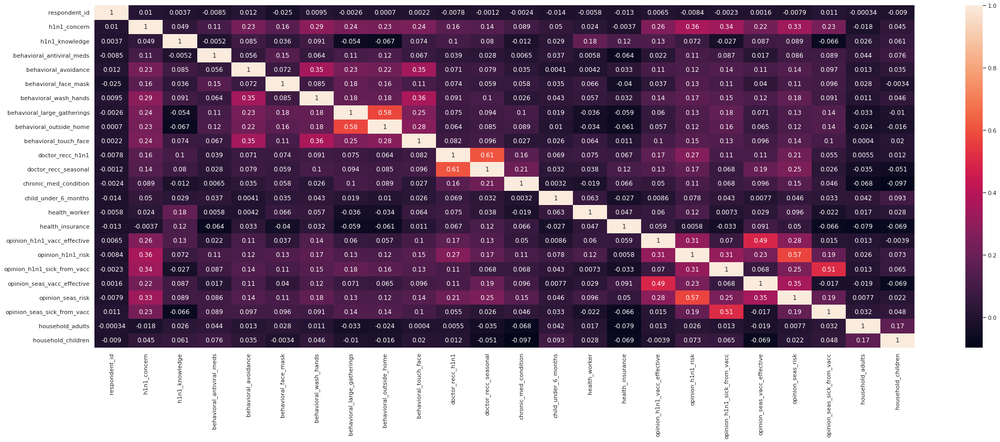

In [103]:
aux = df1.loc[~df1['health_insurance'].isna()]
corr = aux.corr(method='pearson')
sns.heatmap(corr, annot=True)

In [104]:
df1[['respondent_id', 'h1n1_concern', 'h1n1_knowledge',
       'behavioral_antiviral_meds', 'behavioral_avoidance',
       'behavioral_face_mask', 'behavioral_wash_hands',
       'behavioral_large_gatherings', 'behavioral_outside_home',
       'behavioral_touch_face', 'doctor_recc_h1n1', 'doctor_recc_seasonal',
       'chronic_med_condition', 'child_under_6_months', 'health_worker',
       'health_insurance', 'opinion_h1n1_vacc_effective', 'opinion_h1n1_risk',
       'opinion_h1n1_sick_from_vacc', 'opinion_seas_vacc_effective',
       'opinion_seas_risk', 'opinion_seas_sick_from_vacc', 'household_adults',
       'household_children']] = df1[['respondent_id', 'h1n1_concern', 'h1n1_knowledge',
       'behavioral_antiviral_meds', 'behavioral_avoidance',
       'behavioral_face_mask', 'behavioral_wash_hands',
       'behavioral_large_gatherings', 'behavioral_outside_home',
       'behavioral_touch_face', 'doctor_recc_h1n1', 'doctor_recc_seasonal',
       'chronic_med_condition', 'child_under_6_months', 'health_worker',
       'health_insurance', 'opinion_h1n1_vacc_effective', 'opinion_h1n1_risk',
       'opinion_h1n1_sick_from_vacc', 'opinion_seas_vacc_effective',
       'opinion_seas_risk', 'opinion_seas_sick_from_vacc', 'household_adults',
       'household_children']].fillna(0)

<AxesSubplot:>

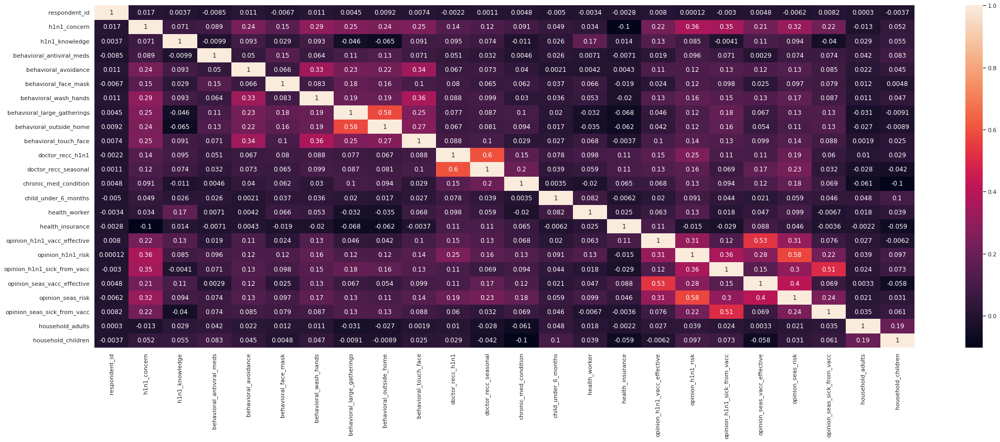

In [105]:
corr = df1.corr(method='pearson')
sns.heatmap(corr, annot=True)

In [106]:
df1.isna().sum() / df1.shape[0]

respondent_id                  0.000000
h1n1_concern                   0.000000
h1n1_knowledge                 0.000000
behavioral_antiviral_meds      0.000000
behavioral_avoidance           0.000000
behavioral_face_mask           0.000000
behavioral_wash_hands          0.000000
behavioral_large_gatherings    0.000000
behavioral_outside_home        0.000000
behavioral_touch_face          0.000000
doctor_recc_h1n1               0.000000
doctor_recc_seasonal           0.000000
chronic_med_condition          0.000000
child_under_6_months           0.000000
health_worker                  0.000000
health_insurance               0.000000
opinion_h1n1_vacc_effective    0.000000
opinion_h1n1_risk              0.000000
opinion_h1n1_sick_from_vacc    0.000000
opinion_seas_vacc_effective    0.000000
opinion_seas_risk              0.000000
opinion_seas_sick_from_vacc    0.000000
age_group                      0.000000
education                      0.052683
race                           0.000000


### Categorical NA´s

- All for employment status = employed, there is a respective occupation and industry. All employed status have occupation and industry as NA. Fill NA for these categories as 'unimployed'.

In [107]:
df1[['employment_occupation', 'employment_industry', 'employment_status']].dropna()

,employment_occupation,employment_industry,employment_status
1,xgwztkwe,pxcmvdjn,Employed
2,xtkaffoo,rucpziij,Employed
4,emcorrxb,wxleyezf,Employed
5,vlluhbov,saaquncn,Employed
6,xtkaffoo,xicduogh,Employed
...,...,...,...
26696,mxkfnird,saaquncn,Employed
26698,mxkfnird,dotnnunm,Employed
26699,xgwztkwe,pxcmvdjn,Employed
26703,cmhcxjea,fcxhlnwr,Employed


In [108]:
df1['employment_occupation'].value_counts()

xtkaffoo    1778
mxkfnird    1509
emcorrxb    1270
cmhcxjea    1247
xgwztkwe    1082
hfxkjkmi     766
qxajmpny     548
xqwwgdyp     485
kldqjyjy     469
uqqtjvyb     452
tfqavkke     388
ukymxvdu     372
vlluhbov     354
oijqvulv     344
ccgxvspp     341
bxpfxfdn     331
haliazsg     296
rcertsgn     276
xzmlyyjv     248
dlvbwzss     227
hodpvpew     208
dcjcmpih     148
pvmttkik      98
Name: employment_occupation, dtype: int64

In [109]:
df1['employment_industry'].value_counts()

fcxhlnwr    2468
wxleyezf    1804
ldnlellj    1231
pxcmvdjn    1037
atmlpfrs     926
arjwrbjb     871
xicduogh     851
mfikgejo     614
vjjrobsf     527
rucpziij     523
xqicxuve     511
saaquncn     338
cfqqtusy     325
nduyfdeo     286
mcubkhph     275
wlfvacwt     215
dotnnunm     201
haxffmxo     148
msuufmds     124
phxvnwax      89
qnlwzans      13
Name: employment_industry, dtype: int64

In [110]:
aux = df1[['employment_occupation', 'employment_industry', 'employment_status']][df1['employment_status'] != 'Employed']
aux['employment_industry'].isna().sum() / aux.shape[0]

1.0

In [111]:
df1['employment_occupation']

0             NaN
1        xgwztkwe
2        xtkaffoo
3             NaN
4        emcorrxb
           ...   
26702         NaN
26703    cmhcxjea
26704         NaN
26705    haliazsg
26706         NaN
Name: employment_occupation, Length: 26707, dtype: object

In [112]:
(aux.isna().sum()/ df1.shape[0])*100

employment_occupation    49.226794
employment_industry      49.226794
employment_status         5.477965
dtype: float64

In [113]:
# df1 = df1.drop(['employment_occupation', 'employment_industry', 'health_insurance'], axis=1)
# df1 = df1.dropna()

In [114]:
df1[['age_group', 'education', 'race', 'sex', 'child_under_6_months', 'employment_status', 'employment_occupation', 'employment_industry']].loc[df1['employment_status'].isna()].sample(30)

# nan                ---      nan          ---   nan

# Not in labor force ---      nan          ---   nan

# nan                ---      nan          ---   nan

,age_group,education,race,sex,child_under_6_months,employment_status,employment_occupation,employment_industry
25039,65+ Years,NaN,White,Male,0.0,NaN,NaN,NaN
25056,18 - 34 Years,NaN,White,Male,0.0,NaN,NaN,NaN
8537,18 - 34 Years,NaN,White,Male,1.0,NaN,NaN,NaN
4925,65+ Years,NaN,White,Male,0.0,NaN,NaN,NaN
14241,18 - 34 Years,NaN,White,Female,0.0,NaN,NaN,NaN
17206,65+ Years,NaN,White,Female,0.0,NaN,NaN,NaN
12531,65+ Years,NaN,White,Female,0.0,NaN,NaN,NaN
25445,55 - 64 Years,12 Years,White,Male,0.0,NaN,NaN,NaN
26672,18 - 34 Years,NaN,Black,Female,0.0,NaN,NaN,NaN
8875,65+ Years,NaN,White,Female,0.0,NaN,NaN,NaN


## Income Poverty

In [115]:
df1['income_poverty'].value_counts()

<= $75,000, Above Poverty    12777
> $75,000                     6810
Below Poverty                 2697
Name: income_poverty, dtype: int64

In [116]:
aux = df1[['age_group', 'education', 'race', 'sex' , 'income_poverty', 'marital_status', 'rent_or_own', 'employment_status']]
aux

,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status
0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force
1,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed
2,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed
3,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force
4,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed
...,...,...,...,...,...,...,...,...
26702,65+ Years,Some College,White,Female,"<= $75,000, Above Poverty",Not Married,Own,Not in Labor Force
26703,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Rent,Employed
26704,55 - 64 Years,Some College,White,Female,NaN,Not Married,Own,NaN
26705,18 - 34 Years,Some College,Hispanic,Female,"<= $75,000, Above Poverty",Married,Rent,Employed


<AxesSubplot:xlabel='sex', ylabel='count'>

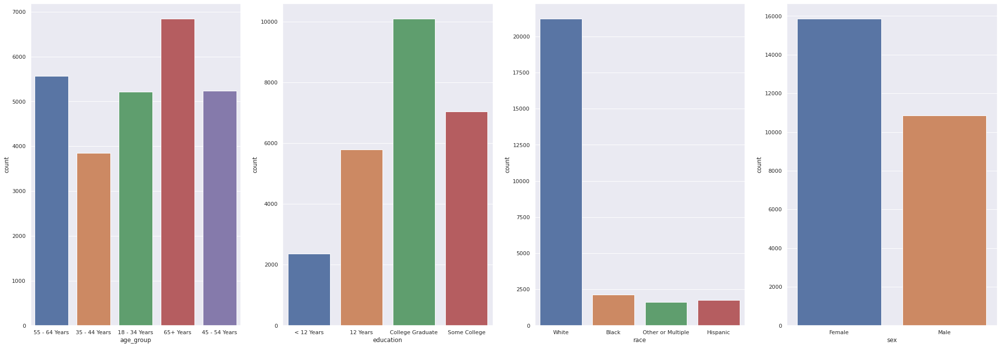

In [117]:
plt.subplot(1,4,1)
sns.countplot(x='age_group',data=aux)

plt.subplot(1,4,2)
sns.countplot(x='education',data=aux)

plt.subplot(1,4,3)
sns.countplot(x='race',data=aux)

plt.subplot(1,4,4)
sns.countplot(x='sex',data=aux)

## Fill NA

In [118]:
# employment
df1 = df1.drop(['employment_occupation', 'employment_industry'], axis=1)

# Income
df1['income_poverty'] = df1['income_poverty'].apply(lambda x: '<= $75,000, Above Poverty' if 'NaN' else x)

In [119]:
df1.shape

(26707, 36)

In [120]:
df1.isna().sum()

respondent_id                     0
h1n1_concern                      0
h1n1_knowledge                    0
behavioral_antiviral_meds         0
behavioral_avoidance              0
behavioral_face_mask              0
behavioral_wash_hands             0
behavioral_large_gatherings       0
behavioral_outside_home           0
behavioral_touch_face             0
doctor_recc_h1n1                  0
doctor_recc_seasonal              0
chronic_med_condition             0
child_under_6_months              0
health_worker                     0
health_insurance                  0
opinion_h1n1_vacc_effective       0
opinion_h1n1_risk                 0
opinion_h1n1_sick_from_vacc       0
opinion_seas_vacc_effective       0
opinion_seas_risk                 0
opinion_seas_sick_from_vacc       0
age_group                         0
education                      1407
race                              0
sex                               0
income_poverty                    0
marital_status              

In [121]:
df1 = df1.dropna()

In [122]:
df1.isna().sum()

respondent_id                  0
h1n1_concern                   0
h1n1_knowledge                 0
behavioral_antiviral_meds      0
behavioral_avoidance           0
behavioral_face_mask           0
behavioral_wash_hands          0
behavioral_large_gatherings    0
behavioral_outside_home        0
behavioral_touch_face          0
doctor_recc_h1n1               0
doctor_recc_seasonal           0
chronic_med_condition          0
child_under_6_months           0
health_worker                  0
health_insurance               0
opinion_h1n1_vacc_effective    0
opinion_h1n1_risk              0
opinion_h1n1_sick_from_vacc    0
opinion_seas_vacc_effective    0
opinion_seas_risk              0
opinion_seas_sick_from_vacc    0
age_group                      0
education                      0
race                           0
sex                            0
income_poverty                 0
marital_status                 0
rent_or_own                    0
employment_status              0
hhs_geo_re

## dtypes

In [123]:
df1.shape

(24339, 36)

In [124]:
df1.dtypes

respondent_id                    int64
h1n1_concern                   float64
h1n1_knowledge                 float64
behavioral_antiviral_meds      float64
behavioral_avoidance           float64
behavioral_face_mask           float64
behavioral_wash_hands          float64
behavioral_large_gatherings    float64
behavioral_outside_home        float64
behavioral_touch_face          float64
doctor_recc_h1n1               float64
doctor_recc_seasonal           float64
chronic_med_condition          float64
child_under_6_months           float64
health_worker                  float64
health_insurance               float64
opinion_h1n1_vacc_effective    float64
opinion_h1n1_risk              float64
opinion_h1n1_sick_from_vacc    float64
opinion_seas_vacc_effective    float64
opinion_seas_risk              float64
opinion_seas_sick_from_vacc    float64
age_group                       object
education                       object
race                            object
sex                      

## Data Analysis

In [125]:
num_attributes = df1.select_dtypes(include=['int64', 'float64'])
cat_attributes = df1.select_dtypes(include=['object'])

### Numerical

,attributes,min,max,range,mean,median,std,skew,kurtosis
0,respondent_id,0.0,26706.0,26706.0,13350.607913,13348.0,7703.846216,0.001065,-1.196713
1,h1n1_concern,0.0,3.0,3.0,1.612885,2.0,0.902508,-0.155880,-0.746575
2,h1n1_knowledge,0.0,2.0,2.0,1.275443,1.0,0.612114,-0.240114,-0.614301
3,behavioral_antiviral_meds,0.0,1.0,1.0,0.046797,0.0,0.211204,4.291866,16.421459
4,behavioral_avoidance,0.0,1.0,1.0,0.725543,1.0,0.446240,-1.010923,-0.978114
5,behavioral_face_mask,0.0,1.0,1.0,0.066765,0.0,0.249615,3.471437,10.051699
6,behavioral_wash_hands,0.0,1.0,1.0,0.826862,1.0,0.378366,-1.727862,0.985588
7,behavioral_large_gatherings,0.0,1.0,1.0,0.355273,0.0,0.478596,0.604834,-1.634311
8,behavioral_outside_home,0.0,1.0,1.0,0.332635,0.0,0.471157,0.710487,-1.495331
9,behavioral_touch_face,0.0,1.0,1.0,0.675172,1.0,0.468311,-0.748146,-1.440396


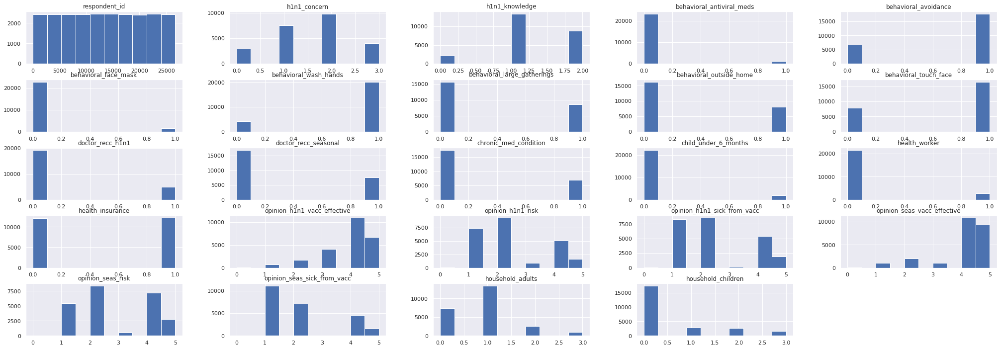

In [126]:
num_analysis(num_attributes)

### Categorical

In [127]:
cat_attributes.head()

,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,h1n1,seasonal
0,55 - 64 Years,< 12 Years,White,Female,"<= $75,000, Above Poverty",Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0,0
1,35 - 44 Years,12 Years,White,Male,"<= $75,000, Above Poverty",Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0,1
2,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",0,0
3,65+ Years,12 Years,White,Female,"<= $75,000, Above Poverty",Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0,1
4,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",0,0


In [130]:
# health_insurance               45.957989
# income_poverty                 16.561201
# employment_industry            49.912008
# employment_occupation          50.436215

In [131]:
cat_attributes.apply(lambda x: x.unique().shape).T

,0
age_group,5
education,4
race,4
sex,2
income_poverty,1
marital_status,2
rent_or_own,2
employment_status,3
hhs_geo_region,10
census_msa,3


In [132]:
(cat_attributes.isna().sum() / df1.shape[0])*100

age_group            0.0
education            0.0
race                 0.0
sex                  0.0
income_poverty       0.0
marital_status       0.0
rent_or_own          0.0
employment_status    0.0
hhs_geo_region       0.0
census_msa           0.0
h1n1                 0.0
seasonal             0.0
dtype: float64

<AxesSubplot:xlabel='sex', ylabel='count'>

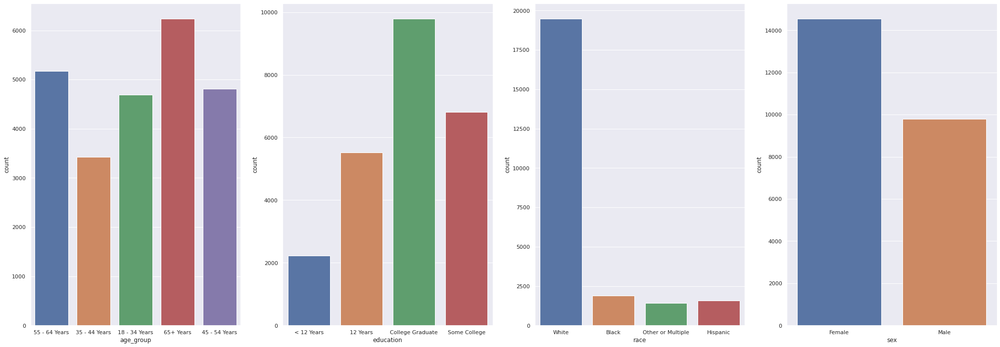

In [133]:
plt.subplot(1,4,1)
sns.countplot(x='age_group',data=cat_attributes)

plt.subplot(1,4,2)
sns.countplot(x='education',data=cat_attributes)

plt.subplot(1,4,3)
sns.countplot(x='race',data=cat_attributes)

plt.subplot(1,4,4)
sns.countplot(x='sex',data=cat_attributes)

<AxesSubplot:xlabel='rent_or_own', ylabel='count'>

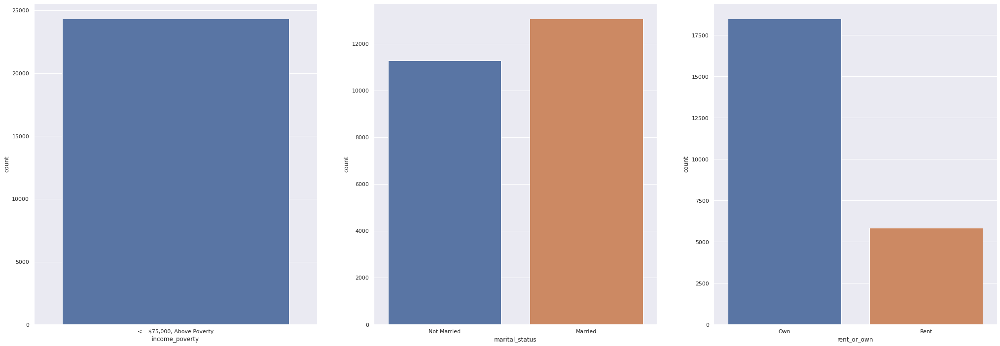

In [134]:
plt.subplot(1,3,1)
sns.countplot(x='income_poverty', data=cat_attributes)

plt.subplot(1,3,2)
sns.countplot(x='marital_status', data=cat_attributes)

plt.subplot(1,3,3)
sns.countplot(x='rent_or_own', data=cat_attributes)

<AxesSubplot:xlabel='census_msa', ylabel='count'>

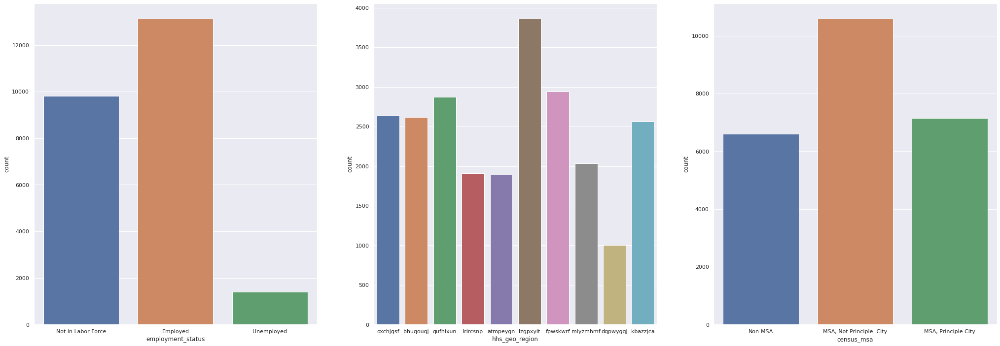

In [135]:
plt.subplot(1,3,1)
sns.countplot(x='employment_status', data=cat_attributes)

plt.subplot(1,3,2)
sns.countplot(x='hhs_geo_region', data=cat_attributes)

plt.subplot(1,3,3)
sns.countplot(x='census_msa', data=cat_attributes)

<AxesSubplot:xlabel='employment_status', ylabel='count'>

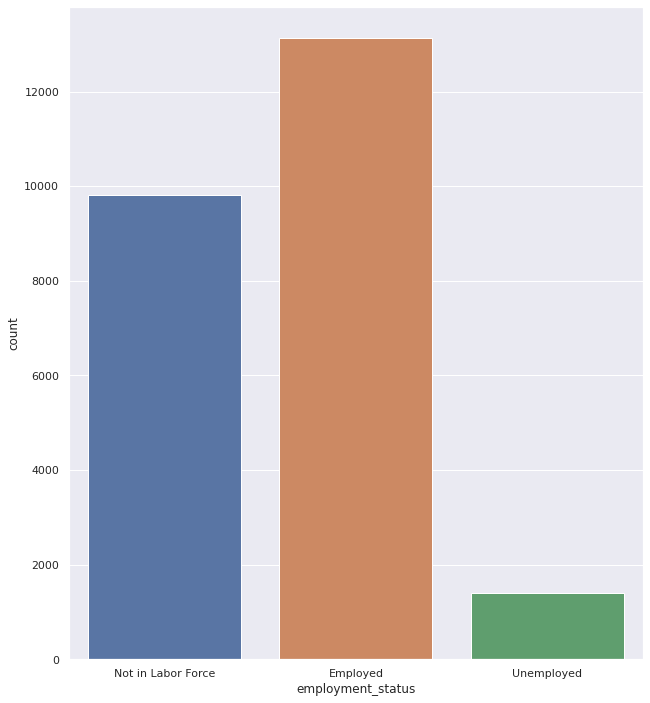

In [136]:
plt.subplot(1,3,1)
sns.countplot(x='employment_status', data=cat_attributes)

# 2.0. Feature Engineering

In [137]:
df2 = df1.copy()

### The features in this dataset

You are provided a dataset with 36 columns. The first column respondent_id is a unique and random identifier. The remaining 35 features are described below.

* For all binary variables: 0 = No; 1 = Yes.

* h1n1_concern - Level of concern about the H1N1 flu.

* 0 = Not at all concerned; 1 = Not very concerned; 2 = Somewhat concerned; 3 = Very concerned.

* h1n1_knowledge - Level of knowledge about H1N1 flu.

* 0 = No knowledge; 1 = A little knowledge; 2 = A lot of knowledge.

* behavioral_antiviral_meds - Has taken antiviral medications. (binary)

* behavioral_avoidance - Has avoided close contact with others with flu-like symptoms. (binary)

* behavioral_face_mask - Has bought a face mask. (binary)

* behavioral_wash_hands - Has frequently washed hands or used hand sanitizer. (binary)

* behavioral_large_gatherings - Has reduced time at large gatherings. (binary)

* behavioral_outside_home - Has reduced contact with people outside of own household. (binary)

* behavioral_touch_face - Has avoided touching eyes, nose, or mouth. (binary)

* doctor_recc_h1n1 - H1N1 flu vaccine was recommended by doctor. (binary)

* doctor_recc_seasonal - Seasonal flu vaccine was recommended by doctor. (binary)

* chronic_med_condition - Has any of the following chronic medical conditions: asthma or an other lung condition, diabetes, a heart condition, a kidney condition, sickle cell anemia or other anemia, a neurological or neuromuscular condition, a liver condition, or a weakened immune system caused by a chronic illness or by medicines taken for a chronic illness. (binary)

* child_under_6_months - Has regular close contact with a child under the age of six months. (binary)

* health_worker - Is a healthcare worker. (binary)

* health_insurance - Has health insurance. (binary)

* opinion_h1n1_vacc_effective - Respondent's opinion about H1N1 vaccine effectiveness.

* 1 = Not at all effective; 2 = Not very effective; 3 = Don't know; 4 = Somewhat effective; 5 = Very effective.

* opinion_h1n1_risk - Respondent's opinion about risk of getting sick with H1N1 flu without vaccine.

* 1 = Very Low; 2 = Somewhat low; 3 = Don't know; 4 = Somewhat high; 5 = Very high.

* opinion_h1n1_sick_from_vacc - Respondent's worry of getting sick from taking H1N1 vaccine.

* 1 = Not at all worried; 2 = Not very worried; 3 = Don't know; 4 = Somewhat worried; 5 = Very worried.

* opinion_seas_vacc_effective - Respondent's opinion about seasonal flu vaccine effectiveness.

* 1 = Not at all effective; 2 = Not very effective; 3 = Don't know; 4 = Somewhat effective; 5 = Very effective.

* opinion_seas_risk - Respondent's opinion about risk of getting sick with seasonal flu without vaccine.

* 1 = Very Low; 2 = Somewhat low; 3 = Don't know; 4 = Somewhat high; 5 = Very high.

* opinion_seas_sick_from_vacc - Respondent's worry of getting sick from taking seasonal flu vaccine.

* 1 = Not at all worried; 2 = Not very worried; 3 = Don't know; 4 = Somewhat worried; 5 = Very worried.

* age_group - Age group of respondent.

* education - Self-reported education level.

* race - Race of respondent.

* sex - Sex of respondent.

* income_poverty - Household annual income of respondent with respect to 2008 Census poverty thresholds.

* marital_status - Marital status of respondent.

* rent_or_own - Housing situation of respondent.

* employment_status - Employment status of respondent.

* hhs_geo_region - Respondent's residence using a 10-region geographic classification defined by the U.S. Dept. of Health and Human Services. Values are represented as short random character strings.

* census_msa - Respondent's residence within metropolitan statistical areas (MSA) as defined by the U.S. Census.

* household_adults - Number of other adults in household, top-coded to 3.

* household_children - Number of children in household, top-coded to 3.

* employment_industry - Type of industry respondent is employed in. Values are represented as short random character strings.

* employment_occupation - Type of occupation of respondent. Values are represented as short random character strings.

### Response Variable

In [138]:
# df2['response'] = df2[['h1n1', 'seasonal']].apply(lambda x: 3 if (x['h1n1'] == 0 & x['seasonal'] == 0) else (4 if (x['h1n1'] == 1 & x['seasonal'] == 1) else 2 if (x['h1n1'] == 1 & x['seasonal'] == 0) else 1), axis=1, raw=False)

# apply and lambda function seem not to work correctly together when the number of conditional arguments is above 3.
# the solution I found for creating the multilabel response variable was to convert to object and bind both features as a string. '00', '01', '10', '11'.
# then I´ll map a function to attribute values from 1 to 4 to each class.

In [139]:
# df2['response_aux'] = df2['h1n1'].str.cat(df2['seasonal'])
# df2['response'] = df2['h1n1'].str.cat(df2['seasonal'])

# NV --- NO VACCINE
# HV --- VACCINE H1N1
# SV --- SEASONAL VACCINE
# BV --- BOTH VACCINES

# dic = {'00': 'NV',
#       '01': 'SV',
#       '10': 'HV',
#       '11': 'BV'}

In [140]:
# df2 = df2.replace({'response': dic})
df2

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,h1n1,seasonal
0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,"<= $75,000, Above Poverty",Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,0,0
1,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,"<= $75,000, Above Poverty",Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,0,1
2,2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,0,0
3,3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,"<= $75,000, Above Poverty",Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,0,1
4,4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26701,26701,2.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,4.0,2.0,4.0,4.0,2.0,4.0,18 - 34 Years,College Graduate,White,Female,"<= $75,000, Above Poverty",Not Married,Rent,Not in Labor Force,fpwskwrf,"MSA, Principle City",3.0,0.0,0,0
26702,26702,2.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,1.0,5.0,2.0,2.0,65+ Years,Some College,White,Female,"<= $75,000, Above Poverty",Not Married,Own,Not in Labor Force,qufhixun,Non-MSA,0.0,0.0,0,0
26703,26703,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,4.0,2.0,2.0,5.0,1.0,1.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Rent,Employed,lzgpxyit,"MSA, Principle City",1.0,0.0,0,0
26705,26705,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,2.0,2.0,1.0,2.0,18 - 34 Years,Some College,Hispanic,Female,"<= $75,000, Above Poverty",Married,Rent,Employed,lrircsnp,Non-MSA,1.0,0.0,0,0


In [141]:
df2['h1n1'].value_counts() / df2.shape[0]

0    0.78557
1    0.21443
Name: h1n1, dtype: float64

In [142]:
df2['seasonal'].value_counts() / df2.shape[0]

0    0.530835
1    0.469165
Name: seasonal, dtype: float64

### General H1N1

In [143]:
df2[['h1n1_concern', 'h1n1_knowledge']]

,h1n1_concern,h1n1_knowledge
0,1.0,0.0
1,3.0,2.0
2,1.0,1.0
3,1.0,1.0
4,2.0,1.0
...,...,...
26701,2.0,2.0
26702,2.0,0.0
26703,1.0,2.0
26705,1.0,1.0


In [144]:
df2['general_h1n1'] = df2['h1n1_concern'] + df2['h1n1_knowledge']

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='general_h1n1', ylabel='Density'>

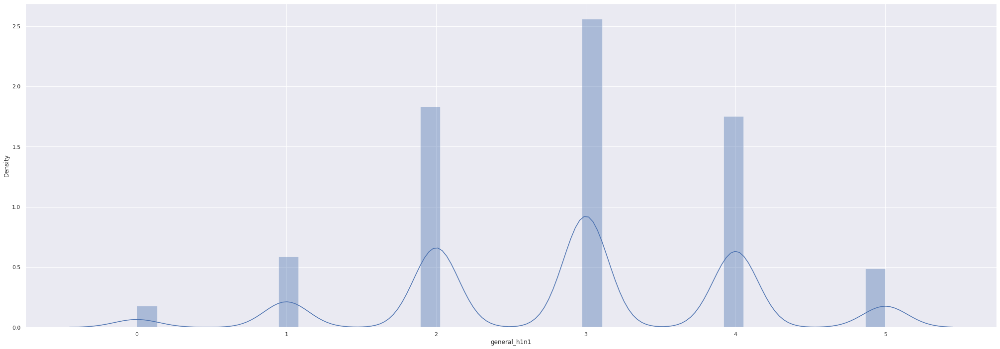

In [145]:
sns.distplot(df2['general_h1n1'])

### General Behavior

In [146]:
df2.columns

Index(['respondent_id', 'h1n1_concern', 'h1n1_knowledge',
       'behavioral_antiviral_meds', 'behavioral_avoidance',
       'behavioral_face_mask', 'behavioral_wash_hands',
       'behavioral_large_gatherings', 'behavioral_outside_home',
       'behavioral_touch_face', 'doctor_recc_h1n1', 'doctor_recc_seasonal',
       'chronic_med_condition', 'child_under_6_months', 'health_worker',
       'health_insurance', 'opinion_h1n1_vacc_effective', 'opinion_h1n1_risk',
       'opinion_h1n1_sick_from_vacc', 'opinion_seas_vacc_effective',
       'opinion_seas_risk', 'opinion_seas_sick_from_vacc', 'age_group',
       'education', 'race', 'sex', 'income_poverty', 'marital_status',
       'rent_or_own', 'employment_status', 'hhs_geo_region', 'census_msa',
       'household_adults', 'household_children', 'h1n1', 'seasonal',
       'general_h1n1'],
      dtype='object')

In [147]:
df2[['behavioral_antiviral_meds', 'behavioral_avoidance',
       'behavioral_face_mask', 'behavioral_wash_hands',
       'behavioral_large_gatherings', 'behavioral_outside_home',
       'behavioral_touch_face']]

,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face
0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
1,0.0,1.0,0.0,1.0,0.0,1.0,1.0
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,0.0,1.0,0.0,1.0,1.0,0.0,0.0
4,0.0,1.0,0.0,1.0,1.0,0.0,1.0
...,...,...,...,...,...,...,...
26701,0.0,0.0,0.0,1.0,0.0,0.0,1.0
26702,0.0,1.0,0.0,0.0,0.0,1.0,0.0
26703,0.0,1.0,0.0,1.0,0.0,0.0,0.0
26705,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [148]:
df2['behaviour_general'] = df2['behavioral_antiviral_meds'] + df2['behavioral_avoidance'] + df2['behavioral_face_mask'] + df2['behavioral_wash_hands'] + df2['behavioral_large_gatherings'] + df2['behavioral_outside_home'] + df2['behavioral_touch_face']

<AxesSubplot:xlabel='behaviour_general', ylabel='Count'>

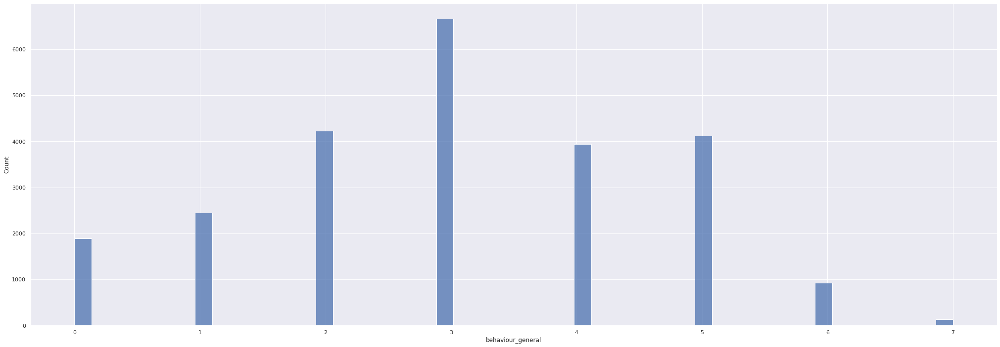

In [149]:
sns.histplot(data = df2['behaviour_general'])

### General Details

In [150]:
df2[['doctor_recc_h1n1', 'doctor_recc_seasonal',
       'chronic_med_condition', 'child_under_6_months', 'health_worker',
       'health_insurance']]

,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance
0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.0,0.0,0.0,0.0,0.0,1.0
2,0.0,0.0,1.0,0.0,0.0,0.0
3,0.0,1.0,1.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...
26701,0.0,0.0,0.0,1.0,0.0,1.0
26702,0.0,0.0,0.0,0.0,0.0,0.0
26703,1.0,1.0,0.0,0.0,1.0,1.0
26705,0.0,0.0,0.0,0.0,0.0,0.0


In [151]:
df2['details_general'] = df2['doctor_recc_h1n1'] + df2['doctor_recc_seasonal'] + df2['chronic_med_condition'] + df2['child_under_6_months'] + df2['health_worker'] + df2['health_insurance']

<AxesSubplot:xlabel='details_general', ylabel='Count'>

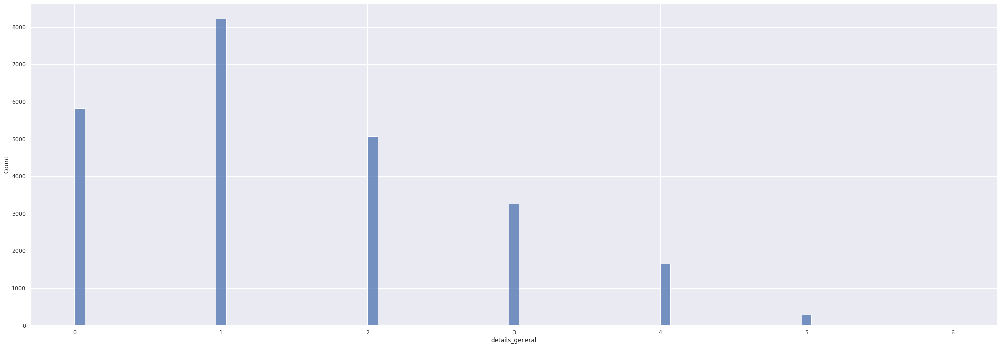

In [152]:
sns.histplot(data = df2['details_general'])

## General Opinion

In [153]:
df2[['opinion_h1n1_vacc_effective', 'opinion_h1n1_risk',
       'opinion_h1n1_sick_from_vacc', 'opinion_seas_vacc_effective',
       'opinion_seas_risk', 'opinion_seas_sick_from_vacc']]

,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc
0,3.0,1.0,2.0,2.0,1.0,2.0
1,5.0,4.0,4.0,4.0,2.0,4.0
2,3.0,1.0,1.0,4.0,1.0,2.0
3,3.0,3.0,5.0,5.0,4.0,1.0
4,3.0,3.0,2.0,3.0,1.0,4.0
...,...,...,...,...,...,...
26701,4.0,2.0,4.0,4.0,2.0,4.0
26702,3.0,1.0,1.0,5.0,2.0,2.0
26703,4.0,2.0,2.0,5.0,1.0,1.0
26705,3.0,1.0,2.0,2.0,1.0,2.0


In [154]:
df2['opinion_general'] = df2['opinion_h1n1_vacc_effective'] + df2['opinion_h1n1_risk'] + df2['opinion_h1n1_sick_from_vacc'] + df2['opinion_seas_vacc_effective'] + df2['opinion_seas_risk'] + df2['opinion_seas_sick_from_vacc']

<AxesSubplot:xlabel='opinion_general', ylabel='Count'>

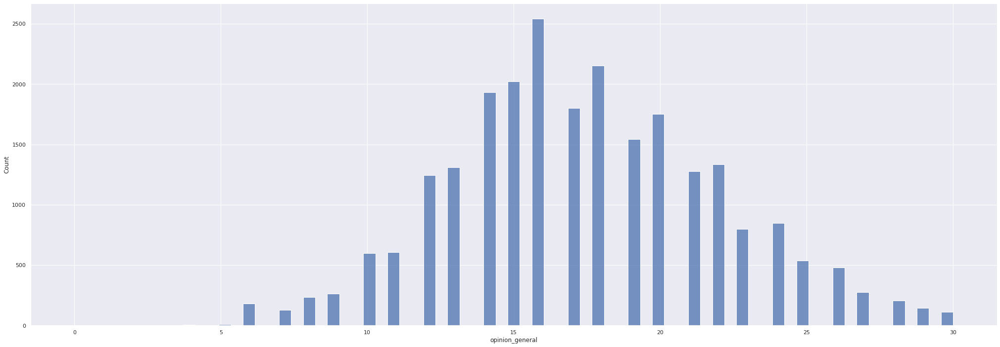

In [155]:
sns.histplot(data = df2['opinion_general'])

### Multiplying Features

In [156]:
df2.columns

Index(['respondent_id', 'h1n1_concern', 'h1n1_knowledge',
       'behavioral_antiviral_meds', 'behavioral_avoidance',
       'behavioral_face_mask', 'behavioral_wash_hands',
       'behavioral_large_gatherings', 'behavioral_outside_home',
       'behavioral_touch_face', 'doctor_recc_h1n1', 'doctor_recc_seasonal',
       'chronic_med_condition', 'child_under_6_months', 'health_worker',
       'health_insurance', 'opinion_h1n1_vacc_effective', 'opinion_h1n1_risk',
       'opinion_h1n1_sick_from_vacc', 'opinion_seas_vacc_effective',
       'opinion_seas_risk', 'opinion_seas_sick_from_vacc', 'age_group',
       'education', 'race', 'sex', 'income_poverty', 'marital_status',
       'rent_or_own', 'employment_status', 'hhs_geo_region', 'census_msa',
       'household_adults', 'household_children', 'h1n1', 'seasonal',
       'general_h1n1', 'behaviour_general', 'details_general',
       'opinion_general'],
      dtype='object')

In [157]:
# General H1N1 x General Behaviour
df2['h1n1_x_behaviour'] = df2['general_h1n1']*df2['behaviour_general']

# General H1N1 x General Detais
df2['h1n1_x_details'] = df2['general_h1n1']*df2['details_general']

# General H1N1 x General Opinion
df2['h1n1_x_opinion'] = df2['general_h1n1']*df2['opinion_general']

# General Detais x General Behaviour
df2['details_x_behaviour'] = df2['details_general']*df2['behaviour_general']

# General Detais x General Opinion
df2['details_x_opinion'] = df2['details_general']*df2['opinion_general']

# General Opinion x General Behaviour
df2['opinion_x_details'] = df2['opinion_general']*df2['behaviour_general']

array([[<AxesSubplot:title={'center':'general_h1n1'}>,
        <AxesSubplot:title={'center':'behaviour_general'}>,
        <AxesSubplot:title={'center':'details_general'}>],
       [<AxesSubplot:title={'center':'opinion_general'}>,
        <AxesSubplot:title={'center':'h1n1_x_behaviour'}>,
        <AxesSubplot:title={'center':'h1n1_x_details'}>],
       [<AxesSubplot:title={'center':'h1n1_x_opinion'}>,
        <AxesSubplot:title={'center':'details_x_behaviour'}>,
        <AxesSubplot:title={'center':'details_x_opinion'}>],
       [<AxesSubplot:title={'center':'opinion_x_details'}>,
        <AxesSubplot:>, <AxesSubplot:>]], dtype=object)

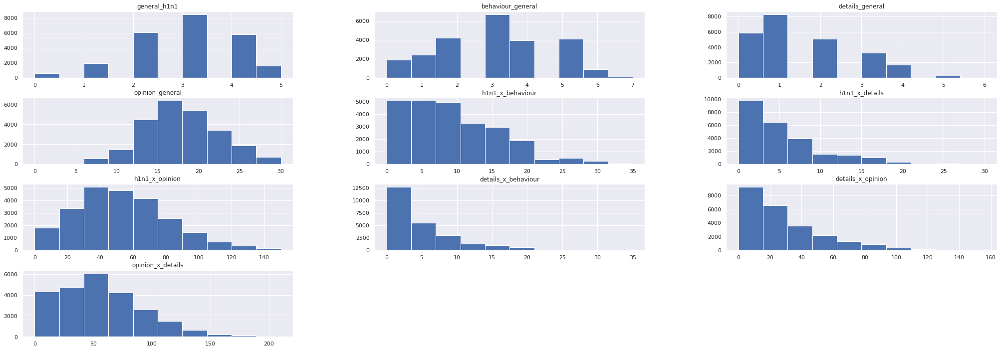

In [158]:
df2[['general_h1n1',
       'behaviour_general', 'details_general', 'opinion_general',
       'h1n1_x_behaviour', 'h1n1_x_details', 'h1n1_x_opinion',
       'details_x_behaviour', 'details_x_opinion', 'opinion_x_details']].hist()

# 3.0. Filter

In [159]:
df3 = df2.copy()

# 4.0. Exploratory Data Analysis (EDA)

In [160]:
df4 = df3.copy()

In [161]:
df4.to_csv('../data/interim/df4.csv')

# 5.0. Data Preparation

In [171]:
df5 = df4.copy()

## Rescalling

In [172]:
ss = pp.StandardScaler()
mm = pp.MinMaxScaler()

In [173]:
df5.dtypes

respondent_id                    int64
h1n1_concern                   float64
h1n1_knowledge                 float64
behavioral_antiviral_meds      float64
behavioral_avoidance           float64
behavioral_face_mask           float64
behavioral_wash_hands          float64
behavioral_large_gatherings    float64
behavioral_outside_home        float64
behavioral_touch_face          float64
doctor_recc_h1n1               float64
doctor_recc_seasonal           float64
chronic_med_condition          float64
child_under_6_months           float64
health_worker                  float64
health_insurance               float64
opinion_h1n1_vacc_effective    float64
opinion_h1n1_risk              float64
opinion_h1n1_sick_from_vacc    float64
opinion_seas_vacc_effective    float64
opinion_seas_risk              float64
opinion_seas_sick_from_vacc    float64
age_group                       object
education                       object
race                            object
sex                      

,attributes,min,max,range,mean,median,std,skew,kurtosis
0,respondent_id,0.0,26706.0,26706.0,13350.607913,13348.0,7703.846216,0.001065,-1.196713
1,h1n1_concern,0.0,3.0,3.0,1.612885,2.0,0.902508,-0.155880,-0.746575
2,h1n1_knowledge,0.0,2.0,2.0,1.275443,1.0,0.612114,-0.240114,-0.614301
3,behavioral_antiviral_meds,0.0,1.0,1.0,0.046797,0.0,0.211204,4.291866,16.421459
4,behavioral_avoidance,0.0,1.0,1.0,0.725543,1.0,0.446240,-1.010923,-0.978114
5,behavioral_face_mask,0.0,1.0,1.0,0.066765,0.0,0.249615,3.471437,10.051699
6,behavioral_wash_hands,0.0,1.0,1.0,0.826862,1.0,0.378366,-1.727862,0.985588
7,behavioral_large_gatherings,0.0,1.0,1.0,0.355273,0.0,0.478596,0.604834,-1.634311
8,behavioral_outside_home,0.0,1.0,1.0,0.332635,0.0,0.471157,0.710487,-1.495331
9,behavioral_touch_face,0.0,1.0,1.0,0.675172,1.0,0.468311,-0.748146,-1.440396


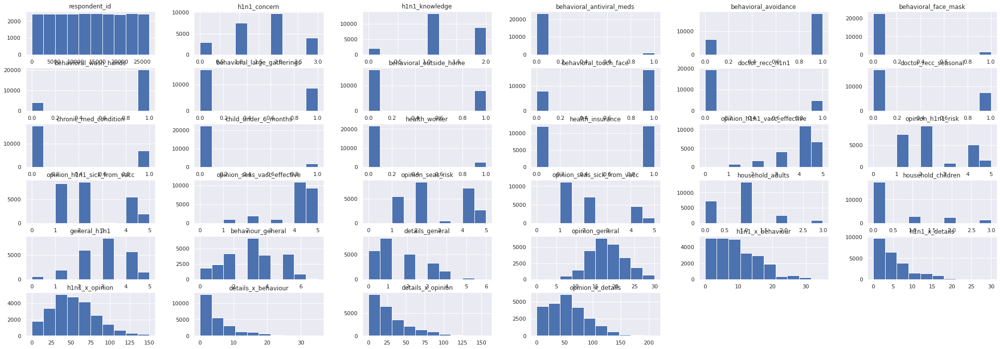

In [165]:
aux = df5.select_dtypes(include=['float64', 'int64'])

num_analysis(aux)

In [166]:
df5.select_dtypes(include=['float64', 'int64']).columns

Index(['respondent_id', 'h1n1_concern', 'h1n1_knowledge',
       'behavioral_antiviral_meds', 'behavioral_avoidance',
       'behavioral_face_mask', 'behavioral_wash_hands',
       'behavioral_large_gatherings', 'behavioral_outside_home',
       'behavioral_touch_face', 'doctor_recc_h1n1', 'doctor_recc_seasonal',
       'chronic_med_condition', 'child_under_6_months', 'health_worker',
       'health_insurance', 'opinion_h1n1_vacc_effective', 'opinion_h1n1_risk',
       'opinion_h1n1_sick_from_vacc', 'opinion_seas_vacc_effective',
       'opinion_seas_risk', 'opinion_seas_sick_from_vacc', 'household_adults',
       'household_children', 'general_h1n1', 'behaviour_general',
       'details_general', 'opinion_general', 'h1n1_x_behaviour',
       'h1n1_x_details', 'h1n1_x_opinion', 'details_x_behaviour',
       'details_x_opinion', 'opinion_x_details'],
      dtype='object')

In [167]:
min_max_columns = ['h1n1_concern', 'h1n1_knowledge', 'opinion_h1n1_vacc_effective', 'opinion_h1n1_risk',
       'opinion_h1n1_sick_from_vacc', 'opinion_seas_vacc_effective',
       'opinion_seas_risk', 'opinion_seas_sick_from_vacc', 'household_adults',
       'household_children', 'general_h1n1', 'behaviour_general',
       'details_general', 'h1n1_x_behaviour',
       'h1n1_x_details', 'h1n1_x_opinion', 'details_x_behaviour',
       'details_x_opinion', 'opinion_x_details']

In [174]:
for i in min_max_columns:
    df5[i] = mm.fit_transform(df5[i].values.reshape(-1,1))
    
df5['opinion_general'] = ss.fit_transform(df5['opinion_general'].values.reshape(-1,1))

,attributes,min,max,range,mean,median,std,skew,kurtosis
0,respondent_id,0.000000,26706.000000,26706.000000,1.335061e+04,13348.000000,7703.846216,0.001065,-1.196713
1,h1n1_concern,0.000000,1.000000,1.000000,5.376282e-01,0.666667,0.300836,-0.155880,-0.746575
2,h1n1_knowledge,0.000000,1.000000,1.000000,6.377214e-01,0.500000,0.306057,-0.240114,-0.614301
3,behavioral_antiviral_meds,0.000000,1.000000,1.000000,4.679732e-02,0.000000,0.211204,4.291866,16.421459
4,behavioral_avoidance,0.000000,1.000000,1.000000,7.255434e-01,1.000000,0.446240,-1.010923,-0.978114
5,behavioral_face_mask,0.000000,1.000000,1.000000,6.676527e-02,0.000000,0.249615,3.471437,10.051699
6,behavioral_wash_hands,0.000000,1.000000,1.000000,8.268622e-01,1.000000,0.378366,-1.727862,0.985588
7,behavioral_large_gatherings,0.000000,1.000000,1.000000,3.552734e-01,0.000000,0.478596,0.604834,-1.634311
8,behavioral_outside_home,0.000000,1.000000,1.000000,3.326349e-01,0.000000,0.471157,0.710487,-1.495331
9,behavioral_touch_face,0.000000,1.000000,1.000000,6.751715e-01,1.000000,0.468311,-0.748146,-1.440396


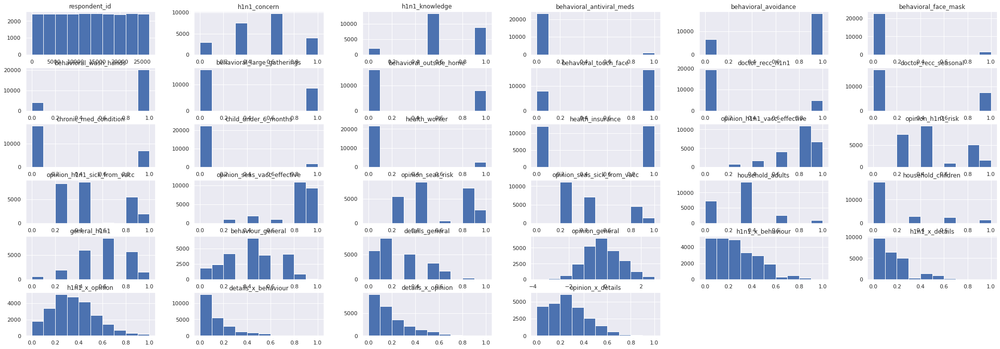

In [175]:
aux = df5.select_dtypes(include=['float64', 'int64'])

num_analysis(aux)

## Encoding

In [176]:
df5.select_dtypes(include=['object']).columns

Index(['age_group', 'education', 'race', 'sex', 'income_poverty',
       'marital_status', 'rent_or_own', 'employment_status', 'hhs_geo_region',
       'census_msa', 'h1n1', 'seasonal'],
      dtype='object')

In [177]:
df5 = pd.get_dummies(df5, columns = ['age_group', 'education', 'race', 'sex', 'income_poverty',
       'marital_status', 'rent_or_own', 'employment_status', 'hhs_geo_region',
       'census_msa'])

In [178]:
df5.columns

Index(['respondent_id', 'h1n1_concern', 'h1n1_knowledge',
       'behavioral_antiviral_meds', 'behavioral_avoidance',
       'behavioral_face_mask', 'behavioral_wash_hands',
       'behavioral_large_gatherings', 'behavioral_outside_home',
       'behavioral_touch_face', 'doctor_recc_h1n1', 'doctor_recc_seasonal',
       'chronic_med_condition', 'child_under_6_months', 'health_worker',
       'health_insurance', 'opinion_h1n1_vacc_effective', 'opinion_h1n1_risk',
       'opinion_h1n1_sick_from_vacc', 'opinion_seas_vacc_effective',
       'opinion_seas_risk', 'opinion_seas_sick_from_vacc', 'household_adults',
       'household_children', 'h1n1', 'seasonal', 'general_h1n1',
       'behaviour_general', 'details_general', 'opinion_general',
       'h1n1_x_behaviour', 'h1n1_x_details', 'h1n1_x_opinion',
       'details_x_behaviour', 'details_x_opinion', 'opinion_x_details',
       'age_group_18 - 34 Years', 'age_group_35 - 44 Years',
       'age_group_45 - 54 Years', 'age_group_55 - 64 Years

In [179]:
df5.to_csv('../data/interim/df5.csv', index=False)

In [180]:
df5.shape

(24339, 72)

## Balancing Response Variable (oversampling)

In [182]:
# unbalanced ratio
df5['h1n1'].value_counts()

0    19120
1     5219
Name: h1n1, dtype: int64

In [183]:
# unbalanced ratio
df5['seasonal'].value_counts()

0    12920
1    11419
Name: seasonal, dtype: int64

## Balancing for df_h1n1

In [184]:
df5

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,household_adults,household_children,h1n1,seasonal,general_h1n1,behaviour_general,details_general,opinion_general,h1n1_x_behaviour,h1n1_x_details,h1n1_x_opinion,details_x_behaviour,details_x_opinion,opinion_x_details,age_group_18 - 34 Years,age_group_35 - 44 Years,age_group_45 - 54 Years,age_group_55 - 64 Years,age_group_65+ Years,education_12 Years,education_< 12 Years,education_College Graduate,education_Some College,race_Black,race_Hispanic,race_Other or Multiple,race_White,sex_Female,sex_Male,"income_poverty_<= $75,000, Above Poverty",marital_status_Married,marital_status_Not Married,rent_or_own_Own,rent_or_own_Rent,employment_status_Employed,employment_status_Not in Labor Force,employment_status_Unemployed,hhs_geo_region_atmpeygn,hhs_geo_region_bhuqouqj,hhs_geo_region_dqpwygqj,hhs_geo_region_fpwskwrf,hhs_geo_region_kbazzjca,hhs_geo_region_lrircsnp,hhs_geo_region_lzgpxyit,hhs_geo_region_mlyzmhmf,hhs_geo_region_oxchjgsf,hhs_geo_region_qufhixun,"census_msa_MSA, Not Principle City","census_msa_MSA, Principle City",census_msa_Non-MSA
0,0,0.333333,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.6,0.2,0.4,0.4,0.2,0.4,0.000000,0.0,0,0,0.2,0.285714,0.166667,-1.399073,0.057143,0.033333,0.073333,0.057143,0.070513,0.104762,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1
1,1,1.000000,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.8,0.8,0.8,0.4,0.8,0.000000,0.0,0,1,1.0,0.571429,0.166667,1.213031,0.571429,0.166667,0.766667,0.114286,0.147436,0.438095,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,1,0,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
2,2,0.333333,0.5,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.6,0.2,0.2,0.8,0.2,0.4,0.666667,0.0,0,0,0.4,0.142857,0.166667,-1.181398,0.057143,0.066667,0.160000,0.028571,0.076923,0.057143,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0
3,3,0.333333,0.5,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.6,0.6,1.0,1.0,0.8,0.2,0.000000,0.0,0,1,0.4,0.428571,0.333333,0.777680,0.171429,0.133333,0.280000,0.171429,0.269231,0.300000,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,1,0,1,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0
4,4,0.666667,0.5,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.6,0.6,0.4,0.6,0.2,0.8,0.333333,0.0,0,0,0.6,0.571429,0.000000,-0.310696,0.342857,0.000000,0.320000,0.000000,0.000000,0.304762,0,0,1,0,0,0,0,0,1,0,0,0,1,1,0,1,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26701,26701,0.666667,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.8,0.4,0.8,0.8,0.4,0.8,1.000000,0.0,0,0,0.8,0.285714,0.333333,0.560005,0.228571,0.266667,0.533333,0.114286,0.256410,0.190476,1,0,0,0,0,0,0,1,0,0,0,0,1,1,0,1,0,1,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0
26702,26702,0.666667,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.6,0.2,0.2,1.0,0.4,0.4,0.000000,0.0,0,0,0.4,0.285714,0.000000,-0.746047,0.114286,0.000000,0.186667,0.000000,0.000000,0.133333,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1
26703,26703,0.333333,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.8,0.4,0.4,1.0,0.2,0.2,0.333333,0.0,0,0,0.6,0.285714,0.666667,-0.528372,0.171429,0.400000,0.300000,0.228571,0.384615,0.142857,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
26705,26705,0.333333,0.5,0.

In [186]:
df_h1n1 = df5.copy()

In [187]:
df_h1n1 = df_h1n1.drop(['respondent_id', 'seasonal'], axis=1)

In [188]:
# df to train SMOTE (Synthetic Minority Oversampling Technique)
df_aux = df_h1n1.drop(['h1n1'], axis=1).copy()

# balanced ratio

ratio = {'0': 19120, '1': 19120}

# sampler
sampler = c.SMOTETomek(sampling_strategy=ratio, random_state=42, n_jobs=-1)

# apply sampler.fit_resamples for x and y, and concatenate them back together
X_smt, y_smt = sampler.fit_resample(df_aux, df_h1n1['h1n1'])

In [190]:
pd.concat([X_smt, y_smt], axis=1)

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,household_adults,household_children,general_h1n1,behaviour_general,details_general,opinion_general,h1n1_x_behaviour,h1n1_x_details,h1n1_x_opinion,details_x_behaviour,details_x_opinion,opinion_x_details,age_group_18 - 34 Years,age_group_35 - 44 Years,age_group_45 - 54 Years,age_group_55 - 64 Years,age_group_65+ Years,education_12 Years,education_< 12 Years,education_College Graduate,education_Some College,race_Black,race_Hispanic,race_Other or Multiple,race_White,sex_Female,sex_Male,"income_poverty_<= $75,000, Above Poverty",marital_status_Married,marital_status_Not Married,rent_or_own_Own,rent_or_own_Rent,employment_status_Employed,employment_status_Not in Labor Force,employment_status_Unemployed,hhs_geo_region_atmpeygn,hhs_geo_region_bhuqouqj,hhs_geo_region_dqpwygqj,hhs_geo_region_fpwskwrf,hhs_geo_region_kbazzjca,hhs_geo_region_lrircsnp,hhs_geo_region_lzgpxyit,hhs_geo_region_mlyzmhmf,hhs_geo_region_oxchjgsf,hhs_geo_region_qufhixun,"census_msa_MSA, Not Principle City","census_msa_MSA, Principle City",census_msa_Non-MSA,h1n1
0,0.333333,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.0,0.000000,1.0,0.600000,0.200000,0.400000,0.400000,0.200000,0.400000,0.000000,0.000000,0.200000,0.285714,0.166667,-1.399073,0.057143,0.033333,0.073333,0.057143,0.070513,0.104762,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1,1.000000,1.000000,0.000000,1.0,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.0,0.000000,1.0,1.000000,0.800000,0.800000,0.800000,0.400000,0.800000,0.000000,0.000000,1.000000,0.571429,0.166667,1.213031,0.571429,0.166667,0.766667,0.114286,0.147436,0.438095,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,1,0,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0
2,0.333333,0.500000,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.0,0.000000,0.0,0.600000,0.200000,0.200000,0.800000,0.200000,0.400000,0.666667,0.000000,0.400000,0.142857,0.166667,-1.181398,0.057143,0.066667,0.160000,0.028571,0.076923,0.057143,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
3,0.333333,0.500000,0.000000,1.0,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.0,0.000000,0.0,0.600000,0.600000,1.000000,1.000000,0.800000,0.200000,0.000000,0.000000,0.400000,0.428571,0.333333,0.777680,0.171429,0.133333,0.280000,0.171429,0.269231,0.300000,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,1,0,1,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0
4,0.666667,0.500000,0.000000,1.0,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.600000,0.600000,0.400000,0.600000,0.200000,0.800000,0.333333,0.000000,0.600000,0.571429,0.000000,-0.310696,0.342857,0.000000,0.320000,0.000000,0.000000,0.304762,0,0,1,0,0,0,0,0,1,0,0,0,1,1,0,1,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38141,0.497820,0.500000,0.506541,1.0,0.000000,1.000000,0.000000,0.506541,0.493459,0.000000,0.000000,0.000000,0.0,0.000000,1.0,1.000000,0.298692,0.298692,1.000000,0.800000,0.301308,0.337694,0.000000,0.498692,0.500934,0.166667,0.232068,0.242670,0.083115,0.309084,0.100187,0.118548,0.307610,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,1,0,1,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
38142,0.666667,0.508203,0.000000,1.0,0.000000,1.000000,1.000000,1.00

In [191]:
df_h1n1_balanced = pd.concat([X_smt, y_smt], axis=1)
df_h1n1_balanced

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,household_adults,household_children,general_h1n1,behaviour_general,details_general,opinion_general,h1n1_x_behaviour,h1n1_x_details,h1n1_x_opinion,details_x_behaviour,details_x_opinion,opinion_x_details,age_group_18 - 34 Years,age_group_35 - 44 Years,age_group_45 - 54 Years,age_group_55 - 64 Years,age_group_65+ Years,education_12 Years,education_< 12 Years,education_College Graduate,education_Some College,race_Black,race_Hispanic,race_Other or Multiple,race_White,sex_Female,sex_Male,"income_poverty_<= $75,000, Above Poverty",marital_status_Married,marital_status_Not Married,rent_or_own_Own,rent_or_own_Rent,employment_status_Employed,employment_status_Not in Labor Force,employment_status_Unemployed,hhs_geo_region_atmpeygn,hhs_geo_region_bhuqouqj,hhs_geo_region_dqpwygqj,hhs_geo_region_fpwskwrf,hhs_geo_region_kbazzjca,hhs_geo_region_lrircsnp,hhs_geo_region_lzgpxyit,hhs_geo_region_mlyzmhmf,hhs_geo_region_oxchjgsf,hhs_geo_region_qufhixun,"census_msa_MSA, Not Principle City","census_msa_MSA, Principle City",census_msa_Non-MSA,h1n1
0,0.333333,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.0,0.000000,1.0,0.600000,0.200000,0.400000,0.400000,0.200000,0.400000,0.000000,0.000000,0.200000,0.285714,0.166667,-1.399073,0.057143,0.033333,0.073333,0.057143,0.070513,0.104762,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1,1.000000,1.000000,0.000000,1.0,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.0,0.000000,1.0,1.000000,0.800000,0.800000,0.800000,0.400000,0.800000,0.000000,0.000000,1.000000,0.571429,0.166667,1.213031,0.571429,0.166667,0.766667,0.114286,0.147436,0.438095,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,1,0,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0
2,0.333333,0.500000,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.0,0.000000,0.0,0.600000,0.200000,0.200000,0.800000,0.200000,0.400000,0.666667,0.000000,0.400000,0.142857,0.166667,-1.181398,0.057143,0.066667,0.160000,0.028571,0.076923,0.057143,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
3,0.333333,0.500000,0.000000,1.0,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.0,0.000000,0.0,0.600000,0.600000,1.000000,1.000000,0.800000,0.200000,0.000000,0.000000,0.400000,0.428571,0.333333,0.777680,0.171429,0.133333,0.280000,0.171429,0.269231,0.300000,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,1,0,1,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0
4,0.666667,0.500000,0.000000,1.0,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.600000,0.600000,0.400000,0.600000,0.200000,0.800000,0.333333,0.000000,0.600000,0.571429,0.000000,-0.310696,0.342857,0.000000,0.320000,0.000000,0.000000,0.304762,0,0,1,0,0,0,0,0,1,0,0,0,1,1,0,1,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38141,0.497820,0.500000,0.506541,1.0,0.000000,1.000000,0.000000,0.506541,0.493459,0.000000,0.000000,0.000000,0.0,0.000000,1.0,1.000000,0.298692,0.298692,1.000000,0.800000,0.301308,0.337694,0.000000,0.498692,0.500934,0.166667,0.232068,0.242670,0.083115,0.309084,0.100187,0.118548,0.307610,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,1,0,1,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
38142,0.666667,0.508203,0.000000,1.0,0.000000,1.000000,1.000000,1.00

## Balancing for df_seasonal

In [195]:
df_seasonal = df5.drop(['respondent_id', 'h1n1'], axis=1)
df_seasonal

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,household_adults,household_children,seasonal,general_h1n1,behaviour_general,details_general,opinion_general,h1n1_x_behaviour,h1n1_x_details,h1n1_x_opinion,details_x_behaviour,details_x_opinion,opinion_x_details,age_group_18 - 34 Years,age_group_35 - 44 Years,age_group_45 - 54 Years,age_group_55 - 64 Years,age_group_65+ Years,education_12 Years,education_< 12 Years,education_College Graduate,education_Some College,race_Black,race_Hispanic,race_Other or Multiple,race_White,sex_Female,sex_Male,"income_poverty_<= $75,000, Above Poverty",marital_status_Married,marital_status_Not Married,rent_or_own_Own,rent_or_own_Rent,employment_status_Employed,employment_status_Not in Labor Force,employment_status_Unemployed,hhs_geo_region_atmpeygn,hhs_geo_region_bhuqouqj,hhs_geo_region_dqpwygqj,hhs_geo_region_fpwskwrf,hhs_geo_region_kbazzjca,hhs_geo_region_lrircsnp,hhs_geo_region_lzgpxyit,hhs_geo_region_mlyzmhmf,hhs_geo_region_oxchjgsf,hhs_geo_region_qufhixun,"census_msa_MSA, Not Principle City","census_msa_MSA, Principle City",census_msa_Non-MSA
0,0.333333,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.6,0.2,0.4,0.4,0.2,0.4,0.000000,0.0,0,0.2,0.285714,0.166667,-1.399073,0.057143,0.033333,0.073333,0.057143,0.070513,0.104762,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1
1,1.000000,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.8,0.8,0.8,0.4,0.8,0.000000,0.0,1,1.0,0.571429,0.166667,1.213031,0.571429,0.166667,0.766667,0.114286,0.147436,0.438095,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,1,0,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
2,0.333333,0.5,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.6,0.2,0.2,0.8,0.2,0.4,0.666667,0.0,0,0.4,0.142857,0.166667,-1.181398,0.057143,0.066667,0.160000,0.028571,0.076923,0.057143,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0
3,0.333333,0.5,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.6,0.6,1.0,1.0,0.8,0.2,0.000000,0.0,1,0.4,0.428571,0.333333,0.777680,0.171429,0.133333,0.280000,0.171429,0.269231,0.300000,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,1,0,1,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0
4,0.666667,0.5,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.6,0.6,0.4,0.6,0.2,0.8,0.333333,0.0,0,0.6,0.571429,0.000000,-0.310696,0.342857,0.000000,0.320000,0.000000,0.000000,0.304762,0,0,1,0,0,0,0,0,1,0,0,0,1,1,0,1,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26701,0.666667,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.8,0.4,0.8,0.8,0.4,0.8,1.000000,0.0,0,0.8,0.285714,0.333333,0.560005,0.228571,0.266667,0.533333,0.114286,0.256410,0.190476,1,0,0,0,0,0,0,1,0,0,0,0,1,1,0,1,0,1,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0
26702,0.666667,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.6,0.2,0.2,1.0,0.4,0.4,0.000000,0.0,0,0.4,0.285714,0.000000,-0.746047,0.114286,0.000000,0.186667,0.000000,0.000000,0.133333,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1
26703,0.333333,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.8,0.4,0.4,1.0,0.2,0.2,0.333333,0.0,0,0.6,0.285714,0.666667,-0.528372,0.171429,0.400000,0.300000,0.228571,0.384615,0.142857,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
26705,0.333333,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.6,0.2,0.4,0.4,0.2,0.4,0.3

In [197]:
# df to train SMOTE (Synthetic Minority Oversampling Technique)
df_aux = df_seasonal.drop(['seasonal'], axis=1).copy()

# balanced ratio

ratio = {'0': 12920, '1': 11419}

# sampler
sampler = c.SMOTETomek(sampling_strategy=ratio, random_state=42, n_jobs=-1)

# apply sampler.fit_resamples for x and y, and concatenate them back together
X_smt, y_smt = sampler.fit_resample(df_aux, df_seasonal['seasonal'])

In [198]:
df_seasonal_balanced = pd.concat([X_smt, y_smt], axis=1)
df_seasonal_balanced

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,household_adults,household_children,general_h1n1,behaviour_general,details_general,opinion_general,h1n1_x_behaviour,h1n1_x_details,h1n1_x_opinion,details_x_behaviour,details_x_opinion,opinion_x_details,age_group_18 - 34 Years,age_group_35 - 44 Years,age_group_45 - 54 Years,age_group_55 - 64 Years,age_group_65+ Years,education_12 Years,education_< 12 Years,education_College Graduate,education_Some College,race_Black,race_Hispanic,race_Other or Multiple,race_White,sex_Female,sex_Male,"income_poverty_<= $75,000, Above Poverty",marital_status_Married,marital_status_Not Married,rent_or_own_Own,rent_or_own_Rent,employment_status_Employed,employment_status_Not in Labor Force,employment_status_Unemployed,hhs_geo_region_atmpeygn,hhs_geo_region_bhuqouqj,hhs_geo_region_dqpwygqj,hhs_geo_region_fpwskwrf,hhs_geo_region_kbazzjca,hhs_geo_region_lrircsnp,hhs_geo_region_lzgpxyit,hhs_geo_region_mlyzmhmf,hhs_geo_region_oxchjgsf,hhs_geo_region_qufhixun,"census_msa_MSA, Not Principle City","census_msa_MSA, Principle City",census_msa_Non-MSA,seasonal
0,0.333333,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.6,0.2,0.4,0.4,0.2,0.4,0.000000,0.0,0.2,0.285714,0.166667,-1.399073,0.057143,0.033333,0.073333,0.057143,0.070513,0.104762,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1,1.000000,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.8,0.8,0.8,0.4,0.8,0.000000,0.0,1.0,0.571429,0.166667,1.213031,0.571429,0.166667,0.766667,0.114286,0.147436,0.438095,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,1,0,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1
2,0.333333,0.5,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.6,0.2,0.2,0.8,0.2,0.4,0.666667,0.0,0.4,0.142857,0.166667,-1.181398,0.057143,0.066667,0.160000,0.028571,0.076923,0.057143,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
3,0.333333,0.5,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.6,0.6,1.0,1.0,0.8,0.2,0.000000,0.0,0.4,0.428571,0.333333,0.777680,0.171429,0.133333,0.280000,0.171429,0.269231,0.300000,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,1,0,1,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1
4,0.666667,0.5,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.6,0.6,0.4,0.6,0.2,0.8,0.333333,0.0,0.6,0.571429,0.000000,-0.310696,0.342857,0.000000,0.320000,0.000000,0.000000,0.304762,0,0,1,0,0,0,0,0,1,0,0,0,1,1,0,1,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21352,1.000000,0.5,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.8,0.4,1.0,1.0,0.8,1.0,0.333333,0.0,0.8,0.428571,0.166667,1.648381,0.342857,0.133333,0.666667,0.085714,0.160256,0.357143,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,1,1,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1
21353,0.666667,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.8,0.4,0.8,0.8,0.4,0.8,1.000000,0.0,0.8,0.285714,0.333333,0.560005,0.228571,0.266667,0.533333,0.114286,0.256410,0.190476,1,0,0,0,0,0,0,1,0,0,0,0,1,1,0,1,0,1,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
21354,0.333333,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.8,0.4,0.4,1.0,0.2,0.2,0.333333,0.0,0.6,0.285714,0.666667,-0.528372,0.171429,0.400000,0.300000,0.228571,0.384615,0.142857,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0
21355,0.333333,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.6,0.2,0.4,0.4,0.2,0.4,0.33

In [199]:
# df_h1n1_balanced.to_csv('../data/interim/df_h1n1_balanced.csv', index=False)
# df_seasonal_balanced.to_csv('../data/interim/df_seasonal_balanced.csv', index=False)

# 6.0. Features Selection

In [608]:
# df6 = df5_balanced.copy()

In [464]:
# df6.shape

(52978, 53)

In [285]:
# df6.to_csv('../data/interim/df6.csv', index=False)
df6 = pd.read_csv('../data/interim/df_h1n1_balanced.csv')

In [288]:
df6['health_insurance'].isna().sum()

0

In [245]:
x_train_n = df6.drop(['h1n1'], axis=1)
y_train_n = df6['h1n1'].values

## Feature Importance

In [246]:
# feature importance
forest = en.RandomForestClassifier(n_estimators=250, random_state=42, n_jobs=-1)
forest.fit(x_train_n, y_train_n)

RandomForestClassifier(n_estimators=250, n_jobs=-1, random_state=42)

In [247]:
# plotting importance results
importances = forest.feature_importances_
indices = np.argsort(importances)[::-1]

# print the feature ranking
print('Feature ranking:')
df = pd.DataFrame()
for i, j in zip(x_train_n, forest.feature_importances_):
    aux = pd.DataFrame({'feature': i, 'importance': j}, index=[0])
    df= pd.concat([df, aux], axis=0)
    
# dataframe
df.sort_values('importance', ascending=False).reset_index()

Feature ranking:


,index,feature,importance
0,0,opinion_h1n1_vacc_effective,0.097795
1,0,opinion_h1n1_risk,0.069560
2,0,doctor_recc_h1n1,0.064623
3,0,health_insurance,0.064335
4,0,details_x_opinion,0.054913
5,0,details_general,0.051418
6,0,h1n1_x_details,0.050490
7,0,opinion_seas_risk,0.042036
8,0,opinion_general,0.034177
9,0,details_x_behaviour,0.031696


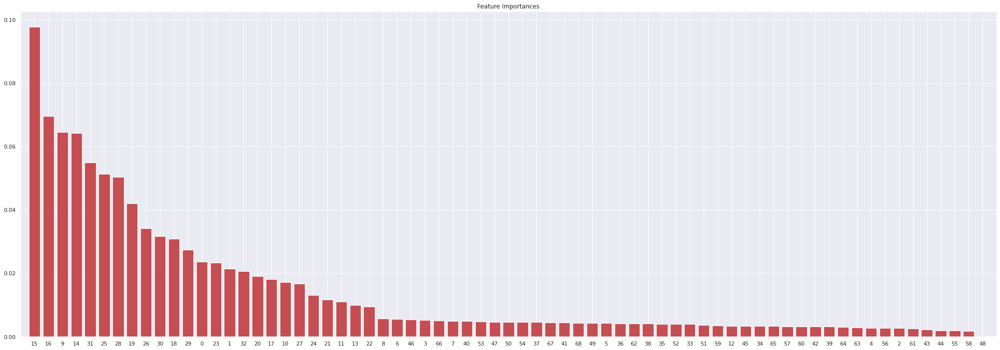

In [248]:
# plot the impurity-base feature importance of the forest
plt.figure()
plt.title('Feature Importances')
plt.bar(range(x_train_n.shape[1]), importances[indices], color='r', align='center')
plt.xticks(range(x_train_n.shape[1]), indices)
plt.xlim([-1, x_train_n.shape[1]])
plt.show()

In [249]:
# results for h1n1
cols_imp = df.sort_values('importance', ascending=False).reset_index().loc[:20,:]['feature'].values
cols_imp

array(['opinion_h1n1_vacc_effective', 'opinion_h1n1_risk',
       'doctor_recc_h1n1', 'health_insurance', 'details_x_opinion',
       'details_general', 'h1n1_x_details', 'opinion_seas_risk',
       'opinion_general', 'details_x_behaviour',
       'opinion_seas_vacc_effective', 'h1n1_x_opinion', 'h1n1_concern',
       'general_h1n1', 'h1n1_knowledge', 'opinion_x_details',
       'opinion_seas_sick_from_vacc', 'opinion_h1n1_sick_from_vacc',
       'doctor_recc_seasonal', 'h1n1_x_behaviour', 'behaviour_general'],
      dtype=object)

In [250]:
# cols_importance = list(set(cols_h1n1) | set(cols_seasonal))
# cols_importance

## Boruta

In [251]:
# define model
et = en.RandomForestClassifier(n_jobs=-1)

# define Boruta
boruta = bt.BorutaPy(et, n_estimators='auto', verbose=2, random_state=42).fit(x_train_n.values, y_train_n)

Iteration: 	1 / 100
Confirmed: 	0
Tentative: 	69
Rejected: 	0
Iteration: 	2 / 100
Confirmed: 	0
Tentative: 	69
Rejected: 	0
Iteration: 	3 / 100
Confirmed: 	0
Tentative: 	69
Rejected: 	0
Iteration: 	4 / 100
Confirmed: 	0
Tentative: 	69
Rejected: 	0
Iteration: 	5 / 100
Confirmed: 	0
Tentative: 	69
Rejected: 	0
Iteration: 	6 / 100
Confirmed: 	0
Tentative: 	69
Rejected: 	0
Iteration: 	7 / 100
Confirmed: 	0
Tentative: 	69
Rejected: 	0
Iteration: 	8 / 100
Confirmed: 	20
Tentative: 	0
Rejected: 	49


BorutaPy finished running.

Iteration: 	9 / 100
Confirmed: 	20
Tentative: 	0
Rejected: 	49


In [252]:
boruta.ranking_

array([ 1,  1, 31,  8, 38, 10,  8, 11,  7,  1,  1,  3, 13,  4,  1,  1,  1,
        1,  1,  1,  1,  5,  6,  1,  2,  1,  1,  1,  1,  1,  1,  1,  1, 27,
       37, 30, 35, 21, 23, 25, 24, 26, 14, 44, 49, 34, 12, 18, 50, 28, 15,
       33, 19, 16, 16, 47, 46, 41, 48, 36, 39, 45, 21, 42, 43, 40, 21, 29,
       32])

In [253]:
cols_bor = boruta.support_.tolist()

In [254]:
cols_boruta = x_train_n.iloc[:, cols_bor].columns
cols_boruta

Index(['h1n1_concern', 'h1n1_knowledge', 'doctor_recc_h1n1',
       'doctor_recc_seasonal', 'health_insurance',
       'opinion_h1n1_vacc_effective', 'opinion_h1n1_risk',
       'opinion_h1n1_sick_from_vacc', 'opinion_seas_vacc_effective',
       'opinion_seas_risk', 'opinion_seas_sick_from_vacc', 'general_h1n1',
       'details_general', 'opinion_general', 'h1n1_x_behaviour',
       'h1n1_x_details', 'h1n1_x_opinion', 'details_x_behaviour',
       'details_x_opinion', 'opinion_x_details'],
      dtype='object')

## Manual Selection

In [255]:
cols_boruta.tolist()

['h1n1_concern',
 'h1n1_knowledge',
 'doctor_recc_h1n1',
 'doctor_recc_seasonal',
 'health_insurance',
 'opinion_h1n1_vacc_effective',
 'opinion_h1n1_risk',
 'opinion_h1n1_sick_from_vacc',
 'opinion_seas_vacc_effective',
 'opinion_seas_risk',
 'opinion_seas_sick_from_vacc',
 'general_h1n1',
 'details_general',
 'opinion_general',
 'h1n1_x_behaviour',
 'h1n1_x_details',
 'h1n1_x_opinion',
 'details_x_behaviour',
 'details_x_opinion',
 'opinion_x_details']

In [256]:
cols_imp.tolist()

['opinion_h1n1_vacc_effective',
 'opinion_h1n1_risk',
 'doctor_recc_h1n1',
 'health_insurance',
 'details_x_opinion',
 'details_general',
 'h1n1_x_details',
 'opinion_seas_risk',
 'opinion_general',
 'details_x_behaviour',
 'opinion_seas_vacc_effective',
 'h1n1_x_opinion',
 'h1n1_concern',
 'general_h1n1',
 'h1n1_knowledge',
 'opinion_x_details',
 'opinion_seas_sick_from_vacc',
 'opinion_h1n1_sick_from_vacc',
 'doctor_recc_seasonal',
 'h1n1_x_behaviour',
 'behaviour_general']

# 7. Modeling

## 7.1. For 'h1n1' Target Variable

### Features selected for df_h1n1 (importance and boruta)

In [257]:
boruta_h1n1 = ['h1n1_concern',
 'h1n1_knowledge',
 'doctor_recc_h1n1',
 'doctor_recc_seasonal',
 'health_insurance',
 'opinion_h1n1_vacc_effective',
 'opinion_h1n1_risk',
 'opinion_h1n1_sick_from_vacc',
 'opinion_seas_vacc_effective',
 'opinion_seas_risk',
 'opinion_seas_sick_from_vacc',
 'general_h1n1',
 'details_general',
 'opinion_general',
 'h1n1_x_behaviour',
 'h1n1_x_details',
 'h1n1_x_opinion',
 'details_x_behaviour',
 'details_x_opinion',
 'opinion_x_details', 'h1n1']

In [258]:
importance_h1n1 = ['opinion_h1n1_vacc_effective',
 'opinion_h1n1_risk',
 'doctor_recc_h1n1',
 'health_insurance',
 'details_x_opinion',
 'details_general',
 'h1n1_x_details',
 'opinion_seas_risk',
 'opinion_general',
 'details_x_behaviour',
 'opinion_seas_vacc_effective',
 'h1n1_x_opinion',
 'h1n1_concern',
 'general_h1n1',
 'h1n1_knowledge',
 'opinion_x_details',
 'opinion_seas_sick_from_vacc',
 'opinion_h1n1_sick_from_vacc',
 'doctor_recc_seasonal',
 'h1n1_x_behaviour',
 'behaviour_general', 'h1n1']

In [261]:
df7_h1n1 = df_h1n1_balanced.copy()

## Random Forest

* With cols_boruta ROC AUC score is 0.9629287470053814

In [923]:
# model
rf = en.RandomForestClassifier(random_state=42, n_jobs=-1)

# train
rf.fit(X_train, y_train)

# predict
y_hat = rf.predict(X_test)

# performance
print(m.confusion_matrix(y_test, y_hat))
print(m.classification_report(y_test, y_hat))
print(m.roc_auc_score(y_test,rf.predict_proba(X_test)[:,1], multi_class='ovr'))

[[4742  559]
 [ 588 4707]]
              precision    recall  f1-score   support

           0       0.89      0.89      0.89      5301
           1       0.89      0.89      0.89      5295

    accuracy                           0.89     10596
   macro avg       0.89      0.89      0.89     10596
weighted avg       0.89      0.89      0.89     10596

0.9585447469333829


In [312]:
df7_h1n1.drop(['h1n1'], axis=1).columns

Index(['h1n1_concern', 'h1n1_knowledge', 'behavioral_antiviral_meds',
       'behavioral_avoidance', 'behavioral_face_mask', 'behavioral_wash_hands',
       'behavioral_large_gatherings', 'behavioral_outside_home',
       'behavioral_touch_face', 'doctor_recc_h1n1', 'doctor_recc_seasonal',
       'chronic_med_condition', 'child_under_6_months', 'health_worker',
       'health_insurance', 'opinion_h1n1_vacc_effective', 'opinion_h1n1_risk',
       'opinion_h1n1_sick_from_vacc', 'opinion_seas_vacc_effective',
       'opinion_seas_risk', 'opinion_seas_sick_from_vacc', 'household_adults',
       'household_children', 'general_h1n1', 'behaviour_general',
       'details_general', 'opinion_general', 'h1n1_x_behaviour',
       'h1n1_x_details', 'h1n1_x_opinion', 'details_x_behaviour',
       'details_x_opinion', 'opinion_x_details', 'age_group_18 - 34 Years',
       'age_group_35 - 44 Years', 'age_group_45 - 54 Years',
       'age_group_55 - 64 Years', 'age_group_65+ Years', 'education_12 Year

In [262]:
cross_validation(df7_h1n1.drop(['h1n1'], axis=1).values, df7_h1n1['h1n1'].values, en.RandomForestClassifier(random_state=42, n_jobs=-1), 'Random Forest Classifier', verbose=True)

KFold Number: 1
KFold Number: 2
KFold Number: 3
KFold Number: 4
KFold Number: 5
KFold Number: 6
KFold Number: 7
KFold Number: 8
KFold Number: 9
KFold Number: 10


,Model Name,ROC AUC Score
0,Random Forest Classifier,0.9661+/-0.0484


In [273]:
cross_validation(df7_h1n1.drop(['h1n1'], axis=1).values, df7_h1n1['h1n1'].values, CatBoostClassifier(), 'CatBoost Classifier', verbose=True)

KFold Number: 1
Learning rate set to 0.046631
0:	learn: 0.6417703	total: 71.5ms	remaining: 1m 11s
1:	learn: 0.5993365	total: 115ms	remaining: 57.5s
2:	learn: 0.5634251	total: 131ms	remaining: 43.5s
3:	learn: 0.5353379	total: 148ms	remaining: 36.8s
4:	learn: 0.5090173	total: 168ms	remaining: 33.4s
5:	learn: 0.4856151	total: 189ms	remaining: 31.3s
6:	learn: 0.4668719	total: 207ms	remaining: 29.3s
7:	learn: 0.4494716	total: 223ms	remaining: 27.6s
8:	learn: 0.4362069	total: 239ms	remaining: 26.3s
9:	learn: 0.4163184	total: 254ms	remaining: 25.2s
10:	learn: 0.4053502	total: 269ms	remaining: 24.2s
11:	learn: 0.3891245	total: 284ms	remaining: 23.4s
12:	learn: 0.3755426	total: 299ms	remaining: 22.7s
13:	learn: 0.3642040	total: 315ms	remaining: 22.2s
14:	learn: 0.3570677	total: 334ms	remaining: 21.9s
15:	learn: 0.3462301	total: 354ms	remaining: 21.8s
16:	learn: 0.3399539	total: 376ms	remaining: 21.7s
17:	learn: 0.3340530	total: 392ms	remaining: 21.4s
18:	learn: 0.3251253	total: 407ms	remaining:

167:	learn: 0.1851278	total: 3.19s	remaining: 15.8s
168:	learn: 0.1850040	total: 3.21s	remaining: 15.8s
169:	learn: 0.1848530	total: 3.23s	remaining: 15.8s
170:	learn: 0.1847326	total: 3.25s	remaining: 15.7s
171:	learn: 0.1846617	total: 3.26s	remaining: 15.7s
172:	learn: 0.1845448	total: 3.27s	remaining: 15.7s
173:	learn: 0.1844093	total: 3.29s	remaining: 15.6s
174:	learn: 0.1842545	total: 3.3s	remaining: 15.6s
175:	learn: 0.1841022	total: 3.32s	remaining: 15.5s
176:	learn: 0.1839917	total: 3.33s	remaining: 15.5s
177:	learn: 0.1838448	total: 3.35s	remaining: 15.5s
178:	learn: 0.1837704	total: 3.36s	remaining: 15.4s
179:	learn: 0.1836287	total: 3.38s	remaining: 15.4s
180:	learn: 0.1835318	total: 3.4s	remaining: 15.4s
181:	learn: 0.1834418	total: 3.42s	remaining: 15.4s
182:	learn: 0.1833265	total: 3.43s	remaining: 15.3s
183:	learn: 0.1830924	total: 3.44s	remaining: 15.3s
184:	learn: 0.1829727	total: 3.46s	remaining: 15.2s
185:	learn: 0.1828401	total: 3.48s	remaining: 15.2s
186:	learn: 0.

332:	learn: 0.1658767	total: 6.49s	remaining: 13s
333:	learn: 0.1657849	total: 6.53s	remaining: 13s
334:	learn: 0.1657185	total: 6.57s	remaining: 13s
335:	learn: 0.1655419	total: 6.6s	remaining: 13s
336:	learn: 0.1654339	total: 6.62s	remaining: 13s
337:	learn: 0.1653319	total: 6.63s	remaining: 13s
338:	learn: 0.1652577	total: 6.65s	remaining: 13s
339:	learn: 0.1651384	total: 6.67s	remaining: 12.9s
340:	learn: 0.1650684	total: 6.68s	remaining: 12.9s
341:	learn: 0.1649994	total: 6.72s	remaining: 12.9s
342:	learn: 0.1649276	total: 6.74s	remaining: 12.9s
343:	learn: 0.1646527	total: 6.75s	remaining: 12.9s
344:	learn: 0.1645499	total: 6.76s	remaining: 12.8s
345:	learn: 0.1644307	total: 6.78s	remaining: 12.8s
346:	learn: 0.1643103	total: 6.79s	remaining: 12.8s
347:	learn: 0.1642257	total: 6.81s	remaining: 12.8s
348:	learn: 0.1641478	total: 6.82s	remaining: 12.7s
349:	learn: 0.1640557	total: 6.84s	remaining: 12.7s
350:	learn: 0.1639644	total: 6.85s	remaining: 12.7s
351:	learn: 0.1638731	total

499:	learn: 0.1512153	total: 9.62s	remaining: 9.62s
500:	learn: 0.1510926	total: 9.64s	remaining: 9.6s
501:	learn: 0.1510261	total: 9.66s	remaining: 9.59s
502:	learn: 0.1509404	total: 9.68s	remaining: 9.56s
503:	learn: 0.1508259	total: 9.69s	remaining: 9.54s
504:	learn: 0.1507338	total: 9.71s	remaining: 9.52s
505:	learn: 0.1506781	total: 9.72s	remaining: 9.49s
506:	learn: 0.1506179	total: 9.74s	remaining: 9.47s
507:	learn: 0.1505129	total: 9.75s	remaining: 9.44s
508:	learn: 0.1504027	total: 9.77s	remaining: 9.42s
509:	learn: 0.1503269	total: 9.78s	remaining: 9.4s
510:	learn: 0.1502694	total: 9.81s	remaining: 9.38s
511:	learn: 0.1501794	total: 9.86s	remaining: 9.39s
512:	learn: 0.1501016	total: 9.88s	remaining: 9.38s
513:	learn: 0.1500354	total: 9.91s	remaining: 9.37s
514:	learn: 0.1499810	total: 9.93s	remaining: 9.35s
515:	learn: 0.1499406	total: 9.95s	remaining: 9.33s
516:	learn: 0.1498659	total: 9.96s	remaining: 9.3s
517:	learn: 0.1497712	total: 9.97s	remaining: 9.28s
518:	learn: 0.1

660:	learn: 0.1396280	total: 12.5s	remaining: 6.39s
661:	learn: 0.1395851	total: 12.5s	remaining: 6.37s
662:	learn: 0.1395321	total: 12.5s	remaining: 6.35s
663:	learn: 0.1394714	total: 12.5s	remaining: 6.33s
664:	learn: 0.1394377	total: 12.5s	remaining: 6.31s
665:	learn: 0.1393814	total: 12.5s	remaining: 6.29s
666:	learn: 0.1393156	total: 12.6s	remaining: 6.27s
667:	learn: 0.1392917	total: 12.6s	remaining: 6.25s
668:	learn: 0.1392303	total: 12.6s	remaining: 6.23s
669:	learn: 0.1391796	total: 12.6s	remaining: 6.21s
670:	learn: 0.1391101	total: 12.6s	remaining: 6.19s
671:	learn: 0.1390465	total: 12.6s	remaining: 6.17s
672:	learn: 0.1389652	total: 12.6s	remaining: 6.15s
673:	learn: 0.1389428	total: 12.7s	remaining: 6.13s
674:	learn: 0.1388436	total: 12.7s	remaining: 6.11s
675:	learn: 0.1387572	total: 12.7s	remaining: 6.09s
676:	learn: 0.1387059	total: 12.7s	remaining: 6.07s
677:	learn: 0.1386342	total: 12.7s	remaining: 6.04s
678:	learn: 0.1385899	total: 12.7s	remaining: 6.02s
679:	learn: 

825:	learn: 0.1295416	total: 15.5s	remaining: 3.27s
826:	learn: 0.1295011	total: 15.6s	remaining: 3.25s
827:	learn: 0.1294328	total: 15.6s	remaining: 3.23s
828:	learn: 0.1293617	total: 15.6s	remaining: 3.22s
829:	learn: 0.1293025	total: 15.6s	remaining: 3.2s
830:	learn: 0.1292356	total: 15.6s	remaining: 3.18s
831:	learn: 0.1292074	total: 15.6s	remaining: 3.16s
832:	learn: 0.1291491	total: 15.7s	remaining: 3.14s
833:	learn: 0.1290847	total: 15.7s	remaining: 3.12s
834:	learn: 0.1290190	total: 15.7s	remaining: 3.1s
835:	learn: 0.1289378	total: 15.7s	remaining: 3.08s
836:	learn: 0.1289066	total: 15.7s	remaining: 3.06s
837:	learn: 0.1288222	total: 15.7s	remaining: 3.04s
838:	learn: 0.1287785	total: 15.8s	remaining: 3.02s
839:	learn: 0.1287029	total: 15.8s	remaining: 3s
840:	learn: 0.1286504	total: 15.8s	remaining: 2.98s
841:	learn: 0.1285834	total: 15.8s	remaining: 2.96s
842:	learn: 0.1285197	total: 15.8s	remaining: 2.95s
843:	learn: 0.1284744	total: 15.9s	remaining: 2.93s
844:	learn: 0.128

984:	learn: 0.1206476	total: 18.9s	remaining: 288ms
985:	learn: 0.1205865	total: 18.9s	remaining: 268ms
986:	learn: 0.1205386	total: 18.9s	remaining: 249ms
987:	learn: 0.1204944	total: 18.9s	remaining: 230ms
988:	learn: 0.1204303	total: 19s	remaining: 211ms
989:	learn: 0.1203712	total: 19s	remaining: 192ms
990:	learn: 0.1203204	total: 19s	remaining: 172ms
991:	learn: 0.1202797	total: 19s	remaining: 153ms
992:	learn: 0.1202379	total: 19s	remaining: 134ms
993:	learn: 0.1201734	total: 19s	remaining: 115ms
994:	learn: 0.1201291	total: 19s	remaining: 95.7ms
995:	learn: 0.1200793	total: 19.1s	remaining: 76.6ms
996:	learn: 0.1200276	total: 19.1s	remaining: 57.5ms
997:	learn: 0.1199477	total: 19.1s	remaining: 38.3ms
998:	learn: 0.1198916	total: 19.1s	remaining: 19.2ms
999:	learn: 0.1198440	total: 19.2s	remaining: 0us
KFold Number: 2
Learning rate set to 0.046631
0:	learn: 0.6415089	total: 24.6ms	remaining: 24.5s
1:	learn: 0.5987772	total: 41.1ms	remaining: 20.5s
2:	learn: 0.5622263	total: 56.7

154:	learn: 0.1855481	total: 2.94s	remaining: 16s
155:	learn: 0.1854295	total: 2.96s	remaining: 16s
156:	learn: 0.1852829	total: 2.98s	remaining: 16s
157:	learn: 0.1851312	total: 3s	remaining: 16s
158:	learn: 0.1850639	total: 3.01s	remaining: 15.9s
159:	learn: 0.1849099	total: 3.03s	remaining: 15.9s
160:	learn: 0.1847955	total: 3.04s	remaining: 15.8s
161:	learn: 0.1845057	total: 3.06s	remaining: 15.8s
162:	learn: 0.1844055	total: 3.07s	remaining: 15.8s
163:	learn: 0.1843293	total: 3.08s	remaining: 15.7s
164:	learn: 0.1842206	total: 3.1s	remaining: 15.7s
165:	learn: 0.1840780	total: 3.11s	remaining: 15.6s
166:	learn: 0.1839541	total: 3.13s	remaining: 15.6s
167:	learn: 0.1838400	total: 3.15s	remaining: 15.6s
168:	learn: 0.1835990	total: 3.17s	remaining: 15.6s
169:	learn: 0.1834466	total: 3.18s	remaining: 15.5s
170:	learn: 0.1832723	total: 3.2s	remaining: 15.5s
171:	learn: 0.1831033	total: 3.21s	remaining: 15.5s
172:	learn: 0.1829544	total: 3.23s	remaining: 15.4s
173:	learn: 0.1828404	tot

320:	learn: 0.1657520	total: 5.8s	remaining: 12.3s
321:	learn: 0.1656367	total: 5.83s	remaining: 12.3s
322:	learn: 0.1655344	total: 5.85s	remaining: 12.3s
323:	learn: 0.1654646	total: 5.86s	remaining: 12.2s
324:	learn: 0.1653810	total: 5.88s	remaining: 12.2s
325:	learn: 0.1651757	total: 5.89s	remaining: 12.2s
326:	learn: 0.1650918	total: 5.91s	remaining: 12.2s
327:	learn: 0.1649914	total: 5.92s	remaining: 12.1s
328:	learn: 0.1649088	total: 5.93s	remaining: 12.1s
329:	learn: 0.1648004	total: 5.95s	remaining: 12.1s
330:	learn: 0.1647214	total: 5.96s	remaining: 12s
331:	learn: 0.1646609	total: 5.97s	remaining: 12s
332:	learn: 0.1644345	total: 5.99s	remaining: 12s
333:	learn: 0.1643507	total: 6.02s	remaining: 12s
334:	learn: 0.1642310	total: 6.03s	remaining: 12s
335:	learn: 0.1641554	total: 6.05s	remaining: 11.9s
336:	learn: 0.1640356	total: 6.06s	remaining: 11.9s
337:	learn: 0.1639574	total: 6.07s	remaining: 11.9s
338:	learn: 0.1638526	total: 6.09s	remaining: 11.9s
339:	learn: 0.1637909	t

479:	learn: 0.1514204	total: 8.44s	remaining: 9.14s
480:	learn: 0.1513410	total: 8.46s	remaining: 9.13s
481:	learn: 0.1512340	total: 8.48s	remaining: 9.12s
482:	learn: 0.1511395	total: 8.5s	remaining: 9.1s
483:	learn: 0.1510382	total: 8.52s	remaining: 9.09s
484:	learn: 0.1509523	total: 8.55s	remaining: 9.07s
485:	learn: 0.1508844	total: 8.57s	remaining: 9.06s
486:	learn: 0.1507755	total: 8.59s	remaining: 9.05s
487:	learn: 0.1506880	total: 8.61s	remaining: 9.04s
488:	learn: 0.1506131	total: 8.64s	remaining: 9.03s
489:	learn: 0.1505792	total: 8.66s	remaining: 9.01s
490:	learn: 0.1505269	total: 8.67s	remaining: 8.99s
491:	learn: 0.1504470	total: 8.69s	remaining: 8.97s
492:	learn: 0.1503493	total: 8.7s	remaining: 8.95s
493:	learn: 0.1502900	total: 8.72s	remaining: 8.93s
494:	learn: 0.1502044	total: 8.73s	remaining: 8.91s
495:	learn: 0.1501470	total: 8.75s	remaining: 8.89s
496:	learn: 0.1500366	total: 8.76s	remaining: 8.87s
497:	learn: 0.1499613	total: 8.78s	remaining: 8.85s
498:	learn: 0.1

645:	learn: 0.1393558	total: 11.3s	remaining: 6.19s
646:	learn: 0.1392840	total: 11.3s	remaining: 6.18s
647:	learn: 0.1392298	total: 11.3s	remaining: 6.16s
648:	learn: 0.1391397	total: 11.4s	remaining: 6.14s
649:	learn: 0.1390588	total: 11.4s	remaining: 6.12s
650:	learn: 0.1389701	total: 11.4s	remaining: 6.1s
651:	learn: 0.1389202	total: 11.4s	remaining: 6.08s
652:	learn: 0.1388500	total: 11.4s	remaining: 6.06s
653:	learn: 0.1387734	total: 11.4s	remaining: 6.04s
654:	learn: 0.1386816	total: 11.4s	remaining: 6.03s
655:	learn: 0.1386349	total: 11.5s	remaining: 6.01s
656:	learn: 0.1385460	total: 11.5s	remaining: 5.99s
657:	learn: 0.1385101	total: 11.5s	remaining: 5.97s
658:	learn: 0.1384274	total: 11.5s	remaining: 5.95s
659:	learn: 0.1383818	total: 11.5s	remaining: 5.93s
660:	learn: 0.1383245	total: 11.5s	remaining: 5.92s
661:	learn: 0.1382572	total: 11.6s	remaining: 5.9s
662:	learn: 0.1381889	total: 11.6s	remaining: 5.88s
663:	learn: 0.1381442	total: 11.6s	remaining: 5.86s
664:	learn: 0.

806:	learn: 0.1290672	total: 14.5s	remaining: 3.46s
807:	learn: 0.1290346	total: 14.5s	remaining: 3.44s
808:	learn: 0.1289675	total: 14.5s	remaining: 3.42s
809:	learn: 0.1288870	total: 14.5s	remaining: 3.4s
810:	learn: 0.1288365	total: 14.5s	remaining: 3.39s
811:	learn: 0.1287718	total: 14.6s	remaining: 3.37s
812:	learn: 0.1287301	total: 14.6s	remaining: 3.35s
813:	learn: 0.1286796	total: 14.6s	remaining: 3.33s
814:	learn: 0.1286217	total: 14.6s	remaining: 3.32s
815:	learn: 0.1285640	total: 14.6s	remaining: 3.3s
816:	learn: 0.1284912	total: 14.7s	remaining: 3.29s
817:	learn: 0.1284271	total: 14.7s	remaining: 3.27s
818:	learn: 0.1283707	total: 14.7s	remaining: 3.26s
819:	learn: 0.1283348	total: 14.8s	remaining: 3.24s
820:	learn: 0.1282703	total: 14.8s	remaining: 3.22s
821:	learn: 0.1282077	total: 14.8s	remaining: 3.2s
822:	learn: 0.1281503	total: 14.8s	remaining: 3.18s
823:	learn: 0.1280653	total: 14.8s	remaining: 3.16s
824:	learn: 0.1279886	total: 14.8s	remaining: 3.15s
825:	learn: 0.1

970:	learn: 0.1198589	total: 17.4s	remaining: 521ms
971:	learn: 0.1197973	total: 17.5s	remaining: 503ms
972:	learn: 0.1197506	total: 17.5s	remaining: 485ms
973:	learn: 0.1196973	total: 17.5s	remaining: 467ms
974:	learn: 0.1196559	total: 17.5s	remaining: 449ms
975:	learn: 0.1196100	total: 17.5s	remaining: 431ms
976:	learn: 0.1195339	total: 17.5s	remaining: 413ms
977:	learn: 0.1194914	total: 17.6s	remaining: 395ms
978:	learn: 0.1194201	total: 17.6s	remaining: 377ms
979:	learn: 0.1193955	total: 17.6s	remaining: 359ms
980:	learn: 0.1193725	total: 17.6s	remaining: 341ms
981:	learn: 0.1193262	total: 17.6s	remaining: 323ms
982:	learn: 0.1192814	total: 17.6s	remaining: 305ms
983:	learn: 0.1192573	total: 17.7s	remaining: 287ms
984:	learn: 0.1191972	total: 17.7s	remaining: 269ms
985:	learn: 0.1191514	total: 17.7s	remaining: 251ms
986:	learn: 0.1191203	total: 17.7s	remaining: 233ms
987:	learn: 0.1190920	total: 17.7s	remaining: 215ms
988:	learn: 0.1190255	total: 17.7s	remaining: 197ms
989:	learn: 

133:	learn: 0.2061540	total: 2.83s	remaining: 18.3s
134:	learn: 0.2060325	total: 2.85s	remaining: 18.3s
135:	learn: 0.2059009	total: 2.87s	remaining: 18.3s
136:	learn: 0.2057694	total: 2.89s	remaining: 18.2s
137:	learn: 0.2056357	total: 2.9s	remaining: 18.1s
138:	learn: 0.2054809	total: 2.92s	remaining: 18.1s
139:	learn: 0.2052179	total: 2.93s	remaining: 18s
140:	learn: 0.2050327	total: 2.95s	remaining: 18s
141:	learn: 0.2049506	total: 2.97s	remaining: 17.9s
142:	learn: 0.2048150	total: 3s	remaining: 18s
143:	learn: 0.2046961	total: 3.04s	remaining: 18.1s
144:	learn: 0.2045006	total: 3.08s	remaining: 18.2s
145:	learn: 0.2043234	total: 3.1s	remaining: 18.1s
146:	learn: 0.2042497	total: 3.11s	remaining: 18.1s
147:	learn: 0.2040599	total: 3.13s	remaining: 18s
148:	learn: 0.2039230	total: 3.14s	remaining: 18s
149:	learn: 0.2038199	total: 3.16s	remaining: 17.9s
150:	learn: 0.2037730	total: 3.17s	remaining: 17.8s
151:	learn: 0.2036472	total: 3.19s	remaining: 17.8s
152:	learn: 0.2034859	total

295:	learn: 0.1840462	total: 5.87s	remaining: 14s
296:	learn: 0.1839672	total: 5.89s	remaining: 13.9s
297:	learn: 0.1838657	total: 5.94s	remaining: 14s
298:	learn: 0.1836126	total: 5.97s	remaining: 14s
299:	learn: 0.1835299	total: 5.99s	remaining: 14s
300:	learn: 0.1834447	total: 6s	remaining: 13.9s
301:	learn: 0.1833513	total: 6.02s	remaining: 13.9s
302:	learn: 0.1832451	total: 6.03s	remaining: 13.9s
303:	learn: 0.1831560	total: 6.05s	remaining: 13.8s
304:	learn: 0.1831117	total: 6.07s	remaining: 13.8s
305:	learn: 0.1830351	total: 6.09s	remaining: 13.8s
306:	learn: 0.1829253	total: 6.1s	remaining: 13.8s
307:	learn: 0.1828446	total: 6.12s	remaining: 13.7s
308:	learn: 0.1827023	total: 6.14s	remaining: 13.7s
309:	learn: 0.1826350	total: 6.16s	remaining: 13.7s
310:	learn: 0.1824795	total: 6.18s	remaining: 13.7s
311:	learn: 0.1823730	total: 6.21s	remaining: 13.7s
312:	learn: 0.1822899	total: 6.23s	remaining: 13.7s
313:	learn: 0.1821490	total: 6.27s	remaining: 13.7s
314:	learn: 0.1820027	to

456:	learn: 0.1689348	total: 9.28s	remaining: 11s
457:	learn: 0.1688787	total: 9.3s	remaining: 11s
458:	learn: 0.1687676	total: 9.33s	remaining: 11s
459:	learn: 0.1687029	total: 9.35s	remaining: 11s
460:	learn: 0.1686445	total: 9.37s	remaining: 11s
461:	learn: 0.1685707	total: 9.38s	remaining: 10.9s
462:	learn: 0.1684600	total: 9.4s	remaining: 10.9s
463:	learn: 0.1683856	total: 9.42s	remaining: 10.9s
464:	learn: 0.1683224	total: 9.44s	remaining: 10.9s
465:	learn: 0.1682687	total: 9.5s	remaining: 10.9s
466:	learn: 0.1682003	total: 9.53s	remaining: 10.9s
467:	learn: 0.1681364	total: 9.55s	remaining: 10.9s
468:	learn: 0.1680919	total: 9.58s	remaining: 10.8s
469:	learn: 0.1680442	total: 9.6s	remaining: 10.8s
470:	learn: 0.1679840	total: 9.62s	remaining: 10.8s
471:	learn: 0.1678930	total: 9.64s	remaining: 10.8s
472:	learn: 0.1677344	total: 9.65s	remaining: 10.8s
473:	learn: 0.1676405	total: 9.67s	remaining: 10.7s
474:	learn: 0.1675573	total: 9.69s	remaining: 10.7s
475:	learn: 0.1674595	tota

620:	learn: 0.1561746	total: 12.6s	remaining: 7.69s
621:	learn: 0.1561148	total: 12.6s	remaining: 7.67s
622:	learn: 0.1560298	total: 12.6s	remaining: 7.65s
623:	learn: 0.1559507	total: 12.7s	remaining: 7.63s
624:	learn: 0.1558918	total: 12.7s	remaining: 7.6s
625:	learn: 0.1557960	total: 12.7s	remaining: 7.58s
626:	learn: 0.1557027	total: 12.7s	remaining: 7.56s
627:	learn: 0.1556460	total: 12.7s	remaining: 7.54s
628:	learn: 0.1555744	total: 12.7s	remaining: 7.51s
629:	learn: 0.1555397	total: 12.8s	remaining: 7.49s
630:	learn: 0.1554837	total: 12.8s	remaining: 7.47s
631:	learn: 0.1554131	total: 12.8s	remaining: 7.45s
632:	learn: 0.1553407	total: 12.8s	remaining: 7.43s
633:	learn: 0.1552868	total: 12.8s	remaining: 7.41s
634:	learn: 0.1552357	total: 12.8s	remaining: 7.38s
635:	learn: 0.1551555	total: 12.9s	remaining: 7.36s
636:	learn: 0.1550648	total: 12.9s	remaining: 7.34s
637:	learn: 0.1550195	total: 12.9s	remaining: 7.33s
638:	learn: 0.1549691	total: 12.9s	remaining: 7.31s
639:	learn: 0

783:	learn: 0.1453140	total: 15.9s	remaining: 4.38s
784:	learn: 0.1452244	total: 15.9s	remaining: 4.36s
785:	learn: 0.1451401	total: 15.9s	remaining: 4.34s
786:	learn: 0.1450507	total: 16s	remaining: 4.32s
787:	learn: 0.1450132	total: 16s	remaining: 4.3s
788:	learn: 0.1449615	total: 16s	remaining: 4.28s
789:	learn: 0.1449040	total: 16s	remaining: 4.25s
790:	learn: 0.1448694	total: 16s	remaining: 4.23s
791:	learn: 0.1448322	total: 16s	remaining: 4.21s
792:	learn: 0.1447585	total: 16.1s	remaining: 4.19s
793:	learn: 0.1446960	total: 16.1s	remaining: 4.17s
794:	learn: 0.1446246	total: 16.1s	remaining: 4.15s
795:	learn: 0.1445831	total: 16.1s	remaining: 4.13s
796:	learn: 0.1445449	total: 16.1s	remaining: 4.11s
797:	learn: 0.1444687	total: 16.2s	remaining: 4.09s
798:	learn: 0.1444203	total: 16.2s	remaining: 4.07s
799:	learn: 0.1443814	total: 16.2s	remaining: 4.05s
800:	learn: 0.1442959	total: 16.2s	remaining: 4.03s
801:	learn: 0.1442634	total: 16.2s	remaining: 4s
802:	learn: 0.1441901	total:

946:	learn: 0.1363131	total: 19.6s	remaining: 1.09s
947:	learn: 0.1362467	total: 19.6s	remaining: 1.08s
948:	learn: 0.1362086	total: 19.7s	remaining: 1.06s
949:	learn: 0.1361558	total: 19.7s	remaining: 1.03s
950:	learn: 0.1360982	total: 19.7s	remaining: 1.01s
951:	learn: 0.1360462	total: 19.7s	remaining: 994ms
952:	learn: 0.1359690	total: 19.7s	remaining: 973ms
953:	learn: 0.1359019	total: 19.8s	remaining: 952ms
954:	learn: 0.1358706	total: 19.8s	remaining: 932ms
955:	learn: 0.1358301	total: 19.8s	remaining: 911ms
956:	learn: 0.1358033	total: 19.8s	remaining: 890ms
957:	learn: 0.1357347	total: 19.8s	remaining: 869ms
958:	learn: 0.1356793	total: 19.8s	remaining: 848ms
959:	learn: 0.1356456	total: 19.9s	remaining: 828ms
960:	learn: 0.1355832	total: 19.9s	remaining: 807ms
961:	learn: 0.1355200	total: 19.9s	remaining: 787ms
962:	learn: 0.1354344	total: 19.9s	remaining: 766ms
963:	learn: 0.1353928	total: 20s	remaining: 746ms
964:	learn: 0.1353141	total: 20s	remaining: 726ms
965:	learn: 0.13

112:	learn: 0.2492431	total: 2.39s	remaining: 18.8s
113:	learn: 0.2487723	total: 2.42s	remaining: 18.8s
114:	learn: 0.2484514	total: 2.44s	remaining: 18.8s
115:	learn: 0.2480273	total: 2.46s	remaining: 18.7s
116:	learn: 0.2478558	total: 2.48s	remaining: 18.7s
117:	learn: 0.2477310	total: 2.49s	remaining: 18.6s
118:	learn: 0.2475407	total: 2.51s	remaining: 18.6s
119:	learn: 0.2473484	total: 2.52s	remaining: 18.5s
120:	learn: 0.2472268	total: 2.54s	remaining: 18.5s
121:	learn: 0.2470332	total: 2.56s	remaining: 18.4s
122:	learn: 0.2468807	total: 2.58s	remaining: 18.4s
123:	learn: 0.2467063	total: 2.61s	remaining: 18.5s
124:	learn: 0.2465658	total: 2.63s	remaining: 18.4s
125:	learn: 0.2464342	total: 2.65s	remaining: 18.4s
126:	learn: 0.2462231	total: 2.66s	remaining: 18.3s
127:	learn: 0.2461433	total: 2.68s	remaining: 18.3s
128:	learn: 0.2459940	total: 2.7s	remaining: 18.2s
129:	learn: 0.2458981	total: 2.71s	remaining: 18.2s
130:	learn: 0.2457383	total: 2.73s	remaining: 18.1s
131:	learn: 0

273:	learn: 0.2251809	total: 5.89s	remaining: 15.6s
274:	learn: 0.2250884	total: 5.92s	remaining: 15.6s
275:	learn: 0.2250056	total: 5.94s	remaining: 15.6s
276:	learn: 0.2248794	total: 5.95s	remaining: 15.5s
277:	learn: 0.2247028	total: 5.97s	remaining: 15.5s
278:	learn: 0.2246288	total: 5.99s	remaining: 15.5s
279:	learn: 0.2243196	total: 6s	remaining: 15.4s
280:	learn: 0.2241789	total: 6.02s	remaining: 15.4s
281:	learn: 0.2240568	total: 6.04s	remaining: 15.4s
282:	learn: 0.2239538	total: 6.05s	remaining: 15.3s
283:	learn: 0.2238641	total: 6.08s	remaining: 15.3s
284:	learn: 0.2236834	total: 6.12s	remaining: 15.4s
285:	learn: 0.2235346	total: 6.15s	remaining: 15.3s
286:	learn: 0.2232927	total: 6.17s	remaining: 15.3s
287:	learn: 0.2231588	total: 6.2s	remaining: 15.3s
288:	learn: 0.2230852	total: 6.22s	remaining: 15.3s
289:	learn: 0.2229692	total: 6.24s	remaining: 15.3s
290:	learn: 0.2228545	total: 6.25s	remaining: 15.2s
291:	learn: 0.2227437	total: 6.27s	remaining: 15.2s
292:	learn: 0.22

439:	learn: 0.2070829	total: 9.47s	remaining: 12.1s
440:	learn: 0.2069640	total: 9.5s	remaining: 12s
441:	learn: 0.2068858	total: 9.52s	remaining: 12s
442:	learn: 0.2068005	total: 9.53s	remaining: 12s
443:	learn: 0.2067519	total: 9.55s	remaining: 12s
444:	learn: 0.2066488	total: 9.56s	remaining: 11.9s
445:	learn: 0.2065655	total: 9.58s	remaining: 11.9s
446:	learn: 0.2064607	total: 9.6s	remaining: 11.9s
447:	learn: 0.2063520	total: 9.62s	remaining: 11.8s
448:	learn: 0.2063080	total: 9.63s	remaining: 11.8s
449:	learn: 0.2062454	total: 9.65s	remaining: 11.8s
450:	learn: 0.2061479	total: 9.67s	remaining: 11.8s
451:	learn: 0.2060559	total: 9.7s	remaining: 11.8s
452:	learn: 0.2060031	total: 9.71s	remaining: 11.7s
453:	learn: 0.2059071	total: 9.73s	remaining: 11.7s
454:	learn: 0.2057882	total: 9.74s	remaining: 11.7s
455:	learn: 0.2057216	total: 9.76s	remaining: 11.6s
456:	learn: 0.2056177	total: 9.78s	remaining: 11.6s
457:	learn: 0.2055347	total: 9.8s	remaining: 11.6s
458:	learn: 0.2054927	to

600:	learn: 0.1934887	total: 13.2s	remaining: 8.77s
601:	learn: 0.1934421	total: 13.2s	remaining: 8.75s
602:	learn: 0.1933963	total: 13.3s	remaining: 8.73s
603:	learn: 0.1932994	total: 13.3s	remaining: 8.7s
604:	learn: 0.1932284	total: 13.3s	remaining: 8.68s
605:	learn: 0.1931547	total: 13.3s	remaining: 8.65s
606:	learn: 0.1930598	total: 13.3s	remaining: 8.63s
607:	learn: 0.1930106	total: 13.3s	remaining: 8.6s
608:	learn: 0.1929093	total: 13.4s	remaining: 8.57s
609:	learn: 0.1928330	total: 13.4s	remaining: 8.55s
610:	learn: 0.1927480	total: 13.4s	remaining: 8.53s
611:	learn: 0.1926684	total: 13.4s	remaining: 8.5s
612:	learn: 0.1925841	total: 13.4s	remaining: 8.48s
613:	learn: 0.1924785	total: 13.5s	remaining: 8.46s
614:	learn: 0.1924301	total: 13.5s	remaining: 8.43s
615:	learn: 0.1923510	total: 13.5s	remaining: 8.41s
616:	learn: 0.1922618	total: 13.5s	remaining: 8.38s
617:	learn: 0.1921558	total: 13.5s	remaining: 8.36s
618:	learn: 0.1920838	total: 13.5s	remaining: 8.33s
619:	learn: 0.1

762:	learn: 0.1815339	total: 16.5s	remaining: 5.13s
763:	learn: 0.1814564	total: 16.5s	remaining: 5.11s
764:	learn: 0.1813821	total: 16.6s	remaining: 5.09s
765:	learn: 0.1813227	total: 16.6s	remaining: 5.07s
766:	learn: 0.1812413	total: 16.6s	remaining: 5.04s
767:	learn: 0.1811717	total: 16.6s	remaining: 5.02s
768:	learn: 0.1811213	total: 16.6s	remaining: 5s
769:	learn: 0.1810367	total: 16.7s	remaining: 4.97s
770:	learn: 0.1810063	total: 16.7s	remaining: 4.95s
771:	learn: 0.1809107	total: 16.7s	remaining: 4.93s
772:	learn: 0.1808348	total: 16.7s	remaining: 4.91s
773:	learn: 0.1807889	total: 16.7s	remaining: 4.89s
774:	learn: 0.1807024	total: 16.8s	remaining: 4.86s
775:	learn: 0.1806203	total: 16.8s	remaining: 4.84s
776:	learn: 0.1805775	total: 16.8s	remaining: 4.82s
777:	learn: 0.1804914	total: 16.8s	remaining: 4.79s
778:	learn: 0.1804578	total: 16.8s	remaining: 4.77s
779:	learn: 0.1804125	total: 16.8s	remaining: 4.75s
780:	learn: 0.1803674	total: 16.9s	remaining: 4.73s
781:	learn: 0.1

925:	learn: 0.1710924	total: 19.9s	remaining: 1.59s
926:	learn: 0.1710315	total: 19.9s	remaining: 1.57s
927:	learn: 0.1709427	total: 20s	remaining: 1.55s
928:	learn: 0.1708849	total: 20s	remaining: 1.53s
929:	learn: 0.1708362	total: 20s	remaining: 1.5s
930:	learn: 0.1707754	total: 20s	remaining: 1.48s
931:	learn: 0.1706983	total: 20s	remaining: 1.46s
932:	learn: 0.1706342	total: 20s	remaining: 1.44s
933:	learn: 0.1705933	total: 20s	remaining: 1.42s
934:	learn: 0.1705230	total: 20.1s	remaining: 1.4s
935:	learn: 0.1704636	total: 20.1s	remaining: 1.37s
936:	learn: 0.1703757	total: 20.1s	remaining: 1.35s
937:	learn: 0.1703217	total: 20.1s	remaining: 1.33s
938:	learn: 0.1702935	total: 20.1s	remaining: 1.31s
939:	learn: 0.1702323	total: 20.2s	remaining: 1.29s
940:	learn: 0.1701664	total: 20.2s	remaining: 1.26s
941:	learn: 0.1701070	total: 20.2s	remaining: 1.24s
942:	learn: 0.1700337	total: 20.2s	remaining: 1.22s
943:	learn: 0.1699845	total: 20.2s	remaining: 1.2s
944:	learn: 0.1699603	total: 

89:	learn: 0.2566224	total: 2.2s	remaining: 22.3s
90:	learn: 0.2563890	total: 2.25s	remaining: 22.5s
91:	learn: 0.2560066	total: 2.28s	remaining: 22.5s
92:	learn: 0.2554582	total: 2.32s	remaining: 22.6s
93:	learn: 0.2552258	total: 2.35s	remaining: 22.6s
94:	learn: 0.2549576	total: 2.38s	remaining: 22.6s
95:	learn: 0.2547469	total: 2.39s	remaining: 22.5s
96:	learn: 0.2545792	total: 2.42s	remaining: 22.5s
97:	learn: 0.2543376	total: 2.44s	remaining: 22.4s
98:	learn: 0.2540116	total: 2.45s	remaining: 22.3s
99:	learn: 0.2536259	total: 2.47s	remaining: 22.2s
100:	learn: 0.2534231	total: 2.49s	remaining: 22.1s
101:	learn: 0.2529013	total: 2.5s	remaining: 22s
102:	learn: 0.2527017	total: 2.52s	remaining: 21.9s
103:	learn: 0.2520534	total: 2.54s	remaining: 21.9s
104:	learn: 0.2518874	total: 2.55s	remaining: 21.8s
105:	learn: 0.2516823	total: 2.57s	remaining: 21.7s
106:	learn: 0.2513616	total: 2.59s	remaining: 21.6s
107:	learn: 0.2508675	total: 2.62s	remaining: 21.6s
108:	learn: 0.2506747	total

250:	learn: 0.2280995	total: 5.73s	remaining: 17.1s
251:	learn: 0.2279924	total: 5.75s	remaining: 17.1s
252:	learn: 0.2278770	total: 5.77s	remaining: 17.1s
253:	learn: 0.2277865	total: 5.79s	remaining: 17s
254:	learn: 0.2277089	total: 5.81s	remaining: 17s
255:	learn: 0.2275945	total: 5.83s	remaining: 16.9s
256:	learn: 0.2274474	total: 5.84s	remaining: 16.9s
257:	learn: 0.2272673	total: 5.86s	remaining: 16.8s
258:	learn: 0.2271730	total: 5.87s	remaining: 16.8s
259:	learn: 0.2270442	total: 5.89s	remaining: 16.8s
260:	learn: 0.2269766	total: 5.91s	remaining: 16.7s
261:	learn: 0.2268680	total: 5.93s	remaining: 16.7s
262:	learn: 0.2267144	total: 5.95s	remaining: 16.7s
263:	learn: 0.2266161	total: 5.97s	remaining: 16.6s
264:	learn: 0.2264671	total: 5.98s	remaining: 16.6s
265:	learn: 0.2263374	total: 6s	remaining: 16.6s
266:	learn: 0.2262558	total: 6.02s	remaining: 16.5s
267:	learn: 0.2260074	total: 6.03s	remaining: 16.5s
268:	learn: 0.2259106	total: 6.05s	remaining: 16.4s
269:	learn: 0.22581

415:	learn: 0.2097570	total: 9.07s	remaining: 12.7s
416:	learn: 0.2096620	total: 9.12s	remaining: 12.8s
417:	learn: 0.2095623	total: 9.14s	remaining: 12.7s
418:	learn: 0.2095021	total: 9.16s	remaining: 12.7s
419:	learn: 0.2094001	total: 9.19s	remaining: 12.7s
420:	learn: 0.2091885	total: 9.21s	remaining: 12.7s
421:	learn: 0.2090806	total: 9.23s	remaining: 12.6s
422:	learn: 0.2089967	total: 9.27s	remaining: 12.6s
423:	learn: 0.2088984	total: 9.31s	remaining: 12.6s
424:	learn: 0.2087596	total: 9.33s	remaining: 12.6s
425:	learn: 0.2086344	total: 9.35s	remaining: 12.6s
426:	learn: 0.2085402	total: 9.36s	remaining: 12.6s
427:	learn: 0.2084671	total: 9.38s	remaining: 12.5s
428:	learn: 0.2083751	total: 9.41s	remaining: 12.5s
429:	learn: 0.2082651	total: 9.44s	remaining: 12.5s
430:	learn: 0.2081637	total: 9.46s	remaining: 12.5s
431:	learn: 0.2080981	total: 9.52s	remaining: 12.5s
432:	learn: 0.2080203	total: 9.54s	remaining: 12.5s
433:	learn: 0.2079678	total: 9.55s	remaining: 12.5s
434:	learn: 

577:	learn: 0.1957831	total: 12.8s	remaining: 9.31s
578:	learn: 0.1957338	total: 12.8s	remaining: 9.29s
579:	learn: 0.1956879	total: 12.8s	remaining: 9.27s
580:	learn: 0.1956195	total: 12.8s	remaining: 9.24s
581:	learn: 0.1955248	total: 12.8s	remaining: 9.22s
582:	learn: 0.1954605	total: 12.8s	remaining: 9.19s
583:	learn: 0.1953877	total: 12.9s	remaining: 9.16s
584:	learn: 0.1952950	total: 12.9s	remaining: 9.14s
585:	learn: 0.1952325	total: 12.9s	remaining: 9.11s
586:	learn: 0.1951500	total: 12.9s	remaining: 9.09s
587:	learn: 0.1950667	total: 12.9s	remaining: 9.06s
588:	learn: 0.1949908	total: 13s	remaining: 9.04s
589:	learn: 0.1948982	total: 13s	remaining: 9.02s
590:	learn: 0.1948211	total: 13s	remaining: 8.99s
591:	learn: 0.1947579	total: 13s	remaining: 8.97s
592:	learn: 0.1946567	total: 13s	remaining: 8.94s
593:	learn: 0.1945975	total: 13s	remaining: 8.92s
594:	learn: 0.1945050	total: 13.1s	remaining: 8.89s
595:	learn: 0.1944549	total: 13.1s	remaining: 8.88s
596:	learn: 0.1943868	to

743:	learn: 0.1837344	total: 16.4s	remaining: 5.64s
744:	learn: 0.1836819	total: 16.5s	remaining: 5.63s
745:	learn: 0.1836028	total: 16.5s	remaining: 5.61s
746:	learn: 0.1834982	total: 16.5s	remaining: 5.59s
747:	learn: 0.1834620	total: 16.5s	remaining: 5.57s
748:	learn: 0.1833741	total: 16.6s	remaining: 5.55s
749:	learn: 0.1832983	total: 16.6s	remaining: 5.53s
750:	learn: 0.1832150	total: 16.6s	remaining: 5.5s
751:	learn: 0.1831486	total: 16.6s	remaining: 5.48s
752:	learn: 0.1831056	total: 16.6s	remaining: 5.46s
753:	learn: 0.1830790	total: 16.7s	remaining: 5.43s
754:	learn: 0.1830068	total: 16.7s	remaining: 5.41s
755:	learn: 0.1829327	total: 16.7s	remaining: 5.39s
756:	learn: 0.1828917	total: 16.7s	remaining: 5.36s
757:	learn: 0.1828058	total: 16.7s	remaining: 5.34s
758:	learn: 0.1827669	total: 16.7s	remaining: 5.32s
759:	learn: 0.1826723	total: 16.8s	remaining: 5.29s
760:	learn: 0.1825729	total: 16.8s	remaining: 5.27s
761:	learn: 0.1825178	total: 16.8s	remaining: 5.25s
762:	learn: 0

903:	learn: 0.1732589	total: 19.8s	remaining: 2.1s
904:	learn: 0.1731721	total: 19.8s	remaining: 2.08s
905:	learn: 0.1731214	total: 19.8s	remaining: 2.06s
906:	learn: 0.1730664	total: 19.8s	remaining: 2.03s
907:	learn: 0.1730306	total: 19.8s	remaining: 2.01s
908:	learn: 0.1730016	total: 19.9s	remaining: 1.99s
909:	learn: 0.1729462	total: 19.9s	remaining: 1.97s
910:	learn: 0.1729110	total: 19.9s	remaining: 1.94s
911:	learn: 0.1728359	total: 19.9s	remaining: 1.92s
912:	learn: 0.1727553	total: 19.9s	remaining: 1.9s
913:	learn: 0.1726720	total: 19.9s	remaining: 1.88s
914:	learn: 0.1726197	total: 20s	remaining: 1.85s
915:	learn: 0.1725633	total: 20s	remaining: 1.83s
916:	learn: 0.1724987	total: 20s	remaining: 1.81s
917:	learn: 0.1724577	total: 20s	remaining: 1.79s
918:	learn: 0.1723890	total: 20.1s	remaining: 1.77s
919:	learn: 0.1723085	total: 20.1s	remaining: 1.75s
920:	learn: 0.1722287	total: 20.1s	remaining: 1.73s
921:	learn: 0.1721482	total: 20.2s	remaining: 1.7s
922:	learn: 0.1720736	t

64:	learn: 0.2668984	total: 1.36s	remaining: 19.6s
65:	learn: 0.2661394	total: 1.39s	remaining: 19.6s
66:	learn: 0.2653101	total: 1.41s	remaining: 19.7s
67:	learn: 0.2645086	total: 1.43s	remaining: 19.6s
68:	learn: 0.2634325	total: 1.45s	remaining: 19.5s
69:	learn: 0.2632161	total: 1.46s	remaining: 19.4s
70:	learn: 0.2629089	total: 1.48s	remaining: 19.4s
71:	learn: 0.2625753	total: 1.5s	remaining: 19.3s
72:	learn: 0.2623448	total: 1.51s	remaining: 19.2s
73:	learn: 0.2620188	total: 1.53s	remaining: 19.2s
74:	learn: 0.2617167	total: 1.55s	remaining: 19.1s
75:	learn: 0.2615049	total: 1.57s	remaining: 19.1s
76:	learn: 0.2612564	total: 1.59s	remaining: 19.1s
77:	learn: 0.2610642	total: 1.61s	remaining: 19.1s
78:	learn: 0.2607544	total: 1.63s	remaining: 19s
79:	learn: 0.2605428	total: 1.65s	remaining: 19s
80:	learn: 0.2600717	total: 1.67s	remaining: 18.9s
81:	learn: 0.2597257	total: 1.7s	remaining: 19s
82:	learn: 0.2593378	total: 1.73s	remaining: 19.1s
83:	learn: 0.2590702	total: 1.78s	remai

225:	learn: 0.2309387	total: 5.29s	remaining: 18.1s
226:	learn: 0.2308357	total: 5.34s	remaining: 18.2s
227:	learn: 0.2306499	total: 5.37s	remaining: 18.2s
228:	learn: 0.2305591	total: 5.39s	remaining: 18.1s
229:	learn: 0.2302972	total: 5.4s	remaining: 18.1s
230:	learn: 0.2302037	total: 5.42s	remaining: 18s
231:	learn: 0.2301143	total: 5.44s	remaining: 18s
232:	learn: 0.2298983	total: 5.45s	remaining: 18s
233:	learn: 0.2297664	total: 5.47s	remaining: 17.9s
234:	learn: 0.2296621	total: 5.49s	remaining: 17.9s
235:	learn: 0.2295442	total: 5.52s	remaining: 17.9s
236:	learn: 0.2294763	total: 5.54s	remaining: 17.8s
237:	learn: 0.2293933	total: 5.56s	remaining: 17.8s
238:	learn: 0.2292916	total: 5.58s	remaining: 17.8s
239:	learn: 0.2291873	total: 5.61s	remaining: 17.8s
240:	learn: 0.2291203	total: 5.63s	remaining: 17.7s
241:	learn: 0.2289659	total: 5.66s	remaining: 17.7s
242:	learn: 0.2287733	total: 5.69s	remaining: 17.7s
243:	learn: 0.2286272	total: 5.73s	remaining: 17.7s
244:	learn: 0.22855

385:	learn: 0.2123127	total: 8.64s	remaining: 13.8s
386:	learn: 0.2122177	total: 8.67s	remaining: 13.7s
387:	learn: 0.2121291	total: 8.69s	remaining: 13.7s
388:	learn: 0.2120586	total: 8.71s	remaining: 13.7s
389:	learn: 0.2119556	total: 8.74s	remaining: 13.7s
390:	learn: 0.2118760	total: 8.77s	remaining: 13.7s
391:	learn: 0.2117673	total: 8.79s	remaining: 13.6s
392:	learn: 0.2116697	total: 8.83s	remaining: 13.6s
393:	learn: 0.2115970	total: 8.87s	remaining: 13.6s
394:	learn: 0.2114538	total: 8.89s	remaining: 13.6s
395:	learn: 0.2113537	total: 8.9s	remaining: 13.6s
396:	learn: 0.2112815	total: 8.92s	remaining: 13.6s
397:	learn: 0.2111635	total: 8.94s	remaining: 13.5s
398:	learn: 0.2111127	total: 8.95s	remaining: 13.5s
399:	learn: 0.2110046	total: 8.97s	remaining: 13.5s
400:	learn: 0.2109128	total: 8.99s	remaining: 13.4s
401:	learn: 0.2108499	total: 9s	remaining: 13.4s
402:	learn: 0.2107500	total: 9.02s	remaining: 13.4s
403:	learn: 0.2106719	total: 9.04s	remaining: 13.3s
404:	learn: 0.21

549:	learn: 0.1982939	total: 12s	remaining: 9.78s
550:	learn: 0.1981803	total: 12s	remaining: 9.78s
551:	learn: 0.1981300	total: 12s	remaining: 9.76s
552:	learn: 0.1980668	total: 12s	remaining: 9.73s
553:	learn: 0.1979808	total: 12.1s	remaining: 9.71s
554:	learn: 0.1978598	total: 12.1s	remaining: 9.68s
555:	learn: 0.1977532	total: 12.1s	remaining: 9.65s
556:	learn: 0.1976823	total: 12.1s	remaining: 9.63s
557:	learn: 0.1975904	total: 12.1s	remaining: 9.6s
558:	learn: 0.1975099	total: 12.1s	remaining: 9.58s
559:	learn: 0.1974333	total: 12.2s	remaining: 9.55s
560:	learn: 0.1973533	total: 12.2s	remaining: 9.53s
561:	learn: 0.1972898	total: 12.2s	remaining: 9.51s
562:	learn: 0.1972036	total: 12.2s	remaining: 9.48s
563:	learn: 0.1971427	total: 12.2s	remaining: 9.46s
564:	learn: 0.1970389	total: 12.3s	remaining: 9.43s
565:	learn: 0.1969842	total: 12.3s	remaining: 9.4s
566:	learn: 0.1969433	total: 12.3s	remaining: 9.38s
567:	learn: 0.1968673	total: 12.3s	remaining: 9.35s
568:	learn: 0.1968037	

711:	learn: 0.1857974	total: 15.5s	remaining: 6.27s
712:	learn: 0.1857041	total: 15.5s	remaining: 6.25s
713:	learn: 0.1856298	total: 15.6s	remaining: 6.23s
714:	learn: 0.1855749	total: 15.6s	remaining: 6.21s
715:	learn: 0.1855040	total: 15.6s	remaining: 6.18s
716:	learn: 0.1854038	total: 15.6s	remaining: 6.16s
717:	learn: 0.1853191	total: 15.6s	remaining: 6.14s
718:	learn: 0.1852628	total: 15.6s	remaining: 6.11s
719:	learn: 0.1851914	total: 15.7s	remaining: 6.09s
720:	learn: 0.1851043	total: 15.7s	remaining: 6.06s
721:	learn: 0.1850539	total: 15.7s	remaining: 6.04s
722:	learn: 0.1849812	total: 15.7s	remaining: 6.03s
723:	learn: 0.1849177	total: 15.8s	remaining: 6.01s
724:	learn: 0.1848833	total: 15.8s	remaining: 5.99s
725:	learn: 0.1847810	total: 15.8s	remaining: 5.97s
726:	learn: 0.1847586	total: 15.8s	remaining: 5.95s
727:	learn: 0.1847054	total: 15.9s	remaining: 5.92s
728:	learn: 0.1845800	total: 15.9s	remaining: 5.9s
729:	learn: 0.1845191	total: 15.9s	remaining: 5.88s
730:	learn: 0

873:	learn: 0.1746206	total: 19.1s	remaining: 2.75s
874:	learn: 0.1745431	total: 19.1s	remaining: 2.73s
875:	learn: 0.1744752	total: 19.1s	remaining: 2.71s
876:	learn: 0.1743914	total: 19.2s	remaining: 2.69s
877:	learn: 0.1743266	total: 19.2s	remaining: 2.67s
878:	learn: 0.1742604	total: 19.3s	remaining: 2.65s
879:	learn: 0.1741999	total: 19.3s	remaining: 2.63s
880:	learn: 0.1741328	total: 19.3s	remaining: 2.61s
881:	learn: 0.1740762	total: 19.3s	remaining: 2.59s
882:	learn: 0.1740421	total: 19.4s	remaining: 2.56s
883:	learn: 0.1739862	total: 19.4s	remaining: 2.54s
884:	learn: 0.1739096	total: 19.4s	remaining: 2.52s
885:	learn: 0.1738645	total: 19.4s	remaining: 2.5s
886:	learn: 0.1738217	total: 19.4s	remaining: 2.47s
887:	learn: 0.1737473	total: 19.4s	remaining: 2.45s
888:	learn: 0.1736471	total: 19.5s	remaining: 2.43s
889:	learn: 0.1735832	total: 19.5s	remaining: 2.41s
890:	learn: 0.1735382	total: 19.5s	remaining: 2.38s
891:	learn: 0.1734690	total: 19.5s	remaining: 2.36s
892:	learn: 0

35:	learn: 0.3053361	total: 744ms	remaining: 19.9s
36:	learn: 0.3042011	total: 766ms	remaining: 19.9s
37:	learn: 0.3025283	total: 790ms	remaining: 20s
38:	learn: 0.3004036	total: 807ms	remaining: 19.9s
39:	learn: 0.2981255	total: 825ms	remaining: 19.8s
40:	learn: 0.2953979	total: 843ms	remaining: 19.7s
41:	learn: 0.2941731	total: 863ms	remaining: 19.7s
42:	learn: 0.2929443	total: 883ms	remaining: 19.6s
43:	learn: 0.2909856	total: 914ms	remaining: 19.9s
44:	learn: 0.2887395	total: 952ms	remaining: 20.2s
45:	learn: 0.2871919	total: 995ms	remaining: 20.6s
46:	learn: 0.2855909	total: 1.02s	remaining: 20.8s
47:	learn: 0.2842364	total: 1.04s	remaining: 20.7s
48:	learn: 0.2820968	total: 1.06s	remaining: 20.6s
49:	learn: 0.2805418	total: 1.08s	remaining: 20.5s
50:	learn: 0.2787515	total: 1.09s	remaining: 20.4s
51:	learn: 0.2779573	total: 1.11s	remaining: 20.2s
52:	learn: 0.2773775	total: 1.13s	remaining: 20.1s
53:	learn: 0.2769110	total: 1.15s	remaining: 20.2s
54:	learn: 0.2757936	total: 1.18s

197:	learn: 0.2351835	total: 4.32s	remaining: 17.5s
198:	learn: 0.2350766	total: 4.34s	remaining: 17.5s
199:	learn: 0.2349417	total: 4.37s	remaining: 17.5s
200:	learn: 0.2348590	total: 4.41s	remaining: 17.5s
201:	learn: 0.2347590	total: 4.45s	remaining: 17.6s
202:	learn: 0.2346062	total: 4.5s	remaining: 17.7s
203:	learn: 0.2344667	total: 4.53s	remaining: 17.7s
204:	learn: 0.2343667	total: 4.55s	remaining: 17.6s
205:	learn: 0.2342087	total: 4.57s	remaining: 17.6s
206:	learn: 0.2341035	total: 4.58s	remaining: 17.6s
207:	learn: 0.2339823	total: 4.6s	remaining: 17.5s
208:	learn: 0.2337175	total: 4.62s	remaining: 17.5s
209:	learn: 0.2335816	total: 4.63s	remaining: 17.4s
210:	learn: 0.2334118	total: 4.65s	remaining: 17.4s
211:	learn: 0.2331478	total: 4.67s	remaining: 17.4s
212:	learn: 0.2330165	total: 4.69s	remaining: 17.3s
213:	learn: 0.2329419	total: 4.7s	remaining: 17.3s
214:	learn: 0.2327957	total: 4.72s	remaining: 17.2s
215:	learn: 0.2326742	total: 4.75s	remaining: 17.2s
216:	learn: 0.2

360:	learn: 0.2155416	total: 7.88s	remaining: 13.9s
361:	learn: 0.2154703	total: 7.9s	remaining: 13.9s
362:	learn: 0.2153967	total: 7.92s	remaining: 13.9s
363:	learn: 0.2152931	total: 7.93s	remaining: 13.9s
364:	learn: 0.2150524	total: 7.96s	remaining: 13.8s
365:	learn: 0.2149370	total: 7.99s	remaining: 13.8s
366:	learn: 0.2148701	total: 8.02s	remaining: 13.8s
367:	learn: 0.2147756	total: 8.05s	remaining: 13.8s
368:	learn: 0.2146443	total: 8.11s	remaining: 13.9s
369:	learn: 0.2145903	total: 8.13s	remaining: 13.8s
370:	learn: 0.2144836	total: 8.14s	remaining: 13.8s
371:	learn: 0.2143652	total: 8.16s	remaining: 13.8s
372:	learn: 0.2142588	total: 8.18s	remaining: 13.7s
373:	learn: 0.2142022	total: 8.2s	remaining: 13.7s
374:	learn: 0.2140757	total: 8.21s	remaining: 13.7s
375:	learn: 0.2139799	total: 8.23s	remaining: 13.7s
376:	learn: 0.2138863	total: 8.24s	remaining: 13.6s
377:	learn: 0.2138122	total: 8.27s	remaining: 13.6s
378:	learn: 0.2137154	total: 8.34s	remaining: 13.7s
379:	learn: 0.

524:	learn: 0.2005282	total: 11.6s	remaining: 10.5s
525:	learn: 0.2004722	total: 11.6s	remaining: 10.4s
526:	learn: 0.2003943	total: 11.6s	remaining: 10.4s
527:	learn: 0.2003388	total: 11.6s	remaining: 10.4s
528:	learn: 0.2002362	total: 11.6s	remaining: 10.4s
529:	learn: 0.2001471	total: 11.7s	remaining: 10.3s
530:	learn: 0.2000741	total: 11.7s	remaining: 10.3s
531:	learn: 0.1999654	total: 11.7s	remaining: 10.3s
532:	learn: 0.1998585	total: 11.7s	remaining: 10.3s
533:	learn: 0.1998069	total: 11.7s	remaining: 10.2s
534:	learn: 0.1996973	total: 11.7s	remaining: 10.2s
535:	learn: 0.1996278	total: 11.8s	remaining: 10.2s
536:	learn: 0.1995212	total: 11.8s	remaining: 10.2s
537:	learn: 0.1994617	total: 11.8s	remaining: 10.1s
538:	learn: 0.1993546	total: 11.8s	remaining: 10.1s
539:	learn: 0.1992904	total: 11.8s	remaining: 10.1s
540:	learn: 0.1991667	total: 11.9s	remaining: 10.1s
541:	learn: 0.1990785	total: 11.9s	remaining: 10s
542:	learn: 0.1989847	total: 11.9s	remaining: 10s
543:	learn: 0.19

689:	learn: 0.1874482	total: 15.1s	remaining: 6.8s
690:	learn: 0.1874032	total: 15.2s	remaining: 6.78s
691:	learn: 0.1873448	total: 15.2s	remaining: 6.75s
692:	learn: 0.1872999	total: 15.2s	remaining: 6.73s
693:	learn: 0.1872031	total: 15.2s	remaining: 6.71s
694:	learn: 0.1871112	total: 15.2s	remaining: 6.69s
695:	learn: 0.1870019	total: 15.3s	remaining: 6.67s
696:	learn: 0.1869003	total: 15.3s	remaining: 6.65s
697:	learn: 0.1868289	total: 15.3s	remaining: 6.64s
698:	learn: 0.1867815	total: 15.4s	remaining: 6.62s
699:	learn: 0.1867289	total: 15.4s	remaining: 6.61s
700:	learn: 0.1866415	total: 15.5s	remaining: 6.6s
701:	learn: 0.1865376	total: 15.5s	remaining: 6.59s
702:	learn: 0.1864795	total: 15.6s	remaining: 6.59s
703:	learn: 0.1864120	total: 15.6s	remaining: 6.57s
704:	learn: 0.1863245	total: 15.7s	remaining: 6.55s
705:	learn: 0.1862478	total: 15.7s	remaining: 6.53s
706:	learn: 0.1861581	total: 15.7s	remaining: 6.5s
707:	learn: 0.1861008	total: 15.7s	remaining: 6.48s
708:	learn: 0.1

852:	learn: 0.1764661	total: 20.2s	remaining: 3.49s
853:	learn: 0.1764145	total: 20.3s	remaining: 3.46s
854:	learn: 0.1763813	total: 20.3s	remaining: 3.44s
855:	learn: 0.1763327	total: 20.3s	remaining: 3.42s
856:	learn: 0.1762438	total: 20.4s	remaining: 3.4s
857:	learn: 0.1761741	total: 20.4s	remaining: 3.38s
858:	learn: 0.1760912	total: 20.4s	remaining: 3.35s
859:	learn: 0.1760102	total: 20.5s	remaining: 3.33s
860:	learn: 0.1759645	total: 20.5s	remaining: 3.31s
861:	learn: 0.1758970	total: 20.6s	remaining: 3.29s
862:	learn: 0.1758202	total: 20.6s	remaining: 3.27s
863:	learn: 0.1757387	total: 20.6s	remaining: 3.25s
864:	learn: 0.1756865	total: 20.7s	remaining: 3.23s
865:	learn: 0.1756401	total: 20.7s	remaining: 3.21s
866:	learn: 0.1755650	total: 20.7s	remaining: 3.18s
867:	learn: 0.1754997	total: 20.8s	remaining: 3.15s
868:	learn: 0.1754463	total: 20.8s	remaining: 3.13s
869:	learn: 0.1753820	total: 20.8s	remaining: 3.11s
870:	learn: 0.1753183	total: 20.8s	remaining: 3.08s
871:	learn: 0

14:	learn: 0.3945281	total: 371ms	remaining: 24.3s
15:	learn: 0.3860675	total: 399ms	remaining: 24.6s
16:	learn: 0.3787432	total: 421ms	remaining: 24.3s
17:	learn: 0.3729755	total: 442ms	remaining: 24.1s
18:	learn: 0.3669492	total: 464ms	remaining: 24s
19:	learn: 0.3591405	total: 485ms	remaining: 23.8s
20:	learn: 0.3519049	total: 505ms	remaining: 23.5s
21:	learn: 0.3463813	total: 524ms	remaining: 23.3s
22:	learn: 0.3404064	total: 543ms	remaining: 23.1s
23:	learn: 0.3373011	total: 581ms	remaining: 23.6s
24:	learn: 0.3333212	total: 636ms	remaining: 24.8s
25:	learn: 0.3301338	total: 685ms	remaining: 25.7s
26:	learn: 0.3278045	total: 716ms	remaining: 25.8s
27:	learn: 0.3244238	total: 736ms	remaining: 25.6s
28:	learn: 0.3206384	total: 756ms	remaining: 25.3s
29:	learn: 0.3179048	total: 776ms	remaining: 25.1s
30:	learn: 0.3162052	total: 806ms	remaining: 25.2s
31:	learn: 0.3129699	total: 840ms	remaining: 25.4s
32:	learn: 0.3106768	total: 866ms	remaining: 25.4s
33:	learn: 0.3081935	total: 891ms

179:	learn: 0.2377058	total: 4.06s	remaining: 18.5s
180:	learn: 0.2375677	total: 4.08s	remaining: 18.5s
181:	learn: 0.2374185	total: 4.11s	remaining: 18.5s
182:	learn: 0.2371668	total: 4.12s	remaining: 18.4s
183:	learn: 0.2370324	total: 4.14s	remaining: 18.4s
184:	learn: 0.2368479	total: 4.16s	remaining: 18.3s
185:	learn: 0.2367048	total: 4.17s	remaining: 18.3s
186:	learn: 0.2365770	total: 4.19s	remaining: 18.2s
187:	learn: 0.2364783	total: 4.21s	remaining: 18.2s
188:	learn: 0.2363274	total: 4.22s	remaining: 18.1s
189:	learn: 0.2362495	total: 4.24s	remaining: 18.1s
190:	learn: 0.2361273	total: 4.27s	remaining: 18.1s
191:	learn: 0.2360021	total: 4.29s	remaining: 18s
192:	learn: 0.2358431	total: 4.3s	remaining: 18s
193:	learn: 0.2357472	total: 4.32s	remaining: 17.9s
194:	learn: 0.2356055	total: 4.35s	remaining: 18s
195:	learn: 0.2354555	total: 4.38s	remaining: 18s
196:	learn: 0.2353646	total: 4.42s	remaining: 18s
197:	learn: 0.2352198	total: 4.47s	remaining: 18.1s
198:	learn: 0.2351397	t

344:	learn: 0.2169793	total: 8.23s	remaining: 15.6s
345:	learn: 0.2168733	total: 8.27s	remaining: 15.6s
346:	learn: 0.2168115	total: 8.32s	remaining: 15.7s
347:	learn: 0.2166978	total: 8.35s	remaining: 15.6s
348:	learn: 0.2165746	total: 8.36s	remaining: 15.6s
349:	learn: 0.2163205	total: 8.38s	remaining: 15.6s
350:	learn: 0.2162048	total: 8.4s	remaining: 15.5s
351:	learn: 0.2161011	total: 8.42s	remaining: 15.5s
352:	learn: 0.2159681	total: 8.47s	remaining: 15.5s
353:	learn: 0.2158367	total: 8.5s	remaining: 15.5s
354:	learn: 0.2157327	total: 8.52s	remaining: 15.5s
355:	learn: 0.2156606	total: 8.55s	remaining: 15.5s
356:	learn: 0.2155592	total: 8.59s	remaining: 15.5s
357:	learn: 0.2154604	total: 8.62s	remaining: 15.5s
358:	learn: 0.2153262	total: 8.65s	remaining: 15.5s
359:	learn: 0.2152338	total: 8.68s	remaining: 15.4s
360:	learn: 0.2151254	total: 8.69s	remaining: 15.4s
361:	learn: 0.2150055	total: 8.71s	remaining: 15.4s
362:	learn: 0.2148826	total: 8.73s	remaining: 15.3s
363:	learn: 0.

504:	learn: 0.2017242	total: 12.6s	remaining: 12.3s
505:	learn: 0.2016231	total: 12.6s	remaining: 12.3s
506:	learn: 0.2015524	total: 12.6s	remaining: 12.3s
507:	learn: 0.2014488	total: 12.6s	remaining: 12.2s
508:	learn: 0.2013562	total: 12.7s	remaining: 12.2s
509:	learn: 0.2012658	total: 12.7s	remaining: 12.2s
510:	learn: 0.2011767	total: 12.7s	remaining: 12.2s
511:	learn: 0.2011403	total: 12.7s	remaining: 12.1s
512:	learn: 0.2010669	total: 12.7s	remaining: 12.1s
513:	learn: 0.2009974	total: 12.8s	remaining: 12.1s
514:	learn: 0.2009202	total: 12.8s	remaining: 12s
515:	learn: 0.2008329	total: 12.8s	remaining: 12s
516:	learn: 0.2007580	total: 12.9s	remaining: 12s
517:	learn: 0.2006903	total: 12.9s	remaining: 12s
518:	learn: 0.2006249	total: 12.9s	remaining: 12s
519:	learn: 0.2005088	total: 13s	remaining: 12s
520:	learn: 0.2004070	total: 13s	remaining: 11.9s
521:	learn: 0.2003709	total: 13s	remaining: 11.9s
522:	learn: 0.2003159	total: 13s	remaining: 11.9s
523:	learn: 0.2002180	total: 13.

663:	learn: 0.1890456	total: 16.4s	remaining: 8.29s
664:	learn: 0.1889340	total: 16.4s	remaining: 8.26s
665:	learn: 0.1888503	total: 16.4s	remaining: 8.24s
666:	learn: 0.1887692	total: 16.5s	remaining: 8.22s
667:	learn: 0.1886749	total: 16.5s	remaining: 8.2s
668:	learn: 0.1885819	total: 16.5s	remaining: 8.18s
669:	learn: 0.1885068	total: 16.6s	remaining: 8.15s
670:	learn: 0.1884352	total: 16.6s	remaining: 8.13s
671:	learn: 0.1883599	total: 16.6s	remaining: 8.11s
672:	learn: 0.1882609	total: 16.6s	remaining: 8.08s
673:	learn: 0.1881863	total: 16.7s	remaining: 8.06s
674:	learn: 0.1881016	total: 16.7s	remaining: 8.04s
675:	learn: 0.1880110	total: 16.7s	remaining: 8.02s
676:	learn: 0.1879666	total: 16.8s	remaining: 8s
677:	learn: 0.1879267	total: 16.8s	remaining: 7.98s
678:	learn: 0.1878610	total: 16.8s	remaining: 7.96s
679:	learn: 0.1877720	total: 16.9s	remaining: 7.93s
680:	learn: 0.1876641	total: 16.9s	remaining: 7.91s
681:	learn: 0.1875499	total: 16.9s	remaining: 7.9s
682:	learn: 0.187

824:	learn: 0.1774334	total: 21.1s	remaining: 4.47s
825:	learn: 0.1773515	total: 21.1s	remaining: 4.45s
826:	learn: 0.1772812	total: 21.2s	remaining: 4.43s
827:	learn: 0.1772396	total: 21.2s	remaining: 4.4s
828:	learn: 0.1771923	total: 21.2s	remaining: 4.37s
829:	learn: 0.1771239	total: 21.2s	remaining: 4.34s
830:	learn: 0.1770495	total: 21.2s	remaining: 4.32s
831:	learn: 0.1769589	total: 21.3s	remaining: 4.29s
832:	learn: 0.1768868	total: 21.3s	remaining: 4.28s
833:	learn: 0.1768035	total: 21.4s	remaining: 4.26s
834:	learn: 0.1767111	total: 21.4s	remaining: 4.23s
835:	learn: 0.1766801	total: 21.4s	remaining: 4.21s
836:	learn: 0.1766353	total: 21.5s	remaining: 4.18s
837:	learn: 0.1765767	total: 21.5s	remaining: 4.15s
838:	learn: 0.1765011	total: 21.5s	remaining: 4.13s
839:	learn: 0.1764355	total: 21.5s	remaining: 4.1s
840:	learn: 0.1763551	total: 21.6s	remaining: 4.07s
841:	learn: 0.1762968	total: 21.6s	remaining: 4.05s
842:	learn: 0.1762291	total: 21.6s	remaining: 4.02s
843:	learn: 0.

986:	learn: 0.1674085	total: 25.1s	remaining: 331ms
987:	learn: 0.1673730	total: 25.2s	remaining: 306ms
988:	learn: 0.1673160	total: 25.2s	remaining: 280ms
989:	learn: 0.1672588	total: 25.2s	remaining: 254ms
990:	learn: 0.1671993	total: 25.2s	remaining: 229ms
991:	learn: 0.1671700	total: 25.2s	remaining: 203ms
992:	learn: 0.1670967	total: 25.2s	remaining: 178ms
993:	learn: 0.1670391	total: 25.3s	remaining: 152ms
994:	learn: 0.1669627	total: 25.3s	remaining: 127ms
995:	learn: 0.1669072	total: 25.3s	remaining: 102ms
996:	learn: 0.1668301	total: 25.3s	remaining: 76.1ms
997:	learn: 0.1667710	total: 25.3s	remaining: 50.7ms
998:	learn: 0.1667110	total: 25.3s	remaining: 25.4ms
999:	learn: 0.1666654	total: 25.4s	remaining: 0us
KFold Number: 9
Learning rate set to 0.046631
0:	learn: 0.6464794	total: 17ms	remaining: 17s
1:	learn: 0.6067177	total: 35ms	remaining: 17.5s
2:	learn: 0.5739752	total: 52.5ms	remaining: 17.5s
3:	learn: 0.5440458	total: 69.6ms	remaining: 17.3s
4:	learn: 0.5187587	total: 

154:	learn: 0.2420315	total: 3.36s	remaining: 18.3s
155:	learn: 0.2416825	total: 3.39s	remaining: 18.3s
156:	learn: 0.2415331	total: 3.41s	remaining: 18.3s
157:	learn: 0.2413974	total: 3.43s	remaining: 18.3s
158:	learn: 0.2409381	total: 3.44s	remaining: 18.2s
159:	learn: 0.2407447	total: 3.46s	remaining: 18.1s
160:	learn: 0.2405617	total: 3.47s	remaining: 18.1s
161:	learn: 0.2404353	total: 3.49s	remaining: 18.1s
162:	learn: 0.2403111	total: 3.51s	remaining: 18s
163:	learn: 0.2402091	total: 3.52s	remaining: 18s
164:	learn: 0.2400369	total: 3.54s	remaining: 17.9s
165:	learn: 0.2395446	total: 3.57s	remaining: 17.9s
166:	learn: 0.2394559	total: 3.59s	remaining: 17.9s
167:	learn: 0.2393521	total: 3.61s	remaining: 17.9s
168:	learn: 0.2391959	total: 3.63s	remaining: 17.8s
169:	learn: 0.2390594	total: 3.64s	remaining: 17.8s
170:	learn: 0.2386844	total: 3.66s	remaining: 17.7s
171:	learn: 0.2385526	total: 3.68s	remaining: 17.7s
172:	learn: 0.2384640	total: 3.69s	remaining: 17.7s
173:	learn: 0.23

319:	learn: 0.2191903	total: 6.73s	remaining: 14.3s
320:	learn: 0.2191244	total: 6.75s	remaining: 14.3s
321:	learn: 0.2188842	total: 6.78s	remaining: 14.3s
322:	learn: 0.2187719	total: 6.79s	remaining: 14.2s
323:	learn: 0.2186485	total: 6.81s	remaining: 14.2s
324:	learn: 0.2185224	total: 6.83s	remaining: 14.2s
325:	learn: 0.2184488	total: 6.86s	remaining: 14.2s
326:	learn: 0.2183748	total: 6.89s	remaining: 14.2s
327:	learn: 0.2182708	total: 6.92s	remaining: 14.2s
328:	learn: 0.2182071	total: 6.98s	remaining: 14.2s
329:	learn: 0.2180905	total: 7s	remaining: 14.2s
330:	learn: 0.2179765	total: 7.01s	remaining: 14.2s
331:	learn: 0.2178828	total: 7.03s	remaining: 14.2s
332:	learn: 0.2178145	total: 7.06s	remaining: 14.1s
333:	learn: 0.2177360	total: 7.11s	remaining: 14.2s
334:	learn: 0.2176595	total: 7.16s	remaining: 14.2s
335:	learn: 0.2173215	total: 7.19s	remaining: 14.2s
336:	learn: 0.2172481	total: 7.21s	remaining: 14.2s
337:	learn: 0.2171701	total: 7.22s	remaining: 14.1s
338:	learn: 0.2

481:	learn: 0.2032871	total: 10.4s	remaining: 11.2s
482:	learn: 0.2032194	total: 10.4s	remaining: 11.2s
483:	learn: 0.2030933	total: 10.5s	remaining: 11.2s
484:	learn: 0.2030250	total: 10.5s	remaining: 11.1s
485:	learn: 0.2029227	total: 10.5s	remaining: 11.1s
486:	learn: 0.2028606	total: 10.5s	remaining: 11.1s
487:	learn: 0.2027510	total: 10.5s	remaining: 11s
488:	learn: 0.2026563	total: 10.5s	remaining: 11s
489:	learn: 0.2025554	total: 10.6s	remaining: 11s
490:	learn: 0.2024605	total: 10.6s	remaining: 11s
491:	learn: 0.2023119	total: 10.6s	remaining: 10.9s
492:	learn: 0.2022261	total: 10.6s	remaining: 10.9s
493:	learn: 0.2021235	total: 10.7s	remaining: 10.9s
494:	learn: 0.2019468	total: 10.7s	remaining: 10.9s
495:	learn: 0.2018899	total: 10.7s	remaining: 10.9s
496:	learn: 0.2017932	total: 10.8s	remaining: 10.9s
497:	learn: 0.2017328	total: 10.8s	remaining: 10.9s
498:	learn: 0.2016034	total: 10.8s	remaining: 10.8s
499:	learn: 0.2015492	total: 10.8s	remaining: 10.8s
500:	learn: 0.201484

644:	learn: 0.1901675	total: 13.8s	remaining: 7.58s
645:	learn: 0.1901152	total: 13.8s	remaining: 7.56s
646:	learn: 0.1900146	total: 13.8s	remaining: 7.54s
647:	learn: 0.1899518	total: 13.8s	remaining: 7.51s
648:	learn: 0.1898487	total: 13.9s	remaining: 7.49s
649:	learn: 0.1897909	total: 13.9s	remaining: 7.47s
650:	learn: 0.1896970	total: 13.9s	remaining: 7.45s
651:	learn: 0.1896583	total: 13.9s	remaining: 7.44s
652:	learn: 0.1895599	total: 14s	remaining: 7.44s
653:	learn: 0.1894824	total: 14s	remaining: 7.42s
654:	learn: 0.1894510	total: 14s	remaining: 7.4s
655:	learn: 0.1893993	total: 14.1s	remaining: 7.37s
656:	learn: 0.1893251	total: 14.1s	remaining: 7.35s
657:	learn: 0.1892655	total: 14.1s	remaining: 7.32s
658:	learn: 0.1891688	total: 14.1s	remaining: 7.3s
659:	learn: 0.1891138	total: 14.1s	remaining: 7.28s
660:	learn: 0.1890424	total: 14.1s	remaining: 7.25s
661:	learn: 0.1889692	total: 14.2s	remaining: 7.23s
662:	learn: 0.1889148	total: 14.2s	remaining: 7.2s
663:	learn: 0.1888171

803:	learn: 0.1792309	total: 17.4s	remaining: 4.24s
804:	learn: 0.1791159	total: 17.4s	remaining: 4.22s
805:	learn: 0.1790407	total: 17.4s	remaining: 4.2s
806:	learn: 0.1789925	total: 17.5s	remaining: 4.18s
807:	learn: 0.1789567	total: 17.5s	remaining: 4.16s
808:	learn: 0.1788991	total: 17.6s	remaining: 4.14s
809:	learn: 0.1788394	total: 17.6s	remaining: 4.13s
810:	learn: 0.1787659	total: 17.6s	remaining: 4.11s
811:	learn: 0.1787050	total: 17.6s	remaining: 4.08s
812:	learn: 0.1786081	total: 17.7s	remaining: 4.06s
813:	learn: 0.1785328	total: 17.7s	remaining: 4.04s
814:	learn: 0.1784780	total: 17.7s	remaining: 4.02s
815:	learn: 0.1783897	total: 17.7s	remaining: 4s
816:	learn: 0.1783081	total: 17.7s	remaining: 3.97s
817:	learn: 0.1782145	total: 17.8s	remaining: 3.95s
818:	learn: 0.1781477	total: 17.8s	remaining: 3.93s
819:	learn: 0.1780872	total: 17.8s	remaining: 3.91s
820:	learn: 0.1780441	total: 17.8s	remaining: 3.89s
821:	learn: 0.1779823	total: 17.8s	remaining: 3.86s
822:	learn: 0.17

968:	learn: 0.1686242	total: 21.6s	remaining: 690ms
969:	learn: 0.1685903	total: 21.6s	remaining: 668ms
970:	learn: 0.1685096	total: 21.6s	remaining: 645ms
971:	learn: 0.1684469	total: 21.6s	remaining: 623ms
972:	learn: 0.1683919	total: 21.7s	remaining: 601ms
973:	learn: 0.1683411	total: 21.7s	remaining: 579ms
974:	learn: 0.1682831	total: 21.7s	remaining: 557ms
975:	learn: 0.1682311	total: 21.8s	remaining: 535ms
976:	learn: 0.1681689	total: 21.8s	remaining: 513ms
977:	learn: 0.1680859	total: 21.8s	remaining: 491ms
978:	learn: 0.1680220	total: 21.8s	remaining: 469ms
979:	learn: 0.1679456	total: 21.9s	remaining: 446ms
980:	learn: 0.1678649	total: 21.9s	remaining: 424ms
981:	learn: 0.1678253	total: 21.9s	remaining: 401ms
982:	learn: 0.1677534	total: 21.9s	remaining: 379ms
983:	learn: 0.1676744	total: 21.9s	remaining: 357ms
984:	learn: 0.1676298	total: 22s	remaining: 335ms
985:	learn: 0.1675600	total: 22s	remaining: 312ms
986:	learn: 0.1675275	total: 22s	remaining: 290ms
987:	learn: 0.1674

129:	learn: 0.2445911	total: 3.92s	remaining: 26.2s
130:	learn: 0.2444651	total: 3.95s	remaining: 26.2s
131:	learn: 0.2443168	total: 3.98s	remaining: 26.1s
132:	learn: 0.2441731	total: 4s	remaining: 26.1s
133:	learn: 0.2440330	total: 4.02s	remaining: 26s
134:	learn: 0.2438924	total: 4.04s	remaining: 25.9s
135:	learn: 0.2437247	total: 4.06s	remaining: 25.8s
136:	learn: 0.2436032	total: 4.08s	remaining: 25.7s
137:	learn: 0.2434430	total: 4.1s	remaining: 25.6s
138:	learn: 0.2432928	total: 4.12s	remaining: 25.5s
139:	learn: 0.2430096	total: 4.14s	remaining: 25.5s
140:	learn: 0.2429080	total: 4.16s	remaining: 25.4s
141:	learn: 0.2427893	total: 4.18s	remaining: 25.3s
142:	learn: 0.2426331	total: 4.2s	remaining: 25.2s
143:	learn: 0.2423957	total: 4.22s	remaining: 25.1s
144:	learn: 0.2423097	total: 4.23s	remaining: 25s
145:	learn: 0.2421134	total: 4.25s	remaining: 24.9s
146:	learn: 0.2420420	total: 4.26s	remaining: 24.8s
147:	learn: 0.2418779	total: 4.3s	remaining: 24.7s
148:	learn: 0.2416788	

290:	learn: 0.2225480	total: 7.56s	remaining: 18.4s
291:	learn: 0.2223785	total: 7.6s	remaining: 18.4s
292:	learn: 0.2222207	total: 7.62s	remaining: 18.4s
293:	learn: 0.2221117	total: 7.63s	remaining: 18.3s
294:	learn: 0.2220351	total: 7.65s	remaining: 18.3s
295:	learn: 0.2218767	total: 7.67s	remaining: 18.2s
296:	learn: 0.2217508	total: 7.68s	remaining: 18.2s
297:	learn: 0.2216694	total: 7.7s	remaining: 18.1s
298:	learn: 0.2215601	total: 7.72s	remaining: 18.1s
299:	learn: 0.2214744	total: 7.73s	remaining: 18s
300:	learn: 0.2214063	total: 7.75s	remaining: 18s
301:	learn: 0.2212949	total: 7.77s	remaining: 18s
302:	learn: 0.2211572	total: 7.79s	remaining: 17.9s
303:	learn: 0.2210249	total: 7.81s	remaining: 17.9s
304:	learn: 0.2209250	total: 7.83s	remaining: 17.8s
305:	learn: 0.2208019	total: 7.84s	remaining: 17.8s
306:	learn: 0.2207079	total: 7.86s	remaining: 17.7s
307:	learn: 0.2205734	total: 7.88s	remaining: 17.7s
308:	learn: 0.2204446	total: 7.89s	remaining: 17.6s
309:	learn: 0.220317

454:	learn: 0.2058209	total: 11.4s	remaining: 13.7s
455:	learn: 0.2056963	total: 11.5s	remaining: 13.7s
456:	learn: 0.2055636	total: 11.5s	remaining: 13.7s
457:	learn: 0.2054994	total: 11.5s	remaining: 13.6s
458:	learn: 0.2054330	total: 11.5s	remaining: 13.6s
459:	learn: 0.2053134	total: 11.6s	remaining: 13.6s
460:	learn: 0.2052500	total: 11.6s	remaining: 13.5s
461:	learn: 0.2051455	total: 11.6s	remaining: 13.5s
462:	learn: 0.2050702	total: 11.6s	remaining: 13.5s
463:	learn: 0.2049925	total: 11.6s	remaining: 13.4s
464:	learn: 0.2049181	total: 11.6s	remaining: 13.4s
465:	learn: 0.2048689	total: 11.7s	remaining: 13.4s
466:	learn: 0.2047989	total: 11.7s	remaining: 13.3s
467:	learn: 0.2047034	total: 11.7s	remaining: 13.3s
468:	learn: 0.2046246	total: 11.7s	remaining: 13.3s
469:	learn: 0.2045399	total: 11.7s	remaining: 13.2s
470:	learn: 0.2044226	total: 11.7s	remaining: 13.2s
471:	learn: 0.2042926	total: 11.8s	remaining: 13.2s
472:	learn: 0.2042311	total: 11.8s	remaining: 13.1s
473:	learn: 

618:	learn: 0.1919940	total: 15s	remaining: 9.23s
619:	learn: 0.1918975	total: 15s	remaining: 9.21s
620:	learn: 0.1918158	total: 15s	remaining: 9.18s
621:	learn: 0.1917530	total: 15.1s	remaining: 9.15s
622:	learn: 0.1916943	total: 15.1s	remaining: 9.13s
623:	learn: 0.1915939	total: 15.1s	remaining: 9.1s
624:	learn: 0.1915227	total: 15.1s	remaining: 9.07s
625:	learn: 0.1913522	total: 15.1s	remaining: 9.04s
626:	learn: 0.1912740	total: 15.2s	remaining: 9.01s
627:	learn: 0.1912184	total: 15.2s	remaining: 8.98s
628:	learn: 0.1911204	total: 15.2s	remaining: 8.96s
629:	learn: 0.1910554	total: 15.2s	remaining: 8.94s
630:	learn: 0.1910145	total: 15.2s	remaining: 8.91s
631:	learn: 0.1909385	total: 15.3s	remaining: 8.88s
632:	learn: 0.1908321	total: 15.3s	remaining: 8.85s
633:	learn: 0.1907687	total: 15.3s	remaining: 8.82s
634:	learn: 0.1906875	total: 15.3s	remaining: 8.8s
635:	learn: 0.1906410	total: 15.3s	remaining: 8.77s
636:	learn: 0.1905638	total: 15.3s	remaining: 8.75s
637:	learn: 0.190523

785:	learn: 0.1797544	total: 18.4s	remaining: 5s
786:	learn: 0.1796516	total: 18.4s	remaining: 4.98s
787:	learn: 0.1795828	total: 18.4s	remaining: 4.96s
788:	learn: 0.1794996	total: 18.4s	remaining: 4.93s
789:	learn: 0.1793985	total: 18.5s	remaining: 4.91s
790:	learn: 0.1793306	total: 18.5s	remaining: 4.88s
791:	learn: 0.1792448	total: 18.5s	remaining: 4.86s
792:	learn: 0.1791950	total: 18.6s	remaining: 4.84s
793:	learn: 0.1791230	total: 18.6s	remaining: 4.83s
794:	learn: 0.1790707	total: 18.6s	remaining: 4.8s
795:	learn: 0.1790027	total: 18.6s	remaining: 4.78s
796:	learn: 0.1789276	total: 18.7s	remaining: 4.75s
797:	learn: 0.1788621	total: 18.7s	remaining: 4.73s
798:	learn: 0.1787813	total: 18.7s	remaining: 4.71s
799:	learn: 0.1787097	total: 18.8s	remaining: 4.69s
800:	learn: 0.1786285	total: 18.8s	remaining: 4.67s
801:	learn: 0.1785595	total: 18.8s	remaining: 4.65s
802:	learn: 0.1784835	total: 18.9s	remaining: 4.63s
803:	learn: 0.1783870	total: 18.9s	remaining: 4.6s
804:	learn: 0.178

949:	learn: 0.1697742	total: 22.1s	remaining: 1.16s
950:	learn: 0.1697175	total: 22.1s	remaining: 1.14s
951:	learn: 0.1696626	total: 22.2s	remaining: 1.12s
952:	learn: 0.1695900	total: 22.2s	remaining: 1.09s
953:	learn: 0.1695122	total: 22.2s	remaining: 1.07s
954:	learn: 0.1694552	total: 22.2s	remaining: 1.05s
955:	learn: 0.1694043	total: 22.2s	remaining: 1.02s
956:	learn: 0.1693476	total: 22.3s	remaining: 1000ms
957:	learn: 0.1692783	total: 22.3s	remaining: 976ms
958:	learn: 0.1692112	total: 22.3s	remaining: 953ms
959:	learn: 0.1691365	total: 22.3s	remaining: 930ms
960:	learn: 0.1691235	total: 22.3s	remaining: 906ms
961:	learn: 0.1690431	total: 22.3s	remaining: 883ms
962:	learn: 0.1689807	total: 22.4s	remaining: 859ms
963:	learn: 0.1688809	total: 22.4s	remaining: 836ms
964:	learn: 0.1688278	total: 22.4s	remaining: 812ms
965:	learn: 0.1687580	total: 22.4s	remaining: 789ms
966:	learn: 0.1686813	total: 22.4s	remaining: 765ms
967:	learn: 0.1686413	total: 22.4s	remaining: 742ms
968:	learn:

,Model Name,ROC AUC Score
0,CatBoost Classifier,0.9642+/-0.0546


## 7.2. For 'seasonal' Target Variable

In [264]:
df7_seasonal = df_seasonal_balanced.copy()

### Features selected for df_h1n1 (importance and boruta)

In [268]:
boruta_seasonal = ['doctor_recc_seasonal',
 'opinion_seas_vacc_effective',
 'opinion_seas_risk',
 'details_general',
 'opinion_general',
 'h1n1_x_details',
 'h1n1_x_opinion',
 'details_x_behaviour',
 'details_x_opinion',
 'age_group_65+ Years', 'seasonal']


In [269]:
importance_seasonal = ['opinion_seas_risk',
 'opinion_seas_vacc_effective',
 'details_x_opinion',
 'doctor_recc_seasonal',
 'opinion_general',
 'h1n1_x_opinion',
 'h1n1_x_details',
 'opinion_x_details',
 'details_x_behaviour',
 'age_group_65+ Years',
 'details_general',
 'h1n1_x_behaviour',
 'opinion_seas_sick_from_vacc',
 'opinion_h1n1_vacc_effective',
 'opinion_h1n1_risk',
 'opinion_h1n1_sick_from_vacc',
 'behaviour_general',
 'age_group_18 - 34 Years',
 'household_children',
 'household_adults',
 'general_h1n1', 'seasonal']

## Random Forest

* With cols_boruta ROC AUC score is 0.9629287470053814

In [670]:
# model
rf = en.RandomForestClassifier(random_state=42, n_jobs=-1)

# train
rf.fit(X_train, y_train)

# predict
y_hat = rf.predict(X_test)

# performance
print(m.confusion_matrix(y_test, y_hat))
print(m.classification_report(y_test, y_hat))
print(m.roc_auc_score(y_test,rf.predict_proba(X_test)[:,1], multi_class='ovr'))

[[4742  559]
 [ 588 4707]]
              precision    recall  f1-score   support

           0       0.89      0.89      0.89      5301
           1       0.89      0.89      0.89      5295

    accuracy                           0.89     10596
   macro avg       0.89      0.89      0.89     10596
weighted avg       0.89      0.89      0.89     10596

0.9585447469333829


In [271]:
cross_validation(df7_seasonal.drop(['seasonal'], axis=1).values, df7_seasonal['seasonal'].values, en.RandomForestClassifier(random_state=42, n_jobs=-1), 'Random Forest Classifier', verbose=True)

KFold Number: 1
KFold Number: 2
KFold Number: 3
KFold Number: 4
KFold Number: 5
KFold Number: 6
KFold Number: 7
KFold Number: 8
KFold Number: 9
KFold Number: 10


,Model Name,ROC AUC Score
0,Random Forest Classifier,0.8785+/-0.0057


In [266]:
cross_validation(df7_seasonal.drop(['seasonal'], axis=1).values, df7_seasonal['seasonal'].values, CatBoostClassifier(), 'CatBoost Classifier', verbose=True)

KFold Number: 1
Learning rate set to 0.0364
0:	learn: 0.6741052	total: 77.3ms	remaining: 1m 17s
1:	learn: 0.6561821	total: 88.8ms	remaining: 44.3s
2:	learn: 0.6410274	total: 99.4ms	remaining: 33s
3:	learn: 0.6265281	total: 112ms	remaining: 27.8s
4:	learn: 0.6131226	total: 128ms	remaining: 25.6s
5:	learn: 0.6009783	total: 144ms	remaining: 23.8s
6:	learn: 0.5896052	total: 153ms	remaining: 21.7s
7:	learn: 0.5793027	total: 161ms	remaining: 19.9s
8:	learn: 0.5697113	total: 168ms	remaining: 18.5s
9:	learn: 0.5605856	total: 175ms	remaining: 17.4s
10:	learn: 0.5528450	total: 183ms	remaining: 16.4s
11:	learn: 0.5449744	total: 191ms	remaining: 15.7s
12:	learn: 0.5390470	total: 198ms	remaining: 15s
13:	learn: 0.5327791	total: 208ms	remaining: 14.7s
14:	learn: 0.5271504	total: 219ms	remaining: 14.4s
15:	learn: 0.5216526	total: 226ms	remaining: 13.9s
16:	learn: 0.5162505	total: 235ms	remaining: 13.6s
17:	learn: 0.5116998	total: 242ms	remaining: 13.2s
18:	learn: 0.5072037	total: 250ms	remaining: 12.

178:	learn: 0.4037398	total: 1.62s	remaining: 7.43s
179:	learn: 0.4035882	total: 1.64s	remaining: 7.45s
180:	learn: 0.4034740	total: 1.64s	remaining: 7.44s
181:	learn: 0.4032940	total: 1.65s	remaining: 7.43s
182:	learn: 0.4031913	total: 1.66s	remaining: 7.42s
183:	learn: 0.4030034	total: 1.67s	remaining: 7.41s
184:	learn: 0.4028983	total: 1.68s	remaining: 7.39s
185:	learn: 0.4027451	total: 1.68s	remaining: 7.37s
186:	learn: 0.4026345	total: 1.69s	remaining: 7.35s
187:	learn: 0.4025064	total: 1.7s	remaining: 7.33s
188:	learn: 0.4023851	total: 1.7s	remaining: 7.31s
189:	learn: 0.4022266	total: 1.71s	remaining: 7.3s
190:	learn: 0.4021292	total: 1.72s	remaining: 7.28s
191:	learn: 0.4019628	total: 1.73s	remaining: 7.26s
192:	learn: 0.4017942	total: 1.73s	remaining: 7.25s
193:	learn: 0.4016613	total: 1.74s	remaining: 7.23s
194:	learn: 0.4015034	total: 1.75s	remaining: 7.21s
195:	learn: 0.4012988	total: 1.75s	remaining: 7.19s
196:	learn: 0.4012218	total: 1.76s	remaining: 7.18s
197:	learn: 0.4

350:	learn: 0.3785982	total: 3.14s	remaining: 5.8s
351:	learn: 0.3784531	total: 3.15s	remaining: 5.81s
352:	learn: 0.3782873	total: 3.18s	remaining: 5.82s
353:	learn: 0.3781692	total: 3.18s	remaining: 5.81s
354:	learn: 0.3780178	total: 3.19s	remaining: 5.8s
355:	learn: 0.3778971	total: 3.2s	remaining: 5.79s
356:	learn: 0.3777499	total: 3.21s	remaining: 5.77s
357:	learn: 0.3776212	total: 3.21s	remaining: 5.76s
358:	learn: 0.3774710	total: 3.22s	remaining: 5.75s
359:	learn: 0.3773234	total: 3.23s	remaining: 5.74s
360:	learn: 0.3771627	total: 3.24s	remaining: 5.73s
361:	learn: 0.3769906	total: 3.24s	remaining: 5.72s
362:	learn: 0.3768507	total: 3.25s	remaining: 5.71s
363:	learn: 0.3767219	total: 3.26s	remaining: 5.69s
364:	learn: 0.3765441	total: 3.27s	remaining: 5.68s
365:	learn: 0.3763717	total: 3.27s	remaining: 5.67s
366:	learn: 0.3762188	total: 3.28s	remaining: 5.66s
367:	learn: 0.3761094	total: 3.29s	remaining: 5.65s
368:	learn: 0.3760056	total: 3.29s	remaining: 5.64s
369:	learn: 0.3

516:	learn: 0.3564136	total: 4.45s	remaining: 4.16s
517:	learn: 0.3563274	total: 4.46s	remaining: 4.15s
518:	learn: 0.3562211	total: 4.47s	remaining: 4.14s
519:	learn: 0.3560761	total: 4.48s	remaining: 4.13s
520:	learn: 0.3560062	total: 4.49s	remaining: 4.13s
521:	learn: 0.3558942	total: 4.5s	remaining: 4.12s
522:	learn: 0.3557781	total: 4.51s	remaining: 4.11s
523:	learn: 0.3556983	total: 4.52s	remaining: 4.1s
524:	learn: 0.3556118	total: 4.52s	remaining: 4.09s
525:	learn: 0.3554739	total: 4.53s	remaining: 4.08s
526:	learn: 0.3553480	total: 4.54s	remaining: 4.07s
527:	learn: 0.3552350	total: 4.54s	remaining: 4.06s
528:	learn: 0.3550666	total: 4.55s	remaining: 4.05s
529:	learn: 0.3549791	total: 4.56s	remaining: 4.04s
530:	learn: 0.3548678	total: 4.57s	remaining: 4.04s
531:	learn: 0.3547692	total: 4.58s	remaining: 4.03s
532:	learn: 0.3547144	total: 4.58s	remaining: 4.01s
533:	learn: 0.3545470	total: 4.59s	remaining: 4s
534:	learn: 0.3544319	total: 4.6s	remaining: 4s
535:	learn: 0.3543421

678:	learn: 0.3394354	total: 5.78s	remaining: 2.73s
679:	learn: 0.3393626	total: 5.78s	remaining: 2.72s
680:	learn: 0.3392761	total: 5.79s	remaining: 2.71s
681:	learn: 0.3391849	total: 5.8s	remaining: 2.71s
682:	learn: 0.3391433	total: 5.82s	remaining: 2.7s
683:	learn: 0.3390654	total: 5.82s	remaining: 2.69s
684:	learn: 0.3389950	total: 5.83s	remaining: 2.68s
685:	learn: 0.3388808	total: 5.84s	remaining: 2.67s
686:	learn: 0.3388016	total: 5.85s	remaining: 2.66s
687:	learn: 0.3387561	total: 5.85s	remaining: 2.65s
688:	learn: 0.3386826	total: 5.86s	remaining: 2.65s
689:	learn: 0.3385926	total: 5.87s	remaining: 2.64s
690:	learn: 0.3384528	total: 5.88s	remaining: 2.63s
691:	learn: 0.3383367	total: 5.88s	remaining: 2.62s
692:	learn: 0.3382619	total: 5.89s	remaining: 2.61s
693:	learn: 0.3381798	total: 5.9s	remaining: 2.6s
694:	learn: 0.3380732	total: 5.9s	remaining: 2.59s
695:	learn: 0.3380084	total: 5.91s	remaining: 2.58s
696:	learn: 0.3379687	total: 5.92s	remaining: 2.57s
697:	learn: 0.337

847:	learn: 0.3241259	total: 7.11s	remaining: 1.27s
848:	learn: 0.3240642	total: 7.13s	remaining: 1.27s
849:	learn: 0.3239311	total: 7.15s	remaining: 1.26s
850:	learn: 0.3238997	total: 7.16s	remaining: 1.25s
851:	learn: 0.3238234	total: 7.17s	remaining: 1.24s
852:	learn: 0.3237602	total: 7.17s	remaining: 1.24s
853:	learn: 0.3236468	total: 7.18s	remaining: 1.23s
854:	learn: 0.3236156	total: 7.19s	remaining: 1.22s
855:	learn: 0.3235182	total: 7.2s	remaining: 1.21s
856:	learn: 0.3234022	total: 7.2s	remaining: 1.2s
857:	learn: 0.3233042	total: 7.21s	remaining: 1.19s
858:	learn: 0.3231925	total: 7.22s	remaining: 1.19s
859:	learn: 0.3230940	total: 7.23s	remaining: 1.18s
860:	learn: 0.3230357	total: 7.23s	remaining: 1.17s
861:	learn: 0.3229366	total: 7.24s	remaining: 1.16s
862:	learn: 0.3228163	total: 7.25s	remaining: 1.15s
863:	learn: 0.3227164	total: 7.26s	remaining: 1.14s
864:	learn: 0.3226263	total: 7.26s	remaining: 1.13s
865:	learn: 0.3225509	total: 7.27s	remaining: 1.13s
866:	learn: 0.3

17:	learn: 0.5121671	total: 148ms	remaining: 8.06s
18:	learn: 0.5081126	total: 158ms	remaining: 8.13s
19:	learn: 0.5038353	total: 172ms	remaining: 8.42s
20:	learn: 0.4993233	total: 182ms	remaining: 8.51s
21:	learn: 0.4954793	total: 190ms	remaining: 8.45s
22:	learn: 0.4918899	total: 198ms	remaining: 8.41s
23:	learn: 0.4887383	total: 208ms	remaining: 8.45s
24:	learn: 0.4854720	total: 216ms	remaining: 8.41s
25:	learn: 0.4828098	total: 225ms	remaining: 8.41s
26:	learn: 0.4801618	total: 233ms	remaining: 8.41s
27:	learn: 0.4773861	total: 247ms	remaining: 8.57s
28:	learn: 0.4750110	total: 262ms	remaining: 8.78s
29:	learn: 0.4729510	total: 272ms	remaining: 8.78s
30:	learn: 0.4708856	total: 291ms	remaining: 9.09s
31:	learn: 0.4689331	total: 316ms	remaining: 9.56s
32:	learn: 0.4668068	total: 339ms	remaining: 9.92s
33:	learn: 0.4652309	total: 357ms	remaining: 10.2s
34:	learn: 0.4633624	total: 368ms	remaining: 10.1s
35:	learn: 0.4616350	total: 387ms	remaining: 10.4s
36:	learn: 0.4602664	total: 406

184:	learn: 0.4033448	total: 1.9s	remaining: 8.38s
185:	learn: 0.4031885	total: 1.92s	remaining: 8.39s
186:	learn: 0.4030528	total: 1.93s	remaining: 8.38s
187:	learn: 0.4029451	total: 1.94s	remaining: 8.36s
188:	learn: 0.4027647	total: 1.95s	remaining: 8.38s
189:	learn: 0.4025724	total: 1.97s	remaining: 8.39s
190:	learn: 0.4023931	total: 1.98s	remaining: 8.38s
191:	learn: 0.4023159	total: 1.99s	remaining: 8.36s
192:	learn: 0.4021564	total: 1.99s	remaining: 8.34s
193:	learn: 0.4020274	total: 2s	remaining: 8.31s
194:	learn: 0.4018814	total: 2.01s	remaining: 8.29s
195:	learn: 0.4018203	total: 2.01s	remaining: 8.26s
196:	learn: 0.4016396	total: 2.02s	remaining: 8.25s
197:	learn: 0.4014499	total: 2.03s	remaining: 8.22s
198:	learn: 0.4013652	total: 2.04s	remaining: 8.2s
199:	learn: 0.4012332	total: 2.04s	remaining: 8.18s
200:	learn: 0.4011071	total: 2.05s	remaining: 8.16s
201:	learn: 0.4009431	total: 2.06s	remaining: 8.14s
202:	learn: 0.4007834	total: 2.07s	remaining: 8.12s
203:	learn: 0.400

355:	learn: 0.3788331	total: 3.43s	remaining: 6.2s
356:	learn: 0.3786798	total: 3.44s	remaining: 6.19s
357:	learn: 0.3785104	total: 3.45s	remaining: 6.18s
358:	learn: 0.3783846	total: 3.46s	remaining: 6.18s
359:	learn: 0.3782925	total: 3.47s	remaining: 6.17s
360:	learn: 0.3781332	total: 3.48s	remaining: 6.16s
361:	learn: 0.3780020	total: 3.48s	remaining: 6.14s
362:	learn: 0.3778447	total: 3.49s	remaining: 6.13s
363:	learn: 0.3776679	total: 3.5s	remaining: 6.12s
364:	learn: 0.3775424	total: 3.51s	remaining: 6.1s
365:	learn: 0.3773784	total: 3.51s	remaining: 6.09s
366:	learn: 0.3772431	total: 3.52s	remaining: 6.07s
367:	learn: 0.3771186	total: 3.53s	remaining: 6.06s
368:	learn: 0.3769789	total: 3.53s	remaining: 6.04s
369:	learn: 0.3768198	total: 3.54s	remaining: 6.03s
370:	learn: 0.3767089	total: 3.55s	remaining: 6.01s
371:	learn: 0.3764995	total: 3.56s	remaining: 6s
372:	learn: 0.3763567	total: 3.56s	remaining: 5.99s
373:	learn: 0.3762381	total: 3.57s	remaining: 5.97s
374:	learn: 0.3760

517:	learn: 0.3581467	total: 4.76s	remaining: 4.43s
518:	learn: 0.3579880	total: 4.78s	remaining: 4.43s
519:	learn: 0.3578604	total: 4.79s	remaining: 4.42s
520:	learn: 0.3577687	total: 4.79s	remaining: 4.41s
521:	learn: 0.3575894	total: 4.8s	remaining: 4.4s
522:	learn: 0.3574226	total: 4.81s	remaining: 4.39s
523:	learn: 0.3572871	total: 4.82s	remaining: 4.38s
524:	learn: 0.3571883	total: 4.83s	remaining: 4.37s
525:	learn: 0.3570786	total: 4.83s	remaining: 4.35s
526:	learn: 0.3569904	total: 4.84s	remaining: 4.34s
527:	learn: 0.3568812	total: 4.85s	remaining: 4.33s
528:	learn: 0.3567622	total: 4.85s	remaining: 4.32s
529:	learn: 0.3566528	total: 4.86s	remaining: 4.31s
530:	learn: 0.3565709	total: 4.87s	remaining: 4.3s
531:	learn: 0.3564722	total: 4.87s	remaining: 4.29s
532:	learn: 0.3563393	total: 4.88s	remaining: 4.28s
533:	learn: 0.3562394	total: 4.89s	remaining: 4.26s
534:	learn: 0.3560790	total: 4.89s	remaining: 4.25s
535:	learn: 0.3559652	total: 4.9s	remaining: 4.24s
536:	learn: 0.35

686:	learn: 0.3401889	total: 6.11s	remaining: 2.78s
687:	learn: 0.3400793	total: 6.12s	remaining: 2.78s
688:	learn: 0.3400069	total: 6.13s	remaining: 2.77s
689:	learn: 0.3398999	total: 6.14s	remaining: 2.76s
690:	learn: 0.3398155	total: 6.15s	remaining: 2.75s
691:	learn: 0.3397408	total: 6.16s	remaining: 2.74s
692:	learn: 0.3396726	total: 6.16s	remaining: 2.73s
693:	learn: 0.3396134	total: 6.17s	remaining: 2.72s
694:	learn: 0.3395244	total: 6.18s	remaining: 2.71s
695:	learn: 0.3394226	total: 6.18s	remaining: 2.7s
696:	learn: 0.3393062	total: 6.19s	remaining: 2.69s
697:	learn: 0.3392456	total: 6.2s	remaining: 2.68s
698:	learn: 0.3391593	total: 6.21s	remaining: 2.67s
699:	learn: 0.3390352	total: 6.22s	remaining: 2.66s
700:	learn: 0.3389429	total: 6.22s	remaining: 2.65s
701:	learn: 0.3388904	total: 6.23s	remaining: 2.65s
702:	learn: 0.3387811	total: 6.24s	remaining: 2.64s
703:	learn: 0.3387128	total: 6.25s	remaining: 2.63s
704:	learn: 0.3386050	total: 6.26s	remaining: 2.62s
705:	learn: 0.

851:	learn: 0.3251316	total: 7.45s	remaining: 1.29s
852:	learn: 0.3250380	total: 7.46s	remaining: 1.29s
853:	learn: 0.3249581	total: 7.47s	remaining: 1.28s
854:	learn: 0.3248741	total: 7.48s	remaining: 1.27s
855:	learn: 0.3247887	total: 7.5s	remaining: 1.26s
856:	learn: 0.3247010	total: 7.51s	remaining: 1.25s
857:	learn: 0.3245935	total: 7.52s	remaining: 1.24s
858:	learn: 0.3244669	total: 7.54s	remaining: 1.24s
859:	learn: 0.3244421	total: 7.55s	remaining: 1.23s
860:	learn: 0.3243576	total: 7.56s	remaining: 1.22s
861:	learn: 0.3242462	total: 7.57s	remaining: 1.21s
862:	learn: 0.3241854	total: 7.58s	remaining: 1.2s
863:	learn: 0.3241001	total: 7.59s	remaining: 1.19s
864:	learn: 0.3240221	total: 7.6s	remaining: 1.19s
865:	learn: 0.3239976	total: 7.61s	remaining: 1.18s
866:	learn: 0.3239243	total: 7.61s	remaining: 1.17s
867:	learn: 0.3239023	total: 7.62s	remaining: 1.16s
868:	learn: 0.3238353	total: 7.64s	remaining: 1.15s
869:	learn: 0.3237948	total: 7.65s	remaining: 1.14s
870:	learn: 0.3

10:	learn: 0.5547004	total: 143ms	remaining: 12.9s
11:	learn: 0.5467678	total: 161ms	remaining: 13.2s
12:	learn: 0.5408028	total: 173ms	remaining: 13.1s
13:	learn: 0.5340726	total: 183ms	remaining: 12.9s
14:	learn: 0.5280116	total: 196ms	remaining: 12.9s
15:	learn: 0.5228026	total: 205ms	remaining: 12.6s
16:	learn: 0.5172226	total: 217ms	remaining: 12.6s
17:	learn: 0.5124808	total: 230ms	remaining: 12.6s
18:	learn: 0.5083448	total: 246ms	remaining: 12.7s
19:	learn: 0.5038331	total: 259ms	remaining: 12.7s
20:	learn: 0.4998253	total: 269ms	remaining: 12.5s
21:	learn: 0.4958085	total: 277ms	remaining: 12.3s
22:	learn: 0.4921678	total: 287ms	remaining: 12.2s
23:	learn: 0.4889468	total: 295ms	remaining: 12s
24:	learn: 0.4856668	total: 303ms	remaining: 11.8s
25:	learn: 0.4829446	total: 311ms	remaining: 11.6s
26:	learn: 0.4803173	total: 323ms	remaining: 11.6s
27:	learn: 0.4773678	total: 342ms	remaining: 11.9s
28:	learn: 0.4749403	total: 353ms	remaining: 11.8s
29:	learn: 0.4726855	total: 361ms

175:	learn: 0.4042673	total: 1.68s	remaining: 7.87s
176:	learn: 0.4040516	total: 1.7s	remaining: 7.88s
177:	learn: 0.4039395	total: 1.71s	remaining: 7.88s
178:	learn: 0.4037981	total: 1.72s	remaining: 7.89s
179:	learn: 0.4035853	total: 1.73s	remaining: 7.89s
180:	learn: 0.4034928	total: 1.74s	remaining: 7.86s
181:	learn: 0.4032704	total: 1.75s	remaining: 7.85s
182:	learn: 0.4030382	total: 1.75s	remaining: 7.84s
183:	learn: 0.4028806	total: 1.76s	remaining: 7.82s
184:	learn: 0.4027787	total: 1.77s	remaining: 7.8s
185:	learn: 0.4026131	total: 1.78s	remaining: 7.78s
186:	learn: 0.4025044	total: 1.79s	remaining: 7.78s
187:	learn: 0.4023822	total: 1.8s	remaining: 7.77s
188:	learn: 0.4022366	total: 1.81s	remaining: 7.75s
189:	learn: 0.4020557	total: 1.81s	remaining: 7.74s
190:	learn: 0.4019241	total: 1.82s	remaining: 7.72s
191:	learn: 0.4017974	total: 1.83s	remaining: 7.7s
192:	learn: 0.4016301	total: 1.84s	remaining: 7.68s
193:	learn: 0.4015061	total: 1.84s	remaining: 7.66s
194:	learn: 0.40

350:	learn: 0.3785668	total: 3.4s	remaining: 6.29s
351:	learn: 0.3783548	total: 3.42s	remaining: 6.29s
352:	learn: 0.3782015	total: 3.43s	remaining: 6.29s
353:	learn: 0.3780473	total: 3.45s	remaining: 6.3s
354:	learn: 0.3779196	total: 3.46s	remaining: 6.3s
355:	learn: 0.3778161	total: 3.47s	remaining: 6.28s
356:	learn: 0.3776848	total: 3.48s	remaining: 6.27s
357:	learn: 0.3774969	total: 3.49s	remaining: 6.26s
358:	learn: 0.3774011	total: 3.5s	remaining: 6.25s
359:	learn: 0.3772254	total: 3.51s	remaining: 6.24s
360:	learn: 0.3770306	total: 3.52s	remaining: 6.22s
361:	learn: 0.3768542	total: 3.52s	remaining: 6.21s
362:	learn: 0.3766833	total: 3.53s	remaining: 6.2s
363:	learn: 0.3764977	total: 3.54s	remaining: 6.19s
364:	learn: 0.3763720	total: 3.55s	remaining: 6.17s
365:	learn: 0.3762404	total: 3.56s	remaining: 6.16s
366:	learn: 0.3761244	total: 3.57s	remaining: 6.15s
367:	learn: 0.3760112	total: 3.58s	remaining: 6.16s
368:	learn: 0.3759085	total: 3.59s	remaining: 6.14s
369:	learn: 0.375

519:	learn: 0.3574805	total: 5.06s	remaining: 4.67s
520:	learn: 0.3573839	total: 5.07s	remaining: 4.66s
521:	learn: 0.3572594	total: 5.08s	remaining: 4.65s
522:	learn: 0.3571337	total: 5.09s	remaining: 4.64s
523:	learn: 0.3570472	total: 5.1s	remaining: 4.64s
524:	learn: 0.3569504	total: 5.12s	remaining: 4.63s
525:	learn: 0.3569004	total: 5.14s	remaining: 4.63s
526:	learn: 0.3568448	total: 5.17s	remaining: 4.64s
527:	learn: 0.3566956	total: 5.21s	remaining: 4.66s
528:	learn: 0.3566199	total: 5.23s	remaining: 4.65s
529:	learn: 0.3565099	total: 5.24s	remaining: 4.65s
530:	learn: 0.3564054	total: 5.25s	remaining: 4.64s
531:	learn: 0.3563130	total: 5.27s	remaining: 4.63s
532:	learn: 0.3562094	total: 5.28s	remaining: 4.62s
533:	learn: 0.3561004	total: 5.29s	remaining: 4.62s
534:	learn: 0.3559533	total: 5.33s	remaining: 4.63s
535:	learn: 0.3558495	total: 5.35s	remaining: 4.63s
536:	learn: 0.3557514	total: 5.41s	remaining: 4.67s
537:	learn: 0.3557089	total: 5.43s	remaining: 4.66s
538:	learn: 0

690:	learn: 0.3396670	total: 7.03s	remaining: 3.14s
691:	learn: 0.3396032	total: 7.04s	remaining: 3.13s
692:	learn: 0.3394801	total: 7.05s	remaining: 3.12s
693:	learn: 0.3393694	total: 7.07s	remaining: 3.12s
694:	learn: 0.3392648	total: 7.09s	remaining: 3.11s
695:	learn: 0.3391342	total: 7.1s	remaining: 3.1s
696:	learn: 0.3390276	total: 7.11s	remaining: 3.09s
697:	learn: 0.3389476	total: 7.14s	remaining: 3.09s
698:	learn: 0.3388602	total: 7.15s	remaining: 3.08s
699:	learn: 0.3387835	total: 7.16s	remaining: 3.07s
700:	learn: 0.3387345	total: 7.17s	remaining: 3.06s
701:	learn: 0.3386233	total: 7.18s	remaining: 3.05s
702:	learn: 0.3385614	total: 7.19s	remaining: 3.04s
703:	learn: 0.3384407	total: 7.19s	remaining: 3.02s
704:	learn: 0.3383312	total: 7.2s	remaining: 3.01s
705:	learn: 0.3382050	total: 7.21s	remaining: 3s
706:	learn: 0.3380634	total: 7.22s	remaining: 2.99s
707:	learn: 0.3379472	total: 7.24s	remaining: 2.98s
708:	learn: 0.3378918	total: 7.25s	remaining: 2.98s
709:	learn: 0.3378

852:	learn: 0.3245826	total: 8.71s	remaining: 1.5s
853:	learn: 0.3244620	total: 8.71s	remaining: 1.49s
854:	learn: 0.3243523	total: 8.73s	remaining: 1.48s
855:	learn: 0.3242887	total: 8.73s	remaining: 1.47s
856:	learn: 0.3241763	total: 8.75s	remaining: 1.46s
857:	learn: 0.3240940	total: 8.76s	remaining: 1.45s
858:	learn: 0.3240281	total: 8.77s	remaining: 1.44s
859:	learn: 0.3238811	total: 8.78s	remaining: 1.43s
860:	learn: 0.3237481	total: 8.79s	remaining: 1.42s
861:	learn: 0.3236643	total: 8.79s	remaining: 1.41s
862:	learn: 0.3235914	total: 8.8s	remaining: 1.4s
863:	learn: 0.3235126	total: 8.81s	remaining: 1.39s
864:	learn: 0.3234822	total: 8.82s	remaining: 1.38s
865:	learn: 0.3234109	total: 8.83s	remaining: 1.37s
866:	learn: 0.3233469	total: 8.84s	remaining: 1.35s
867:	learn: 0.3232527	total: 8.85s	remaining: 1.34s
868:	learn: 0.3232015	total: 8.86s	remaining: 1.33s
869:	learn: 0.3231050	total: 8.88s	remaining: 1.33s
870:	learn: 0.3229796	total: 8.89s	remaining: 1.32s
871:	learn: 0.3

18:	learn: 0.5093136	total: 146ms	remaining: 7.55s
19:	learn: 0.5051229	total: 156ms	remaining: 7.63s
20:	learn: 0.5009468	total: 170ms	remaining: 7.92s
21:	learn: 0.4973065	total: 183ms	remaining: 8.13s
22:	learn: 0.4935350	total: 197ms	remaining: 8.35s
23:	learn: 0.4904980	total: 204ms	remaining: 8.3s
24:	learn: 0.4873968	total: 212ms	remaining: 8.29s
25:	learn: 0.4847568	total: 219ms	remaining: 8.21s
26:	learn: 0.4824727	total: 228ms	remaining: 8.23s
27:	learn: 0.4799307	total: 236ms	remaining: 8.18s
28:	learn: 0.4777221	total: 243ms	remaining: 8.15s
29:	learn: 0.4753776	total: 251ms	remaining: 8.11s
30:	learn: 0.4731733	total: 258ms	remaining: 8.08s
31:	learn: 0.4711765	total: 266ms	remaining: 8.04s
32:	learn: 0.4692462	total: 273ms	remaining: 8.01s
33:	learn: 0.4675351	total: 281ms	remaining: 7.98s
34:	learn: 0.4658945	total: 289ms	remaining: 7.96s
35:	learn: 0.4644103	total: 296ms	remaining: 7.93s
36:	learn: 0.4627594	total: 304ms	remaining: 7.91s
37:	learn: 0.4609973	total: 311m

184:	learn: 0.4052239	total: 1.5s	remaining: 6.62s
185:	learn: 0.4050916	total: 1.51s	remaining: 6.62s
186:	learn: 0.4049701	total: 1.52s	remaining: 6.61s
187:	learn: 0.4048179	total: 1.53s	remaining: 6.62s
188:	learn: 0.4046422	total: 1.54s	remaining: 6.61s
189:	learn: 0.4044247	total: 1.55s	remaining: 6.61s
190:	learn: 0.4043483	total: 1.56s	remaining: 6.59s
191:	learn: 0.4041604	total: 1.56s	remaining: 6.58s
192:	learn: 0.4040633	total: 1.57s	remaining: 6.57s
193:	learn: 0.4038823	total: 1.58s	remaining: 6.56s
194:	learn: 0.4037514	total: 1.59s	remaining: 6.55s
195:	learn: 0.4036014	total: 1.59s	remaining: 6.54s
196:	learn: 0.4034773	total: 1.6s	remaining: 6.53s
197:	learn: 0.4032529	total: 1.61s	remaining: 6.51s
198:	learn: 0.4031581	total: 1.61s	remaining: 6.5s
199:	learn: 0.4029634	total: 1.62s	remaining: 6.49s
200:	learn: 0.4027837	total: 1.63s	remaining: 6.47s
201:	learn: 0.4026431	total: 1.64s	remaining: 6.46s
202:	learn: 0.4025167	total: 1.64s	remaining: 6.45s
203:	learn: 0.4

352:	learn: 0.3812101	total: 2.86s	remaining: 5.25s
353:	learn: 0.3810750	total: 2.87s	remaining: 5.24s
354:	learn: 0.3810068	total: 2.88s	remaining: 5.24s
355:	learn: 0.3808493	total: 2.89s	remaining: 5.23s
356:	learn: 0.3806943	total: 2.9s	remaining: 5.23s
357:	learn: 0.3805461	total: 2.91s	remaining: 5.22s
358:	learn: 0.3804018	total: 2.92s	remaining: 5.22s
359:	learn: 0.3803048	total: 2.93s	remaining: 5.21s
360:	learn: 0.3802002	total: 2.94s	remaining: 5.2s
361:	learn: 0.3800798	total: 2.95s	remaining: 5.19s
362:	learn: 0.3799828	total: 2.96s	remaining: 5.19s
363:	learn: 0.3798361	total: 2.96s	remaining: 5.18s
364:	learn: 0.3797376	total: 2.97s	remaining: 5.17s
365:	learn: 0.3795644	total: 2.98s	remaining: 5.17s
366:	learn: 0.3794551	total: 2.99s	remaining: 5.16s
367:	learn: 0.3793053	total: 3s	remaining: 5.15s
368:	learn: 0.3791626	total: 3s	remaining: 5.14s
369:	learn: 0.3790027	total: 3.01s	remaining: 5.13s
370:	learn: 0.3788889	total: 3.02s	remaining: 5.13s
371:	learn: 0.378705

512:	learn: 0.3609434	total: 5.1s	remaining: 4.84s
513:	learn: 0.3608614	total: 5.12s	remaining: 4.84s
514:	learn: 0.3607661	total: 5.14s	remaining: 4.85s
515:	learn: 0.3606131	total: 5.17s	remaining: 4.85s
516:	learn: 0.3605021	total: 5.18s	remaining: 4.84s
517:	learn: 0.3603841	total: 5.18s	remaining: 4.82s
518:	learn: 0.3602827	total: 5.19s	remaining: 4.81s
519:	learn: 0.3601874	total: 5.2s	remaining: 4.8s
520:	learn: 0.3601033	total: 5.21s	remaining: 4.79s
521:	learn: 0.3599501	total: 5.22s	remaining: 4.78s
522:	learn: 0.3598507	total: 5.22s	remaining: 4.76s
523:	learn: 0.3596943	total: 5.23s	remaining: 4.75s
524:	learn: 0.3595923	total: 5.24s	remaining: 4.74s
525:	learn: 0.3594532	total: 5.25s	remaining: 4.73s
526:	learn: 0.3593343	total: 5.26s	remaining: 4.72s
527:	learn: 0.3592500	total: 5.27s	remaining: 4.71s
528:	learn: 0.3591504	total: 5.28s	remaining: 4.7s
529:	learn: 0.3590315	total: 5.29s	remaining: 4.69s
530:	learn: 0.3588665	total: 5.32s	remaining: 4.7s
531:	learn: 0.358

674:	learn: 0.3439621	total: 7.11s	remaining: 3.42s
675:	learn: 0.3438520	total: 7.12s	remaining: 3.41s
676:	learn: 0.3437563	total: 7.13s	remaining: 3.4s
677:	learn: 0.3436859	total: 7.14s	remaining: 3.39s
678:	learn: 0.3436302	total: 7.15s	remaining: 3.38s
679:	learn: 0.3435622	total: 7.16s	remaining: 3.37s
680:	learn: 0.3434783	total: 7.17s	remaining: 3.36s
681:	learn: 0.3433547	total: 7.18s	remaining: 3.35s
682:	learn: 0.3432554	total: 7.19s	remaining: 3.34s
683:	learn: 0.3431475	total: 7.2s	remaining: 3.32s
684:	learn: 0.3430821	total: 7.2s	remaining: 3.31s
685:	learn: 0.3429646	total: 7.21s	remaining: 3.3s
686:	learn: 0.3428692	total: 7.23s	remaining: 3.29s
687:	learn: 0.3427256	total: 7.24s	remaining: 3.28s
688:	learn: 0.3426682	total: 7.25s	remaining: 3.27s
689:	learn: 0.3425334	total: 7.25s	remaining: 3.26s
690:	learn: 0.3424275	total: 7.26s	remaining: 3.25s
691:	learn: 0.3422982	total: 7.27s	remaining: 3.24s
692:	learn: 0.3421660	total: 7.28s	remaining: 3.23s
693:	learn: 0.34

839:	learn: 0.3283042	total: 9.43s	remaining: 1.8s
840:	learn: 0.3282316	total: 9.46s	remaining: 1.79s
841:	learn: 0.3281026	total: 9.47s	remaining: 1.78s
842:	learn: 0.3280335	total: 9.5s	remaining: 1.77s
843:	learn: 0.3279471	total: 9.51s	remaining: 1.76s
844:	learn: 0.3278684	total: 9.53s	remaining: 1.75s
845:	learn: 0.3277964	total: 9.55s	remaining: 1.74s
846:	learn: 0.3277381	total: 9.57s	remaining: 1.73s
847:	learn: 0.3276999	total: 9.6s	remaining: 1.72s
848:	learn: 0.3276455	total: 9.61s	remaining: 1.71s
849:	learn: 0.3275701	total: 9.63s	remaining: 1.7s
850:	learn: 0.3274658	total: 9.64s	remaining: 1.69s
851:	learn: 0.3273755	total: 9.66s	remaining: 1.68s
852:	learn: 0.3273303	total: 9.68s	remaining: 1.67s
853:	learn: 0.3272031	total: 9.69s	remaining: 1.66s
854:	learn: 0.3271029	total: 9.7s	remaining: 1.65s
855:	learn: 0.3270454	total: 9.72s	remaining: 1.63s
856:	learn: 0.3269390	total: 9.73s	remaining: 1.62s
857:	learn: 0.3268374	total: 9.74s	remaining: 1.61s
858:	learn: 0.326

KFold Number: 5
Learning rate set to 0.0364
0:	learn: 0.6745859	total: 24.7ms	remaining: 24.7s
1:	learn: 0.6566862	total: 45.9ms	remaining: 22.9s
2:	learn: 0.6415073	total: 67.5ms	remaining: 22.4s
3:	learn: 0.6273906	total: 98.2ms	remaining: 24.5s
4:	learn: 0.6135400	total: 139ms	remaining: 27.7s
5:	learn: 0.6014059	total: 150ms	remaining: 24.9s
6:	learn: 0.5905452	total: 164ms	remaining: 23.2s
7:	learn: 0.5802671	total: 175ms	remaining: 21.7s
8:	learn: 0.5705832	total: 194ms	remaining: 21.3s
9:	learn: 0.5623519	total: 253ms	remaining: 25.1s
10:	learn: 0.5539120	total: 272ms	remaining: 24.4s
11:	learn: 0.5479078	total: 290ms	remaining: 23.9s
12:	learn: 0.5403049	total: 310ms	remaining: 23.5s
13:	learn: 0.5334790	total: 330ms	remaining: 23.3s
14:	learn: 0.5274209	total: 350ms	remaining: 23s
15:	learn: 0.5217312	total: 359ms	remaining: 22.1s
16:	learn: 0.5167388	total: 368ms	remaining: 21.3s
17:	learn: 0.5119517	total: 390ms	remaining: 21.3s
18:	learn: 0.5075818	total: 409ms	remaining: 2

163:	learn: 0.4076081	total: 3.41s	remaining: 17.4s
164:	learn: 0.4074303	total: 3.42s	remaining: 17.3s
165:	learn: 0.4072702	total: 3.43s	remaining: 17.3s
166:	learn: 0.4070950	total: 3.44s	remaining: 17.2s
167:	learn: 0.4069820	total: 3.46s	remaining: 17.1s
168:	learn: 0.4068196	total: 3.48s	remaining: 17.1s
169:	learn: 0.4067116	total: 3.5s	remaining: 17.1s
170:	learn: 0.4065309	total: 3.52s	remaining: 17.1s
171:	learn: 0.4063901	total: 3.54s	remaining: 17s
172:	learn: 0.4062099	total: 3.55s	remaining: 17s
173:	learn: 0.4060170	total: 3.56s	remaining: 16.9s
174:	learn: 0.4058930	total: 3.58s	remaining: 16.9s
175:	learn: 0.4057947	total: 3.6s	remaining: 16.8s
176:	learn: 0.4056274	total: 3.61s	remaining: 16.8s
177:	learn: 0.4054346	total: 3.63s	remaining: 16.8s
178:	learn: 0.4052924	total: 3.65s	remaining: 16.7s
179:	learn: 0.4050976	total: 3.66s	remaining: 16.7s
180:	learn: 0.4049821	total: 3.67s	remaining: 16.6s
181:	learn: 0.4047739	total: 3.73s	remaining: 16.8s
182:	learn: 0.4046

328:	learn: 0.3834389	total: 6.18s	remaining: 12.6s
329:	learn: 0.3832297	total: 6.19s	remaining: 12.6s
330:	learn: 0.3830059	total: 6.2s	remaining: 12.5s
331:	learn: 0.3828452	total: 6.21s	remaining: 12.5s
332:	learn: 0.3826879	total: 6.22s	remaining: 12.5s
333:	learn: 0.3825294	total: 6.23s	remaining: 12.4s
334:	learn: 0.3824098	total: 6.25s	remaining: 12.4s
335:	learn: 0.3822666	total: 6.26s	remaining: 12.4s
336:	learn: 0.3820977	total: 6.27s	remaining: 12.3s
337:	learn: 0.3819191	total: 6.28s	remaining: 12.3s
338:	learn: 0.3817777	total: 6.29s	remaining: 12.3s
339:	learn: 0.3816194	total: 6.31s	remaining: 12.2s
340:	learn: 0.3814615	total: 6.33s	remaining: 12.2s
341:	learn: 0.3813158	total: 6.34s	remaining: 12.2s
342:	learn: 0.3811915	total: 6.35s	remaining: 12.2s
343:	learn: 0.3810626	total: 6.36s	remaining: 12.1s
344:	learn: 0.3809340	total: 6.37s	remaining: 12.1s
345:	learn: 0.3808021	total: 6.39s	remaining: 12.1s
346:	learn: 0.3806466	total: 6.4s	remaining: 12.1s
347:	learn: 0.

494:	learn: 0.3618292	total: 9.2s	remaining: 9.39s
495:	learn: 0.3617025	total: 9.26s	remaining: 9.41s
496:	learn: 0.3615859	total: 9.28s	remaining: 9.39s
497:	learn: 0.3615050	total: 9.29s	remaining: 9.37s
498:	learn: 0.3614180	total: 9.32s	remaining: 9.36s
499:	learn: 0.3612780	total: 9.34s	remaining: 9.34s
500:	learn: 0.3611848	total: 9.36s	remaining: 9.32s
501:	learn: 0.3610552	total: 9.39s	remaining: 9.32s
502:	learn: 0.3609211	total: 9.4s	remaining: 9.29s
503:	learn: 0.3607808	total: 9.42s	remaining: 9.27s
504:	learn: 0.3606682	total: 9.44s	remaining: 9.26s
505:	learn: 0.3605514	total: 9.46s	remaining: 9.24s
506:	learn: 0.3604523	total: 9.47s	remaining: 9.21s
507:	learn: 0.3603291	total: 9.48s	remaining: 9.19s
508:	learn: 0.3602571	total: 9.51s	remaining: 9.17s
509:	learn: 0.3601169	total: 9.53s	remaining: 9.15s
510:	learn: 0.3599703	total: 9.55s	remaining: 9.14s
511:	learn: 0.3598930	total: 9.58s	remaining: 9.13s
512:	learn: 0.3597980	total: 9.61s	remaining: 9.12s
513:	learn: 0.

659:	learn: 0.3438027	total: 12.1s	remaining: 6.24s
660:	learn: 0.3436731	total: 12.1s	remaining: 6.22s
661:	learn: 0.3436108	total: 12.2s	remaining: 6.2s
662:	learn: 0.3435279	total: 12.2s	remaining: 6.18s
663:	learn: 0.3434457	total: 12.2s	remaining: 6.16s
664:	learn: 0.3433942	total: 12.2s	remaining: 6.14s
665:	learn: 0.3432735	total: 12.2s	remaining: 6.12s
666:	learn: 0.3431711	total: 12.2s	remaining: 6.09s
667:	learn: 0.3430759	total: 12.2s	remaining: 6.07s
668:	learn: 0.3429854	total: 12.3s	remaining: 6.07s
669:	learn: 0.3428837	total: 12.3s	remaining: 6.05s
670:	learn: 0.3427463	total: 12.3s	remaining: 6.03s
671:	learn: 0.3426256	total: 12.3s	remaining: 6.01s
672:	learn: 0.3425129	total: 12.3s	remaining: 5.99s
673:	learn: 0.3424265	total: 12.3s	remaining: 5.96s
674:	learn: 0.3423412	total: 12.3s	remaining: 5.94s
675:	learn: 0.3422352	total: 12.4s	remaining: 5.92s
676:	learn: 0.3421183	total: 12.4s	remaining: 5.9s
677:	learn: 0.3420280	total: 12.4s	remaining: 5.88s
678:	learn: 0.

830:	learn: 0.3284405	total: 14.9s	remaining: 3.02s
831:	learn: 0.3283703	total: 14.9s	remaining: 3s
832:	learn: 0.3282845	total: 14.9s	remaining: 2.98s
833:	learn: 0.3281511	total: 14.9s	remaining: 2.96s
834:	learn: 0.3280380	total: 14.9s	remaining: 2.94s
835:	learn: 0.3279896	total: 14.9s	remaining: 2.93s
836:	learn: 0.3278644	total: 14.9s	remaining: 2.91s
837:	learn: 0.3277716	total: 14.9s	remaining: 2.89s
838:	learn: 0.3276662	total: 15s	remaining: 2.87s
839:	learn: 0.3275454	total: 15s	remaining: 2.85s
840:	learn: 0.3274231	total: 15s	remaining: 2.83s
841:	learn: 0.3273214	total: 15s	remaining: 2.81s
842:	learn: 0.3271836	total: 15s	remaining: 2.79s
843:	learn: 0.3271605	total: 15s	remaining: 2.78s
844:	learn: 0.3270574	total: 15s	remaining: 2.76s
845:	learn: 0.3269690	total: 15s	remaining: 2.74s
846:	learn: 0.3268821	total: 15.1s	remaining: 2.72s
847:	learn: 0.3267893	total: 15.1s	remaining: 2.7s
848:	learn: 0.3267256	total: 15.1s	remaining: 2.68s
849:	learn: 0.3266536	total: 15.

991:	learn: 0.3144505	total: 16.9s	remaining: 137ms
992:	learn: 0.3143633	total: 17s	remaining: 119ms
993:	learn: 0.3142603	total: 17s	remaining: 102ms
994:	learn: 0.3142038	total: 17s	remaining: 85.4ms
995:	learn: 0.3140975	total: 17s	remaining: 68.3ms
996:	learn: 0.3140608	total: 17.1s	remaining: 51.3ms
997:	learn: 0.3140363	total: 17.1s	remaining: 34.2ms
998:	learn: 0.3139412	total: 17.1s	remaining: 17.1ms
999:	learn: 0.3138281	total: 17.1s	remaining: 0us
KFold Number: 6
Learning rate set to 0.0364
0:	learn: 0.6740142	total: 15.9ms	remaining: 15.8s
1:	learn: 0.6561741	total: 27.9ms	remaining: 13.9s
2:	learn: 0.6409758	total: 39.2ms	remaining: 13s
3:	learn: 0.6265388	total: 48.5ms	remaining: 12.1s
4:	learn: 0.6136184	total: 59.5ms	remaining: 11.8s
5:	learn: 0.6014003	total: 73.9ms	remaining: 12.2s
6:	learn: 0.5900884	total: 83.8ms	remaining: 11.9s
7:	learn: 0.5798527	total: 94.8ms	remaining: 11.8s
8:	learn: 0.5704375	total: 106ms	remaining: 11.7s
9:	learn: 0.5620940	total: 115ms	rema

151:	learn: 0.4105626	total: 1.97s	remaining: 11s
152:	learn: 0.4103919	total: 1.98s	remaining: 10.9s
153:	learn: 0.4102321	total: 1.99s	remaining: 10.9s
154:	learn: 0.4100646	total: 2s	remaining: 10.9s
155:	learn: 0.4098477	total: 2.01s	remaining: 10.9s
156:	learn: 0.4096458	total: 2.02s	remaining: 10.8s
157:	learn: 0.4094589	total: 2.03s	remaining: 10.8s
158:	learn: 0.4093644	total: 2.04s	remaining: 10.8s
159:	learn: 0.4092037	total: 2.05s	remaining: 10.8s
160:	learn: 0.4090047	total: 2.06s	remaining: 10.8s
161:	learn: 0.4088368	total: 2.08s	remaining: 10.7s
162:	learn: 0.4086972	total: 2.08s	remaining: 10.7s
163:	learn: 0.4085572	total: 2.09s	remaining: 10.7s
164:	learn: 0.4084005	total: 2.12s	remaining: 10.7s
165:	learn: 0.4082475	total: 2.12s	remaining: 10.7s
166:	learn: 0.4080339	total: 2.14s	remaining: 10.7s
167:	learn: 0.4078212	total: 2.15s	remaining: 10.6s
168:	learn: 0.4077067	total: 2.16s	remaining: 10.6s
169:	learn: 0.4075490	total: 2.17s	remaining: 10.6s
170:	learn: 0.407

319:	learn: 0.3850652	total: 4.02s	remaining: 8.55s
320:	learn: 0.3848723	total: 4.03s	remaining: 8.53s
321:	learn: 0.3846969	total: 4.05s	remaining: 8.52s
322:	learn: 0.3845724	total: 4.06s	remaining: 8.51s
323:	learn: 0.3843964	total: 4.07s	remaining: 8.5s
324:	learn: 0.3842619	total: 4.08s	remaining: 8.48s
325:	learn: 0.3841572	total: 4.09s	remaining: 8.46s
326:	learn: 0.3840235	total: 4.1s	remaining: 8.45s
327:	learn: 0.3838570	total: 4.11s	remaining: 8.43s
328:	learn: 0.3836492	total: 4.13s	remaining: 8.41s
329:	learn: 0.3834927	total: 4.14s	remaining: 8.4s
330:	learn: 0.3833344	total: 4.15s	remaining: 8.39s
331:	learn: 0.3832289	total: 4.17s	remaining: 8.38s
332:	learn: 0.3830433	total: 4.18s	remaining: 8.37s
333:	learn: 0.3829043	total: 4.19s	remaining: 8.35s
334:	learn: 0.3827091	total: 4.2s	remaining: 8.34s
335:	learn: 0.3825775	total: 4.21s	remaining: 8.33s
336:	learn: 0.3824476	total: 4.23s	remaining: 8.32s
337:	learn: 0.3822688	total: 4.24s	remaining: 8.31s
338:	learn: 0.38

484:	learn: 0.3628214	total: 5.92s	remaining: 6.29s
485:	learn: 0.3626927	total: 5.93s	remaining: 6.27s
486:	learn: 0.3625387	total: 5.94s	remaining: 6.26s
487:	learn: 0.3624471	total: 5.95s	remaining: 6.24s
488:	learn: 0.3623264	total: 5.96s	remaining: 6.23s
489:	learn: 0.3622680	total: 5.98s	remaining: 6.22s
490:	learn: 0.3621142	total: 5.99s	remaining: 6.21s
491:	learn: 0.3619863	total: 6s	remaining: 6.2s
492:	learn: 0.3618608	total: 6.01s	remaining: 6.18s
493:	learn: 0.3618022	total: 6.02s	remaining: 6.17s
494:	learn: 0.3616595	total: 6.03s	remaining: 6.16s
495:	learn: 0.3615459	total: 6.04s	remaining: 6.14s
496:	learn: 0.3613862	total: 6.06s	remaining: 6.13s
497:	learn: 0.3612546	total: 6.07s	remaining: 6.12s
498:	learn: 0.3611516	total: 6.08s	remaining: 6.1s
499:	learn: 0.3610355	total: 6.09s	remaining: 6.09s
500:	learn: 0.3608964	total: 6.1s	remaining: 6.08s
501:	learn: 0.3608049	total: 6.11s	remaining: 6.06s
502:	learn: 0.3607109	total: 6.12s	remaining: 6.05s
503:	learn: 0.3606

654:	learn: 0.3437649	total: 8.03s	remaining: 4.23s
655:	learn: 0.3436659	total: 8.04s	remaining: 4.22s
656:	learn: 0.3435758	total: 8.05s	remaining: 4.2s
657:	learn: 0.3434862	total: 8.06s	remaining: 4.19s
658:	learn: 0.3433839	total: 8.07s	remaining: 4.18s
659:	learn: 0.3432436	total: 8.08s	remaining: 4.16s
660:	learn: 0.3431276	total: 8.09s	remaining: 4.15s
661:	learn: 0.3430671	total: 8.1s	remaining: 4.13s
662:	learn: 0.3429893	total: 8.11s	remaining: 4.12s
663:	learn: 0.3428806	total: 8.12s	remaining: 4.11s
664:	learn: 0.3427981	total: 8.13s	remaining: 4.1s
665:	learn: 0.3427184	total: 8.14s	remaining: 4.08s
666:	learn: 0.3426147	total: 8.16s	remaining: 4.07s
667:	learn: 0.3425094	total: 8.17s	remaining: 4.06s
668:	learn: 0.3423906	total: 8.18s	remaining: 4.04s
669:	learn: 0.3423002	total: 8.18s	remaining: 4.03s
670:	learn: 0.3422008	total: 8.19s	remaining: 4.02s
671:	learn: 0.3421218	total: 8.2s	remaining: 4s
672:	learn: 0.3420003	total: 8.21s	remaining: 3.99s
673:	learn: 0.34186

814:	learn: 0.3284875	total: 9.9s	remaining: 2.25s
815:	learn: 0.3284187	total: 9.91s	remaining: 2.23s
816:	learn: 0.3283045	total: 9.93s	remaining: 2.22s
817:	learn: 0.3282675	total: 9.93s	remaining: 2.21s
818:	learn: 0.3281890	total: 9.95s	remaining: 2.2s
819:	learn: 0.3280614	total: 9.96s	remaining: 2.19s
820:	learn: 0.3279509	total: 9.97s	remaining: 2.17s
821:	learn: 0.3278553	total: 9.98s	remaining: 2.16s
822:	learn: 0.3277658	total: 9.99s	remaining: 2.15s
823:	learn: 0.3276959	total: 10s	remaining: 2.14s
824:	learn: 0.3275699	total: 10s	remaining: 2.12s
825:	learn: 0.3274505	total: 10s	remaining: 2.11s
826:	learn: 0.3273196	total: 10s	remaining: 2.1s
827:	learn: 0.3271946	total: 10s	remaining: 2.09s
828:	learn: 0.3271000	total: 10.1s	remaining: 2.07s
829:	learn: 0.3270200	total: 10.1s	remaining: 2.06s
830:	learn: 0.3269839	total: 10.1s	remaining: 2.05s
831:	learn: 0.3269231	total: 10.1s	remaining: 2.04s
832:	learn: 0.3268470	total: 10.1s	remaining: 2.03s
833:	learn: 0.3267324	tot

984:	learn: 0.3140821	total: 11.8s	remaining: 179ms
985:	learn: 0.3139874	total: 11.8s	remaining: 168ms
986:	learn: 0.3139347	total: 11.9s	remaining: 156ms
987:	learn: 0.3138688	total: 11.9s	remaining: 144ms
988:	learn: 0.3137696	total: 11.9s	remaining: 132ms
989:	learn: 0.3136985	total: 11.9s	remaining: 120ms
990:	learn: 0.3135941	total: 11.9s	remaining: 108ms
991:	learn: 0.3135176	total: 11.9s	remaining: 96.1ms
992:	learn: 0.3134692	total: 11.9s	remaining: 84ms
993:	learn: 0.3133990	total: 11.9s	remaining: 72ms
994:	learn: 0.3132954	total: 11.9s	remaining: 60ms
995:	learn: 0.3132201	total: 12s	remaining: 48ms
996:	learn: 0.3131247	total: 12s	remaining: 36ms
997:	learn: 0.3130634	total: 12s	remaining: 24ms
998:	learn: 0.3129941	total: 12s	remaining: 12ms
999:	learn: 0.3129401	total: 12s	remaining: 0us
KFold Number: 7
Learning rate set to 0.0364
0:	learn: 0.6746822	total: 13.6ms	remaining: 13.6s
1:	learn: 0.6569185	total: 23.7ms	remaining: 11.8s
2:	learn: 0.6419311	total: 35.4ms	remain

147:	learn: 0.4124689	total: 1.67s	remaining: 9.63s
148:	learn: 0.4123025	total: 1.68s	remaining: 9.61s
149:	learn: 0.4121600	total: 1.69s	remaining: 9.58s
150:	learn: 0.4120067	total: 1.7s	remaining: 9.58s
151:	learn: 0.4118261	total: 1.72s	remaining: 9.6s
152:	learn: 0.4116252	total: 1.74s	remaining: 9.61s
153:	learn: 0.4114307	total: 1.75s	remaining: 9.64s
154:	learn: 0.4112096	total: 1.76s	remaining: 9.62s
155:	learn: 0.4109886	total: 1.77s	remaining: 9.6s
156:	learn: 0.4108229	total: 1.78s	remaining: 9.57s
157:	learn: 0.4107514	total: 1.79s	remaining: 9.53s
158:	learn: 0.4105592	total: 1.8s	remaining: 9.51s
159:	learn: 0.4103244	total: 1.81s	remaining: 9.49s
160:	learn: 0.4101353	total: 1.83s	remaining: 9.53s
161:	learn: 0.4099981	total: 1.84s	remaining: 9.51s
162:	learn: 0.4098241	total: 1.85s	remaining: 9.48s
163:	learn: 0.4096044	total: 1.86s	remaining: 9.46s
164:	learn: 0.4094232	total: 1.87s	remaining: 9.45s
165:	learn: 0.4092309	total: 1.88s	remaining: 9.43s
166:	learn: 0.40

308:	learn: 0.3881609	total: 4.42s	remaining: 9.88s
309:	learn: 0.3879686	total: 4.44s	remaining: 9.87s
310:	learn: 0.3878656	total: 4.45s	remaining: 9.86s
311:	learn: 0.3877678	total: 4.47s	remaining: 9.86s
312:	learn: 0.3875643	total: 4.49s	remaining: 9.85s
313:	learn: 0.3873914	total: 4.5s	remaining: 9.84s
314:	learn: 0.3872553	total: 4.54s	remaining: 9.87s
315:	learn: 0.3871341	total: 4.55s	remaining: 9.86s
316:	learn: 0.3869793	total: 4.58s	remaining: 9.87s
317:	learn: 0.3868106	total: 4.6s	remaining: 9.87s
318:	learn: 0.3866643	total: 4.62s	remaining: 9.86s
319:	learn: 0.3864677	total: 4.63s	remaining: 9.85s
320:	learn: 0.3863222	total: 4.65s	remaining: 9.83s
321:	learn: 0.3861529	total: 4.66s	remaining: 9.81s
322:	learn: 0.3860316	total: 4.67s	remaining: 9.79s
323:	learn: 0.3859309	total: 4.68s	remaining: 9.77s
324:	learn: 0.3857609	total: 4.7s	remaining: 9.76s
325:	learn: 0.3856140	total: 4.71s	remaining: 9.75s
326:	learn: 0.3854999	total: 4.74s	remaining: 9.75s
327:	learn: 0.3

474:	learn: 0.3649007	total: 7.02s	remaining: 7.76s
475:	learn: 0.3647870	total: 7.03s	remaining: 7.74s
476:	learn: 0.3646918	total: 7.04s	remaining: 7.72s
477:	learn: 0.3645618	total: 7.06s	remaining: 7.71s
478:	learn: 0.3643986	total: 7.07s	remaining: 7.69s
479:	learn: 0.3642589	total: 7.08s	remaining: 7.67s
480:	learn: 0.3641526	total: 7.09s	remaining: 7.65s
481:	learn: 0.3640690	total: 7.1s	remaining: 7.63s
482:	learn: 0.3639408	total: 7.12s	remaining: 7.62s
483:	learn: 0.3638140	total: 7.13s	remaining: 7.6s
484:	learn: 0.3636630	total: 7.14s	remaining: 7.58s
485:	learn: 0.3635078	total: 7.15s	remaining: 7.56s
486:	learn: 0.3633869	total: 7.16s	remaining: 7.54s
487:	learn: 0.3632232	total: 7.17s	remaining: 7.52s
488:	learn: 0.3631338	total: 7.18s	remaining: 7.5s
489:	learn: 0.3630130	total: 7.19s	remaining: 7.48s
490:	learn: 0.3629534	total: 7.2s	remaining: 7.46s
491:	learn: 0.3627942	total: 7.21s	remaining: 7.44s
492:	learn: 0.3626861	total: 7.22s	remaining: 7.42s
493:	learn: 0.36

637:	learn: 0.3463616	total: 8.77s	remaining: 4.98s
638:	learn: 0.3462342	total: 8.78s	remaining: 4.96s
639:	learn: 0.3460806	total: 8.79s	remaining: 4.95s
640:	learn: 0.3459859	total: 8.8s	remaining: 4.93s
641:	learn: 0.3458856	total: 8.81s	remaining: 4.92s
642:	learn: 0.3458182	total: 8.82s	remaining: 4.9s
643:	learn: 0.3457126	total: 8.83s	remaining: 4.88s
644:	learn: 0.3455997	total: 8.85s	remaining: 4.87s
645:	learn: 0.3454722	total: 8.85s	remaining: 4.85s
646:	learn: 0.3453924	total: 8.86s	remaining: 4.83s
647:	learn: 0.3453318	total: 8.87s	remaining: 4.82s
648:	learn: 0.3452098	total: 8.88s	remaining: 4.8s
649:	learn: 0.3451308	total: 8.89s	remaining: 4.79s
650:	learn: 0.3450147	total: 8.9s	remaining: 4.77s
651:	learn: 0.3449495	total: 8.91s	remaining: 4.76s
652:	learn: 0.3448896	total: 8.93s	remaining: 4.74s
653:	learn: 0.3448158	total: 8.94s	remaining: 4.73s
654:	learn: 0.3446708	total: 8.95s	remaining: 4.71s
655:	learn: 0.3446280	total: 8.96s	remaining: 4.7s
656:	learn: 0.344

808:	learn: 0.3301455	total: 10.5s	remaining: 2.47s
809:	learn: 0.3300340	total: 10.5s	remaining: 2.46s
810:	learn: 0.3299433	total: 10.5s	remaining: 2.44s
811:	learn: 0.3298173	total: 10.5s	remaining: 2.43s
812:	learn: 0.3297552	total: 10.5s	remaining: 2.42s
813:	learn: 0.3296769	total: 10.5s	remaining: 2.4s
814:	learn: 0.3295812	total: 10.5s	remaining: 2.39s
815:	learn: 0.3294695	total: 10.5s	remaining: 2.37s
816:	learn: 0.3293624	total: 10.5s	remaining: 2.36s
817:	learn: 0.3292346	total: 10.5s	remaining: 2.35s
818:	learn: 0.3291345	total: 10.6s	remaining: 2.33s
819:	learn: 0.3290245	total: 10.6s	remaining: 2.32s
820:	learn: 0.3289672	total: 10.6s	remaining: 2.3s
821:	learn: 0.3288950	total: 10.6s	remaining: 2.29s
822:	learn: 0.3288356	total: 10.6s	remaining: 2.28s
823:	learn: 0.3287001	total: 10.6s	remaining: 2.26s
824:	learn: 0.3286311	total: 10.6s	remaining: 2.25s
825:	learn: 0.3285139	total: 10.6s	remaining: 2.23s
826:	learn: 0.3284255	total: 10.6s	remaining: 2.22s
827:	learn: 0.

979:	learn: 0.3156586	total: 12s	remaining: 245ms
980:	learn: 0.3155752	total: 12s	remaining: 232ms
981:	learn: 0.3154504	total: 12s	remaining: 220ms
982:	learn: 0.3153838	total: 12s	remaining: 208ms
983:	learn: 0.3153001	total: 12s	remaining: 196ms
984:	learn: 0.3152063	total: 12s	remaining: 183ms
985:	learn: 0.3150996	total: 12s	remaining: 171ms
986:	learn: 0.3149744	total: 12.1s	remaining: 159ms
987:	learn: 0.3149389	total: 12.1s	remaining: 146ms
988:	learn: 0.3148247	total: 12.1s	remaining: 134ms
989:	learn: 0.3147405	total: 12.1s	remaining: 122ms
990:	learn: 0.3146564	total: 12.1s	remaining: 110ms
991:	learn: 0.3145970	total: 12.1s	remaining: 97.5ms
992:	learn: 0.3145367	total: 12.1s	remaining: 85.3ms
993:	learn: 0.3144275	total: 12.1s	remaining: 73.1ms
994:	learn: 0.3142998	total: 12.1s	remaining: 60.9ms
995:	learn: 0.3141866	total: 12.1s	remaining: 48.7ms
996:	learn: 0.3141071	total: 12.1s	remaining: 36.5ms
997:	learn: 0.3140232	total: 12.1s	remaining: 24.3ms
998:	learn: 0.31391

143:	learn: 0.4114604	total: 1.55s	remaining: 9.2s
144:	learn: 0.4112435	total: 1.56s	remaining: 9.18s
145:	learn: 0.4109770	total: 1.56s	remaining: 9.16s
146:	learn: 0.4108218	total: 1.57s	remaining: 9.13s
147:	learn: 0.4106180	total: 1.59s	remaining: 9.13s
148:	learn: 0.4104207	total: 1.6s	remaining: 9.13s
149:	learn: 0.4102305	total: 1.61s	remaining: 9.11s
150:	learn: 0.4100259	total: 1.62s	remaining: 9.09s
151:	learn: 0.4097941	total: 1.62s	remaining: 9.06s
152:	learn: 0.4096462	total: 1.63s	remaining: 9.05s
153:	learn: 0.4095164	total: 1.65s	remaining: 9.04s
154:	learn: 0.4093428	total: 1.65s	remaining: 9.02s
155:	learn: 0.4091316	total: 1.66s	remaining: 9s
156:	learn: 0.4088630	total: 1.67s	remaining: 8.97s
157:	learn: 0.4087243	total: 1.69s	remaining: 8.99s
158:	learn: 0.4085262	total: 1.7s	remaining: 8.97s
159:	learn: 0.4082964	total: 1.7s	remaining: 8.94s
160:	learn: 0.4080884	total: 1.71s	remaining: 8.93s
161:	learn: 0.4079699	total: 1.72s	remaining: 8.9s
162:	learn: 0.407808

302:	learn: 0.3877716	total: 3.12s	remaining: 7.18s
303:	learn: 0.3876550	total: 3.13s	remaining: 7.16s
304:	learn: 0.3875598	total: 3.14s	remaining: 7.15s
305:	learn: 0.3873869	total: 3.15s	remaining: 7.14s
306:	learn: 0.3872598	total: 3.16s	remaining: 7.13s
307:	learn: 0.3871488	total: 3.17s	remaining: 7.11s
308:	learn: 0.3869830	total: 3.17s	remaining: 7.1s
309:	learn: 0.3868321	total: 3.18s	remaining: 7.09s
310:	learn: 0.3867087	total: 3.19s	remaining: 7.08s
311:	learn: 0.3865295	total: 3.2s	remaining: 7.06s
312:	learn: 0.3864074	total: 3.21s	remaining: 7.05s
313:	learn: 0.3862376	total: 3.22s	remaining: 7.04s
314:	learn: 0.3860424	total: 3.23s	remaining: 7.03s
315:	learn: 0.3858554	total: 3.24s	remaining: 7.01s
316:	learn: 0.3857144	total: 3.25s	remaining: 7s
317:	learn: 0.3855563	total: 3.26s	remaining: 6.99s
318:	learn: 0.3854799	total: 3.27s	remaining: 6.97s
319:	learn: 0.3853302	total: 3.27s	remaining: 6.96s
320:	learn: 0.3851956	total: 3.29s	remaining: 6.95s
321:	learn: 0.385

474:	learn: 0.3644715	total: 4.64s	remaining: 5.13s
475:	learn: 0.3644064	total: 4.65s	remaining: 5.12s
476:	learn: 0.3642923	total: 4.66s	remaining: 5.11s
477:	learn: 0.3641611	total: 4.67s	remaining: 5.1s
478:	learn: 0.3640980	total: 4.67s	remaining: 5.08s
479:	learn: 0.3639555	total: 4.68s	remaining: 5.08s
480:	learn: 0.3638081	total: 4.69s	remaining: 5.06s
481:	learn: 0.3636593	total: 4.7s	remaining: 5.05s
482:	learn: 0.3635194	total: 4.71s	remaining: 5.04s
483:	learn: 0.3633729	total: 4.72s	remaining: 5.03s
484:	learn: 0.3632779	total: 4.73s	remaining: 5.02s
485:	learn: 0.3631499	total: 4.74s	remaining: 5.01s
486:	learn: 0.3630220	total: 4.74s	remaining: 5s
487:	learn: 0.3629197	total: 4.75s	remaining: 4.99s
488:	learn: 0.3628044	total: 4.76s	remaining: 4.97s
489:	learn: 0.3626667	total: 4.77s	remaining: 4.96s
490:	learn: 0.3625443	total: 4.78s	remaining: 4.95s
491:	learn: 0.3624349	total: 4.79s	remaining: 4.94s
492:	learn: 0.3623390	total: 4.79s	remaining: 4.93s
493:	learn: 0.362

640:	learn: 0.3459942	total: 6.15s	remaining: 3.44s
641:	learn: 0.3459022	total: 6.16s	remaining: 3.44s
642:	learn: 0.3458098	total: 6.17s	remaining: 3.42s
643:	learn: 0.3456911	total: 6.18s	remaining: 3.42s
644:	learn: 0.3455814	total: 6.19s	remaining: 3.4s
645:	learn: 0.3455212	total: 6.19s	remaining: 3.39s
646:	learn: 0.3454946	total: 6.2s	remaining: 3.38s
647:	learn: 0.3454135	total: 6.21s	remaining: 3.37s
648:	learn: 0.3453341	total: 6.22s	remaining: 3.36s
649:	learn: 0.3452255	total: 6.23s	remaining: 3.35s
650:	learn: 0.3451188	total: 6.24s	remaining: 3.34s
651:	learn: 0.3450159	total: 6.25s	remaining: 3.33s
652:	learn: 0.3449278	total: 6.26s	remaining: 3.32s
653:	learn: 0.3448356	total: 6.26s	remaining: 3.31s
654:	learn: 0.3447179	total: 6.28s	remaining: 3.31s
655:	learn: 0.3446275	total: 6.29s	remaining: 3.3s
656:	learn: 0.3444873	total: 6.3s	remaining: 3.29s
657:	learn: 0.3443398	total: 6.32s	remaining: 3.28s
658:	learn: 0.3442394	total: 6.33s	remaining: 3.28s
659:	learn: 0.34

810:	learn: 0.3303593	total: 7.71s	remaining: 1.8s
811:	learn: 0.3302952	total: 7.72s	remaining: 1.79s
812:	learn: 0.3301949	total: 7.72s	remaining: 1.78s
813:	learn: 0.3301407	total: 7.73s	remaining: 1.77s
814:	learn: 0.3300529	total: 7.74s	remaining: 1.76s
815:	learn: 0.3299780	total: 7.75s	remaining: 1.75s
816:	learn: 0.3298765	total: 7.76s	remaining: 1.74s
817:	learn: 0.3298028	total: 7.77s	remaining: 1.73s
818:	learn: 0.3296884	total: 7.78s	remaining: 1.72s
819:	learn: 0.3295493	total: 7.79s	remaining: 1.71s
820:	learn: 0.3294843	total: 7.79s	remaining: 1.7s
821:	learn: 0.3294125	total: 7.8s	remaining: 1.69s
822:	learn: 0.3292815	total: 7.81s	remaining: 1.68s
823:	learn: 0.3291907	total: 7.82s	remaining: 1.67s
824:	learn: 0.3291118	total: 7.83s	remaining: 1.66s
825:	learn: 0.3290545	total: 7.84s	remaining: 1.65s
826:	learn: 0.3289653	total: 7.84s	remaining: 1.64s
827:	learn: 0.3289106	total: 7.85s	remaining: 1.63s
828:	learn: 0.3288081	total: 7.86s	remaining: 1.62s
829:	learn: 0.3

983:	learn: 0.3156171	total: 9.18s	remaining: 149ms
984:	learn: 0.3155473	total: 9.19s	remaining: 140ms
985:	learn: 0.3154353	total: 9.2s	remaining: 131ms
986:	learn: 0.3153328	total: 9.21s	remaining: 121ms
987:	learn: 0.3152143	total: 9.22s	remaining: 112ms
988:	learn: 0.3151726	total: 9.23s	remaining: 103ms
989:	learn: 0.3150698	total: 9.23s	remaining: 93.3ms
990:	learn: 0.3149506	total: 9.24s	remaining: 83.9ms
991:	learn: 0.3149127	total: 9.25s	remaining: 74.6ms
992:	learn: 0.3148438	total: 9.26s	remaining: 65.3ms
993:	learn: 0.3147372	total: 9.27s	remaining: 55.9ms
994:	learn: 0.3147009	total: 9.28s	remaining: 46.6ms
995:	learn: 0.3146589	total: 9.28s	remaining: 37.3ms
996:	learn: 0.3145973	total: 9.29s	remaining: 28ms
997:	learn: 0.3144971	total: 9.3s	remaining: 18.6ms
998:	learn: 0.3144143	total: 9.31s	remaining: 9.32ms
999:	learn: 0.3143792	total: 9.32s	remaining: 0us
KFold Number: 9
Learning rate set to 0.036401
0:	learn: 0.6742979	total: 9.56ms	remaining: 9.55s
1:	learn: 0.656

156:	learn: 0.4096025	total: 1.68s	remaining: 9.04s
157:	learn: 0.4094195	total: 1.69s	remaining: 9.03s
158:	learn: 0.4093016	total: 1.7s	remaining: 9.01s
159:	learn: 0.4091669	total: 1.71s	remaining: 9s
160:	learn: 0.4088875	total: 1.72s	remaining: 8.98s
161:	learn: 0.4087617	total: 1.73s	remaining: 8.96s
162:	learn: 0.4086139	total: 1.74s	remaining: 8.94s
163:	learn: 0.4083979	total: 1.75s	remaining: 8.92s
164:	learn: 0.4081624	total: 1.76s	remaining: 8.91s
165:	learn: 0.4079820	total: 1.77s	remaining: 8.89s
166:	learn: 0.4078157	total: 1.78s	remaining: 8.87s
167:	learn: 0.4076104	total: 1.79s	remaining: 8.86s
168:	learn: 0.4074927	total: 1.8s	remaining: 8.84s
169:	learn: 0.4073045	total: 1.81s	remaining: 8.83s
170:	learn: 0.4072266	total: 1.82s	remaining: 8.81s
171:	learn: 0.4070575	total: 1.83s	remaining: 8.79s
172:	learn: 0.4069184	total: 1.84s	remaining: 8.78s
173:	learn: 0.4067850	total: 1.85s	remaining: 8.77s
174:	learn: 0.4066326	total: 1.86s	remaining: 8.76s
175:	learn: 0.406

318:	learn: 0.3854746	total: 3.55s	remaining: 7.58s
319:	learn: 0.3853444	total: 3.56s	remaining: 7.56s
320:	learn: 0.3852173	total: 3.57s	remaining: 7.54s
321:	learn: 0.3851182	total: 3.58s	remaining: 7.53s
322:	learn: 0.3849138	total: 3.59s	remaining: 7.53s
323:	learn: 0.3847353	total: 3.6s	remaining: 7.52s
324:	learn: 0.3845987	total: 3.61s	remaining: 7.51s
325:	learn: 0.3845247	total: 3.62s	remaining: 7.49s
326:	learn: 0.3843893	total: 3.63s	remaining: 7.47s
327:	learn: 0.3842641	total: 3.64s	remaining: 7.46s
328:	learn: 0.3840858	total: 3.65s	remaining: 7.45s
329:	learn: 0.3839459	total: 3.66s	remaining: 7.43s
330:	learn: 0.3838192	total: 3.67s	remaining: 7.43s
331:	learn: 0.3836823	total: 3.69s	remaining: 7.42s
332:	learn: 0.3835377	total: 3.7s	remaining: 7.4s
333:	learn: 0.3833813	total: 3.71s	remaining: 7.39s
334:	learn: 0.3831910	total: 3.72s	remaining: 7.38s
335:	learn: 0.3830842	total: 3.73s	remaining: 7.36s
336:	learn: 0.3829663	total: 3.74s	remaining: 7.35s
337:	learn: 0.3

477:	learn: 0.3647781	total: 5.53s	remaining: 6.04s
478:	learn: 0.3646836	total: 5.54s	remaining: 6.03s
479:	learn: 0.3645549	total: 5.55s	remaining: 6.01s
480:	learn: 0.3643857	total: 5.56s	remaining: 6s
481:	learn: 0.3642981	total: 5.57s	remaining: 5.99s
482:	learn: 0.3641513	total: 5.58s	remaining: 5.97s
483:	learn: 0.3640711	total: 5.59s	remaining: 5.96s
484:	learn: 0.3639273	total: 5.59s	remaining: 5.94s
485:	learn: 0.3638242	total: 5.61s	remaining: 5.93s
486:	learn: 0.3637378	total: 5.62s	remaining: 5.92s
487:	learn: 0.3636042	total: 5.63s	remaining: 5.9s
488:	learn: 0.3635058	total: 5.64s	remaining: 5.89s
489:	learn: 0.3634087	total: 5.65s	remaining: 5.88s
490:	learn: 0.3633123	total: 5.66s	remaining: 5.87s
491:	learn: 0.3631838	total: 5.67s	remaining: 5.85s
492:	learn: 0.3630979	total: 5.7s	remaining: 5.86s
493:	learn: 0.3630050	total: 5.71s	remaining: 5.85s
494:	learn: 0.3628585	total: 5.73s	remaining: 5.84s
495:	learn: 0.3627135	total: 5.75s	remaining: 5.84s
496:	learn: 0.362

644:	learn: 0.3464880	total: 7.65s	remaining: 4.21s
645:	learn: 0.3464381	total: 7.66s	remaining: 4.2s
646:	learn: 0.3463430	total: 7.67s	remaining: 4.18s
647:	learn: 0.3462322	total: 7.68s	remaining: 4.17s
648:	learn: 0.3461101	total: 7.69s	remaining: 4.16s
649:	learn: 0.3460198	total: 7.7s	remaining: 4.14s
650:	learn: 0.3459107	total: 7.7s	remaining: 4.13s
651:	learn: 0.3458382	total: 7.71s	remaining: 4.12s
652:	learn: 0.3457335	total: 7.72s	remaining: 4.1s
653:	learn: 0.3456410	total: 7.73s	remaining: 4.09s
654:	learn: 0.3455702	total: 7.74s	remaining: 4.08s
655:	learn: 0.3454718	total: 7.75s	remaining: 4.06s
656:	learn: 0.3453638	total: 7.76s	remaining: 4.05s
657:	learn: 0.3452271	total: 7.77s	remaining: 4.04s
658:	learn: 0.3451857	total: 7.78s	remaining: 4.03s
659:	learn: 0.3450758	total: 7.79s	remaining: 4.01s
660:	learn: 0.3449765	total: 7.8s	remaining: 4s
661:	learn: 0.3448952	total: 7.81s	remaining: 3.99s
662:	learn: 0.3448009	total: 7.82s	remaining: 3.98s
663:	learn: 0.344729

812:	learn: 0.3310061	total: 9.32s	remaining: 2.14s
813:	learn: 0.3308746	total: 9.35s	remaining: 2.13s
814:	learn: 0.3308151	total: 9.36s	remaining: 2.12s
815:	learn: 0.3307601	total: 9.37s	remaining: 2.11s
816:	learn: 0.3307022	total: 9.38s	remaining: 2.1s
817:	learn: 0.3306318	total: 9.39s	remaining: 2.09s
818:	learn: 0.3305082	total: 9.39s	remaining: 2.08s
819:	learn: 0.3304141	total: 9.4s	remaining: 2.06s
820:	learn: 0.3302847	total: 9.42s	remaining: 2.05s
821:	learn: 0.3302066	total: 9.43s	remaining: 2.04s
822:	learn: 0.3300885	total: 9.44s	remaining: 2.03s
823:	learn: 0.3300281	total: 9.45s	remaining: 2.02s
824:	learn: 0.3299223	total: 9.46s	remaining: 2.01s
825:	learn: 0.3298699	total: 9.47s	remaining: 2s
826:	learn: 0.3297857	total: 9.48s	remaining: 1.98s
827:	learn: 0.3297140	total: 9.49s	remaining: 1.97s
828:	learn: 0.3295932	total: 9.5s	remaining: 1.96s
829:	learn: 0.3295303	total: 9.51s	remaining: 1.95s
830:	learn: 0.3294497	total: 9.52s	remaining: 1.94s
831:	learn: 0.3293

976:	learn: 0.3168753	total: 11.2s	remaining: 264ms
977:	learn: 0.3167259	total: 11.2s	remaining: 253ms
978:	learn: 0.3166329	total: 11.2s	remaining: 241ms
979:	learn: 0.3165068	total: 11.3s	remaining: 230ms
980:	learn: 0.3164536	total: 11.3s	remaining: 218ms
981:	learn: 0.3163940	total: 11.3s	remaining: 207ms
982:	learn: 0.3163136	total: 11.3s	remaining: 195ms
983:	learn: 0.3162253	total: 11.3s	remaining: 184ms
984:	learn: 0.3161505	total: 11.3s	remaining: 172ms
985:	learn: 0.3160241	total: 11.3s	remaining: 161ms
986:	learn: 0.3159588	total: 11.3s	remaining: 149ms
987:	learn: 0.3158714	total: 11.3s	remaining: 138ms
988:	learn: 0.3157626	total: 11.3s	remaining: 126ms
989:	learn: 0.3156762	total: 11.4s	remaining: 115ms
990:	learn: 0.3155906	total: 11.4s	remaining: 103ms
991:	learn: 0.3155232	total: 11.4s	remaining: 91.8ms
992:	learn: 0.3154277	total: 11.4s	remaining: 80.3ms
993:	learn: 0.3153597	total: 11.4s	remaining: 68.8ms
994:	learn: 0.3152559	total: 11.4s	remaining: 57.4ms
995:	lea

138:	learn: 0.4125102	total: 1.6s	remaining: 9.94s
139:	learn: 0.4123089	total: 1.62s	remaining: 9.96s
140:	learn: 0.4120816	total: 1.63s	remaining: 9.93s
141:	learn: 0.4119147	total: 1.64s	remaining: 9.93s
142:	learn: 0.4117348	total: 1.65s	remaining: 9.9s
143:	learn: 0.4115312	total: 1.66s	remaining: 9.87s
144:	learn: 0.4113686	total: 1.67s	remaining: 9.86s
145:	learn: 0.4111794	total: 1.68s	remaining: 9.85s
146:	learn: 0.4110005	total: 1.69s	remaining: 9.82s
147:	learn: 0.4108478	total: 1.7s	remaining: 9.79s
148:	learn: 0.4104939	total: 1.71s	remaining: 9.77s
149:	learn: 0.4102781	total: 1.72s	remaining: 9.75s
150:	learn: 0.4100925	total: 1.73s	remaining: 9.72s
151:	learn: 0.4098026	total: 1.75s	remaining: 9.74s
152:	learn: 0.4095577	total: 1.76s	remaining: 9.72s
153:	learn: 0.4093148	total: 1.77s	remaining: 9.71s
154:	learn: 0.4091902	total: 1.78s	remaining: 9.7s
155:	learn: 0.4090583	total: 1.79s	remaining: 9.69s
156:	learn: 0.4087694	total: 1.8s	remaining: 9.67s
157:	learn: 0.408

312:	learn: 0.3858918	total: 3.36s	remaining: 7.38s
313:	learn: 0.3856727	total: 3.37s	remaining: 7.37s
314:	learn: 0.3855246	total: 3.38s	remaining: 7.36s
315:	learn: 0.3853403	total: 3.39s	remaining: 7.35s
316:	learn: 0.3851561	total: 3.4s	remaining: 7.33s
317:	learn: 0.3850609	total: 3.41s	remaining: 7.32s
318:	learn: 0.3849174	total: 3.42s	remaining: 7.31s
319:	learn: 0.3848345	total: 3.43s	remaining: 7.29s
320:	learn: 0.3846703	total: 3.44s	remaining: 7.27s
321:	learn: 0.3844626	total: 3.45s	remaining: 7.26s
322:	learn: 0.3842955	total: 3.46s	remaining: 7.25s
323:	learn: 0.3841809	total: 3.47s	remaining: 7.23s
324:	learn: 0.3840696	total: 3.48s	remaining: 7.22s
325:	learn: 0.3839415	total: 3.49s	remaining: 7.21s
326:	learn: 0.3838262	total: 3.5s	remaining: 7.19s
327:	learn: 0.3836164	total: 3.51s	remaining: 7.18s
328:	learn: 0.3835107	total: 3.52s	remaining: 7.17s
329:	learn: 0.3834014	total: 3.52s	remaining: 7.16s
330:	learn: 0.3833082	total: 3.54s	remaining: 7.15s
331:	learn: 0.

471:	learn: 0.3644239	total: 4.91s	remaining: 5.49s
472:	learn: 0.3643394	total: 4.91s	remaining: 5.47s
473:	learn: 0.3641938	total: 4.92s	remaining: 5.46s
474:	learn: 0.3640882	total: 4.94s	remaining: 5.46s
475:	learn: 0.3639277	total: 4.95s	remaining: 5.45s
476:	learn: 0.3638217	total: 4.96s	remaining: 5.44s
477:	learn: 0.3637071	total: 4.97s	remaining: 5.43s
478:	learn: 0.3635726	total: 5s	remaining: 5.43s
479:	learn: 0.3634671	total: 5.01s	remaining: 5.43s
480:	learn: 0.3632975	total: 5.03s	remaining: 5.43s
481:	learn: 0.3632363	total: 5.05s	remaining: 5.43s
482:	learn: 0.3631491	total: 5.08s	remaining: 5.44s
483:	learn: 0.3630305	total: 5.09s	remaining: 5.43s
484:	learn: 0.3629361	total: 5.1s	remaining: 5.42s
485:	learn: 0.3627853	total: 5.11s	remaining: 5.41s
486:	learn: 0.3626338	total: 5.12s	remaining: 5.39s
487:	learn: 0.3625176	total: 5.13s	remaining: 5.39s
488:	learn: 0.3623944	total: 5.14s	remaining: 5.38s
489:	learn: 0.3622830	total: 5.15s	remaining: 5.36s
490:	learn: 0.36

631:	learn: 0.3467024	total: 7.13s	remaining: 4.15s
632:	learn: 0.3466039	total: 7.15s	remaining: 4.14s
633:	learn: 0.3465140	total: 7.16s	remaining: 4.13s
634:	learn: 0.3464134	total: 7.16s	remaining: 4.12s
635:	learn: 0.3463206	total: 7.18s	remaining: 4.11s
636:	learn: 0.3462496	total: 7.19s	remaining: 4.1s
637:	learn: 0.3460895	total: 7.2s	remaining: 4.08s
638:	learn: 0.3459729	total: 7.21s	remaining: 4.07s
639:	learn: 0.3459244	total: 7.22s	remaining: 4.06s
640:	learn: 0.3458229	total: 7.23s	remaining: 4.05s
641:	learn: 0.3457148	total: 7.25s	remaining: 4.04s
642:	learn: 0.3455993	total: 7.28s	remaining: 4.04s
643:	learn: 0.3454968	total: 7.31s	remaining: 4.04s
644:	learn: 0.3453849	total: 7.32s	remaining: 4.03s
645:	learn: 0.3452893	total: 7.34s	remaining: 4.02s
646:	learn: 0.3451891	total: 7.36s	remaining: 4.01s
647:	learn: 0.3450732	total: 7.38s	remaining: 4.01s
648:	learn: 0.3450092	total: 7.38s	remaining: 3.99s
649:	learn: 0.3448823	total: 7.4s	remaining: 3.98s
650:	learn: 0.3

799:	learn: 0.3307127	total: 9.04s	remaining: 2.26s
800:	learn: 0.3306321	total: 9.05s	remaining: 2.25s
801:	learn: 0.3304841	total: 9.07s	remaining: 2.24s
802:	learn: 0.3303549	total: 9.08s	remaining: 2.23s
803:	learn: 0.3302721	total: 9.09s	remaining: 2.21s
804:	learn: 0.3301840	total: 9.1s	remaining: 2.2s
805:	learn: 0.3300804	total: 9.11s	remaining: 2.19s
806:	learn: 0.3299708	total: 9.12s	remaining: 2.18s
807:	learn: 0.3298772	total: 9.13s	remaining: 2.17s
808:	learn: 0.3297361	total: 9.14s	remaining: 2.16s
809:	learn: 0.3296658	total: 9.15s	remaining: 2.15s
810:	learn: 0.3295392	total: 9.16s	remaining: 2.13s
811:	learn: 0.3294088	total: 9.17s	remaining: 2.12s
812:	learn: 0.3293615	total: 9.18s	remaining: 2.11s
813:	learn: 0.3292561	total: 9.19s	remaining: 2.1s
814:	learn: 0.3291284	total: 9.2s	remaining: 2.09s
815:	learn: 0.3290581	total: 9.21s	remaining: 2.08s
816:	learn: 0.3289392	total: 9.22s	remaining: 2.06s
817:	learn: 0.3288701	total: 9.22s	remaining: 2.05s
818:	learn: 0.32

963:	learn: 0.3162217	total: 10.8s	remaining: 402ms
964:	learn: 0.3161158	total: 10.8s	remaining: 391ms
965:	learn: 0.3160196	total: 10.8s	remaining: 380ms
966:	learn: 0.3159442	total: 10.8s	remaining: 368ms
967:	learn: 0.3158930	total: 10.8s	remaining: 357ms
968:	learn: 0.3158089	total: 10.8s	remaining: 346ms
969:	learn: 0.3157336	total: 10.8s	remaining: 335ms
970:	learn: 0.3156261	total: 10.8s	remaining: 323ms
971:	learn: 0.3155631	total: 10.8s	remaining: 312ms
972:	learn: 0.3154859	total: 10.8s	remaining: 301ms
973:	learn: 0.3154103	total: 10.9s	remaining: 290ms
974:	learn: 0.3153435	total: 10.9s	remaining: 279ms
975:	learn: 0.3152513	total: 10.9s	remaining: 267ms
976:	learn: 0.3151802	total: 10.9s	remaining: 256ms
977:	learn: 0.3150729	total: 10.9s	remaining: 245ms
978:	learn: 0.3149603	total: 10.9s	remaining: 234ms
979:	learn: 0.3148897	total: 10.9s	remaining: 223ms
980:	learn: 0.3147729	total: 10.9s	remaining: 212ms
981:	learn: 0.3146667	total: 10.9s	remaining: 201ms
982:	learn: 

,Model Name,ROC AUC Score
0,CatBoost Classifier,0.8885+/-0.0052


In [272]:
CatBoostClassifier()


# 8. Performance Evaluation

# 9. Hyper-parameter Fine Tuning

## h1n1

In [ ]:
df7_h1n1.drop(['h1n1'], axis=1).values, df7_h1n1['h1n1'].values

In [276]:
# instantiates the classifier
cat = CatBoostClassifier()

# defines the parameter grid
param_grid = {'depth': [2, 4, 6, 10, 12],  
              'learning_rate': np.linspace(0.001, 0.6, 15),
              'subsample': np.linspace(0.25, 1, 15),
              'n_estimators': [60, 70, 80, 90, 100],
              'l2_leaf_reg': [1, 3, 5, 7, 9]}

# prepares RandomizedSearchCV object
xgb_clf_cv = RandomizedSearchCV(estimator=cat, param_distributions=param_grid,
                                scoring='roc_auc_ovr', n_iter=50, cv=5, verbose=2,
                                random_state=42, n_jobs=-1)

# fits the RandomizedSearchCV object
xgb_clf_cv.fit(df7_h1n1.drop(['h1n1'], axis=1).values, df7_h1n1['h1n1'].values)

Fitting 5 folds for each of 50 candidates, totalling 250 fits

[CV] END colsample_bytree=0.325, depth=2, l2_leaf_reg=1, learning_rate=0.3860714285714285, n_estimators=85, subsample=0.35714285714285715; total time=   1.9s
[CV] END colsample_bytree=0.55, depth=4, l2_leaf_reg=7, learning_rate=0.001, n_estimators=40, subsample=0.625; total time=   2.4s
[CV] END colsample_bytree=0.55, depth=4, l2_leaf_reg=7, learning_rate=0.001, n_estimators=40, subsample=0.625; total time=   2.4s
[CV] END colsample_bytree=0.1, depth=2, l2_leaf_reg=1, learning_rate=0.3860714285714285, n_estimators=70, subsample=0.8392857142857143; total time=   2.3s
[CV] END colsample_bytree=0.325, depth=6, l2_leaf_reg=1, learning_rate=0.17214285714285713, n_estimators=55, subsample=0.30357142857142855; total time=   2.0s
[CV] END colsample_bytree=0.1, depth=6, l2_leaf_reg=9, learning_rate=0.4716428571428571, n_estimators=40, subsample=0.8928571428571428; total time=   1.9s
[CV] END colsample_bytree=0.1, depth=6, l2_leaf_re


[CV] END colsample_bytree=0.55, depth=4, l2_leaf_reg=1, learning_rate=0.04378571428571428, n_estimators=85, subsample=0.35714285714285715; total time=   2.1s
[CV] END colsample_bytree=0.1, depth=4, l2_leaf_reg=5, learning_rate=0.4716428571428571, n_estimators=10, subsample=0.5178571428571428; total time=   2.0s
[CV] END colsample_bytree=1.0, depth=12, l2_leaf_reg=7, learning_rate=0.4288571428571428, n_estimators=10, subsample=0.30357142857142855; total time=   2.0s
[CV] END colsample_bytree=1.0, depth=4, l2_leaf_reg=7, learning_rate=0.001, n_estimators=70, subsample=0.8392857142857143; total time=   2.0s
[CV] END colsample_bytree=1.0, depth=4, l2_leaf_reg=7, learning_rate=0.001, n_estimators=70, subsample=0.8392857142857143; total time=   2.3s
[CV] END colsample_bytree=0.775, depth=6, l2_leaf_reg=7, learning_rate=0.3860714285714285, n_estimators=100, subsample=0.6785714285714286; total time=   2.3s
[CV] END colsample_bytree=0.1, depth=12, l2_leaf_reg=9, learning_rate=0.086571428571428


[CV] END colsample_bytree=0.325, depth=2, l2_leaf_reg=1, learning_rate=0.5572142857142857, n_estimators=40, subsample=0.4642857142857143; total time=   2.4s
[CV] END colsample_bytree=0.1, depth=2, l2_leaf_reg=3, learning_rate=0.3860714285714285, n_estimators=55, subsample=0.4107142857142857; total time=   2.3s
[CV] END colsample_bytree=0.775, depth=2, l2_leaf_reg=3, learning_rate=0.17214285714285713, n_estimators=40, subsample=0.30357142857142855; total time=   2.4s
[CV] END colsample_bytree=1.0, depth=12, l2_leaf_reg=5, learning_rate=0.6, n_estimators=40, subsample=1.0; total time=   2.5s
[CV] END colsample_bytree=0.775, depth=4, l2_leaf_reg=9, learning_rate=0.5572142857142857, n_estimators=100, subsample=0.8928571428571428; total time=   2.6s
0:	learn: 0.6917686	total: 4.81s	remaining: 5m 32s
1:	learn: 0.6904284	total: 6.86s	remaining: 3m 53s
2:	learn: 0.6890785	total: 8.68s	remaining: 3m 13s
3:	learn: 0.6877334	total: 10.7s	remaining: 2m 55s
4:	learn: 0.6864761	total: 12.9s	remaini

65:	learn: 0.6260846	total: 2m 28s	remaining: 8.99s
66:	learn: 0.6251455	total: 2m 30s	remaining: 6.73s
67:	learn: 0.6241999	total: 2m 32s	remaining: 4.49s
68:	learn: 0.6233015	total: 2m 34s	remaining: 2.24s
69:	learn: 0.6223536	total: 2m 37s	remaining: 0us
[CV] END depth=12, l2_leaf_reg=3, learning_rate=0.001, n_estimators=70, subsample=1.0; total time= 2.7min
0:	learn: 0.6919129	total: 121ms	remaining: 10.7s
1:	learn: 0.6907403	total: 238ms	remaining: 10.5s
2:	learn: 0.6895800	total: 350ms	remaining: 10.1s
3:	learn: 0.6883923	total: 425ms	remaining: 9.13s
4:	learn: 0.6871955	total: 477ms	remaining: 8.1s
5:	learn: 0.6860248	total: 528ms	remaining: 7.38s
6:	learn: 0.6848529	total: 616ms	remaining: 7.3s
7:	learn: 0.6836264	total: 793ms	remaining: 8.13s
8:	learn: 0.6825192	total: 887ms	remaining: 7.98s
9:	learn: 0.6813593	total: 926ms	remaining: 7.41s
10:	learn: 0.6802191	total: 1.01s	remaining: 7.26s
11:	learn: 0.6790849	total: 1.07s	remaining: 6.95s
12:	learn: 0.6779434	total: 1.12s	re

32:	learn: 0.6612948	total: 2.57s	remaining: 4.44s
33:	learn: 0.6603197	total: 2.62s	remaining: 4.31s
34:	learn: 0.6594250	total: 2.65s	remaining: 4.16s
35:	learn: 0.6585288	total: 2.74s	remaining: 4.11s
36:	learn: 0.6576230	total: 2.83s	remaining: 4.06s
37:	learn: 0.6566879	total: 2.89s	remaining: 3.96s
38:	learn: 0.6557869	total: 2.94s	remaining: 3.84s
39:	learn: 0.6548780	total: 2.97s	remaining: 3.71s
40:	learn: 0.6541911	total: 3.03s	remaining: 3.62s
41:	learn: 0.6533102	total: 3.09s	remaining: 3.53s
42:	learn: 0.6524178	total: 3.21s	remaining: 3.51s
43:	learn: 0.6514964	total: 3.3s	remaining: 3.45s
44:	learn: 0.6505746	total: 3.39s	remaining: 3.39s
45:	learn: 0.6497038	total: 3.48s	remaining: 3.33s
46:	learn: 0.6488188	total: 3.56s	remaining: 3.26s
47:	learn: 0.6479333	total: 3.68s	remaining: 3.22s
48:	learn: 0.6470025	total: 3.71s	remaining: 3.1s
49:	learn: 0.6461804	total: 3.79s	remaining: 3.03s
50:	learn: 0.6453899	total: 3.87s	remaining: 2.96s
51:	learn: 0.6445347	total: 3.97s

74:	learn: 0.6327602	total: 6.74s	remaining: 1.35s
75:	learn: 0.6320214	total: 6.88s	remaining: 1.27s
76:	learn: 0.6313879	total: 6.91s	remaining: 1.17s
77:	learn: 0.6306597	total: 6.95s	remaining: 1.07s
78:	learn: 0.6299031	total: 6.98s	remaining: 972ms
79:	learn: 0.6291539	total: 7.04s	remaining: 880ms
80:	learn: 0.6284473	total: 7.08s	remaining: 786ms
81:	learn: 0.6276696	total: 7.11s	remaining: 694ms
82:	learn: 0.6269666	total: 7.27s	remaining: 613ms
83:	learn: 0.6261993	total: 7.32s	remaining: 523ms
84:	learn: 0.6254955	total: 7.4s	remaining: 435ms
85:	learn: 0.6247556	total: 7.46s	remaining: 347ms
86:	learn: 0.6240581	total: 7.54s	remaining: 260ms
87:	learn: 0.6234621	total: 7.69s	remaining: 175ms
88:	learn: 0.6227044	total: 7.78s	remaining: 87.4ms
89:	learn: 0.6220625	total: 7.87s	remaining: 0us
[CV] END depth=6, l2_leaf_reg=9, learning_rate=0.001, n_estimators=90, subsample=0.25; total time=  14.4s
0:	learn: 0.5352271	total: 58.7ms	remaining: 4.64s
1:	learn: 0.4432438	total: 10

63:	learn: 0.6403489	total: 5.72s	remaining: 2.32s
64:	learn: 0.6395941	total: 5.92s	remaining: 2.28s
65:	learn: 0.6388065	total: 6.13s	remaining: 2.23s
66:	learn: 0.6379978	total: 6.31s	remaining: 2.17s
67:	learn: 0.6372422	total: 6.48s	remaining: 2.1s
68:	learn: 0.6364543	total: 6.62s	remaining: 2.01s
69:	learn: 0.6357399	total: 6.69s	remaining: 1.91s
70:	learn: 0.6351065	total: 6.75s	remaining: 1.81s
71:	learn: 0.6343387	total: 6.84s	remaining: 1.71s
72:	learn: 0.6335765	total: 6.88s	remaining: 1.6s
73:	learn: 0.6328165	total: 6.93s	remaining: 1.5s
74:	learn: 0.6322212	total: 7s	remaining: 1.4s
75:	learn: 0.6314784	total: 7.11s	remaining: 1.31s
76:	learn: 0.6307084	total: 7.17s	remaining: 1.21s
77:	learn: 0.6299787	total: 7.2s	remaining: 1.11s
78:	learn: 0.6292927	total: 7.26s	remaining: 1.01s
79:	learn: 0.6285392	total: 7.31s	remaining: 913ms
80:	learn: 0.6278053	total: 7.34s	remaining: 816ms
81:	learn: 0.6270631	total: 7.4s	remaining: 722ms
82:	learn: 0.6262975	total: 7.45s	remain

10:	learn: 0.3101999	total: 530ms	remaining: 3.32s
11:	learn: 0.3085618	total: 564ms	remaining: 3.19s
12:	learn: 0.2987850	total: 583ms	remaining: 3s
13:	learn: 0.2940525	total: 641ms	remaining: 3.02s
14:	learn: 0.2896801	total: 670ms	remaining: 2.9s
15:	learn: 0.2889469	total: 718ms	remaining: 2.87s
16:	learn: 0.2854664	total: 827ms	remaining: 3.06s
17:	learn: 0.2850762	total: 904ms	remaining: 3.11s
18:	learn: 0.2839978	total: 921ms	remaining: 2.96s
19:	learn: 0.2833806	total: 940ms	remaining: 2.82s
20:	learn: 0.2828932	total: 972ms	remaining: 2.73s
21:	learn: 0.2820090	total: 1s	remaining: 2.65s
22:	learn: 0.2816560	total: 1.05s	remaining: 2.6s
23:	learn: 0.2806025	total: 1.07s	remaining: 2.5s
24:	learn: 0.2802388	total: 1.1s	remaining: 2.42s
25:	learn: 0.2763983	total: 1.13s	remaining: 2.35s
26:	learn: 0.2760440	total: 1.16s	remaining: 2.28s
27:	learn: 0.2724946	total: 1.23s	remaining: 2.28s
28:	learn: 0.2720847	total: 1.27s	remaining: 2.23s
29:	learn: 0.2716673	total: 1.37s	remaini

62:	learn: 0.2136837	total: 3.25s	remaining: 878ms
63:	learn: 0.2135275	total: 3.29s	remaining: 822ms
64:	learn: 0.2134278	total: 3.33s	remaining: 768ms
65:	learn: 0.2133596	total: 3.36s	remaining: 713ms
66:	learn: 0.2132624	total: 3.39s	remaining: 657ms
67:	learn: 0.2131746	total: 3.4s	remaining: 601ms
68:	learn: 0.2130351	total: 3.46s	remaining: 552ms
69:	learn: 0.2129262	total: 3.48s	remaining: 496ms
70:	learn: 0.2127257	total: 3.49s	remaining: 443ms
71:	learn: 0.2125685	total: 3.52s	remaining: 391ms
72:	learn: 0.2124497	total: 3.54s	remaining: 339ms
73:	learn: 0.2123526	total: 3.56s	remaining: 289ms
74:	learn: 0.2120846	total: 3.63s	remaining: 242ms
75:	learn: 0.2119975	total: 3.73s	remaining: 196ms
76:	learn: 0.2118602	total: 3.76s	remaining: 147ms
77:	learn: 0.2118223	total: 3.82s	remaining: 98ms
78:	learn: 0.2116747	total: 3.83s	remaining: 48.5ms
79:	learn: 0.2116194	total: 3.86s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=1, learning_rate=0.4716428571428571, n_estimators=80, s

51:	learn: 0.1177909	total: 2.75s	remaining: 2.54s
52:	learn: 0.1176754	total: 2.77s	remaining: 2.46s
53:	learn: 0.1171532	total: 2.79s	remaining: 2.37s
54:	learn: 0.1169692	total: 2.81s	remaining: 2.3s
55:	learn: 0.1168786	total: 2.83s	remaining: 2.22s
56:	learn: 0.1167730	total: 2.84s	remaining: 2.14s
57:	learn: 0.1165687	total: 2.96s	remaining: 2.14s
58:	learn: 0.1163551	total: 3.01s	remaining: 2.09s
59:	learn: 0.1162394	total: 3.04s	remaining: 2.02s
60:	learn: 0.1160867	total: 3.08s	remaining: 1.97s
61:	learn: 0.1143113	total: 3.12s	remaining: 1.91s
62:	learn: 0.1142152	total: 3.16s	remaining: 1.86s
63:	learn: 0.1141010	total: 3.19s	remaining: 1.79s
64:	learn: 0.1139014	total: 3.22s	remaining: 1.73s
65:	learn: 0.1137779	total: 3.24s	remaining: 1.67s
66:	learn: 0.1137267	total: 3.25s	remaining: 1.6s
67:	learn: 0.1135067	total: 3.27s	remaining: 1.54s
68:	learn: 0.1134050	total: 3.28s	remaining: 1.48s
69:	learn: 0.1132257	total: 3.31s	remaining: 1.42s
70:	learn: 0.1130719	total: 3.34s

89:	learn: 0.2107700	total: 3.83s	remaining: 425ms
90:	learn: 0.2106412	total: 3.86s	remaining: 382ms
91:	learn: 0.2103882	total: 3.87s	remaining: 336ms
92:	learn: 0.2102345	total: 3.91s	remaining: 295ms
93:	learn: 0.2101035	total: 3.92s	remaining: 250ms
94:	learn: 0.2099494	total: 3.94s	remaining: 207ms
95:	learn: 0.2084890	total: 3.97s	remaining: 166ms
96:	learn: 0.2084091	total: 3.99s	remaining: 124ms
97:	learn: 0.2082651	total: 4.06s	remaining: 82.9ms
98:	learn: 0.2080838	total: 4.13s	remaining: 41.7ms
99:	learn: 0.2079421	total: 4.16s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=9, learning_rate=0.4716428571428571, n_estimators=100, subsample=0.5178571428571428; total time=  10.5s
0:	learn: 0.5523004	total: 58.8ms	remaining: 5.82s
1:	learn: 0.4751346	total: 109ms	remaining: 5.33s
2:	learn: 0.4369763	total: 175ms	remaining: 5.65s
3:	learn: 0.4192678	total: 237ms	remaining: 5.7s
4:	learn: 0.4038329	total: 303ms	remaining: 5.75s
5:	learn: 0.3785314	total: 344ms	remaining: 5.39s
6:	le


[CV] END colsample_bytree=0.55, depth=12, l2_leaf_reg=5, learning_rate=0.5144285714285713, n_estimators=100, subsample=0.35714285714285715; total time=   2.5s
[CV] END colsample_bytree=0.325, depth=4, l2_leaf_reg=3, learning_rate=0.04378571428571428, n_estimators=55, subsample=0.7321428571428571; total time=   2.5s
[CV] END colsample_bytree=0.325, depth=2, l2_leaf_reg=1, learning_rate=0.5572142857142857, n_estimators=40, subsample=0.4642857142857143; total time=   2.4s
[CV] END colsample_bytree=0.1, depth=2, l2_leaf_reg=3, learning_rate=0.3860714285714285, n_estimators=55, subsample=0.4107142857142857; total time=   2.3s
[CV] END colsample_bytree=0.775, depth=2, l2_leaf_reg=3, learning_rate=0.17214285714285713, n_estimators=40, subsample=0.30357142857142855; total time=   2.2s
[CV] END colsample_bytree=0.775, depth=2, l2_leaf_reg=3, learning_rate=0.17214285714285713, n_estimators=40, subsample=0.30357142857142855; total time=   2.5s
[CV] END colsample_bytree=0.775, depth=4, l2_leaf_re

8:	learn: 0.3402215	total: 7.31s	remaining: 1m 5s
9:	learn: 0.3295507	total: 8s	remaining: 1m 3s
10:	learn: 0.3167470	total: 9.17s	remaining: 1m 5s
11:	learn: 0.3075336	total: 10.3s	remaining: 1m 7s
12:	learn: 0.2996090	total: 11s	remaining: 1m 5s
13:	learn: 0.2928162	total: 11.5s	remaining: 1m 2s
14:	learn: 0.2862206	total: 12.4s	remaining: 1m 1s
15:	learn: 0.2823214	total: 13.4s	remaining: 1m 2s
16:	learn: 0.2761986	total: 14.2s	remaining: 1m
17:	learn: 0.2714807	total: 14.8s	remaining: 59.2s
18:	learn: 0.2678766	total: 15.5s	remaining: 58s
19:	learn: 0.2615658	total: 16s	remaining: 56.2s
20:	learn: 0.2582335	total: 16.9s	remaining: 55.5s
21:	learn: 0.2550392	total: 17.7s	remaining: 54.6s
22:	learn: 0.2529270	total: 18.5s	remaining: 53.9s
23:	learn: 0.2503592	total: 19.4s	remaining: 53.3s
24:	learn: 0.2485025	total: 20.4s	remaining: 53.2s
25:	learn: 0.2462234	total: 21.2s	remaining: 52.1s
26:	learn: 0.2446319	total: 22.1s	remaining: 51.6s
27:	learn: 0.2428264	total: 23s	remaining: 51

59:	learn: 0.2566535	total: 2.08s	remaining: 1.39s
60:	learn: 0.2566082	total: 2.12s	remaining: 1.35s
61:	learn: 0.2564593	total: 2.16s	remaining: 1.33s
62:	learn: 0.2562286	total: 2.2s	remaining: 1.29s
63:	learn: 0.2560062	total: 2.27s	remaining: 1.27s
64:	learn: 0.2558475	total: 2.28s	remaining: 1.23s
65:	learn: 0.2556691	total: 2.36s	remaining: 1.21s
66:	learn: 0.2555578	total: 2.39s	remaining: 1.18s
67:	learn: 0.2554417	total: 2.48s	remaining: 1.17s
68:	learn: 0.2553435	total: 2.5s	remaining: 1.13s
69:	learn: 0.2552124	total: 2.52s	remaining: 1.08s
70:	learn: 0.2550025	total: 2.53s	remaining: 1.03s
71:	learn: 0.2547979	total: 2.54s	remaining: 986ms
72:	learn: 0.2546693	total: 2.55s	remaining: 942ms
73:	learn: 0.2544974	total: 2.57s	remaining: 903ms
74:	learn: 0.2543783	total: 2.59s	remaining: 865ms
75:	learn: 0.2542509	total: 2.62s	remaining: 828ms
76:	learn: 0.2540565	total: 2.64s	remaining: 788ms
77:	learn: 0.2539244	total: 2.69s	remaining: 757ms
78:	learn: 0.2538013	total: 2.71s

46:	learn: 0.2536020	total: 37s	remaining: 33.9s
47:	learn: 0.2527956	total: 37.8s	remaining: 33.1s
48:	learn: 0.2515734	total: 38.3s	remaining: 32.1s
49:	learn: 0.2502252	total: 39s	remaining: 31.2s
50:	learn: 0.2491952	total: 39.7s	remaining: 30.4s
51:	learn: 0.2483418	total: 40.3s	remaining: 29.4s
52:	learn: 0.2470420	total: 41.2s	remaining: 28.7s
53:	learn: 0.2462454	total: 41.8s	remaining: 27.9s
54:	learn: 0.2452626	total: 42.4s	remaining: 27s
55:	learn: 0.2445878	total: 43s	remaining: 26.1s
56:	learn: 0.2436486	total: 43.8s	remaining: 25.3s
57:	learn: 0.2427759	total: 44.3s	remaining: 24.4s
58:	learn: 0.2417264	total: 44.9s	remaining: 23.6s
59:	learn: 0.2405083	total: 45.5s	remaining: 22.7s
60:	learn: 0.2398707	total: 46.1s	remaining: 21.9s
61:	learn: 0.2391366	total: 46.7s	remaining: 21.1s
62:	learn: 0.2382536	total: 47.2s	remaining: 20.2s
63:	learn: 0.2375243	total: 47.7s	remaining: 19.4s
64:	learn: 0.2367451	total: 48.2s	remaining: 18.6s
65:	learn: 0.2359655	total: 48.8s	remai

78:	learn: 0.0767330	total: 7.92s	remaining: 100ms
79:	learn: 0.0759445	total: 8.08s	remaining: 0us
[CV] END depth=6, l2_leaf_reg=1, learning_rate=0.3860714285714285, n_estimators=80, subsample=0.7321428571428571; total time=  13.1s
0:	learn: 0.4854996	total: 161ms	remaining: 12.7s
1:	learn: 0.4053753	total: 202ms	remaining: 7.87s
2:	learn: 0.3480988	total: 299ms	remaining: 7.67s
3:	learn: 0.3180059	total: 365ms	remaining: 6.94s
4:	learn: 0.3074188	total: 541ms	remaining: 8.11s
5:	learn: 0.3005102	total: 571ms	remaining: 7.04s
6:	learn: 0.2871249	total: 653ms	remaining: 6.81s
7:	learn: 0.2842154	total: 751ms	remaining: 6.76s
8:	learn: 0.2814540	total: 859ms	remaining: 6.78s
9:	learn: 0.2749189	total: 929ms	remaining: 6.5s
10:	learn: 0.2668192	total: 1.09s	remaining: 6.86s
11:	learn: 0.2654107	total: 1.25s	remaining: 7.06s
12:	learn: 0.2641408	total: 1.37s	remaining: 7.04s
13:	learn: 0.2619248	total: 1.55s	remaining: 7.29s
14:	learn: 0.2593682	total: 1.68s	remaining: 7.26s
15:	learn: 0.

33:	learn: 0.2401421	total: 3.52s	remaining: 4.77s
34:	learn: 0.2384585	total: 3.6s	remaining: 4.62s
35:	learn: 0.2378890	total: 3.69s	remaining: 4.51s
36:	learn: 0.2368655	total: 3.82s	remaining: 4.44s
37:	learn: 0.2356300	total: 3.9s	remaining: 4.31s
38:	learn: 0.2349061	total: 3.99s	remaining: 4.2s
39:	learn: 0.2339659	total: 4.06s	remaining: 4.06s
40:	learn: 0.2331827	total: 4.12s	remaining: 3.92s
41:	learn: 0.2325545	total: 4.21s	remaining: 3.81s
42:	learn: 0.2314897	total: 4.32s	remaining: 3.71s
43:	learn: 0.2302828	total: 4.42s	remaining: 3.62s
44:	learn: 0.2290123	total: 4.49s	remaining: 3.49s
45:	learn: 0.2283889	total: 4.6s	remaining: 3.4s
46:	learn: 0.2277717	total: 4.73s	remaining: 3.32s
47:	learn: 0.2273103	total: 4.82s	remaining: 3.22s
48:	learn: 0.2265274	total: 4.92s	remaining: 3.11s
49:	learn: 0.2256232	total: 5.03s	remaining: 3.02s
50:	learn: 0.2244018	total: 5.13s	remaining: 2.92s
51:	learn: 0.2235635	total: 5.21s	remaining: 2.81s
52:	learn: 0.2228948	total: 5.27s	re

63:	learn: 0.6343754	total: 1m 51s	remaining: 10.4s
64:	learn: 0.6335230	total: 1m 53s	remaining: 8.71s
65:	learn: 0.6326276	total: 1m 54s	remaining: 6.96s
66:	learn: 0.6317223	total: 1m 57s	remaining: 5.24s
67:	learn: 0.6308552	total: 1m 59s	remaining: 3.5s
68:	learn: 0.6300374	total: 2m 1s	remaining: 1.75s
69:	learn: 0.6292393	total: 2m 2s	remaining: 0us
[CV] END depth=12, l2_leaf_reg=3, learning_rate=0.001, n_estimators=70, subsample=1.0; total time= 2.2min
0:	learn: 0.6190890	total: 366ms	remaining: 32.6s
1:	learn: 0.5604431	total: 801ms	remaining: 35.2s
2:	learn: 0.5121778	total: 1.17s	remaining: 34s
3:	learn: 0.4772105	total: 1.68s	remaining: 36.1s
4:	learn: 0.4481238	total: 2.21s	remaining: 37.6s
5:	learn: 0.4234037	total: 2.75s	remaining: 38.6s
6:	learn: 0.4013931	total: 3.34s	remaining: 39.6s
7:	learn: 0.3855309	total: 3.83s	remaining: 39.2s
8:	learn: 0.3719770	total: 4.24s	remaining: 38.1s
9:	learn: 0.3600769	total: 4.77s	remaining: 38.2s
10:	learn: 0.3506754	total: 5.21s	rem

27:	learn: 0.2820908	total: 13.1s	remaining: 29s
28:	learn: 0.2797170	total: 14.4s	remaining: 30.3s
29:	learn: 0.2779367	total: 15.2s	remaining: 30.3s
30:	learn: 0.2758132	total: 16.3s	remaining: 31s
31:	learn: 0.2739642	total: 16.8s	remaining: 30.5s
32:	learn: 0.2723725	total: 17.5s	remaining: 30.3s
33:	learn: 0.2709699	total: 18s	remaining: 29.6s
34:	learn: 0.2695504	total: 18.3s	remaining: 28.8s
35:	learn: 0.2675880	total: 18.7s	remaining: 28.1s
36:	learn: 0.2664841	total: 19.1s	remaining: 27.4s
37:	learn: 0.2651865	total: 19.6s	remaining: 26.8s
38:	learn: 0.2639031	total: 20s	remaining: 26.2s
39:	learn: 0.2621669	total: 20.6s	remaining: 25.7s
40:	learn: 0.2609516	total: 21.3s	remaining: 25.4s
41:	learn: 0.2598461	total: 21.8s	remaining: 24.9s
42:	learn: 0.2583573	total: 22.2s	remaining: 24.3s
43:	learn: 0.2570187	total: 22.7s	remaining: 23.7s
44:	learn: 0.2555756	total: 23.2s	remaining: 23.2s
45:	learn: 0.2545019	total: 23.6s	remaining: 22.6s
46:	learn: 0.2537560	total: 24.1s	remai

75:	learn: 0.2018751	total: 9.52s	remaining: 501ms
76:	learn: 0.2013534	total: 9.66s	remaining: 376ms
77:	learn: 0.2007809	total: 9.8s	remaining: 251ms
78:	learn: 0.2000116	total: 10s	remaining: 127ms
79:	learn: 0.1994505	total: 10.1s	remaining: 0us
[CV] END depth=6, l2_leaf_reg=1, learning_rate=0.3860714285714285, n_estimators=80, subsample=0.7321428571428571; total time=  17.8s
0:	learn: 0.6919712	total: 222ms	remaining: 17.5s
1:	learn: 0.6908050	total: 442ms	remaining: 17.3s
2:	learn: 0.6896697	total: 544ms	remaining: 14s
3:	learn: 0.6885117	total: 708ms	remaining: 13.4s
4:	learn: 0.6873304	total: 841ms	remaining: 12.6s
5:	learn: 0.6862149	total: 975ms	remaining: 12s
6:	learn: 0.6853029	total: 1.14s	remaining: 11.9s
7:	learn: 0.6840808	total: 1.32s	remaining: 11.9s
8:	learn: 0.6829767	total: 1.36s	remaining: 10.7s
9:	learn: 0.6818269	total: 1.5s	remaining: 10.5s
10:	learn: 0.6808163	total: 1.54s	remaining: 9.7s
11:	learn: 0.6796891	total: 1.6s	remaining: 9.08s
12:	learn: 0.6788734	t

15:	learn: 0.1957421	total: 7.64s	remaining: 40.1s
16:	learn: 0.1908158	total: 8.04s	remaining: 39.3s
17:	learn: 0.1876332	total: 8.63s	remaining: 39.3s
18:	learn: 0.1854397	total: 9.16s	remaining: 39s
19:	learn: 0.1825089	total: 10.1s	remaining: 40.4s
20:	learn: 0.1795399	total: 10.9s	remaining: 40.8s
21:	learn: 0.1775873	total: 11.7s	remaining: 41.3s
22:	learn: 0.1749777	total: 12.5s	remaining: 41.7s
23:	learn: 0.1708563	total: 13.2s	remaining: 41.8s
24:	learn: 0.1691875	total: 13.9s	remaining: 41.6s
25:	learn: 0.1663103	total: 14.7s	remaining: 41.9s
26:	learn: 0.1649734	total: 15.4s	remaining: 41.8s
27:	learn: 0.1625927	total: 15.9s	remaining: 41s
28:	learn: 0.1606875	total: 16.4s	remaining: 40.2s
29:	learn: 0.1599638	total: 17s	remaining: 39.6s
30:	learn: 0.1581631	total: 18s	remaining: 40s
31:	learn: 0.1564631	total: 18.6s	remaining: 39.6s
32:	learn: 0.1533095	total: 19.1s	remaining: 38.9s
33:	learn: 0.1504676	total: 19.6s	remaining: 38.1s
34:	learn: 0.1476491	total: 20.3s	remaini

30:	learn: 0.6627777	total: 3.04s	remaining: 4.81s
31:	learn: 0.6618397	total: 3.12s	remaining: 4.68s
32:	learn: 0.6608338	total: 3.26s	remaining: 4.65s
33:	learn: 0.6599045	total: 3.4s	remaining: 4.6s
34:	learn: 0.6589483	total: 3.46s	remaining: 4.45s
35:	learn: 0.6580284	total: 3.53s	remaining: 4.31s
36:	learn: 0.6573220	total: 3.58s	remaining: 4.16s
37:	learn: 0.6564176	total: 3.75s	remaining: 4.14s
38:	learn: 0.6556661	total: 3.92s	remaining: 4.12s
39:	learn: 0.6547526	total: 3.97s	remaining: 3.97s
40:	learn: 0.6540603	total: 4.03s	remaining: 3.83s
41:	learn: 0.6531562	total: 4.16s	remaining: 3.76s
42:	learn: 0.6522206	total: 4.32s	remaining: 3.72s
43:	learn: 0.6514830	total: 4.56s	remaining: 3.73s
44:	learn: 0.6505168	total: 4.67s	remaining: 3.64s
45:	learn: 0.6496201	total: 4.74s	remaining: 3.5s
46:	learn: 0.6489442	total: 4.8s	remaining: 3.37s
47:	learn: 0.6479818	total: 4.88s	remaining: 3.25s
48:	learn: 0.6473154	total: 4.95s	remaining: 3.13s
49:	learn: 0.6463892	total: 5.03s	r

61:	learn: 0.6366699	total: 5.57s	remaining: 1.62s
62:	learn: 0.6357746	total: 5.71s	remaining: 1.54s
63:	learn: 0.6349502	total: 5.78s	remaining: 1.45s
64:	learn: 0.6341183	total: 5.86s	remaining: 1.35s
65:	learn: 0.6334723	total: 6.05s	remaining: 1.28s
66:	learn: 0.6326355	total: 6.09s	remaining: 1.18s
67:	learn: 0.6318045	total: 6.16s	remaining: 1.09s
68:	learn: 0.6312003	total: 6.27s	remaining: 1s
69:	learn: 0.6304288	total: 6.36s	remaining: 908ms
70:	learn: 0.6297526	total: 6.46s	remaining: 819ms
71:	learn: 0.6291697	total: 6.53s	remaining: 725ms
72:	learn: 0.6283577	total: 6.7s	remaining: 642ms
73:	learn: 0.6276499	total: 6.72s	remaining: 545ms
74:	learn: 0.6268435	total: 6.8s	remaining: 454ms
75:	learn: 0.6260219	total: 6.83s	remaining: 359ms
76:	learn: 0.6251947	total: 6.91s	remaining: 269ms
77:	learn: 0.6243882	total: 6.97s	remaining: 179ms
78:	learn: 0.6235724	total: 7.13s	remaining: 90.2ms
79:	learn: 0.6229977	total: 7.23s	remaining: 0us
[CV] END depth=6, l2_leaf_reg=1, lear

75:	learn: 0.1038693	total: 3.66s	remaining: 193ms
76:	learn: 0.1035676	total: 3.69s	remaining: 144ms
77:	learn: 0.1033501	total: 3.71s	remaining: 95.1ms
78:	learn: 0.1031230	total: 3.75s	remaining: 47.5ms
79:	learn: 0.1029260	total: 3.76s	remaining: 0us
[CV] END depth=4, l2_leaf_reg=1, learning_rate=0.34328571428571425, n_estimators=80, subsample=0.7857142857142857; total time=  10.0s
0:	learn: 0.5132275	total: 57.2ms	remaining: 4.51s
1:	learn: 0.4369500	total: 156ms	remaining: 6.08s
2:	learn: 0.3924255	total: 194ms	remaining: 4.97s
3:	learn: 0.3579177	total: 272ms	remaining: 5.17s
4:	learn: 0.3346605	total: 322ms	remaining: 4.83s
5:	learn: 0.3237290	total: 372ms	remaining: 4.59s
6:	learn: 0.3166170	total: 430ms	remaining: 4.49s
7:	learn: 0.3134559	total: 499ms	remaining: 4.49s
8:	learn: 0.2990770	total: 558ms	remaining: 4.4s
9:	learn: 0.2929983	total: 616ms	remaining: 4.31s
10:	learn: 0.2909722	total: 707ms	remaining: 4.44s
11:	learn: 0.2888442	total: 769ms	remaining: 4.36s
12:	learn

7:	learn: 0.2581146	total: 576ms	remaining: 5.18s
8:	learn: 0.2531900	total: 655ms	remaining: 5.16s
9:	learn: 0.2506397	total: 724ms	remaining: 5.07s
10:	learn: 0.2487063	total: 781ms	remaining: 4.89s
11:	learn: 0.2467980	total: 852ms	remaining: 4.83s
12:	learn: 0.2409426	total: 884ms	remaining: 4.55s
13:	learn: 0.2376228	total: 966ms	remaining: 4.55s
14:	learn: 0.2368671	total: 1.03s	remaining: 4.48s
15:	learn: 0.2357051	total: 1.05s	remaining: 4.18s
16:	learn: 0.2349720	total: 1.09s	remaining: 4.04s
17:	learn: 0.2324521	total: 1.14s	remaining: 3.94s
18:	learn: 0.2318589	total: 1.27s	remaining: 4.09s
19:	learn: 0.2294016	total: 1.3s	remaining: 3.92s
20:	learn: 0.2287140	total: 1.33s	remaining: 3.73s
21:	learn: 0.2281297	total: 1.35s	remaining: 3.57s
22:	learn: 0.2276446	total: 1.4s	remaining: 3.46s
23:	learn: 0.2270519	total: 1.47s	remaining: 3.44s
24:	learn: 0.2214602	total: 1.57s	remaining: 3.45s
25:	learn: 0.2208329	total: 1.61s	remaining: 3.35s
26:	learn: 0.2205435	total: 1.67s	re

39:	learn: 0.2536957	total: 2.23s	remaining: 2.23s
40:	learn: 0.2531431	total: 2.31s	remaining: 2.19s
41:	learn: 0.2508754	total: 2.43s	remaining: 2.2s
42:	learn: 0.2504290	total: 2.47s	remaining: 2.13s
43:	learn: 0.2500361	total: 2.58s	remaining: 2.11s
44:	learn: 0.2496525	total: 2.62s	remaining: 2.04s
45:	learn: 0.2492218	total: 2.66s	remaining: 1.96s
46:	learn: 0.2488067	total: 2.74s	remaining: 1.93s
47:	learn: 0.2482786	total: 2.81s	remaining: 1.88s
48:	learn: 0.2478261	total: 2.89s	remaining: 1.83s
49:	learn: 0.2473871	total: 2.93s	remaining: 1.76s
50:	learn: 0.2469346	total: 2.98s	remaining: 1.69s
51:	learn: 0.2465443	total: 3.01s	remaining: 1.62s
52:	learn: 0.2462762	total: 3.07s	remaining: 1.56s
53:	learn: 0.2459718	total: 3.1s	remaining: 1.5s
54:	learn: 0.2456867	total: 3.16s	remaining: 1.44s
55:	learn: 0.2453171	total: 3.19s	remaining: 1.37s
56:	learn: 0.2448814	total: 3.23s	remaining: 1.3s
57:	learn: 0.2445909	total: 3.29s	remaining: 1.25s
58:	learn: 0.2441371	total: 3.35s	r

73:	learn: 0.0388981	total: 40.5s	remaining: 14.2s
74:	learn: 0.0377978	total: 41.1s	remaining: 13.7s
75:	learn: 0.0368889	total: 41.7s	remaining: 13.2s
76:	learn: 0.0361116	total: 42.3s	remaining: 12.6s
77:	learn: 0.0356019	total: 42.8s	remaining: 12.1s
78:	learn: 0.0351461	total: 43.3s	remaining: 11.5s
79:	learn: 0.0348389	total: 43.9s	remaining: 11s
80:	learn: 0.0345235	total: 44.4s	remaining: 10.4s
81:	learn: 0.0339845	total: 45s	remaining: 9.88s
82:	learn: 0.0332105	total: 45.6s	remaining: 9.34s
83:	learn: 0.0328582	total: 46.1s	remaining: 8.78s
84:	learn: 0.0323488	total: 46.6s	remaining: 8.23s
85:	learn: 0.0317896	total: 47.3s	remaining: 7.7s
86:	learn: 0.0313542	total: 47.8s	remaining: 7.14s
87:	learn: 0.0310245	total: 48.5s	remaining: 6.62s
88:	learn: 0.0302259	total: 49.2s	remaining: 6.08s
89:	learn: 0.0299114	total: 49.8s	remaining: 5.53s
90:	learn: 0.0295362	total: 50.3s	remaining: 4.97s
91:	learn: 0.0291280	total: 50.8s	remaining: 4.41s
92:	learn: 0.0285262	total: 51.2s	re

4:	learn: 0.2884556	total: 452ms	remaining: 7.69s
5:	learn: 0.2831529	total: 523ms	remaining: 7.33s
6:	learn: 0.2803181	total: 606ms	remaining: 7.18s
7:	learn: 0.2773210	total: 683ms	remaining: 7s
8:	learn: 0.2753060	total: 848ms	remaining: 7.63s
9:	learn: 0.2730365	total: 917ms	remaining: 7.34s
10:	learn: 0.2649791	total: 947ms	remaining: 6.8s
11:	learn: 0.2632420	total: 1s	remaining: 6.53s
12:	learn: 0.2619276	total: 1.09s	remaining: 6.47s
13:	learn: 0.2587678	total: 1.23s	remaining: 6.7s
14:	learn: 0.2568593	total: 1.33s	remaining: 6.63s
15:	learn: 0.2560718	total: 1.35s	remaining: 6.24s
16:	learn: 0.2548254	total: 1.39s	remaining: 5.98s
17:	learn: 0.2534067	total: 1.42s	remaining: 5.7s
18:	learn: 0.2523508	total: 1.47s	remaining: 5.5s
19:	learn: 0.2510299	total: 1.5s	remaining: 5.25s
20:	learn: 0.2505250	total: 1.54s	remaining: 5.05s
21:	learn: 0.2476658	total: 1.58s	remaining: 4.87s
22:	learn: 0.2459379	total: 1.72s	remaining: 5.01s
23:	learn: 0.2442868	total: 1.8s	remaining: 4.96

26:	learn: 0.2396939	total: 2.06s	remaining: 4.82s
27:	learn: 0.2389145	total: 2.13s	remaining: 4.71s
28:	learn: 0.2376301	total: 2.18s	remaining: 4.59s
29:	learn: 0.2370369	total: 2.31s	remaining: 4.62s
30:	learn: 0.2357633	total: 2.39s	remaining: 4.54s
31:	learn: 0.2345792	total: 2.53s	remaining: 4.59s
32:	learn: 0.2333461	total: 2.6s	remaining: 4.49s
33:	learn: 0.2322413	total: 2.66s	remaining: 4.38s
34:	learn: 0.2309729	total: 2.71s	remaining: 4.26s
35:	learn: 0.2299524	total: 2.8s	remaining: 4.21s
36:	learn: 0.2291478	total: 2.88s	remaining: 4.12s
37:	learn: 0.2278091	total: 2.96s	remaining: 4.05s
38:	learn: 0.2269098	total: 3.09s	remaining: 4.04s
39:	learn: 0.2261881	total: 3.14s	remaining: 3.92s
40:	learn: 0.2249915	total: 3.28s	remaining: 3.92s
41:	learn: 0.2242370	total: 3.32s	remaining: 3.8s
42:	learn: 0.2230584	total: 3.37s	remaining: 3.68s
43:	learn: 0.2222124	total: 3.48s	remaining: 3.64s
44:	learn: 0.2213984	total: 3.54s	remaining: 3.54s
45:	learn: 0.2203558	total: 3.61s	

12:	learn: 0.2973270	total: 275ms	remaining: 996ms
13:	learn: 0.2962783	total: 298ms	remaining: 980ms
14:	learn: 0.2948718	total: 322ms	remaining: 965ms
15:	learn: 0.2897949	total: 327ms	remaining: 899ms
16:	learn: 0.2885585	total: 345ms	remaining: 873ms
17:	learn: 0.2867299	total: 354ms	remaining: 826ms
18:	learn: 0.2845663	total: 362ms	remaining: 782ms
19:	learn: 0.2839828	total: 377ms	remaining: 754ms
20:	learn: 0.2835624	total: 394ms	remaining: 731ms
21:	learn: 0.2829660	total: 436ms	remaining: 753ms
22:	learn: 0.2824319	total: 451ms	remaining: 725ms
23:	learn: 0.2793418	total: 469ms	remaining: 703ms
24:	learn: 0.2788981	total: 498ms	remaining: 697ms
25:	learn: 0.2785687	total: 509ms	remaining: 665ms
26:	learn: 0.2781959	total: 560ms	remaining: 685ms
27:	learn: 0.2736960	total: 612ms	remaining: 699ms
28:	learn: 0.2733149	total: 639ms	remaining: 683ms
29:	learn: 0.2727157	total: 665ms	remaining: 665ms
30:	learn: 0.2721891	total: 691ms	remaining: 646ms
31:	learn: 0.2720323	total: 757

50:	learn: 0.2628673	total: 928ms	remaining: 164ms
51:	learn: 0.2627442	total: 937ms	remaining: 144ms
52:	learn: 0.2625837	total: 955ms	remaining: 126ms
53:	learn: 0.2622927	total: 972ms	remaining: 108ms
54:	learn: 0.2621860	total: 1.01s	remaining: 91.5ms
55:	learn: 0.2618411	total: 1.02s	remaining: 72.7ms
56:	learn: 0.2617567	total: 1.03s	remaining: 54ms
57:	learn: 0.2615189	total: 1.05s	remaining: 36.1ms
58:	learn: 0.2613488	total: 1.07s	remaining: 18.2ms
59:	learn: 0.2610643	total: 1.1s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=7, learning_rate=0.6, n_estimators=60, subsample=0.30357142857142855; total time=   6.0s
0:	learn: 0.4848538	total: 357ms	remaining: 35.4s
1:	learn: 0.4051526	total: 796ms	remaining: 39s
2:	learn: 0.3598751	total: 1.09s	remaining: 35.3s
3:	learn: 0.3320215	total: 1.52s	remaining: 36.5s
4:	learn: 0.3164443	total: 2.08s	remaining: 39.6s
5:	learn: 0.2999543	total: 2.52s	remaining: 39.4s
6:	learn: 0.2871912	total: 2.98s	remaining: 39.6s
7:	learn: 0.2798695	tot

30:	learn: 0.2246231	total: 884ms	remaining: 827ms
31:	learn: 0.2243341	total: 912ms	remaining: 798ms
32:	learn: 0.2241990	total: 948ms	remaining: 776ms
33:	learn: 0.2239603	total: 991ms	remaining: 758ms
34:	learn: 0.2237479	total: 1.03s	remaining: 733ms
35:	learn: 0.2233859	total: 1.05s	remaining: 698ms
36:	learn: 0.2231321	total: 1.07s	remaining: 664ms
37:	learn: 0.2223981	total: 1.09s	remaining: 632ms
38:	learn: 0.2222286	total: 1.13s	remaining: 607ms
39:	learn: 0.2204425	total: 1.15s	remaining: 576ms
40:	learn: 0.2203393	total: 1.17s	remaining: 540ms
41:	learn: 0.2200454	total: 1.18s	remaining: 507ms
42:	learn: 0.2197019	total: 1.21s	remaining: 478ms
43:	learn: 0.2196030	total: 1.22s	remaining: 444ms
44:	learn: 0.2195347	total: 1.25s	remaining: 416ms
45:	learn: 0.2193861	total: 1.26s	remaining: 383ms
46:	learn: 0.2192305	total: 1.3s	remaining: 361ms
47:	learn: 0.2190693	total: 1.34s	remaining: 335ms
48:	learn: 0.2189876	total: 1.4s	remaining: 314ms
49:	learn: 0.2188914	total: 1.43s

33:	learn: 0.1672995	total: 15.6s	remaining: 30.4s
34:	learn: 0.1664692	total: 16.2s	remaining: 30.1s
35:	learn: 0.1649607	total: 16.6s	remaining: 29.6s
36:	learn: 0.1625050	total: 17s	remaining: 28.9s
37:	learn: 0.1604610	total: 17.4s	remaining: 28.5s
38:	learn: 0.1578129	total: 18s	remaining: 28.2s
39:	learn: 0.1569551	total: 18.6s	remaining: 27.9s
40:	learn: 0.1554663	total: 19.2s	remaining: 27.6s
41:	learn: 0.1540613	total: 19.8s	remaining: 27.3s
42:	learn: 0.1516650	total: 20.2s	remaining: 26.8s
43:	learn: 0.1495547	total: 20.6s	remaining: 26.2s
44:	learn: 0.1479352	total: 21s	remaining: 25.6s
45:	learn: 0.1460136	total: 21.5s	remaining: 25.2s
46:	learn: 0.1445319	total: 22s	remaining: 24.8s
47:	learn: 0.1425998	total: 22.5s	remaining: 24.4s
48:	learn: 0.1407770	total: 23.1s	remaining: 24s
49:	learn: 0.1393293	total: 23.6s	remaining: 23.6s
50:	learn: 0.1372563	total: 24s	remaining: 23.1s
51:	learn: 0.1353984	total: 24.5s	remaining: 22.6s
52:	learn: 0.1343236	total: 25s	remaining: 

48:	learn: 0.1770463	total: 5.45s	remaining: 2.33s
49:	learn: 0.1762156	total: 5.55s	remaining: 2.22s
50:	learn: 0.1748544	total: 5.61s	remaining: 2.09s
51:	learn: 0.1740776	total: 5.68s	remaining: 1.97s
52:	learn: 0.1732393	total: 5.81s	remaining: 1.86s
53:	learn: 0.1726051	total: 5.86s	remaining: 1.74s
54:	learn: 0.1719926	total: 6.03s	remaining: 1.64s
55:	learn: 0.1710343	total: 6.1s	remaining: 1.52s
56:	learn: 0.1703721	total: 6.19s	remaining: 1.41s
57:	learn: 0.1696595	total: 6.26s	remaining: 1.3s
58:	learn: 0.1691444	total: 6.35s	remaining: 1.18s
59:	learn: 0.1683952	total: 6.46s	remaining: 1.08s
60:	learn: 0.1680711	total: 6.58s	remaining: 971ms
61:	learn: 0.1672329	total: 6.69s	remaining: 864ms
62:	learn: 0.1663496	total: 6.77s	remaining: 752ms
63:	learn: 0.1658077	total: 6.85s	remaining: 642ms
64:	learn: 0.1650001	total: 6.96s	remaining: 535ms
65:	learn: 0.1644456	total: 7.09s	remaining: 430ms
66:	learn: 0.1637039	total: 7.14s	remaining: 320ms
67:	learn: 0.1629981	total: 7.29s

10:	learn: 0.2633506	total: 1.34s	remaining: 7.17s
11:	learn: 0.2608527	total: 1.55s	remaining: 7.48s
12:	learn: 0.2594819	total: 1.68s	remaining: 7.35s
13:	learn: 0.2577682	total: 1.93s	remaining: 7.71s
14:	learn: 0.2564922	total: 2s	remaining: 7.35s
15:	learn: 0.2553529	total: 2.14s	remaining: 7.21s
16:	learn: 0.2531879	total: 2.26s	remaining: 7.05s
17:	learn: 0.2521422	total: 2.34s	remaining: 6.76s
18:	learn: 0.2510569	total: 2.44s	remaining: 6.54s
19:	learn: 0.2497966	total: 2.56s	remaining: 6.41s
20:	learn: 0.2484218	total: 2.72s	remaining: 6.34s
21:	learn: 0.2476556	total: 2.84s	remaining: 6.2s
22:	learn: 0.2460819	total: 2.95s	remaining: 6.02s
23:	learn: 0.2453791	total: 3.07s	remaining: 5.88s
24:	learn: 0.2444075	total: 3.18s	remaining: 5.72s
25:	learn: 0.2434955	total: 3.32s	remaining: 5.62s
26:	learn: 0.2421748	total: 3.48s	remaining: 5.54s
27:	learn: 0.2393405	total: 3.63s	remaining: 5.44s
28:	learn: 0.2384670	total: 3.72s	remaining: 5.26s
29:	learn: 0.2376640	total: 3.86s	r

21:	learn: 0.2498009	total: 4.99s	remaining: 10.9s
22:	learn: 0.2483201	total: 5.08s	remaining: 10.4s
23:	learn: 0.2457236	total: 5.22s	remaining: 10s
24:	learn: 0.2448733	total: 5.36s	remaining: 9.64s
25:	learn: 0.2434009	total: 5.43s	remaining: 9.2s
26:	learn: 0.2424791	total: 5.99s	remaining: 9.54s
27:	learn: 0.2407111	total: 6.13s	remaining: 9.19s
28:	learn: 0.2394625	total: 6.23s	remaining: 8.81s
29:	learn: 0.2380284	total: 6.49s	remaining: 8.65s
30:	learn: 0.2360858	total: 6.65s	remaining: 8.36s
31:	learn: 0.2350264	total: 6.86s	remaining: 8.15s
32:	learn: 0.2342532	total: 7.07s	remaining: 7.93s
33:	learn: 0.2331804	total: 7.2s	remaining: 7.62s
34:	learn: 0.2324931	total: 7.4s	remaining: 7.4s
35:	learn: 0.2313519	total: 7.46s	remaining: 7.05s
36:	learn: 0.2311175	total: 7.66s	remaining: 6.83s
37:	learn: 0.2303751	total: 7.78s	remaining: 6.55s
38:	learn: 0.2293219	total: 8s	remaining: 6.36s
39:	learn: 0.2282636	total: 8.24s	remaining: 6.18s
40:	learn: 0.2270009	total: 8.67s	remain

28:	learn: 0.2142508	total: 13.9s	remaining: 34.1s
29:	learn: 0.2123542	total: 14.3s	remaining: 33.4s
30:	learn: 0.2115954	total: 14.8s	remaining: 32.9s
31:	learn: 0.2092125	total: 15.4s	remaining: 32.6s
32:	learn: 0.2074789	total: 15.9s	remaining: 32.3s
33:	learn: 0.2054514	total: 16.4s	remaining: 31.8s
34:	learn: 0.2043214	total: 16.9s	remaining: 31.3s
35:	learn: 0.2018016	total: 17.8s	remaining: 31.6s
36:	learn: 0.2001779	total: 18.7s	remaining: 31.8s
37:	learn: 0.1985110	total: 19.6s	remaining: 31.9s
38:	learn: 0.1960344	total: 20.6s	remaining: 32.2s
39:	learn: 0.1930772	total: 21.4s	remaining: 32.1s
40:	learn: 0.1912428	total: 22.2s	remaining: 31.9s
41:	learn: 0.1889973	total: 22.9s	remaining: 31.6s
42:	learn: 0.1868763	total: 23.9s	remaining: 31.7s
43:	learn: 0.1855816	total: 24.6s	remaining: 31.3s
44:	learn: 0.1834329	total: 25.6s	remaining: 31.2s
45:	learn: 0.1821290	total: 26.7s	remaining: 31.4s
46:	learn: 0.1793584	total: 27.5s	remaining: 31.1s
47:	learn: 0.1785884	total: 28.

63:	learn: 0.0402544	total: 4m 3s	remaining: 1m 38s
64:	learn: 0.0396089	total: 4m 7s	remaining: 1m 35s
65:	learn: 0.0387397	total: 4m 10s	remaining: 1m 31s
66:	learn: 0.0373171	total: 4m 12s	remaining: 1m 26s
67:	learn: 0.0362818	total: 4m 14s	remaining: 1m 22s
68:	learn: 0.0355034	total: 4m 15s	remaining: 1m 17s
69:	learn: 0.0348823	total: 4m 17s	remaining: 1m 13s
70:	learn: 0.0347195	total: 4m 19s	remaining: 1m 9s
71:	learn: 0.0338037	total: 4m 21s	remaining: 1m 5s
72:	learn: 0.0329712	total: 4m 23s	remaining: 1m 1s
73:	learn: 0.0321094	total: 4m 25s	remaining: 57.4s
74:	learn: 0.0315758	total: 4m 27s	remaining: 53.4s
75:	learn: 0.0308694	total: 4m 28s	remaining: 49.5s
76:	learn: 0.0301163	total: 4m 30s	remaining: 45.7s
77:	learn: 0.0290116	total: 4m 32s	remaining: 41.9s
78:	learn: 0.0285702	total: 4m 34s	remaining: 38.2s
79:	learn: 0.0281976	total: 4m 36s	remaining: 34.6s
80:	learn: 0.0274979	total: 4m 38s	remaining: 31s
81:	learn: 0.0269691	total: 4m 41s	remaining: 27.4s
82:	learn

16:	learn: 0.3017449	total: 2.25s	remaining: 8.34s
17:	learn: 0.2953723	total: 2.46s	remaining: 8.46s
18:	learn: 0.2857453	total: 2.73s	remaining: 8.77s
19:	learn: 0.2781751	total: 2.94s	remaining: 8.83s
20:	learn: 0.2720140	total: 3.25s	remaining: 9.13s
21:	learn: 0.2640882	total: 3.37s	remaining: 8.89s
22:	learn: 0.2592858	total: 3.48s	remaining: 8.64s
23:	learn: 0.2526893	total: 3.69s	remaining: 8.61s
24:	learn: 0.2467885	total: 3.86s	remaining: 8.49s
25:	learn: 0.2413023	total: 4.04s	remaining: 8.39s
26:	learn: 0.2368832	total: 4.25s	remaining: 8.34s
27:	learn: 0.2317789	total: 4.34s	remaining: 8.06s
28:	learn: 0.2275052	total: 4.48s	remaining: 7.88s
29:	learn: 0.2242480	total: 4.61s	remaining: 7.67s
30:	learn: 0.2206716	total: 4.67s	remaining: 7.39s
31:	learn: 0.2186183	total: 4.74s	remaining: 7.1s
32:	learn: 0.2163225	total: 4.81s	remaining: 6.86s
33:	learn: 0.2122725	total: 4.89s	remaining: 6.62s
34:	learn: 0.2087655	total: 5.08s	remaining: 6.53s
35:	learn: 0.2057470	total: 5.21

85:	learn: 0.0299140	total: 4m 41s	remaining: 13.1s
86:	learn: 0.0293442	total: 4m 42s	remaining: 9.75s
87:	learn: 0.0288098	total: 4m 43s	remaining: 6.45s
88:	learn: 0.0283291	total: 4m 45s	remaining: 3.2s
89:	learn: 0.0281036	total: 4m 46s	remaining: 0us
[CV] END depth=12, l2_leaf_reg=9, learning_rate=0.5572142857142857, n_estimators=90, subsample=0.25; total time= 5.0min
0:	learn: 0.6495009	total: 108ms	remaining: 8.51s
1:	learn: 0.6122223	total: 154ms	remaining: 6.02s
2:	learn: 0.5865579	total: 231ms	remaining: 5.92s
3:	learn: 0.5585911	total: 304ms	remaining: 5.77s
4:	learn: 0.5405842	total: 416ms	remaining: 6.24s
5:	learn: 0.5187033	total: 567ms	remaining: 6.99s
6:	learn: 0.5008546	total: 695ms	remaining: 7.25s
7:	learn: 0.4870162	total: 801ms	remaining: 7.21s
8:	learn: 0.4740535	total: 878ms	remaining: 6.93s
9:	learn: 0.4620126	total: 952ms	remaining: 6.66s
10:	learn: 0.4522173	total: 1.03s	remaining: 6.47s
11:	learn: 0.4423357	total: 1.09s	remaining: 6.2s
12:	learn: 0.4334915	t

50:	learn: 0.2968271	total: 4.16s	remaining: 2.36s
51:	learn: 0.2959188	total: 4.25s	remaining: 2.29s
52:	learn: 0.2951844	total: 4.4s	remaining: 2.24s
53:	learn: 0.2946934	total: 4.61s	remaining: 2.22s
54:	learn: 0.2942541	total: 4.65s	remaining: 2.11s
55:	learn: 0.2925299	total: 4.71s	remaining: 2.02s
56:	learn: 0.2915122	total: 4.76s	remaining: 1.92s
57:	learn: 0.2909089	total: 4.83s	remaining: 1.83s
58:	learn: 0.2904913	total: 4.88s	remaining: 1.74s
59:	learn: 0.2894916	total: 4.92s	remaining: 1.64s
60:	learn: 0.2889514	total: 4.97s	remaining: 1.55s
61:	learn: 0.2878793	total: 5.04s	remaining: 1.46s
62:	learn: 0.2869469	total: 5.12s	remaining: 1.38s
63:	learn: 0.2865429	total: 5.25s	remaining: 1.31s
64:	learn: 0.2858236	total: 5.35s	remaining: 1.23s
65:	learn: 0.2855366	total: 5.45s	remaining: 1.16s
66:	learn: 0.2838497	total: 5.54s	remaining: 1.07s
67:	learn: 0.2823643	total: 5.62s	remaining: 992ms
68:	learn: 0.2821024	total: 5.71s	remaining: 910ms
69:	learn: 0.2818529	total: 5.77

71:	learn: 0.1049847	total: 2m 11s	remaining: 33s
72:	learn: 0.1029825	total: 2m 14s	remaining: 31.2s
73:	learn: 0.1017323	total: 2m 15s	remaining: 29.4s
74:	learn: 0.1000895	total: 2m 17s	remaining: 27.5s
75:	learn: 0.0987673	total: 2m 19s	remaining: 25.7s
76:	learn: 0.0971261	total: 2m 21s	remaining: 23.9s
77:	learn: 0.0954818	total: 2m 23s	remaining: 22s
78:	learn: 0.0944932	total: 2m 25s	remaining: 20.2s
79:	learn: 0.0927160	total: 2m 27s	remaining: 18.4s
80:	learn: 0.0917151	total: 2m 28s	remaining: 16.5s
81:	learn: 0.0907415	total: 2m 30s	remaining: 14.7s
82:	learn: 0.0895335	total: 2m 32s	remaining: 12.8s
83:	learn: 0.0885434	total: 2m 34s	remaining: 11s
84:	learn: 0.0873823	total: 2m 36s	remaining: 9.18s
85:	learn: 0.0864347	total: 2m 37s	remaining: 7.33s
86:	learn: 0.0851912	total: 2m 39s	remaining: 5.5s
87:	learn: 0.0845987	total: 2m 41s	remaining: 3.67s
88:	learn: 0.0832288	total: 2m 43s	remaining: 1.83s
89:	learn: 0.0822310	total: 2m 44s	remaining: 0us
[CV] END depth=12, l2

35:	learn: 0.2330532	total: 7.97s	remaining: 12s
36:	learn: 0.2324324	total: 8.23s	remaining: 11.8s
37:	learn: 0.2315248	total: 8.47s	remaining: 11.6s
38:	learn: 0.2310448	total: 8.62s	remaining: 11.3s
39:	learn: 0.2305467	total: 8.79s	remaining: 11s
40:	learn: 0.2299738	total: 9.04s	remaining: 10.8s
41:	learn: 0.2296725	total: 9.33s	remaining: 10.7s
42:	learn: 0.2290445	total: 9.53s	remaining: 10.4s
43:	learn: 0.2277970	total: 9.68s	remaining: 10.1s
44:	learn: 0.2264801	total: 9.81s	remaining: 9.81s
45:	learn: 0.2256060	total: 9.91s	remaining: 9.48s
46:	learn: 0.2245533	total: 10.1s	remaining: 9.23s
47:	learn: 0.2241756	total: 10.2s	remaining: 8.92s
48:	learn: 0.2238053	total: 10.4s	remaining: 8.67s
49:	learn: 0.2234775	total: 10.6s	remaining: 8.48s
50:	learn: 0.2223451	total: 10.8s	remaining: 8.28s
51:	learn: 0.2219500	total: 11.1s	remaining: 8.1s
52:	learn: 0.2215492	total: 11.4s	remaining: 7.92s
53:	learn: 0.2210779	total: 11.7s	remaining: 7.78s
54:	learn: 0.2206718	total: 11.8s	re

48:	learn: 0.2651545	total: 9.54s	remaining: 7.99s
49:	learn: 0.2639192	total: 9.77s	remaining: 7.82s
50:	learn: 0.2636884	total: 10s	remaining: 7.67s
51:	learn: 0.2631795	total: 10.2s	remaining: 7.45s
52:	learn: 0.2627092	total: 10.4s	remaining: 7.26s
53:	learn: 0.2625092	total: 10.8s	remaining: 7.22s
54:	learn: 0.2621515	total: 11.2s	remaining: 7.11s
55:	learn: 0.2613943	total: 11.4s	remaining: 6.92s
56:	learn: 0.2607196	total: 11.6s	remaining: 6.7s
57:	learn: 0.2603823	total: 11.8s	remaining: 6.51s
58:	learn: 0.2601258	total: 11.9s	remaining: 6.28s
59:	learn: 0.2598060	total: 12.1s	remaining: 6.07s
60:	learn: 0.2594460	total: 12.4s	remaining: 5.9s
61:	learn: 0.2588275	total: 12.6s	remaining: 5.71s
62:	learn: 0.2581836	total: 12.9s	remaining: 5.55s
63:	learn: 0.2579736	total: 13.2s	remaining: 5.37s
64:	learn: 0.2576925	total: 13.7s	remaining: 5.27s
65:	learn: 0.2575343	total: 14s	remaining: 5.1s
66:	learn: 0.2571608	total: 14.4s	remaining: 4.96s
67:	learn: 0.2567098	total: 14.9s	rema

5:	learn: 0.2536940	total: 10.9s	remaining: 2m 32s
6:	learn: 0.2421323	total: 12.6s	remaining: 2m 29s
7:	learn: 0.2299357	total: 14.2s	remaining: 2m 25s
8:	learn: 0.2213600	total: 15.7s	remaining: 2m 21s
9:	learn: 0.2128475	total: 17.5s	remaining: 2m 19s
10:	learn: 0.2035591	total: 19.7s	remaining: 2m 21s
11:	learn: 0.1991884	total: 21.7s	remaining: 2m 20s
12:	learn: 0.1948423	total: 23.8s	remaining: 2m 20s
13:	learn: 0.1880509	total: 26s	remaining: 2m 21s
14:	learn: 0.1819655	total: 28s	remaining: 2m 20s
15:	learn: 0.1731142	total: 29.4s	remaining: 2m 16s
16:	learn: 0.1657729	total: 30.7s	remaining: 2m 11s
17:	learn: 0.1620752	total: 31.8s	remaining: 2m 7s
18:	learn: 0.1593658	total: 32.9s	remaining: 2m 2s
19:	learn: 0.1534859	total: 34.2s	remaining: 1m 59s
20:	learn: 0.1495235	total: 35.3s	remaining: 1m 55s
21:	learn: 0.1473230	total: 36.6s	remaining: 1m 53s
22:	learn: 0.1429355	total: 37.5s	remaining: 1m 49s
23:	learn: 0.1371326	total: 38.7s	remaining: 1m 46s
24:	learn: 0.1350113	to

12:	learn: 0.1884265	total: 2.35s	remaining: 15.8s
13:	learn: 0.1785622	total: 2.6s	remaining: 16s
14:	learn: 0.1760183	total: 2.75s	remaining: 15.6s
15:	learn: 0.1684133	total: 3.02s	remaining: 15.9s
16:	learn: 0.1634509	total: 3.27s	remaining: 16s
17:	learn: 0.1608997	total: 3.37s	remaining: 15.3s
18:	learn: 0.1574747	total: 3.46s	remaining: 14.8s
19:	learn: 0.1565921	total: 3.77s	remaining: 15.1s
20:	learn: 0.1493197	total: 3.99s	remaining: 15s
21:	learn: 0.1462812	total: 4.08s	remaining: 14.5s
22:	learn: 0.1433789	total: 4.18s	remaining: 14s
23:	learn: 0.1427071	total: 4.26s	remaining: 13.5s
24:	learn: 0.1413397	total: 4.4s	remaining: 13.2s
25:	learn: 0.1406422	total: 4.56s	remaining: 13s
26:	learn: 0.1386840	total: 4.79s	remaining: 13s
27:	learn: 0.1371440	total: 4.93s	remaining: 12.7s
28:	learn: 0.1351938	total: 5.05s	remaining: 12.4s
29:	learn: 0.1347758	total: 5.24s	remaining: 12.2s
30:	learn: 0.1344320	total: 5.39s	remaining: 12s
31:	learn: 0.1340732	total: 5.54s	remaining: 11

25:	learn: 0.2294111	total: 3.61s	remaining: 10.3s
26:	learn: 0.2289674	total: 3.71s	remaining: 10s
27:	learn: 0.2286199	total: 4s	remaining: 10.3s
28:	learn: 0.2282899	total: 4.15s	remaining: 10.2s
29:	learn: 0.2279760	total: 4.36s	remaining: 10.2s
30:	learn: 0.2274397	total: 4.53s	remaining: 10.1s
31:	learn: 0.2270809	total: 4.68s	remaining: 9.94s
32:	learn: 0.2267906	total: 4.82s	remaining: 9.78s
33:	learn: 0.2264277	total: 5.06s	remaining: 9.82s
34:	learn: 0.2260793	total: 5.19s	remaining: 9.64s
35:	learn: 0.2257482	total: 5.38s	remaining: 9.56s
36:	learn: 0.2253868	total: 5.58s	remaining: 9.51s
37:	learn: 0.2251383	total: 5.71s	remaining: 9.31s
38:	learn: 0.2248101	total: 5.85s	remaining: 9.15s
39:	learn: 0.2243346	total: 5.99s	remaining: 8.98s
40:	learn: 0.2239942	total: 6.23s	remaining: 8.96s
41:	learn: 0.2234908	total: 6.36s	remaining: 8.78s
42:	learn: 0.2232463	total: 6.63s	remaining: 8.79s
43:	learn: 0.2229986	total: 6.96s	remaining: 8.86s
44:	learn: 0.2224765	total: 7.15s	re

72:	learn: 0.2502916	total: 13.8s	remaining: 5.11s
73:	learn: 0.2499477	total: 13.9s	remaining: 4.89s
74:	learn: 0.2496319	total: 14s	remaining: 4.67s
75:	learn: 0.2493823	total: 14.1s	remaining: 4.45s
76:	learn: 0.2490531	total: 14.3s	remaining: 4.27s
77:	learn: 0.2487681	total: 14.4s	remaining: 4.06s
78:	learn: 0.2485605	total: 14.4s	remaining: 3.84s
79:	learn: 0.2483245	total: 14.6s	remaining: 3.65s
80:	learn: 0.2481123	total: 14.7s	remaining: 3.45s
81:	learn: 0.2478224	total: 14.8s	remaining: 3.25s
82:	learn: 0.2475432	total: 15s	remaining: 3.06s
83:	learn: 0.2472224	total: 15.1s	remaining: 2.87s
84:	learn: 0.2469730	total: 15.3s	remaining: 2.7s
85:	learn: 0.2466407	total: 15.5s	remaining: 2.52s
86:	learn: 0.2464080	total: 15.6s	remaining: 2.33s
87:	learn: 0.2461402	total: 15.8s	remaining: 2.15s
88:	learn: 0.2459344	total: 16s	remaining: 1.97s
89:	learn: 0.2456815	total: 16.3s	remaining: 1.81s
90:	learn: 0.2454387	total: 16.5s	remaining: 1.63s
91:	learn: 0.2451313	total: 16.7s	rema

85:	learn: 0.2482670	total: 13s	remaining: 2.11s
86:	learn: 0.2479748	total: 13.2s	remaining: 1.97s
87:	learn: 0.2477087	total: 13.3s	remaining: 1.82s
88:	learn: 0.2475450	total: 13.5s	remaining: 1.67s
89:	learn: 0.2472629	total: 13.6s	remaining: 1.51s
90:	learn: 0.2470812	total: 13.9s	remaining: 1.37s
91:	learn: 0.2467940	total: 14s	remaining: 1.22s
92:	learn: 0.2464695	total: 14.3s	remaining: 1.07s
93:	learn: 0.2462580	total: 14.4s	remaining: 919ms
94:	learn: 0.2458386	total: 14.7s	remaining: 773ms
95:	learn: 0.2456218	total: 14.8s	remaining: 618ms
96:	learn: 0.2454680	total: 15s	remaining: 462ms
97:	learn: 0.2452122	total: 15.2s	remaining: 309ms
98:	learn: 0.2449481	total: 15.2s	remaining: 154ms
99:	learn: 0.2447318	total: 15.5s	remaining: 0us
[CV] END depth=4, l2_leaf_reg=5, learning_rate=0.2149285714285714, n_estimators=100, subsample=0.8928571428571428; total time=  33.3s
0:	learn: 0.5774463	total: 76.5ms	remaining: 6.04s
1:	learn: 0.4896458	total: 167ms	remaining: 6.5s
2:	learn:

71:	learn: 0.1033985	total: 3m 9s	remaining: 47.4s
72:	learn: 0.1019624	total: 3m 13s	remaining: 45.2s
73:	learn: 0.1010361	total: 3m 17s	remaining: 42.8s
74:	learn: 0.0994509	total: 3m 21s	remaining: 40.3s
75:	learn: 0.0975338	total: 3m 25s	remaining: 37.8s
76:	learn: 0.0962929	total: 3m 28s	remaining: 35.1s
77:	learn: 0.0952553	total: 3m 30s	remaining: 32.4s
78:	learn: 0.0936841	total: 3m 33s	remaining: 29.7s
79:	learn: 0.0935690	total: 3m 36s	remaining: 27s
80:	learn: 0.0926823	total: 3m 39s	remaining: 24.4s
81:	learn: 0.0920964	total: 3m 42s	remaining: 21.7s
82:	learn: 0.0909325	total: 3m 46s	remaining: 19.1s
83:	learn: 0.0899660	total: 3m 49s	remaining: 16.4s
84:	learn: 0.0895024	total: 3m 53s	remaining: 13.7s
85:	learn: 0.0886044	total: 3m 56s	remaining: 11s
86:	learn: 0.0878537	total: 3m 58s	remaining: 8.23s
87:	learn: 0.0864200	total: 4m 1s	remaining: 5.49s
88:	learn: 0.0857997	total: 4m 3s	remaining: 2.74s
89:	learn: 0.0849407	total: 4m 6s	remaining: 0us
[CV] END depth=12, l2_

13:	learn: 0.1271596	total: 26.6s	remaining: 2m 24s
14:	learn: 0.1231261	total: 28.4s	remaining: 2m 21s
15:	learn: 0.1198470	total: 30.1s	remaining: 2m 18s
16:	learn: 0.1175084	total: 31.8s	remaining: 2m 16s
17:	learn: 0.1154750	total: 33.7s	remaining: 2m 14s
18:	learn: 0.1126463	total: 35.7s	remaining: 2m 13s
19:	learn: 0.1097204	total: 37.7s	remaining: 2m 12s
20:	learn: 0.1069991	total: 39.5s	remaining: 2m 9s
21:	learn: 0.1046546	total: 41.2s	remaining: 2m 7s
22:	learn: 0.1022495	total: 43.3s	remaining: 2m 6s
23:	learn: 0.1001737	total: 45.2s	remaining: 2m 4s
24:	learn: 0.0980735	total: 47.2s	remaining: 2m 2s
25:	learn: 0.0963716	total: 49.1s	remaining: 2m
26:	learn: 0.0936844	total: 51.1s	remaining: 1m 59s
27:	learn: 0.0918807	total: 53.3s	remaining: 1m 57s
28:	learn: 0.0901353	total: 54.7s	remaining: 1m 55s
29:	learn: 0.0879239	total: 57.2s	remaining: 1m 54s
30:	learn: 0.0864640	total: 58.9s	remaining: 1m 52s
31:	learn: 0.0851474	total: 1m	remaining: 1m 49s
32:	learn: 0.0836418	tot

29:	learn: 0.2460858	total: 1.99s	remaining: 3.31s
30:	learn: 0.2411112	total: 2.11s	remaining: 3.34s
31:	learn: 0.2405967	total: 2.2s	remaining: 3.3s
32:	learn: 0.2402645	total: 2.31s	remaining: 3.29s
33:	learn: 0.2388290	total: 2.4s	remaining: 3.25s
34:	learn: 0.2364333	total: 2.51s	remaining: 3.23s
35:	learn: 0.2359308	total: 2.53s	remaining: 3.1s
36:	learn: 0.2356194	total: 2.58s	remaining: 3s
37:	learn: 0.2346945	total: 2.65s	remaining: 2.93s
38:	learn: 0.2328234	total: 2.69s	remaining: 2.83s
39:	learn: 0.2323543	total: 2.71s	remaining: 2.71s
40:	learn: 0.2296120	total: 2.75s	remaining: 2.61s
41:	learn: 0.2293367	total: 2.78s	remaining: 2.52s
42:	learn: 0.2290907	total: 2.85s	remaining: 2.45s
43:	learn: 0.2286825	total: 2.94s	remaining: 2.4s
44:	learn: 0.2285343	total: 3s	remaining: 2.33s
45:	learn: 0.2283419	total: 3.1s	remaining: 2.29s
46:	learn: 0.2280478	total: 3.21s	remaining: 2.25s
47:	learn: 0.2263976	total: 3.23s	remaining: 2.15s
48:	learn: 0.2261931	total: 3.29s	remaining

62:	learn: 0.2627524	total: 4.25s	remaining: 1.15s
63:	learn: 0.2626245	total: 4.29s	remaining: 1.07s
64:	learn: 0.2624954	total: 4.33s	remaining: 999ms
65:	learn: 0.2623198	total: 4.38s	remaining: 928ms
66:	learn: 0.2621809	total: 4.43s	remaining: 859ms
67:	learn: 0.2621041	total: 4.56s	remaining: 806ms
68:	learn: 0.2619258	total: 4.64s	remaining: 741ms
69:	learn: 0.2617392	total: 4.68s	remaining: 669ms
70:	learn: 0.2615859	total: 4.72s	remaining: 598ms
71:	learn: 0.2613731	total: 4.75s	remaining: 528ms
72:	learn: 0.2612633	total: 4.8s	remaining: 460ms
73:	learn: 0.2611862	total: 4.84s	remaining: 392ms
74:	learn: 0.2610849	total: 4.88s	remaining: 325ms
75:	learn: 0.2609201	total: 4.91s	remaining: 258ms
76:	learn: 0.2608396	total: 4.95s	remaining: 193ms
77:	learn: 0.2607810	total: 4.99s	remaining: 128ms
78:	learn: 0.2606857	total: 5.03s	remaining: 63.6ms
79:	learn: 0.2588683	total: 5.07s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=3, learning_rate=0.3005, n_estimators=80, subsample=0.

58:	learn: 0.1182783	total: 4.2s	remaining: 783ms
59:	learn: 0.1173072	total: 4.28s	remaining: 713ms
60:	learn: 0.1171313	total: 4.51s	remaining: 665ms
61:	learn: 0.1170633	total: 4.6s	remaining: 593ms
62:	learn: 0.1169988	total: 4.69s	remaining: 522ms
63:	learn: 0.1168569	total: 4.73s	remaining: 444ms
64:	learn: 0.1167143	total: 4.76s	remaining: 366ms
65:	learn: 0.1164725	total: 4.93s	remaining: 299ms
66:	learn: 0.1162946	total: 5.01s	remaining: 225ms
67:	learn: 0.1144505	total: 5.07s	remaining: 149ms
68:	learn: 0.1143144	total: 5.21s	remaining: 75.5ms
69:	learn: 0.1142531	total: 5.29s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=1, learning_rate=0.4288571428571428, n_estimators=70, subsample=0.4642857142857143; total time=  18.7s
0:	learn: 0.5633214	total: 53.8ms	remaining: 3.71s
1:	learn: 0.4751249	total: 107ms	remaining: 3.65s
2:	learn: 0.4373857	total: 169ms	remaining: 3.77s
3:	learn: 0.4154705	total: 276ms	remaining: 4.56s
4:	learn: 0.3992349	total: 346ms	remaining: 4.5s
5:	learn

27:	learn: 0.2774474	total: 2s	remaining: 3s
28:	learn: 0.2771628	total: 2.1s	remaining: 2.97s
29:	learn: 0.2729485	total: 2.27s	remaining: 3.03s
30:	learn: 0.2726396	total: 2.4s	remaining: 3.02s
31:	learn: 0.2725552	total: 2.52s	remaining: 2.99s
32:	learn: 0.2719814	total: 2.59s	remaining: 2.9s
33:	learn: 0.2683790	total: 2.73s	remaining: 2.88s
34:	learn: 0.2679071	total: 2.77s	remaining: 2.77s
35:	learn: 0.2676611	total: 2.92s	remaining: 2.76s
36:	learn: 0.2660554	total: 2.97s	remaining: 2.65s
37:	learn: 0.2659500	total: 3s	remaining: 2.52s
38:	learn: 0.2653019	total: 3.02s	remaining: 2.4s
39:	learn: 0.2649865	total: 3.04s	remaining: 2.28s
40:	learn: 0.2647571	total: 3.06s	remaining: 2.16s
41:	learn: 0.2645448	total: 3.09s	remaining: 2.06s
42:	learn: 0.2644045	total: 3.12s	remaining: 1.96s
43:	learn: 0.2642292	total: 3.14s	remaining: 1.86s
44:	learn: 0.2638212	total: 3.17s	remaining: 1.76s
45:	learn: 0.2636255	total: 3.19s	remaining: 1.66s
46:	learn: 0.2632587	total: 3.23s	remaining:

79:	learn: 0.0928561	total: 3m 59s	remaining: 29.9s
80:	learn: 0.0918619	total: 4m 1s	remaining: 26.9s
81:	learn: 0.0913230	total: 4m 4s	remaining: 23.8s
82:	learn: 0.0906031	total: 4m 6s	remaining: 20.8s
83:	learn: 0.0892511	total: 4m 8s	remaining: 17.7s
84:	learn: 0.0884523	total: 4m 10s	remaining: 14.7s
85:	learn: 0.0870133	total: 4m 12s	remaining: 11.7s
86:	learn: 0.0859420	total: 4m 13s	remaining: 8.76s
87:	learn: 0.0850058	total: 4m 17s	remaining: 5.84s
88:	learn: 0.0839424	total: 4m 19s	remaining: 2.92s
89:	learn: 0.0824316	total: 4m 21s	remaining: 0us
[CV] END depth=12, l2_leaf_reg=9, learning_rate=0.2577142857142857, n_estimators=90, subsample=0.25; total time= 4.6min
0:	learn: 0.3963755	total: 1.89s	remaining: 2m 29s
1:	learn: 0.3247411	total: 3.84s	remaining: 2m 29s
2:	learn: 0.2951043	total: 5.67s	remaining: 2m 25s
3:	learn: 0.2752786	total: 7.56s	remaining: 2m 23s
4:	learn: 0.2576304	total: 9.34s	remaining: 2m 20s
5:	learn: 0.2444256	total: 11.3s	remaining: 2m 19s
6:	learn

69:	learn: 0.2554736	total: 4.94s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=1, learning_rate=0.4288571428571428, n_estimators=70, subsample=0.4642857142857143; total time=  17.1s
0:	learn: 0.3879502	total: 1.79s	remaining: 2m 21s
1:	learn: 0.3229925	total: 3.3s	remaining: 2m 8s
2:	learn: 0.2922138	total: 5.42s	remaining: 2m 19s
3:	learn: 0.2746758	total: 6.85s	remaining: 2m 10s
4:	learn: 0.2626446	total: 8.34s	remaining: 2m 5s
5:	learn: 0.2494530	total: 10.1s	remaining: 2m 5s
6:	learn: 0.2397837	total: 12s	remaining: 2m 5s
7:	learn: 0.2291721	total: 14s	remaining: 2m 6s
8:	learn: 0.2171561	total: 16.2s	remaining: 2m 7s
9:	learn: 0.2082968	total: 18.1s	remaining: 2m 6s
10:	learn: 0.1980194	total: 19.6s	remaining: 2m 3s
11:	learn: 0.1904403	total: 21.4s	remaining: 2m 1s
12:	learn: 0.1825619	total: 23.3s	remaining: 2m
13:	learn: 0.1728881	total: 25.3s	remaining: 1m 59s
14:	learn: 0.1655759	total: 27.4s	remaining: 1m 58s
15:	learn: 0.1597195	total: 29.5s	remaining: 1m 57s
16:	learn: 0.1

2:	learn: 0.5888719	total: 226ms	remaining: 5.81s
3:	learn: 0.5636830	total: 272ms	remaining: 5.17s
4:	learn: 0.5411417	total: 321ms	remaining: 4.82s
5:	learn: 0.5228784	total: 387ms	remaining: 4.78s
6:	learn: 0.5053795	total: 636ms	remaining: 6.63s
7:	learn: 0.4911493	total: 708ms	remaining: 6.37s
8:	learn: 0.4588957	total: 763ms	remaining: 6.02s
9:	learn: 0.4478492	total: 804ms	remaining: 5.63s
10:	learn: 0.4376372	total: 842ms	remaining: 5.28s
11:	learn: 0.4293850	total: 884ms	remaining: 5.01s
12:	learn: 0.4026992	total: 1.07s	remaining: 5.54s
13:	learn: 0.3954085	total: 1.23s	remaining: 5.82s
14:	learn: 0.3882768	total: 1.42s	remaining: 6.17s
15:	learn: 0.3642623	total: 1.54s	remaining: 6.16s
16:	learn: 0.3586099	total: 1.69s	remaining: 6.27s
17:	learn: 0.3541613	total: 1.78s	remaining: 6.15s
18:	learn: 0.3495371	total: 1.93s	remaining: 6.2s
19:	learn: 0.3375151	total: 2.15s	remaining: 6.47s
20:	learn: 0.3242955	total: 2.26s	remaining: 6.35s
21:	learn: 0.3214708	total: 2.45s	remain


0:	learn: 0.6593346	total: 156ms	remaining: 12.3s
1:	learn: 0.6300213	total: 234ms	remaining: 9.14s
2:	learn: 0.6072821	total: 286ms	remaining: 7.35s
3:	learn: 0.5828215	total: 349ms	remaining: 6.63s
4:	learn: 0.5633517	total: 445ms	remaining: 6.67s
5:	learn: 0.5458872	total: 572ms	remaining: 7.05s
6:	learn: 0.5322425	total: 616ms	remaining: 6.42s
7:	learn: 0.5189897	total: 768ms	remaining: 6.91s
8:	learn: 0.5085611	total: 826ms	remaining: 6.52s
9:	learn: 0.4976008	total: 939ms	remaining: 6.58s
10:	learn: 0.4891763	total: 983ms	remaining: 6.17s
11:	learn: 0.4812529	total: 1.05s	remaining: 5.94s
12:	learn: 0.4742111	total: 1.13s	remaining: 5.83s
13:	learn: 0.4679284	total: 1.19s	remaining: 5.6s
14:	learn: 0.4630017	total: 1.27s	remaining: 5.49s
15:	learn: 0.4427240	total: 1.44s	remaining: 5.75s
16:	learn: 0.4380206	total: 1.46s	remaining: 5.43s
17:	learn: 0.4301592	total: 1.55s	remaining: 5.34s
18:	learn: 0.4264509	total: 1.62s	remaining: 5.21s
19:	learn: 0.4223056	total: 1.67s	remaini

70:	learn: 0.3018256	total: 5.28s	remaining: 670ms
71:	learn: 0.2990856	total: 5.33s	remaining: 592ms
72:	learn: 0.2973034	total: 5.41s	remaining: 519ms
73:	learn: 0.2970585	total: 5.53s	remaining: 449ms
74:	learn: 0.2966753	total: 5.62s	remaining: 375ms
75:	learn: 0.2964974	total: 5.67s	remaining: 299ms
76:	learn: 0.2960606	total: 5.72s	remaining: 223ms
77:	learn: 0.2952244	total: 5.83s	remaining: 150ms
78:	learn: 0.2950467	total: 5.89s	remaining: 74.6ms
79:	learn: 0.2948357	total: 6.08s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=5, learning_rate=0.08657142857142856, n_estimators=80, subsample=0.4107142857142857; total time=  22.5s
0:	learn: 0.6585104	total: 46.1ms	remaining: 3.64s
1:	learn: 0.6295926	total: 96.8ms	remaining: 3.78s
2:	learn: 0.6031498	total: 167ms	remaining: 4.28s
3:	learn: 0.5832746	total: 219ms	remaining: 4.15s
4:	learn: 0.5673253	total: 406ms	remaining: 6.1s
5:	learn: 0.5494940	total: 500ms	remaining: 6.17s
6:	learn: 0.5350687	total: 566ms	remaining: 5.91s
7:	lea

80:	learn: 0.1157210	total: 7.82s	remaining: 1.83s
81:	learn: 0.1156458	total: 8.1s	remaining: 1.78s
82:	learn: 0.1155891	total: 8.28s	remaining: 1.7s
83:	learn: 0.1155112	total: 8.35s	remaining: 1.59s
84:	learn: 0.1154725	total: 8.48s	remaining: 1.5s
85:	learn: 0.1154153	total: 8.54s	remaining: 1.39s
86:	learn: 0.1153840	total: 8.64s	remaining: 1.29s
87:	learn: 0.1152436	total: 8.7s	remaining: 1.19s
88:	learn: 0.1151632	total: 8.81s	remaining: 1.09s
89:	learn: 0.1150777	total: 8.95s	remaining: 995ms
90:	learn: 0.1150546	total: 9.09s	remaining: 899ms
91:	learn: 0.1149363	total: 9.22s	remaining: 802ms
92:	learn: 0.1147878	total: 9.27s	remaining: 698ms
93:	learn: 0.1145361	total: 9.35s	remaining: 597ms
94:	learn: 0.1144673	total: 9.48s	remaining: 499ms
95:	learn: 0.1143964	total: 9.74s	remaining: 406ms
96:	learn: 0.1142685	total: 9.95s	remaining: 308ms
97:	learn: 0.1141989	total: 10.2s	remaining: 208ms
98:	learn: 0.1141158	total: 10.3s	remaining: 104ms
99:	learn: 0.1139564	total: 10.6s	r

67:	learn: 0.2157486	total: 8.62s	remaining: 4.05s
68:	learn: 0.2156358	total: 8.91s	remaining: 4s
69:	learn: 0.2153822	total: 9.15s	remaining: 3.92s
70:	learn: 0.2153330	total: 9.38s	remaining: 3.83s
71:	learn: 0.2152061	total: 9.54s	remaining: 3.71s
72:	learn: 0.2151057	total: 9.68s	remaining: 3.58s
73:	learn: 0.2150248	total: 9.79s	remaining: 3.44s
74:	learn: 0.2148987	total: 9.91s	remaining: 3.3s
75:	learn: 0.2145837	total: 9.98s	remaining: 3.15s
76:	learn: 0.2145256	total: 10.1s	remaining: 3.01s
77:	learn: 0.2144480	total: 10.2s	remaining: 2.88s
78:	learn: 0.2143983	total: 10.3s	remaining: 2.74s
79:	learn: 0.2143287	total: 10.6s	remaining: 2.65s
80:	learn: 0.2142913	total: 10.8s	remaining: 2.52s
81:	learn: 0.2142254	total: 10.9s	remaining: 2.38s
82:	learn: 0.2139701	total: 10.9s	remaining: 2.23s
83:	learn: 0.2138438	total: 11s	remaining: 2.1s
84:	learn: 0.2136819	total: 11.2s	remaining: 1.97s
85:	learn: 0.2136052	total: 11.3s	remaining: 1.83s
86:	learn: 0.2135360	total: 11.5s	rema

32:	learn: 0.0172365	total: 58.2s	remaining: 47.7s
33:	learn: 0.0165032	total: 60s	remaining: 45.9s
34:	learn: 0.0156931	total: 1m 1s	remaining: 44.2s
35:	learn: 0.0152152	total: 1m 3s	remaining: 42.4s
36:	learn: 0.0143500	total: 1m 5s	remaining: 40.8s
37:	learn: 0.0133764	total: 1m 7s	remaining: 39s
38:	learn: 0.0122715	total: 1m 9s	remaining: 37.3s
39:	learn: 0.0117369	total: 1m 11s	remaining: 35.6s
40:	learn: 0.0110187	total: 1m 13s	remaining: 33.8s
41:	learn: 0.0107259	total: 1m 14s	remaining: 32s
42:	learn: 0.0103856	total: 1m 16s	remaining: 30.2s
43:	learn: 0.0099947	total: 1m 18s	remaining: 28.5s
44:	learn: 0.0095928	total: 1m 20s	remaining: 26.8s
45:	learn: 0.0092958	total: 1m 22s	remaining: 25s
46:	learn: 0.0089545	total: 1m 23s	remaining: 23.2s
47:	learn: 0.0085766	total: 1m 25s	remaining: 21.5s
48:	learn: 0.0082062	total: 1m 27s	remaining: 19.7s
49:	learn: 0.0079369	total: 1m 29s	remaining: 17.9s
50:	learn: 0.0074960	total: 1m 31s	remaining: 16.1s
51:	learn: 0.0069402	total:

37:	learn: 0.2747242	total: 2.62s	remaining: 4.28s
38:	learn: 0.2696311	total: 2.7s	remaining: 4.23s
39:	learn: 0.2693876	total: 2.86s	remaining: 4.29s
40:	learn: 0.2690625	total: 2.96s	remaining: 4.26s
41:	learn: 0.2689036	total: 3.05s	remaining: 4.21s
42:	learn: 0.2687347	total: 3.18s	remaining: 4.21s
43:	learn: 0.2684637	total: 3.28s	remaining: 4.17s
44:	learn: 0.2679225	total: 3.37s	remaining: 4.12s
45:	learn: 0.2675645	total: 3.45s	remaining: 4.04s
46:	learn: 0.2674376	total: 3.59s	remaining: 4.05s
47:	learn: 0.2671624	total: 3.65s	remaining: 3.96s
48:	learn: 0.2668733	total: 3.68s	remaining: 3.83s
49:	learn: 0.2666958	total: 3.74s	remaining: 3.74s
50:	learn: 0.2641425	total: 3.8s	remaining: 3.65s
51:	learn: 0.2640935	total: 3.85s	remaining: 3.55s
52:	learn: 0.2639854	total: 3.9s	remaining: 3.46s
53:	learn: 0.2638721	total: 4.07s	remaining: 3.46s
54:	learn: 0.2637326	total: 4.1s	remaining: 3.35s
55:	learn: 0.2635479	total: 4.12s	remaining: 3.24s
56:	learn: 0.2633422	total: 4.14s	r

24:	learn: 0.1598423	total: 2.65s	remaining: 4.77s
25:	learn: 0.1590221	total: 2.72s	remaining: 4.6s
26:	learn: 0.1572601	total: 2.82s	remaining: 4.49s
27:	learn: 0.1498951	total: 2.95s	remaining: 4.42s
28:	learn: 0.1470619	total: 3.05s	remaining: 4.31s
29:	learn: 0.1464831	total: 3.18s	remaining: 4.24s
30:	learn: 0.1424760	total: 3.37s	remaining: 4.24s
31:	learn: 0.1419529	total: 3.5s	remaining: 4.16s
32:	learn: 0.1371057	total: 3.59s	remaining: 4.02s
33:	learn: 0.1365090	total: 3.65s	remaining: 3.87s
34:	learn: 0.1360308	total: 3.7s	remaining: 3.7s
35:	learn: 0.1355785	total: 3.87s	remaining: 3.66s
36:	learn: 0.1344710	total: 3.99s	remaining: 3.56s
37:	learn: 0.1315755	total: 4.17s	remaining: 3.51s
38:	learn: 0.1313158	total: 4.28s	remaining: 3.4s
39:	learn: 0.1310174	total: 4.36s	remaining: 3.27s
40:	learn: 0.1306062	total: 4.45s	remaining: 3.15s
41:	learn: 0.1303691	total: 4.58s	remaining: 3.05s
42:	learn: 0.1281071	total: 4.66s	remaining: 2.93s
43:	learn: 0.1278736	total: 4.75s	re

12:	learn: 0.1527076	total: 43.5s	remaining: 2m 37s
13:	learn: 0.1430887	total: 46.8s	remaining: 2m 33s
14:	learn: 0.1350490	total: 50.3s	remaining: 2m 30s
15:	learn: 0.1294003	total: 52.9s	remaining: 2m 25s
16:	learn: 0.1233939	total: 55.6s	remaining: 2m 20s
17:	learn: 0.1163682	total: 58.7s	remaining: 2m 16s
18:	learn: 0.1090348	total: 1m 1s	remaining: 2m 12s
19:	learn: 0.1014672	total: 1m 4s	remaining: 2m 8s
20:	learn: 0.0965548	total: 1m 6s	remaining: 2m 4s
21:	learn: 0.0916161	total: 1m 9s	remaining: 2m
22:	learn: 0.0858247	total: 1m 12s	remaining: 1m 56s
23:	learn: 0.0835397	total: 1m 15s	remaining: 1m 52s
24:	learn: 0.0814539	total: 1m 18s	remaining: 1m 49s
25:	learn: 0.0783071	total: 1m 20s	remaining: 1m 45s
26:	learn: 0.0750560	total: 1m 23s	remaining: 1m 42s
27:	learn: 0.0702697	total: 1m 26s	remaining: 1m 39s
28:	learn: 0.0649080	total: 1m 29s	remaining: 1m 35s
29:	learn: 0.0622706	total: 1m 32s	remaining: 1m 32s
30:	learn: 0.0600133	total: 1m 35s	remaining: 1m 28s
31:	learn

24:	learn: 0.1283105	total: 1.75s	remaining: 4.56s
25:	learn: 0.1278406	total: 1.78s	remaining: 4.38s
26:	learn: 0.1272640	total: 1.81s	remaining: 4.22s
27:	learn: 0.1253937	total: 1.85s	remaining: 4.09s
28:	learn: 0.1249249	total: 1.91s	remaining: 4.02s
29:	learn: 0.1215365	total: 2.13s	remaining: 4.26s
30:	learn: 0.1212759	total: 2.2s	remaining: 4.18s
31:	learn: 0.1209489	total: 2.34s	remaining: 4.24s
32:	learn: 0.1205288	total: 2.43s	remaining: 4.19s
33:	learn: 0.1202104	total: 2.5s	remaining: 4.12s
34:	learn: 0.1198188	total: 2.58s	remaining: 4.06s
35:	learn: 0.1193258	total: 2.62s	remaining: 3.93s
36:	learn: 0.1190099	total: 2.69s	remaining: 3.85s
37:	learn: 0.1185883	total: 2.79s	remaining: 3.81s
38:	learn: 0.1183270	total: 2.85s	remaining: 3.73s
39:	learn: 0.1180428	total: 2.9s	remaining: 3.62s
40:	learn: 0.1177449	total: 3s	remaining: 3.59s
41:	learn: 0.1174659	total: 3.05s	remaining: 3.48s
42:	learn: 0.1172042	total: 3.09s	remaining: 3.38s
43:	learn: 0.1169225	total: 3.13s	rem

67:	learn: 0.2632564	total: 4.47s	remaining: 132ms
68:	learn: 0.2630797	total: 4.59s	remaining: 66.5ms
69:	learn: 0.2628886	total: 4.65s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=9, learning_rate=0.3005, n_estimators=70, subsample=0.8392857142857143; total time=  16.5s
0:	learn: 0.4859842	total: 225ms	remaining: 20s
1:	learn: 0.4261907	total: 423ms	remaining: 18.6s
2:	learn: 0.3705924	total: 589ms	remaining: 17.1s
3:	learn: 0.3484355	total: 679ms	remaining: 14.6s
4:	learn: 0.3362134	total: 792ms	remaining: 13.5s
5:	learn: 0.3134047	total: 968ms	remaining: 13.5s
6:	learn: 0.3055108	total: 1.09s	remaining: 13s
7:	learn: 0.3016940	total: 1.24s	remaining: 12.7s
8:	learn: 0.2999688	total: 1.33s	remaining: 12s
9:	learn: 0.2919547	total: 1.5s	remaining: 12s
10:	learn: 0.2906903	total: 1.65s	remaining: 11.8s
11:	learn: 0.2887059	total: 1.8s	remaining: 11.7s
12:	learn: 0.2877752	total: 2.04s	remaining: 12.1s
13:	learn: 0.2867857	total: 2.25s	remaining: 12.2s
14:	learn: 0.2797887	total: 2.34s

41:	learn: 0.2119768	total: 3.53s	remaining: 4.04s
42:	learn: 0.2114401	total: 3.63s	remaining: 3.97s
43:	learn: 0.2113088	total: 3.71s	remaining: 3.88s
44:	learn: 0.2107227	total: 3.96s	remaining: 3.96s
45:	learn: 0.2103935	total: 4.07s	remaining: 3.89s
46:	learn: 0.2101141	total: 4.18s	remaining: 3.83s
47:	learn: 0.2098147	total: 4.23s	remaining: 3.7s
48:	learn: 0.2095316	total: 4.34s	remaining: 3.63s
49:	learn: 0.2092971	total: 4.42s	remaining: 3.53s
50:	learn: 0.2091034	total: 4.51s	remaining: 3.45s
51:	learn: 0.2088865	total: 4.59s	remaining: 3.36s
52:	learn: 0.2087134	total: 4.66s	remaining: 3.25s
53:	learn: 0.2082437	total: 4.78s	remaining: 3.19s
54:	learn: 0.2077541	total: 4.85s	remaining: 3.08s
55:	learn: 0.2075059	total: 4.9s	remaining: 2.97s
56:	learn: 0.2070671	total: 4.97s	remaining: 2.88s
57:	learn: 0.2070126	total: 5.16s	remaining: 2.84s
58:	learn: 0.2067253	total: 5.36s	remaining: 2.82s
59:	learn: 0.2065386	total: 5.52s	remaining: 2.76s
60:	learn: 0.2062647	total: 5.7s	

38:	learn: 0.2546783	total: 5.94s	remaining: 7.77s
39:	learn: 0.2544552	total: 6.11s	remaining: 7.63s
40:	learn: 0.2540869	total: 6.19s	remaining: 7.4s
41:	learn: 0.2536722	total: 6.44s	remaining: 7.36s
42:	learn: 0.2533514	total: 6.54s	remaining: 7.14s
43:	learn: 0.2531282	total: 6.59s	remaining: 6.89s
44:	learn: 0.2528420	total: 6.77s	remaining: 6.77s
45:	learn: 0.2524987	total: 6.85s	remaining: 6.55s
46:	learn: 0.2519450	total: 6.94s	remaining: 6.35s
47:	learn: 0.2515424	total: 7.01s	remaining: 6.13s
48:	learn: 0.2511801	total: 7.18s	remaining: 6.01s
49:	learn: 0.2508855	total: 7.3s	remaining: 5.84s
50:	learn: 0.2504599	total: 7.42s	remaining: 5.67s
51:	learn: 0.2500771	total: 7.57s	remaining: 5.53s
52:	learn: 0.2499054	total: 7.68s	remaining: 5.36s
53:	learn: 0.2497131	total: 7.83s	remaining: 5.22s
54:	learn: 0.2494932	total: 7.93s	remaining: 5.05s
55:	learn: 0.2493284	total: 8.05s	remaining: 4.89s
56:	learn: 0.2490073	total: 8.27s	remaining: 4.79s
57:	learn: 0.2485748	total: 8.34s

1:	learn: 0.3572566	total: 1.06s	remaining: 36s
2:	learn: 0.3239607	total: 1.7s	remaining: 38s
3:	learn: 0.2946892	total: 2.19s	remaining: 36.2s
4:	learn: 0.2769279	total: 2.71s	remaining: 35.3s
5:	learn: 0.2666675	total: 3.18s	remaining: 33.9s
6:	learn: 0.2604320	total: 3.74s	remaining: 33.7s
7:	learn: 0.2542965	total: 4.48s	remaining: 34.7s
8:	learn: 0.2470359	total: 4.98s	remaining: 33.7s
9:	learn: 0.2411734	total: 5.63s	remaining: 33.8s
10:	learn: 0.2339107	total: 6.32s	remaining: 33.9s
11:	learn: 0.2269983	total: 7.03s	remaining: 34s
12:	learn: 0.2215944	total: 7.47s	remaining: 32.8s
13:	learn: 0.2172050	total: 7.95s	remaining: 31.8s
14:	learn: 0.2129962	total: 8.51s	remaining: 31.2s
15:	learn: 0.2086094	total: 9.03s	remaining: 30.5s
16:	learn: 0.2024024	total: 9.52s	remaining: 29.7s
17:	learn: 0.1991861	total: 10s	remaining: 28.9s
18:	learn: 0.1965454	total: 10.5s	remaining: 28.2s
19:	learn: 0.1927703	total: 11s	remaining: 27.4s
20:	learn: 0.1886256	total: 11.4s	remaining: 26.6s


65:	learn: 0.0767119	total: 32.1s	remaining: 1.95s
66:	learn: 0.0753693	total: 32.5s	remaining: 1.45s
67:	learn: 0.0734848	total: 32.9s	remaining: 969ms
68:	learn: 0.0717086	total: 33.3s	remaining: 483ms
69:	learn: 0.0705506	total: 33.6s	remaining: 0us
[CV] END depth=10, l2_leaf_reg=1, learning_rate=0.3860714285714285, n_estimators=70, subsample=0.4107142857142857; total time=  39.9s
0:	learn: 0.4257893	total: 724ms	remaining: 42.7s
1:	learn: 0.3292977	total: 1.31s	remaining: 38.2s
2:	learn: 0.2843362	total: 2.04s	remaining: 38.8s
3:	learn: 0.2610959	total: 2.43s	remaining: 34s
4:	learn: 0.2515489	total: 2.94s	remaining: 32.3s
5:	learn: 0.2377515	total: 3.45s	remaining: 31s
6:	learn: 0.2312358	total: 3.88s	remaining: 29.4s
7:	learn: 0.2260112	total: 4.45s	remaining: 28.9s
8:	learn: 0.2205730	total: 4.99s	remaining: 28.3s
9:	learn: 0.2156244	total: 5.62s	remaining: 28.1s
10:	learn: 0.2108540	total: 6.29s	remaining: 28s
11:	learn: 0.2046432	total: 6.7s	remaining: 26.8s
12:	learn: 0.20041

39:	learn: 0.1329885	total: 18.7s	remaining: 14.1s
40:	learn: 0.1287870	total: 19.1s	remaining: 13.5s
41:	learn: 0.1268819	total: 19.7s	remaining: 13.2s
42:	learn: 0.1253522	total: 20.3s	remaining: 12.8s
43:	learn: 0.1214551	total: 20.9s	remaining: 12.3s
44:	learn: 0.1192704	total: 21.5s	remaining: 11.9s
45:	learn: 0.1157540	total: 22s	remaining: 11.5s
46:	learn: 0.1123965	total: 22.5s	remaining: 11s
47:	learn: 0.1093140	total: 23.1s	remaining: 10.6s
48:	learn: 0.1073387	total: 23.4s	remaining: 10s
49:	learn: 0.1042351	total: 23.9s	remaining: 9.57s
50:	learn: 0.1018989	total: 24.5s	remaining: 9.12s
51:	learn: 0.0997666	total: 25.1s	remaining: 8.68s
52:	learn: 0.0986747	total: 25.6s	remaining: 8.22s
53:	learn: 0.0964895	total: 26.1s	remaining: 7.72s
54:	learn: 0.0950427	total: 26.5s	remaining: 7.23s
55:	learn: 0.0934360	total: 27.1s	remaining: 6.77s
56:	learn: 0.0925020	total: 27.5s	remaining: 6.28s
57:	learn: 0.0910893	total: 28s	remaining: 5.79s
58:	learn: 0.0890486	total: 28.6s	remai

29:	learn: 0.1541826	total: 25.7s	remaining: 42.9s
30:	learn: 0.1515885	total: 26.9s	remaining: 42.6s
31:	learn: 0.1500980	total: 27.6s	remaining: 41.3s
32:	learn: 0.1461278	total: 28.3s	remaining: 40.3s
33:	learn: 0.1442996	total: 28.9s	remaining: 39s
34:	learn: 0.1425108	total: 29.2s	remaining: 37.6s
35:	learn: 0.1401188	total: 29.7s	remaining: 36.3s
36:	learn: 0.1384973	total: 30.2s	remaining: 35.1s
37:	learn: 0.1374013	total: 30.6s	remaining: 33.8s
38:	learn: 0.1356125	total: 31.1s	remaining: 32.7s
39:	learn: 0.1334410	total: 31.5s	remaining: 31.5s
40:	learn: 0.1324281	total: 32s	remaining: 30.4s
41:	learn: 0.1290211	total: 32.5s	remaining: 29.4s
42:	learn: 0.1269316	total: 33.2s	remaining: 28.6s
43:	learn: 0.1250717	total: 34s	remaining: 27.8s
44:	learn: 0.1233826	total: 34.7s	remaining: 27s
45:	learn: 0.1214449	total: 35.8s	remaining: 26.4s
46:	learn: 0.1192789	total: 36.8s	remaining: 25.8s
47:	learn: 0.1166084	total: 37.4s	remaining: 24.9s
48:	learn: 0.1149086	total: 37.9s	remai

35:	learn: 0.0717261	total: 20.9s	remaining: 13.9s
36:	learn: 0.0703905	total: 21.5s	remaining: 13.3s
37:	learn: 0.0688883	total: 22.1s	remaining: 12.8s
38:	learn: 0.0683425	total: 22.6s	remaining: 12.1s
39:	learn: 0.0664639	total: 23.1s	remaining: 11.6s
40:	learn: 0.0650476	total: 23.6s	remaining: 11s
41:	learn: 0.0631251	total: 24.2s	remaining: 10.4s
42:	learn: 0.0618040	total: 24.8s	remaining: 9.82s
43:	learn: 0.0605841	total: 25.4s	remaining: 9.25s
44:	learn: 0.0600669	total: 25.9s	remaining: 8.64s
45:	learn: 0.0594351	total: 26.6s	remaining: 8.08s
46:	learn: 0.0584760	total: 27.1s	remaining: 7.49s
47:	learn: 0.0576579	total: 27.7s	remaining: 6.91s
48:	learn: 0.0564349	total: 28.2s	remaining: 6.33s
49:	learn: 0.0554260	total: 28.8s	remaining: 5.75s
50:	learn: 0.0534603	total: 29.4s	remaining: 5.19s
51:	learn: 0.0525975	total: 30s	remaining: 4.62s
52:	learn: 0.0517714	total: 30.6s	remaining: 4.04s
53:	learn: 0.0509590	total: 31.2s	remaining: 3.47s
54:	learn: 0.0502320	total: 31.8s	r

36:	learn: 0.2110720	total: 1.74s	remaining: 1.55s
37:	learn: 0.2102387	total: 1.8s	remaining: 1.51s
38:	learn: 0.2098313	total: 1.87s	remaining: 1.49s
39:	learn: 0.2094074	total: 1.93s	remaining: 1.45s
40:	learn: 0.2090963	total: 1.98s	remaining: 1.4s
41:	learn: 0.2085705	total: 2.04s	remaining: 1.36s
42:	learn: 0.2082269	total: 2.05s	remaining: 1.29s
43:	learn: 0.2076895	total: 2.08s	remaining: 1.23s
44:	learn: 0.2073385	total: 2.15s	remaining: 1.2s
45:	learn: 0.2068485	total: 2.19s	remaining: 1.14s
46:	learn: 0.2067287	total: 2.23s	remaining: 1.09s
47:	learn: 0.2064235	total: 2.28s	remaining: 1.04s
48:	learn: 0.2059338	total: 2.3s	remaining: 987ms
49:	learn: 0.2051496	total: 2.35s	remaining: 941ms
50:	learn: 0.2046419	total: 2.37s	remaining: 885ms
51:	learn: 0.2042804	total: 2.45s	remaining: 849ms
52:	learn: 0.2039566	total: 2.52s	remaining: 807ms
53:	learn: 0.2035009	total: 2.56s	remaining: 759ms
54:	learn: 0.2029559	total: 2.61s	remaining: 712ms
55:	learn: 0.2024927	total: 2.73s	r

67:	learn: 0.1139817	total: 44.7s	remaining: 7.89s
68:	learn: 0.1126440	total: 45.2s	remaining: 7.21s
69:	learn: 0.1115396	total: 45.7s	remaining: 6.53s
70:	learn: 0.1098193	total: 46.1s	remaining: 5.85s
71:	learn: 0.1087878	total: 46.6s	remaining: 5.18s
72:	learn: 0.1074247	total: 47.2s	remaining: 4.52s
73:	learn: 0.1062060	total: 47.7s	remaining: 3.87s
74:	learn: 0.1052254	total: 48.1s	remaining: 3.21s
75:	learn: 0.1036423	total: 48.6s	remaining: 2.56s
76:	learn: 0.1024281	total: 49.5s	remaining: 1.93s
77:	learn: 0.1011222	total: 50.3s	remaining: 1.29s
78:	learn: 0.0998872	total: 51.4s	remaining: 651ms
79:	learn: 0.0987236	total: 52.1s	remaining: 0us
[CV] END depth=10, l2_leaf_reg=5, learning_rate=0.34328571428571425, n_estimators=80, subsample=1.0; total time= 1.0min
0:	learn: 0.4870142	total: 266ms	remaining: 18.4s
1:	learn: 0.4277192	total: 677ms	remaining: 23s
2:	learn: 0.3881085	total: 805ms	remaining: 18s
3:	learn: 0.3488199	total: 911ms	remaining: 15s
4:	learn: 0.3270718	total

73:	learn: 0.0996350	total: 49.2s	remaining: 3.99s
74:	learn: 0.0986920	total: 49.9s	remaining: 3.33s
75:	learn: 0.0977979	total: 50.9s	remaining: 2.68s
76:	learn: 0.0958730	total: 51.8s	remaining: 2.02s
77:	learn: 0.0942979	total: 53.1s	remaining: 1.36s
78:	learn: 0.0933214	total: 54s	remaining: 684ms
79:	learn: 0.0922367	total: 54.8s	remaining: 0us
[CV] END depth=10, l2_leaf_reg=5, learning_rate=0.34328571428571425, n_estimators=80, subsample=1.0; total time= 1.1min
0:	learn: 0.4854755	total: 34.6ms	remaining: 2.39s
1:	learn: 0.4232236	total: 145ms	remaining: 4.93s
2:	learn: 0.3810715	total: 308ms	remaining: 6.89s
3:	learn: 0.3487096	total: 509ms	remaining: 8.4s
4:	learn: 0.3194318	total: 709ms	remaining: 9.21s
5:	learn: 0.3122174	total: 887ms	remaining: 9.46s
6:	learn: 0.3019694	total: 1s	remaining: 9.04s
7:	learn: 0.2984929	total: 1.13s	remaining: 8.76s
8:	learn: 0.2930382	total: 1.28s	remaining: 8.68s
9:	learn: 0.2875814	total: 1.47s	remaining: 8.8s
10:	learn: 0.2860600	total: 1.6

11:	learn: 0.2464512	total: 8.02s	remaining: 45.4s
12:	learn: 0.2413972	total: 8.91s	remaining: 45.9s
13:	learn: 0.2372412	total: 9.67s	remaining: 45.6s
14:	learn: 0.2324824	total: 10.5s	remaining: 45.6s
15:	learn: 0.2285787	total: 11s	remaining: 44.1s
16:	learn: 0.2242878	total: 11.5s	remaining: 42.5s
17:	learn: 0.2199054	total: 12s	remaining: 41.4s
18:	learn: 0.2163444	total: 12.5s	remaining: 40.3s
19:	learn: 0.2111156	total: 13.1s	remaining: 39.2s
20:	learn: 0.2069929	total: 13.5s	remaining: 37.9s
21:	learn: 0.2040070	total: 14s	remaining: 36.9s
22:	learn: 0.2016697	total: 14.7s	remaining: 36.3s
23:	learn: 0.1989329	total: 15.2s	remaining: 35.4s
24:	learn: 0.1967211	total: 15.7s	remaining: 34.4s
25:	learn: 0.1941658	total: 16.5s	remaining: 34.2s
26:	learn: 0.1889384	total: 17.5s	remaining: 34.4s
27:	learn: 0.1864654	total: 18.9s	remaining: 35s
28:	learn: 0.1841652	total: 19.8s	remaining: 34.9s
29:	learn: 0.1812167	total: 20.6s	remaining: 34.3s
30:	learn: 0.1790618	total: 21.2s	remai

79:	learn: 0.0935690	total: 3m 6s	remaining: 0us
[CV] END depth=12, l2_leaf_reg=9, learning_rate=0.2577142857142857, n_estimators=80, subsample=0.25; total time= 3.3min
0:	learn: 0.4753535	total: 93.7ms	remaining: 7.4s
1:	learn: 0.4074378	total: 172ms	remaining: 6.7s
2:	learn: 0.3675187	total: 246ms	remaining: 6.32s
3:	learn: 0.3240426	total: 321ms	remaining: 6.1s
4:	learn: 0.3024503	total: 382ms	remaining: 5.73s
5:	learn: 0.2906717	total: 430ms	remaining: 5.3s
6:	learn: 0.2722068	total: 471ms	remaining: 4.92s
7:	learn: 0.2566550	total: 624ms	remaining: 5.62s
8:	learn: 0.2535997	total: 685ms	remaining: 5.4s
9:	learn: 0.2503380	total: 726ms	remaining: 5.08s
10:	learn: 0.2451204	total: 771ms	remaining: 4.83s
11:	learn: 0.2413183	total: 801ms	remaining: 4.54s
12:	learn: 0.2391496	total: 852ms	remaining: 4.39s
13:	learn: 0.2364144	total: 946ms	remaining: 4.46s
14:	learn: 0.2359721	total: 1.07s	remaining: 4.65s
15:	learn: 0.2349128	total: 1.15s	remaining: 4.61s
16:	learn: 0.2341079	total: 1

7:	learn: 0.1849884	total: 361ms	remaining: 3.25s
8:	learn: 0.1749404	total: 434ms	remaining: 3.43s
9:	learn: 0.1684462	total: 470ms	remaining: 3.29s
10:	learn: 0.1645704	total: 568ms	remaining: 3.56s
11:	learn: 0.1595740	total: 631ms	remaining: 3.58s
12:	learn: 0.1539812	total: 677ms	remaining: 3.49s
13:	learn: 0.1517711	total: 810ms	remaining: 3.82s
14:	learn: 0.1449037	total: 872ms	remaining: 3.78s
15:	learn: 0.1394023	total: 1.03s	remaining: 4.11s
16:	learn: 0.1364607	total: 1.13s	remaining: 4.18s
17:	learn: 0.1329407	total: 1.2s	remaining: 4.13s
18:	learn: 0.1306559	total: 1.28s	remaining: 4.11s
19:	learn: 0.1300575	total: 1.39s	remaining: 4.16s
20:	learn: 0.1296544	total: 1.43s	remaining: 4s
21:	learn: 0.1290731	total: 1.46s	remaining: 3.86s
22:	learn: 0.1275835	total: 1.54s	remaining: 3.81s
23:	learn: 0.1253687	total: 1.59s	remaining: 3.7s
24:	learn: 0.1211823	total: 1.73s	remaining: 3.81s
25:	learn: 0.1206743	total: 1.81s	remaining: 3.75s
26:	learn: 0.1190486	total: 1.91s	remai

52:	learn: 0.1346021	total: 2m 4s	remaining: 1m 3s
53:	learn: 0.1308136	total: 2m 6s	remaining: 1m
54:	learn: 0.1283062	total: 2m 9s	remaining: 59s
55:	learn: 0.1270013	total: 2m 12s	remaining: 57s
56:	learn: 0.1256945	total: 2m 14s	remaining: 54.5s
57:	learn: 0.1234477	total: 2m 16s	remaining: 52s
58:	learn: 0.1219180	total: 2m 20s	remaining: 50s
59:	learn: 0.1204148	total: 2m 23s	remaining: 47.7s
60:	learn: 0.1194162	total: 2m 24s	remaining: 45.1s
61:	learn: 0.1172176	total: 2m 27s	remaining: 42.7s
62:	learn: 0.1158181	total: 2m 30s	remaining: 40.5s
63:	learn: 0.1139172	total: 2m 33s	remaining: 38.3s
64:	learn: 0.1127619	total: 2m 35s	remaining: 35.9s
65:	learn: 0.1116128	total: 2m 37s	remaining: 33.5s
66:	learn: 0.1107980	total: 2m 40s	remaining: 31.2s
67:	learn: 0.1095074	total: 2m 43s	remaining: 28.9s
68:	learn: 0.1086692	total: 2m 45s	remaining: 26.4s
69:	learn: 0.1073363	total: 2m 47s	remaining: 23.9s
70:	learn: 0.1065783	total: 2m 50s	remaining: 21.6s
71:	learn: 0.1049847	total

76:	learn: 0.2326342	total: 8.57s	remaining: 334ms
77:	learn: 0.2323746	total: 8.8s	remaining: 226ms
78:	learn: 0.2319397	total: 8.95s	remaining: 113ms
79:	learn: 0.2316238	total: 9s	remaining: 0us
[CV] END depth=4, l2_leaf_reg=5, learning_rate=0.4288571428571428, n_estimators=80, subsample=0.8392857142857143; total time=  17.9s
0:	learn: 0.3902524	total: 5.22s	remaining: 5m 8s
1:	learn: 0.2976518	total: 12.3s	remaining: 5m 57s
2:	learn: 0.2585895	total: 20.6s	remaining: 6m 30s
3:	learn: 0.2429434	total: 27.7s	remaining: 6m 27s
4:	learn: 0.2315496	total: 34.1s	remaining: 6m 15s
5:	learn: 0.2169085	total: 40.6s	remaining: 6m 5s
6:	learn: 0.2017758	total: 45.6s	remaining: 5m 44s
7:	learn: 0.1893674	total: 50.9s	remaining: 5m 31s
8:	learn: 0.1788995	total: 56.5s	remaining: 5m 20s
9:	learn: 0.1697331	total: 1m 1s	remaining: 5m 7s
10:	learn: 0.1624311	total: 1m 8s	remaining: 5m 3s
11:	learn: 0.1572367	total: 1m 12s	remaining: 4m 48s
12:	learn: 0.1512428	total: 1m 19s	remaining: 4m 46s
13:	l

4:	learn: 0.2637008	total: 34.9s	remaining: 6m 24s
5:	learn: 0.2515407	total: 38.6s	remaining: 5m 47s
6:	learn: 0.2388484	total: 45.1s	remaining: 5m 41s
7:	learn: 0.2276209	total: 50.8s	remaining: 5m 30s
8:	learn: 0.2165955	total: 56.2s	remaining: 5m 18s
9:	learn: 0.2104884	total: 1m 1s	remaining: 5m 8s
10:	learn: 0.2023747	total: 1m 6s	remaining: 4m 58s
11:	learn: 0.1974483	total: 1m 13s	remaining: 4m 53s
12:	learn: 0.1894875	total: 1m 18s	remaining: 4m 42s
13:	learn: 0.1845558	total: 1m 21s	remaining: 4m 29s
14:	learn: 0.1739913	total: 1m 27s	remaining: 4m 23s
15:	learn: 0.1660855	total: 1m 32s	remaining: 4m 14s
16:	learn: 0.1574760	total: 1m 38s	remaining: 4m 9s
17:	learn: 0.1530356	total: 1m 42s	remaining: 3m 59s
18:	learn: 0.1506992	total: 1m 49s	remaining: 3m 56s
19:	learn: 0.1440844	total: 1m 54s	remaining: 3m 49s
20:	learn: 0.1412923	total: 1m 59s	remaining: 3m 42s
21:	learn: 0.1370659	total: 2m 3s	remaining: 3m 33s
22:	learn: 0.1307934	total: 2m 7s	remaining: 3m 25s
23:	learn:

73:	learn: 0.0419029	total: 2m 51s	remaining: 13.9s
74:	learn: 0.0413207	total: 2m 54s	remaining: 11.6s
75:	learn: 0.0405969	total: 2m 57s	remaining: 9.32s
76:	learn: 0.0396983	total: 2m 59s	remaining: 7s
77:	learn: 0.0393182	total: 3m 1s	remaining: 4.66s
78:	learn: 0.0388707	total: 3m 3s	remaining: 2.32s
79:	learn: 0.0385012	total: 3m 5s	remaining: 0us
[CV] END depth=12, l2_leaf_reg=9, learning_rate=0.2577142857142857, n_estimators=80, subsample=0.25; total time= 3.3min
0:	learn: 0.5163314	total: 1.5s	remaining: 1m 58s
1:	learn: 0.4255366	total: 3.36s	remaining: 2m 11s
2:	learn: 0.3782583	total: 5.12s	remaining: 2m 11s
3:	learn: 0.3371450	total: 6.25s	remaining: 1m 58s
4:	learn: 0.3167055	total: 7.18s	remaining: 1m 47s
5:	learn: 0.3005867	total: 8.38s	remaining: 1m 43s
6:	learn: 0.2895511	total: 10.1s	remaining: 1m 45s
7:	learn: 0.2815950	total: 11.7s	remaining: 1m 45s
8:	learn: 0.2742769	total: 13.9s	remaining: 1m 50s
9:	learn: 0.2665365	total: 15.8s	remaining: 1m 50s
10:	learn: 0.25

48:	learn: 0.0174524	total: 3m 39s	remaining: 49.4s
49:	learn: 0.0171693	total: 3m 44s	remaining: 44.8s
50:	learn: 0.0164670	total: 3m 48s	remaining: 40.3s
51:	learn: 0.0157834	total: 3m 50s	remaining: 35.5s
52:	learn: 0.0152248	total: 3m 52s	remaining: 30.7s
53:	learn: 0.0148008	total: 3m 54s	remaining: 26s
54:	learn: 0.0143276	total: 3m 56s	remaining: 21.5s
55:	learn: 0.0140416	total: 3m 58s	remaining: 17s
56:	learn: 0.0136847	total: 4m	remaining: 12.6s
57:	learn: 0.0132223	total: 4m 2s	remaining: 8.35s
58:	learn: 0.0129503	total: 4m 3s	remaining: 4.13s
59:	learn: 0.0126183	total: 4m 5s	remaining: 0us
[CV] END depth=12, l2_leaf_reg=5, learning_rate=0.5144285714285713, n_estimators=60, subsample=0.6785714285714286; total time= 4.3min
0:	learn: 0.4037935	total: 2.57s	remaining: 2m 31s
1:	learn: 0.3319988	total: 5.94s	remaining: 2m 52s
2:	learn: 0.2928658	total: 7.82s	remaining: 2m 28s
3:	learn: 0.2745541	total: 9.62s	remaining: 2m 14s
4:	learn: 0.2554593	total: 11.4s	remaining: 2m 5s
5

9:	learn: 0.2361098	total: 6.53s	remaining: 45.7s
10:	learn: 0.2319787	total: 7.33s	remaining: 46s
11:	learn: 0.2259943	total: 8.32s	remaining: 47.2s
12:	learn: 0.2210153	total: 8.87s	remaining: 45.7s
13:	learn: 0.2164055	total: 9.54s	remaining: 45s
14:	learn: 0.2115029	total: 10.2s	remaining: 44.2s
15:	learn: 0.2053618	total: 10.6s	remaining: 42.4s
16:	learn: 0.2005578	total: 11.2s	remaining: 41.5s
17:	learn: 0.1981641	total: 11.8s	remaining: 40.8s
18:	learn: 0.1931849	total: 12.3s	remaining: 39.5s
19:	learn: 0.1876092	total: 12.9s	remaining: 38.8s
20:	learn: 0.1823051	total: 13.6s	remaining: 38.3s
21:	learn: 0.1795893	total: 14.5s	remaining: 38.1s
22:	learn: 0.1743505	total: 15.4s	remaining: 38.3s
23:	learn: 0.1721309	total: 16.5s	remaining: 38.6s
24:	learn: 0.1672671	total: 17.5s	remaining: 38.6s
25:	learn: 0.1645847	total: 18.4s	remaining: 38.3s
26:	learn: 0.1622976	total: 19s	remaining: 37.3s
27:	learn: 0.1579250	total: 19.6s	remaining: 36.4s
28:	learn: 0.1528602	total: 20.1s	rema

20:	learn: 0.1852427	total: 14.5s	remaining: 40.7s
21:	learn: 0.1825522	total: 15.1s	remaining: 39.8s
22:	learn: 0.1788056	total: 15.7s	remaining: 38.9s
23:	learn: 0.1746527	total: 17.1s	remaining: 39.9s
24:	learn: 0.1697206	total: 18.4s	remaining: 40.5s
25:	learn: 0.1664925	total: 19.5s	remaining: 40.4s
26:	learn: 0.1590803	total: 20.3s	remaining: 39.9s
27:	learn: 0.1549174	total: 21s	remaining: 38.9s
28:	learn: 0.1513479	total: 21.3s	remaining: 37.5s
29:	learn: 0.1484415	total: 21.9s	remaining: 36.5s
30:	learn: 0.1451827	total: 22.7s	remaining: 35.8s
31:	learn: 0.1428070	total: 23.2s	remaining: 34.8s
32:	learn: 0.1368944	total: 23.8s	remaining: 33.9s
33:	learn: 0.1347586	total: 24.5s	remaining: 33.2s
34:	learn: 0.1314502	total: 25.3s	remaining: 32.6s
35:	learn: 0.1294517	total: 27.1s	remaining: 33.1s
36:	learn: 0.1276531	total: 28.3s	remaining: 32.9s
37:	learn: 0.1247291	total: 29.5s	remaining: 32.6s
38:	learn: 0.1220280	total: 30.4s	remaining: 32s
39:	learn: 0.1203750	total: 30.8s	r

5:	learn: 0.1421190	total: 10.6s	remaining: 1m 34s
6:	learn: 0.1342026	total: 12.6s	remaining: 1m 35s
7:	learn: 0.1261790	total: 13.6s	remaining: 1m 28s
8:	learn: 0.1197875	total: 14.4s	remaining: 1m 21s
9:	learn: 0.1145385	total: 15.7s	remaining: 1m 18s
10:	learn: 0.1084073	total: 20.3s	remaining: 1m 30s
11:	learn: 0.1028631	total: 22.1s	remaining: 1m 28s
12:	learn: 0.0995836	total: 24s	remaining: 1m 26s
13:	learn: 0.0960451	total: 25.8s	remaining: 1m 24s
14:	learn: 0.0909998	total: 27.9s	remaining: 1m 23s
15:	learn: 0.0861714	total: 30s	remaining: 1m 22s
16:	learn: 0.0826322	total: 33.6s	remaining: 1m 25s
17:	learn: 0.0802450	total: 36.1s	remaining: 1m 24s
18:	learn: 0.0769604	total: 37.9s	remaining: 1m 21s
19:	learn: 0.0751884	total: 40s	remaining: 1m 19s
20:	learn: 0.0714653	total: 42s	remaining: 1m 17s
21:	learn: 0.0697779	total: 44.2s	remaining: 1m 16s
22:	learn: 0.0659217	total: 47.4s	remaining: 1m 16s
23:	learn: 0.0633946	total: 50.3s	remaining: 1m 15s
24:	learn: 0.0605651	tota

25:	learn: 0.1054884	total: 18.1s	remaining: 44.6s
26:	learn: 0.1044037	total: 18.7s	remaining: 43.7s
27:	learn: 0.1027010	total: 19.4s	remaining: 42.9s
28:	learn: 0.1010769	total: 20.2s	remaining: 42.4s
29:	learn: 0.0992416	total: 20.8s	remaining: 41.6s
30:	learn: 0.0971114	total: 21.6s	remaining: 41.2s
31:	learn: 0.0949420	total: 23s	remaining: 41.7s
32:	learn: 0.0938013	total: 24.3s	remaining: 41.9s
33:	learn: 0.0924191	total: 25.5s	remaining: 41.9s
34:	learn: 0.0905439	total: 26.2s	remaining: 41.2s
35:	learn: 0.0892188	total: 26.7s	remaining: 40.1s
36:	learn: 0.0881506	total: 27.4s	remaining: 39.2s
37:	learn: 0.0861324	total: 28.1s	remaining: 38.4s
38:	learn: 0.0850065	total: 28.6s	remaining: 37.4s
39:	learn: 0.0837549	total: 29.3s	remaining: 36.6s
40:	learn: 0.0823744	total: 30s	remaining: 35.9s
41:	learn: 0.0812278	total: 30.5s	remaining: 34.8s
42:	learn: 0.0803967	total: 31.2s	remaining: 34.1s
43:	learn: 0.0794219	total: 32.1s	remaining: 33.6s
44:	learn: 0.0781857	total: 33s	rem

36:	learn: 0.1603853	total: 27.7s	remaining: 39.7s
37:	learn: 0.1581963	total: 28.2s	remaining: 38.6s
38:	learn: 0.1569140	total: 28.8s	remaining: 37.6s
39:	learn: 0.1556926	total: 29.4s	remaining: 36.8s
40:	learn: 0.1536754	total: 29.9s	remaining: 35.8s
41:	learn: 0.1527159	total: 30.4s	remaining: 34.8s
42:	learn: 0.1501055	total: 31.1s	remaining: 34s
43:	learn: 0.1489587	total: 32.4s	remaining: 33.9s
44:	learn: 0.1465229	total: 33.6s	remaining: 33.6s
45:	learn: 0.1448363	total: 34.6s	remaining: 33.1s
46:	learn: 0.1432095	total: 35.6s	remaining: 32.6s
47:	learn: 0.1419481	total: 36.4s	remaining: 31.9s
48:	learn: 0.1394043	total: 37s	remaining: 30.9s
49:	learn: 0.1377909	total: 37.4s	remaining: 29.9s
50:	learn: 0.1365233	total: 38s	remaining: 29s
51:	learn: 0.1354174	total: 38.4s	remaining: 28.1s
52:	learn: 0.1341436	total: 39.1s	remaining: 27.3s
53:	learn: 0.1326827	total: 39.8s	remaining: 26.5s
54:	learn: 0.1315491	total: 40.5s	remaining: 25.8s
55:	learn: 0.1303992	total: 41.2s	remai

40:	learn: 0.1358039	total: 5.54s	remaining: 6.63s
41:	learn: 0.1356648	total: 5.57s	remaining: 6.37s
42:	learn: 0.1338840	total: 5.61s	remaining: 6.13s
43:	learn: 0.1335333	total: 5.72s	remaining: 5.98s
44:	learn: 0.1319357	total: 5.79s	remaining: 5.79s
45:	learn: 0.1316626	total: 5.83s	remaining: 5.58s
46:	learn: 0.1315072	total: 5.87s	remaining: 5.37s
47:	learn: 0.1313092	total: 5.92s	remaining: 5.18s
48:	learn: 0.1286074	total: 6s	remaining: 5.02s
49:	learn: 0.1270905	total: 6.07s	remaining: 4.85s
50:	learn: 0.1268030	total: 6.14s	remaining: 4.69s
51:	learn: 0.1265845	total: 6.17s	remaining: 4.51s
52:	learn: 0.1264067	total: 6.32s	remaining: 4.41s
53:	learn: 0.1261025	total: 6.39s	remaining: 4.26s
54:	learn: 0.1259567	total: 6.46s	remaining: 4.11s
55:	learn: 0.1240511	total: 6.49s	remaining: 3.94s
56:	learn: 0.1239681	total: 6.51s	remaining: 3.77s
57:	learn: 0.1232096	total: 6.56s	remaining: 3.62s
58:	learn: 0.1230954	total: 6.58s	remaining: 3.46s
59:	learn: 0.1229551	total: 6.61s	


0:	learn: 0.6041121	total: 41ms	remaining: 3.65s
1:	learn: 0.5350906	total: 83.9ms	remaining: 3.69s
2:	learn: 0.5036706	total: 153ms	remaining: 4.43s
3:	learn: 0.4760100	total: 202ms	remaining: 4.34s
4:	learn: 0.4584749	total: 236ms	remaining: 4.01s
5:	learn: 0.4447557	total: 251ms	remaining: 3.51s
6:	learn: 0.4238703	total: 279ms	remaining: 3.31s
7:	learn: 0.4144473	total: 448ms	remaining: 4.59s
8:	learn: 0.3813497	total: 608ms	remaining: 5.47s
9:	learn: 0.3745907	total: 741ms	remaining: 5.93s
10:	learn: 0.3502510	total: 783ms	remaining: 5.62s
11:	learn: 0.3414626	total: 923ms	remaining: 6s
12:	learn: 0.3368740	total: 948ms	remaining: 5.62s
13:	learn: 0.3337081	total: 956ms	remaining: 5.19s
14:	learn: 0.3195133	total: 977ms	remaining: 4.88s
15:	learn: 0.3173473	total: 1.04s	remaining: 4.82s
16:	learn: 0.3090397	total: 1.07s	remaining: 4.59s
17:	learn: 0.3081391	total: 1.08s	remaining: 4.3s
18:	learn: 0.3067860	total: 1.13s	remaining: 4.21s
19:	learn: 0.3050592	total: 1.17s	remaining:

7:	learn: 0.3819099	total: 293ms	remaining: 3s
8:	learn: 0.3513243	total: 322ms	remaining: 2.9s
9:	learn: 0.3384168	total: 335ms	remaining: 2.68s
10:	learn: 0.3137568	total: 365ms	remaining: 2.62s
11:	learn: 0.3094034	total: 381ms	remaining: 2.48s
12:	learn: 0.3039947	total: 390ms	remaining: 2.31s
13:	learn: 0.2991722	total: 400ms	remaining: 2.17s
14:	learn: 0.2868389	total: 477ms	remaining: 2.39s
15:	learn: 0.2754851	total: 552ms	remaining: 2.55s
16:	learn: 0.2735789	total: 592ms	remaining: 2.54s
17:	learn: 0.2718249	total: 608ms	remaining: 2.43s
18:	learn: 0.2632942	total: 634ms	remaining: 2.37s
19:	learn: 0.2622927	total: 643ms	remaining: 2.25s
20:	learn: 0.2588738	total: 666ms	remaining: 2.19s
21:	learn: 0.2580870	total: 680ms	remaining: 2.1s
22:	learn: 0.2573503	total: 706ms	remaining: 2.06s
23:	learn: 0.2565963	total: 736ms	remaining: 2.02s
24:	learn: 0.2556240	total: 746ms	remaining: 1.94s
25:	learn: 0.2547621	total: 773ms	remaining: 1.9s
26:	learn: 0.2538710	total: 800ms	remain

11:	learn: 0.3469926	total: 381ms	remaining: 2.48s
12:	learn: 0.3426435	total: 394ms	remaining: 2.33s
13:	learn: 0.3323664	total: 430ms	remaining: 2.33s
14:	learn: 0.3257845	total: 455ms	remaining: 2.27s
15:	learn: 0.3232255	total: 472ms	remaining: 2.18s
16:	learn: 0.3213416	total: 508ms	remaining: 2.18s
17:	learn: 0.3200736	total: 541ms	remaining: 2.16s
18:	learn: 0.3129161	total: 575ms	remaining: 2.15s
19:	learn: 0.3040225	total: 667ms	remaining: 2.33s
20:	learn: 0.3011985	total: 754ms	remaining: 2.48s
21:	learn: 0.3004110	total: 800ms	remaining: 2.47s
22:	learn: 0.2997425	total: 830ms	remaining: 2.42s
23:	learn: 0.2918075	total: 912ms	remaining: 2.51s
24:	learn: 0.2907512	total: 1.03s	remaining: 2.69s
25:	learn: 0.2898952	total: 1.09s	remaining: 2.67s
26:	learn: 0.2895446	total: 1.15s	remaining: 2.68s
27:	learn: 0.2887762	total: 1.18s	remaining: 2.61s
28:	learn: 0.2884298	total: 1.25s	remaining: 2.63s
29:	learn: 0.2881039	total: 1.32s	remaining: 2.65s
30:	learn: 0.2845385	total: 1.3

16:	learn: 0.1673492	total: 39.1s	remaining: 2m 48s
17:	learn: 0.1624973	total: 41.2s	remaining: 2m 44s
18:	learn: 0.1594832	total: 42.9s	remaining: 2m 40s
19:	learn: 0.1553484	total: 45.6s	remaining: 2m 39s
20:	learn: 0.1523209	total: 48.6s	remaining: 2m 39s
21:	learn: 0.1495738	total: 50.5s	remaining: 2m 36s
22:	learn: 0.1440886	total: 52.7s	remaining: 2m 33s
23:	learn: 0.1398012	total: 55.6s	remaining: 2m 32s
24:	learn: 0.1358432	total: 59s	remaining: 2m 33s
25:	learn: 0.1302481	total: 1m	remaining: 2m 29s
26:	learn: 0.1266654	total: 1m 2s	remaining: 2m 26s
27:	learn: 0.1233372	total: 1m 5s	remaining: 2m 24s
28:	learn: 0.1208027	total: 1m 8s	remaining: 2m 23s
29:	learn: 0.1179785	total: 1m 10s	remaining: 2m 20s
30:	learn: 0.1153110	total: 1m 11s	remaining: 2m 16s
31:	learn: 0.1130687	total: 1m 13s	remaining: 2m 13s
32:	learn: 0.1106402	total: 1m 17s	remaining: 2m 13s
33:	learn: 0.1065454	total: 1m 19s	remaining: 2m 11s
34:	learn: 0.1024768	total: 1m 21s	remaining: 2m 8s
35:	learn: 0

78:	learn: 0.0353885	total: 3m 16s	remaining: 27.3s
79:	learn: 0.0345070	total: 3m 19s	remaining: 24.9s
80:	learn: 0.0339130	total: 3m 22s	remaining: 22.5s
81:	learn: 0.0331633	total: 3m 23s	remaining: 19.9s
82:	learn: 0.0327609	total: 3m 24s	remaining: 17.3s
83:	learn: 0.0320958	total: 3m 26s	remaining: 14.7s
84:	learn: 0.0311635	total: 3m 27s	remaining: 12.2s
85:	learn: 0.0309019	total: 3m 29s	remaining: 9.75s
86:	learn: 0.0301590	total: 3m 31s	remaining: 7.3s
87:	learn: 0.0295376	total: 3m 33s	remaining: 4.84s
88:	learn: 0.0291899	total: 3m 34s	remaining: 2.42s
89:	learn: 0.0287311	total: 3m 36s	remaining: 0us
[CV] END depth=12, l2_leaf_reg=5, learning_rate=0.4288571428571428, n_estimators=90, subsample=0.5714285714285714; total time= 3.8min
0:	learn: 0.5060654	total: 3.03s	remaining: 4m 29s
1:	learn: 0.4136323	total: 4.74s	remaining: 3m 28s
2:	learn: 0.3576168	total: 6.6s	remaining: 3m 11s
3:	learn: 0.3311620	total: 9.15s	remaining: 3m 16s
4:	learn: 0.3109199	total: 12.7s	remaining

68:	learn: 0.0328875	total: 2m 48s	remaining: 51.3s
69:	learn: 0.0321606	total: 2m 50s	remaining: 48.7s
70:	learn: 0.0313344	total: 2m 52s	remaining: 46.3s
71:	learn: 0.0307853	total: 2m 57s	remaining: 44.3s
72:	learn: 0.0302733	total: 2m 58s	remaining: 41.7s
73:	learn: 0.0297285	total: 3m	remaining: 39.1s
74:	learn: 0.0291566	total: 3m 3s	remaining: 36.6s
75:	learn: 0.0284689	total: 3m 6s	remaining: 34.4s
76:	learn: 0.0279807	total: 3m 8s	remaining: 31.8s
77:	learn: 0.0272222	total: 3m 10s	remaining: 29.3s
78:	learn: 0.0264654	total: 3m 13s	remaining: 27s
79:	learn: 0.0260554	total: 3m 17s	remaining: 24.6s
80:	learn: 0.0255925	total: 3m 18s	remaining: 22.1s
81:	learn: 0.0251095	total: 3m 20s	remaining: 19.6s
82:	learn: 0.0245525	total: 3m 23s	remaining: 17.1s
83:	learn: 0.0242209	total: 3m 26s	remaining: 14.8s
84:	learn: 0.0238056	total: 3m 29s	remaining: 12.3s
85:	learn: 0.0231417	total: 3m 31s	remaining: 9.81s
86:	learn: 0.0228859	total: 3m 34s	remaining: 7.38s
87:	learn: 0.0224235	

53:	learn: 0.3127934	total: 2.3s	remaining: 1.11s
54:	learn: 0.3119964	total: 2.32s	remaining: 1.05s
55:	learn: 0.3115477	total: 2.36s	remaining: 1.01s
56:	learn: 0.3110850	total: 2.41s	remaining: 971ms
57:	learn: 0.3106432	total: 2.42s	remaining: 920ms
58:	learn: 0.3099524	total: 2.48s	remaining: 883ms
59:	learn: 0.3079554	total: 2.58s	remaining: 862ms
60:	learn: 0.3075537	total: 2.62s	remaining: 816ms
61:	learn: 0.3069874	total: 2.66s	remaining: 771ms
62:	learn: 0.3067528	total: 2.67s	remaining: 722ms
63:	learn: 0.3063759	total: 2.7s	remaining: 674ms
64:	learn: 0.3061042	total: 2.73s	remaining: 630ms
65:	learn: 0.3055407	total: 2.76s	remaining: 585ms
66:	learn: 0.3052200	total: 2.8s	remaining: 543ms
67:	learn: 0.3047509	total: 2.83s	remaining: 499ms
68:	learn: 0.3044359	total: 2.84s	remaining: 453ms
69:	learn: 0.3041106	total: 2.86s	remaining: 408ms
70:	learn: 0.3022611	total: 2.92s	remaining: 370ms
71:	learn: 0.2985194	total: 2.95s	remaining: 327ms
72:	learn: 0.2982990	total: 2.98s	

68:	learn: 0.2607209	total: 3.25s	remaining: 518ms
69:	learn: 0.2604231	total: 3.27s	remaining: 467ms
70:	learn: 0.2600138	total: 3.3s	remaining: 418ms
71:	learn: 0.2597959	total: 3.32s	remaining: 369ms
72:	learn: 0.2594840	total: 3.35s	remaining: 322ms
73:	learn: 0.2591986	total: 3.44s	remaining: 279ms
74:	learn: 0.2589441	total: 3.46s	remaining: 231ms
75:	learn: 0.2580935	total: 3.5s	remaining: 185ms
76:	learn: 0.2578829	total: 3.56s	remaining: 139ms
77:	learn: 0.2576653	total: 3.6s	remaining: 92.4ms
78:	learn: 0.2551507	total: 3.62s	remaining: 45.8ms
79:	learn: 0.2547840	total: 3.67s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=1, learning_rate=0.08657142857142856, n_estimators=80, subsample=0.7321428571428571; total time=  12.8s
0:	learn: 0.6593346	total: 9.64ms	remaining: 762ms
1:	learn: 0.6302138	total: 21.5ms	remaining: 840ms
2:	learn: 0.6032680	total: 31.6ms	remaining: 811ms
3:	learn: 0.5813280	total: 53.7ms	remaining: 1.02s
4:	learn: 0.5634030	total: 69.4ms	remaining: 1.04s
5:

75:	learn: 0.0130614	total: 3m 3s	remaining: 33.8s
76:	learn: 0.0128598	total: 3m 6s	remaining: 31.4s
77:	learn: 0.0125090	total: 3m 9s	remaining: 29.2s
78:	learn: 0.0122855	total: 3m 11s	remaining: 26.7s
79:	learn: 0.0121472	total: 3m 13s	remaining: 24.2s
80:	learn: 0.0119062	total: 3m 15s	remaining: 21.8s
81:	learn: 0.0116919	total: 3m 19s	remaining: 19.5s
82:	learn: 0.0115553	total: 3m 21s	remaining: 17s
83:	learn: 0.0113418	total: 3m 23s	remaining: 14.5s
84:	learn: 0.0110539	total: 3m 25s	remaining: 12.1s
85:	learn: 0.0109540	total: 3m 28s	remaining: 9.69s
86:	learn: 0.0107064	total: 3m 31s	remaining: 7.28s
87:	learn: 0.0106039	total: 3m 33s	remaining: 4.85s
88:	learn: 0.0103364	total: 3m 35s	remaining: 2.42s
89:	learn: 0.0101994	total: 3m 39s	remaining: 0us
[CV] END depth=12, l2_leaf_reg=5, learning_rate=0.4288571428571428, n_estimators=90, subsample=0.5714285714285714; total time= 3.8min
0:	learn: 0.4304987	total: 2.11s	remaining: 3m 7s
1:	learn: 0.3422900	total: 3.74s	remaining:

65:	learn: 0.0145017	total: 48.1s	remaining: 24.8s
66:	learn: 0.0139334	total: 48.3s	remaining: 23.8s
67:	learn: 0.0135378	total: 49.1s	remaining: 23.1s
68:	learn: 0.0133027	total: 50.1s	remaining: 22.5s
69:	learn: 0.0127495	total: 51s	remaining: 21.9s
70:	learn: 0.0124274	total: 52s	remaining: 21.2s
71:	learn: 0.0120111	total: 52.8s	remaining: 20.5s
72:	learn: 0.0114570	total: 53.2s	remaining: 19.7s
73:	learn: 0.0110664	total: 53.8s	remaining: 18.9s
74:	learn: 0.0108988	total: 54.4s	remaining: 18.1s
75:	learn: 0.0106320	total: 54.8s	remaining: 17.3s
76:	learn: 0.0102893	total: 55.3s	remaining: 16.5s
77:	learn: 0.0100511	total: 56.1s	remaining: 15.8s
78:	learn: 0.0097500	total: 56.5s	remaining: 15s
79:	learn: 0.0095369	total: 56.9s	remaining: 14.2s
80:	learn: 0.0093568	total: 57.6s	remaining: 13.5s
81:	learn: 0.0091940	total: 58.6s	remaining: 12.9s
82:	learn: 0.0090094	total: 59.3s	remaining: 12.1s
83:	learn: 0.0088785	total: 1m	remaining: 11.5s
84:	learn: 0.0086531	total: 1m 1s	remain

50:	learn: 0.0676220	total: 38.7s	remaining: 37.2s
51:	learn: 0.0648063	total: 39.4s	remaining: 36.4s
52:	learn: 0.0627365	total: 39.9s	remaining: 35.4s
53:	learn: 0.0609237	total: 40.4s	remaining: 34.4s
54:	learn: 0.0597588	total: 41s	remaining: 33.6s
55:	learn: 0.0583148	total: 41.7s	remaining: 32.8s
56:	learn: 0.0561048	total: 42.1s	remaining: 31.8s
57:	learn: 0.0543582	total: 42.7s	remaining: 30.9s
58:	learn: 0.0534801	total: 43.4s	remaining: 30.1s
59:	learn: 0.0522202	total: 43.9s	remaining: 29.2s
60:	learn: 0.0512550	total: 44.4s	remaining: 28.4s
61:	learn: 0.0508633	total: 44.9s	remaining: 27.5s
62:	learn: 0.0503852	total: 45.3s	remaining: 26.6s
63:	learn: 0.0483390	total: 45.9s	remaining: 25.8s
64:	learn: 0.0466061	total: 46.5s	remaining: 25s
65:	learn: 0.0450086	total: 46.7s	remaining: 24.1s
66:	learn: 0.0436713	total: 47.4s	remaining: 23.4s
67:	learn: 0.0419688	total: 48.7s	remaining: 22.9s
68:	learn: 0.0413283	total: 49.8s	remaining: 22.4s
69:	learn: 0.0398137	total: 50.9s	r

41:	learn: 0.1434584	total: 1m 29s	remaining: 1m 42s
42:	learn: 0.1413405	total: 1m 31s	remaining: 1m 40s
43:	learn: 0.1387145	total: 1m 33s	remaining: 1m 37s
44:	learn: 0.1365575	total: 1m 34s	remaining: 1m 34s
45:	learn: 0.1350551	total: 1m 36s	remaining: 1m 32s
46:	learn: 0.1337605	total: 1m 38s	remaining: 1m 30s
47:	learn: 0.1305833	total: 1m 41s	remaining: 1m 29s
48:	learn: 0.1284279	total: 1m 43s	remaining: 1m 26s
49:	learn: 0.1262575	total: 1m 45s	remaining: 1m 24s
50:	learn: 0.1250225	total: 1m 48s	remaining: 1m 22s
51:	learn: 0.1226833	total: 1m 51s	remaining: 1m 21s
52:	learn: 0.1209680	total: 1m 53s	remaining: 1m 19s
53:	learn: 0.1193048	total: 1m 55s	remaining: 1m 16s
54:	learn: 0.1175553	total: 1m 57s	remaining: 1m 14s
55:	learn: 0.1158814	total: 1m 59s	remaining: 1m 12s
56:	learn: 0.1144441	total: 2m 1s	remaining: 1m 10s
57:	learn: 0.1115732	total: 2m 4s	remaining: 1m 8s
58:	learn: 0.1106460	total: 2m 7s	remaining: 1m 6s
59:	learn: 0.1087531	total: 2m 8s	remaining: 1m 4s


22:	learn: 0.2496522	total: 574ms	remaining: 923ms
23:	learn: 0.2469719	total: 589ms	remaining: 884ms
24:	learn: 0.2421518	total: 603ms	remaining: 844ms
25:	learn: 0.2379939	total: 615ms	remaining: 804ms
26:	learn: 0.2372787	total: 634ms	remaining: 775ms
27:	learn: 0.2328279	total: 647ms	remaining: 740ms
28:	learn: 0.2320750	total: 679ms	remaining: 725ms
29:	learn: 0.2315972	total: 687ms	remaining: 687ms
30:	learn: 0.2310970	total: 711ms	remaining: 665ms
31:	learn: 0.2305860	total: 737ms	remaining: 645ms
32:	learn: 0.2250149	total: 795ms	remaining: 651ms
33:	learn: 0.2246975	total: 819ms	remaining: 626ms
34:	learn: 0.2243729	total: 852ms	remaining: 609ms
35:	learn: 0.2240729	total: 867ms	remaining: 578ms
36:	learn: 0.2237684	total: 882ms	remaining: 548ms
37:	learn: 0.2235804	total: 901ms	remaining: 522ms
38:	learn: 0.2234025	total: 954ms	remaining: 514ms
39:	learn: 0.2230690	total: 999ms	remaining: 500ms
40:	learn: 0.2228440	total: 1.05s	remaining: 486ms
41:	learn: 0.2226629	total: 1.0

48:	learn: 0.1312221	total: 1m 43s	remaining: 1m 26s
49:	learn: 0.1296505	total: 1m 46s	remaining: 1m 25s
50:	learn: 0.1275440	total: 1m 48s	remaining: 1m 23s
51:	learn: 0.1232990	total: 1m 50s	remaining: 1m 21s
52:	learn: 0.1206895	total: 1m 53s	remaining: 1m 19s
53:	learn: 0.1194316	total: 1m 56s	remaining: 1m 17s
54:	learn: 0.1163889	total: 1m 58s	remaining: 1m 15s
55:	learn: 0.1140538	total: 2m	remaining: 1m 13s
56:	learn: 0.1131538	total: 2m 2s	remaining: 1m 10s
57:	learn: 0.1121970	total: 2m 4s	remaining: 1m 8s
58:	learn: 0.1103147	total: 2m 6s	remaining: 1m 6s
59:	learn: 0.1090392	total: 2m 9s	remaining: 1m 4s
60:	learn: 0.1071444	total: 2m 12s	remaining: 1m 2s
61:	learn: 0.1053503	total: 2m 13s	remaining: 1m
62:	learn: 0.1029345	total: 2m 15s	remaining: 58s
63:	learn: 0.1015497	total: 2m 17s	remaining: 55.8s
64:	learn: 0.0999705	total: 2m 19s	remaining: 53.5s
65:	learn: 0.0978698	total: 2m 22s	remaining: 51.8s
66:	learn: 0.0965482	total: 2m 26s	remaining: 50.3s
67:	learn: 0.095

47:	learn: 0.2633932	total: 2.1s	remaining: 525ms
48:	learn: 0.2630614	total: 2.22s	remaining: 499ms
49:	learn: 0.2628451	total: 2.32s	remaining: 463ms
50:	learn: 0.2611413	total: 2.35s	remaining: 414ms
51:	learn: 0.2610234	total: 2.38s	remaining: 366ms
52:	learn: 0.2607006	total: 2.44s	remaining: 322ms
53:	learn: 0.2605904	total: 2.63s	remaining: 292ms
54:	learn: 0.2605346	total: 2.68s	remaining: 244ms
55:	learn: 0.2603771	total: 2.88s	remaining: 206ms
56:	learn: 0.2602419	total: 3s	remaining: 158ms
57:	learn: 0.2600039	total: 3.08s	remaining: 106ms
58:	learn: 0.2597988	total: 3.12s	remaining: 52.8ms
59:	learn: 0.2596149	total: 3.16s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=5, learning_rate=0.4288571428571428, n_estimators=60, subsample=0.5178571428571428; total time=   9.4s
0:	learn: 0.4208545	total: 274ms	remaining: 21.6s
1:	learn: 0.3259482	total: 882ms	remaining: 34.4s
2:	learn: 0.2845829	total: 1.37s	remaining: 35.2s
3:	learn: 0.2678577	total: 2.05s	remaining: 38.9s
4:	learn:

6:	learn: 0.3570696	total: 282ms	remaining: 2.14s
7:	learn: 0.3343401	total: 299ms	remaining: 1.94s
8:	learn: 0.3262200	total: 370ms	remaining: 2.1s
9:	learn: 0.3231128	total: 456ms	remaining: 2.28s
10:	learn: 0.3203052	total: 467ms	remaining: 2.08s
11:	learn: 0.3176626	total: 500ms	remaining: 2s
12:	learn: 0.3125882	total: 532ms	remaining: 1.92s
13:	learn: 0.3002136	total: 694ms	remaining: 2.28s
14:	learn: 0.2990417	total: 727ms	remaining: 2.18s
15:	learn: 0.2980378	total: 741ms	remaining: 2.04s
16:	learn: 0.2970761	total: 771ms	remaining: 1.95s
17:	learn: 0.2931546	total: 869ms	remaining: 2.03s
18:	learn: 0.2920963	total: 906ms	remaining: 1.95s
19:	learn: 0.2873626	total: 926ms	remaining: 1.85s
20:	learn: 0.2806628	total: 948ms	remaining: 1.76s
21:	learn: 0.2801738	total: 973ms	remaining: 1.68s
22:	learn: 0.2797652	total: 991ms	remaining: 1.59s
23:	learn: 0.2791386	total: 1.01s	remaining: 1.51s
24:	learn: 0.2769265	total: 1.04s	remaining: 1.46s
25:	learn: 0.2766065	total: 1.08s	remai

59:	learn: 0.1125284	total: 39.8s	remaining: 13.3s
60:	learn: 0.1108370	total: 40.2s	remaining: 12.5s
61:	learn: 0.1099165	total: 40.6s	remaining: 11.8s
62:	learn: 0.1085215	total: 41s	remaining: 11.1s
63:	learn: 0.1075989	total: 41.4s	remaining: 10.3s
64:	learn: 0.1054426	total: 42.1s	remaining: 9.72s
65:	learn: 0.1044640	total: 43.3s	remaining: 9.19s
66:	learn: 0.1032717	total: 43.9s	remaining: 8.52s
67:	learn: 0.1021263	total: 45.5s	remaining: 8.03s
68:	learn: 0.1008585	total: 46.2s	remaining: 7.37s
69:	learn: 0.0992704	total: 46.9s	remaining: 6.7s
70:	learn: 0.0975170	total: 47.4s	remaining: 6.01s
71:	learn: 0.0966682	total: 48s	remaining: 5.33s
72:	learn: 0.0954788	total: 48.6s	remaining: 4.66s
73:	learn: 0.0940376	total: 49.2s	remaining: 3.99s
74:	learn: 0.0919808	total: 49.9s	remaining: 3.33s
75:	learn: 0.0910294	total: 50.4s	remaining: 2.65s
76:	learn: 0.0899198	total: 50.8s	remaining: 1.98s
77:	learn: 0.0885505	total: 51.1s	remaining: 1.31s
78:	learn: 0.0882328	total: 51.5s	re

64:	learn: 0.1142957	total: 10.5s	remaining: 805ms
65:	learn: 0.1142088	total: 10.6s	remaining: 644ms
66:	learn: 0.1140869	total: 10.7s	remaining: 478ms
67:	learn: 0.1139861	total: 10.9s	remaining: 320ms
68:	learn: 0.1138897	total: 10.9s	remaining: 159ms
69:	learn: 0.1137897	total: 11s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=3, learning_rate=0.4288571428571428, n_estimators=70, subsample=0.7321428571428571; total time=  23.4s
0:	learn: 0.5634075	total: 134ms	remaining: 9.28s
1:	learn: 0.4784897	total: 316ms	remaining: 10.7s
2:	learn: 0.4479854	total: 347ms	remaining: 7.76s
3:	learn: 0.4297884	total: 391ms	remaining: 6.45s
4:	learn: 0.4126883	total: 465ms	remaining: 6.05s
5:	learn: 0.3861584	total: 683ms	remaining: 7.28s
6:	learn: 0.3499776	total: 897ms	remaining: 8.07s
7:	learn: 0.3441242	total: 982ms	remaining: 7.61s
8:	learn: 0.3239393	total: 1.09s	remaining: 7.4s
9:	learn: 0.3122179	total: 1.17s	remaining: 7.03s
10:	learn: 0.3075797	total: 1.29s	remaining: 6.93s
11:	learn: 0.30

15:	learn: 0.2275596	total: 11s	remaining: 43.9s
16:	learn: 0.2242392	total: 11.6s	remaining: 43.1s
17:	learn: 0.2217428	total: 12.3s	remaining: 42.5s
18:	learn: 0.2178352	total: 12.9s	remaining: 41.4s
19:	learn: 0.2151986	total: 13.9s	remaining: 41.6s
20:	learn: 0.2105921	total: 14.4s	remaining: 40.5s
21:	learn: 0.2059524	total: 15.1s	remaining: 39.7s
22:	learn: 0.2035863	total: 15.9s	remaining: 39.3s
23:	learn: 0.2002051	total: 16.7s	remaining: 39.1s
24:	learn: 0.1978309	total: 17.6s	remaining: 38.8s
25:	learn: 0.1957220	total: 18.5s	remaining: 38.5s
26:	learn: 0.1920043	total: 20.2s	remaining: 39.7s
27:	learn: 0.1867328	total: 22.3s	remaining: 41.4s
28:	learn: 0.1834353	total: 24.9s	remaining: 43.8s
29:	learn: 0.1832485	total: 26.8s	remaining: 44.6s
30:	learn: 0.1809477	total: 28.8s	remaining: 45.5s
31:	learn: 0.1801479	total: 29.8s	remaining: 44.6s
32:	learn: 0.1782348	total: 30.6s	remaining: 43.5s
33:	learn: 0.1764122	total: 31.3s	remaining: 42.4s
34:	learn: 0.1747412	total: 32.2s

9:	learn: 0.2092158	total: 53s	remaining: 6m 11s
10:	learn: 0.2033920	total: 57.2s	remaining: 5m 58s
11:	learn: 0.1964418	total: 1m 3s	remaining: 6m
12:	learn: 0.1924131	total: 1m 8s	remaining: 5m 55s
13:	learn: 0.1863991	total: 1m 15s	remaining: 5m 55s
14:	learn: 0.1787545	total: 1m 20s	remaining: 5m 47s
15:	learn: 0.1724012	total: 1m 27s	remaining: 5m 49s
16:	learn: 0.1659739	total: 1m 32s	remaining: 5m 42s
17:	learn: 0.1624720	total: 1m 39s	remaining: 5m 41s
18:	learn: 0.1581493	total: 1m 45s	remaining: 5m 38s
19:	learn: 0.1533254	total: 1m 50s	remaining: 5m 31s
20:	learn: 0.1499019	total: 1m 54s	remaining: 5m 22s
21:	learn: 0.1465666	total: 1m 57s	remaining: 5m 10s
22:	learn: 0.1407366	total: 1m 59s	remaining: 4m 56s
23:	learn: 0.1371680	total: 2m 2s	remaining: 4m 46s
24:	learn: 0.1340640	total: 2m 6s	remaining: 4m 38s
25:	learn: 0.1316865	total: 2m 8s	remaining: 4m 26s
26:	learn: 0.1281014	total: 2m 10s	remaining: 4m 16s
27:	learn: 0.1254403	total: 2m 13s	remaining: 4m 7s
28:	lear

23:	learn: 0.1896820	total: 31.9s	remaining: 1m 14s
24:	learn: 0.1856954	total: 32.9s	remaining: 1m 12s
25:	learn: 0.1833120	total: 33.9s	remaining: 1m 10s
26:	learn: 0.1795035	total: 34.8s	remaining: 1m 8s
27:	learn: 0.1767980	total: 35.8s	remaining: 1m 6s
28:	learn: 0.1737781	total: 37.9s	remaining: 1m 6s
29:	learn: 0.1707415	total: 39.8s	remaining: 1m 6s
30:	learn: 0.1682597	total: 41.9s	remaining: 1m 6s
31:	learn: 0.1668065	total: 44s	remaining: 1m 5s
32:	learn: 0.1650537	total: 45.3s	remaining: 1m 4s
33:	learn: 0.1618795	total: 46.7s	remaining: 1m 3s
34:	learn: 0.1600802	total: 47.8s	remaining: 1m 1s
35:	learn: 0.1587237	total: 48.6s	remaining: 59.5s
36:	learn: 0.1573393	total: 49.8s	remaining: 57.8s
37:	learn: 0.1548064	total: 50.7s	remaining: 56s
38:	learn: 0.1525258	total: 52.2s	remaining: 54.9s
39:	learn: 0.1499840	total: 53.8s	remaining: 53.8s
40:	learn: 0.1483604	total: 55.5s	remaining: 52.7s
41:	learn: 0.1472479	total: 57.2s	remaining: 51.7s
42:	learn: 0.1447263	total: 59.4

9:	learn: 0.5562084	total: 446ms	remaining: 4.02s
10:	learn: 0.5466158	total: 487ms	remaining: 3.94s
11:	learn: 0.5384694	total: 516ms	remaining: 3.78s
12:	learn: 0.5308262	total: 536ms	remaining: 3.58s
13:	learn: 0.5240275	total: 604ms	remaining: 3.71s
14:	learn: 0.5176139	total: 669ms	remaining: 3.79s
15:	learn: 0.5111112	total: 732ms	remaining: 3.84s
16:	learn: 0.5049354	total: 739ms	remaining: 3.61s
17:	learn: 0.4889259	total: 798ms	remaining: 3.63s
18:	learn: 0.4835921	total: 814ms	remaining: 3.47s
19:	learn: 0.4789626	total: 859ms	remaining: 3.44s
20:	learn: 0.4740546	total: 909ms	remaining: 3.42s
21:	learn: 0.4688397	total: 940ms	remaining: 3.33s
22:	learn: 0.4652810	total: 965ms	remaining: 3.23s
23:	learn: 0.4617871	total: 985ms	remaining: 3.12s
24:	learn: 0.4585305	total: 998ms	remaining: 2.99s
25:	learn: 0.4552728	total: 1.06s	remaining: 3.02s
26:	learn: 0.4520766	total: 1.14s	remaining: 3.09s
27:	learn: 0.4485790	total: 1.16s	remaining: 2.99s
28:	learn: 0.4452357	total: 1.19

86:	learn: 0.2263378	total: 5.86s	remaining: 875ms
87:	learn: 0.2259330	total: 5.88s	remaining: 801ms
88:	learn: 0.2225260	total: 5.92s	remaining: 732ms
89:	learn: 0.2218494	total: 5.97s	remaining: 664ms
90:	learn: 0.2190636	total: 6.06s	remaining: 599ms
91:	learn: 0.2175159	total: 6.08s	remaining: 529ms
92:	learn: 0.2147343	total: 6.13s	remaining: 462ms
93:	learn: 0.2143479	total: 6.17s	remaining: 394ms
94:	learn: 0.2136280	total: 6.21s	remaining: 327ms
95:	learn: 0.2132001	total: 6.24s	remaining: 260ms
96:	learn: 0.2108430	total: 6.28s	remaining: 194ms
97:	learn: 0.2094271	total: 6.32s	remaining: 129ms
98:	learn: 0.2089156	total: 6.35s	remaining: 64.2ms
99:	learn: 0.2063462	total: 6.38s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=3, learning_rate=0.04378571428571428, n_estimators=100, subsample=0.625; total time=  13.2s
0:	learn: 0.6755577	total: 83.5ms	remaining: 8.26s
1:	learn: 0.6593595	total: 124ms	remaining: 6.07s
2:	learn: 0.6441956	total: 250ms	remaining: 8.09s
3:	learn: 0.63

17:	learn: 0.5074710	total: 728ms	remaining: 3.31s
18:	learn: 0.5022558	total: 760ms	remaining: 3.24s
19:	learn: 0.4979952	total: 785ms	remaining: 3.14s
20:	learn: 0.4941971	total: 835ms	remaining: 3.14s
21:	learn: 0.4808964	total: 930ms	remaining: 3.3s
22:	learn: 0.4769482	total: 951ms	remaining: 3.18s
23:	learn: 0.4728340	total: 990ms	remaining: 3.13s
24:	learn: 0.4698583	total: 1.01s	remaining: 3.04s
25:	learn: 0.4669636	total: 1.05s	remaining: 2.98s
26:	learn: 0.4634682	total: 1.1s	remaining: 2.96s
27:	learn: 0.4603835	total: 1.15s	remaining: 2.95s
28:	learn: 0.4505766	total: 1.19s	remaining: 2.92s
29:	learn: 0.4475181	total: 1.25s	remaining: 2.92s
30:	learn: 0.4449630	total: 1.29s	remaining: 2.88s
31:	learn: 0.4391645	total: 1.33s	remaining: 2.83s
32:	learn: 0.4369450	total: 1.34s	remaining: 2.73s
33:	learn: 0.4350512	total: 1.38s	remaining: 2.68s
34:	learn: 0.4324934	total: 1.42s	remaining: 2.63s
35:	learn: 0.4235936	total: 1.5s	remaining: 2.66s
36:	learn: 0.4217236	total: 1.56s	

69:	learn: 0.3508028	total: 2.57s	remaining: 1.1s
70:	learn: 0.3502386	total: 2.62s	remaining: 1.07s
71:	learn: 0.3467686	total: 2.66s	remaining: 1.03s
72:	learn: 0.3461450	total: 2.69s	remaining: 997ms
73:	learn: 0.3455066	total: 2.73s	remaining: 959ms
74:	learn: 0.3446660	total: 2.93s	remaining: 976ms
75:	learn: 0.3440988	total: 2.96s	remaining: 936ms
76:	learn: 0.3436092	total: 3.02s	remaining: 902ms
77:	learn: 0.3429114	total: 3.11s	remaining: 876ms
78:	learn: 0.3422783	total: 3.16s	remaining: 840ms
79:	learn: 0.3417500	total: 3.22s	remaining: 805ms
80:	learn: 0.3404490	total: 3.32s	remaining: 780ms
81:	learn: 0.3399487	total: 3.39s	remaining: 744ms
82:	learn: 0.3393880	total: 3.44s	remaining: 704ms
83:	learn: 0.3364259	total: 3.56s	remaining: 679ms
84:	learn: 0.3359341	total: 3.67s	remaining: 648ms
85:	learn: 0.3354344	total: 3.75s	remaining: 610ms
86:	learn: 0.3349585	total: 3.8s	remaining: 567ms
87:	learn: 0.3310989	total: 3.83s	remaining: 522ms
88:	learn: 0.3307115	total: 3.89s

66:	learn: 0.2598733	total: 10.3s	remaining: 462ms
67:	learn: 0.2571952	total: 10.5s	remaining: 310ms
68:	learn: 0.2571381	total: 10.7s	remaining: 155ms
69:	learn: 0.2570160	total: 10.8s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=3, learning_rate=0.4288571428571428, n_estimators=70, subsample=0.7321428571428571; total time=  33.4s
0:	learn: 0.4376348	total: 6.71s	remaining: 8m 50s
1:	learn: 0.3147666	total: 10.8s	remaining: 7m 1s
2:	learn: 0.2477621	total: 16.6s	remaining: 7m 5s
3:	learn: 0.2140917	total: 21s	remaining: 6m 38s
4:	learn: 0.1886447	total: 23.5s	remaining: 5m 52s
5:	learn: 0.1686961	total: 26s	remaining: 5m 20s
6:	learn: 0.1567383	total: 32.5s	remaining: 5m 38s
7:	learn: 0.1458125	total: 37.6s	remaining: 5m 38s
8:	learn: 0.1387465	total: 42.8s	remaining: 5m 37s
9:	learn: 0.1327994	total: 49.1s	remaining: 5m 43s
10:	learn: 0.1265082	total: 53.5s	remaining: 5m 35s
11:	learn: 0.1211740	total: 1m	remaining: 5m 41s
12:	learn: 0.1174612	total: 1m 4s	remaining: 5m 30s
13:	lear

27:	learn: 0.2325617	total: 5.32s	remaining: 13.7s
28:	learn: 0.2278552	total: 5.41s	remaining: 13.2s
29:	learn: 0.2242197	total: 5.52s	remaining: 12.9s
30:	learn: 0.2203406	total: 5.58s	remaining: 12.4s
31:	learn: 0.2181812	total: 5.73s	remaining: 12.2s
32:	learn: 0.2158611	total: 5.9s	remaining: 12s
33:	learn: 0.2097146	total: 6.07s	remaining: 11.8s
34:	learn: 0.2062112	total: 6.34s	remaining: 11.8s
35:	learn: 0.2031145	total: 6.61s	remaining: 11.8s
36:	learn: 0.2005882	total: 6.75s	remaining: 11.5s
37:	learn: 0.1986358	total: 6.89s	remaining: 11.2s
38:	learn: 0.1958077	total: 6.93s	remaining: 10.8s
39:	learn: 0.1934121	total: 6.98s	remaining: 10.5s
40:	learn: 0.1914824	total: 7.07s	remaining: 10.2s
41:	learn: 0.1902523	total: 7.18s	remaining: 9.92s
42:	learn: 0.1881154	total: 7.32s	remaining: 9.71s
43:	learn: 0.1852682	total: 7.38s	remaining: 9.39s
44:	learn: 0.1828485	total: 7.47s	remaining: 9.13s
45:	learn: 0.1799874	total: 7.58s	remaining: 8.89s
46:	learn: 0.1787329	total: 7.68s	

44:	learn: 0.0280228	total: 28.5s	remaining: 34.8s
45:	learn: 0.0266856	total: 28.9s	remaining: 34s
46:	learn: 0.0247279	total: 29.5s	remaining: 33.3s
47:	learn: 0.0239813	total: 30s	remaining: 32.5s
48:	learn: 0.0231475	total: 30.4s	remaining: 31.6s
49:	learn: 0.0223911	total: 31s	remaining: 31s
50:	learn: 0.0212479	total: 31.6s	remaining: 30.3s
51:	learn: 0.0204951	total: 32s	remaining: 29.6s
52:	learn: 0.0198952	total: 32.7s	remaining: 29s
53:	learn: 0.0190427	total: 33.4s	remaining: 28.4s
54:	learn: 0.0184374	total: 33.9s	remaining: 27.7s
55:	learn: 0.0178110	total: 34.4s	remaining: 27s
56:	learn: 0.0169536	total: 34.9s	remaining: 26.3s
57:	learn: 0.0163430	total: 35.4s	remaining: 25.7s
58:	learn: 0.0155771	total: 36s	remaining: 25s
59:	learn: 0.0152947	total: 36.6s	remaining: 24.4s
60:	learn: 0.0146458	total: 37.2s	remaining: 23.8s
61:	learn: 0.0140049	total: 37.6s	remaining: 23.1s
62:	learn: 0.0134513	total: 38.1s	remaining: 22.4s
63:	learn: 0.0129155	total: 38.6s	remaining: 21.7

77:	learn: 0.0240792	total: 50.1s	remaining: 14.1s
78:	learn: 0.0231576	total: 50.5s	remaining: 13.4s
79:	learn: 0.0229378	total: 51s	remaining: 12.7s
80:	learn: 0.0221747	total: 51.6s	remaining: 12.1s
81:	learn: 0.0216436	total: 51.9s	remaining: 11.4s
82:	learn: 0.0210808	total: 52.4s	remaining: 10.7s
83:	learn: 0.0206632	total: 52.9s	remaining: 10.1s
84:	learn: 0.0202825	total: 53.4s	remaining: 9.43s
85:	learn: 0.0199590	total: 54s	remaining: 8.79s
86:	learn: 0.0191217	total: 54.6s	remaining: 8.16s
87:	learn: 0.0187417	total: 55.7s	remaining: 7.6s
88:	learn: 0.0182424	total: 56.8s	remaining: 7.01s
89:	learn: 0.0179411	total: 57.9s	remaining: 6.43s
90:	learn: 0.0174194	total: 59.1s	remaining: 5.84s
91:	learn: 0.0170442	total: 59.8s	remaining: 5.2s
92:	learn: 0.0167140	total: 1m	remaining: 4.54s
93:	learn: 0.0162815	total: 1m	remaining: 3.87s
94:	learn: 0.0156148	total: 1m 1s	remaining: 3.21s
95:	learn: 0.0151032	total: 1m 1s	remaining: 2.56s
96:	learn: 0.0148399	total: 1m 1s	remaining

87:	learn: 0.2327755	total: 13.5s	remaining: 1.84s
88:	learn: 0.2318950	total: 13.8s	remaining: 1.7s
89:	learn: 0.2315537	total: 13.9s	remaining: 1.54s
90:	learn: 0.2312604	total: 14s	remaining: 1.38s
91:	learn: 0.2310051	total: 14.4s	remaining: 1.25s
92:	learn: 0.2307023	total: 14.5s	remaining: 1.09s
93:	learn: 0.2301468	total: 14.7s	remaining: 939ms
94:	learn: 0.2299026	total: 15s	remaining: 791ms
95:	learn: 0.2292753	total: 15.1s	remaining: 629ms
96:	learn: 0.2288488	total: 15.4s	remaining: 477ms
97:	learn: 0.2286979	total: 15.5s	remaining: 317ms
98:	learn: 0.2279419	total: 15.6s	remaining: 157ms
99:	learn: 0.2272443	total: 15.6s	remaining: 0us
[CV] END depth=6, l2_leaf_reg=1, learning_rate=0.04378571428571428, n_estimators=100, subsample=0.7321428571428571; total time=  27.3s
0:	learn: 0.6599309	total: 291ms	remaining: 28.9s
1:	learn: 0.6199966	total: 434ms	remaining: 21.2s
2:	learn: 0.5874314	total: 689ms	remaining: 22.3s
3:	learn: 0.5597747	total: 905ms	remaining: 21.7s
4:	learn:

70:	learn: 0.0625117	total: 2m 19s	remaining: 17.7s
71:	learn: 0.0614773	total: 2m 21s	remaining: 15.7s
72:	learn: 0.0604327	total: 2m 23s	remaining: 13.7s
73:	learn: 0.0592336	total: 2m 25s	remaining: 11.8s
74:	learn: 0.0577303	total: 2m 28s	remaining: 9.88s
75:	learn: 0.0567902	total: 2m 30s	remaining: 7.9s
76:	learn: 0.0554637	total: 2m 31s	remaining: 5.92s
77:	learn: 0.0543987	total: 2m 33s	remaining: 3.94s
78:	learn: 0.0535071	total: 2m 37s	remaining: 1.99s
79:	learn: 0.0526759	total: 2m 39s	remaining: 0us
[CV] END depth=12, l2_leaf_reg=3, learning_rate=0.2577142857142857, n_estimators=80, subsample=0.9464285714285714; total time= 2.8min
0:	learn: 0.6500311	total: 271ms	remaining: 26.9s
1:	learn: 0.6111220	total: 674ms	remaining: 33s
2:	learn: 0.5802181	total: 920ms	remaining: 29.7s
3:	learn: 0.5536817	total: 1.78s	remaining: 42.8s
4:	learn: 0.5343167	total: 2.4s	remaining: 45.5s
5:	learn: 0.5141289	total: 2.81s	remaining: 44s
6:	learn: 0.4974145	total: 3.46s	remaining: 45.9s
7:	l

1:	learn: 0.6122223	total: 330ms	remaining: 16.2s
2:	learn: 0.5865579	total: 556ms	remaining: 18s
3:	learn: 0.5585911	total: 755ms	remaining: 18.1s
4:	learn: 0.5405842	total: 940ms	remaining: 17.9s
5:	learn: 0.5187033	total: 1.07s	remaining: 16.8s
6:	learn: 0.5008546	total: 1.23s	remaining: 16.3s
7:	learn: 0.4881863	total: 1.46s	remaining: 16.8s
8:	learn: 0.4753571	total: 1.73s	remaining: 17.4s
9:	learn: 0.4651499	total: 1.97s	remaining: 17.7s
10:	learn: 0.4552777	total: 2.21s	remaining: 17.8s
11:	learn: 0.4411878	total: 2.69s	remaining: 19.8s
12:	learn: 0.4323287	total: 3.17s	remaining: 21.3s
13:	learn: 0.4247980	total: 3.51s	remaining: 21.6s
14:	learn: 0.4159711	total: 4.04s	remaining: 22.9s
15:	learn: 0.4067428	total: 4.32s	remaining: 22.7s
16:	learn: 0.3989275	total: 4.53s	remaining: 22.1s
17:	learn: 0.3923752	total: 5.04s	remaining: 23s
18:	learn: 0.3868969	total: 5.67s	remaining: 24.2s
19:	learn: 0.3788459	total: 6.08s	remaining: 24.3s
20:	learn: 0.3737948	total: 6.41s	remaining:

35:	learn: 0.2601274	total: 2.63s	remaining: 3.22s
36:	learn: 0.2588518	total: 2.69s	remaining: 3.12s
37:	learn: 0.2575953	total: 2.75s	remaining: 3.04s
38:	learn: 0.2501052	total: 2.79s	remaining: 2.93s
39:	learn: 0.2484591	total: 2.87s	remaining: 2.87s
40:	learn: 0.2434664	total: 3s	remaining: 2.86s
41:	learn: 0.2351961	total: 3.06s	remaining: 2.77s
42:	learn: 0.2279938	total: 3.1s	remaining: 2.67s
43:	learn: 0.2263584	total: 3.17s	remaining: 2.6s
44:	learn: 0.2253646	total: 3.23s	remaining: 2.51s
45:	learn: 0.2244327	total: 3.32s	remaining: 2.45s
46:	learn: 0.2210996	total: 3.35s	remaining: 2.35s
47:	learn: 0.2162650	total: 3.52s	remaining: 2.35s
48:	learn: 0.2154733	total: 3.61s	remaining: 2.29s
49:	learn: 0.2144684	total: 3.75s	remaining: 2.25s
50:	learn: 0.2088715	total: 3.86s	remaining: 2.2s
51:	learn: 0.2063748	total: 3.91s	remaining: 2.1s
52:	learn: 0.2057332	total: 3.97s	remaining: 2.02s
53:	learn: 0.2012976	total: 4.15s	remaining: 2s
54:	learn: 0.1974994	total: 4.34s	remaini

44:	learn: 0.2942487	total: 5.46s	remaining: 4.25s
45:	learn: 0.2934331	total: 5.54s	remaining: 4.09s
46:	learn: 0.2924571	total: 5.6s	remaining: 3.93s
47:	learn: 0.2917479	total: 5.65s	remaining: 3.77s
48:	learn: 0.2909853	total: 5.7s	remaining: 3.6s
49:	learn: 0.2902332	total: 5.73s	remaining: 3.44s
50:	learn: 0.2894701	total: 5.8s	remaining: 3.3s
51:	learn: 0.2890205	total: 5.87s	remaining: 3.16s
52:	learn: 0.2883802	total: 5.98s	remaining: 3.05s
53:	learn: 0.2863497	total: 6.04s	remaining: 2.91s
54:	learn: 0.2858319	total: 6.08s	remaining: 2.76s
55:	learn: 0.2852658	total: 6.18s	remaining: 2.65s
56:	learn: 0.2847329	total: 6.24s	remaining: 2.52s
57:	learn: 0.2843253	total: 6.26s	remaining: 2.38s
58:	learn: 0.2839055	total: 6.3s	remaining: 2.24s
59:	learn: 0.2833813	total: 6.35s	remaining: 2.12s
60:	learn: 0.2820351	total: 6.37s	remaining: 1.98s
61:	learn: 0.2816030	total: 6.47s	remaining: 1.88s
62:	learn: 0.2777673	total: 6.54s	remaining: 1.76s
63:	learn: 0.2773023	total: 6.64s	rem

0:	learn: 0.4950753	total: 2.53s	remaining: 3m 20s
1:	learn: 0.3966131	total: 3.68s	remaining: 2m 23s
2:	learn: 0.3429749	total: 4.96s	remaining: 2m 7s
3:	learn: 0.3087346	total: 6.41s	remaining: 2m 1s
4:	learn: 0.2874236	total: 7.88s	remaining: 1m 58s
5:	learn: 0.2729628	total: 9.52s	remaining: 1m 57s
6:	learn: 0.2623738	total: 11.6s	remaining: 2m
7:	learn: 0.2537253	total: 13.5s	remaining: 2m 1s
8:	learn: 0.2467167	total: 15.5s	remaining: 2m 2s
9:	learn: 0.2405935	total: 17.4s	remaining: 2m 1s
10:	learn: 0.2348374	total: 19.3s	remaining: 2m 1s
11:	learn: 0.2299760	total: 20.9s	remaining: 1m 58s
12:	learn: 0.2265932	total: 22.6s	remaining: 1m 56s
13:	learn: 0.2221165	total: 24.1s	remaining: 1m 53s
14:	learn: 0.2187405	total: 25.9s	remaining: 1m 52s
15:	learn: 0.2140555	total: 27.9s	remaining: 1m 51s
16:	learn: 0.2081316	total: 29.8s	remaining: 1m 50s
17:	learn: 0.2040203	total: 31.5s	remaining: 1m 48s
18:	learn: 0.2015196	total: 33.3s	remaining: 1m 47s
19:	learn: 0.1979755	total: 35.2

RandomizedSearchCV(cv=5,
                   estimator=<catboost.core.CatBoostClassifier object at 0x7faea3084520>,
                   n_iter=50, n_jobs=-1,
                   param_distributions={'depth': [2, 4, 6, 10, 12],
                                        'l2_leaf_reg': [1, 3, 5, 7, 9],
                                        'learning_rate': array([0.001     , 0.04378571, 0.08657143, 0.12935714, 0.17214286,
       0.21492857, 0.25771429, 0.3005    , 0.34328571, 0.38607143,
       0.42885714, 0.47164286, 0.51442857, 0.55721429, 0.6       ]),
                                        'n_estimators': [60, 70, 80, 90, 100],
                                        'subsample': array([0.25      , 0.30357143, 0.35714286, 0.41071429, 0.46428571,
       0.51785714, 0.57142857, 0.625     , 0.67857143, 0.73214286,
       0.78571429, 0.83928571, 0.89285714, 0.94642857, 1.        ])},
                   random_state=42, scoring='roc_auc_ovr', verbose=2)

47:	learn: 0.3270975	total: 3.54s	remaining: 2.36s
48:	learn: 0.3263781	total: 3.61s	remaining: 2.29s
49:	learn: 0.3258341	total: 3.79s	remaining: 2.27s
50:	learn: 0.3252688	total: 3.89s	remaining: 2.21s
51:	learn: 0.3246214	total: 3.94s	remaining: 2.12s
52:	learn: 0.3240731	total: 4.01s	remaining: 2.04s
53:	learn: 0.3233878	total: 4.06s	remaining: 1.96s
54:	learn: 0.3189948	total: 4.27s	remaining: 1.94s
55:	learn: 0.3184235	total: 4.4s	remaining: 1.88s
56:	learn: 0.3146764	total: 4.45s	remaining: 1.79s
57:	learn: 0.3122327	total: 4.6s	remaining: 1.74s
58:	learn: 0.3118525	total: 4.68s	remaining: 1.66s
59:	learn: 0.3112648	total: 4.77s	remaining: 1.59s
60:	learn: 0.3108939	total: 4.86s	remaining: 1.51s
61:	learn: 0.3104676	total: 4.94s	remaining: 1.44s
62:	learn: 0.3100830	total: 5.02s	remaining: 1.35s
63:	learn: 0.3097752	total: 5.08s	remaining: 1.27s
64:	learn: 0.3094779	total: 5.24s	remaining: 1.21s
65:	learn: 0.3091857	total: 5.31s	remaining: 1.13s
66:	learn: 0.3077014	total: 5.4s	

32:	learn: 0.2873873	total: 4.62s	remaining: 9.37s
33:	learn: 0.2869286	total: 4.66s	remaining: 9.04s
34:	learn: 0.2865687	total: 4.79s	remaining: 8.89s
35:	learn: 0.2862965	total: 5.04s	remaining: 8.96s
36:	learn: 0.2860123	total: 5.14s	remaining: 8.75s
37:	learn: 0.2856647	total: 5.24s	remaining: 8.54s
38:	learn: 0.2852897	total: 5.34s	remaining: 8.35s
39:	learn: 0.2848559	total: 5.44s	remaining: 8.16s
40:	learn: 0.2829168	total: 5.53s	remaining: 7.96s
41:	learn: 0.2826875	total: 5.67s	remaining: 7.83s
42:	learn: 0.2824455	total: 5.75s	remaining: 7.62s
43:	learn: 0.2820648	total: 5.84s	remaining: 7.43s
44:	learn: 0.2816476	total: 5.9s	remaining: 7.21s
45:	learn: 0.2814501	total: 6.02s	remaining: 7.06s
46:	learn: 0.2794937	total: 6.08s	remaining: 6.86s
47:	learn: 0.2792660	total: 6.12s	remaining: 6.63s
48:	learn: 0.2785291	total: 6.19s	remaining: 6.44s
49:	learn: 0.2781433	total: 6.31s	remaining: 6.31s
50:	learn: 0.2754631	total: 6.36s	remaining: 6.11s
51:	learn: 0.2751553	total: 6.39

In [278]:
cat_h1n1_tuned = xgb_clf_cv.best_estimator_
cat_h1n1_tuned

In [280]:
cross_validation(df7_h1n1.drop(['h1n1'], axis=1).values, df7_h1n1['h1n1'].values, cat_h1n1_tuned, 'Tuned CatBoost Classifier', verbose=True)

KFold Number: 1
0:	learn: 0.4871861	total: 392ms	remaining: 31s
1:	learn: 0.3782377	total: 862ms	remaining: 33.6s
2:	learn: 0.3153656	total: 1.31s	remaining: 33.7s
3:	learn: 0.2824755	total: 1.72s	remaining: 32.7s
4:	learn: 0.2599469	total: 2.23s	remaining: 33.5s
5:	learn: 0.2437319	total: 2.69s	remaining: 33.2s
6:	learn: 0.2327282	total: 3.11s	remaining: 32.4s
7:	learn: 0.2246341	total: 3.55s	remaining: 32s
8:	learn: 0.2174859	total: 3.96s	remaining: 31.3s
9:	learn: 0.2119793	total: 4.42s	remaining: 30.9s
10:	learn: 0.2054780	total: 4.83s	remaining: 30.3s
11:	learn: 0.1996539	total: 5.28s	remaining: 29.9s
12:	learn: 0.1939021	total: 5.7s	remaining: 29.4s
13:	learn: 0.1876951	total: 6.15s	remaining: 29s
14:	learn: 0.1831518	total: 6.56s	remaining: 28.4s
15:	learn: 0.1795390	total: 7s	remaining: 28s
16:	learn: 0.1752825	total: 7.41s	remaining: 27.5s
17:	learn: 0.1709767	total: 7.86s	remaining: 27.1s
18:	learn: 0.1678498	total: 8.27s	remaining: 26.6s
19:	learn: 0.1649430	total: 8.69s	rem

2:	learn: 0.3199124	total: 1.38s	remaining: 35.4s
3:	learn: 0.2927661	total: 1.82s	remaining: 34.5s
4:	learn: 0.2683104	total: 2.31s	remaining: 34.6s
5:	learn: 0.2562692	total: 2.76s	remaining: 34s
6:	learn: 0.2435106	total: 3.2s	remaining: 33.3s
7:	learn: 0.2347379	total: 3.74s	remaining: 33.7s
8:	learn: 0.2248431	total: 4.27s	remaining: 33.7s
9:	learn: 0.2172298	total: 4.79s	remaining: 33.5s
10:	learn: 0.2114982	total: 5.36s	remaining: 33.6s
11:	learn: 0.2056141	total: 5.86s	remaining: 33.2s
12:	learn: 0.2016727	total: 6.35s	remaining: 32.7s
13:	learn: 0.1975363	total: 6.84s	remaining: 32.2s
14:	learn: 0.1926156	total: 7.33s	remaining: 31.8s
15:	learn: 0.1882996	total: 7.82s	remaining: 31.3s
16:	learn: 0.1837207	total: 8.29s	remaining: 30.7s
17:	learn: 0.1794882	total: 8.77s	remaining: 30.2s
18:	learn: 0.1775035	total: 9.28s	remaining: 29.8s
19:	learn: 0.1740868	total: 9.83s	remaining: 29.5s
20:	learn: 0.1719558	total: 10.4s	remaining: 29.2s
21:	learn: 0.1693471	total: 10.9s	remainin

4:	learn: 0.3031660	total: 2.45s	remaining: 36.8s
5:	learn: 0.2898833	total: 2.93s	remaining: 36.1s
6:	learn: 0.2783694	total: 3.44s	remaining: 35.8s
7:	learn: 0.2689514	total: 3.95s	remaining: 35.6s
8:	learn: 0.2601268	total: 4.57s	remaining: 36s
9:	learn: 0.2529783	total: 5.18s	remaining: 36.3s
10:	learn: 0.2456503	total: 5.66s	remaining: 35.5s
11:	learn: 0.2399862	total: 6.17s	remaining: 34.9s
12:	learn: 0.2346592	total: 6.61s	remaining: 34.1s
13:	learn: 0.2279010	total: 7.08s	remaining: 33.4s
14:	learn: 0.2247535	total: 7.57s	remaining: 32.8s
15:	learn: 0.2212169	total: 8.01s	remaining: 32s
16:	learn: 0.2163002	total: 8.51s	remaining: 31.5s
17:	learn: 0.2132778	total: 8.95s	remaining: 30.8s
18:	learn: 0.2096459	total: 9.44s	remaining: 30.3s
19:	learn: 0.2063059	total: 9.89s	remaining: 29.7s
20:	learn: 0.2023668	total: 10.4s	remaining: 29.3s
21:	learn: 0.1980030	total: 11s	remaining: 28.9s
22:	learn: 0.1943886	total: 11.5s	remaining: 28.5s
23:	learn: 0.1911711	total: 12s	remaining: 

6:	learn: 0.2747376	total: 3.11s	remaining: 32.5s
7:	learn: 0.2675030	total: 3.53s	remaining: 31.8s
8:	learn: 0.2584678	total: 3.99s	remaining: 31.5s
9:	learn: 0.2512084	total: 4.44s	remaining: 31.1s
10:	learn: 0.2427374	total: 4.88s	remaining: 30.6s
11:	learn: 0.2388463	total: 5.33s	remaining: 30.2s
12:	learn: 0.2339271	total: 5.76s	remaining: 29.7s
13:	learn: 0.2276474	total: 6.19s	remaining: 29.2s
14:	learn: 0.2240769	total: 6.78s	remaining: 29.4s
15:	learn: 0.2195861	total: 7.29s	remaining: 29.1s
16:	learn: 0.2137803	total: 7.79s	remaining: 28.9s
17:	learn: 0.2099375	total: 8.36s	remaining: 28.8s
18:	learn: 0.2077527	total: 8.85s	remaining: 28.4s
19:	learn: 0.2054991	total: 9.36s	remaining: 28.1s
20:	learn: 0.2024169	total: 9.87s	remaining: 27.7s
21:	learn: 0.1994961	total: 10.3s	remaining: 27.2s
22:	learn: 0.1946082	total: 10.8s	remaining: 26.8s
23:	learn: 0.1910138	total: 11.3s	remaining: 26.3s
24:	learn: 0.1884619	total: 11.7s	remaining: 25.8s
25:	learn: 0.1853153	total: 12.2s	r

8:	learn: 0.2577151	total: 4.94s	remaining: 39s
9:	learn: 0.2521460	total: 5.53s	remaining: 38.7s
10:	learn: 0.2466457	total: 6.08s	remaining: 38.2s
11:	learn: 0.2400673	total: 6.61s	remaining: 37.5s
12:	learn: 0.2362390	total: 7.11s	remaining: 36.6s
13:	learn: 0.2303673	total: 7.93s	remaining: 37.4s
14:	learn: 0.2262285	total: 8.49s	remaining: 36.8s
15:	learn: 0.2214006	total: 8.97s	remaining: 35.9s
16:	learn: 0.2170852	total: 9.44s	remaining: 35s
17:	learn: 0.2124331	total: 9.95s	remaining: 34.3s
18:	learn: 0.2095634	total: 10.4s	remaining: 33.5s
19:	learn: 0.2064389	total: 10.9s	remaining: 32.7s
20:	learn: 0.2031014	total: 11.4s	remaining: 32s
21:	learn: 0.1980411	total: 11.9s	remaining: 31.3s
22:	learn: 0.1932901	total: 12.3s	remaining: 30.5s
23:	learn: 0.1894666	total: 12.8s	remaining: 29.8s
24:	learn: 0.1871141	total: 13.3s	remaining: 29.2s
25:	learn: 0.1836614	total: 13.8s	remaining: 28.7s
26:	learn: 0.1815384	total: 14.3s	remaining: 28.1s
27:	learn: 0.1788932	total: 14.9s	remai

,Model Name,ROC AUC Score
0,Tuned CatBoost Classifier,0.9643+/-0.0526


## seasonal

In [ ]:
df7_seasonal.drop(['seasonal'], axis=1).values, df7_seasonal['seasonal'].values

In [290]:
# instantiates the classifier
cat = CatBoostClassifier()

# defines the parameter grid
param_grid = {'depth': [2, 4, 6, 10, 12],  
              'learning_rate': np.linspace(0.001, 0.6, 15),
              'subsample': np.linspace(0.25, 1, 15),
              'n_estimators': [60, 70, 80, 90, 100],
              'l2_leaf_reg': [1, 3, 5, 7, 9]}

# prepares RandomizedSearchCV object
cat_seasonal_tuned = RandomizedSearchCV(estimator=cat, param_distributions=param_grid,
                                scoring='f1', n_iter=100, cv=5, verbose=2,
                                random_state=42, n_jobs=-1)

# fits the RandomizedSearchCV object
cat_seasonal_tuned.fit(df7_seasonal.drop(['seasonal'], axis=1).values, df7_seasonal['seasonal'].values)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
0:	learn: 0.6925161	total: 1.5s	remaining: 1m 43s
1:	learn: 0.6918806	total: 2.19s	remaining: 1m 14s
2:	learn: 0.6912737	total: 2.69s	remaining: 1m
3:	learn: 0.6906279	total: 3.15s	remaining: 51.9s
4:	learn: 0.6899914	total: 3.75s	remaining: 48.8s
5:	learn: 0.6893825	total: 4.23s	remaining: 45.1s
6:	learn: 0.6887332	total: 5.65s	remaining: 50.8s
7:	learn: 0.6880747	total: 6.46s	remaining: 50s
8:	learn: 0.6874437	total: 7.6s	remaining: 51.5s
9:	learn: 0.6868315	total: 8.74s	remaining: 52.4s
10:	learn: 0.6862212	total: 9.52s	remaining: 51.1s
11:	learn: 0.6856350	total: 10.3s	remaining: 49.5s
12:	learn: 0.6849972	total: 10.7s	remaining: 46.8s
13:	learn: 0.6843776	total: 11.2s	remaining: 44.7s
14:	learn: 0.6837572	total: 11.7s	remaining: 42.9s
15:	learn: 0.6831528	total: 12.3s	remaining: 41.5s
16:	learn: 0.6825339	total: 12.9s	remaining: 40.3s
17:	learn: 0.6819581	total: 13.4s	remaining: 38.8s
18:	learn: 0.6813672	total: 14s	re

0:	learn: 0.6925430	total: 1.49s	remaining: 1m 42s
1:	learn: 0.6919066	total: 2.28s	remaining: 1m 17s
2:	learn: 0.6912694	total: 2.71s	remaining: 1m
3:	learn: 0.6906403	total: 3.18s	remaining: 52.4s
4:	learn: 0.6900075	total: 3.8s	remaining: 49.4s
5:	learn: 0.6894081	total: 4.88s	remaining: 52s
6:	learn: 0.6887631	total: 6.29s	remaining: 56.6s
7:	learn: 0.6881085	total: 7.47s	remaining: 57.9s
8:	learn: 0.6874902	total: 8.58s	remaining: 58.1s
9:	learn: 0.6868606	total: 9.53s	remaining: 57.2s
10:	learn: 0.6862172	total: 9.99s	remaining: 53.6s
11:	learn: 0.6856288	total: 10.6s	remaining: 51.1s
12:	learn: 0.6850220	total: 11.1s	remaining: 48.6s
13:	learn: 0.6844272	total: 11.5s	remaining: 46.2s
14:	learn: 0.6837872	total: 12.1s	remaining: 44.3s
15:	learn: 0.6831798	total: 12.6s	remaining: 42.6s
16:	learn: 0.6825619	total: 13.1s	remaining: 40.8s
17:	learn: 0.6819790	total: 13.7s	remaining: 39.7s
18:	learn: 0.6814030	total: 14.6s	remaining: 39.1s
19:	learn: 0.6807860	total: 15.9s	remaining: 


0:	learn: 0.6926164	total: 40.4ms	remaining: 3.59s
1:	learn: 0.6920949	total: 65.8ms	remaining: 2.9s
2:	learn: 0.6915825	total: 105ms	remaining: 3.05s
3:	learn: 0.6910510	total: 136ms	remaining: 2.93s
4:	learn: 0.6905459	total: 148ms	remaining: 2.51s
5:	learn: 0.6900389	total: 167ms	remaining: 2.33s
6:	learn: 0.6895555	total: 181ms	remaining: 2.14s
7:	learn: 0.6890419	total: 195ms	remaining: 2s
8:	learn: 0.6885290	total: 205ms	remaining: 1.84s
9:	learn: 0.6880342	total: 216ms	remaining: 1.73s
10:	learn: 0.6875135	total: 239ms	remaining: 1.71s
11:	learn: 0.6870018	total: 270ms	remaining: 1.75s
12:	learn: 0.6865055	total: 278ms	remaining: 1.65s
13:	learn: 0.6859877	total: 289ms	remaining: 1.57s
14:	learn: 0.6854965	total: 303ms	remaining: 1.51s
15:	learn: 0.6849857	total: 311ms	remaining: 1.44s
16:	learn: 0.6844832	total: 322ms	remaining: 1.38s
17:	learn: 0.6839915	total: 330ms	remaining: 1.32s
18:	learn: 0.6834783	total: 356ms	remaining: 1.33s
19:	learn: 0.6829718	total: 381ms	remainin

[CV] END depth=6, l2_leaf_reg=9, learning_rate=0.001, n_estimators=90, subsample=0.25; total time=   8.0s
0:	learn: 0.5811508	total: 20.8ms	remaining: 1.64s
1:	learn: 0.5276231	total: 25ms	remaining: 975ms
2:	learn: 0.4988556	total: 76.8ms	remaining: 1.97s
3:	learn: 0.4817870	total: 97.6ms	remaining: 1.85s
4:	learn: 0.4713195	total: 104ms	remaining: 1.56s
5:	learn: 0.4649102	total: 113ms	remaining: 1.39s
6:	learn: 0.4594991	total: 120ms	remaining: 1.25s
7:	learn: 0.4529567	total: 138ms	remaining: 1.24s
8:	learn: 0.4501691	total: 150ms	remaining: 1.18s
9:	learn: 0.4468385	total: 155ms	remaining: 1.08s
10:	learn: 0.4448368	total: 159ms	remaining: 999ms
11:	learn: 0.4422971	total: 165ms	remaining: 934ms
12:	learn: 0.4397733	total: 171ms	remaining: 882ms
13:	learn: 0.4377552	total: 182ms	remaining: 858ms
14:	learn: 0.4361620	total: 191ms	remaining: 828ms
15:	learn: 0.4345394	total: 243ms	remaining: 971ms
16:	learn: 0.4336762	total: 247ms	remaining: 915ms
17:	learn: 0.4324695	total: 252ms	r

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

70:	learn: 0.4147434	total: 1.39s	remaining: 176ms
71:	learn: 0.4144886	total: 1.41s	remaining: 156ms
72:	learn: 0.4143187	total: 1.41s	remaining: 135ms
73:	learn: 0.4142759	total: 1.42s	remaining: 115ms
74:	learn: 0.4140076	total: 1.43s	remaining: 95.3ms
75:	learn: 0.4137424	total: 1.45s	remaining: 76.4ms
76:	learn: 0.4135206	total: 1.46s	remaining: 56.9ms
77:	learn: 0.4129374	total: 1.46s	remaining: 37.5ms
78:	learn: 0.4129027	total: 1.47s	remaining: 18.6ms
79:	learn: 0.4127404	total: 1.49s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=1, learning_rate=0.4716428571428571, n_estimators=80, subsample=0.5178571428571428; total time=   5.5s
0:	learn: 0.5814509	total: 9.14ms	remaining: 723ms
1:	learn: 0.5215690	total: 22.4ms	remaining: 874ms
2:	learn: 0.4981638	total: 25.6ms	remaining: 658ms
3:	learn: 0.4813163	total: 29ms	remaining: 552ms
4:	learn: 0.4719167	total: 34.7ms	remaining: 520ms
5:	learn: 0.4642283	total: 54ms	remaining: 666ms
6:	learn: 0.4587563	total: 57.6ms	remaining: 601ms
7

68:	learn: 0.4179788	total: 961ms	remaining: 153ms
69:	learn: 0.4177791	total: 965ms	remaining: 138ms
70:	learn: 0.4177170	total: 972ms	remaining: 123ms
71:	learn: 0.4172666	total: 997ms	remaining: 111ms
72:	learn: 0.4169564	total: 1s	remaining: 96ms
73:	learn: 0.4167224	total: 1s	remaining: 81.5ms
74:	learn: 0.4166206	total: 1.01s	remaining: 67.3ms
75:	learn: 0.4165423	total: 1.01s	remaining: 53.4ms
76:	learn: 0.4164164	total: 1.02s	remaining: 39.6ms
77:	learn: 0.4161768	total: 1.02s	remaining: 26.2ms
78:	learn: 0.4159718	total: 1.02s	remaining: 13ms
79:	learn: 0.4158682	total: 1.03s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=1, learning_rate=0.4716428571428571, n_estimators=80, subsample=0.5178571428571428; total time=   5.1s
0:	learn: 0.5839671	total: 3.23ms	remaining: 320ms
1:	learn: 0.5277100	total: 6.75ms	remaining: 331ms
2:	learn: 0.5014164	total: 20.2ms	remaining: 654ms
3:	learn: 0.4850472	total: 41.6ms	remaining: 998ms
4:	learn: 0.4744209	total: 54.2ms	remaining: 1.03s
5:	le

77:	learn: 0.4146442	total: 1.17s	remaining: 29.9ms
78:	learn: 0.4144032	total: 1.18s	remaining: 14.9ms
79:	learn: 0.4143047	total: 1.18s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=1, learning_rate=0.4716428571428571, n_estimators=80, subsample=0.5178571428571428; total time=   5.8s
0:	learn: 0.5811508	total: 4.28ms	remaining: 423ms
1:	learn: 0.5260971	total: 14.7ms	remaining: 718ms
2:	learn: 0.4964044	total: 24.2ms	remaining: 782ms
3:	learn: 0.4799212	total: 61.1ms	remaining: 1.47s
4:	learn: 0.4708257	total: 87.8ms	remaining: 1.67s
5:	learn: 0.4635530	total: 108ms	remaining: 1.69s
6:	learn: 0.4574529	total: 135ms	remaining: 1.79s
7:	learn: 0.4533517	total: 149ms	remaining: 1.72s
8:	learn: 0.4493645	total: 160ms	remaining: 1.62s
9:	learn: 0.4465791	total: 165ms	remaining: 1.49s
10:	learn: 0.4440029	total: 181ms	remaining: 1.47s
11:	learn: 0.4413298	total: 205ms	remaining: 1.51s
12:	learn: 0.4394266	total: 211ms	remaining: 1.41s
13:	learn: 0.4372912	total: 242ms	remaining: 1.49s
14:	l

0:	learn: 0.6925276	total: 1.43s	remaining: 1m 38s
1:	learn: 0.6919007	total: 1.95s	remaining: 1m 6s
2:	learn: 0.6912558	total: 2.55s	remaining: 57s
3:	learn: 0.6906110	total: 3.12s	remaining: 51.6s
4:	learn: 0.6899766	total: 3.79s	remaining: 49.2s
5:	learn: 0.6893696	total: 4.24s	remaining: 45.2s
6:	learn: 0.6887152	total: 5.77s	remaining: 51.9s
7:	learn: 0.6880534	total: 7.1s	remaining: 55.1s
8:	learn: 0.6874138	total: 8.06s	remaining: 54.6s
9:	learn: 0.6868023	total: 8.86s	remaining: 53.2s
10:	learn: 0.6861850	total: 9.52s	remaining: 51s
11:	learn: 0.6855868	total: 9.86s	remaining: 47.6s
12:	learn: 0.6849715	total: 10.4s	remaining: 45.7s
13:	learn: 0.6843592	total: 11s	remaining: 43.9s
14:	learn: 0.6837128	total: 11.4s	remaining: 41.7s
15:	learn: 0.6830810	total: 12s	remaining: 40.4s
16:	learn: 0.6824660	total: 12.6s	remaining: 39.1s
17:	learn: 0.6818643	total: 13.2s	remaining: 38s
18:	learn: 0.6812537	total: 13.7s	remaining: 36.8s
19:	learn: 0.6806244	total: 14.4s	remaining: 36s
20

44:	learn: 0.4240367	total: 576ms	remaining: 704ms
45:	learn: 0.4237669	total: 580ms	remaining: 681ms
46:	learn: 0.4235346	total: 599ms	remaining: 675ms
47:	learn: 0.4233190	total: 603ms	remaining: 653ms
48:	learn: 0.4230944	total: 610ms	remaining: 635ms
49:	learn: 0.4226512	total: 616ms	remaining: 616ms
50:	learn: 0.4223099	total: 622ms	remaining: 598ms
51:	learn: 0.4220359	total: 639ms	remaining: 590ms
52:	learn: 0.4218979	total: 642ms	remaining: 570ms
53:	learn: 0.4216547	total: 647ms	remaining: 551ms
54:	learn: 0.4215592	total: 674ms	remaining: 551ms
55:	learn: 0.4211556	total: 680ms	remaining: 534ms
56:	learn: 0.4209369	total: 687ms	remaining: 518ms
57:	learn: 0.4207767	total: 692ms	remaining: 501ms
58:	learn: 0.4205260	total: 700ms	remaining: 487ms
59:	learn: 0.4204239	total: 704ms	remaining: 470ms
60:	learn: 0.4201173	total: 716ms	remaining: 458ms
61:	learn: 0.4196258	total: 740ms	remaining: 454ms
62:	learn: 0.4194919	total: 748ms	remaining: 439ms
63:	learn: 0.4193497	total: 756

53:	learn: 0.4197115	total: 917ms	remaining: 781ms
54:	learn: 0.4194414	total: 923ms	remaining: 755ms
55:	learn: 0.4192073	total: 929ms	remaining: 730ms
56:	learn: 0.4190184	total: 937ms	remaining: 707ms
57:	learn: 0.4187598	total: 960ms	remaining: 695ms
58:	learn: 0.4185599	total: 990ms	remaining: 688ms
59:	learn: 0.4183608	total: 999ms	remaining: 666ms
60:	learn: 0.4181561	total: 1.04s	remaining: 665ms
61:	learn: 0.4179396	total: 1.06s	remaining: 651ms
62:	learn: 0.4178187	total: 1.15s	remaining: 678ms
63:	learn: 0.4175752	total: 1.16s	remaining: 653ms
64:	learn: 0.4174600	total: 1.17s	remaining: 631ms
65:	learn: 0.4172409	total: 1.18s	remaining: 609ms
66:	learn: 0.4167610	total: 1.19s	remaining: 585ms
67:	learn: 0.4167130	total: 1.19s	remaining: 562ms
68:	learn: 0.4161721	total: 1.2s	remaining: 538ms
69:	learn: 0.4159381	total: 1.2s	remaining: 515ms
70:	learn: 0.4157907	total: 1.21s	remaining: 493ms
71:	learn: 0.4157053	total: 1.21s	remaining: 471ms
72:	learn: 0.4155230	total: 1.22s

66:	learn: 0.4168624	total: 917ms	remaining: 451ms
67:	learn: 0.4167011	total: 944ms	remaining: 444ms
68:	learn: 0.4166010	total: 950ms	remaining: 427ms
69:	learn: 0.4164387	total: 961ms	remaining: 412ms
70:	learn: 0.4161750	total: 1.01s	remaining: 413ms
71:	learn: 0.4160363	total: 1.03s	remaining: 400ms
72:	learn: 0.4159308	total: 1.05s	remaining: 388ms
73:	learn: 0.4156863	total: 1.06s	remaining: 373ms
74:	learn: 0.4155541	total: 1.1s	remaining: 366ms
75:	learn: 0.4155464	total: 1.1s	remaining: 349ms
76:	learn: 0.4154600	total: 1.12s	remaining: 334ms
77:	learn: 0.4151597	total: 1.14s	remaining: 321ms
78:	learn: 0.4149743	total: 1.15s	remaining: 305ms
79:	learn: 0.4148671	total: 1.15s	remaining: 288ms
80:	learn: 0.4148004	total: 1.16s	remaining: 272ms
81:	learn: 0.4146114	total: 1.18s	remaining: 259ms
82:	learn: 0.4145356	total: 1.19s	remaining: 243ms
83:	learn: 0.4144240	total: 1.19s	remaining: 227ms
84:	learn: 0.4143126	total: 1.2s	remaining: 211ms
85:	learn: 0.4141916	total: 1.2s	r

11:	learn: 0.4137708	total: 540ms	remaining: 3.06s
12:	learn: 0.4115229	total: 567ms	remaining: 2.92s
13:	learn: 0.4094907	total: 587ms	remaining: 2.77s
14:	learn: 0.4073992	total: 627ms	remaining: 2.72s
15:	learn: 0.4054283	total: 648ms	remaining: 2.59s
16:	learn: 0.4043691	total: 694ms	remaining: 2.57s
17:	learn: 0.4025331	total: 734ms	remaining: 2.53s
18:	learn: 0.4009064	total: 757ms	remaining: 2.43s
19:	learn: 0.3991806	total: 780ms	remaining: 2.34s
20:	learn: 0.3971568	total: 801ms	remaining: 2.25s
21:	learn: 0.3959695	total: 852ms	remaining: 2.25s
22:	learn: 0.3948633	total: 897ms	remaining: 2.22s
23:	learn: 0.3930499	total: 972ms	remaining: 2.27s
24:	learn: 0.3917219	total: 1s	remaining: 2.2s
25:	learn: 0.3900271	total: 1.02s	remaining: 2.11s
26:	learn: 0.3890881	total: 1.05s	remaining: 2.07s
27:	learn: 0.3868117	total: 1.07s	remaining: 1.99s
28:	learn: 0.3847122	total: 1.09s	remaining: 1.92s
29:	learn: 0.3832676	total: 1.12s	remaining: 1.86s
30:	learn: 0.3809830	total: 1.15s	r

20:	learn: 0.3936404	total: 780ms	remaining: 2.19s
21:	learn: 0.3921623	total: 810ms	remaining: 2.14s
22:	learn: 0.3905517	total: 854ms	remaining: 2.12s
23:	learn: 0.3890124	total: 977ms	remaining: 2.28s
24:	learn: 0.3879007	total: 1.03s	remaining: 2.27s
25:	learn: 0.3864476	total: 1.06s	remaining: 2.19s
26:	learn: 0.3847104	total: 1.1s	remaining: 2.15s
27:	learn: 0.3830449	total: 1.14s	remaining: 2.12s
28:	learn: 0.3812618	total: 1.2s	remaining: 2.12s
29:	learn: 0.3795880	total: 1.27s	remaining: 2.12s
30:	learn: 0.3785212	total: 1.33s	remaining: 2.1s
31:	learn: 0.3773057	total: 1.34s	remaining: 2.01s
32:	learn: 0.3757475	total: 1.38s	remaining: 1.96s
33:	learn: 0.3743677	total: 1.4s	remaining: 1.89s
34:	learn: 0.3721664	total: 1.41s	remaining: 1.82s
35:	learn: 0.3707204	total: 1.47s	remaining: 1.79s
36:	learn: 0.3693721	total: 1.55s	remaining: 1.8s
37:	learn: 0.3682379	total: 1.6s	remaining: 1.77s
38:	learn: 0.3663657	total: 1.72s	remaining: 1.81s
39:	learn: 0.3655072	total: 1.78s	rem

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

19:	learn: 0.4147543	total: 4.89s	remaining: 17.1s
20:	learn: 0.4111988	total: 5.25s	remaining: 17.2s
21:	learn: 0.4077841	total: 5.45s	remaining: 16.8s
22:	learn: 0.4054987	total: 5.66s	remaining: 16.5s
23:	learn: 0.4033571	total: 5.87s	remaining: 16.1s
24:	learn: 0.4004165	total: 6.08s	remaining: 15.8s
25:	learn: 0.3983526	total: 6.32s	remaining: 15.6s
26:	learn: 0.3955032	total: 6.45s	remaining: 15.1s
27:	learn: 0.3936300	total: 6.62s	remaining: 14.7s
28:	learn: 0.3913251	total: 6.75s	remaining: 14.2s
29:	learn: 0.3888613	total: 6.95s	remaining: 13.9s
30:	learn: 0.3867649	total: 7.13s	remaining: 13.6s
31:	learn: 0.3850326	total: 7.27s	remaining: 13.2s
32:	learn: 0.3835949	total: 7.47s	remaining: 12.9s
33:	learn: 0.3821640	total: 7.59s	remaining: 12.5s
34:	learn: 0.3803411	total: 7.79s	remaining: 12.2s
35:	learn: 0.3789983	total: 7.96s	remaining: 11.9s
36:	learn: 0.3768167	total: 8.2s	remaining: 11.7s
37:	learn: 0.3753804	total: 8.4s	remaining: 11.5s
38:	learn: 0.3735692	total: 8.52s

33:	learn: 0.3782941	total: 7.2s	remaining: 11.9s
34:	learn: 0.3764372	total: 7.45s	remaining: 11.7s
35:	learn: 0.3751236	total: 7.57s	remaining: 11.4s
36:	learn: 0.3730599	total: 7.67s	remaining: 11s
37:	learn: 0.3717414	total: 7.79s	remaining: 10.7s
38:	learn: 0.3699186	total: 8.06s	remaining: 10.5s
39:	learn: 0.3681866	total: 8.19s	remaining: 10.2s
40:	learn: 0.3664069	total: 8.61s	remaining: 10.3s
41:	learn: 0.3653184	total: 9.06s	remaining: 10.4s
42:	learn: 0.3640374	total: 9.43s	remaining: 10.3s
43:	learn: 0.3623990	total: 9.55s	remaining: 9.99s
44:	learn: 0.3610208	total: 9.69s	remaining: 9.69s
45:	learn: 0.3591590	total: 9.83s	remaining: 9.4s
46:	learn: 0.3574809	total: 10s	remaining: 9.16s
47:	learn: 0.3566132	total: 10.3s	remaining: 9.03s
48:	learn: 0.3552296	total: 10.6s	remaining: 8.87s
49:	learn: 0.3537641	total: 11.1s	remaining: 8.87s
50:	learn: 0.3525451	total: 11.3s	remaining: 8.61s
51:	learn: 0.3514868	total: 11.6s	remaining: 8.46s
52:	learn: 0.3501498	total: 11.8s	rem

8:	learn: 0.4217380	total: 1.06s	remaining: 8.37s
9:	learn: 0.4185855	total: 1.15s	remaining: 8.03s
10:	learn: 0.4159002	total: 1.21s	remaining: 7.61s
11:	learn: 0.4134970	total: 1.32s	remaining: 7.48s
12:	learn: 0.4113489	total: 1.35s	remaining: 6.96s
13:	learn: 0.4095603	total: 1.42s	remaining: 6.71s
14:	learn: 0.4068720	total: 1.49s	remaining: 6.46s
15:	learn: 0.4051183	total: 1.55s	remaining: 6.18s
16:	learn: 0.4049335	total: 1.59s	remaining: 5.89s
17:	learn: 0.4036951	total: 1.65s	remaining: 5.67s
18:	learn: 0.4022535	total: 1.67s	remaining: 5.37s
19:	learn: 0.4006114	total: 1.75s	remaining: 5.25s
20:	learn: 0.3992564	total: 1.84s	remaining: 5.18s
21:	learn: 0.3981000	total: 1.93s	remaining: 5.09s
22:	learn: 0.3968250	total: 2.13s	remaining: 5.29s
23:	learn: 0.3947972	total: 2.26s	remaining: 5.26s
24:	learn: 0.3934079	total: 2.29s	remaining: 5.03s
25:	learn: 0.3914973	total: 2.39s	remaining: 4.96s
26:	learn: 0.3896402	total: 2.42s	remaining: 4.76s
27:	learn: 0.3880133	total: 2.48s

17:	learn: 0.6838562	total: 1.16s	remaining: 4s
18:	learn: 0.6833473	total: 1.19s	remaining: 3.83s
19:	learn: 0.6828427	total: 1.33s	remaining: 4s
20:	learn: 0.6823302	total: 1.35s	remaining: 3.8s
21:	learn: 0.6818383	total: 1.41s	remaining: 3.73s
22:	learn: 0.6813415	total: 1.45s	remaining: 3.6s
23:	learn: 0.6808389	total: 1.51s	remaining: 3.52s
24:	learn: 0.6803426	total: 1.55s	remaining: 3.41s
25:	learn: 0.6798352	total: 1.64s	remaining: 3.41s
26:	learn: 0.6793526	total: 1.72s	remaining: 3.38s
27:	learn: 0.6788550	total: 1.77s	remaining: 3.3s
28:	learn: 0.6783848	total: 1.86s	remaining: 3.27s
29:	learn: 0.6778831	total: 1.91s	remaining: 3.18s
30:	learn: 0.6773798	total: 1.99s	remaining: 3.14s
31:	learn: 0.6768756	total: 2.04s	remaining: 3.06s
32:	learn: 0.6764312	total: 2.11s	remaining: 3s
33:	learn: 0.6759286	total: 2.16s	remaining: 2.93s
34:	learn: 0.6754271	total: 2.19s	remaining: 2.82s
35:	learn: 0.6749376	total: 2.25s	remaining: 2.75s
36:	learn: 0.6744361	total: 2.3s	remaining:

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

20:	learn: 0.3089333	total: 6.12s	remaining: 23s
21:	learn: 0.3038460	total: 6.25s	remaining: 22.1s
22:	learn: 0.2992692	total: 6.47s	remaining: 21.7s
23:	learn: 0.2954723	total: 6.63s	remaining: 21s
24:	learn: 0.2919331	total: 6.88s	remaining: 20.6s
25:	learn: 0.2906150	total: 7.02s	remaining: 20s
26:	learn: 0.2844674	total: 7.2s	remaining: 19.5s
27:	learn: 0.2817311	total: 7.36s	remaining: 18.9s
28:	learn: 0.2758265	total: 7.52s	remaining: 18.4s
29:	learn: 0.2726447	total: 8.01s	remaining: 18.7s
30:	learn: 0.2676449	total: 8.89s	remaining: 19.8s
31:	learn: 0.2629936	total: 9.29s	remaining: 19.7s
32:	learn: 0.2601159	total: 9.64s	remaining: 19.6s
33:	learn: 0.2586814	total: 9.94s	remaining: 19.3s
34:	learn: 0.2584478	total: 10.3s	remaining: 19.1s
35:	learn: 0.2557967	total: 10.6s	remaining: 18.9s
36:	learn: 0.2521362	total: 10.9s	remaining: 18.5s
37:	learn: 0.2492547	total: 11s	remaining: 18s
38:	learn: 0.2465220	total: 11.2s	remaining: 17.6s
39:	learn: 0.2415968	total: 11.4s	remainin

5:	learn: 0.4006444	total: 2.73s	remaining: 42.8s
6:	learn: 0.3927771	total: 3s	remaining: 39.8s
7:	learn: 0.3830141	total: 3.21s	remaining: 36.9s
8:	learn: 0.3767227	total: 3.45s	remaining: 34.9s
9:	learn: 0.3704769	total: 3.62s	remaining: 32.6s
10:	learn: 0.3645421	total: 3.75s	remaining: 30.3s
11:	learn: 0.3587910	total: 3.91s	remaining: 28.7s
12:	learn: 0.3546688	total: 4.09s	remaining: 27.4s
13:	learn: 0.3504324	total: 4.38s	remaining: 26.9s
14:	learn: 0.3477153	total: 4.53s	remaining: 25.6s
15:	learn: 0.3442149	total: 4.76s	remaining: 25s
16:	learn: 0.3393556	total: 4.88s	remaining: 23.8s
17:	learn: 0.3341441	total: 5.13s	remaining: 23.4s
18:	learn: 0.3321342	total: 5.29s	remaining: 22.5s
19:	learn: 0.3264346	total: 5.47s	remaining: 21.9s
20:	learn: 0.3235400	total: 5.63s	remaining: 21.2s
21:	learn: 0.3166849	total: 5.8s	remaining: 20.6s
22:	learn: 0.3126236	total: 5.96s	remaining: 19.9s
23:	learn: 0.3063207	total: 6.21s	remaining: 19.7s
24:	learn: 0.3027474	total: 6.47s	remainin

14:	learn: 0.3428706	total: 4.33s	remaining: 24.5s
15:	learn: 0.3385309	total: 4.62s	remaining: 24.3s
16:	learn: 0.3328902	total: 4.81s	remaining: 23.5s
17:	learn: 0.3295840	total: 4.96s	remaining: 22.6s
18:	learn: 0.3236821	total: 5.13s	remaining: 21.9s
19:	learn: 0.3214766	total: 5.3s	remaining: 21.2s
20:	learn: 0.3176115	total: 5.55s	remaining: 20.9s
21:	learn: 0.3125246	total: 5.74s	remaining: 20.4s
22:	learn: 0.3096537	total: 5.9s	remaining: 19.8s
23:	learn: 0.3023178	total: 6.05s	remaining: 19.2s
24:	learn: 0.3004806	total: 6.16s	remaining: 18.5s
25:	learn: 0.2948177	total: 6.41s	remaining: 18.2s
26:	learn: 0.2935561	total: 6.62s	remaining: 17.9s
27:	learn: 0.2879852	total: 6.82s	remaining: 17.5s
28:	learn: 0.2822757	total: 6.98s	remaining: 17.1s
29:	learn: 0.2765610	total: 7.12s	remaining: 16.6s
30:	learn: 0.2731182	total: 7.31s	remaining: 16.3s
31:	learn: 0.2696363	total: 7.52s	remaining: 16s
32:	learn: 0.2664305	total: 7.74s	remaining: 15.7s
33:	learn: 0.2629107	total: 7.87s	r

6:	learn: 0.3867414	total: 2.35s	remaining: 31.2s
7:	learn: 0.3780431	total: 2.81s	remaining: 32.3s
8:	learn: 0.3698278	total: 3.37s	remaining: 34.1s
9:	learn: 0.3654991	total: 3.63s	remaining: 32.7s
10:	learn: 0.3620090	total: 3.86s	remaining: 31.2s
11:	learn: 0.3564866	total: 4.02s	remaining: 29.5s
12:	learn: 0.3506252	total: 4.47s	remaining: 29.9s
13:	learn: 0.3452129	total: 4.79s	remaining: 29.5s
14:	learn: 0.3403331	total: 5s	remaining: 28.3s
15:	learn: 0.3359276	total: 5.25s	remaining: 27.5s
16:	learn: 0.3299038	total: 5.46s	remaining: 26.6s
17:	learn: 0.3277144	total: 5.61s	remaining: 25.5s
18:	learn: 0.3229315	total: 5.75s	remaining: 24.5s
19:	learn: 0.3201638	total: 5.88s	remaining: 23.5s
20:	learn: 0.3165422	total: 6.04s	remaining: 22.7s
21:	learn: 0.3102099	total: 6.2s	remaining: 22s
22:	learn: 0.3066099	total: 6.44s	remaining: 21.6s
23:	learn: 0.2989741	total: 6.59s	remaining: 20.9s
24:	learn: 0.2958150	total: 6.71s	remaining: 20.1s
25:	learn: 0.2930656	total: 6.85s	remaini

[CV] END depth=4, l2_leaf_reg=1, learning_rate=0.34328571428571425, n_estimators=80, subsample=0.7857142857142857; total time=   4.5s
0:	learn: 0.5638189	total: 17.4ms	remaining: 1.37s
1:	learn: 0.5137173	total: 32.9ms	remaining: 1.28s
2:	learn: 0.4863070	total: 48ms	remaining: 1.23s
3:	learn: 0.4716648	total: 65.5ms	remaining: 1.25s
4:	learn: 0.4616702	total: 95.9ms	remaining: 1.44s
5:	learn: 0.4536925	total: 115ms	remaining: 1.41s
6:	learn: 0.4486590	total: 133ms	remaining: 1.39s
7:	learn: 0.4453477	total: 166ms	remaining: 1.5s
8:	learn: 0.4427737	total: 188ms	remaining: 1.48s
9:	learn: 0.4405537	total: 244ms	remaining: 1.71s
10:	learn: 0.4379217	total: 257ms	remaining: 1.61s
11:	learn: 0.4359213	total: 274ms	remaining: 1.55s
12:	learn: 0.4335905	total: 313ms	remaining: 1.61s
13:	learn: 0.4324654	total: 350ms	remaining: 1.65s
14:	learn: 0.4310028	total: 389ms	remaining: 1.69s
15:	learn: 0.4298242	total: 408ms	remaining: 1.63s
16:	learn: 0.4284461	total: 444ms	remaining: 1.65s
17:	lea

64:	learn: 0.3931792	total: 1.6s	remaining: 369ms
65:	learn: 0.3928429	total: 1.61s	remaining: 342ms
66:	learn: 0.3922681	total: 1.63s	remaining: 316ms
67:	learn: 0.3917361	total: 1.64s	remaining: 290ms
68:	learn: 0.3912455	total: 1.67s	remaining: 266ms
69:	learn: 0.3909492	total: 1.7s	remaining: 243ms
70:	learn: 0.3903631	total: 1.74s	remaining: 220ms
71:	learn: 0.3896855	total: 1.74s	remaining: 194ms
72:	learn: 0.3893243	total: 1.77s	remaining: 170ms
73:	learn: 0.3889203	total: 1.87s	remaining: 151ms
74:	learn: 0.3884850	total: 1.93s	remaining: 128ms
75:	learn: 0.3879325	total: 1.94s	remaining: 102ms
76:	learn: 0.3873688	total: 1.96s	remaining: 76.3ms
77:	learn: 0.3870399	total: 1.97s	remaining: 50.6ms
78:	learn: 0.3866575	total: 2s	remaining: 25.3ms
79:	learn: 0.3862847	total: 2.01s	remaining: 0us
[CV] END depth=4, l2_leaf_reg=1, learning_rate=0.34328571428571425, n_estimators=80, subsample=0.7857142857142857; total time=   4.7s
0:	learn: 0.5724067	total: 66.8ms	remaining: 5.28s
1:	

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

73:	learn: 0.3860092	total: 2.23s	remaining: 181ms
74:	learn: 0.3854455	total: 2.25s	remaining: 150ms
75:	learn: 0.3849574	total: 2.27s	remaining: 120ms
76:	learn: 0.3843942	total: 2.3s	remaining: 89.6ms
77:	learn: 0.3839896	total: 2.31s	remaining: 59.3ms
78:	learn: 0.3836317	total: 2.32s	remaining: 29.4ms
79:	learn: 0.3830889	total: 2.33s	remaining: 0us
[CV] END depth=4, l2_leaf_reg=1, learning_rate=0.34328571428571425, n_estimators=80, subsample=0.7857142857142857; total time=   5.2s
0:	learn: 0.5035622	total: 27.8ms	remaining: 2.48s
1:	learn: 0.4610323	total: 45.6ms	remaining: 2.01s
2:	learn: 0.4469463	total: 75.4ms	remaining: 2.19s
3:	learn: 0.4355172	total: 89.4ms	remaining: 1.92s
4:	learn: 0.4276715	total: 160ms	remaining: 2.72s
5:	learn: 0.4230154	total: 189ms	remaining: 2.65s
6:	learn: 0.4204028	total: 243ms	remaining: 2.88s
7:	learn: 0.4175383	total: 269ms	remaining: 2.76s
8:	learn: 0.4136796	total: 285ms	remaining: 2.57s
9:	learn: 0.4118092	total: 316ms	remaining: 2.53s
10:	l

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

76:	learn: 0.3104323	total: 2.36s	remaining: 398ms
77:	learn: 0.3086775	total: 2.37s	remaining: 365ms
78:	learn: 0.3077082	total: 2.39s	remaining: 332ms
79:	learn: 0.3076476	total: 2.4s	remaining: 300ms
80:	learn: 0.3064758	total: 2.42s	remaining: 269ms
81:	learn: 0.3055778	total: 2.44s	remaining: 238ms
82:	learn: 0.3046719	total: 2.5s	remaining: 211ms
83:	learn: 0.3031454	total: 2.58s	remaining: 184ms
84:	learn: 0.3020219	total: 2.6s	remaining: 153ms
85:	learn: 0.3010240	total: 2.63s	remaining: 123ms
86:	learn: 0.2998006	total: 2.66s	remaining: 91.6ms
87:	learn: 0.2990689	total: 2.67s	remaining: 60.7ms
88:	learn: 0.2978436	total: 2.69s	remaining: 30.2ms
89:	learn: 0.2968590	total: 2.7s	remaining: 0us
[CV] END depth=6, l2_leaf_reg=9, learning_rate=0.6, n_estimators=90, subsample=0.5178571428571428; total time=   5.2s
0:	learn: 0.5019081	total: 28.9ms	remaining: 2.57s
1:	learn: 0.4573484	total: 47.4ms	remaining: 2.08s
2:	learn: 0.4404111	total: 98.9ms	remaining: 2.87s
3:	learn: 0.434107

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

65:	learn: 0.1683311	total: 10.3s	remaining: 5.28s
66:	learn: 0.1665628	total: 10.4s	remaining: 5.14s
67:	learn: 0.1646800	total: 10.6s	remaining: 4.98s
68:	learn: 0.1627356	total: 10.8s	remaining: 4.84s
69:	learn: 0.1613467	total: 10.9s	remaining: 4.68s
70:	learn: 0.1596642	total: 11.1s	remaining: 4.54s
71:	learn: 0.1577714	total: 11.3s	remaining: 4.39s
72:	learn: 0.1566455	total: 11.5s	remaining: 4.24s
73:	learn: 0.1550236	total: 11.6s	remaining: 4.09s
74:	learn: 0.1525747	total: 11.7s	remaining: 3.91s
75:	learn: 0.1512390	total: 11.9s	remaining: 3.74s
76:	learn: 0.1499551	total: 12s	remaining: 3.58s
77:	learn: 0.1481748	total: 12.1s	remaining: 3.41s
78:	learn: 0.1454542	total: 12.3s	remaining: 3.27s
79:	learn: 0.1438696	total: 12.4s	remaining: 3.09s
80:	learn: 0.1419335	total: 12.5s	remaining: 2.93s
81:	learn: 0.1403098	total: 12.6s	remaining: 2.77s
82:	learn: 0.1383451	total: 12.7s	remaining: 2.6s
83:	learn: 0.1359360	total: 12.8s	remaining: 2.45s
84:	learn: 0.1336773	total: 13s	re

60:	learn: 0.3326256	total: 1.6s	remaining: 763ms
61:	learn: 0.3310938	total: 1.62s	remaining: 730ms
62:	learn: 0.3299199	total: 1.63s	remaining: 699ms
63:	learn: 0.3298382	total: 1.64s	remaining: 666ms
64:	learn: 0.3281341	total: 1.65s	remaining: 635ms
65:	learn: 0.3264136	total: 1.66s	remaining: 604ms
66:	learn: 0.3247418	total: 1.68s	remaining: 575ms
67:	learn: 0.3233241	total: 1.71s	remaining: 552ms
68:	learn: 0.3222037	total: 1.74s	remaining: 528ms
69:	learn: 0.3205580	total: 1.75s	remaining: 499ms
70:	learn: 0.3190746	total: 1.76s	remaining: 471ms
71:	learn: 0.3183409	total: 1.78s	remaining: 446ms
72:	learn: 0.3165129	total: 1.8s	remaining: 420ms
73:	learn: 0.3156366	total: 1.81s	remaining: 393ms
74:	learn: 0.3138991	total: 1.85s	remaining: 370ms
75:	learn: 0.3131292	total: 1.87s	remaining: 345ms
76:	learn: 0.3122437	total: 1.9s	remaining: 321ms
77:	learn: 0.3109129	total: 1.92s	remaining: 295ms
78:	learn: 0.3100261	total: 1.94s	remaining: 270ms
79:	learn: 0.3089626	total: 1.95s	

53:	learn: 0.4194824	total: 440ms	remaining: 48.9ms
54:	learn: 0.4192675	total: 450ms	remaining: 40.9ms
55:	learn: 0.4189380	total: 472ms	remaining: 33.7ms
56:	learn: 0.4188183	total: 504ms	remaining: 26.5ms
57:	learn: 0.4186500	total: 512ms	remaining: 17.7ms
58:	learn: 0.4180850	total: 521ms	remaining: 8.82ms
59:	learn: 0.4178740	total: 528ms	remaining: 0us
[CV] END depth=2, l2_leaf_reg=7, learning_rate=0.6, n_estimators=60, subsample=0.30357142857142855; total time=   2.6s
0:	learn: 0.5536021	total: 168ms	remaining: 16.6s
1:	learn: 0.4869808	total: 365ms	remaining: 17.9s
2:	learn: 0.4509363	total: 465ms	remaining: 15s
3:	learn: 0.4305908	total: 560ms	remaining: 13.4s
4:	learn: 0.4148818	total: 673ms	remaining: 12.8s
5:	learn: 0.4047950	total: 837ms	remaining: 13.1s
6:	learn: 0.3966018	total: 945ms	remaining: 12.6s
7:	learn: 0.3901443	total: 1.07s	remaining: 12.3s
8:	learn: 0.3837240	total: 1.16s	remaining: 11.7s
9:	learn: 0.3777199	total: 1.25s	remaining: 11.3s
10:	learn: 0.3726207	t


0:	learn: 0.5575297	total: 155ms	remaining: 15.3s
1:	learn: 0.4936495	total: 281ms	remaining: 13.8s
2:	learn: 0.4561312	total: 498ms	remaining: 16.1s
3:	learn: 0.4331372	total: 673ms	remaining: 16.2s
4:	learn: 0.4195016	total: 779ms	remaining: 14.8s
5:	learn: 0.4090965	total: 958ms	remaining: 15s
6:	learn: 0.4000730	total: 1.11s	remaining: 14.7s
7:	learn: 0.3930100	total: 1.26s	remaining: 14.4s
8:	learn: 0.3859996	total: 1.47s	remaining: 14.8s
9:	learn: 0.3821376	total: 1.6s	remaining: 14.4s
10:	learn: 0.3765793	total: 1.75s	remaining: 14.2s
11:	learn: 0.3713067	total: 1.96s	remaining: 14.4s
12:	learn: 0.3663626	total: 2.13s	remaining: 14.3s
13:	learn: 0.3616468	total: 2.22s	remaining: 13.6s
14:	learn: 0.3576557	total: 2.33s	remaining: 13.2s
15:	learn: 0.3539229	total: 2.61s	remaining: 13.7s
16:	learn: 0.3513004	total: 2.79s	remaining: 13.7s
17:	learn: 0.3459635	total: 2.95s	remaining: 13.4s
18:	learn: 0.3434120	total: 3.15s	remaining: 13.4s
19:	learn: 0.3411875	total: 3.38s	remaining

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

67:	learn: 0.2136074	total: 13s	remaining: 6.1s
68:	learn: 0.2118939	total: 13.2s	remaining: 5.94s
69:	learn: 0.2101037	total: 13.4s	remaining: 5.75s
70:	learn: 0.2088699	total: 13.8s	remaining: 5.63s
71:	learn: 0.2063794	total: 14.1s	remaining: 5.48s
72:	learn: 0.2041364	total: 14.3s	remaining: 5.3s
73:	learn: 0.2017082	total: 14.5s	remaining: 5.08s
74:	learn: 0.2000001	total: 14.6s	remaining: 4.87s
75:	learn: 0.1981537	total: 14.7s	remaining: 4.65s
76:	learn: 0.1965121	total: 15s	remaining: 4.48s
77:	learn: 0.1938781	total: 15.1s	remaining: 4.26s
78:	learn: 0.1923280	total: 15.2s	remaining: 4.05s
79:	learn: 0.1899295	total: 15.3s	remaining: 3.83s
80:	learn: 0.1883464	total: 15.5s	remaining: 3.64s
81:	learn: 0.1859908	total: 15.7s	remaining: 3.45s
82:	learn: 0.1854302	total: 15.8s	remaining: 3.23s
83:	learn: 0.1839486	total: 15.9s	remaining: 3.02s
84:	learn: 0.1838475	total: 16s	remaining: 2.82s
85:	learn: 0.1806678	total: 16.2s	remaining: 2.63s
86:	learn: 0.1773685	total: 16.3s	remai

67:	learn: 0.2098201	total: 9.85s	remaining: 4.63s
68:	learn: 0.2077328	total: 9.99s	remaining: 4.49s
69:	learn: 0.2061838	total: 10.2s	remaining: 4.35s
70:	learn: 0.2048606	total: 10.3s	remaining: 4.22s
71:	learn: 0.2021086	total: 10.5s	remaining: 4.1s
72:	learn: 0.1990187	total: 10.7s	remaining: 3.95s
73:	learn: 0.1965013	total: 10.8s	remaining: 3.81s
74:	learn: 0.1953446	total: 11s	remaining: 3.67s
75:	learn: 0.1935600	total: 11.2s	remaining: 3.53s
76:	learn: 0.1922148	total: 11.3s	remaining: 3.36s
77:	learn: 0.1898935	total: 11.4s	remaining: 3.21s
78:	learn: 0.1890999	total: 11.6s	remaining: 3.08s
79:	learn: 0.1869758	total: 11.7s	remaining: 2.94s
80:	learn: 0.1840517	total: 11.9s	remaining: 2.79s
81:	learn: 0.1820900	total: 12.1s	remaining: 2.65s
82:	learn: 0.1812321	total: 12.3s	remaining: 2.51s
83:	learn: 0.1801091	total: 12.7s	remaining: 2.41s
84:	learn: 0.1792574	total: 13.1s	remaining: 2.31s
85:	learn: 0.1768721	total: 13.4s	remaining: 2.18s
86:	learn: 0.1744796	total: 13.8s	

50:	learn: 0.3426647	total: 3.05s	remaining: 1.14s
51:	learn: 0.3411711	total: 3.08s	remaining: 1.07s
52:	learn: 0.3397223	total: 3.14s	remaining: 1.01s
53:	learn: 0.3383437	total: 3.24s	remaining: 961ms
54:	learn: 0.3367001	total: 3.3s	remaining: 899ms
55:	learn: 0.3355543	total: 3.31s	remaining: 829ms
56:	learn: 0.3343430	total: 3.34s	remaining: 762ms
57:	learn: 0.3334005	total: 3.4s	remaining: 705ms
58:	learn: 0.3317395	total: 3.45s	remaining: 644ms
59:	learn: 0.3316007	total: 3.67s	remaining: 612ms
60:	learn: 0.3302869	total: 3.78s	remaining: 557ms
61:	learn: 0.3289278	total: 3.81s	remaining: 491ms
62:	learn: 0.3276043	total: 3.84s	remaining: 427ms
63:	learn: 0.3260862	total: 3.96s	remaining: 371ms
64:	learn: 0.3247305	total: 3.98s	remaining: 306ms
65:	learn: 0.3237412	total: 4s	remaining: 243ms
66:	learn: 0.3222121	total: 4.03s	remaining: 180ms
67:	learn: 0.3209247	total: 4.08s	remaining: 120ms
68:	learn: 0.3203048	total: 4.1s	remaining: 59.4ms
69:	learn: 0.3201964	total: 4.13s	re

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

54:	learn: 0.3390456	total: 3.51s	remaining: 957ms
55:	learn: 0.3378372	total: 3.53s	remaining: 882ms
56:	learn: 0.3368781	total: 3.54s	remaining: 808ms
57:	learn: 0.3357111	total: 3.58s	remaining: 741ms
58:	learn: 0.3341230	total: 3.62s	remaining: 675ms
59:	learn: 0.3325756	total: 3.71s	remaining: 618ms
60:	learn: 0.3305946	total: 3.81s	remaining: 562ms
61:	learn: 0.3298742	total: 3.85s	remaining: 497ms
62:	learn: 0.3283518	total: 3.88s	remaining: 431ms
63:	learn: 0.3269039	total: 3.89s	remaining: 365ms
64:	learn: 0.3252512	total: 3.92s	remaining: 302ms
65:	learn: 0.3242829	total: 4.06s	remaining: 246ms
66:	learn: 0.3228963	total: 4.38s	remaining: 196ms
67:	learn: 0.3217526	total: 4.44s	remaining: 130ms
68:	learn: 0.3202833	total: 4.49s	remaining: 65.1ms
69:	learn: 0.3189310	total: 4.51s	remaining: 0us
[CV] END depth=6, l2_leaf_reg=5, learning_rate=0.5144285714285713, n_estimators=70, subsample=0.6785714285714286; total time=   8.5s
0:	learn: 0.4832895	total: 479ms	remaining: 42.6s
1:

67:	learn: 0.0548958	total: 44.8s	remaining: 14.5s
68:	learn: 0.0544971	total: 45.4s	remaining: 13.8s
69:	learn: 0.0531976	total: 46.3s	remaining: 13.2s
70:	learn: 0.0523246	total: 47s	remaining: 12.6s
71:	learn: 0.0515116	total: 47.5s	remaining: 11.9s
72:	learn: 0.0507465	total: 48.1s	remaining: 11.2s
73:	learn: 0.0501267	total: 48.7s	remaining: 10.5s
74:	learn: 0.0493806	total: 49.3s	remaining: 9.85s
75:	learn: 0.0487060	total: 50s	remaining: 9.2s
76:	learn: 0.0474582	total: 50.7s	remaining: 8.55s
77:	learn: 0.0464782	total: 51.2s	remaining: 7.87s
78:	learn: 0.0454771	total: 52s	remaining: 7.24s
79:	learn: 0.0446008	total: 52.8s	remaining: 6.59s
80:	learn: 0.0440651	total: 53.3s	remaining: 5.92s
81:	learn: 0.0435019	total: 53.8s	remaining: 5.25s
82:	learn: 0.0427111	total: 54.5s	remaining: 4.6s
83:	learn: 0.0417969	total: 55.2s	remaining: 3.94s
84:	learn: 0.0409024	total: 55.7s	remaining: 3.28s
85:	learn: 0.0401495	total: 56.4s	remaining: 2.62s
86:	learn: 0.0390727	total: 57s	remaini

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

24:	learn: 0.1794399	total: 19.9s	remaining: 51.7s
25:	learn: 0.1719263	total: 20.6s	remaining: 50.6s
26:	learn: 0.1644422	total: 21s	remaining: 49s
27:	learn: 0.1608036	total: 21.5s	remaining: 47.6s
28:	learn: 0.1550937	total: 22.1s	remaining: 46.4s
29:	learn: 0.1512474	total: 22.7s	remaining: 45.5s
30:	learn: 0.1459826	total: 23.3s	remaining: 44.4s
31:	learn: 0.1413197	total: 23.8s	remaining: 43.1s
32:	learn: 0.1393575	total: 24.3s	remaining: 41.9s
33:	learn: 0.1377944	total: 24.8s	remaining: 40.8s
34:	learn: 0.1341107	total: 25.4s	remaining: 39.9s
35:	learn: 0.1304100	total: 26.1s	remaining: 39.1s
36:	learn: 0.1265352	total: 26.6s	remaining: 38.1s
37:	learn: 0.1228191	total: 27.3s	remaining: 37.3s
38:	learn: 0.1192534	total: 28s	remaining: 36.7s
39:	learn: 0.1161992	total: 28.6s	remaining: 35.8s
40:	learn: 0.1121400	total: 29.2s	remaining: 34.9s
41:	learn: 0.1089225	total: 29.8s	remaining: 34s
42:	learn: 0.1055058	total: 30.8s	remaining: 33.6s
43:	learn: 0.1015704	total: 31.4s	remai

60:	learn: 0.3313934	total: 1.88s	remaining: 277ms
61:	learn: 0.3299441	total: 1.89s	remaining: 244ms
62:	learn: 0.3287601	total: 1.91s	remaining: 212ms
63:	learn: 0.3269792	total: 1.92s	remaining: 180ms
64:	learn: 0.3257000	total: 1.93s	remaining: 148ms
65:	learn: 0.3242561	total: 1.99s	remaining: 121ms
66:	learn: 0.3231804	total: 2.04s	remaining: 91.4ms
67:	learn: 0.3220440	total: 2.09s	remaining: 61.5ms
68:	learn: 0.3210337	total: 2.11s	remaining: 30.5ms
69:	learn: 0.3199741	total: 2.17s	remaining: 0us
[CV] END depth=6, l2_leaf_reg=5, learning_rate=0.5144285714285713, n_estimators=70, subsample=0.6785714285714286; total time=   6.8s
0:	learn: 0.4871295	total: 1.28s	remaining: 1m 53s
1:	learn: 0.4283083	total: 2.17s	remaining: 1m 35s
2:	learn: 0.3909750	total: 2.92s	remaining: 1m 24s
3:	learn: 0.3686986	total: 3.64s	remaining: 1m 18s
4:	learn: 0.3471278	total: 4.11s	remaining: 1m 9s
5:	learn: 0.3322328	total: 4.5s	remaining: 1m 3s
6:	learn: 0.3166451	total: 5.01s	remaining: 59.4s
7:	

51:	learn: 0.4366301	total: 1.71s	remaining: 921ms
52:	learn: 0.4359022	total: 1.74s	remaining: 885ms
53:	learn: 0.4350796	total: 1.75s	remaining: 844ms
54:	learn: 0.4343228	total: 1.77s	remaining: 807ms
55:	learn: 0.4335516	total: 1.79s	remaining: 769ms
56:	learn: 0.4328978	total: 1.83s	remaining: 738ms
57:	learn: 0.4324113	total: 1.86s	remaining: 705ms
58:	learn: 0.4316186	total: 1.93s	remaining: 688ms
59:	learn: 0.4310870	total: 2.04s	remaining: 679ms
60:	learn: 0.4304175	total: 2.06s	remaining: 641ms
61:	learn: 0.4296769	total: 2.07s	remaining: 602ms
62:	learn: 0.4289833	total: 2.09s	remaining: 563ms
63:	learn: 0.4283499	total: 2.1s	remaining: 526ms
64:	learn: 0.4278228	total: 2.13s	remaining: 492ms
65:	learn: 0.4273902	total: 2.15s	remaining: 456ms
66:	learn: 0.4269658	total: 2.17s	remaining: 420ms
67:	learn: 0.4263316	total: 2.17s	remaining: 384ms
68:	learn: 0.4258356	total: 2.2s	remaining: 351ms
69:	learn: 0.4253780	total: 2.22s	remaining: 317ms
70:	learn: 0.4248492	total: 2.24s

12:	learn: 0.3282070	total: 8.39s	remaining: 49.7s
13:	learn: 0.3208298	total: 9.03s	remaining: 49s
14:	learn: 0.3153745	total: 9.58s	remaining: 47.9s
15:	learn: 0.3103867	total: 10.3s	remaining: 47.6s
16:	learn: 0.3033754	total: 11s	remaining: 47.3s
17:	learn: 0.2962683	total: 11.7s	remaining: 46.9s
18:	learn: 0.2890179	total: 12.9s	remaining: 48.1s
19:	learn: 0.2829565	total: 13.6s	remaining: 47.7s
20:	learn: 0.2768412	total: 14.6s	remaining: 48s
21:	learn: 0.2712116	total: 15.3s	remaining: 47.2s
22:	learn: 0.2641451	total: 15.9s	remaining: 46.4s
23:	learn: 0.2611859	total: 16.6s	remaining: 45.7s
24:	learn: 0.2557615	total: 17.3s	remaining: 45s
25:	learn: 0.2524288	total: 17.8s	remaining: 43.7s
26:	learn: 0.2482593	total: 18.3s	remaining: 42.6s
27:	learn: 0.2441449	total: 19s	remaining: 42s
28:	learn: 0.2400312	total: 19.4s	remaining: 40.8s
29:	learn: 0.2373528	total: 20s	remaining: 40s
30:	learn: 0.2344799	total: 20.7s	remaining: 39.4s
31:	learn: 0.2299322	total: 21.3s	remaining: 38

48:	learn: 0.1778640	total: 30.6s	remaining: 25.6s
49:	learn: 0.1756555	total: 31.2s	remaining: 24.9s
50:	learn: 0.1729261	total: 32s	remaining: 24.5s
51:	learn: 0.1703559	total: 32.7s	remaining: 23.9s
52:	learn: 0.1664954	total: 33.3s	remaining: 23.3s
53:	learn: 0.1629829	total: 33.9s	remaining: 22.6s
54:	learn: 0.1617783	total: 34.4s	remaining: 21.9s
55:	learn: 0.1594020	total: 35.1s	remaining: 21.3s
56:	learn: 0.1575461	total: 35.6s	remaining: 20.6s
57:	learn: 0.1559839	total: 36.4s	remaining: 20.1s
58:	learn: 0.1545868	total: 36.9s	remaining: 19.4s
59:	learn: 0.1525540	total: 37.6s	remaining: 18.8s
60:	learn: 0.1490755	total: 38.1s	remaining: 18.1s
61:	learn: 0.1464979	total: 38.6s	remaining: 17.4s
62:	learn: 0.1449419	total: 38.8s	remaining: 16.6s
63:	learn: 0.1427168	total: 39.4s	remaining: 16s
64:	learn: 0.1399545	total: 39.9s	remaining: 15.3s
65:	learn: 0.1376519	total: 40.4s	remaining: 14.7s
66:	learn: 0.1349984	total: 41s	remaining: 14.1s
67:	learn: 0.1328640	total: 41.5s	rem

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

82:	learn: 0.3906798	total: 2.4s	remaining: 202ms
83:	learn: 0.3901914	total: 2.43s	remaining: 174ms
84:	learn: 0.3894842	total: 2.47s	remaining: 145ms
85:	learn: 0.3893022	total: 2.56s	remaining: 119ms
86:	learn: 0.3888305	total: 2.6s	remaining: 89.6ms
87:	learn: 0.3884446	total: 2.62s	remaining: 59.6ms
88:	learn: 0.3879519	total: 2.64s	remaining: 29.7ms
89:	learn: 0.3873387	total: 2.65s	remaining: 0us
[CV] END depth=6, l2_leaf_reg=9, learning_rate=0.12935714285714284, n_estimators=90, subsample=0.4107142857142857; total time=   6.7s
0:	learn: 0.6325823	total: 60.5ms	remaining: 5.38s
1:	learn: 0.5847054	total: 204ms	remaining: 8.99s
2:	learn: 0.5552351	total: 230ms	remaining: 6.68s
3:	learn: 0.5305986	total: 258ms	remaining: 5.55s
4:	learn: 0.5118736	total: 297ms	remaining: 5.04s
5:	learn: 0.4972383	total: 316ms	remaining: 4.43s
6:	learn: 0.4862441	total: 401ms	remaining: 4.75s
7:	learn: 0.4755830	total: 453ms	remaining: 4.64s
8:	learn: 0.4682611	total: 489ms	remaining: 4.4s
9:	learn:

25:	learn: 0.4266392	total: 952ms	remaining: 2.34s
26:	learn: 0.4259196	total: 1.05s	remaining: 2.45s
27:	learn: 0.4251756	total: 1.12s	remaining: 2.48s
28:	learn: 0.4241844	total: 1.17s	remaining: 2.46s
29:	learn: 0.4231313	total: 1.2s	remaining: 2.4s
30:	learn: 0.4218880	total: 1.21s	remaining: 2.31s
31:	learn: 0.4209036	total: 1.28s	remaining: 2.32s
32:	learn: 0.4199140	total: 1.33s	remaining: 2.29s
33:	learn: 0.4192468	total: 1.35s	remaining: 2.23s
34:	learn: 0.4186280	total: 1.43s	remaining: 2.25s
35:	learn: 0.4178721	total: 1.47s	remaining: 2.21s
36:	learn: 0.4170457	total: 1.51s	remaining: 2.17s
37:	learn: 0.4162850	total: 1.56s	remaining: 2.13s
38:	learn: 0.4158007	total: 1.57s	remaining: 2.05s
39:	learn: 0.4150954	total: 1.58s	remaining: 1.97s
40:	learn: 0.4139683	total: 1.61s	remaining: 1.92s
41:	learn: 0.4129554	total: 1.63s	remaining: 1.86s
42:	learn: 0.4123251	total: 1.64s	remaining: 1.8s
43:	learn: 0.4116663	total: 1.66s	remaining: 1.73s
44:	learn: 0.4110108	total: 1.67s	

54:	learn: 0.4330325	total: 1.68s	remaining: 762ms
55:	learn: 0.4323469	total: 1.69s	remaining: 726ms
56:	learn: 0.4317727	total: 1.7s	remaining: 688ms
57:	learn: 0.4311007	total: 1.72s	remaining: 652ms
58:	learn: 0.4304711	total: 1.77s	remaining: 629ms
59:	learn: 0.4297014	total: 1.78s	remaining: 595ms
60:	learn: 0.4291190	total: 1.79s	remaining: 559ms
61:	learn: 0.4285148	total: 1.81s	remaining: 526ms
62:	learn: 0.4278411	total: 1.83s	remaining: 494ms
63:	learn: 0.4273670	total: 1.88s	remaining: 470ms
64:	learn: 0.4267041	total: 1.93s	remaining: 447ms
65:	learn: 0.4262652	total: 1.99s	remaining: 422ms
66:	learn: 0.4257970	total: 2.03s	remaining: 395ms
67:	learn: 0.4253498	total: 2.07s	remaining: 365ms
68:	learn: 0.4248004	total: 2.1s	remaining: 335ms
69:	learn: 0.4243064	total: 2.12s	remaining: 302ms
70:	learn: 0.4238535	total: 2.15s	remaining: 273ms
71:	learn: 0.4234535	total: 2.18s	remaining: 243ms
72:	learn: 0.4230168	total: 2.21s	remaining: 212ms
73:	learn: 0.4226216	total: 2.23s

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

59:	learn: 0.4014806	total: 1.97s	remaining: 985ms
60:	learn: 0.4008535	total: 2.01s	remaining: 957ms
61:	learn: 0.4004099	total: 2.02s	remaining: 914ms
62:	learn: 0.3998313	total: 2.04s	remaining: 872ms
63:	learn: 0.3995453	total: 2.07s	remaining: 841ms
64:	learn: 0.3991647	total: 2.08s	remaining: 801ms
65:	learn: 0.3986798	total: 2.1s	remaining: 762ms
66:	learn: 0.3981810	total: 2.14s	remaining: 734ms
67:	learn: 0.3978749	total: 2.2s	remaining: 712ms
68:	learn: 0.3973879	total: 2.23s	remaining: 680ms
69:	learn: 0.3969978	total: 2.24s	remaining: 640ms
70:	learn: 0.3964535	total: 2.27s	remaining: 609ms
71:	learn: 0.3958402	total: 2.29s	remaining: 573ms
72:	learn: 0.3956830	total: 2.31s	remaining: 537ms
73:	learn: 0.3950572	total: 2.35s	remaining: 507ms
74:	learn: 0.3944814	total: 2.38s	remaining: 477ms
75:	learn: 0.3940619	total: 2.45s	remaining: 451ms
76:	learn: 0.3936666	total: 2.47s	remaining: 418ms
77:	learn: 0.3936166	total: 2.58s	remaining: 397ms
78:	learn: 0.3931776	total: 2.64s

94:	learn: 0.3941770	total: 1.9s	remaining: 100ms
95:	learn: 0.3936934	total: 1.92s	remaining: 80.1ms
96:	learn: 0.3933125	total: 1.96s	remaining: 60.7ms
97:	learn: 0.3932821	total: 1.98s	remaining: 40.5ms
98:	learn: 0.3926100	total: 2s	remaining: 20.2ms
99:	learn: 0.3922214	total: 2.01s	remaining: 0us
[CV] END depth=4, l2_leaf_reg=5, learning_rate=0.2149285714285714, n_estimators=100, subsample=0.8928571428571428; total time=   6.0s
0:	learn: 0.6037047	total: 11ms	remaining: 1.08s
1:	learn: 0.5551533	total: 50.9ms	remaining: 2.5s
2:	learn: 0.5276111	total: 82.8ms	remaining: 2.67s
3:	learn: 0.5036907	total: 98.3ms	remaining: 2.36s
4:	learn: 0.4890053	total: 115ms	remaining: 2.18s
5:	learn: 0.4776096	total: 133ms	remaining: 2.09s
6:	learn: 0.4686543	total: 175ms	remaining: 2.32s
7:	learn: 0.4619343	total: 198ms	remaining: 2.27s
8:	learn: 0.4564341	total: 203ms	remaining: 2.06s
9:	learn: 0.4524633	total: 211ms	remaining: 1.9s
10:	learn: 0.4485474	total: 222ms	remaining: 1.8s
11:	learn: 0

25:	learn: 0.4298429	total: 556ms	remaining: 1.58s
26:	learn: 0.4291551	total: 574ms	remaining: 1.55s
27:	learn: 0.4285197	total: 594ms	remaining: 1.53s
28:	learn: 0.4279015	total: 613ms	remaining: 1.5s
29:	learn: 0.4271384	total: 669ms	remaining: 1.56s
30:	learn: 0.4265106	total: 687ms	remaining: 1.53s
31:	learn: 0.4250887	total: 703ms	remaining: 1.49s
32:	learn: 0.4243018	total: 716ms	remaining: 1.45s
33:	learn: 0.4238925	total: 737ms	remaining: 1.43s
34:	learn: 0.4234794	total: 777ms	remaining: 1.44s
35:	learn: 0.4230164	total: 788ms	remaining: 1.4s
36:	learn: 0.4223411	total: 799ms	remaining: 1.36s
37:	learn: 0.4219254	total: 805ms	remaining: 1.31s
38:	learn: 0.4214728	total: 811ms	remaining: 1.27s
39:	learn: 0.4210904	total: 869ms	remaining: 1.3s
40:	learn: 0.4207874	total: 883ms	remaining: 1.27s
41:	learn: 0.4197115	total: 892ms	remaining: 1.23s
42:	learn: 0.4190461	total: 901ms	remaining: 1.19s
43:	learn: 0.4186725	total: 910ms	remaining: 1.16s
44:	learn: 0.4182172	total: 926ms	

58:	learn: 0.0682964	total: 35.3s	remaining: 18.5s
59:	learn: 0.0672250	total: 36s	remaining: 18s
60:	learn: 0.0658525	total: 36.6s	remaining: 17.4s
61:	learn: 0.0636165	total: 37.2s	remaining: 16.8s
62:	learn: 0.0623053	total: 37.9s	remaining: 16.3s
63:	learn: 0.0609380	total: 38.6s	remaining: 15.7s
64:	learn: 0.0593677	total: 39.2s	remaining: 15.1s
65:	learn: 0.0578518	total: 39.8s	remaining: 14.5s
66:	learn: 0.0571535	total: 40.3s	remaining: 13.8s
67:	learn: 0.0555854	total: 40.8s	remaining: 13.2s
68:	learn: 0.0544173	total: 41.3s	remaining: 12.6s
69:	learn: 0.0533970	total: 41.7s	remaining: 11.9s
70:	learn: 0.0520090	total: 42.3s	remaining: 11.3s
71:	learn: 0.0508178	total: 43s	remaining: 10.8s
72:	learn: 0.0499676	total: 43.6s	remaining: 10.2s
73:	learn: 0.0489301	total: 44.3s	remaining: 9.57s
74:	learn: 0.0478251	total: 44.8s	remaining: 8.96s
75:	learn: 0.0470572	total: 45.3s	remaining: 8.35s
76:	learn: 0.0460842	total: 46s	remaining: 7.76s
77:	learn: 0.0455165	total: 46.8s	remai

51:	learn: 0.4116273	total: 1.21s	remaining: 1.12s
52:	learn: 0.4112122	total: 1.23s	remaining: 1.09s
53:	learn: 0.4107082	total: 1.27s	remaining: 1.08s
54:	learn: 0.4102458	total: 1.29s	remaining: 1.06s
55:	learn: 0.4098815	total: 1.32s	remaining: 1.04s
56:	learn: 0.4093352	total: 1.34s	remaining: 1.01s
57:	learn: 0.4089759	total: 1.35s	remaining: 978ms
58:	learn: 0.4085441	total: 1.36s	remaining: 945ms
59:	learn: 0.4081306	total: 1.38s	remaining: 920ms
60:	learn: 0.4076396	total: 1.39s	remaining: 888ms
61:	learn: 0.4071675	total: 1.4s	remaining: 859ms
62:	learn: 0.4067412	total: 1.41s	remaining: 827ms
63:	learn: 0.4061907	total: 1.43s	remaining: 802ms
64:	learn: 0.4056956	total: 1.43s	remaining: 772ms
65:	learn: 0.4053206	total: 1.46s	remaining: 750ms
66:	learn: 0.4049003	total: 1.47s	remaining: 726ms
67:	learn: 0.4042467	total: 1.5s	remaining: 705ms
68:	learn: 0.4038666	total: 1.5s	remaining: 676ms
69:	learn: 0.4035376	total: 1.52s	remaining: 652ms
70:	learn: 0.4030639	total: 1.56s	

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

2:	learn: 0.5366858	total: 30.1ms	remaining: 774ms
3:	learn: 0.5161977	total: 37.5ms	remaining: 712ms
4:	learn: 0.5041318	total: 41.2ms	remaining: 617ms
5:	learn: 0.4914205	total: 51.3ms	remaining: 632ms
6:	learn: 0.4823714	total: 79.1ms	remaining: 825ms
7:	learn: 0.4754034	total: 83.9ms	remaining: 755ms
8:	learn: 0.4710684	total: 89.8ms	remaining: 708ms
9:	learn: 0.4677660	total: 94ms	remaining: 658ms
10:	learn: 0.4629131	total: 98.7ms	remaining: 619ms
11:	learn: 0.4597356	total: 103ms	remaining: 582ms
12:	learn: 0.4576291	total: 108ms	remaining: 557ms
13:	learn: 0.4551315	total: 112ms	remaining: 529ms
14:	learn: 0.4533811	total: 116ms	remaining: 504ms
15:	learn: 0.4513991	total: 120ms	remaining: 481ms
16:	learn: 0.4494595	total: 134ms	remaining: 497ms
17:	learn: 0.4479774	total: 141ms	remaining: 484ms
18:	learn: 0.4466236	total: 146ms	remaining: 468ms
19:	learn: 0.4459052	total: 189ms	remaining: 568ms
20:	learn: 0.4446173	total: 246ms	remaining: 691ms
21:	learn: 0.4430693	total: 292m

36:	learn: 0.4309727	total: 485ms	remaining: 564ms
37:	learn: 0.4306293	total: 490ms	remaining: 542ms
38:	learn: 0.4303074	total: 509ms	remaining: 535ms
39:	learn: 0.4297994	total: 520ms	remaining: 520ms
40:	learn: 0.4294777	total: 532ms	remaining: 506ms
41:	learn: 0.4291411	total: 560ms	remaining: 506ms
42:	learn: 0.4287064	total: 566ms	remaining: 487ms
43:	learn: 0.4281816	total: 573ms	remaining: 469ms
44:	learn: 0.4280161	total: 578ms	remaining: 450ms
45:	learn: 0.4276577	total: 582ms	remaining: 430ms
46:	learn: 0.4273575	total: 591ms	remaining: 415ms
47:	learn: 0.4270738	total: 600ms	remaining: 400ms
48:	learn: 0.4269775	total: 626ms	remaining: 396ms
49:	learn: 0.4265711	total: 660ms	remaining: 396ms
50:	learn: 0.4262151	total: 682ms	remaining: 388ms
51:	learn: 0.4259394	total: 703ms	remaining: 379ms
52:	learn: 0.4258785	total: 715ms	remaining: 364ms
53:	learn: 0.4256689	total: 737ms	remaining: 355ms
54:	learn: 0.4254416	total: 788ms	remaining: 358ms
55:	learn: 0.4252655	total: 800

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

27:	learn: 0.4363504	total: 345ms	remaining: 642ms
28:	learn: 0.4353585	total: 350ms	remaining: 615ms
29:	learn: 0.4348638	total: 355ms	remaining: 591ms
30:	learn: 0.4339310	total: 359ms	remaining: 568ms
31:	learn: 0.4333017	total: 364ms	remaining: 546ms
32:	learn: 0.4329379	total: 368ms	remaining: 524ms
33:	learn: 0.4324027	total: 372ms	remaining: 504ms
34:	learn: 0.4318906	total: 377ms	remaining: 484ms
35:	learn: 0.4315979	total: 382ms	remaining: 467ms
36:	learn: 0.4310913	total: 385ms	remaining: 448ms
37:	learn: 0.4304556	total: 389ms	remaining: 430ms
38:	learn: 0.4300063	total: 395ms	remaining: 416ms
39:	learn: 0.4296970	total: 400ms	remaining: 400ms
40:	learn: 0.4293203	total: 404ms	remaining: 384ms
41:	learn: 0.4288902	total: 412ms	remaining: 373ms
42:	learn: 0.4283787	total: 423ms	remaining: 364ms
43:	learn: 0.4280361	total: 428ms	remaining: 350ms
44:	learn: 0.4277337	total: 434ms	remaining: 337ms
45:	learn: 0.4273543	total: 440ms	remaining: 325ms
46:	learn: 0.4270829	total: 444

8:	learn: 0.4568014	total: 179ms	remaining: 1.21s
9:	learn: 0.4533183	total: 184ms	remaining: 1.11s
10:	learn: 0.4506271	total: 191ms	remaining: 1.02s
11:	learn: 0.4488165	total: 231ms	remaining: 1.11s
12:	learn: 0.4467400	total: 238ms	remaining: 1.04s
13:	learn: 0.4445216	total: 272ms	remaining: 1.09s
14:	learn: 0.4430061	total: 296ms	remaining: 1.09s
15:	learn: 0.4415876	total: 304ms	remaining: 1.03s
16:	learn: 0.4399319	total: 319ms	remaining: 994ms
17:	learn: 0.4391291	total: 337ms	remaining: 973ms
18:	learn: 0.4383271	total: 357ms	remaining: 959ms
19:	learn: 0.4374072	total: 372ms	remaining: 930ms
20:	learn: 0.4364227	total: 387ms	remaining: 902ms
21:	learn: 0.4355297	total: 421ms	remaining: 918ms
22:	learn: 0.4349531	total: 428ms	remaining: 875ms
23:	learn: 0.4342866	total: 436ms	remaining: 835ms
24:	learn: 0.4337579	total: 441ms	remaining: 794ms
25:	learn: 0.4324665	total: 445ms	remaining: 754ms
26:	learn: 0.4321001	total: 459ms	remaining: 731ms
27:	learn: 0.4315214	total: 469ms

41:	learn: 0.1969102	total: 21.5s	remaining: 24.6s
42:	learn: 0.1949204	total: 22s	remaining: 24s
43:	learn: 0.1912089	total: 22.6s	remaining: 23.6s
44:	learn: 0.1899806	total: 23s	remaining: 23s
45:	learn: 0.1872454	total: 23.4s	remaining: 22.4s
46:	learn: 0.1843975	total: 23.8s	remaining: 21.8s
47:	learn: 0.1813989	total: 24.2s	remaining: 21.2s
48:	learn: 0.1792008	total: 24.9s	remaining: 20.8s
49:	learn: 0.1762951	total: 25.4s	remaining: 20.4s
50:	learn: 0.1747796	total: 25.9s	remaining: 19.8s
51:	learn: 0.1734518	total: 26.4s	remaining: 19.3s
52:	learn: 0.1712818	total: 26.8s	remaining: 18.7s
53:	learn: 0.1688110	total: 27.4s	remaining: 18.3s
54:	learn: 0.1660107	total: 27.9s	remaining: 17.8s
55:	learn: 0.1639038	total: 28.5s	remaining: 17.3s
56:	learn: 0.1623922	total: 29.1s	remaining: 16.8s
57:	learn: 0.1581013	total: 29.7s	remaining: 16.4s
58:	learn: 0.1564468	total: 30.2s	remaining: 15.9s
59:	learn: 0.1547547	total: 30.8s	remaining: 15.4s
60:	learn: 0.1518010	total: 31.4s	remai

42:	learn: 0.4240880	total: 804ms	remaining: 505ms
43:	learn: 0.4238201	total: 833ms	remaining: 492ms
44:	learn: 0.4236009	total: 908ms	remaining: 504ms
45:	learn: 0.4230698	total: 911ms	remaining: 475ms
46:	learn: 0.4227968	total: 923ms	remaining: 452ms
47:	learn: 0.4223910	total: 963ms	remaining: 441ms
48:	learn: 0.4221688	total: 984ms	remaining: 422ms
49:	learn: 0.4218910	total: 1s	remaining: 401ms
50:	learn: 0.4216400	total: 1.01s	remaining: 375ms
51:	learn: 0.4214068	total: 1.02s	remaining: 352ms
52:	learn: 0.4212512	total: 1.07s	remaining: 344ms
53:	learn: 0.4211034	total: 1.1s	remaining: 328ms
54:	learn: 0.4209994	total: 1.12s	remaining: 305ms
55:	learn: 0.4208588	total: 1.12s	remaining: 280ms
56:	learn: 0.4205682	total: 1.13s	remaining: 258ms
57:	learn: 0.4203788	total: 1.14s	remaining: 236ms
58:	learn: 0.4200966	total: 1.15s	remaining: 214ms
59:	learn: 0.4199043	total: 1.16s	remaining: 194ms
60:	learn: 0.4196596	total: 1.17s	remaining: 172ms
61:	learn: 0.4193670	total: 1.18s	r

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

49:	learn: 0.0256112	total: 31.5s	remaining: 6.3s
50:	learn: 0.0247829	total: 32.1s	remaining: 5.66s
51:	learn: 0.0241279	total: 32.6s	remaining: 5.02s
52:	learn: 0.0230932	total: 33.3s	remaining: 4.4s
53:	learn: 0.0219088	total: 33.8s	remaining: 3.76s
54:	learn: 0.0210525	total: 34.3s	remaining: 3.12s
55:	learn: 0.0203270	total: 34.8s	remaining: 2.49s
56:	learn: 0.0195396	total: 35.4s	remaining: 1.86s
57:	learn: 0.0189246	total: 35.8s	remaining: 1.24s
58:	learn: 0.0182059	total: 36.4s	remaining: 618ms
59:	learn: 0.0174791	total: 37.1s	remaining: 0us
[CV] END depth=12, l2_leaf_reg=1, learning_rate=0.4716428571428571, n_estimators=60, subsample=0.6785714285714286; total time=  40.1s
0:	learn: 0.6661820	total: 7.81ms	remaining: 617ms
1:	learn: 0.6447107	total: 37.1ms	remaining: 1.45s
2:	learn: 0.6269052	total: 48.1ms	remaining: 1.23s
3:	learn: 0.6095512	total: 74.5ms	remaining: 1.42s
4:	learn: 0.5943523	total: 79.6ms	remaining: 1.19s
5:	learn: 0.5823340	total: 88.2ms	remaining: 1.09s
6:	

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

29:	learn: 0.1226816	total: 18.1s	remaining: 30.2s
30:	learn: 0.1187439	total: 18.8s	remaining: 29.6s
31:	learn: 0.1122919	total: 19.3s	remaining: 29s
32:	learn: 0.1077405	total: 20.1s	remaining: 28.6s
33:	learn: 0.1044023	total: 20.7s	remaining: 28s
34:	learn: 0.1015090	total: 21.2s	remaining: 27.3s
35:	learn: 0.0975887	total: 22s	remaining: 26.9s
36:	learn: 0.0927230	total: 22.7s	remaining: 26.4s
37:	learn: 0.0888473	total: 23.4s	remaining: 25.8s
38:	learn: 0.0848208	total: 24s	remaining: 25.2s
39:	learn: 0.0836565	total: 24.5s	remaining: 24.5s
40:	learn: 0.0797099	total: 25.2s	remaining: 24s
41:	learn: 0.0775800	total: 25.8s	remaining: 23.4s
42:	learn: 0.0746503	total: 26.5s	remaining: 22.8s
43:	learn: 0.0717959	total: 27.1s	remaining: 22.2s
44:	learn: 0.0684614	total: 27.5s	remaining: 21.4s
45:	learn: 0.0666294	total: 28.2s	remaining: 20.8s
46:	learn: 0.0643004	total: 28.9s	remaining: 20.3s
47:	learn: 0.0626284	total: 29.4s	remaining: 19.6s
48:	learn: 0.0604447	total: 30.1s	remaini

65:	learn: 0.4477316	total: 1.21s	remaining: 256ms
66:	learn: 0.4471596	total: 1.21s	remaining: 235ms
67:	learn: 0.4468722	total: 1.22s	remaining: 215ms
68:	learn: 0.4463697	total: 1.25s	remaining: 199ms
69:	learn: 0.4459618	total: 1.26s	remaining: 180ms
70:	learn: 0.4455331	total: 1.26s	remaining: 160ms
71:	learn: 0.4449323	total: 1.27s	remaining: 141ms
72:	learn: 0.4443775	total: 1.28s	remaining: 123ms
73:	learn: 0.4440223	total: 1.32s	remaining: 107ms
74:	learn: 0.4438150	total: 1.33s	remaining: 88.9ms
75:	learn: 0.4434205	total: 1.34s	remaining: 70.4ms
76:	learn: 0.4430984	total: 1.34s	remaining: 52.3ms
77:	learn: 0.4427917	total: 1.35s	remaining: 34.5ms
78:	learn: 0.4425004	total: 1.36s	remaining: 17.2ms
79:	learn: 0.4421905	total: 1.37s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=5, learning_rate=0.08657142857142856, n_estimators=80, subsample=0.4107142857142857; total time=   4.6s
0:	learn: 0.6661246	total: 4.85ms	remaining: 384ms
1:	learn: 0.6450712	total: 15.4ms	remaining: 60

26:	learn: 0.4823891	total: 459ms	remaining: 902ms
27:	learn: 0.4807741	total: 478ms	remaining: 887ms
28:	learn: 0.4793469	total: 505ms	remaining: 888ms
29:	learn: 0.4774868	total: 523ms	remaining: 872ms
30:	learn: 0.4758330	total: 537ms	remaining: 849ms
31:	learn: 0.4743412	total: 546ms	remaining: 819ms
32:	learn: 0.4723135	total: 554ms	remaining: 789ms
33:	learn: 0.4709783	total: 559ms	remaining: 756ms
34:	learn: 0.4696190	total: 591ms	remaining: 760ms
35:	learn: 0.4684879	total: 597ms	remaining: 730ms
36:	learn: 0.4672321	total: 611ms	remaining: 710ms
37:	learn: 0.4658538	total: 626ms	remaining: 692ms
38:	learn: 0.4645682	total: 685ms	remaining: 720ms
39:	learn: 0.4636113	total: 699ms	remaining: 699ms
40:	learn: 0.4627716	total: 703ms	remaining: 669ms
41:	learn: 0.4618573	total: 735ms	remaining: 665ms
42:	learn: 0.4608848	total: 742ms	remaining: 639ms
43:	learn: 0.4598944	total: 765ms	remaining: 626ms
44:	learn: 0.4589489	total: 784ms	remaining: 610ms
45:	learn: 0.4582422	total: 797

2:	learn: 0.5080284	total: 76ms	remaining: 2.46s
3:	learn: 0.4924170	total: 87.7ms	remaining: 2.1s
4:	learn: 0.4798363	total: 108ms	remaining: 2.06s
5:	learn: 0.4709207	total: 134ms	remaining: 2.1s
6:	learn: 0.4626530	total: 141ms	remaining: 1.87s
7:	learn: 0.4573553	total: 155ms	remaining: 1.78s
8:	learn: 0.4542354	total: 162ms	remaining: 1.64s
9:	learn: 0.4511551	total: 174ms	remaining: 1.57s
10:	learn: 0.4494906	total: 202ms	remaining: 1.64s
11:	learn: 0.4478300	total: 208ms	remaining: 1.52s
12:	learn: 0.4457042	total: 219ms	remaining: 1.46s
13:	learn: 0.4439127	total: 233ms	remaining: 1.43s
14:	learn: 0.4426611	total: 247ms	remaining: 1.4s
15:	learn: 0.4411106	total: 252ms	remaining: 1.32s
16:	learn: 0.4402448	total: 259ms	remaining: 1.26s
17:	learn: 0.4388127	total: 264ms	remaining: 1.2s
18:	learn: 0.4379443	total: 268ms	remaining: 1.14s
19:	learn: 0.4367559	total: 271ms	remaining: 1.08s
20:	learn: 0.4352793	total: 275ms	remaining: 1.03s
21:	learn: 0.4344988	total: 278ms	remaining

61:	learn: 0.4203054	total: 1.24s	remaining: 763ms
62:	learn: 0.4201151	total: 1.25s	remaining: 735ms
63:	learn: 0.4195757	total: 1.26s	remaining: 711ms
64:	learn: 0.4194568	total: 1.27s	remaining: 686ms
65:	learn: 0.4193559	total: 1.3s	remaining: 668ms
66:	learn: 0.4191160	total: 1.31s	remaining: 648ms
67:	learn: 0.4188542	total: 1.33s	remaining: 625ms
68:	learn: 0.4186774	total: 1.33s	remaining: 600ms
69:	learn: 0.4185981	total: 1.43s	remaining: 611ms
70:	learn: 0.4184530	total: 1.45s	remaining: 594ms
71:	learn: 0.4183499	total: 1.46s	remaining: 567ms
72:	learn: 0.4182347	total: 1.48s	remaining: 549ms
73:	learn: 0.4181251	total: 1.49s	remaining: 524ms
74:	learn: 0.4178861	total: 1.59s	remaining: 529ms
75:	learn: 0.4178685	total: 1.65s	remaining: 521ms
76:	learn: 0.4176161	total: 1.65s	remaining: 494ms
77:	learn: 0.4175840	total: 1.74s	remaining: 490ms
78:	learn: 0.4172673	total: 1.76s	remaining: 468ms
79:	learn: 0.4171994	total: 1.81s	remaining: 454ms
80:	learn: 0.4166723	total: 1.82

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

61:	learn: 0.4211798	total: 1s	remaining: 613ms
62:	learn: 0.4210239	total: 1.01s	remaining: 595ms
63:	learn: 0.4209422	total: 1.02s	remaining: 573ms
64:	learn: 0.4208870	total: 1.02s	remaining: 552ms
65:	learn: 0.4208448	total: 1.03s	remaining: 532ms
66:	learn: 0.4205552	total: 1.04s	remaining: 514ms
67:	learn: 0.4203645	total: 1.06s	remaining: 500ms
68:	learn: 0.4200411	total: 1.07s	remaining: 480ms
69:	learn: 0.4199146	total: 1.08s	remaining: 465ms
70:	learn: 0.4195516	total: 1.11s	remaining: 455ms
71:	learn: 0.4193731	total: 1.12s	remaining: 435ms
72:	learn: 0.4193205	total: 1.14s	remaining: 423ms
73:	learn: 0.4191564	total: 1.15s	remaining: 404ms
74:	learn: 0.4190493	total: 1.15s	remaining: 384ms
75:	learn: 0.4189763	total: 1.16s	remaining: 367ms
76:	learn: 0.4189058	total: 1.2s	remaining: 358ms
77:	learn: 0.4187292	total: 1.22s	remaining: 343ms
78:	learn: 0.4186097	total: 1.23s	remaining: 327ms
79:	learn: 0.4184487	total: 1.25s	remaining: 313ms
80:	learn: 0.4183962	total: 1.32s	r

17:	learn: 0.4446260	total: 352ms	remaining: 1.02s
18:	learn: 0.4434705	total: 384ms	remaining: 1.03s
19:	learn: 0.4423558	total: 410ms	remaining: 1.02s
20:	learn: 0.4410466	total: 434ms	remaining: 1.01s
21:	learn: 0.4399297	total: 456ms	remaining: 995ms
22:	learn: 0.4383448	total: 469ms	remaining: 958ms
23:	learn: 0.4374471	total: 497ms	remaining: 952ms
24:	learn: 0.4365651	total: 520ms	remaining: 937ms
25:	learn: 0.4355233	total: 594ms	remaining: 1s
26:	learn: 0.4349462	total: 610ms	remaining: 972ms
27:	learn: 0.4342127	total: 618ms	remaining: 926ms
28:	learn: 0.4331021	total: 659ms	remaining: 932ms
29:	learn: 0.4325871	total: 678ms	remaining: 904ms
30:	learn: 0.4318049	total: 684ms	remaining: 861ms
31:	learn: 0.4311677	total: 695ms	remaining: 825ms
32:	learn: 0.4303709	total: 737ms	remaining: 827ms
33:	learn: 0.4298099	total: 746ms	remaining: 790ms
34:	learn: 0.4289693	total: 752ms	remaining: 752ms
35:	learn: 0.4286492	total: 758ms	remaining: 716ms
36:	learn: 0.4282245	total: 763ms	

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

15:	learn: 0.1669964	total: 10.4s	remaining: 28.5s
16:	learn: 0.1523654	total: 11s	remaining: 27.9s
17:	learn: 0.1481522	total: 11.7s	remaining: 27.3s
18:	learn: 0.1399544	total: 12.4s	remaining: 26.8s
19:	learn: 0.1322421	total: 13.1s	remaining: 26.3s
20:	learn: 0.1257975	total: 13.8s	remaining: 25.7s
21:	learn: 0.1198886	total: 14.4s	remaining: 24.8s
22:	learn: 0.1140095	total: 14.9s	remaining: 24s
23:	learn: 0.1071124	total: 15.5s	remaining: 23.2s
24:	learn: 0.0980301	total: 16.1s	remaining: 22.6s
25:	learn: 0.0925398	total: 16.8s	remaining: 22s
26:	learn: 0.0877250	total: 17.6s	remaining: 21.5s
27:	learn: 0.0815526	total: 18.4s	remaining: 21s
28:	learn: 0.0782543	total: 18.9s	remaining: 20.2s
29:	learn: 0.0742274	total: 19.4s	remaining: 19.4s
30:	learn: 0.0698921	total: 20.1s	remaining: 18.8s
31:	learn: 0.0656761	total: 20.7s	remaining: 18.1s
32:	learn: 0.0628253	total: 21.3s	remaining: 17.4s
33:	learn: 0.0579663	total: 21.9s	remaining: 16.7s
34:	learn: 0.0543554	total: 22.4s	remai

52:	learn: 0.0213183	total: 29.4s	remaining: 3.88s
53:	learn: 0.0203966	total: 30s	remaining: 3.33s
54:	learn: 0.0195099	total: 30.3s	remaining: 2.76s
55:	learn: 0.0184814	total: 30.8s	remaining: 2.2s
56:	learn: 0.0176796	total: 31.3s	remaining: 1.65s
57:	learn: 0.0170865	total: 32s	remaining: 1.1s
58:	learn: 0.0164981	total: 32.5s	remaining: 551ms
59:	learn: 0.0159301	total: 33.2s	remaining: 0us
[CV] END depth=12, l2_leaf_reg=1, learning_rate=0.4716428571428571, n_estimators=60, subsample=0.6785714285714286; total time=  36.6s
0:	learn: 0.6123546	total: 8.13ms	remaining: 561ms
1:	learn: 0.5622664	total: 14.5ms	remaining: 493ms
2:	learn: 0.5341661	total: 20.7ms	remaining: 463ms
3:	learn: 0.5173153	total: 47.5ms	remaining: 784ms
4:	learn: 0.5016920	total: 61.3ms	remaining: 797ms
5:	learn: 0.4889075	total: 73.2ms	remaining: 780ms
6:	learn: 0.4802459	total: 83.6ms	remaining: 752ms
7:	learn: 0.4753848	total: 100ms	remaining: 779ms
8:	learn: 0.4703399	total: 154ms	remaining: 1.05s
9:	learn:

34:	learn: 0.4089207	total: 1.02s	remaining: 1.61s
35:	learn: 0.4083502	total: 1.03s	remaining: 1.54s
36:	learn: 0.4078188	total: 1.04s	remaining: 1.49s
37:	learn: 0.4072332	total: 1.05s	remaining: 1.45s
38:	learn: 0.4065546	total: 1.07s	remaining: 1.4s
39:	learn: 0.4060535	total: 1.07s	remaining: 1.34s
40:	learn: 0.4056439	total: 1.08s	remaining: 1.29s
41:	learn: 0.4052099	total: 1.09s	remaining: 1.24s
42:	learn: 0.4048442	total: 1.1s	remaining: 1.21s
43:	learn: 0.4044222	total: 1.12s	remaining: 1.17s
44:	learn: 0.4038231	total: 1.16s	remaining: 1.16s
45:	learn: 0.4033017	total: 1.26s	remaining: 1.2s
46:	learn: 0.4031773	total: 1.28s	remaining: 1.17s
47:	learn: 0.4028009	total: 1.29s	remaining: 1.13s
48:	learn: 0.4024694	total: 1.31s	remaining: 1.1s
49:	learn: 0.4020412	total: 1.32s	remaining: 1.06s
50:	learn: 0.4016290	total: 1.33s	remaining: 1.02s
51:	learn: 0.4014615	total: 1.35s	remaining: 988ms
52:	learn: 0.4010623	total: 1.36s	remaining: 949ms
53:	learn: 0.4003665	total: 1.37s	r

48:	learn: 0.4275243	total: 1.4s	remaining: 600ms
49:	learn: 0.4272871	total: 1.4s	remaining: 562ms
50:	learn: 0.4270740	total: 1.42s	remaining: 528ms
51:	learn: 0.4268514	total: 1.42s	remaining: 492ms
52:	learn: 0.4266300	total: 1.43s	remaining: 460ms
53:	learn: 0.4263593	total: 1.47s	remaining: 434ms
54:	learn: 0.4260841	total: 1.48s	remaining: 404ms
55:	learn: 0.4257575	total: 1.5s	remaining: 374ms
56:	learn: 0.4253432	total: 1.51s	remaining: 344ms
57:	learn: 0.4252454	total: 1.54s	remaining: 319ms
58:	learn: 0.4250632	total: 1.55s	remaining: 288ms
59:	learn: 0.4247623	total: 1.58s	remaining: 264ms
60:	learn: 0.4243428	total: 1.6s	remaining: 236ms
61:	learn: 0.4240377	total: 1.64s	remaining: 212ms
62:	learn: 0.4238448	total: 1.71s	remaining: 190ms
63:	learn: 0.4236322	total: 1.76s	remaining: 165ms
64:	learn: 0.4233708	total: 1.79s	remaining: 137ms
65:	learn: 0.4231897	total: 1.81s	remaining: 110ms
66:	learn: 0.4230160	total: 1.82s	remaining: 81.7ms
67:	learn: 0.4227383	total: 1.9s	r

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

52:	learn: 0.4021031	total: 1.3s	remaining: 911ms
53:	learn: 0.4017330	total: 1.31s	remaining: 875ms
54:	learn: 0.4014493	total: 1.33s	remaining: 844ms
55:	learn: 0.4007738	total: 1.34s	remaining: 812ms
56:	learn: 0.4002985	total: 1.35s	remaining: 785ms
57:	learn: 0.3998961	total: 1.36s	remaining: 751ms
58:	learn: 0.3994781	total: 1.41s	remaining: 740ms
59:	learn: 0.3990137	total: 1.51s	remaining: 757ms
60:	learn: 0.3985625	total: 1.52s	remaining: 723ms
61:	learn: 0.3983834	total: 1.56s	remaining: 707ms
62:	learn: 0.3978223	total: 1.59s	remaining: 684ms
63:	learn: 0.3977016	total: 1.61s	remaining: 654ms
64:	learn: 0.3974579	total: 1.67s	remaining: 642ms
65:	learn: 0.3971271	total: 1.72s	remaining: 624ms
66:	learn: 0.3967854	total: 1.73s	remaining: 594ms
67:	learn: 0.3963410	total: 1.74s	remaining: 563ms
68:	learn: 0.3956783	total: 1.75s	remaining: 532ms
69:	learn: 0.3953398	total: 1.76s	remaining: 502ms
70:	learn: 0.3949736	total: 1.81s	remaining: 484ms
71:	learn: 0.3945993	total: 1.83

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

79:	learn: 0.3961873	total: 1.73s	remaining: 217ms
80:	learn: 0.3958933	total: 1.76s	remaining: 195ms
81:	learn: 0.3956121	total: 1.76s	remaining: 172ms
82:	learn: 0.3954374	total: 1.77s	remaining: 149ms
83:	learn: 0.3951542	total: 1.79s	remaining: 128ms
84:	learn: 0.3947537	total: 1.8s	remaining: 106ms
85:	learn: 0.3945590	total: 1.81s	remaining: 84ms
86:	learn: 0.3939700	total: 1.83s	remaining: 63ms
87:	learn: 0.3935112	total: 1.83s	remaining: 41.7ms
88:	learn: 0.3931138	total: 1.84s	remaining: 20.7ms
89:	learn: 0.3928426	total: 1.85s	remaining: 0us
[CV] END depth=4, l2_leaf_reg=1, learning_rate=0.4288571428571428, n_estimators=90, subsample=0.25; total time=   5.7s
0:	learn: 0.5268982	total: 189ms	remaining: 13s
1:	learn: 0.4536637	total: 336ms	remaining: 11.4s
2:	learn: 0.4189360	total: 531ms	remaining: 11.9s
3:	learn: 0.3991605	total: 788ms	remaining: 13s
4:	learn: 0.3855515	total: 970ms	remaining: 12.6s
5:	learn: 0.3750559	total: 1.17s	remaining: 12.4s
6:	learn: 0.3661009	total: 

11:	learn: 0.3237917	total: 2.43s	remaining: 11.7s
12:	learn: 0.3184174	total: 2.67s	remaining: 11.7s
13:	learn: 0.3093840	total: 2.77s	remaining: 11.1s
14:	learn: 0.3037299	total: 3.04s	remaining: 11.1s
15:	learn: 0.2985081	total: 3.17s	remaining: 10.7s
16:	learn: 0.2926293	total: 3.33s	remaining: 10.4s
17:	learn: 0.2851318	total: 3.55s	remaining: 10.3s
18:	learn: 0.2808929	total: 3.73s	remaining: 10s
19:	learn: 0.2764105	total: 3.88s	remaining: 9.71s
20:	learn: 0.2701914	total: 4.07s	remaining: 9.5s
21:	learn: 0.2624296	total: 4.26s	remaining: 9.29s
22:	learn: 0.2547733	total: 4.49s	remaining: 9.17s
23:	learn: 0.2443966	total: 4.72s	remaining: 9.04s
24:	learn: 0.2391569	total: 4.9s	remaining: 8.83s
25:	learn: 0.2335779	total: 5.08s	remaining: 8.6s
26:	learn: 0.2302522	total: 5.24s	remaining: 8.35s
27:	learn: 0.2244856	total: 5.43s	remaining: 8.15s
28:	learn: 0.2171371	total: 5.59s	remaining: 7.91s
29:	learn: 0.2097906	total: 5.72s	remaining: 7.62s
30:	learn: 0.2076230	total: 5.87s	re

45:	learn: 0.1552478	total: 8.17s	remaining: 4.26s
46:	learn: 0.1512535	total: 8.37s	remaining: 4.09s
47:	learn: 0.1478576	total: 8.53s	remaining: 3.91s
48:	learn: 0.1447904	total: 8.74s	remaining: 3.75s
49:	learn: 0.1408038	total: 8.92s	remaining: 3.57s
50:	learn: 0.1385844	total: 9.08s	remaining: 3.38s
51:	learn: 0.1354773	total: 9.19s	remaining: 3.18s
52:	learn: 0.1332933	total: 9.34s	remaining: 2.99s
53:	learn: 0.1315275	total: 9.5s	remaining: 2.82s
54:	learn: 0.1285902	total: 9.6s	remaining: 2.62s
55:	learn: 0.1252416	total: 9.68s	remaining: 2.42s
56:	learn: 0.1213932	total: 9.91s	remaining: 2.26s
57:	learn: 0.1177483	total: 10.1s	remaining: 2.1s
58:	learn: 0.1144177	total: 10.4s	remaining: 1.93s
59:	learn: 0.1121126	total: 10.5s	remaining: 1.75s
60:	learn: 0.1103848	total: 10.7s	remaining: 1.58s
61:	learn: 0.1079962	total: 10.8s	remaining: 1.4s
62:	learn: 0.1043971	total: 11s	remaining: 1.23s
63:	learn: 0.1013467	total: 11.3s	remaining: 1.06s
64:	learn: 0.0992341	total: 11.4s	rem

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

38:	learn: 0.2349341	total: 7.92s	remaining: 8.32s
39:	learn: 0.2301739	total: 8.24s	remaining: 8.24s
40:	learn: 0.2281103	total: 8.36s	remaining: 7.95s
41:	learn: 0.2247595	total: 8.56s	remaining: 7.74s
42:	learn: 0.2204452	total: 8.72s	remaining: 7.5s
43:	learn: 0.2184179	total: 8.86s	remaining: 7.25s
44:	learn: 0.2140926	total: 8.98s	remaining: 6.98s
45:	learn: 0.2094762	total: 9.17s	remaining: 6.78s
46:	learn: 0.2069361	total: 9.29s	remaining: 6.53s
47:	learn: 0.2028842	total: 9.45s	remaining: 6.3s
48:	learn: 0.2002149	total: 9.61s	remaining: 6.08s
49:	learn: 0.1962438	total: 9.82s	remaining: 5.89s
50:	learn: 0.1924541	total: 9.91s	remaining: 5.63s
51:	learn: 0.1894349	total: 10.1s	remaining: 5.43s
52:	learn: 0.1859764	total: 10.2s	remaining: 5.21s
53:	learn: 0.1824516	total: 10.3s	remaining: 4.97s
54:	learn: 0.1798454	total: 10.5s	remaining: 4.76s
55:	learn: 0.1770201	total: 10.6s	remaining: 4.55s
56:	learn: 0.1748759	total: 10.8s	remaining: 4.36s
57:	learn: 0.1726879	total: 10.9s

49:	learn: 0.1452355	total: 8.57s	remaining: 3.43s
50:	learn: 0.1432680	total: 8.7s	remaining: 3.24s
51:	learn: 0.1395088	total: 8.98s	remaining: 3.11s
52:	learn: 0.1359374	total: 9.15s	remaining: 2.94s
53:	learn: 0.1334696	total: 9.39s	remaining: 2.78s
54:	learn: 0.1296984	total: 9.51s	remaining: 2.59s
55:	learn: 0.1262606	total: 9.94s	remaining: 2.48s
56:	learn: 0.1219543	total: 10.2s	remaining: 2.32s
57:	learn: 0.1175317	total: 10.5s	remaining: 2.18s
58:	learn: 0.1147329	total: 10.7s	remaining: 2s
59:	learn: 0.1108141	total: 11s	remaining: 1.82s
60:	learn: 0.1096830	total: 11.3s	remaining: 1.66s
61:	learn: 0.1071478	total: 11.6s	remaining: 1.5s
62:	learn: 0.1046315	total: 11.9s	remaining: 1.32s
63:	learn: 0.1033771	total: 12.1s	remaining: 1.13s
64:	learn: 0.1021273	total: 12.3s	remaining: 946ms
65:	learn: 0.1011315	total: 12.5s	remaining: 761ms
66:	learn: 0.0995020	total: 12.7s	remaining: 569ms
67:	learn: 0.0974659	total: 12.9s	remaining: 380ms
68:	learn: 0.0951985	total: 13s	remain

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

10:	learn: 0.3528325	total: 1.87s	remaining: 11.7s
11:	learn: 0.3473404	total: 2.07s	remaining: 11.7s
12:	learn: 0.3430391	total: 2.17s	remaining: 11.2s
13:	learn: 0.3344649	total: 2.43s	remaining: 11.5s
14:	learn: 0.3281002	total: 2.64s	remaining: 11.4s
15:	learn: 0.3247518	total: 2.78s	remaining: 11.1s
16:	learn: 0.3183586	total: 3.04s	remaining: 11.3s
17:	learn: 0.3128451	total: 3.23s	remaining: 11.1s
18:	learn: 0.3103828	total: 3.41s	remaining: 11s
19:	learn: 0.3060279	total: 3.66s	remaining: 11s
20:	learn: 0.2981004	total: 3.8s	remaining: 10.7s
21:	learn: 0.2942114	total: 3.96s	remaining: 10.4s
22:	learn: 0.2885306	total: 4.13s	remaining: 10.2s
23:	learn: 0.2850943	total: 4.32s	remaining: 10.1s
24:	learn: 0.2810189	total: 4.44s	remaining: 9.76s
25:	learn: 0.2781970	total: 4.54s	remaining: 9.43s
26:	learn: 0.2728209	total: 4.64s	remaining: 9.1s
27:	learn: 0.2699931	total: 4.76s	remaining: 8.85s
28:	learn: 0.2648022	total: 4.93s	remaining: 8.66s
29:	learn: 0.2603107	total: 5.04s	rem

15:	learn: 0.3325235	total: 3.47s	remaining: 13.9s
16:	learn: 0.3272681	total: 3.74s	remaining: 13.9s
17:	learn: 0.3232974	total: 4s	remaining: 13.8s
18:	learn: 0.3194541	total: 4.2s	remaining: 13.5s
19:	learn: 0.3151380	total: 4.39s	remaining: 13.2s
20:	learn: 0.3064141	total: 4.65s	remaining: 13.1s
21:	learn: 0.3032220	total: 4.82s	remaining: 12.7s
22:	learn: 0.3007019	total: 4.97s	remaining: 12.3s
23:	learn: 0.2961574	total: 5.24s	remaining: 12.2s
24:	learn: 0.2907208	total: 5.43s	remaining: 11.9s
25:	learn: 0.2839907	total: 5.63s	remaining: 11.7s
26:	learn: 0.2786799	total: 5.86s	remaining: 11.5s
27:	learn: 0.2760531	total: 6.05s	remaining: 11.2s
28:	learn: 0.2722335	total: 6.26s	remaining: 11s
29:	learn: 0.2696915	total: 6.41s	remaining: 10.7s
30:	learn: 0.2647935	total: 6.74s	remaining: 10.6s
31:	learn: 0.2611740	total: 6.94s	remaining: 10.4s
32:	learn: 0.2560179	total: 7.14s	remaining: 10.2s
33:	learn: 0.2494256	total: 7.34s	remaining: 9.94s
34:	learn: 0.2432715	total: 7.55s	rem

45:	learn: 0.3976223	total: 1.03s	remaining: 540ms
46:	learn: 0.3968101	total: 1.05s	remaining: 514ms
47:	learn: 0.3961446	total: 1.1s	remaining: 503ms
48:	learn: 0.3956535	total: 1.13s	remaining: 485ms
49:	learn: 0.3950199	total: 1.14s	remaining: 455ms
50:	learn: 0.3939187	total: 1.15s	remaining: 428ms
51:	learn: 0.3934675	total: 1.15s	remaining: 400ms
52:	learn: 0.3929723	total: 1.17s	remaining: 377ms
53:	learn: 0.3922659	total: 1.18s	remaining: 350ms
54:	learn: 0.3914766	total: 1.19s	remaining: 326ms
55:	learn: 0.3911636	total: 1.21s	remaining: 302ms
56:	learn: 0.3907868	total: 1.23s	remaining: 281ms
57:	learn: 0.3904730	total: 1.25s	remaining: 258ms
58:	learn: 0.3896163	total: 1.25s	remaining: 234ms
59:	learn: 0.3892410	total: 1.28s	remaining: 213ms
60:	learn: 0.3888748	total: 1.29s	remaining: 190ms
61:	learn: 0.3886184	total: 1.31s	remaining: 169ms
62:	learn: 0.3881733	total: 1.31s	remaining: 146ms
63:	learn: 0.3879213	total: 1.33s	remaining: 124ms
64:	learn: 0.3872772	total: 1.35

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

77:	learn: 0.1268795	total: 13.8s	remaining: 353ms
78:	learn: 0.1244807	total: 13.9s	remaining: 176ms
79:	learn: 0.1226303	total: 14.2s	remaining: 0us
[CV] END depth=10, l2_leaf_reg=5, learning_rate=0.34328571428571425, n_estimators=80, subsample=1.0; total time=  17.4s
0:	learn: 0.5421439	total: 11.7ms	remaining: 807ms
1:	learn: 0.4993070	total: 57.4ms	remaining: 1.95s
2:	learn: 0.4793140	total: 102ms	remaining: 2.27s
3:	learn: 0.4615070	total: 112ms	remaining: 1.85s
4:	learn: 0.4527257	total: 143ms	remaining: 1.85s
5:	learn: 0.4476317	total: 158ms	remaining: 1.68s
6:	learn: 0.4420142	total: 163ms	remaining: 1.47s
7:	learn: 0.4370611	total: 185ms	remaining: 1.43s
8:	learn: 0.4353862	total: 203ms	remaining: 1.37s
9:	learn: 0.4322028	total: 230ms	remaining: 1.38s
10:	learn: 0.4298895	total: 256ms	remaining: 1.37s
11:	learn: 0.4281389	total: 290ms	remaining: 1.4s
12:	learn: 0.4271717	total: 295ms	remaining: 1.29s
13:	learn: 0.4254577	total: 325ms	remaining: 1.3s
14:	learn: 0.4243548	tota

62:	learn: 0.1484716	total: 37.3s	remaining: 10.1s
63:	learn: 0.1467817	total: 37.9s	remaining: 9.47s
64:	learn: 0.1456006	total: 38.3s	remaining: 8.84s
65:	learn: 0.1446572	total: 39s	remaining: 8.26s
66:	learn: 0.1425211	total: 39.5s	remaining: 7.67s
67:	learn: 0.1425093	total: 39.6s	remaining: 6.98s
68:	learn: 0.1401514	total: 40.5s	remaining: 6.46s
69:	learn: 0.1383031	total: 41.2s	remaining: 5.88s
70:	learn: 0.1366817	total: 41.8s	remaining: 5.3s
71:	learn: 0.1355717	total: 42.5s	remaining: 4.72s
72:	learn: 0.1337571	total: 43s	remaining: 4.12s
73:	learn: 0.1329112	total: 43.5s	remaining: 3.53s
74:	learn: 0.1310848	total: 44s	remaining: 2.93s
75:	learn: 0.1292732	total: 44.6s	remaining: 2.34s
76:	learn: 0.1282418	total: 45.2s	remaining: 1.76s
77:	learn: 0.1272076	total: 46s	remaining: 1.18s
78:	learn: 0.1259244	total: 46.8s	remaining: 593ms
79:	learn: 0.1240637	total: 47.6s	remaining: 0us
[CV] END depth=12, l2_leaf_reg=9, learning_rate=0.2577142857142857, n_estimators=80, subsampl

13:	learn: 0.3204986	total: 9.54s	remaining: 45s
14:	learn: 0.3144852	total: 10.2s	remaining: 44.3s
15:	learn: 0.3072540	total: 10.9s	remaining: 43.4s
16:	learn: 0.3017676	total: 11.4s	remaining: 42.3s
17:	learn: 0.2961205	total: 12.1s	remaining: 41.6s
18:	learn: 0.2884420	total: 13s	remaining: 41.7s
19:	learn: 0.2827882	total: 13.7s	remaining: 41s
20:	learn: 0.2762671	total: 14.2s	remaining: 39.8s
21:	learn: 0.2708821	total: 14.9s	remaining: 39.4s
22:	learn: 0.2655556	total: 15.6s	remaining: 38.8s
23:	learn: 0.2641963	total: 16.2s	remaining: 37.9s
24:	learn: 0.2604636	total: 16.7s	remaining: 36.7s
25:	learn: 0.2557367	total: 17.2s	remaining: 35.8s
26:	learn: 0.2507479	total: 17.7s	remaining: 34.8s
27:	learn: 0.2463899	total: 18.3s	remaining: 34s
28:	learn: 0.2422381	total: 19s	remaining: 33.4s
29:	learn: 0.2376543	total: 19.6s	remaining: 32.7s
30:	learn: 0.2333045	total: 20.1s	remaining: 31.8s
31:	learn: 0.2275922	total: 20.6s	remaining: 30.9s
32:	learn: 0.2238142	total: 21.2s	remaini

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

17:	learn: 0.2959788	total: 9.54s	remaining: 32.9s
18:	learn: 0.2905519	total: 9.95s	remaining: 31.9s
19:	learn: 0.2875794	total: 10.7s	remaining: 32.2s
20:	learn: 0.2796688	total: 11.2s	remaining: 31.5s
21:	learn: 0.2762597	total: 11.9s	remaining: 31.3s
22:	learn: 0.2723837	total: 12.5s	remaining: 31s
23:	learn: 0.2682554	total: 13.3s	remaining: 31.1s
24:	learn: 0.2630403	total: 13.8s	remaining: 30.4s
25:	learn: 0.2571635	total: 14.4s	remaining: 30s
26:	learn: 0.2536617	total: 15.2s	remaining: 29.7s
27:	learn: 0.2492898	total: 15.8s	remaining: 29.3s
28:	learn: 0.2459247	total: 16.3s	remaining: 28.6s
29:	learn: 0.2439341	total: 17s	remaining: 28.4s
30:	learn: 0.2398451	total: 17.5s	remaining: 27.6s
31:	learn: 0.2355347	total: 17.9s	remaining: 26.9s
32:	learn: 0.2323281	total: 18.4s	remaining: 26.2s
33:	learn: 0.2292157	total: 19s	remaining: 25.8s
34:	learn: 0.2258214	total: 19.5s	remaining: 25.1s
35:	learn: 0.2209597	total: 20s	remaining: 24.5s
36:	learn: 0.2158870	total: 20.6s	remaini

2:	learn: 0.4769893	total: 53.5ms	remaining: 1.37s
3:	learn: 0.4609228	total: 62.7ms	remaining: 1.19s
4:	learn: 0.4532329	total: 140ms	remaining: 2.1s
5:	learn: 0.4467410	total: 221ms	remaining: 2.72s
6:	learn: 0.4417857	total: 251ms	remaining: 2.62s
7:	learn: 0.4383297	total: 268ms	remaining: 2.41s
8:	learn: 0.4362435	total: 290ms	remaining: 2.29s
9:	learn: 0.4330771	total: 322ms	remaining: 2.26s
10:	learn: 0.4314853	total: 412ms	remaining: 2.59s
11:	learn: 0.4299984	total: 443ms	remaining: 2.51s
12:	learn: 0.4288119	total: 467ms	remaining: 2.4s
13:	learn: 0.4272077	total: 507ms	remaining: 2.39s
14:	learn: 0.4261523	total: 515ms	remaining: 2.23s
15:	learn: 0.4248776	total: 544ms	remaining: 2.17s
16:	learn: 0.4239345	total: 564ms	remaining: 2.09s
17:	learn: 0.4227634	total: 581ms	remaining: 2s
18:	learn: 0.4221609	total: 626ms	remaining: 2.01s
19:	learn: 0.4202486	total: 714ms	remaining: 2.14s
20:	learn: 0.4194192	total: 729ms	remaining: 2.05s
21:	learn: 0.4184889	total: 741ms	remainin

10:	learn: 0.4313207	total: 233ms	remaining: 1.46s
11:	learn: 0.4299958	total: 242ms	remaining: 1.37s
12:	learn: 0.4286493	total: 254ms	remaining: 1.31s
13:	learn: 0.4266390	total: 262ms	remaining: 1.23s
14:	learn: 0.4251748	total: 284ms	remaining: 1.23s
15:	learn: 0.4240418	total: 292ms	remaining: 1.17s
16:	learn: 0.4231172	total: 299ms	remaining: 1.11s
17:	learn: 0.4229601	total: 305ms	remaining: 1.05s
18:	learn: 0.4219318	total: 311ms	remaining: 1000ms
19:	learn: 0.4210042	total: 320ms	remaining: 961ms
20:	learn: 0.4201282	total: 333ms	remaining: 935ms
21:	learn: 0.4191130	total: 370ms	remaining: 977ms
22:	learn: 0.4183778	total: 421ms	remaining: 1.04s
23:	learn: 0.4173361	total: 438ms	remaining: 1.02s
24:	learn: 0.4164900	total: 445ms	remaining: 979ms
25:	learn: 0.4156099	total: 452ms	remaining: 938ms
26:	learn: 0.4149082	total: 460ms	remaining: 904ms
27:	learn: 0.4134367	total: 478ms	remaining: 887ms
28:	learn: 0.4122941	total: 485ms	remaining: 853ms
29:	learn: 0.4110317	total: 51

59:	learn: 0.3912148	total: 1.19s	remaining: 397ms
60:	learn: 0.3907160	total: 1.2s	remaining: 374ms
61:	learn: 0.3902075	total: 1.21s	remaining: 350ms
62:	learn: 0.3895911	total: 1.21s	remaining: 327ms
63:	learn: 0.3890768	total: 1.22s	remaining: 305ms
64:	learn: 0.3885308	total: 1.22s	remaining: 283ms
65:	learn: 0.3880818	total: 1.23s	remaining: 262ms
66:	learn: 0.3874410	total: 1.25s	remaining: 244ms
67:	learn: 0.3866723	total: 1.26s	remaining: 223ms
68:	learn: 0.3859735	total: 1.28s	remaining: 204ms
69:	learn: 0.3852544	total: 1.29s	remaining: 185ms
70:	learn: 0.3846731	total: 1.3s	remaining: 165ms
71:	learn: 0.3841824	total: 1.34s	remaining: 149ms
72:	learn: 0.3836258	total: 1.35s	remaining: 130ms
73:	learn: 0.3829938	total: 1.38s	remaining: 112ms
74:	learn: 0.3824751	total: 1.41s	remaining: 93.8ms
75:	learn: 0.3818783	total: 1.42s	remaining: 74.9ms
76:	learn: 0.3814439	total: 1.44s	remaining: 56.2ms
77:	learn: 0.3807205	total: 1.47s	remaining: 37.7ms
78:	learn: 0.3800630	total: 1

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

27:	learn: 0.2112446	total: 5.5s	remaining: 10.2s
28:	learn: 0.2074381	total: 5.66s	remaining: 9.95s
29:	learn: 0.2015177	total: 5.8s	remaining: 9.68s
30:	learn: 0.1968598	total: 6.02s	remaining: 9.52s
31:	learn: 0.1890185	total: 6.17s	remaining: 9.26s
32:	learn: 0.1836548	total: 6.33s	remaining: 9.01s
33:	learn: 0.1762749	total: 6.5s	remaining: 8.79s
34:	learn: 0.1721041	total: 6.64s	remaining: 8.53s
35:	learn: 0.1689110	total: 6.88s	remaining: 8.41s
36:	learn: 0.1638132	total: 6.98s	remaining: 8.11s
37:	learn: 0.1572894	total: 7.14s	remaining: 7.89s
38:	learn: 0.1516405	total: 7.29s	remaining: 7.67s
39:	learn: 0.1483308	total: 7.4s	remaining: 7.4s
40:	learn: 0.1433129	total: 7.59s	remaining: 7.22s
41:	learn: 0.1416450	total: 7.69s	remaining: 6.96s
42:	learn: 0.1386321	total: 7.89s	remaining: 6.79s
43:	learn: 0.1357713	total: 8.03s	remaining: 6.57s
44:	learn: 0.1310990	total: 8.34s	remaining: 6.48s
45:	learn: 0.1260294	total: 8.46s	remaining: 6.25s
46:	learn: 0.1236339	total: 8.58s	re

19:	learn: 0.1841145	total: 11.3s	remaining: 22.5s
20:	learn: 0.1747520	total: 11.8s	remaining: 22s
21:	learn: 0.1686918	total: 12.4s	remaining: 21.3s
22:	learn: 0.1608461	total: 12.9s	remaining: 20.7s
23:	learn: 0.1514880	total: 13.6s	remaining: 20.4s
24:	learn: 0.1451709	total: 14.1s	remaining: 19.8s
25:	learn: 0.1451373	total: 14.2s	remaining: 18.5s
26:	learn: 0.1416037	total: 14.6s	remaining: 17.8s
27:	learn: 0.1342986	total: 15.1s	remaining: 17.3s
28:	learn: 0.1279269	total: 15.8s	remaining: 16.9s
29:	learn: 0.1231643	total: 16.6s	remaining: 16.6s
30:	learn: 0.1162853	total: 17.1s	remaining: 16s
31:	learn: 0.1128941	total: 17.7s	remaining: 15.5s
32:	learn: 0.1103722	total: 18.3s	remaining: 15s
33:	learn: 0.1061222	total: 19s	remaining: 14.6s
34:	learn: 0.1017210	total: 19.6s	remaining: 14s
35:	learn: 0.0972136	total: 20.2s	remaining: 13.4s
36:	learn: 0.0949948	total: 20.7s	remaining: 12.9s
37:	learn: 0.0911051	total: 21.2s	remaining: 12.3s
38:	learn: 0.0880183	total: 21.6s	remaini

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

76:	learn: 0.0631488	total: 14.4s	remaining: 560ms
77:	learn: 0.0618327	total: 14.6s	remaining: 373ms
78:	learn: 0.0611073	total: 14.8s	remaining: 187ms
79:	learn: 0.0601997	total: 14.9s	remaining: 0us
[CV] END depth=10, l2_leaf_reg=3, learning_rate=0.5144285714285713, n_estimators=80, subsample=0.8928571428571428; total time=  18.4s
0:	learn: 0.4981977	total: 176ms	remaining: 13.9s
1:	learn: 0.4343937	total: 395ms	remaining: 15.4s
2:	learn: 0.4045078	total: 590ms	remaining: 15.1s
3:	learn: 0.3914280	total: 774ms	remaining: 14.7s
4:	learn: 0.3813334	total: 910ms	remaining: 13.7s
5:	learn: 0.3746102	total: 1.09s	remaining: 13.5s
6:	learn: 0.3631647	total: 1.24s	remaining: 12.9s
7:	learn: 0.3541314	total: 1.41s	remaining: 12.6s
8:	learn: 0.3430213	total: 1.57s	remaining: 12.4s
9:	learn: 0.3330578	total: 1.76s	remaining: 12.3s
10:	learn: 0.3286306	total: 1.88s	remaining: 11.8s
11:	learn: 0.3172181	total: 2.13s	remaining: 12.1s
12:	learn: 0.3049529	total: 2.34s	remaining: 12s
13:	learn: 0.

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

24:	learn: 0.1877242	total: 16.3s	remaining: 22.8s
25:	learn: 0.1826564	total: 17.2s	remaining: 22.5s
26:	learn: 0.1778510	total: 17.9s	remaining: 21.9s
27:	learn: 0.1672821	total: 18.7s	remaining: 21.4s
28:	learn: 0.1614041	total: 19.2s	remaining: 20.5s
29:	learn: 0.1570029	total: 20.1s	remaining: 20.1s
30:	learn: 0.1542590	total: 20.8s	remaining: 19.4s
31:	learn: 0.1481155	total: 21.2s	remaining: 18.6s
32:	learn: 0.1422163	total: 21.8s	remaining: 17.8s
33:	learn: 0.1364615	total: 22.4s	remaining: 17.1s
34:	learn: 0.1331407	total: 23.1s	remaining: 16.5s
35:	learn: 0.1293699	total: 23.7s	remaining: 15.8s
36:	learn: 0.1240666	total: 24.5s	remaining: 15.3s
37:	learn: 0.1190713	total: 25.1s	remaining: 14.5s
38:	learn: 0.1148659	total: 25.8s	remaining: 13.9s
39:	learn: 0.1118780	total: 26.4s	remaining: 13.2s
40:	learn: 0.1074660	total: 27s	remaining: 12.5s
41:	learn: 0.1055746	total: 27.6s	remaining: 11.8s
42:	learn: 0.1007364	total: 28.3s	remaining: 11.2s
43:	learn: 0.0977676	total: 28.9s

15:	learn: 0.2267832	total: 9.06s	remaining: 24.9s
16:	learn: 0.2176234	total: 9.63s	remaining: 24.4s
17:	learn: 0.2129437	total: 10.1s	remaining: 23.5s
18:	learn: 0.2016030	total: 10.6s	remaining: 22.8s
19:	learn: 0.1880284	total: 11.3s	remaining: 22.7s
20:	learn: 0.1772720	total: 11.8s	remaining: 21.9s
21:	learn: 0.1658067	total: 12.5s	remaining: 21.6s
22:	learn: 0.1580542	total: 13s	remaining: 21s
23:	learn: 0.1509505	total: 13.5s	remaining: 20.3s
24:	learn: 0.1471737	total: 14.1s	remaining: 19.7s
25:	learn: 0.1384681	total: 14.7s	remaining: 19.2s
26:	learn: 0.1312287	total: 15.2s	remaining: 18.5s
27:	learn: 0.1264763	total: 16s	remaining: 18.3s
28:	learn: 0.1237929	total: 16.7s	remaining: 17.9s
29:	learn: 0.1181462	total: 17.4s	remaining: 17.4s
30:	learn: 0.1147903	total: 17.9s	remaining: 16.8s
31:	learn: 0.1111314	total: 18.4s	remaining: 16.1s
32:	learn: 0.1082413	total: 19.1s	remaining: 15.6s
33:	learn: 0.1027066	total: 19.6s	remaining: 15s
34:	learn: 0.0993688	total: 20.2s	remai

11:	learn: 0.3751264	total: 2.12s	remaining: 13.8s
12:	learn: 0.3687010	total: 2.26s	remaining: 13.4s
13:	learn: 0.3621187	total: 2.44s	remaining: 13.2s
14:	learn: 0.3580095	total: 2.69s	remaining: 13.4s
15:	learn: 0.3540358	total: 2.88s	remaining: 13.3s
16:	learn: 0.3496610	total: 3.1s	remaining: 13.3s
17:	learn: 0.3453495	total: 3.33s	remaining: 13.3s
18:	learn: 0.3404418	total: 3.6s	remaining: 13.5s
19:	learn: 0.3350747	total: 3.7s	remaining: 13s
20:	learn: 0.3317620	total: 3.81s	remaining: 12.5s
21:	learn: 0.3261735	total: 3.98s	remaining: 12.3s
22:	learn: 0.3241447	total: 4.17s	remaining: 12.1s
23:	learn: 0.3198682	total: 4.36s	remaining: 12s
24:	learn: 0.3156651	total: 4.62s	remaining: 12s
25:	learn: 0.3122458	total: 4.73s	remaining: 11.6s
26:	learn: 0.3084647	total: 4.88s	remaining: 11.4s
27:	learn: 0.3056416	total: 5.01s	remaining: 11.1s
28:	learn: 0.3022017	total: 5.16s	remaining: 10.9s
29:	learn: 0.2984661	total: 5.29s	remaining: 10.6s
30:	learn: 0.2964805	total: 5.42s	remain

36:	learn: 0.1322135	total: 23.7s	remaining: 14.7s
37:	learn: 0.1267237	total: 24.2s	remaining: 14s
38:	learn: 0.1236381	total: 24.8s	remaining: 13.4s
39:	learn: 0.1196037	total: 25.3s	remaining: 12.6s
40:	learn: 0.1154621	total: 25.8s	remaining: 11.9s
41:	learn: 0.1114754	total: 26.2s	remaining: 11.2s
42:	learn: 0.1076016	total: 26.9s	remaining: 10.6s
43:	learn: 0.1025830	total: 27.2s	remaining: 9.9s
44:	learn: 0.0985496	total: 27.7s	remaining: 9.24s
45:	learn: 0.0967089	total: 28.3s	remaining: 8.61s
46:	learn: 0.0942916	total: 28.9s	remaining: 7.99s
47:	learn: 0.0918111	total: 29.4s	remaining: 7.35s
48:	learn: 0.0877153	total: 30s	remaining: 6.73s
49:	learn: 0.0845602	total: 30.5s	remaining: 6.1s
50:	learn: 0.0827143	total: 31.2s	remaining: 5.5s
51:	learn: 0.0800667	total: 31.7s	remaining: 4.88s
52:	learn: 0.0779430	total: 32.4s	remaining: 4.28s
53:	learn: 0.0752332	total: 33s	remaining: 3.67s
54:	learn: 0.0726867	total: 33.7s	remaining: 3.06s
55:	learn: 0.0704435	total: 34.5s	remain

53:	learn: 0.0750115	total: 32.6s	remaining: 3.62s
54:	learn: 0.0724177	total: 33.5s	remaining: 3.05s
55:	learn: 0.0701637	total: 34.3s	remaining: 2.45s
56:	learn: 0.0689295	total: 35s	remaining: 1.84s
57:	learn: 0.0672980	total: 35.6s	remaining: 1.23s
58:	learn: 0.0654978	total: 36.2s	remaining: 613ms
59:	learn: 0.0631416	total: 36.8s	remaining: 0us
[CV] END depth=12, l2_leaf_reg=3, learning_rate=0.34328571428571425, n_estimators=60, subsample=0.6785714285714286; total time=  39.5s
0:	learn: 0.6275733	total: 15.8ms	remaining: 1.41s
1:	learn: 0.5786332	total: 33.8ms	remaining: 1.49s
2:	learn: 0.5485340	total: 59.4ms	remaining: 1.72s
3:	learn: 0.5290508	total: 66.4ms	remaining: 1.43s
4:	learn: 0.5129212	total: 71ms	remaining: 1.21s
5:	learn: 0.5007649	total: 114ms	remaining: 1.59s
6:	learn: 0.4926327	total: 132ms	remaining: 1.57s
7:	learn: 0.4871181	total: 140ms	remaining: 1.43s
8:	learn: 0.4810478	total: 147ms	remaining: 1.32s
9:	learn: 0.4761594	total: 182ms	remaining: 1.45s
10:	learn

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

43:	learn: 0.4294069	total: 720ms	remaining: 753ms
44:	learn: 0.4285319	total: 737ms	remaining: 737ms
45:	learn: 0.4282294	total: 757ms	remaining: 724ms
46:	learn: 0.4279781	total: 783ms	remaining: 716ms
47:	learn: 0.4274184	total: 799ms	remaining: 699ms
48:	learn: 0.4271414	total: 818ms	remaining: 685ms
49:	learn: 0.4268156	total: 830ms	remaining: 664ms
50:	learn: 0.4266279	total: 835ms	remaining: 639ms
51:	learn: 0.4262328	total: 845ms	remaining: 618ms
52:	learn: 0.4260382	total: 881ms	remaining: 615ms
53:	learn: 0.4258153	total: 903ms	remaining: 602ms
54:	learn: 0.4254856	total: 924ms	remaining: 588ms
55:	learn: 0.4253336	total: 967ms	remaining: 587ms
56:	learn: 0.4250867	total: 983ms	remaining: 569ms
57:	learn: 0.4249362	total: 996ms	remaining: 550ms
58:	learn: 0.4246006	total: 1.01s	remaining: 532ms
59:	learn: 0.4240493	total: 1.03s	remaining: 513ms
60:	learn: 0.4238833	total: 1.05s	remaining: 497ms
61:	learn: 0.4237853	total: 1.05s	remaining: 475ms
62:	learn: 0.4234357	total: 1.0

81:	learn: 0.1755852	total: 16.4s	remaining: 1.6s
82:	learn: 0.1742637	total: 16.6s	remaining: 1.4s
83:	learn: 0.1728534	total: 16.8s	remaining: 1.2s
84:	learn: 0.1716869	total: 17s	remaining: 998ms
85:	learn: 0.1689383	total: 17.2s	remaining: 798ms
86:	learn: 0.1680095	total: 17.4s	remaining: 600ms
87:	learn: 0.1669303	total: 17.5s	remaining: 398ms
88:	learn: 0.1646419	total: 17.7s	remaining: 198ms
89:	learn: 0.1628724	total: 17.9s	remaining: 0us
[CV] END depth=10, l2_leaf_reg=3, learning_rate=0.2149285714285714, n_estimators=90, subsample=0.8392857142857143; total time=  21.3s
0:	learn: 0.6214020	total: 12.1ms	remaining: 1.08s
1:	learn: 0.5769192	total: 20.2ms	remaining: 889ms
2:	learn: 0.5468588	total: 42.8ms	remaining: 1.24s
3:	learn: 0.5253904	total: 90ms	remaining: 1.94s
4:	learn: 0.5105465	total: 111ms	remaining: 1.88s
5:	learn: 0.4987545	total: 116ms	remaining: 1.62s
6:	learn: 0.4903972	total: 137ms	remaining: 1.63s
7:	learn: 0.4861041	total: 142ms	remaining: 1.46s
8:	learn: 0.

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

31:	learn: 0.2953778	total: 6.2s	remaining: 11.2s
32:	learn: 0.2926061	total: 6.49s	remaining: 11.2s
33:	learn: 0.2906380	total: 6.64s	remaining: 10.9s
34:	learn: 0.2862198	total: 6.83s	remaining: 10.7s
35:	learn: 0.2821004	total: 7.1s	remaining: 10.7s
36:	learn: 0.2771865	total: 7.33s	remaining: 10.5s
37:	learn: 0.2723095	total: 7.67s	remaining: 10.5s
38:	learn: 0.2697394	total: 7.96s	remaining: 10.4s
39:	learn: 0.2658826	total: 8.3s	remaining: 10.4s
40:	learn: 0.2637625	total: 8.69s	remaining: 10.4s
41:	learn: 0.2615410	total: 8.99s	remaining: 10.3s
42:	learn: 0.2592348	total: 9.3s	remaining: 10.2s
43:	learn: 0.2564221	total: 9.46s	remaining: 9.88s
44:	learn: 0.2535881	total: 9.72s	remaining: 9.72s
45:	learn: 0.2505469	total: 9.83s	remaining: 9.4s
46:	learn: 0.2470613	total: 9.94s	remaining: 9.09s
47:	learn: 0.2458303	total: 10.3s	remaining: 9.01s
48:	learn: 0.2424148	total: 10.4s	remaining: 8.72s
49:	learn: 0.2397145	total: 10.5s	remaining: 8.4s
50:	learn: 0.2371083	total: 10.7s	rem

59:	learn: 0.4271486	total: 785ms	remaining: 392ms
60:	learn: 0.4269050	total: 804ms	remaining: 382ms
61:	learn: 0.4265576	total: 822ms	remaining: 371ms
62:	learn: 0.4265058	total: 871ms	remaining: 373ms
63:	learn: 0.4262711	total: 876ms	remaining: 356ms
64:	learn: 0.4259909	total: 893ms	remaining: 343ms
65:	learn: 0.4257160	total: 898ms	remaining: 327ms
66:	learn: 0.4252979	total: 943ms	remaining: 324ms
67:	learn: 0.4251259	total: 949ms	remaining: 307ms
68:	learn: 0.4249205	total: 973ms	remaining: 296ms
69:	learn: 0.4246713	total: 978ms	remaining: 279ms
70:	learn: 0.4244660	total: 983ms	remaining: 263ms
71:	learn: 0.4243232	total: 991ms	remaining: 248ms
72:	learn: 0.4242137	total: 997ms	remaining: 232ms
73:	learn: 0.4241021	total: 1s	remaining: 217ms
74:	learn: 0.4238035	total: 1.01s	remaining: 203ms
75:	learn: 0.4235716	total: 1.05s	remaining: 193ms
76:	learn: 0.4234631	total: 1.06s	remaining: 179ms
77:	learn: 0.4231985	total: 1.07s	remaining: 164ms
78:	learn: 0.4230323	total: 1.07s	

19:	learn: 0.2149540	total: 12.9s	remaining: 45.2s
20:	learn: 0.2091427	total: 13.5s	remaining: 44.4s
21:	learn: 0.2006716	total: 14.4s	remaining: 44.4s
22:	learn: 0.1914798	total: 15s	remaining: 43.7s
23:	learn: 0.1860752	total: 15.7s	remaining: 43.2s
24:	learn: 0.1814031	total: 16.5s	remaining: 42.9s
25:	learn: 0.1759595	total: 17.2s	remaining: 42.2s
26:	learn: 0.1714424	total: 17.8s	remaining: 41.6s
27:	learn: 0.1652756	total: 18.4s	remaining: 40.8s
28:	learn: 0.1629671	total: 18.9s	remaining: 39.8s
29:	learn: 0.1566974	total: 19.5s	remaining: 38.9s
30:	learn: 0.1511477	total: 20s	remaining: 38.1s
31:	learn: 0.1462657	total: 20.7s	remaining: 37.4s
32:	learn: 0.1409577	total: 21.3s	remaining: 36.8s
33:	learn: 0.1345371	total: 21.8s	remaining: 35.9s
34:	learn: 0.1307049	total: 22.5s	remaining: 35.4s
35:	learn: 0.1254744	total: 23s	remaining: 34.4s
36:	learn: 0.1217009	total: 23.6s	remaining: 33.8s
37:	learn: 0.1181979	total: 24.2s	remaining: 33.1s
38:	learn: 0.1149689	total: 24.8s	rem

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

36:	learn: 0.2089843	total: 25.9s	remaining: 37.1s
37:	learn: 0.2055699	total: 26.4s	remaining: 36.1s
38:	learn: 0.2023515	total: 27s	remaining: 35.3s
39:	learn: 0.1979997	total: 27.6s	remaining: 34.5s
40:	learn: 0.1949746	total: 28.1s	remaining: 33.5s
41:	learn: 0.1914048	total: 28.7s	remaining: 32.8s
42:	learn: 0.1874508	total: 29.3s	remaining: 32s
43:	learn: 0.1852241	total: 29.9s	remaining: 31.3s
44:	learn: 0.1806988	total: 30.4s	remaining: 30.4s
45:	learn: 0.1772645	total: 31.2s	remaining: 29.9s
46:	learn: 0.1745495	total: 31.9s	remaining: 29.2s
47:	learn: 0.1714847	total: 32.4s	remaining: 28.4s
48:	learn: 0.1679240	total: 33.1s	remaining: 27.7s
49:	learn: 0.1640113	total: 33.9s	remaining: 27.1s
50:	learn: 0.1611345	total: 34.6s	remaining: 26.5s
51:	learn: 0.1574241	total: 35.5s	remaining: 26s
52:	learn: 0.1550757	total: 36.1s	remaining: 25.2s
53:	learn: 0.1519232	total: 36.7s	remaining: 24.5s
54:	learn: 0.1490018	total: 37.4s	remaining: 23.8s
55:	learn: 0.1457380	total: 38s	remai

89:	learn: 0.0879072	total: 59.3s	remaining: 0us
[CV] END depth=12, l2_leaf_reg=7, learning_rate=0.2577142857142857, n_estimators=90, subsample=0.8928571428571428; total time= 1.0min
0:	learn: 0.6662369	total: 6.45ms	remaining: 509ms
1:	learn: 0.6428556	total: 14.8ms	remaining: 578ms
2:	learn: 0.6237603	total: 19.5ms	remaining: 501ms
3:	learn: 0.6074689	total: 35.7ms	remaining: 678ms
4:	learn: 0.5933763	total: 46.1ms	remaining: 692ms
5:	learn: 0.5805738	total: 51.1ms	remaining: 630ms
6:	learn: 0.5698785	total: 76.8ms	remaining: 801ms
7:	learn: 0.5597001	total: 83.6ms	remaining: 752ms
8:	learn: 0.5513806	total: 96ms	remaining: 758ms
9:	learn: 0.5435935	total: 99.9ms	remaining: 699ms
10:	learn: 0.5361037	total: 176ms	remaining: 1.1s
11:	learn: 0.5299451	total: 220ms	remaining: 1.25s
12:	learn: 0.5242270	total: 225ms	remaining: 1.16s
13:	learn: 0.5190290	total: 230ms	remaining: 1.09s
14:	learn: 0.5138675	total: 243ms	remaining: 1.05s
15:	learn: 0.5093939	total: 271ms	remaining: 1.08s
16:	

58:	learn: 0.0598673	total: 38.5s	remaining: 20.3s
59:	learn: 0.0587516	total: 39.3s	remaining: 19.7s
60:	learn: 0.0572850	total: 39.9s	remaining: 19s
61:	learn: 0.0558981	total: 40.4s	remaining: 18.2s
62:	learn: 0.0550838	total: 41s	remaining: 17.6s
63:	learn: 0.0534453	total: 41.9s	remaining: 17s
64:	learn: 0.0521928	total: 42.7s	remaining: 16.4s
65:	learn: 0.0508725	total: 43.3s	remaining: 15.8s
66:	learn: 0.0496976	total: 43.8s	remaining: 15s
67:	learn: 0.0486409	total: 44.3s	remaining: 14.3s
68:	learn: 0.0477728	total: 45s	remaining: 13.7s
69:	learn: 0.0470646	total: 45.5s	remaining: 13s
70:	learn: 0.0461570	total: 46.3s	remaining: 12.4s
71:	learn: 0.0451274	total: 46.8s	remaining: 11.7s
72:	learn: 0.0441746	total: 47.4s	remaining: 11s
73:	learn: 0.0435236	total: 48s	remaining: 10.4s
74:	learn: 0.0426782	total: 48.4s	remaining: 9.69s
75:	learn: 0.0418598	total: 49.1s	remaining: 9.04s
76:	learn: 0.0410517	total: 49.6s	remaining: 8.38s
77:	learn: 0.0400814	total: 50.3s	remaining: 7.

75:	learn: 0.4430407	total: 1.69s	remaining: 88.9ms
76:	learn: 0.4427342	total: 1.71s	remaining: 66.5ms
77:	learn: 0.4423183	total: 1.71s	remaining: 43.9ms
78:	learn: 0.4418722	total: 1.73s	remaining: 21.9ms
79:	learn: 0.4415969	total: 1.74s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=1, learning_rate=0.08657142857142856, n_estimators=80, subsample=0.7321428571428571; total time=   5.2s
0:	learn: 0.6662561	total: 7.88ms	remaining: 623ms
1:	learn: 0.6428040	total: 18.3ms	remaining: 713ms
2:	learn: 0.6240332	total: 28.3ms	remaining: 727ms
3:	learn: 0.6079057	total: 37.3ms	remaining: 708ms
4:	learn: 0.5931705	total: 46.4ms	remaining: 696ms
5:	learn: 0.5805195	total: 51.6ms	remaining: 637ms
6:	learn: 0.5693637	total: 60.6ms	remaining: 632ms
7:	learn: 0.5600256	total: 71.2ms	remaining: 640ms
8:	learn: 0.5512692	total: 89.6ms	remaining: 707ms
9:	learn: 0.5433677	total: 110ms	remaining: 769ms
10:	learn: 0.5370205	total: 121ms	remaining: 762ms
11:	learn: 0.5311805	total: 140ms	remaining: 795m

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

23:	learn: 0.4866418	total: 585ms	remaining: 1.36s
24:	learn: 0.4845766	total: 591ms	remaining: 1.3s
25:	learn: 0.4825390	total: 605ms	remaining: 1.26s
26:	learn: 0.4809628	total: 618ms	remaining: 1.21s
27:	learn: 0.4792392	total: 655ms	remaining: 1.22s
28:	learn: 0.4774495	total: 660ms	remaining: 1.16s
29:	learn: 0.4760546	total: 664ms	remaining: 1.11s
30:	learn: 0.4742955	total: 674ms	remaining: 1.06s
31:	learn: 0.4728473	total: 678ms	remaining: 1.02s
32:	learn: 0.4712774	total: 695ms	remaining: 990ms
33:	learn: 0.4700291	total: 724ms	remaining: 979ms
34:	learn: 0.4688350	total: 764ms	remaining: 982ms
35:	learn: 0.4679022	total: 804ms	remaining: 983ms
36:	learn: 0.4667754	total: 857ms	remaining: 996ms
37:	learn: 0.4656981	total: 887ms	remaining: 981ms
38:	learn: 0.4646804	total: 891ms	remaining: 937ms
39:	learn: 0.4637327	total: 898ms	remaining: 898ms
40:	learn: 0.4629452	total: 903ms	remaining: 859ms
41:	learn: 0.4622858	total: 920ms	remaining: 833ms
42:	learn: 0.4616311	total: 956m

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

71:	learn: 0.0567394	total: 14.4s	remaining: 5.58s
72:	learn: 0.0545583	total: 14.7s	remaining: 5.43s
73:	learn: 0.0526683	total: 15s	remaining: 5.26s
74:	learn: 0.0515727	total: 15.1s	remaining: 5.04s
75:	learn: 0.0506142	total: 15.3s	remaining: 4.83s
76:	learn: 0.0491147	total: 15.6s	remaining: 4.65s
77:	learn: 0.0481851	total: 15.7s	remaining: 4.43s
78:	learn: 0.0472230	total: 15.9s	remaining: 4.23s
79:	learn: 0.0465035	total: 16.1s	remaining: 4.03s
80:	learn: 0.0453433	total: 16.2s	remaining: 3.81s
81:	learn: 0.0447238	total: 16.4s	remaining: 3.6s
82:	learn: 0.0438729	total: 16.6s	remaining: 3.4s
83:	learn: 0.0428445	total: 16.7s	remaining: 3.18s
84:	learn: 0.0414111	total: 16.9s	remaining: 2.98s
85:	learn: 0.0407657	total: 17.1s	remaining: 2.78s
86:	learn: 0.0399796	total: 17.2s	remaining: 2.58s
87:	learn: 0.0393193	total: 17.5s	remaining: 2.38s
88:	learn: 0.0380256	total: 17.7s	remaining: 2.19s
89:	learn: 0.0369838	total: 17.9s	remaining: 1.99s
90:	learn: 0.0362507	total: 18.2s	r


0:	learn: 0.4827922	total: 129ms	remaining: 12.7s
1:	learn: 0.4314023	total: 368ms	remaining: 18s
2:	learn: 0.4093884	total: 508ms	remaining: 16.4s
3:	learn: 0.3914992	total: 636ms	remaining: 15.3s
4:	learn: 0.3833982	total: 750ms	remaining: 14.3s
5:	learn: 0.3730295	total: 929ms	remaining: 14.5s
6:	learn: 0.3643607	total: 1.1s	remaining: 14.6s
7:	learn: 0.3548404	total: 1.22s	remaining: 14s
8:	learn: 0.3424504	total: 1.36s	remaining: 13.8s
9:	learn: 0.3291014	total: 1.52s	remaining: 13.7s
10:	learn: 0.3196779	total: 1.74s	remaining: 14.1s
11:	learn: 0.3117386	total: 1.93s	remaining: 14.1s
12:	learn: 0.3024556	total: 2.17s	remaining: 14.5s
13:	learn: 0.2939071	total: 2.34s	remaining: 14.4s
14:	learn: 0.2887350	total: 2.52s	remaining: 14.3s
15:	learn: 0.2767952	total: 2.64s	remaining: 13.8s
16:	learn: 0.2693998	total: 2.97s	remaining: 14.5s
17:	learn: 0.2595809	total: 3.2s	remaining: 14.6s
18:	learn: 0.2509694	total: 3.38s	remaining: 14.4s
19:	learn: 0.2440149	total: 3.62s	remaining: 1

79:	learn: 0.1006322	total: 48.8s	remaining: 6.1s
80:	learn: 0.0991832	total: 49.5s	remaining: 5.49s
81:	learn: 0.0991658	total: 50.3s	remaining: 4.91s
82:	learn: 0.0974300	total: 51s	remaining: 4.3s
83:	learn: 0.0956970	total: 51.5s	remaining: 3.68s
84:	learn: 0.0941098	total: 52.1s	remaining: 3.06s
85:	learn: 0.0925202	total: 52.7s	remaining: 2.45s
86:	learn: 0.0925126	total: 53.5s	remaining: 1.84s
87:	learn: 0.0912852	total: 54.1s	remaining: 1.23s
88:	learn: 0.0899273	total: 55s	remaining: 618ms
89:	learn: 0.0884231	total: 55.6s	remaining: 0us
[CV] END depth=12, l2_leaf_reg=7, learning_rate=0.2577142857142857, n_estimators=90, subsample=0.8928571428571428; total time=  59.2s
0:	learn: 0.5879327	total: 4.11ms	remaining: 242ms
1:	learn: 0.5333015	total: 8.13ms	remaining: 236ms
2:	learn: 0.5040139	total: 14.5ms	remaining: 276ms
3:	learn: 0.4869662	total: 32.8ms	remaining: 459ms
4:	learn: 0.4778596	total: 42.3ms	remaining: 466ms
5:	learn: 0.4700552	total: 56.2ms	remaining: 506ms
6:	lear

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

29:	learn: 0.4302811	total: 353ms	remaining: 353ms
30:	learn: 0.4298768	total: 365ms	remaining: 341ms
31:	learn: 0.4295428	total: 371ms	remaining: 324ms
32:	learn: 0.4287710	total: 381ms	remaining: 311ms
33:	learn: 0.4280111	total: 389ms	remaining: 297ms
34:	learn: 0.4276885	total: 416ms	remaining: 297ms
35:	learn: 0.4274582	total: 427ms	remaining: 284ms
36:	learn: 0.4269783	total: 435ms	remaining: 270ms
37:	learn: 0.4264883	total: 442ms	remaining: 256ms
38:	learn: 0.4262064	total: 455ms	remaining: 245ms
39:	learn: 0.4260182	total: 473ms	remaining: 237ms
40:	learn: 0.4257967	total: 487ms	remaining: 226ms
41:	learn: 0.4256048	total: 495ms	remaining: 212ms
42:	learn: 0.4253968	total: 499ms	remaining: 197ms
43:	learn: 0.4251782	total: 516ms	remaining: 188ms
44:	learn: 0.4248820	total: 523ms	remaining: 174ms
45:	learn: 0.4244767	total: 528ms	remaining: 161ms
46:	learn: 0.4241520	total: 537ms	remaining: 149ms
47:	learn: 0.4238409	total: 541ms	remaining: 135ms
48:	learn: 0.4235977	total: 562

42:	learn: 0.4226273	total: 599ms	remaining: 237ms
43:	learn: 0.4221821	total: 608ms	remaining: 221ms
44:	learn: 0.4219729	total: 615ms	remaining: 205ms
45:	learn: 0.4217976	total: 668ms	remaining: 203ms
46:	learn: 0.4215175	total: 680ms	remaining: 188ms
47:	learn: 0.4212089	total: 691ms	remaining: 173ms
48:	learn: 0.4209209	total: 715ms	remaining: 161ms
49:	learn: 0.4204033	total: 723ms	remaining: 145ms
50:	learn: 0.4201292	total: 731ms	remaining: 129ms
51:	learn: 0.4199731	total: 746ms	remaining: 115ms
52:	learn: 0.4198761	total: 768ms	remaining: 101ms
53:	learn: 0.4196496	total: 781ms	remaining: 86.8ms
54:	learn: 0.4193800	total: 801ms	remaining: 72.9ms
55:	learn: 0.4192022	total: 856ms	remaining: 61.1ms
56:	learn: 0.4189141	total: 877ms	remaining: 46.2ms
57:	learn: 0.4187188	total: 891ms	remaining: 30.7ms
58:	learn: 0.4184758	total: 916ms	remaining: 15.5ms
59:	learn: 0.4182846	total: 935ms	remaining: 0us
[CV] END depth=2, l2_leaf_reg=5, learning_rate=0.4288571428571428, n_estimator

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

60:	learn: 0.0818668	total: 9.69s	remaining: 6.19s
61:	learn: 0.0799654	total: 9.82s	remaining: 6.02s
62:	learn: 0.0779811	total: 9.97s	remaining: 5.86s
63:	learn: 0.0760193	total: 10.1s	remaining: 5.68s
64:	learn: 0.0741163	total: 10.2s	remaining: 5.51s
65:	learn: 0.0718170	total: 10.4s	remaining: 5.36s
66:	learn: 0.0705351	total: 10.6s	remaining: 5.2s
67:	learn: 0.0683118	total: 10.7s	remaining: 5.06s
68:	learn: 0.0662971	total: 10.9s	remaining: 4.88s
69:	learn: 0.0643759	total: 11.1s	remaining: 4.74s
70:	learn: 0.0624623	total: 11.3s	remaining: 4.6s
71:	learn: 0.0610139	total: 11.4s	remaining: 4.43s
72:	learn: 0.0595087	total: 11.7s	remaining: 4.33s
73:	learn: 0.0580038	total: 11.9s	remaining: 4.17s
74:	learn: 0.0565827	total: 12s	remaining: 4.01s
75:	learn: 0.0553067	total: 12.2s	remaining: 3.85s
76:	learn: 0.0546561	total: 12.4s	remaining: 3.71s
77:	learn: 0.0540236	total: 12.6s	remaining: 3.55s
78:	learn: 0.0532204	total: 12.8s	remaining: 3.4s
79:	learn: 0.0520931	total: 13s	rema

23:	learn: 0.2899865	total: 4.53s	remaining: 10.6s
24:	learn: 0.2864246	total: 4.73s	remaining: 10.4s
25:	learn: 0.2785160	total: 4.91s	remaining: 10.2s
26:	learn: 0.2719689	total: 5.06s	remaining: 9.92s
27:	learn: 0.2673502	total: 5.27s	remaining: 9.79s
28:	learn: 0.2630952	total: 5.38s	remaining: 9.46s
29:	learn: 0.2582516	total: 5.5s	remaining: 9.16s
30:	learn: 0.2531517	total: 5.72s	remaining: 9.04s
31:	learn: 0.2501524	total: 5.94s	remaining: 8.91s
32:	learn: 0.2467702	total: 6.1s	remaining: 8.69s
33:	learn: 0.2410627	total: 6.36s	remaining: 8.61s
34:	learn: 0.2353834	total: 6.55s	remaining: 8.42s
35:	learn: 0.2314663	total: 6.75s	remaining: 8.25s
36:	learn: 0.2259321	total: 6.94s	remaining: 8.06s
37:	learn: 0.2224276	total: 7.08s	remaining: 7.83s
38:	learn: 0.2196023	total: 7.29s	remaining: 7.67s
39:	learn: 0.2156356	total: 7.48s	remaining: 7.48s
40:	learn: 0.2120584	total: 7.6s	remaining: 7.23s
41:	learn: 0.2103281	total: 7.77s	remaining: 7.03s
42:	learn: 0.2070207	total: 7.89s	

46:	learn: 0.4198058	total: 698ms	remaining: 341ms
47:	learn: 0.4195233	total: 739ms	remaining: 339ms
48:	learn: 0.4192704	total: 764ms	remaining: 327ms
49:	learn: 0.4189212	total: 769ms	remaining: 308ms
50:	learn: 0.4185952	total: 774ms	remaining: 288ms
51:	learn: 0.4181523	total: 779ms	remaining: 270ms
52:	learn: 0.4180516	total: 795ms	remaining: 255ms
53:	learn: 0.4178260	total: 827ms	remaining: 245ms
54:	learn: 0.4175250	total: 863ms	remaining: 235ms
55:	learn: 0.4172955	total: 872ms	remaining: 218ms
56:	learn: 0.4169795	total: 897ms	remaining: 205ms
57:	learn: 0.4167186	total: 920ms	remaining: 190ms
58:	learn: 0.4165116	total: 941ms	remaining: 176ms
59:	learn: 0.4161940	total: 958ms	remaining: 160ms
60:	learn: 0.4158608	total: 991ms	remaining: 146ms
61:	learn: 0.4156433	total: 1s	remaining: 130ms
62:	learn: 0.4154508	total: 1.02s	remaining: 113ms
63:	learn: 0.4152085	total: 1.04s	remaining: 97.7ms
64:	learn: 0.4150348	total: 1.06s	remaining: 81.5ms
65:	learn: 0.4149501	total: 1.06

59:	learn: 0.4167551	total: 978ms	remaining: 163ms
60:	learn: 0.4166161	total: 983ms	remaining: 145ms
61:	learn: 0.4164408	total: 992ms	remaining: 128ms
62:	learn: 0.4163546	total: 997ms	remaining: 111ms
63:	learn: 0.4160542	total: 1s	remaining: 94ms
64:	learn: 0.4158259	total: 1.01s	remaining: 77.4ms
65:	learn: 0.4155306	total: 1.02s	remaining: 61.6ms
66:	learn: 0.4153225	total: 1.02s	remaining: 45.9ms
67:	learn: 0.4151269	total: 1.03s	remaining: 30.4ms
68:	learn: 0.4149578	total: 1.05s	remaining: 15.2ms
69:	learn: 0.4148012	total: 1.07s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=3, learning_rate=0.4288571428571428, n_estimators=70, subsample=0.7321428571428571; total time=   4.1s
0:	learn: 0.5877758	total: 9.71ms	remaining: 670ms
1:	learn: 0.5353215	total: 27ms	remaining: 919ms
2:	learn: 0.5072290	total: 35.4ms	remaining: 791ms
3:	learn: 0.4921504	total: 60.9ms	remaining: 1s
4:	learn: 0.4787859	total: 66.1ms	remaining: 859ms
5:	learn: 0.4696875	total: 96ms	remaining: 1.02s
6:	learn

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

37:	learn: 0.4248372	total: 607ms	remaining: 511ms
38:	learn: 0.4245000	total: 625ms	remaining: 496ms
39:	learn: 0.4240026	total: 632ms	remaining: 474ms
40:	learn: 0.4236690	total: 639ms	remaining: 452ms
41:	learn: 0.4233284	total: 646ms	remaining: 430ms
42:	learn: 0.4230800	total: 656ms	remaining: 412ms
43:	learn: 0.4229417	total: 660ms	remaining: 390ms
44:	learn: 0.4226954	total: 665ms	remaining: 369ms
45:	learn: 0.4223688	total: 681ms	remaining: 356ms
46:	learn: 0.4220618	total: 686ms	remaining: 336ms
47:	learn: 0.4217436	total: 690ms	remaining: 316ms
48:	learn: 0.4215085	total: 703ms	remaining: 301ms
49:	learn: 0.4212876	total: 711ms	remaining: 284ms
50:	learn: 0.4210296	total: 830ms	remaining: 309ms
51:	learn: 0.4208191	total: 844ms	remaining: 292ms
52:	learn: 0.4205511	total: 869ms	remaining: 279ms
53:	learn: 0.4203226	total: 875ms	remaining: 259ms
54:	learn: 0.4199920	total: 884ms	remaining: 241ms
55:	learn: 0.4195279	total: 892ms	remaining: 223ms
56:	learn: 0.4193055	total: 909

76:	learn: 0.0660466	total: 50.6s	remaining: 1.97s
77:	learn: 0.0644313	total: 51.7s	remaining: 1.32s
78:	learn: 0.0634570	total: 52.4s	remaining: 663ms
79:	learn: 0.0624074	total: 52.9s	remaining: 0us
[CV] END depth=12, l2_leaf_reg=3, learning_rate=0.2577142857142857, n_estimators=80, subsample=0.9464285714285714; total time=  56.4s
0:	learn: 0.6791457	total: 15.8ms	remaining: 1.56s
1:	learn: 0.6661262	total: 43.4ms	remaining: 2.13s
2:	learn: 0.6543158	total: 102ms	remaining: 3.3s
3:	learn: 0.6433295	total: 121ms	remaining: 2.89s
4:	learn: 0.6334434	total: 129ms	remaining: 2.45s
5:	learn: 0.6247232	total: 142ms	remaining: 2.22s
6:	learn: 0.6159015	total: 163ms	remaining: 2.16s
7:	learn: 0.6079395	total: 184ms	remaining: 2.11s
8:	learn: 0.6005946	total: 202ms	remaining: 2.04s
9:	learn: 0.5938304	total: 209ms	remaining: 1.88s
10:	learn: 0.5875494	total: 217ms	remaining: 1.75s
11:	learn: 0.5818537	total: 222ms	remaining: 1.63s
12:	learn: 0.5758249	total: 227ms	remaining: 1.52s
13:	learn:

20:	learn: 0.2495672	total: 13.9s	remaining: 39.1s
21:	learn: 0.2440756	total: 14.5s	remaining: 38.3s
22:	learn: 0.2381425	total: 15.3s	remaining: 37.8s
23:	learn: 0.2294849	total: 16s	remaining: 37.2s
24:	learn: 0.2229803	total: 16.6s	remaining: 36.5s
25:	learn: 0.2177288	total: 17.3s	remaining: 36s
26:	learn: 0.2141249	total: 18.1s	remaining: 35.6s
27:	learn: 0.2064861	total: 18.8s	remaining: 34.9s
28:	learn: 0.2013030	total: 19.6s	remaining: 34.4s
29:	learn: 0.1954025	total: 20.3s	remaining: 33.8s
30:	learn: 0.1923100	total: 21s	remaining: 33.2s
31:	learn: 0.1856915	total: 21.7s	remaining: 32.6s
32:	learn: 0.1814891	total: 22.5s	remaining: 32s
33:	learn: 0.1779378	total: 23.1s	remaining: 31.3s
34:	learn: 0.1736494	total: 23.8s	remaining: 30.7s
35:	learn: 0.1696001	total: 24.6s	remaining: 30s
36:	learn: 0.1659426	total: 25.2s	remaining: 29.3s
37:	learn: 0.1616890	total: 25.9s	remaining: 28.7s
38:	learn: 0.1566897	total: 26.6s	remaining: 27.9s
39:	learn: 0.1522414	total: 27.1s	remaini

44:	learn: 0.4920571	total: 785ms	remaining: 959ms
45:	learn: 0.4907272	total: 818ms	remaining: 960ms
46:	learn: 0.4895627	total: 822ms	remaining: 927ms
47:	learn: 0.4882096	total: 829ms	remaining: 898ms
48:	learn: 0.4871145	total: 851ms	remaining: 885ms
49:	learn: 0.4860851	total: 869ms	remaining: 869ms
50:	learn: 0.4851774	total: 877ms	remaining: 842ms
51:	learn: 0.4842339	total: 881ms	remaining: 813ms
52:	learn: 0.4831749	total: 906ms	remaining: 803ms
53:	learn: 0.4823666	total: 928ms	remaining: 790ms
54:	learn: 0.4812652	total: 966ms	remaining: 790ms
55:	learn: 0.4804994	total: 991ms	remaining: 779ms
56:	learn: 0.4795317	total: 1.03s	remaining: 778ms
57:	learn: 0.4787486	total: 1.04s	remaining: 754ms
58:	learn: 0.4776478	total: 1.06s	remaining: 735ms
59:	learn: 0.4769296	total: 1.06s	remaining: 709ms
60:	learn: 0.4761691	total: 1.07s	remaining: 682ms
61:	learn: 0.4751829	total: 1.07s	remaining: 657ms
62:	learn: 0.4743766	total: 1.09s	remaining: 642ms
63:	learn: 0.4736926	total: 1.1

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

53:	learn: 0.4825498	total: 854ms	remaining: 728ms
54:	learn: 0.4815362	total: 864ms	remaining: 707ms
55:	learn: 0.4805095	total: 890ms	remaining: 699ms
56:	learn: 0.4795357	total: 921ms	remaining: 695ms
57:	learn: 0.4786364	total: 953ms	remaining: 690ms
58:	learn: 0.4779527	total: 986ms	remaining: 685ms
59:	learn: 0.4772166	total: 997ms	remaining: 664ms
60:	learn: 0.4765774	total: 1s	remaining: 642ms
61:	learn: 0.4757771	total: 1.01s	remaining: 620ms
62:	learn: 0.4749796	total: 1.02s	remaining: 598ms
63:	learn: 0.4742303	total: 1.04s	remaining: 584ms
64:	learn: 0.4734670	total: 1.08s	remaining: 581ms
65:	learn: 0.4728159	total: 1.11s	remaining: 573ms
66:	learn: 0.4720286	total: 1.12s	remaining: 552ms
67:	learn: 0.4712178	total: 1.13s	remaining: 531ms
68:	learn: 0.4706044	total: 1.15s	remaining: 517ms
69:	learn: 0.4699791	total: 1.16s	remaining: 496ms
70:	learn: 0.4692507	total: 1.17s	remaining: 479ms
71:	learn: 0.4687070	total: 1.18s	remaining: 459ms
72:	learn: 0.4680233	total: 1.18s	


0:	learn: 0.4796419	total: 192ms	remaining: 19s
1:	learn: 0.4254619	total: 397ms	remaining: 19.5s
2:	learn: 0.4068730	total: 561ms	remaining: 18.1s
3:	learn: 0.3857016	total: 727ms	remaining: 17.5s
4:	learn: 0.3731176	total: 969ms	remaining: 18.4s
5:	learn: 0.3654081	total: 1.12s	remaining: 17.6s
6:	learn: 0.3530754	total: 1.29s	remaining: 17.2s
7:	learn: 0.3395229	total: 1.52s	remaining: 17.5s
8:	learn: 0.3292951	total: 1.7s	remaining: 17.2s
9:	learn: 0.3197519	total: 1.86s	remaining: 16.7s
10:	learn: 0.3116753	total: 1.96s	remaining: 15.9s
11:	learn: 0.3011750	total: 2.13s	remaining: 15.6s
12:	learn: 0.2939047	total: 2.31s	remaining: 15.4s
13:	learn: 0.2841485	total: 2.44s	remaining: 15s
14:	learn: 0.2742585	total: 2.65s	remaining: 15s
15:	learn: 0.2653931	total: 2.85s	remaining: 15s
16:	learn: 0.2589655	total: 3.09s	remaining: 15.1s
17:	learn: 0.2515656	total: 3.29s	remaining: 15s
18:	learn: 0.2388110	total: 3.55s	remaining: 15.1s
19:	learn: 0.2307829	total: 3.68s	remaining: 14.7s


99:	learn: 0.4549287	total: 1.71s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=3, learning_rate=0.04378571428571428, n_estimators=100, subsample=0.625; total time=   5.1s
0:	learn: 0.4819483	total: 202ms	remaining: 20s
1:	learn: 0.4266208	total: 359ms	remaining: 17.6s
2:	learn: 0.3946866	total: 429ms	remaining: 13.9s
3:	learn: 0.3780419	total: 549ms	remaining: 13.2s
4:	learn: 0.3630362	total: 705ms	remaining: 13.4s
5:	learn: 0.3417120	total: 948ms	remaining: 14.9s
6:	learn: 0.3330118	total: 1.14s	remaining: 15.2s
7:	learn: 0.3247966	total: 1.31s	remaining: 15s
8:	learn: 0.3138237	total: 1.44s	remaining: 14.6s
9:	learn: 0.2977629	total: 1.59s	remaining: 14.3s
10:	learn: 0.2924726	total: 1.67s	remaining: 13.5s
11:	learn: 0.2802322	total: 1.82s	remaining: 13.4s
12:	learn: 0.2720388	total: 1.9s	remaining: 12.7s
13:	learn: 0.2621190	total: 1.99s	remaining: 12.2s
14:	learn: 0.2533135	total: 2.13s	remaining: 12.1s
15:	learn: 0.2434624	total: 2.35s	remaining: 12.4s
16:	learn: 0.2368635	total: 

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

60:	learn: 0.4296210	total: 2.27s	remaining: 1.45s
61:	learn: 0.4289699	total: 2.3s	remaining: 1.41s
62:	learn: 0.4283043	total: 2.35s	remaining: 1.38s
63:	learn: 0.4276868	total: 2.38s	remaining: 1.34s
64:	learn: 0.4271060	total: 2.41s	remaining: 1.3s
65:	learn: 0.4264367	total: 2.52s	remaining: 1.3s
66:	learn: 0.4258128	total: 2.54s	remaining: 1.25s
67:	learn: 0.4252756	total: 2.56s	remaining: 1.2s
68:	learn: 0.4247973	total: 2.57s	remaining: 1.15s
69:	learn: 0.4242853	total: 2.58s	remaining: 1.11s
70:	learn: 0.4238699	total: 2.64s	remaining: 1.08s
71:	learn: 0.4234053	total: 2.66s	remaining: 1.03s
72:	learn: 0.4229369	total: 2.7s	remaining: 998ms
73:	learn: 0.4225265	total: 2.74s	remaining: 962ms
74:	learn: 0.4221667	total: 2.76s	remaining: 921ms
75:	learn: 0.4217371	total: 2.79s	remaining: 882ms
76:	learn: 0.4213467	total: 2.83s	remaining: 846ms
77:	learn: 0.4207098	total: 2.85s	remaining: 805ms
78:	learn: 0.4203079	total: 2.88s	remaining: 766ms
79:	learn: 0.4199501	total: 2.9s	rem

63:	learn: 0.0868944	total: 41.9s	remaining: 10.5s
64:	learn: 0.0854924	total: 42.8s	remaining: 9.89s
65:	learn: 0.0828841	total: 43.7s	remaining: 9.27s
66:	learn: 0.0810869	total: 44.4s	remaining: 8.61s
67:	learn: 0.0790102	total: 45.1s	remaining: 7.96s
68:	learn: 0.0774610	total: 45.7s	remaining: 7.28s
69:	learn: 0.0756537	total: 46.2s	remaining: 6.61s
70:	learn: 0.0743376	total: 46.9s	remaining: 5.95s
71:	learn: 0.0722167	total: 47.7s	remaining: 5.29s
72:	learn: 0.0707843	total: 48.4s	remaining: 4.64s
73:	learn: 0.0697542	total: 49s	remaining: 3.97s
74:	learn: 0.0684408	total: 49.7s	remaining: 3.31s
75:	learn: 0.0670277	total: 50.2s	remaining: 2.64s
76:	learn: 0.0658647	total: 50.7s	remaining: 1.98s
77:	learn: 0.0647411	total: 51.4s	remaining: 1.32s
78:	learn: 0.0639504	total: 52.1s	remaining: 659ms
79:	learn: 0.0629585	total: 52.9s	remaining: 0us
[CV] END depth=12, l2_leaf_reg=3, learning_rate=0.2577142857142857, n_estimators=80, subsample=0.9464285714285714; total time=  57.1s
0:	

10:	learn: 0.3137459	total: 1.82s	remaining: 14.7s
11:	learn: 0.3050702	total: 2.05s	remaining: 15.1s
12:	learn: 0.2922083	total: 2.25s	remaining: 15s
13:	learn: 0.2790042	total: 2.47s	remaining: 15.2s
14:	learn: 0.2718089	total: 2.68s	remaining: 15.2s
15:	learn: 0.2660712	total: 2.81s	remaining: 14.8s
16:	learn: 0.2595014	total: 2.98s	remaining: 14.5s
17:	learn: 0.2480584	total: 3.12s	remaining: 14.2s
18:	learn: 0.2408913	total: 3.21s	remaining: 13.7s
19:	learn: 0.2280440	total: 3.31s	remaining: 13.2s
20:	learn: 0.2193669	total: 3.49s	remaining: 13.1s
21:	learn: 0.2102495	total: 3.73s	remaining: 13.2s
22:	learn: 0.1993855	total: 3.9s	remaining: 13.1s
23:	learn: 0.1916538	total: 4.02s	remaining: 12.7s
24:	learn: 0.1877721	total: 4.18s	remaining: 12.5s
25:	learn: 0.1801661	total: 4.31s	remaining: 12.3s
26:	learn: 0.1755807	total: 4.42s	remaining: 11.9s
27:	learn: 0.1709272	total: 4.56s	remaining: 11.7s
28:	learn: 0.1682547	total: 4.8s	remaining: 11.7s
29:	learn: 0.1638659	total: 4.94s	r

17:	learn: 0.5015792	total: 617ms	remaining: 2.81s
18:	learn: 0.4975442	total: 661ms	remaining: 2.82s
19:	learn: 0.4935723	total: 671ms	remaining: 2.69s
20:	learn: 0.4889850	total: 696ms	remaining: 2.62s
21:	learn: 0.4851543	total: 710ms	remaining: 2.52s
22:	learn: 0.4816094	total: 729ms	remaining: 2.44s
23:	learn: 0.4786541	total: 745ms	remaining: 2.36s
24:	learn: 0.4759849	total: 770ms	remaining: 2.31s
25:	learn: 0.4734145	total: 791ms	remaining: 2.25s
26:	learn: 0.4710264	total: 812ms	remaining: 2.2s
27:	learn: 0.4691729	total: 835ms	remaining: 2.15s
28:	learn: 0.4670993	total: 853ms	remaining: 2.09s
29:	learn: 0.4648415	total: 872ms	remaining: 2.04s
30:	learn: 0.4631172	total: 894ms	remaining: 1.99s
31:	learn: 0.4608904	total: 929ms	remaining: 1.97s
32:	learn: 0.4594078	total: 947ms	remaining: 1.92s
33:	learn: 0.4580803	total: 966ms	remaining: 1.88s
34:	learn: 0.4562061	total: 984ms	remaining: 1.83s
35:	learn: 0.4547968	total: 1.02s	remaining: 1.82s
36:	learn: 0.4534532	total: 1.06

57:	learn: 0.0726514	total: 9.88s	remaining: 7.16s
58:	learn: 0.0704999	total: 10.2s	remaining: 7.05s
59:	learn: 0.0680826	total: 10.3s	remaining: 6.85s
60:	learn: 0.0658155	total: 10.4s	remaining: 6.67s
61:	learn: 0.0641962	total: 10.6s	remaining: 6.48s
62:	learn: 0.0627561	total: 10.7s	remaining: 6.28s
63:	learn: 0.0604453	total: 10.9s	remaining: 6.12s
64:	learn: 0.0576243	total: 11s	remaining: 5.9s
65:	learn: 0.0562271	total: 11.2s	remaining: 5.75s
66:	learn: 0.0548586	total: 11.3s	remaining: 5.58s
67:	learn: 0.0537173	total: 11.4s	remaining: 5.38s
68:	learn: 0.0526112	total: 11.5s	remaining: 5.18s
69:	learn: 0.0511919	total: 11.7s	remaining: 5s
70:	learn: 0.0492676	total: 11.8s	remaining: 4.81s
71:	learn: 0.0475516	total: 12s	remaining: 4.67s
72:	learn: 0.0465140	total: 12.2s	remaining: 4.52s
73:	learn: 0.0452408	total: 12.4s	remaining: 4.35s
74:	learn: 0.0445011	total: 12.7s	remaining: 4.22s
75:	learn: 0.0433986	total: 12.9s	remaining: 4.07s
76:	learn: 0.0418639	total: 13s	remaini

60:	learn: 0.4301409	total: 2.16s	remaining: 1.38s
61:	learn: 0.4295193	total: 2.22s	remaining: 1.36s
62:	learn: 0.4288419	total: 2.28s	remaining: 1.34s
63:	learn: 0.4282294	total: 2.31s	remaining: 1.3s
64:	learn: 0.4277615	total: 2.36s	remaining: 1.27s
65:	learn: 0.4273469	total: 2.43s	remaining: 1.25s
66:	learn: 0.4267922	total: 2.5s	remaining: 1.23s
67:	learn: 0.4261724	total: 2.57s	remaining: 1.21s
68:	learn: 0.4257158	total: 2.61s	remaining: 1.17s
69:	learn: 0.4252970	total: 2.65s	remaining: 1.14s
70:	learn: 0.4248622	total: 2.71s	remaining: 1.11s
71:	learn: 0.4244594	total: 2.79s	remaining: 1.09s
72:	learn: 0.4240080	total: 2.86s	remaining: 1.06s
73:	learn: 0.4235959	total: 2.9s	remaining: 1.02s
74:	learn: 0.4231514	total: 2.95s	remaining: 984ms
75:	learn: 0.4228110	total: 3s	remaining: 948ms
76:	learn: 0.4224391	total: 3.01s	remaining: 900ms
77:	learn: 0.4219743	total: 3.05s	remaining: 860ms
78:	learn: 0.4215481	total: 3.07s	remaining: 816ms
79:	learn: 0.4212000	total: 3.1s	rema

69:	learn: 0.4438281	total: 1.16s	remaining: 165ms
70:	learn: 0.4434584	total: 1.17s	remaining: 149ms
71:	learn: 0.4430514	total: 1.18s	remaining: 131ms
72:	learn: 0.4426316	total: 1.19s	remaining: 114ms
73:	learn: 0.4423170	total: 1.19s	remaining: 96.7ms
74:	learn: 0.4420677	total: 1.21s	remaining: 80.4ms
75:	learn: 0.4417362	total: 1.21s	remaining: 63.7ms
76:	learn: 0.4415426	total: 1.22s	remaining: 47.5ms
77:	learn: 0.4411244	total: 1.23s	remaining: 31.5ms
78:	learn: 0.4406823	total: 1.23s	remaining: 15.6ms
79:	learn: 0.4403499	total: 1.24s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=7, learning_rate=0.08657142857142856, n_estimators=80, subsample=0.30357142857142855; total time=   5.0s
0:	learn: 0.6661246	total: 13.5ms	remaining: 1.07s
1:	learn: 0.6435457	total: 18.4ms	remaining: 718ms
2:	learn: 0.6258441	total: 22.6ms	remaining: 580ms
3:	learn: 0.6102885	total: 37.5ms	remaining: 713ms
4:	learn: 0.5950255	total: 66.4ms	remaining: 996ms
5:	learn: 0.5836681	total: 103ms	remaining: 1

14:	learn: 0.5154551	total: 221ms	remaining: 956ms
15:	learn: 0.5106677	total: 226ms	remaining: 906ms
16:	learn: 0.5066695	total: 230ms	remaining: 851ms
17:	learn: 0.5030939	total: 234ms	remaining: 808ms
18:	learn: 0.5006016	total: 253ms	remaining: 813ms
19:	learn: 0.4974780	total: 330ms	remaining: 991ms
20:	learn: 0.4946513	total: 367ms	remaining: 1.03s
21:	learn: 0.4927443	total: 473ms	remaining: 1.25s
22:	learn: 0.4905493	total: 500ms	remaining: 1.24s
23:	learn: 0.4877049	total: 514ms	remaining: 1.2s
24:	learn: 0.4863049	total: 520ms	remaining: 1.14s
25:	learn: 0.4844932	total: 532ms	remaining: 1.1s
26:	learn: 0.4824843	total: 548ms	remaining: 1.07s
27:	learn: 0.4808368	total: 555ms	remaining: 1.03s
28:	learn: 0.4788803	total: 603ms	remaining: 1.06s
29:	learn: 0.4771964	total: 644ms	remaining: 1.07s
30:	learn: 0.4756195	total: 649ms	remaining: 1.02s
31:	learn: 0.4741307	total: 653ms	remaining: 979ms
32:	learn: 0.4726537	total: 671ms	remaining: 955ms
33:	learn: 0.4711427	total: 692ms

76:	learn: 0.4433002	total: 1.21s	remaining: 47.2ms
77:	learn: 0.4429308	total: 1.27s	remaining: 32.5ms
78:	learn: 0.4426359	total: 1.28s	remaining: 16.2ms
79:	learn: 0.4422974	total: 1.29s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=7, learning_rate=0.08657142857142856, n_estimators=80, subsample=0.30357142857142855; total time=   4.9s
0:	learn: 0.6215330	total: 5.08ms	remaining: 503ms
1:	learn: 0.5751195	total: 10.9ms	remaining: 535ms
2:	learn: 0.5457446	total: 16.2ms	remaining: 522ms
3:	learn: 0.5261873	total: 22.1ms	remaining: 530ms
4:	learn: 0.5097702	total: 36.7ms	remaining: 697ms
5:	learn: 0.4971686	total: 60.8ms	remaining: 953ms
6:	learn: 0.4897178	total: 65.7ms	remaining: 873ms
7:	learn: 0.4821268	total: 83.3ms	remaining: 958ms
8:	learn: 0.4762309	total: 111ms	remaining: 1.13s
9:	learn: 0.4719893	total: 132ms	remaining: 1.19s
10:	learn: 0.4670190	total: 149ms	remaining: 1.21s
11:	learn: 0.4626657	total: 164ms	remaining: 1.2s
12:	learn: 0.4594036	total: 186ms	remaining: 1.25s


36:	learn: 0.4342929	total: 881ms	remaining: 1.5s
37:	learn: 0.4337395	total: 889ms	remaining: 1.45s
38:	learn: 0.4333938	total: 911ms	remaining: 1.43s
39:	learn: 0.4329622	total: 922ms	remaining: 1.38s
40:	learn: 0.4319583	total: 930ms	remaining: 1.34s
41:	learn: 0.4316007	total: 951ms	remaining: 1.31s
42:	learn: 0.4309570	total: 984ms	remaining: 1.3s
43:	learn: 0.4305815	total: 1.14s	remaining: 1.45s
44:	learn: 0.4302476	total: 1.16s	remaining: 1.42s
45:	learn: 0.4299270	total: 1.2s	remaining: 1.41s
46:	learn: 0.4296524	total: 1.22s	remaining: 1.38s
47:	learn: 0.4294374	total: 1.23s	remaining: 1.33s
48:	learn: 0.4289253	total: 1.24s	remaining: 1.29s
49:	learn: 0.4285998	total: 1.24s	remaining: 1.24s
50:	learn: 0.4283533	total: 1.26s	remaining: 1.21s
51:	learn: 0.4278373	total: 1.27s	remaining: 1.17s
52:	learn: 0.4273795	total: 1.28s	remaining: 1.13s
53:	learn: 0.4271737	total: 1.29s	remaining: 1.09s
54:	learn: 0.4267160	total: 1.29s	remaining: 1.05s
55:	learn: 0.4264317	total: 1.29s	

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

52:	learn: 0.4273972	total: 1.03s	remaining: 914ms
53:	learn: 0.4272500	total: 1.04s	remaining: 886ms
54:	learn: 0.4269510	total: 1.05s	remaining: 858ms
55:	learn: 0.4265605	total: 1.05s	remaining: 829ms
56:	learn: 0.4263119	total: 1.06s	remaining: 802ms
57:	learn: 0.4260619	total: 1.07s	remaining: 773ms
58:	learn: 0.4258296	total: 1.08s	remaining: 751ms
59:	learn: 0.4256320	total: 1.09s	remaining: 729ms
60:	learn: 0.4253840	total: 1.1s	remaining: 704ms
61:	learn: 0.4252012	total: 1.11s	remaining: 680ms
62:	learn: 0.4249289	total: 1.13s	remaining: 662ms
63:	learn: 0.4248187	total: 1.22s	remaining: 685ms
64:	learn: 0.4245330	total: 1.23s	remaining: 664ms
65:	learn: 0.4241910	total: 1.26s	remaining: 651ms
66:	learn: 0.4241108	total: 1.31s	remaining: 643ms
67:	learn: 0.4238765	total: 1.32s	remaining: 620ms
68:	learn: 0.4236656	total: 1.36s	remaining: 612ms
69:	learn: 0.4233661	total: 1.39s	remaining: 594ms
70:	learn: 0.4231650	total: 1.4s	remaining: 571ms
71:	learn: 0.4229980	total: 1.41s

65:	learn: 0.4245466	total: 1.2s	remaining: 616ms
66:	learn: 0.4243462	total: 1.2s	remaining: 593ms
67:	learn: 0.4242603	total: 1.21s	remaining: 571ms
68:	learn: 0.4240297	total: 1.23s	remaining: 553ms
69:	learn: 0.4238462	total: 1.25s	remaining: 534ms
70:	learn: 0.4236765	total: 1.27s	remaining: 517ms
71:	learn: 0.4235325	total: 1.27s	remaining: 495ms
72:	learn: 0.4232704	total: 1.3s	remaining: 483ms
73:	learn: 0.4230475	total: 1.31s	remaining: 461ms
74:	learn: 0.4228677	total: 1.33s	remaining: 445ms
75:	learn: 0.4226491	total: 1.35s	remaining: 426ms
76:	learn: 0.4225109	total: 1.35s	remaining: 404ms
77:	learn: 0.4224200	total: 1.37s	remaining: 386ms
78:	learn: 0.4222932	total: 1.4s	remaining: 372ms
79:	learn: 0.4221932	total: 1.41s	remaining: 353ms
80:	learn: 0.4220492	total: 1.42s	remaining: 332ms
81:	learn: 0.4218995	total: 1.44s	remaining: 317ms
82:	learn: 0.4217506	total: 1.46s	remaining: 300ms
83:	learn: 0.4214882	total: 1.47s	remaining: 281ms
84:	learn: 0.4214110	total: 1.48s	r

93:	learn: 0.4213059	total: 1.95s	remaining: 124ms
94:	learn: 0.4212043	total: 1.96s	remaining: 103ms
95:	learn: 0.4210385	total: 2.02s	remaining: 84ms
96:	learn: 0.4208575	total: 2.04s	remaining: 63.1ms
97:	learn: 0.4207160	total: 2.08s	remaining: 42.5ms
98:	learn: 0.4205465	total: 2.09s	remaining: 21.1ms
99:	learn: 0.4204969	total: 2.18s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=7, learning_rate=0.2577142857142857, n_estimators=100, subsample=0.5178571428571428; total time=   6.0s
0:	learn: 0.5256556	total: 74.2ms	remaining: 7.35s
1:	learn: 0.4810649	total: 149ms	remaining: 7.3s
2:	learn: 0.4656178	total: 196ms	remaining: 6.33s
3:	learn: 0.4532299	total: 236ms	remaining: 5.66s
4:	learn: 0.4438669	total: 254ms	remaining: 4.83s
5:	learn: 0.4400224	total: 277ms	remaining: 4.34s
6:	learn: 0.4373491	total: 342ms	remaining: 4.54s
7:	learn: 0.4345588	total: 362ms	remaining: 4.17s
8:	learn: 0.4323748	total: 388ms	remaining: 3.93s
9:	learn: 0.4304212	total: 408ms	remaining: 3.67s
10:	learn

95:	learn: 0.3748178	total: 2.53s	remaining: 106ms
96:	learn: 0.3741985	total: 2.54s	remaining: 78.5ms
97:	learn: 0.3739370	total: 2.57s	remaining: 52.5ms
98:	learn: 0.3732588	total: 2.64s	remaining: 26.7ms
99:	learn: 0.3730520	total: 2.71s	remaining: 0us
[CV] END depth=4, l2_leaf_reg=5, learning_rate=0.5144285714285713, n_estimators=100, subsample=0.4107142857142857; total time=   7.6s
0:	learn: 0.5247718	total: 14.3ms	remaining: 1.41s
1:	learn: 0.4838047	total: 24.9ms	remaining: 1.22s
2:	learn: 0.4668681	total: 33.6ms	remaining: 1.08s
3:	learn: 0.4559418	total: 41.3ms	remaining: 990ms
4:	learn: 0.4465934	total: 46.8ms	remaining: 890ms
5:	learn: 0.4425817	total: 60.2ms	remaining: 942ms
6:	learn: 0.4395697	total: 85ms	remaining: 1.13s
7:	learn: 0.4352152	total: 177ms	remaining: 2.04s
8:	learn: 0.4329014	total: 195ms	remaining: 1.98s
9:	learn: 0.4310168	total: 202ms	remaining: 1.82s
10:	learn: 0.4294781	total: 217ms	remaining: 1.76s
11:	learn: 0.4261596	total: 257ms	remaining: 1.89s
12:

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

9:	learn: 0.3583853	total: 7.37s	remaining: 36.9s
10:	learn: 0.3500989	total: 8.6s	remaining: 38.3s
11:	learn: 0.3447614	total: 10.2s	remaining: 40.9s
12:	learn: 0.3356015	total: 11.8s	remaining: 42.8s
13:	learn: 0.3301351	total: 12.7s	remaining: 41.7s
14:	learn: 0.3237337	total: 13.4s	remaining: 40.3s
15:	learn: 0.3188365	total: 14s	remaining: 38.6s
16:	learn: 0.3124408	total: 14.7s	remaining: 37.1s
17:	learn: 0.3045367	total: 15.2s	remaining: 35.4s
18:	learn: 0.3006622	total: 15.9s	remaining: 34.3s
19:	learn: 0.2957991	total: 16.9s	remaining: 33.9s
20:	learn: 0.2904689	total: 18.5s	remaining: 34.3s
21:	learn: 0.2870741	total: 19.7s	remaining: 34.1s
22:	learn: 0.2817400	total: 20.9s	remaining: 33.6s
23:	learn: 0.2760402	total: 21.8s	remaining: 32.7s
24:	learn: 0.2733863	total: 22.4s	remaining: 31.4s
25:	learn: 0.2718080	total: 23s	remaining: 30.1s
26:	learn: 0.2676357	total: 23.6s	remaining: 28.9s
27:	learn: 0.2602898	total: 24.2s	remaining: 27.6s
28:	learn: 0.2572659	total: 24.9s	rem

50:	learn: 0.1742319	total: 44.8s	remaining: 7.9s
51:	learn: 0.1718779	total: 45.3s	remaining: 6.96s
52:	learn: 0.1685360	total: 45.8s	remaining: 6.05s
53:	learn: 0.1652744	total: 46.4s	remaining: 5.16s
54:	learn: 0.1608477	total: 47.2s	remaining: 4.29s
55:	learn: 0.1582233	total: 48s	remaining: 3.43s
56:	learn: 0.1581431	total: 48.7s	remaining: 2.56s
57:	learn: 0.1544603	total: 49.4s	remaining: 1.7s
58:	learn: 0.1520469	total: 50s	remaining: 848ms
59:	learn: 0.1496794	total: 50.6s	remaining: 0us
[CV] END depth=12, l2_leaf_reg=9, learning_rate=0.2577142857142857, n_estimators=60, subsample=1.0; total time=  59.6s
0:	learn: 0.5083137	total: 48.4ms	remaining: 3.34s
1:	learn: 0.4615964	total: 120ms	remaining: 4.09s
2:	learn: 0.4449011	total: 303ms	remaining: 6.76s
3:	learn: 0.4363735	total: 388ms	remaining: 6.4s
4:	learn: 0.4301257	total: 407ms	remaining: 5.29s
5:	learn: 0.4248196	total: 488ms	remaining: 5.2s
6:	learn: 0.4212092	total: 535ms	remaining: 4.81s
7:	learn: 0.4185605	total: 599

52:	learn: 0.1657196	total: 44.8s	remaining: 5.92s
53:	learn: 0.1634180	total: 45.4s	remaining: 5.05s
54:	learn: 0.1607445	total: 46.2s	remaining: 4.2s
55:	learn: 0.1587389	total: 46.9s	remaining: 3.35s
56:	learn: 0.1569007	total: 47.4s	remaining: 2.5s
57:	learn: 0.1534898	total: 48.2s	remaining: 1.66s
58:	learn: 0.1509165	total: 49s	remaining: 831ms
59:	learn: 0.1492694	total: 49.8s	remaining: 0us
[CV] END depth=12, l2_leaf_reg=9, learning_rate=0.2577142857142857, n_estimators=60, subsample=1.0; total time=  59.2s
0:	learn: 0.5093186	total: 19.1ms	remaining: 1.32s
1:	learn: 0.4598418	total: 80ms	remaining: 2.72s
2:	learn: 0.4404103	total: 151ms	remaining: 3.37s
3:	learn: 0.4320817	total: 202ms	remaining: 3.33s
4:	learn: 0.4276515	total: 239ms	remaining: 3.1s
5:	learn: 0.4237067	total: 272ms	remaining: 2.9s
6:	learn: 0.4195056	total: 306ms	remaining: 2.76s
7:	learn: 0.4175873	total: 346ms	remaining: 2.68s
8:	learn: 0.4134809	total: 379ms	remaining: 2.57s
9:	learn: 0.4099049	total: 493m

22:	learn: 0.2823186	total: 19s	remaining: 30.6s
23:	learn: 0.2793004	total: 19.7s	remaining: 29.5s
24:	learn: 0.2747973	total: 20.2s	remaining: 28.3s
25:	learn: 0.2696186	total: 20.9s	remaining: 27.4s
26:	learn: 0.2672840	total: 22.1s	remaining: 27s
27:	learn: 0.2611910	total: 23.6s	remaining: 27s
28:	learn: 0.2565281	total: 24.9s	remaining: 26.6s
29:	learn: 0.2519187	total: 26s	remaining: 26s
30:	learn: 0.2493895	total: 26.9s	remaining: 25.1s
31:	learn: 0.2461765	total: 27.4s	remaining: 24s
32:	learn: 0.2406298	total: 28.2s	remaining: 23s
33:	learn: 0.2372970	total: 28.7s	remaining: 21.9s
34:	learn: 0.2319685	total: 29.3s	remaining: 20.9s
35:	learn: 0.2266857	total: 29.9s	remaining: 19.9s
36:	learn: 0.2242065	total: 30.8s	remaining: 19.1s
37:	learn: 0.2222865	total: 31.4s	remaining: 18.2s
38:	learn: 0.2200648	total: 32.8s	remaining: 17.6s
39:	learn: 0.2169296	total: 33.6s	remaining: 16.8s
40:	learn: 0.2129411	total: 34.6s	remaining: 16s
41:	learn: 0.2096783	total: 35.7s	remaining: 15

36:	learn: 0.3577227	total: 1.13s	remaining: 1.01s
37:	learn: 0.3554738	total: 1.15s	remaining: 966ms
38:	learn: 0.3538617	total: 1.17s	remaining: 931ms
39:	learn: 0.3517407	total: 1.2s	remaining: 898ms
40:	learn: 0.3505993	total: 1.21s	remaining: 853ms
41:	learn: 0.3488739	total: 1.22s	remaining: 814ms
42:	learn: 0.3472875	total: 1.23s	remaining: 774ms
43:	learn: 0.3454976	total: 1.25s	remaining: 738ms
44:	learn: 0.3439666	total: 1.26s	remaining: 701ms
45:	learn: 0.3418525	total: 1.27s	remaining: 665ms
46:	learn: 0.3397205	total: 1.32s	remaining: 648ms
47:	learn: 0.3387770	total: 1.35s	remaining: 619ms
48:	learn: 0.3370171	total: 1.38s	remaining: 590ms
49:	learn: 0.3358367	total: 1.39s	remaining: 557ms
50:	learn: 0.3352627	total: 1.4s	remaining: 523ms
51:	learn: 0.3335030	total: 1.45s	remaining: 503ms
52:	learn: 0.3315899	total: 1.49s	remaining: 478ms
53:	learn: 0.3299497	total: 1.6s	remaining: 474ms
54:	learn: 0.3285404	total: 1.61s	remaining: 439ms
55:	learn: 0.3269443	total: 1.62s	

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

5:	learn: 0.4292562	total: 909ms	remaining: 9.7s
6:	learn: 0.4199614	total: 1.06s	remaining: 9.53s
7:	learn: 0.4123444	total: 1.16s	remaining: 9.03s
8:	learn: 0.4051914	total: 1.25s	remaining: 8.46s
9:	learn: 0.3983473	total: 1.45s	remaining: 8.67s
10:	learn: 0.3934239	total: 1.61s	remaining: 8.64s
11:	learn: 0.3880771	total: 1.77s	remaining: 8.55s
12:	learn: 0.3834366	total: 1.84s	remaining: 8.08s
13:	learn: 0.3791988	total: 1.96s	remaining: 7.85s
14:	learn: 0.3750574	total: 2.18s	remaining: 8s
15:	learn: 0.3716247	total: 2.3s	remaining: 7.75s
16:	learn: 0.3669829	total: 2.45s	remaining: 7.63s
17:	learn: 0.3629694	total: 2.62s	remaining: 7.56s
18:	learn: 0.3590589	total: 2.83s	remaining: 7.59s
19:	learn: 0.3548132	total: 3.07s	remaining: 7.67s
20:	learn: 0.3518583	total: 3.15s	remaining: 7.36s
21:	learn: 0.3475045	total: 3.29s	remaining: 7.18s
22:	learn: 0.3448410	total: 3.41s	remaining: 6.97s
23:	learn: 0.3407816	total: 3.56s	remaining: 6.82s
24:	learn: 0.3376202	total: 3.75s	remaini

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

7:	learn: 0.4162972	total: 1.19s	remaining: 9.19s
8:	learn: 0.4094735	total: 1.29s	remaining: 8.72s
9:	learn: 0.4023576	total: 1.42s	remaining: 8.53s
10:	learn: 0.3973069	total: 1.58s	remaining: 8.46s
11:	learn: 0.3920425	total: 1.78s	remaining: 8.61s
12:	learn: 0.3875965	total: 1.97s	remaining: 8.62s
13:	learn: 0.3835756	total: 2.06s	remaining: 8.25s
14:	learn: 0.3802947	total: 2.13s	remaining: 7.81s
15:	learn: 0.3773012	total: 2.29s	remaining: 7.74s
16:	learn: 0.3729023	total: 2.4s	remaining: 7.47s
17:	learn: 0.3698269	total: 2.58s	remaining: 7.46s
18:	learn: 0.3652244	total: 2.7s	remaining: 7.25s
19:	learn: 0.3616417	total: 2.8s	remaining: 7s
20:	learn: 0.3587416	total: 2.95s	remaining: 6.88s
21:	learn: 0.3565168	total: 3.1s	remaining: 6.76s
22:	learn: 0.3542754	total: 3.23s	remaining: 6.61s
23:	learn: 0.3497323	total: 3.35s	remaining: 6.43s
24:	learn: 0.3477494	total: 3.48s	remaining: 6.27s
25:	learn: 0.3457153	total: 3.62s	remaining: 6.13s
26:	learn: 0.3432501	total: 3.77s	remaini

53:	learn: 0.4075551	total: 2.09s	remaining: 1.39s
54:	learn: 0.4070944	total: 2.12s	remaining: 1.34s
55:	learn: 0.4069822	total: 2.12s	remaining: 1.29s
56:	learn: 0.4064351	total: 2.13s	remaining: 1.23s
57:	learn: 0.4059435	total: 2.13s	remaining: 1.18s
58:	learn: 0.4056920	total: 2.15s	remaining: 1.13s
59:	learn: 0.4053625	total: 2.17s	remaining: 1.08s
60:	learn: 0.4048142	total: 2.18s	remaining: 1.04s
61:	learn: 0.4042044	total: 2.22s	remaining: 1s
62:	learn: 0.4034639	total: 2.24s	remaining: 960ms
63:	learn: 0.4034018	total: 2.26s	remaining: 917ms
64:	learn: 0.4030195	total: 2.29s	remaining: 880ms
65:	learn: 0.4025991	total: 2.33s	remaining: 847ms
66:	learn: 0.4021756	total: 2.35s	remaining: 805ms
67:	learn: 0.4016819	total: 2.36s	remaining: 765ms
68:	learn: 0.4013692	total: 2.41s	remaining: 733ms
69:	learn: 0.4012891	total: 2.42s	remaining: 691ms
70:	learn: 0.4010817	total: 2.44s	remaining: 654ms
71:	learn: 0.4008486	total: 2.46s	remaining: 615ms
72:	learn: 0.4004865	total: 2.49s	

60:	learn: 0.4020110	total: 1.64s	remaining: 780ms
61:	learn: 0.4016219	total: 1.7s	remaining: 767ms
62:	learn: 0.4013871	total: 1.82s	remaining: 779ms
63:	learn: 0.4007785	total: 1.98s	remaining: 803ms
64:	learn: 0.4003592	total: 2s	remaining: 769ms
65:	learn: 0.4003402	total: 2s	remaining: 728ms
66:	learn: 0.3999087	total: 2.02s	remaining: 695ms
67:	learn: 0.3995273	total: 2.03s	remaining: 658ms
68:	learn: 0.3992860	total: 2.04s	remaining: 620ms
69:	learn: 0.3987449	total: 2.06s	remaining: 588ms
70:	learn: 0.3981646	total: 2.07s	remaining: 554ms
71:	learn: 0.3976876	total: 2.09s	remaining: 522ms
72:	learn: 0.3973466	total: 2.14s	remaining: 498ms
73:	learn: 0.3970834	total: 2.15s	remaining: 465ms
74:	learn: 0.3970235	total: 2.17s	remaining: 435ms
75:	learn: 0.3964987	total: 2.2s	remaining: 406ms
76:	learn: 0.3960091	total: 2.23s	remaining: 376ms
77:	learn: 0.3955988	total: 2.25s	remaining: 347ms
78:	learn: 0.3952290	total: 2.32s	remaining: 323ms
79:	learn: 0.3948373	total: 2.34s	remai

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

22:	learn: 0.4156552	total: 603ms	remaining: 1.23s
23:	learn: 0.4150923	total: 656ms	remaining: 1.26s
24:	learn: 0.4133075	total: 683ms	remaining: 1.23s
25:	learn: 0.4122585	total: 699ms	remaining: 1.18s
26:	learn: 0.4111294	total: 710ms	remaining: 1.13s
27:	learn: 0.4100243	total: 725ms	remaining: 1.09s
28:	learn: 0.4088585	total: 744ms	remaining: 1.05s
29:	learn: 0.4081183	total: 787ms	remaining: 1.05s
30:	learn: 0.4074993	total: 792ms	remaining: 997ms
31:	learn: 0.4069837	total: 833ms	remaining: 989ms
32:	learn: 0.4060725	total: 857ms	remaining: 960ms
33:	learn: 0.4054352	total: 874ms	remaining: 925ms
34:	learn: 0.4046965	total: 892ms	remaining: 892ms
35:	learn: 0.4038962	total: 923ms	remaining: 872ms
36:	learn: 0.4032764	total: 940ms	remaining: 839ms
37:	learn: 0.4027551	total: 1.01s	remaining: 851ms
38:	learn: 0.4020758	total: 1.04s	remaining: 824ms
39:	learn: 0.4019942	total: 1.09s	remaining: 821ms
40:	learn: 0.4012432	total: 1.1s	remaining: 779ms
41:	learn: 0.3997359	total: 1.11

4:	learn: 0.4469274	total: 51ms	remaining: 663ms
5:	learn: 0.4429458	total: 81.1ms	remaining: 865ms
6:	learn: 0.4374811	total: 101ms	remaining: 907ms
7:	learn: 0.4354234	total: 130ms	remaining: 1.01s
8:	learn: 0.4333241	total: 164ms	remaining: 1.11s
9:	learn: 0.4310230	total: 200ms	remaining: 1.2s
10:	learn: 0.4296737	total: 236ms	remaining: 1.26s
11:	learn: 0.4273167	total: 281ms	remaining: 1.36s
12:	learn: 0.4261956	total: 322ms	remaining: 1.41s
13:	learn: 0.4241426	total: 345ms	remaining: 1.38s
14:	learn: 0.4231577	total: 351ms	remaining: 1.28s
15:	learn: 0.4219379	total: 404ms	remaining: 1.36s
16:	learn: 0.4209740	total: 423ms	remaining: 1.32s
17:	learn: 0.4203634	total: 443ms	remaining: 1.28s
18:	learn: 0.4199717	total: 450ms	remaining: 1.21s
19:	learn: 0.4189121	total: 460ms	remaining: 1.15s
20:	learn: 0.4183574	total: 484ms	remaining: 1.13s
21:	learn: 0.4176603	total: 503ms	remaining: 1.1s
22:	learn: 0.4170679	total: 523ms	remaining: 1.07s
23:	learn: 0.4166440	total: 538ms	remai

37:	learn: 0.4033541	total: 771ms	remaining: 649ms
38:	learn: 0.4025588	total: 820ms	remaining: 652ms
39:	learn: 0.4024051	total: 838ms	remaining: 629ms
40:	learn: 0.4019455	total: 861ms	remaining: 609ms
41:	learn: 0.4008832	total: 891ms	remaining: 594ms
42:	learn: 0.4003654	total: 903ms	remaining: 567ms
43:	learn: 0.3998956	total: 912ms	remaining: 539ms
44:	learn: 0.3995674	total: 926ms	remaining: 515ms
45:	learn: 0.3991800	total: 932ms	remaining: 486ms
46:	learn: 0.3985544	total: 938ms	remaining: 459ms
47:	learn: 0.3981290	total: 948ms	remaining: 434ms
48:	learn: 0.3977315	total: 954ms	remaining: 409ms
49:	learn: 0.3970331	total: 976ms	remaining: 390ms
50:	learn: 0.3963723	total: 993ms	remaining: 370ms
51:	learn: 0.3958237	total: 1.01s	remaining: 352ms
52:	learn: 0.3956834	total: 1.03s	remaining: 331ms
53:	learn: 0.3953704	total: 1.04s	remaining: 309ms
54:	learn: 0.3947722	total: 1.05s	remaining: 286ms
55:	learn: 0.3942146	total: 1.09s	remaining: 272ms
56:	learn: 0.3934808	total: 1.1

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

38:	learn: 0.4193839	total: 861ms	remaining: 1.13s
39:	learn: 0.4189687	total: 877ms	remaining: 1.09s
40:	learn: 0.4186341	total: 903ms	remaining: 1.08s
41:	learn: 0.4178266	total: 908ms	remaining: 1.04s
42:	learn: 0.4175152	total: 937ms	remaining: 1.02s
43:	learn: 0.4170870	total: 979ms	remaining: 1.02s
44:	learn: 0.4165943	total: 999ms	remaining: 999ms
45:	learn: 0.4164147	total: 1s	remaining: 962ms
46:	learn: 0.4158339	total: 1.02s	remaining: 931ms
47:	learn: 0.4155840	total: 1.03s	remaining: 906ms
48:	learn: 0.4151582	total: 1.08s	remaining: 903ms
49:	learn: 0.4145687	total: 1.11s	remaining: 888ms
50:	learn: 0.4141777	total: 1.14s	remaining: 868ms
51:	learn: 0.4135930	total: 1.15s	remaining: 839ms
52:	learn: 0.4131581	total: 1.16s	remaining: 808ms
53:	learn: 0.4127918	total: 1.17s	remaining: 779ms
54:	learn: 0.4124543	total: 1.19s	remaining: 754ms
55:	learn: 0.4118936	total: 1.21s	remaining: 733ms
56:	learn: 0.4112266	total: 1.22s	remaining: 708ms
57:	learn: 0.4107684	total: 1.24s	

27:	learn: 0.4255115	total: 828ms	remaining: 1.83s
28:	learn: 0.4250346	total: 860ms	remaining: 1.81s
29:	learn: 0.4244873	total: 891ms	remaining: 1.78s
30:	learn: 0.4240027	total: 925ms	remaining: 1.76s
31:	learn: 0.4229147	total: 942ms	remaining: 1.71s
32:	learn: 0.4224285	total: 956ms	remaining: 1.65s
33:	learn: 0.4218842	total: 971ms	remaining: 1.6s
34:	learn: 0.4215261	total: 1s	remaining: 1.58s
35:	learn: 0.4209379	total: 1.09s	remaining: 1.64s
36:	learn: 0.4204074	total: 1.09s	remaining: 1.57s
37:	learn: 0.4198490	total: 1.11s	remaining: 1.51s
38:	learn: 0.4193902	total: 1.13s	remaining: 1.47s
39:	learn: 0.4190357	total: 1.14s	remaining: 1.43s
40:	learn: 0.4179227	total: 1.18s	remaining: 1.41s
41:	learn: 0.4173225	total: 1.22s	remaining: 1.39s
42:	learn: 0.4170557	total: 1.23s	remaining: 1.35s
43:	learn: 0.4162893	total: 1.29s	remaining: 1.34s
44:	learn: 0.4159484	total: 1.32s	remaining: 1.32s
45:	learn: 0.4154969	total: 1.34s	remaining: 1.28s
46:	learn: 0.4145591	total: 1.34s	r


0:	learn: 0.6724979	total: 23.4ms	remaining: 2.08s
1:	learn: 0.6537292	total: 33.2ms	remaining: 1.46s
2:	learn: 0.6375594	total: 56.5ms	remaining: 1.64s
3:	learn: 0.6230842	total: 90.9ms	remaining: 1.95s
4:	learn: 0.6109498	total: 112ms	remaining: 1.9s
5:	learn: 0.5981861	total: 134ms	remaining: 1.87s
6:	learn: 0.5869678	total: 159ms	remaining: 1.89s
7:	learn: 0.5773908	total: 185ms	remaining: 1.9s
8:	learn: 0.5689159	total: 198ms	remaining: 1.78s
9:	learn: 0.5600653	total: 204ms	remaining: 1.64s
10:	learn: 0.5530172	total: 227ms	remaining: 1.63s
11:	learn: 0.5468208	total: 241ms	remaining: 1.56s
12:	learn: 0.5405262	total: 308ms	remaining: 1.83s
13:	learn: 0.5349370	total: 332ms	remaining: 1.8s
14:	learn: 0.5293871	total: 369ms	remaining: 1.85s
15:	learn: 0.5241623	total: 393ms	remaining: 1.82s
16:	learn: 0.5196269	total: 410ms	remaining: 1.76s
17:	learn: 0.5160851	total: 420ms	remaining: 1.68s
18:	learn: 0.5113978	total: 433ms	remaining: 1.62s
19:	learn: 0.5071207	total: 481ms	remai

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

33:	learn: 0.4748181	total: 857ms	remaining: 1.41s
34:	learn: 0.4733726	total: 870ms	remaining: 1.37s
35:	learn: 0.4718618	total: 938ms	remaining: 1.41s
36:	learn: 0.4708169	total: 955ms	remaining: 1.37s
37:	learn: 0.4695255	total: 978ms	remaining: 1.34s
38:	learn: 0.4679989	total: 992ms	remaining: 1.3s
39:	learn: 0.4664249	total: 1.01s	remaining: 1.26s
40:	learn: 0.4652561	total: 1.06s	remaining: 1.27s
41:	learn: 0.4642815	total: 1.07s	remaining: 1.22s
42:	learn: 0.4633127	total: 1.09s	remaining: 1.19s
43:	learn: 0.4621470	total: 1.11s	remaining: 1.17s
44:	learn: 0.4609999	total: 1.12s	remaining: 1.12s
45:	learn: 0.4599881	total: 1.13s	remaining: 1.08s
46:	learn: 0.4590061	total: 1.15s	remaining: 1.05s
47:	learn: 0.4580793	total: 1.18s	remaining: 1.03s
48:	learn: 0.4572434	total: 1.2s	remaining: 1s
49:	learn: 0.4564147	total: 1.2s	remaining: 963ms
50:	learn: 0.4556540	total: 1.21s	remaining: 925ms
51:	learn: 0.4548294	total: 1.22s	remaining: 891ms
52:	learn: 0.4541112	total: 1.24s	rem

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

3:	learn: 0.4799579	total: 98.3ms	remaining: 1.87s
4:	learn: 0.4694443	total: 149ms	remaining: 2.24s
5:	learn: 0.4613165	total: 162ms	remaining: 2s
6:	learn: 0.4532675	total: 180ms	remaining: 1.88s
7:	learn: 0.4482153	total: 185ms	remaining: 1.67s
8:	learn: 0.4450400	total: 217ms	remaining: 1.71s
9:	learn: 0.4418488	total: 226ms	remaining: 1.58s
10:	learn: 0.4394144	total: 244ms	remaining: 1.53s
11:	learn: 0.4371810	total: 260ms	remaining: 1.47s
12:	learn: 0.4356907	total: 270ms	remaining: 1.39s
13:	learn: 0.4341819	total: 284ms	remaining: 1.34s
14:	learn: 0.4327467	total: 296ms	remaining: 1.28s
15:	learn: 0.4313521	total: 302ms	remaining: 1.21s
16:	learn: 0.4303424	total: 318ms	remaining: 1.18s
17:	learn: 0.4299556	total: 332ms	remaining: 1.14s
18:	learn: 0.4288414	total: 381ms	remaining: 1.22s
19:	learn: 0.4267524	total: 414ms	remaining: 1.24s
20:	learn: 0.4258269	total: 429ms	remaining: 1.21s
21:	learn: 0.4250268	total: 444ms	remaining: 1.17s
22:	learn: 0.4238894	total: 458ms	remain

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

69:	learn: 0.4431982	total: 1.74s	remaining: 498ms
70:	learn: 0.4428451	total: 1.75s	remaining: 468ms
71:	learn: 0.4424699	total: 1.76s	remaining: 441ms
72:	learn: 0.4420620	total: 1.79s	remaining: 417ms
73:	learn: 0.4416018	total: 1.81s	remaining: 391ms
74:	learn: 0.4412483	total: 1.84s	remaining: 368ms
75:	learn: 0.4408901	total: 1.89s	remaining: 349ms
76:	learn: 0.4404802	total: 1.92s	remaining: 324ms
77:	learn: 0.4400525	total: 1.93s	remaining: 297ms
78:	learn: 0.4396605	total: 1.95s	remaining: 271ms
79:	learn: 0.4393176	total: 1.96s	remaining: 245ms
80:	learn: 0.4390463	total: 1.97s	remaining: 219ms
81:	learn: 0.4386246	total: 1.98s	remaining: 193ms
82:	learn: 0.4382694	total: 2s	remaining: 169ms
83:	learn: 0.4379286	total: 2.06s	remaining: 148ms
84:	learn: 0.4376189	total: 2.07s	remaining: 122ms
85:	learn: 0.4372939	total: 2.08s	remaining: 96.7ms
86:	learn: 0.4369217	total: 2.09s	remaining: 72.1ms
87:	learn: 0.4366723	total: 2.13s	remaining: 48.4ms
88:	learn: 0.4363868	total: 2.1

20:	learn: 0.4260210	total: 347ms	remaining: 974ms
21:	learn: 0.4251625	total: 380ms	remaining: 1s
22:	learn: 0.4240995	total: 398ms	remaining: 987ms
23:	learn: 0.4224942	total: 466ms	remaining: 1.09s
24:	learn: 0.4213938	total: 481ms	remaining: 1.06s
25:	learn: 0.4204141	total: 505ms	remaining: 1.05s
26:	learn: 0.4196365	total: 519ms	remaining: 1.02s
27:	learn: 0.4191255	total: 527ms	remaining: 978ms
28:	learn: 0.4184599	total: 540ms	remaining: 949ms
29:	learn: 0.4177943	total: 547ms	remaining: 912ms
30:	learn: 0.4172499	total: 555ms	remaining: 878ms
31:	learn: 0.4169386	total: 567ms	remaining: 850ms
32:	learn: 0.4164256	total: 572ms	remaining: 815ms
33:	learn: 0.4161142	total: 588ms	remaining: 796ms
34:	learn: 0.4157803	total: 610ms	remaining: 784ms
35:	learn: 0.4153040	total: 629ms	remaining: 769ms
36:	learn: 0.4146720	total: 644ms	remaining: 749ms
37:	learn: 0.4139173	total: 656ms	remaining: 725ms
38:	learn: 0.4129274	total: 678ms	remaining: 713ms
39:	learn: 0.4125961	total: 689ms	

12:	learn: 0.5430567	total: 192ms	remaining: 988ms
13:	learn: 0.5368577	total: 198ms	remaining: 932ms
14:	learn: 0.5317122	total: 208ms	remaining: 901ms
15:	learn: 0.5266981	total: 213ms	remaining: 854ms
16:	learn: 0.5217257	total: 226ms	remaining: 838ms
17:	learn: 0.5170449	total: 239ms	remaining: 824ms
18:	learn: 0.5126627	total: 253ms	remaining: 812ms
19:	learn: 0.5091710	total: 259ms	remaining: 776ms
20:	learn: 0.5055456	total: 295ms	remaining: 829ms
21:	learn: 0.5026897	total: 323ms	remaining: 850ms
22:	learn: 0.4996022	total: 338ms	remaining: 838ms
23:	learn: 0.4971424	total: 392ms	remaining: 916ms
24:	learn: 0.4938128	total: 403ms	remaining: 887ms
25:	learn: 0.4914176	total: 428ms	remaining: 890ms
26:	learn: 0.4887981	total: 439ms	remaining: 863ms
27:	learn: 0.4864973	total: 444ms	remaining: 825ms
28:	learn: 0.4845535	total: 450ms	remaining: 792ms
29:	learn: 0.4826078	total: 455ms	remaining: 759ms
30:	learn: 0.4803908	total: 478ms	remaining: 756ms
31:	learn: 0.4784910	total: 485

56:	learn: 0.3904954	total: 1.53s	remaining: 1.15s
57:	learn: 0.3896910	total: 1.54s	remaining: 1.12s
58:	learn: 0.3892455	total: 1.56s	remaining: 1.08s
59:	learn: 0.3887817	total: 1.57s	remaining: 1.05s
60:	learn: 0.3887464	total: 1.58s	remaining: 1.01s
61:	learn: 0.3884468	total: 1.6s	remaining: 984ms
62:	learn: 0.3879080	total: 1.61s	remaining: 949ms
63:	learn: 0.3872840	total: 1.63s	remaining: 918ms
64:	learn: 0.3865448	total: 1.64s	remaining: 885ms
65:	learn: 0.3860104	total: 1.66s	remaining: 855ms
66:	learn: 0.3855525	total: 1.68s	remaining: 825ms
67:	learn: 0.3849931	total: 1.7s	remaining: 801ms
68:	learn: 0.3844463	total: 1.71s	remaining: 770ms
69:	learn: 0.3843988	total: 1.74s	remaining: 745ms
70:	learn: 0.3836920	total: 1.75s	remaining: 713ms
71:	learn: 0.3830785	total: 1.76s	remaining: 684ms
72:	learn: 0.3827732	total: 1.78s	remaining: 658ms
73:	learn: 0.3819217	total: 1.8s	remaining: 634ms
74:	learn: 0.3818488	total: 1.84s	remaining: 614ms
75:	learn: 0.3813389	total: 1.89s	

17:	learn: 0.4184399	total: 482ms	remaining: 2.19s
18:	learn: 0.4178783	total: 518ms	remaining: 2.21s
19:	learn: 0.4170970	total: 525ms	remaining: 2.1s
20:	learn: 0.4160487	total: 531ms	remaining: 2s
21:	learn: 0.4144962	total: 537ms	remaining: 1.9s
22:	learn: 0.4136041	total: 557ms	remaining: 1.86s
23:	learn: 0.4126811	total: 571ms	remaining: 1.81s
24:	learn: 0.4120344	total: 594ms	remaining: 1.78s
25:	learn: 0.4115507	total: 621ms	remaining: 1.77s
26:	learn: 0.4103806	total: 679ms	remaining: 1.83s
27:	learn: 0.4095576	total: 701ms	remaining: 1.8s
28:	learn: 0.4086525	total: 715ms	remaining: 1.75s
29:	learn: 0.4080815	total: 765ms	remaining: 1.79s
30:	learn: 0.4080069	total: 785ms	remaining: 1.75s
31:	learn: 0.4071394	total: 792ms	remaining: 1.68s
32:	learn: 0.4065830	total: 810ms	remaining: 1.64s
33:	learn: 0.4058717	total: 820ms	remaining: 1.59s
34:	learn: 0.4053611	total: 834ms	remaining: 1.55s
35:	learn: 0.4047317	total: 846ms	remaining: 1.5s
36:	learn: 0.4047074	total: 884ms	rema

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

91:	learn: 0.3762753	total: 1.95s	remaining: 170ms
92:	learn: 0.3756539	total: 1.97s	remaining: 148ms
93:	learn: 0.3752433	total: 1.99s	remaining: 127ms
94:	learn: 0.3749456	total: 2s	remaining: 105ms
95:	learn: 0.3743110	total: 2.01s	remaining: 83.7ms
96:	learn: 0.3740701	total: 2.02s	remaining: 62.6ms
97:	learn: 0.3736651	total: 2.08s	remaining: 42.4ms
98:	learn: 0.3733653	total: 2.12s	remaining: 21.4ms
99:	learn: 0.3728951	total: 2.13s	remaining: 0us
[CV] END depth=4, l2_leaf_reg=9, learning_rate=0.4716428571428571, n_estimators=100, subsample=0.5714285714285714; total time=   5.7s
0:	learn: 0.6180307	total: 685ms	remaining: 1m
1:	learn: 0.5634205	total: 1.23s	remaining: 54s
2:	learn: 0.5221929	total: 1.79s	remaining: 51.9s
3:	learn: 0.4894839	total: 2.45s	remaining: 52.7s
4:	learn: 0.4607533	total: 3.15s	remaining: 53.6s
5:	learn: 0.4354195	total: 3.78s	remaining: 52.9s
6:	learn: 0.4178735	total: 4.42s	remaining: 52.4s
7:	learn: 0.4041170	total: 5.01s	remaining: 51.3s
8:	learn: 0.3

12:	learn: 0.3620550	total: 7.99s	remaining: 47.3s
13:	learn: 0.3554558	total: 8.57s	remaining: 46.5s
14:	learn: 0.3480016	total: 9.26s	remaining: 46.3s
15:	learn: 0.3426916	total: 9.81s	remaining: 45.4s
16:	learn: 0.3340079	total: 10.5s	remaining: 44.9s
17:	learn: 0.3246817	total: 11.2s	remaining: 44.8s
18:	learn: 0.3198442	total: 11.9s	remaining: 44.3s
19:	learn: 0.3136143	total: 12.6s	remaining: 44.2s
20:	learn: 0.3075088	total: 13.3s	remaining: 43.6s
21:	learn: 0.3023920	total: 13.9s	remaining: 42.8s
22:	learn: 0.2974607	total: 14.5s	remaining: 42.2s
23:	learn: 0.2928988	total: 15.1s	remaining: 41.5s
24:	learn: 0.2900095	total: 15.6s	remaining: 40.5s
25:	learn: 0.2861923	total: 16.3s	remaining: 40.1s
26:	learn: 0.2819753	total: 16.9s	remaining: 39.5s
27:	learn: 0.2786837	total: 17.5s	remaining: 38.7s
28:	learn: 0.2753757	total: 18.2s	remaining: 38.2s
29:	learn: 0.2731316	total: 18.8s	remaining: 37.5s
30:	learn: 0.2708509	total: 19.4s	remaining: 36.9s
31:	learn: 0.2646611	total: 20.

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

77:	learn: 0.1579510	total: 47.5s	remaining: 7.31s
78:	learn: 0.1562723	total: 48.1s	remaining: 6.7s
79:	learn: 0.1544628	total: 48.8s	remaining: 6.1s
80:	learn: 0.1528492	total: 49.4s	remaining: 5.49s
81:	learn: 0.1515927	total: 50.1s	remaining: 4.88s
82:	learn: 0.1497933	total: 50.5s	remaining: 4.26s
83:	learn: 0.1477373	total: 51.1s	remaining: 3.65s
84:	learn: 0.1457883	total: 51.8s	remaining: 3.05s
85:	learn: 0.1441634	total: 52.5s	remaining: 2.44s
86:	learn: 0.1425176	total: 53s	remaining: 1.83s
87:	learn: 0.1408503	total: 53.8s	remaining: 1.22s
88:	learn: 0.1389274	total: 54.4s	remaining: 611ms
89:	learn: 0.1372457	total: 55s	remaining: 0us
[CV] END depth=12, l2_leaf_reg=3, learning_rate=0.12935714285714284, n_estimators=90, subsample=0.35714285714285715; total time=  58.3s
0:	learn: 0.6459529	total: 46.9ms	remaining: 4.64s
1:	learn: 0.6051909	total: 91.3ms	remaining: 4.47s
2:	learn: 0.5784306	total: 109ms	remaining: 3.52s
3:	learn: 0.5582182	total: 140ms	remaining: 3.35s
4:	lear

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

58:	learn: 0.4334851	total: 926ms	remaining: 644ms
59:	learn: 0.4331622	total: 932ms	remaining: 621ms
60:	learn: 0.4329419	total: 999ms	remaining: 639ms
61:	learn: 0.4325875	total: 1.01s	remaining: 617ms
62:	learn: 0.4321889	total: 1.01s	remaining: 595ms
63:	learn: 0.4316770	total: 1.02s	remaining: 574ms
64:	learn: 0.4314059	total: 1.03s	remaining: 556ms
65:	learn: 0.4311680	total: 1.04s	remaining: 535ms
66:	learn: 0.4309469	total: 1.04s	remaining: 513ms
67:	learn: 0.4307395	total: 1.05s	remaining: 493ms
68:	learn: 0.4305914	total: 1.06s	remaining: 477ms
69:	learn: 0.4303907	total: 1.07s	remaining: 460ms
70:	learn: 0.4301056	total: 1.09s	remaining: 444ms
71:	learn: 0.4299345	total: 1.09s	remaining: 426ms
72:	learn: 0.4294308	total: 1.1s	remaining: 406ms
73:	learn: 0.4292236	total: 1.1s	remaining: 387ms
74:	learn: 0.4289943	total: 1.11s	remaining: 369ms
75:	learn: 0.4288873	total: 1.11s	remaining: 351ms
76:	learn: 0.4286807	total: 1.12s	remaining: 333ms
77:	learn: 0.4283623	total: 1.14s

79:	learn: 0.3827150	total: 1.76s	remaining: 440ms
80:	learn: 0.3819524	total: 1.79s	remaining: 421ms
81:	learn: 0.3816087	total: 1.81s	remaining: 398ms
82:	learn: 0.3811422	total: 1.83s	remaining: 375ms
83:	learn: 0.3808726	total: 1.85s	remaining: 352ms
84:	learn: 0.3805869	total: 1.85s	remaining: 327ms
85:	learn: 0.3804740	total: 1.86s	remaining: 304ms
86:	learn: 0.3804565	total: 1.88s	remaining: 281ms
87:	learn: 0.3798935	total: 1.89s	remaining: 258ms
88:	learn: 0.3795462	total: 1.9s	remaining: 235ms
89:	learn: 0.3790819	total: 1.92s	remaining: 213ms
90:	learn: 0.3786050	total: 1.93s	remaining: 191ms
91:	learn: 0.3780253	total: 1.93s	remaining: 168ms
92:	learn: 0.3778368	total: 1.94s	remaining: 146ms
93:	learn: 0.3774845	total: 1.94s	remaining: 124ms
94:	learn: 0.3769471	total: 1.95s	remaining: 103ms
95:	learn: 0.3765320	total: 1.98s	remaining: 82.7ms
96:	learn: 0.3760123	total: 2s	remaining: 61.9ms
97:	learn: 0.3756137	total: 2.02s	remaining: 41.2ms
98:	learn: 0.3752528	total: 2.03

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

43:	learn: 0.4382414	total: 525ms	remaining: 668ms
44:	learn: 0.4377344	total: 554ms	remaining: 677ms
45:	learn: 0.4373296	total: 566ms	remaining: 664ms
46:	learn: 0.4370033	total: 575ms	remaining: 648ms
47:	learn: 0.4365950	total: 592ms	remaining: 642ms
48:	learn: 0.4361774	total: 597ms	remaining: 621ms
49:	learn: 0.4360316	total: 601ms	remaining: 601ms
50:	learn: 0.4356316	total: 606ms	remaining: 583ms
51:	learn: 0.4354565	total: 615ms	remaining: 568ms
52:	learn: 0.4350643	total: 633ms	remaining: 562ms
53:	learn: 0.4347728	total: 638ms	remaining: 543ms
54:	learn: 0.4344770	total: 641ms	remaining: 524ms
55:	learn: 0.4340454	total: 645ms	remaining: 507ms
56:	learn: 0.4335369	total: 658ms	remaining: 497ms
57:	learn: 0.4332060	total: 672ms	remaining: 487ms
58:	learn: 0.4329265	total: 679ms	remaining: 472ms
59:	learn: 0.4327038	total: 691ms	remaining: 461ms
60:	learn: 0.4324138	total: 711ms	remaining: 454ms
61:	learn: 0.4320883	total: 722ms	remaining: 442ms
62:	learn: 0.4317789	total: 739

81:	learn: 0.4281322	total: 1.15s	remaining: 253ms
82:	learn: 0.4280302	total: 1.16s	remaining: 237ms
83:	learn: 0.4277312	total: 1.17s	remaining: 223ms
84:	learn: 0.4275977	total: 1.18s	remaining: 208ms
85:	learn: 0.4274059	total: 1.19s	remaining: 193ms
86:	learn: 0.4271769	total: 1.19s	remaining: 178ms
87:	learn: 0.4270354	total: 1.2s	remaining: 164ms
88:	learn: 0.4269543	total: 1.21s	remaining: 149ms
89:	learn: 0.4268611	total: 1.22s	remaining: 135ms
90:	learn: 0.4266586	total: 1.22s	remaining: 121ms
91:	learn: 0.4265397	total: 1.23s	remaining: 107ms
92:	learn: 0.4264274	total: 1.24s	remaining: 93.3ms
93:	learn: 0.4263225	total: 1.25s	remaining: 79.6ms
94:	learn: 0.4261978	total: 1.26s	remaining: 66.2ms
95:	learn: 0.4259779	total: 1.26s	remaining: 52.7ms
96:	learn: 0.4258440	total: 1.27s	remaining: 39.4ms
97:	learn: 0.4257071	total: 1.28s	remaining: 26.2ms
98:	learn: 0.4256317	total: 1.29s	remaining: 13.1ms
99:	learn: 0.4254017	total: 1.3s	remaining: 0us
[CV] END depth=2, l2_leaf_re

14:	learn: 0.1585856	total: 12.1s	remaining: 44.2s
15:	learn: 0.1506789	total: 12.5s	remaining: 42.3s
16:	learn: 0.1376685	total: 13.3s	remaining: 41.6s
17:	learn: 0.1309331	total: 14.1s	remaining: 40.7s
18:	learn: 0.1211223	total: 14.8s	remaining: 39.7s
19:	learn: 0.1148221	total: 15.5s	remaining: 38.7s
20:	learn: 0.1071144	total: 16.2s	remaining: 37.8s
21:	learn: 0.1001016	total: 16.9s	remaining: 36.8s
22:	learn: 0.0943058	total: 17.7s	remaining: 36.1s
23:	learn: 0.0866973	total: 18.4s	remaining: 35.3s
24:	learn: 0.0826916	total: 19s	remaining: 34.2s
25:	learn: 0.0786703	total: 19.6s	remaining: 33.1s
26:	learn: 0.0752122	total: 20.3s	remaining: 32.3s
27:	learn: 0.0688716	total: 21s	remaining: 31.5s
28:	learn: 0.0629385	total: 21.7s	remaining: 30.7s
29:	learn: 0.0580138	total: 22.6s	remaining: 30.1s
30:	learn: 0.0550617	total: 23.3s	remaining: 29.3s
31:	learn: 0.0499326	total: 24s	remaining: 28.5s
32:	learn: 0.0476350	total: 24.8s	remaining: 27.8s
33:	learn: 0.0454594	total: 25.5s	rem

46:	learn: 0.2188305	total: 28.4s	remaining: 26s
47:	learn: 0.2168026	total: 29s	remaining: 25.4s
48:	learn: 0.2146555	total: 29.6s	remaining: 24.8s
49:	learn: 0.2113875	total: 30.3s	remaining: 24.3s
50:	learn: 0.2087287	total: 31.2s	remaining: 23.8s
51:	learn: 0.2055474	total: 32s	remaining: 23.4s
52:	learn: 0.2031007	total: 32.6s	remaining: 22.8s
53:	learn: 0.2014027	total: 33.1s	remaining: 22.1s
54:	learn: 0.1992480	total: 33.6s	remaining: 21.4s
55:	learn: 0.1968309	total: 34.2s	remaining: 20.8s
56:	learn: 0.1952285	total: 35s	remaining: 20.3s
57:	learn: 0.1932527	total: 35.5s	remaining: 19.6s
58:	learn: 0.1899515	total: 36.1s	remaining: 19s
59:	learn: 0.1886856	total: 36.5s	remaining: 18.2s
60:	learn: 0.1860427	total: 37.1s	remaining: 17.6s
61:	learn: 0.1838824	total: 37.7s	remaining: 17s
62:	learn: 0.1806819	total: 38.2s	remaining: 16.4s
63:	learn: 0.1797435	total: 38.8s	remaining: 15.7s
64:	learn: 0.1775201	total: 39.5s	remaining: 15.2s
65:	learn: 0.1758855	total: 40.1s	remaining

30:	learn: 0.6753201	total: 20s	remaining: 44.6s
31:	learn: 0.6747716	total: 20.6s	remaining: 43.8s
32:	learn: 0.6741932	total: 21.2s	remaining: 43.1s
33:	learn: 0.6736462	total: 21.9s	remaining: 42.5s
34:	learn: 0.6730780	total: 22.6s	remaining: 41.9s
35:	learn: 0.6725121	total: 23.1s	remaining: 41s
36:	learn: 0.6719596	total: 23.8s	remaining: 40.4s
37:	learn: 0.6714108	total: 24.3s	remaining: 39.7s
38:	learn: 0.6708463	total: 25.2s	remaining: 39.3s
39:	learn: 0.6703093	total: 25.9s	remaining: 38.8s
40:	learn: 0.6697563	total: 26.6s	remaining: 38.2s
41:	learn: 0.6691856	total: 27.2s	remaining: 37.6s
42:	learn: 0.6686443	total: 27.9s	remaining: 37s
43:	learn: 0.6680936	total: 28.3s	remaining: 36s
44:	learn: 0.6675509	total: 28.9s	remaining: 35.3s
45:	learn: 0.6670083	total: 29.5s	remaining: 34.7s
46:	learn: 0.6664881	total: 30.2s	remaining: 34s
47:	learn: 0.6659657	total: 30.8s	remaining: 33.3s
48:	learn: 0.6654304	total: 31.4s	remaining: 32.7s
49:	learn: 0.6648863	total: 32.2s	remaini

68:	learn: 0.0106983	total: 45.9s	remaining: 666ms
69:	learn: 0.0103988	total: 46.6s	remaining: 0us
[CV] END depth=12, l2_leaf_reg=1, learning_rate=0.5144285714285713, n_estimators=70, subsample=0.7857142857142857; total time=  50.2s
0:	learn: 0.6925507	total: 543ms	remaining: 53.7s
1:	learn: 0.6919709	total: 1.5s	remaining: 1m 13s
2:	learn: 0.6913936	total: 2.03s	remaining: 1m 5s
3:	learn: 0.6908022	total: 2.65s	remaining: 1m 3s
4:	learn: 0.6902132	total: 3.4s	remaining: 1m 4s
5:	learn: 0.6896314	total: 4.05s	remaining: 1m 3s
6:	learn: 0.6890221	total: 4.72s	remaining: 1m 2s
7:	learn: 0.6884263	total: 5.29s	remaining: 1m
8:	learn: 0.6878539	total: 5.77s	remaining: 58.4s
9:	learn: 0.6872661	total: 6.5s	remaining: 58.5s
10:	learn: 0.6866781	total: 7.05s	remaining: 57s
11:	learn: 0.6861039	total: 7.56s	remaining: 55.4s
12:	learn: 0.6855581	total: 8.22s	remaining: 55s
13:	learn: 0.6849460	total: 8.74s	remaining: 53.7s
14:	learn: 0.6844010	total: 9.25s	remaining: 52.4s
15:	learn: 0.6838562

44:	learn: 0.6679525	total: 28s	remaining: 34.3s
45:	learn: 0.6674239	total: 28.6s	remaining: 33.6s
46:	learn: 0.6669036	total: 29.4s	remaining: 33.1s
47:	learn: 0.6663718	total: 30s	remaining: 32.5s
48:	learn: 0.6658195	total: 30.8s	remaining: 32s
49:	learn: 0.6652762	total: 31.3s	remaining: 31.3s
50:	learn: 0.6647458	total: 31.9s	remaining: 30.7s
51:	learn: 0.6642297	total: 32.5s	remaining: 30s
52:	learn: 0.6637020	total: 33.1s	remaining: 29.4s
53:	learn: 0.6631468	total: 34s	remaining: 29s
54:	learn: 0.6625990	total: 34.8s	remaining: 28.5s
55:	learn: 0.6620983	total: 35.4s	remaining: 27.8s
56:	learn: 0.6615467	total: 36s	remaining: 27.1s
57:	learn: 0.6610261	total: 36.7s	remaining: 26.6s
58:	learn: 0.6605080	total: 37.4s	remaining: 26s
59:	learn: 0.6599810	total: 38.2s	remaining: 25.5s
60:	learn: 0.6594601	total: 38.8s	remaining: 24.8s
61:	learn: 0.6589550	total: 39.5s	remaining: 24.2s
62:	learn: 0.6584397	total: 40s	remaining: 23.5s
63:	learn: 0.6579062	total: 40.5s	remaining: 22.8

2:	learn: 0.6131777	total: 2.05s	remaining: 52.6s
3:	learn: 0.5910247	total: 2.56s	remaining: 48.7s
4:	learn: 0.5701231	total: 3.27s	remaining: 49.1s
5:	learn: 0.5512457	total: 3.93s	remaining: 48.5s
6:	learn: 0.5340394	total: 4.73s	remaining: 49.4s
7:	learn: 0.5175359	total: 5.42s	remaining: 48.8s
8:	learn: 0.5024924	total: 6.09s	remaining: 48s
9:	learn: 0.4891460	total: 6.75s	remaining: 47.3s
10:	learn: 0.4773435	total: 7.66s	remaining: 48s
11:	learn: 0.4675429	total: 8.31s	remaining: 47.1s
12:	learn: 0.4565115	total: 9.24s	remaining: 47.6s
13:	learn: 0.4483149	total: 9.84s	remaining: 46.4s
14:	learn: 0.4399160	total: 10.4s	remaining: 45.2s
15:	learn: 0.4324782	total: 11.2s	remaining: 44.8s
16:	learn: 0.4258225	total: 11.8s	remaining: 43.8s
17:	learn: 0.4195096	total: 12.6s	remaining: 43.2s
18:	learn: 0.4121631	total: 13.1s	remaining: 42s
19:	learn: 0.4067498	total: 13.7s	remaining: 41.1s
20:	learn: 0.4023873	total: 14.3s	remaining: 40.1s
21:	learn: 0.3955243	total: 15s	remaining: 39

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

56:	learn: 0.2863268	total: 37.3s	remaining: 15.1s
57:	learn: 0.2842718	total: 37.7s	remaining: 14.3s
58:	learn: 0.2816937	total: 38.3s	remaining: 13.6s
59:	learn: 0.2800158	total: 39s	remaining: 13s
60:	learn: 0.2769519	total: 39.5s	remaining: 12.3s
61:	learn: 0.2753144	total: 40.4s	remaining: 11.7s
62:	learn: 0.2729184	total: 41.1s	remaining: 11.1s
63:	learn: 0.2702529	total: 41.8s	remaining: 10.5s
64:	learn: 0.2677048	total: 42.5s	remaining: 9.8s
65:	learn: 0.2652941	total: 43.1s	remaining: 9.14s
66:	learn: 0.2636655	total: 43.7s	remaining: 8.47s
67:	learn: 0.2621335	total: 44.2s	remaining: 7.81s
68:	learn: 0.2608983	total: 44.9s	remaining: 7.16s
69:	learn: 0.2598722	total: 45.6s	remaining: 6.52s
70:	learn: 0.2581613	total: 46.3s	remaining: 5.87s
71:	learn: 0.2555769	total: 47.1s	remaining: 5.23s
72:	learn: 0.2536914	total: 47.8s	remaining: 4.59s
73:	learn: 0.2523646	total: 48.4s	remaining: 3.92s
74:	learn: 0.2506471	total: 49s	remaining: 3.27s
75:	learn: 0.2490293	total: 49.7s	rema

91:	learn: 0.6434869	total: 1m 3s	remaining: 5.48s
92:	learn: 0.6430102	total: 1m 3s	remaining: 4.79s
93:	learn: 0.6425045	total: 1m 4s	remaining: 4.1s
94:	learn: 0.6419959	total: 1m 4s	remaining: 3.41s
95:	learn: 0.6415131	total: 1m 5s	remaining: 2.74s
96:	learn: 0.6410292	total: 1m 6s	remaining: 2.05s
97:	learn: 0.6405464	total: 1m 7s	remaining: 1.37s
98:	learn: 0.6400576	total: 1m 7s	remaining: 686ms
99:	learn: 0.6395764	total: 1m 8s	remaining: 0us
[CV] END depth=12, l2_leaf_reg=7, learning_rate=0.001, n_estimators=100, subsample=0.4642857142857143; total time= 1.2min
0:	learn: 0.6622265	total: 789ms	remaining: 1m 2s
1:	learn: 0.6366562	total: 1.48s	remaining: 57.6s
2:	learn: 0.6113754	total: 2.15s	remaining: 55.1s
3:	learn: 0.5885954	total: 2.73s	remaining: 51.9s
4:	learn: 0.5675076	total: 3.5s	remaining: 52.5s
5:	learn: 0.5485753	total: 4.13s	remaining: 50.9s
6:	learn: 0.5317103	total: 4.66s	remaining: 48.6s
7:	learn: 0.5153406	total: 5.29s	remaining: 47.7s
8:	learn: 0.5008364	tot

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return


0:	learn: 0.5710697	total: 214ms	remaining: 19.1s
1:	learn: 0.5063316	total: 415ms	remaining: 18.3s
2:	learn: 0.4672074	total: 572ms	remaining: 16.6s
3:	learn: 0.4423191	total: 822ms	remaining: 17.7s
4:	learn: 0.4279846	total: 987ms	remaining: 16.8s
5:	learn: 0.4139070	total: 1.23s	remaining: 17.2s
6:	learn: 0.4065398	total: 1.36s	remaining: 16.1s
7:	learn: 0.3996865	total: 1.56s	remaining: 16s
8:	learn: 0.3929402	total: 1.86s	remaining: 16.8s
9:	learn: 0.3889038	total: 2.14s	remaining: 17.1s
10:	learn: 0.3844604	total: 2.34s	remaining: 16.8s
11:	learn: 0.3793340	total: 2.5s	remaining: 16.2s
12:	learn: 0.3735189	total: 2.71s	remaining: 16.1s
13:	learn: 0.3683189	total: 2.89s	remaining: 15.7s
14:	learn: 0.3647719	total: 3.07s	remaining: 15.4s
15:	learn: 0.3640958	total: 3.1s	remaining: 14.3s
16:	learn: 0.3587044	total: 3.35s	remaining: 14.4s
17:	learn: 0.3549267	total: 3.53s	remaining: 14.1s
18:	learn: 0.3502186	total: 3.69s	remaining: 13.8s
19:	learn: 0.3475891	total: 3.9s	remaining: 

22:	learn: 0.3307814	total: 3.85s	remaining: 11.2s
23:	learn: 0.3280963	total: 4.1s	remaining: 11.3s
24:	learn: 0.3246741	total: 4.22s	remaining: 11s
25:	learn: 0.3205103	total: 4.48s	remaining: 11s
26:	learn: 0.3170113	total: 4.62s	remaining: 10.8s
27:	learn: 0.3138922	total: 4.88s	remaining: 10.8s
28:	learn: 0.3115427	total: 5s	remaining: 10.5s
29:	learn: 0.3101100	total: 5.1s	remaining: 10.2s
30:	learn: 0.3087457	total: 5.43s	remaining: 10.3s
31:	learn: 0.3059629	total: 5.59s	remaining: 10.1s
32:	learn: 0.3029518	total: 5.67s	remaining: 9.79s
33:	learn: 0.3010526	total: 5.81s	remaining: 9.56s
34:	learn: 0.2988377	total: 5.93s	remaining: 9.31s
35:	learn: 0.2953017	total: 6.03s	remaining: 9.04s
36:	learn: 0.2924410	total: 6.13s	remaining: 8.79s
37:	learn: 0.2899089	total: 6.23s	remaining: 8.52s
38:	learn: 0.2859091	total: 6.39s	remaining: 8.36s
39:	learn: 0.2828532	total: 6.63s	remaining: 8.28s
40:	learn: 0.2802667	total: 6.75s	remaining: 8.07s
41:	learn: 0.2794301	total: 7.05s	remain

44:	learn: 0.2756739	total: 7.59s	remaining: 7.59s
45:	learn: 0.2728518	total: 7.78s	remaining: 7.44s
46:	learn: 0.2697662	total: 8s	remaining: 7.32s
47:	learn: 0.2681753	total: 8.07s	remaining: 7.06s
48:	learn: 0.2673913	total: 8.24s	remaining: 6.89s
49:	learn: 0.2645884	total: 8.46s	remaining: 6.76s
50:	learn: 0.2633011	total: 8.68s	remaining: 6.63s
51:	learn: 0.2613557	total: 8.84s	remaining: 6.46s
52:	learn: 0.2582970	total: 8.99s	remaining: 6.27s
53:	learn: 0.2550660	total: 9.15s	remaining: 6.1s
54:	learn: 0.2529248	total: 9.36s	remaining: 5.95s
55:	learn: 0.2512305	total: 9.47s	remaining: 5.75s
56:	learn: 0.2491251	total: 9.64s	remaining: 5.58s
57:	learn: 0.2467920	total: 9.83s	remaining: 5.42s
58:	learn: 0.2452191	total: 10s	remaining: 5.27s
59:	learn: 0.2438440	total: 10.4s	remaining: 5.18s
60:	learn: 0.2418096	total: 10.6s	remaining: 5.02s
61:	learn: 0.2409752	total: 10.7s	remaining: 4.83s
62:	learn: 0.2392785	total: 10.8s	remaining: 4.64s
63:	learn: 0.2371092	total: 11s	remai

69:	learn: 0.2258933	total: 11s	remaining: 3.15s
70:	learn: 0.2249291	total: 11.2s	remaining: 2.98s
71:	learn: 0.2230980	total: 11.3s	remaining: 2.82s
72:	learn: 0.2218116	total: 11.4s	remaining: 2.66s
73:	learn: 0.2196867	total: 11.7s	remaining: 2.54s
74:	learn: 0.2182185	total: 11.8s	remaining: 2.37s
75:	learn: 0.2171306	total: 12.1s	remaining: 2.22s
76:	learn: 0.2157106	total: 12.2s	remaining: 2.06s
77:	learn: 0.2144882	total: 12.5s	remaining: 1.93s
78:	learn: 0.2136083	total: 12.7s	remaining: 1.76s
79:	learn: 0.2125532	total: 12.9s	remaining: 1.61s
80:	learn: 0.2109595	total: 13.1s	remaining: 1.46s
81:	learn: 0.2099437	total: 13.3s	remaining: 1.29s
82:	learn: 0.2079964	total: 13.4s	remaining: 1.13s
83:	learn: 0.2060592	total: 13.5s	remaining: 968ms
84:	learn: 0.2047833	total: 13.8s	remaining: 811ms
85:	learn: 0.2034331	total: 14.1s	remaining: 654ms
86:	learn: 0.2018931	total: 14.2s	remaining: 488ms
87:	learn: 0.1998796	total: 14.4s	remaining: 328ms
88:	learn: 0.1979235	total: 14.6s

4:	learn: 0.6905137	total: 273ms	remaining: 4.09s
5:	learn: 0.6899929	total: 330ms	remaining: 4.07s
6:	learn: 0.6894988	total: 360ms	remaining: 3.76s
7:	learn: 0.6889953	total: 380ms	remaining: 3.42s
8:	learn: 0.6884761	total: 460ms	remaining: 3.63s
9:	learn: 0.6879700	total: 476ms	remaining: 3.33s
10:	learn: 0.6874417	total: 499ms	remaining: 3.13s
11:	learn: 0.6869149	total: 538ms	remaining: 3.05s
12:	learn: 0.6864108	total: 552ms	remaining: 2.84s
13:	learn: 0.6859124	total: 565ms	remaining: 2.66s
14:	learn: 0.6854075	total: 578ms	remaining: 2.5s
15:	learn: 0.6848766	total: 602ms	remaining: 2.41s
16:	learn: 0.6843512	total: 624ms	remaining: 2.31s
17:	learn: 0.6838400	total: 673ms	remaining: 2.32s
18:	learn: 0.6833338	total: 733ms	remaining: 2.35s
19:	learn: 0.6828096	total: 797ms	remaining: 2.39s
20:	learn: 0.6823063	total: 844ms	remaining: 2.37s
21:	learn: 0.6817983	total: 928ms	remaining: 2.45s
22:	learn: 0.6813328	total: 976ms	remaining: 2.42s
23:	learn: 0.6808263	total: 1.01s	rema

52:	learn: 0.2889611	total: 37.8s	remaining: 12.1s
53:	learn: 0.2874288	total: 39.1s	remaining: 11.6s
54:	learn: 0.2861584	total: 39.9s	remaining: 10.9s
55:	learn: 0.2841686	total: 40.6s	remaining: 10.2s
56:	learn: 0.2821142	total: 41.3s	remaining: 9.42s
57:	learn: 0.2810774	total: 42.2s	remaining: 8.72s
58:	learn: 0.2795317	total: 42.7s	remaining: 7.97s
59:	learn: 0.2772873	total: 43.6s	remaining: 7.26s
60:	learn: 0.2759627	total: 44.3s	remaining: 6.54s
61:	learn: 0.2748796	total: 45.1s	remaining: 5.82s
62:	learn: 0.2721873	total: 45.7s	remaining: 5.08s
63:	learn: 0.2701805	total: 46.5s	remaining: 4.36s
64:	learn: 0.2683086	total: 46.9s	remaining: 3.6s
65:	learn: 0.2669216	total: 47.4s	remaining: 2.87s
66:	learn: 0.2649794	total: 48.1s	remaining: 2.15s
67:	learn: 0.2633074	total: 48.7s	remaining: 1.43s
68:	learn: 0.2606414	total: 49.2s	remaining: 714ms
69:	learn: 0.2586876	total: 49.7s	remaining: 0us
[CV] END depth=12, l2_leaf_reg=7, learning_rate=0.08657142857142856, n_estimators=70,

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

8:	learn: 0.4587138	total: 4.75s	remaining: 32.2s
9:	learn: 0.4479163	total: 5.34s	remaining: 32.1s
10:	learn: 0.4379571	total: 5.87s	remaining: 31.5s
11:	learn: 0.4293209	total: 6.5s	remaining: 31.4s
12:	learn: 0.4215189	total: 7.39s	remaining: 32.4s
13:	learn: 0.4141154	total: 8.47s	remaining: 33.9s
14:	learn: 0.4065366	total: 9.44s	remaining: 34.6s
15:	learn: 0.4004715	total: 10.1s	remaining: 34.1s
16:	learn: 0.3940815	total: 11s	remaining: 34.1s
17:	learn: 0.3889844	total: 11.6s	remaining: 33.6s
18:	learn: 0.3826654	total: 12.6s	remaining: 33.7s
19:	learn: 0.3784778	total: 13.6s	remaining: 33.9s
20:	learn: 0.3730988	total: 14.7s	remaining: 34.3s
21:	learn: 0.3689059	total: 15.7s	remaining: 34.3s
22:	learn: 0.3651839	total: 16.4s	remaining: 33.5s
23:	learn: 0.3609042	total: 17s	remaining: 32.6s
24:	learn: 0.3572888	total: 17.5s	remaining: 31.5s
25:	learn: 0.3540221	total: 18.2s	remaining: 30.8s
26:	learn: 0.3514641	total: 18.8s	remaining: 29.9s
27:	learn: 0.3484073	total: 19.6s	rema

30:	learn: 0.0461899	total: 20.6s	remaining: 19.3s
31:	learn: 0.0433484	total: 21.6s	remaining: 18.9s
32:	learn: 0.0409596	total: 22.9s	remaining: 18.7s
33:	learn: 0.0387794	total: 23.7s	remaining: 18.1s
34:	learn: 0.0366150	total: 24.3s	remaining: 17.4s
35:	learn: 0.0347289	total: 24.9s	remaining: 16.6s
36:	learn: 0.0330753	total: 25.4s	remaining: 15.8s
37:	learn: 0.0308234	total: 26.2s	remaining: 15.2s
38:	learn: 0.0288206	total: 27.1s	remaining: 14.6s
39:	learn: 0.0281466	total: 27.7s	remaining: 13.9s
40:	learn: 0.0273615	total: 28.2s	remaining: 13.1s
41:	learn: 0.0264123	total: 29.1s	remaining: 12.5s
42:	learn: 0.0252341	total: 29.9s	remaining: 11.8s
43:	learn: 0.0239003	total: 30.5s	remaining: 11.1s
44:	learn: 0.0225632	total: 31s	remaining: 10.3s
45:	learn: 0.0213534	total: 31.5s	remaining: 9.6s
46:	learn: 0.0205029	total: 32.1s	remaining: 8.89s
47:	learn: 0.0193996	total: 32.9s	remaining: 8.21s
48:	learn: 0.0184853	total: 33.5s	remaining: 7.51s
49:	learn: 0.0177382	total: 34.2s	

2:	learn: 0.6915835	total: 61.6ms	remaining: 1.58s
3:	learn: 0.6910610	total: 131ms	remaining: 2.48s
4:	learn: 0.6905508	total: 179ms	remaining: 2.68s
5:	learn: 0.6900334	total: 215ms	remaining: 2.65s
6:	learn: 0.6895423	total: 247ms	remaining: 2.58s
7:	learn: 0.6890270	total: 291ms	remaining: 2.62s
8:	learn: 0.6885105	total: 334ms	remaining: 2.63s
9:	learn: 0.6879918	total: 428ms	remaining: 2.99s
10:	learn: 0.6874777	total: 445ms	remaining: 2.79s
11:	learn: 0.6869517	total: 479ms	remaining: 2.71s
12:	learn: 0.6864515	total: 518ms	remaining: 2.67s
13:	learn: 0.6859516	total: 551ms	remaining: 2.6s
14:	learn: 0.6854479	total: 583ms	remaining: 2.52s
15:	learn: 0.6849105	total: 610ms	remaining: 2.44s
16:	learn: 0.6843894	total: 652ms	remaining: 2.42s
17:	learn: 0.6838856	total: 727ms	remaining: 2.5s
18:	learn: 0.6834017	total: 826ms	remaining: 2.65s
19:	learn: 0.6828774	total: 883ms	remaining: 2.65s
20:	learn: 0.6823766	total: 917ms	remaining: 2.58s
21:	learn: 0.6818678	total: 931ms	remain

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

60:	learn: 0.6635791	total: 2.04s	remaining: 635ms
61:	learn: 0.6631596	total: 2.07s	remaining: 601ms
62:	learn: 0.6627084	total: 2.1s	remaining: 567ms
63:	learn: 0.6622466	total: 2.13s	remaining: 534ms
64:	learn: 0.6617961	total: 2.18s	remaining: 504ms
65:	learn: 0.6613511	total: 2.21s	remaining: 468ms
66:	learn: 0.6609239	total: 2.27s	remaining: 441ms
67:	learn: 0.6604622	total: 2.36s	remaining: 416ms
68:	learn: 0.6600167	total: 2.41s	remaining: 384ms
69:	learn: 0.6595648	total: 2.44s	remaining: 348ms
70:	learn: 0.6591073	total: 2.45s	remaining: 311ms
71:	learn: 0.6586485	total: 2.47s	remaining: 275ms
72:	learn: 0.6581983	total: 2.49s	remaining: 238ms
73:	learn: 0.6577686	total: 2.51s	remaining: 203ms
74:	learn: 0.6573302	total: 2.53s	remaining: 169ms
75:	learn: 0.6568767	total: 2.56s	remaining: 135ms
76:	learn: 0.6564269	total: 2.6s	remaining: 101ms
77:	learn: 0.6559764	total: 2.63s	remaining: 67.4ms
78:	learn: 0.6555433	total: 2.65s	remaining: 33.5ms
79:	learn: 0.6550977	total: 2.6

82:	learn: 0.3236388	total: 54.9s	remaining: 4.63s
83:	learn: 0.3226699	total: 55.4s	remaining: 3.96s
84:	learn: 0.3214583	total: 55.9s	remaining: 3.29s
85:	learn: 0.3201162	total: 56.4s	remaining: 2.62s
86:	learn: 0.3184880	total: 57.2s	remaining: 1.97s
87:	learn: 0.3175549	total: 57.7s	remaining: 1.31s
88:	learn: 0.3166751	total: 58.2s	remaining: 654ms
89:	learn: 0.3155683	total: 58.7s	remaining: 0us
[CV] END depth=12, l2_leaf_reg=9, learning_rate=0.04378571428571428, n_estimators=90, subsample=0.8928571428571428; total time= 1.0min
0:	learn: 0.6247104	total: 104ms	remaining: 9.24s
1:	learn: 0.5706734	total: 213ms	remaining: 9.36s
2:	learn: 0.5303490	total: 389ms	remaining: 11.3s
3:	learn: 0.5011407	total: 614ms	remaining: 13.2s
4:	learn: 0.4777645	total: 723ms	remaining: 12.3s
5:	learn: 0.4582875	total: 847ms	remaining: 11.9s
6:	learn: 0.4424542	total: 1.08s	remaining: 12.8s
7:	learn: 0.4300930	total: 1.32s	remaining: 13.5s
8:	learn: 0.4201085	total: 1.53s	remaining: 13.8s
9:	learn:

57:	learn: 0.3507442	total: 39.3s	remaining: 21.7s
58:	learn: 0.3493678	total: 40s	remaining: 21s
59:	learn: 0.3480338	total: 40.7s	remaining: 20.3s
60:	learn: 0.3471672	total: 41.4s	remaining: 19.7s
61:	learn: 0.3455109	total: 42.1s	remaining: 19s
62:	learn: 0.3443428	total: 42.9s	remaining: 18.4s
63:	learn: 0.3429939	total: 43.6s	remaining: 17.7s
64:	learn: 0.3414350	total: 44.4s	remaining: 17.1s
65:	learn: 0.3398956	total: 45.1s	remaining: 16.4s
66:	learn: 0.3389080	total: 45.9s	remaining: 15.8s
67:	learn: 0.3377673	total: 46.4s	remaining: 15s
68:	learn: 0.3376818	total: 46.5s	remaining: 14.1s
69:	learn: 0.3358967	total: 47s	remaining: 13.4s
70:	learn: 0.3347020	total: 47.7s	remaining: 12.8s
71:	learn: 0.3338747	total: 48.3s	remaining: 12.1s
72:	learn: 0.3327058	total: 49s	remaining: 11.4s
73:	learn: 0.3317691	total: 49.5s	remaining: 10.7s
74:	learn: 0.3308421	total: 50.1s	remaining: 10s
75:	learn: 0.3292767	total: 50.8s	remaining: 9.35s
76:	learn: 0.3282287	total: 51.4s	remaining: 

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

26:	learn: 0.4220610	total: 18.4s	remaining: 42.9s
27:	learn: 0.4186616	total: 19.1s	remaining: 42.2s
28:	learn: 0.4148012	total: 19.5s	remaining: 41.1s
29:	learn: 0.4118123	total: 20.2s	remaining: 40.4s
30:	learn: 0.4084915	total: 21s	remaining: 39.9s
31:	learn: 0.4057737	total: 21.4s	remaining: 38.8s
32:	learn: 0.4028365	total: 22.1s	remaining: 38.2s
33:	learn: 0.3996237	total: 22.8s	remaining: 37.5s
34:	learn: 0.3966322	total: 23.2s	remaining: 36.4s
35:	learn: 0.3940886	total: 23.8s	remaining: 35.7s
36:	learn: 0.3917878	total: 24.2s	remaining: 34.7s
37:	learn: 0.3894517	total: 24.8s	remaining: 33.9s
38:	learn: 0.3871708	total: 25.3s	remaining: 33.1s
39:	learn: 0.3853946	total: 25.8s	remaining: 32.2s
40:	learn: 0.3833687	total: 26.2s	remaining: 31.4s
41:	learn: 0.3815588	total: 27.2s	remaining: 31.1s
42:	learn: 0.3794947	total: 28.1s	remaining: 30.8s
43:	learn: 0.3768569	total: 28.8s	remaining: 30.1s
44:	learn: 0.3748352	total: 29.4s	remaining: 29.4s
45:	learn: 0.3730986	total: 30s	r

4:	learn: 0.4326568	total: 602ms	remaining: 10.2s
5:	learn: 0.4259743	total: 743ms	remaining: 10.4s
6:	learn: 0.4218033	total: 902ms	remaining: 10.7s
7:	learn: 0.4182817	total: 1.08s	remaining: 11s
8:	learn: 0.4134587	total: 1.21s	remaining: 10.9s
9:	learn: 0.4112400	total: 1.28s	remaining: 10.3s
10:	learn: 0.4089859	total: 1.37s	remaining: 9.81s
11:	learn: 0.4068513	total: 1.52s	remaining: 9.85s
12:	learn: 0.4045768	total: 1.58s	remaining: 9.34s
13:	learn: 0.4015396	total: 1.79s	remaining: 9.73s
14:	learn: 0.3999396	total: 1.93s	remaining: 9.63s
15:	learn: 0.3981781	total: 2.07s	remaining: 9.56s
16:	learn: 0.3959302	total: 2.19s	remaining: 9.39s
17:	learn: 0.3937509	total: 2.32s	remaining: 9.28s
18:	learn: 0.3921427	total: 2.37s	remaining: 8.86s
19:	learn: 0.3902012	total: 2.43s	remaining: 8.5s
20:	learn: 0.3879597	total: 2.55s	remaining: 8.38s
21:	learn: 0.3863035	total: 2.66s	remaining: 8.21s
22:	learn: 0.3836597	total: 2.7s	remaining: 7.86s
23:	learn: 0.3818395	total: 2.75s	remaini

60:	learn: 0.2646957	total: 25.1s	remaining: 11.9s
61:	learn: 0.2625421	total: 25.5s	remaining: 11.5s
62:	learn: 0.2611849	total: 25.8s	remaining: 11s
63:	learn: 0.2587713	total: 26.2s	remaining: 10.6s
64:	learn: 0.2562104	total: 26.6s	remaining: 10.2s
65:	learn: 0.2536483	total: 27.3s	remaining: 9.92s
66:	learn: 0.2529324	total: 27.8s	remaining: 9.54s
67:	learn: 0.2511776	total: 28.1s	remaining: 9.1s
68:	learn: 0.2483059	total: 28.6s	remaining: 8.71s
69:	learn: 0.2468917	total: 28.9s	remaining: 8.26s
70:	learn: 0.2439398	total: 29.3s	remaining: 7.85s
71:	learn: 0.2425439	total: 29.7s	remaining: 7.43s
72:	learn: 0.2389619	total: 30.2s	remaining: 7.02s
73:	learn: 0.2375518	total: 30.8s	remaining: 6.66s
74:	learn: 0.2355545	total: 31.1s	remaining: 6.22s
75:	learn: 0.2327016	total: 31.6s	remaining: 5.82s
76:	learn: 0.2311049	total: 32s	remaining: 5.4s
77:	learn: 0.2296687	total: 32.4s	remaining: 4.99s
78:	learn: 0.2279083	total: 32.9s	remaining: 4.58s
79:	learn: 0.2259130	total: 33.3s	rem

34:	learn: 0.3085983	total: 15s	remaining: 23.6s
35:	learn: 0.3070544	total: 15.5s	remaining: 23.2s
36:	learn: 0.3047239	total: 16s	remaining: 23s
37:	learn: 0.3036253	total: 16.5s	remaining: 22.5s
38:	learn: 0.3014005	total: 16.7s	remaining: 21.9s
39:	learn: 0.3000643	total: 17.1s	remaining: 21.4s
40:	learn: 0.2974404	total: 17.5s	remaining: 20.9s
41:	learn: 0.2959727	total: 17.7s	remaining: 20.3s
42:	learn: 0.2934257	total: 18.1s	remaining: 19.8s
43:	learn: 0.2920145	total: 18.4s	remaining: 19.3s
44:	learn: 0.2896560	total: 18.8s	remaining: 18.8s
45:	learn: 0.2866854	total: 19.2s	remaining: 18.3s
46:	learn: 0.2847276	total: 19.6s	remaining: 17.9s
47:	learn: 0.2820830	total: 19.9s	remaining: 17.4s
48:	learn: 0.2798367	total: 20.3s	remaining: 17s
49:	learn: 0.2776440	total: 20.7s	remaining: 16.6s
50:	learn: 0.2755077	total: 21.1s	remaining: 16.2s
51:	learn: 0.2728242	total: 21.5s	remaining: 15.7s
52:	learn: 0.2720131	total: 21.9s	remaining: 15.3s
53:	learn: 0.2695390	total: 22.5s	remai

73:	learn: 0.3046636	total: 6.33s	remaining: 1.37s
74:	learn: 0.3028763	total: 6.38s	remaining: 1.27s
75:	learn: 0.3018395	total: 6.46s	remaining: 1.19s
76:	learn: 0.3003664	total: 6.57s	remaining: 1.11s
77:	learn: 0.2990053	total: 6.68s	remaining: 1.03s
78:	learn: 0.2972742	total: 6.78s	remaining: 944ms
79:	learn: 0.2966150	total: 6.84s	remaining: 855ms
80:	learn: 0.2961247	total: 6.88s	remaining: 764ms
81:	learn: 0.2947664	total: 6.96s	remaining: 679ms
82:	learn: 0.2934204	total: 7.04s	remaining: 594ms
83:	learn: 0.2922384	total: 7.12s	remaining: 508ms
84:	learn: 0.2912265	total: 7.16s	remaining: 421ms
85:	learn: 0.2898002	total: 7.22s	remaining: 336ms
86:	learn: 0.2882985	total: 7.29s	remaining: 251ms
87:	learn: 0.2870975	total: 7.33s	remaining: 167ms
88:	learn: 0.2856698	total: 7.43s	remaining: 83.5ms
89:	learn: 0.2841560	total: 7.61s	remaining: 0us
[CV] END depth=6, l2_leaf_reg=1, learning_rate=0.5144285714285713, n_estimators=90, subsample=0.8392857142857143; total time=  16.1s
0

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

11:	learn: 0.4583468	total: 593ms	remaining: 3.86s
12:	learn: 0.4547131	total: 681ms	remaining: 4.04s
13:	learn: 0.4522248	total: 750ms	remaining: 4.07s
14:	learn: 0.4492562	total: 808ms	remaining: 4.04s
15:	learn: 0.4472799	total: 866ms	remaining: 4s
16:	learn: 0.4445631	total: 879ms	remaining: 3.77s
17:	learn: 0.4423602	total: 893ms	remaining: 3.57s
18:	learn: 0.4405830	total: 936ms	remaining: 3.5s
19:	learn: 0.4386241	total: 1s	remaining: 3.5s
20:	learn: 0.4376348	total: 1.03s	remaining: 3.39s
21:	learn: 0.4366450	total: 1.06s	remaining: 3.28s
22:	learn: 0.4349222	total: 1.08s	remaining: 3.15s
23:	learn: 0.4337060	total: 1.11s	remaining: 3.06s
24:	learn: 0.4325513	total: 1.15s	remaining: 2.98s
25:	learn: 0.4314586	total: 1.2s	remaining: 2.96s
26:	learn: 0.4306543	total: 1.25s	remaining: 2.92s
27:	learn: 0.4299395	total: 1.38s	remaining: 3.05s
28:	learn: 0.4291583	total: 1.42s	remaining: 2.98s
29:	learn: 0.4283508	total: 1.46s	remaining: 2.92s
30:	learn: 0.4277647	total: 1.51s	remain

48:	learn: 0.3668861	total: 40.5s	remaining: 33.9s
49:	learn: 0.3652890	total: 41.8s	remaining: 33.4s
50:	learn: 0.3633519	total: 43.4s	remaining: 33.2s
51:	learn: 0.3617089	total: 45.2s	remaining: 33s
52:	learn: 0.3597268	total: 46.7s	remaining: 32.6s
53:	learn: 0.3583566	total: 48.1s	remaining: 32.1s
54:	learn: 0.3569043	total: 49.7s	remaining: 31.6s
55:	learn: 0.3555016	total: 51.3s	remaining: 31.1s
56:	learn: 0.3542795	total: 52.9s	remaining: 30.6s
57:	learn: 0.3523873	total: 54.4s	remaining: 30s
58:	learn: 0.3511264	total: 55.7s	remaining: 29.3s
59:	learn: 0.3493801	total: 57s	remaining: 28.5s
60:	learn: 0.3483245	total: 58.5s	remaining: 27.8s
61:	learn: 0.3467389	total: 59.7s	remaining: 27s
62:	learn: 0.3453054	total: 1m	remaining: 26.1s
63:	learn: 0.3443777	total: 1m 2s	remaining: 25.3s
64:	learn: 0.3431482	total: 1m 3s	remaining: 24.4s
65:	learn: 0.3411227	total: 1m 4s	remaining: 23.6s
66:	learn: 0.3400600	total: 1m 6s	remaining: 22.8s
67:	learn: 0.3392071	total: 1m 7s	remainin

37:	learn: 0.3591900	total: 3.89s	remaining: 5.32s
38:	learn: 0.3575941	total: 3.92s	remaining: 5.13s
39:	learn: 0.3556594	total: 3.97s	remaining: 4.96s
40:	learn: 0.3539171	total: 4.26s	remaining: 5.09s
41:	learn: 0.3525408	total: 4.31s	remaining: 4.93s
42:	learn: 0.3515059	total: 4.34s	remaining: 4.74s
43:	learn: 0.3498234	total: 4.36s	remaining: 4.56s
44:	learn: 0.3478065	total: 4.42s	remaining: 4.42s
45:	learn: 0.3464044	total: 4.46s	remaining: 4.27s
46:	learn: 0.3444020	total: 4.55s	remaining: 4.16s
47:	learn: 0.3428277	total: 4.6s	remaining: 4.02s
48:	learn: 0.3411040	total: 4.75s	remaining: 3.98s
49:	learn: 0.3398972	total: 4.83s	remaining: 3.87s
50:	learn: 0.3378874	total: 4.89s	remaining: 3.74s
51:	learn: 0.3362634	total: 4.96s	remaining: 3.62s
52:	learn: 0.3349135	total: 5.1s	remaining: 3.56s
53:	learn: 0.3337374	total: 5.16s	remaining: 3.44s
54:	learn: 0.3316336	total: 5.22s	remaining: 3.32s
55:	learn: 0.3303290	total: 5.27s	remaining: 3.2s
56:	learn: 0.3291257	total: 5.37s	

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

50:	learn: 0.4194644	total: 2.76s	remaining: 2.11s
51:	learn: 0.4191595	total: 2.79s	remaining: 2.04s
52:	learn: 0.4187628	total: 2.81s	remaining: 1.97s
53:	learn: 0.4182994	total: 2.83s	remaining: 1.89s
54:	learn: 0.4179077	total: 2.85s	remaining: 1.81s
55:	learn: 0.4176110	total: 3.05s	remaining: 1.85s
56:	learn: 0.4172613	total: 3.1s	remaining: 1.79s
57:	learn: 0.4168460	total: 3.13s	remaining: 1.73s
58:	learn: 0.4163349	total: 3.15s	remaining: 1.66s
59:	learn: 0.4159797	total: 3.17s	remaining: 1.58s
60:	learn: 0.4156915	total: 3.2s	remaining: 1.52s
61:	learn: 0.4154966	total: 3.23s	remaining: 1.46s
62:	learn: 0.4150915	total: 3.31s	remaining: 1.42s
63:	learn: 0.4147662	total: 3.41s	remaining: 1.39s
64:	learn: 0.4142218	total: 3.51s	remaining: 1.35s
65:	learn: 0.4139221	total: 3.56s	remaining: 1.3s
66:	learn: 0.4136019	total: 3.58s	remaining: 1.23s
67:	learn: 0.4133183	total: 3.73s	remaining: 1.21s
68:	learn: 0.4129099	total: 3.75s	remaining: 1.14s
69:	learn: 0.4126396	total: 3.84s	

80:	learn: 0.3057335	total: 5.81s	remaining: 1.36s
81:	learn: 0.3046867	total: 5.86s	remaining: 1.29s
82:	learn: 0.3038633	total: 5.9s	remaining: 1.21s
83:	learn: 0.3025876	total: 5.95s	remaining: 1.13s
84:	learn: 0.3013183	total: 6.17s	remaining: 1.09s
85:	learn: 0.3003363	total: 6.29s	remaining: 1.02s
86:	learn: 0.2991395	total: 6.43s	remaining: 961ms
87:	learn: 0.2980273	total: 6.48s	remaining: 884ms
88:	learn: 0.2974064	total: 6.64s	remaining: 821ms
89:	learn: 0.2959425	total: 6.7s	remaining: 745ms
90:	learn: 0.2950432	total: 6.79s	remaining: 671ms
91:	learn: 0.2940356	total: 6.88s	remaining: 598ms
92:	learn: 0.2933351	total: 7.05s	remaining: 530ms
93:	learn: 0.2930637	total: 7.21s	remaining: 460ms
94:	learn: 0.2923776	total: 7.31s	remaining: 385ms
95:	learn: 0.2913808	total: 7.39s	remaining: 308ms
96:	learn: 0.2909010	total: 7.48s	remaining: 231ms
97:	learn: 0.2897387	total: 7.54s	remaining: 154ms
98:	learn: 0.2885911	total: 7.62s	remaining: 77ms
99:	learn: 0.2876960	total: 7.74s	

25:	learn: 0.3806454	total: 1.9s	remaining: 5.41s
26:	learn: 0.3789515	total: 1.97s	remaining: 5.31s
27:	learn: 0.3788215	total: 2.08s	remaining: 5.34s
28:	learn: 0.3773405	total: 2.23s	remaining: 5.45s
29:	learn: 0.3749330	total: 2.35s	remaining: 5.47s
30:	learn: 0.3736622	total: 2.43s	remaining: 5.4s
31:	learn: 0.3721350	total: 2.53s	remaining: 5.37s
32:	learn: 0.3705094	total: 2.6s	remaining: 5.28s
33:	learn: 0.3685822	total: 2.71s	remaining: 5.25s
34:	learn: 0.3663442	total: 2.81s	remaining: 5.21s
35:	learn: 0.3643373	total: 2.85s	remaining: 5.07s
36:	learn: 0.3623022	total: 2.95s	remaining: 5.02s
37:	learn: 0.3605050	total: 3.04s	remaining: 4.96s
38:	learn: 0.3596035	total: 3.11s	remaining: 4.86s
39:	learn: 0.3573364	total: 3.15s	remaining: 4.73s
40:	learn: 0.3556248	total: 3.22s	remaining: 4.63s
41:	learn: 0.3537983	total: 3.31s	remaining: 4.57s
42:	learn: 0.3530891	total: 3.4s	remaining: 4.51s
43:	learn: 0.3511845	total: 3.47s	remaining: 4.42s
44:	learn: 0.3501316	total: 3.57s	r

14:	learn: 0.4014794	total: 1.48s	remaining: 8.38s
15:	learn: 0.4000831	total: 1.54s	remaining: 8.11s
16:	learn: 0.3977566	total: 1.61s	remaining: 7.87s
17:	learn: 0.3960887	total: 1.8s	remaining: 8.2s
18:	learn: 0.3935810	total: 1.84s	remaining: 7.83s
19:	learn: 0.3918891	total: 1.87s	remaining: 7.47s
20:	learn: 0.3899738	total: 1.92s	remaining: 7.21s
21:	learn: 0.3889338	total: 2.12s	remaining: 7.5s
22:	learn: 0.3874119	total: 2.16s	remaining: 7.23s
23:	learn: 0.3862261	total: 2.27s	remaining: 7.19s
24:	learn: 0.3850812	total: 2.35s	remaining: 7.07s
25:	learn: 0.3837406	total: 2.4s	remaining: 6.82s
26:	learn: 0.3818090	total: 2.43s	remaining: 6.58s
27:	learn: 0.3789401	total: 2.55s	remaining: 6.55s
28:	learn: 0.3766884	total: 2.72s	remaining: 6.67s
29:	learn: 0.3754486	total: 2.87s	remaining: 6.7s
30:	learn: 0.3729279	total: 3.05s	remaining: 6.79s
31:	learn: 0.3710606	total: 3.1s	remaining: 6.59s
32:	learn: 0.3696208	total: 3.22s	remaining: 6.54s
33:	learn: 0.3678324	total: 3.32s	rem

22:	learn: 0.4304278	total: 846ms	remaining: 1.36s
23:	learn: 0.4296324	total: 883ms	remaining: 1.32s
24:	learn: 0.4291800	total: 992ms	remaining: 1.39s
25:	learn: 0.4285733	total: 1.04s	remaining: 1.36s
26:	learn: 0.4282138	total: 1.1s	remaining: 1.34s
27:	learn: 0.4272530	total: 1.13s	remaining: 1.29s
28:	learn: 0.4269202	total: 1.17s	remaining: 1.25s
29:	learn: 0.4266968	total: 1.18s	remaining: 1.18s
30:	learn: 0.4261368	total: 1.25s	remaining: 1.17s
31:	learn: 0.4254613	total: 1.29s	remaining: 1.13s
32:	learn: 0.4250629	total: 1.32s	remaining: 1.08s
33:	learn: 0.4246187	total: 1.33s	remaining: 1.02s
34:	learn: 0.4245388	total: 1.35s	remaining: 965ms
35:	learn: 0.4244806	total: 1.37s	remaining: 914ms
36:	learn: 0.4243336	total: 1.38s	remaining: 858ms
37:	learn: 0.4239887	total: 1.4s	remaining: 811ms
38:	learn: 0.4234931	total: 1.41s	remaining: 759ms
39:	learn: 0.4230465	total: 1.45s	remaining: 725ms
40:	learn: 0.4227787	total: 1.49s	remaining: 688ms
41:	learn: 0.4226570	total: 1.52s

37:	learn: 0.4264057	total: 1.21s	remaining: 702ms
38:	learn: 0.4261165	total: 1.24s	remaining: 668ms
39:	learn: 0.4259652	total: 1.28s	remaining: 639ms
40:	learn: 0.4256353	total: 1.32s	remaining: 613ms
41:	learn: 0.4254841	total: 1.35s	remaining: 577ms
42:	learn: 0.4250800	total: 1.38s	remaining: 547ms
43:	learn: 0.4249491	total: 1.48s	remaining: 538ms
44:	learn: 0.4248546	total: 1.51s	remaining: 502ms
45:	learn: 0.4247025	total: 1.57s	remaining: 477ms
46:	learn: 0.4243903	total: 1.61s	remaining: 444ms
47:	learn: 0.4241671	total: 1.66s	remaining: 416ms
48:	learn: 0.4236913	total: 1.72s	remaining: 386ms
49:	learn: 0.4236224	total: 1.76s	remaining: 351ms
50:	learn: 0.4233321	total: 1.78s	remaining: 314ms
51:	learn: 0.4232463	total: 1.8s	remaining: 277ms
52:	learn: 0.4230613	total: 1.82s	remaining: 240ms
53:	learn: 0.4230165	total: 1.85s	remaining: 205ms
54:	learn: 0.4227306	total: 1.87s	remaining: 170ms
55:	learn: 0.4225476	total: 1.92s	remaining: 137ms
56:	learn: 0.4225021	total: 1.95

42:	learn: 0.4311422	total: 784ms	remaining: 310ms
43:	learn: 0.4305370	total: 841ms	remaining: 306ms
44:	learn: 0.4300935	total: 872ms	remaining: 291ms
45:	learn: 0.4297211	total: 936ms	remaining: 285ms
46:	learn: 0.4293923	total: 945ms	remaining: 261ms
47:	learn: 0.4290390	total: 1.01s	remaining: 253ms
48:	learn: 0.4287304	total: 1.04s	remaining: 233ms
49:	learn: 0.4282619	total: 1.05s	remaining: 210ms
50:	learn: 0.4277332	total: 1.07s	remaining: 190ms
51:	learn: 0.4273021	total: 1.09s	remaining: 168ms
52:	learn: 0.4270766	total: 1.1s	remaining: 145ms
53:	learn: 0.4266936	total: 1.1s	remaining: 123ms
54:	learn: 0.4264437	total: 1.11s	remaining: 101ms
55:	learn: 0.4262660	total: 1.12s	remaining: 79.9ms
56:	learn: 0.4259533	total: 1.13s	remaining: 59.4ms
57:	learn: 0.4257720	total: 1.14s	remaining: 39.4ms
58:	learn: 0.4255041	total: 1.16s	remaining: 19.6ms
59:	learn: 0.4252208	total: 1.17s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=3, learning_rate=0.2577142857142857, n_estimators=60

27:	learn: 0.4373624	total: 420ms	remaining: 480ms
28:	learn: 0.4364756	total: 453ms	remaining: 484ms
29:	learn: 0.4358290	total: 458ms	remaining: 458ms
30:	learn: 0.4350167	total: 479ms	remaining: 448ms
31:	learn: 0.4344206	total: 498ms	remaining: 436ms
32:	learn: 0.4332033	total: 502ms	remaining: 410ms
33:	learn: 0.4326197	total: 509ms	remaining: 389ms
34:	learn: 0.4320129	total: 517ms	remaining: 370ms
35:	learn: 0.4314779	total: 524ms	remaining: 350ms
36:	learn: 0.4310166	total: 538ms	remaining: 335ms
37:	learn: 0.4305418	total: 554ms	remaining: 320ms
38:	learn: 0.4302215	total: 564ms	remaining: 304ms
39:	learn: 0.4297134	total: 579ms	remaining: 290ms
40:	learn: 0.4291262	total: 606ms	remaining: 281ms
41:	learn: 0.4288287	total: 650ms	remaining: 278ms
42:	learn: 0.4286044	total: 663ms	remaining: 262ms
43:	learn: 0.4281262	total: 680ms	remaining: 247ms
44:	learn: 0.4277406	total: 701ms	remaining: 234ms
45:	learn: 0.4273219	total: 724ms	remaining: 220ms
46:	learn: 0.4268538	total: 770

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

11:	learn: 0.3074500	total: 13.1s	remaining: 1m 24s
12:	learn: 0.3022532	total: 14.2s	remaining: 1m 24s
13:	learn: 0.2969391	total: 15.5s	remaining: 1m 24s
14:	learn: 0.2903497	total: 16.9s	remaining: 1m 24s
15:	learn: 0.2843732	total: 18.2s	remaining: 1m 24s
16:	learn: 0.2787164	total: 19.7s	remaining: 1m 24s
17:	learn: 0.2735447	total: 21.2s	remaining: 1m 24s
18:	learn: 0.2644814	total: 22.7s	remaining: 1m 24s
19:	learn: 0.2584344	total: 24s	remaining: 1m 24s
20:	learn: 0.2533512	total: 25.2s	remaining: 1m 22s
21:	learn: 0.2509758	total: 27s	remaining: 1m 23s
22:	learn: 0.2448338	total: 28.4s	remaining: 1m 22s
23:	learn: 0.2398401	total: 29.9s	remaining: 1m 22s
24:	learn: 0.2367660	total: 31.2s	remaining: 1m 21s
25:	learn: 0.2322703	total: 32.7s	remaining: 1m 20s
26:	learn: 0.2287795	total: 33.9s	remaining: 1m 19s
27:	learn: 0.2226304	total: 35.4s	remaining: 1m 18s
28:	learn: 0.2168658	total: 37s	remaining: 1m 17s
29:	learn: 0.2108772	total: 38.4s	remaining: 1m 16s
30:	learn: 0.20702

78:	learn: 0.4173940	total: 1.29s	remaining: 16.4ms
79:	learn: 0.4171126	total: 1.32s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=7, learning_rate=0.3005, n_estimators=80, subsample=0.9464285714285714; total time=   4.1s
0:	learn: 0.6123544	total: 30.7ms	remaining: 2.42s
1:	learn: 0.5622659	total: 41.4ms	remaining: 1.61s
2:	learn: 0.5341646	total: 50.2ms	remaining: 1.29s
3:	learn: 0.5158806	total: 69.2ms	remaining: 1.31s
4:	learn: 0.5020028	total: 84.5ms	remaining: 1.27s
5:	learn: 0.4892165	total: 103ms	remaining: 1.27s
6:	learn: 0.4805447	total: 124ms	remaining: 1.29s
7:	learn: 0.4755540	total: 146ms	remaining: 1.32s
8:	learn: 0.4699759	total: 195ms	remaining: 1.54s
9:	learn: 0.4657639	total: 212ms	remaining: 1.48s
10:	learn: 0.4603401	total: 224ms	remaining: 1.4s
11:	learn: 0.4566868	total: 237ms	remaining: 1.34s
12:	learn: 0.4535030	total: 245ms	remaining: 1.26s
13:	learn: 0.4516103	total: 254ms	remaining: 1.2s
14:	learn: 0.4497038	total: 272ms	remaining: 1.18s
15:	learn: 0.4479936

38:	learn: 0.4313664	total: 634ms	remaining: 667ms
39:	learn: 0.4309897	total: 640ms	remaining: 640ms
40:	learn: 0.4306421	total: 669ms	remaining: 637ms
41:	learn: 0.4300460	total: 673ms	remaining: 609ms
42:	learn: 0.4296331	total: 685ms	remaining: 589ms
43:	learn: 0.4293497	total: 701ms	remaining: 574ms
44:	learn: 0.4289725	total: 734ms	remaining: 571ms
45:	learn: 0.4286895	total: 741ms	remaining: 548ms
46:	learn: 0.4284432	total: 756ms	remaining: 531ms
47:	learn: 0.4281761	total: 777ms	remaining: 518ms
48:	learn: 0.4279729	total: 795ms	remaining: 503ms
49:	learn: 0.4276026	total: 810ms	remaining: 486ms
50:	learn: 0.4273086	total: 823ms	remaining: 468ms
51:	learn: 0.4269943	total: 838ms	remaining: 451ms
52:	learn: 0.4266380	total: 855ms	remaining: 435ms
53:	learn: 0.4264007	total: 868ms	remaining: 418ms
54:	learn: 0.4259922	total: 890ms	remaining: 405ms
55:	learn: 0.4257302	total: 904ms	remaining: 387ms
56:	learn: 0.4255347	total: 913ms	remaining: 369ms
57:	learn: 0.4253290	total: 924

13:	learn: 0.3808341	total: 2.58s	remaining: 12.2s
14:	learn: 0.3768120	total: 2.72s	remaining: 11.8s
15:	learn: 0.3721859	total: 2.97s	remaining: 11.9s
16:	learn: 0.3679233	total: 3.12s	remaining: 11.6s
17:	learn: 0.3642055	total: 3.31s	remaining: 11.4s
18:	learn: 0.3613370	total: 3.48s	remaining: 11.2s
19:	learn: 0.3577104	total: 3.58s	remaining: 10.8s
20:	learn: 0.3539417	total: 3.75s	remaining: 10.5s
21:	learn: 0.3491815	total: 4.02s	remaining: 10.6s
22:	learn: 0.3465899	total: 4.12s	remaining: 10.2s
23:	learn: 0.3435162	total: 4.26s	remaining: 9.94s
24:	learn: 0.3412396	total: 4.39s	remaining: 9.67s
25:	learn: 0.3368638	total: 4.57s	remaining: 9.49s
26:	learn: 0.3340541	total: 4.67s	remaining: 9.18s
27:	learn: 0.3304414	total: 4.85s	remaining: 9.01s
28:	learn: 0.3273893	total: 5.06s	remaining: 8.9s
29:	learn: 0.3269530	total: 5.37s	remaining: 8.94s
30:	learn: 0.3240236	total: 5.48s	remaining: 8.66s
31:	learn: 0.3206963	total: 5.63s	remaining: 8.45s
32:	learn: 0.3178846	total: 5.86

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

63:	learn: 0.4228954	total: 1.01s	remaining: 254ms
64:	learn: 0.4226671	total: 1.03s	remaining: 238ms
65:	learn: 0.4224947	total: 1.04s	remaining: 222ms
66:	learn: 0.4221542	total: 1.05s	remaining: 204ms
67:	learn: 0.4219618	total: 1.05s	remaining: 186ms
68:	learn: 0.4218142	total: 1.06s	remaining: 169ms
69:	learn: 0.4216038	total: 1.06s	remaining: 152ms
70:	learn: 0.4214544	total: 1.07s	remaining: 136ms
71:	learn: 0.4212809	total: 1.12s	remaining: 124ms
72:	learn: 0.4210394	total: 1.14s	remaining: 109ms
73:	learn: 0.4208693	total: 1.14s	remaining: 92.5ms
74:	learn: 0.4207168	total: 1.15s	remaining: 76.4ms
75:	learn: 0.4206647	total: 1.16s	remaining: 61ms
76:	learn: 0.4205017	total: 1.17s	remaining: 45.5ms
77:	learn: 0.4203986	total: 1.18s	remaining: 30.1ms
78:	learn: 0.4202546	total: 1.18s	remaining: 14.9ms
79:	learn: 0.4202086	total: 1.19s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=7, learning_rate=0.3005, n_estimators=80, subsample=0.9464285714285714; total time=   4.1s
0:	learn: 

80:	learn: 0.0657562	total: 46.9s	remaining: 5.21s
81:	learn: 0.0644676	total: 47.8s	remaining: 4.66s
82:	learn: 0.0631931	total: 48.6s	remaining: 4.1s
83:	learn: 0.0617404	total: 49.3s	remaining: 3.52s
84:	learn: 0.0607636	total: 49.9s	remaining: 2.93s
85:	learn: 0.0599664	total: 50.4s	remaining: 2.34s
86:	learn: 0.0587789	total: 51s	remaining: 1.76s
87:	learn: 0.0574803	total: 51.7s	remaining: 1.17s
88:	learn: 0.0564666	total: 52.5s	remaining: 590ms
89:	learn: 0.0555521	total: 53.2s	remaining: 0us
[CV] END depth=12, l2_leaf_reg=7, learning_rate=0.34328571428571425, n_estimators=90, subsample=0.8392857142857143; total time=  56.5s
0:	learn: 0.6020071	total: 537ms	remaining: 31.7s
1:	learn: 0.5381744	total: 1.16s	remaining: 33.6s
2:	learn: 0.4951909	total: 1.64s	remaining: 31.2s
3:	learn: 0.4619962	total: 2.21s	remaining: 31s
4:	learn: 0.4388537	total: 2.79s	remaining: 30.8s
5:	learn: 0.4181176	total: 3.49s	remaining: 31.4s
6:	learn: 0.4020669	total: 3.98s	remaining: 30.2s
7:	learn: 0.

10:	learn: 0.4428727	total: 88ms	remaining: 632ms
11:	learn: 0.4415073	total: 94.9ms	remaining: 617ms
12:	learn: 0.4394497	total: 113ms	remaining: 671ms
13:	learn: 0.4383082	total: 125ms	remaining: 679ms
14:	learn: 0.4372699	total: 130ms	remaining: 652ms
15:	learn: 0.4363163	total: 143ms	remaining: 664ms
16:	learn: 0.4352290	total: 170ms	remaining: 732ms
17:	learn: 0.4336317	total: 187ms	remaining: 750ms
18:	learn: 0.4326466	total: 221ms	remaining: 825ms
19:	learn: 0.4306316	total: 247ms	remaining: 866ms
20:	learn: 0.4295746	total: 253ms	remaining: 832ms
21:	learn: 0.4285959	total: 259ms	remaining: 800ms
22:	learn: 0.4277255	total: 265ms	remaining: 771ms
23:	learn: 0.4273224	total: 270ms	remaining: 743ms
24:	learn: 0.4270799	total: 274ms	remaining: 713ms
25:	learn: 0.4267152	total: 283ms	remaining: 697ms
26:	learn: 0.4255369	total: 305ms	remaining: 713ms
27:	learn: 0.4251907	total: 309ms	remaining: 684ms
28:	learn: 0.4250771	total: 314ms	remaining: 661ms
29:	learn: 0.4247309	total: 318

56:	learn: 0.2763530	total: 9.99s	remaining: 4.03s
57:	learn: 0.2751058	total: 10.3s	remaining: 3.89s
58:	learn: 0.2738428	total: 10.3s	remaining: 3.68s
59:	learn: 0.2732400	total: 10.5s	remaining: 3.5s
60:	learn: 0.2714040	total: 10.7s	remaining: 3.34s
61:	learn: 0.2697590	total: 10.9s	remaining: 3.18s
62:	learn: 0.2681723	total: 11.2s	remaining: 3.01s
63:	learn: 0.2665915	total: 11.4s	remaining: 2.84s
64:	learn: 0.2655888	total: 11.5s	remaining: 2.65s
65:	learn: 0.2649033	total: 11.7s	remaining: 2.48s
66:	learn: 0.2625966	total: 11.9s	remaining: 2.31s
67:	learn: 0.2607083	total: 12.1s	remaining: 2.14s
68:	learn: 0.2586094	total: 12.3s	remaining: 1.97s
69:	learn: 0.2577846	total: 12.5s	remaining: 1.78s
70:	learn: 0.2562462	total: 12.6s	remaining: 1.59s
71:	learn: 0.2545581	total: 12.8s	remaining: 1.42s
72:	learn: 0.2524102	total: 13s	remaining: 1.24s
73:	learn: 0.2501678	total: 13.1s	remaining: 1.06s
74:	learn: 0.2481226	total: 13.2s	remaining: 883ms
75:	learn: 0.2473848	total: 13.4s	

87:	learn: 0.4144435	total: 1.13s	remaining: 25.6ms
88:	learn: 0.4142854	total: 1.15s	remaining: 12.9ms
89:	learn: 0.4140239	total: 1.19s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=1, learning_rate=0.5572142857142857, n_estimators=90, subsample=0.30357142857142855; total time=   4.0s
0:	learn: 0.5785115	total: 40.8ms	remaining: 3.63s
1:	learn: 0.5268466	total: 94.4ms	remaining: 4.15s
2:	learn: 0.4905876	total: 107ms	remaining: 3.09s
3:	learn: 0.4736188	total: 110ms	remaining: 2.37s
4:	learn: 0.4648435	total: 114ms	remaining: 1.94s
5:	learn: 0.4594986	total: 125ms	remaining: 1.76s
6:	learn: 0.4545256	total: 129ms	remaining: 1.53s
7:	learn: 0.4504972	total: 140ms	remaining: 1.44s
8:	learn: 0.4483386	total: 181ms	remaining: 1.63s
9:	learn: 0.4461277	total: 191ms	remaining: 1.53s
10:	learn: 0.4441898	total: 201ms	remaining: 1.44s
11:	learn: 0.4415484	total: 220ms	remaining: 1.43s
12:	learn: 0.4401874	total: 228ms	remaining: 1.35s
13:	learn: 0.4386384	total: 236ms	remaining: 1.28s
14:	lea

18:	learn: 0.4350071	total: 308ms	remaining: 1.15s
19:	learn: 0.4335474	total: 350ms	remaining: 1.23s
20:	learn: 0.4328243	total: 378ms	remaining: 1.24s
21:	learn: 0.4319423	total: 386ms	remaining: 1.19s
22:	learn: 0.4310695	total: 398ms	remaining: 1.16s
23:	learn: 0.4305027	total: 406ms	remaining: 1.11s
24:	learn: 0.4298540	total: 411ms	remaining: 1.07s
25:	learn: 0.4294379	total: 419ms	remaining: 1.03s
26:	learn: 0.4287850	total: 429ms	remaining: 1s
27:	learn: 0.4279582	total: 440ms	remaining: 974ms
28:	learn: 0.4278366	total: 446ms	remaining: 939ms
29:	learn: 0.4273732	total: 457ms	remaining: 913ms
30:	learn: 0.4272738	total: 460ms	remaining: 876ms
31:	learn: 0.4268896	total: 483ms	remaining: 875ms
32:	learn: 0.4265821	total: 503ms	remaining: 869ms
33:	learn: 0.4261530	total: 508ms	remaining: 837ms
34:	learn: 0.4258015	total: 530ms	remaining: 832ms
35:	learn: 0.4254680	total: 540ms	remaining: 809ms
36:	learn: 0.4252234	total: 547ms	remaining: 783ms
37:	learn: 0.4251376	total: 554ms	

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

78:	learn: 0.4173068	total: 1.15s	remaining: 160ms
79:	learn: 0.4170477	total: 1.16s	remaining: 145ms
80:	learn: 0.4169886	total: 1.17s	remaining: 129ms
81:	learn: 0.4168109	total: 1.18s	remaining: 115ms
82:	learn: 0.4165435	total: 1.19s	remaining: 100ms
83:	learn: 0.4162102	total: 1.2s	remaining: 85.7ms
84:	learn: 0.4160754	total: 1.21s	remaining: 71.2ms
85:	learn: 0.4160140	total: 1.22s	remaining: 56.8ms
86:	learn: 0.4156587	total: 1.27s	remaining: 43.7ms
87:	learn: 0.4154420	total: 1.27s	remaining: 28.9ms
88:	learn: 0.4153341	total: 1.3s	remaining: 14.6ms
89:	learn: 0.4151488	total: 1.3s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=1, learning_rate=0.5572142857142857, n_estimators=90, subsample=0.30357142857142855; total time=   3.9s
0:	learn: 0.5970335	total: 33.1ms	remaining: 2.28s
1:	learn: 0.5419148	total: 78ms	remaining: 2.65s
2:	learn: 0.5078450	total: 103ms	remaining: 2.29s
3:	learn: 0.4890114	total: 134ms	remaining: 2.21s
4:	learn: 0.4729372	total: 241ms	remaining: 3.13s
5:	

53:	learn: 0.2820639	total: 7.76s	remaining: 3.74s
54:	learn: 0.2799652	total: 7.99s	remaining: 3.63s
55:	learn: 0.2782782	total: 8.17s	remaining: 3.5s
56:	learn: 0.2765816	total: 8.28s	remaining: 3.34s
57:	learn: 0.2750969	total: 8.37s	remaining: 3.18s
58:	learn: 0.2737922	total: 8.5s	remaining: 3.03s
59:	learn: 0.2723838	total: 8.65s	remaining: 2.88s
60:	learn: 0.2705699	total: 8.75s	remaining: 2.73s
61:	learn: 0.2698211	total: 8.86s	remaining: 2.57s
62:	learn: 0.2691359	total: 9.04s	remaining: 2.44s
63:	learn: 0.2668895	total: 9.15s	remaining: 2.29s
64:	learn: 0.2639004	total: 9.27s	remaining: 2.14s
65:	learn: 0.2611664	total: 9.38s	remaining: 1.99s
66:	learn: 0.2595906	total: 9.58s	remaining: 1.86s
67:	learn: 0.2581769	total: 9.75s	remaining: 1.72s
68:	learn: 0.2574121	total: 9.85s	remaining: 1.57s
69:	learn: 0.2562845	total: 9.95s	remaining: 1.42s
70:	learn: 0.2538878	total: 10.1s	remaining: 1.28s
71:	learn: 0.2518825	total: 10.3s	remaining: 1.14s
72:	learn: 0.2511419	total: 10.4s

63:	learn: 0.3709807	total: 1.89s	remaining: 177ms
64:	learn: 0.3699883	total: 1.94s	remaining: 149ms
65:	learn: 0.3690991	total: 1.96s	remaining: 119ms
66:	learn: 0.3681656	total: 1.99s	remaining: 89.2ms
67:	learn: 0.3671896	total: 2.01s	remaining: 59.1ms
68:	learn: 0.3667236	total: 2.03s	remaining: 29.4ms
69:	learn: 0.3657230	total: 2.08s	remaining: 0us
[CV] END depth=6, l2_leaf_reg=1, learning_rate=0.2149285714285714, n_estimators=70, subsample=0.9464285714285714; total time=   4.6s
0:	learn: 0.5630937	total: 9.3ms	remaining: 549ms
1:	learn: 0.5098218	total: 45.1ms	remaining: 1.31s
2:	learn: 0.4825289	total: 77.6ms	remaining: 1.47s
3:	learn: 0.4680520	total: 105ms	remaining: 1.47s
4:	learn: 0.4587302	total: 121ms	remaining: 1.33s
5:	learn: 0.4509908	total: 134ms	remaining: 1.2s
6:	learn: 0.4453966	total: 150ms	remaining: 1.14s
7:	learn: 0.4414406	total: 213ms	remaining: 1.39s
8:	learn: 0.4386815	total: 258ms	remaining: 1.46s
9:	learn: 0.4363657	total: 283ms	remaining: 1.41s
10:	lear

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

14:	learn: 0.4242228	total: 612ms	remaining: 2.24s
15:	learn: 0.4221487	total: 671ms	remaining: 2.26s
16:	learn: 0.4205166	total: 694ms	remaining: 2.16s
17:	learn: 0.4186124	total: 730ms	remaining: 2.11s
18:	learn: 0.4172117	total: 760ms	remaining: 2.04s
19:	learn: 0.4158264	total: 780ms	remaining: 1.95s
20:	learn: 0.4142296	total: 820ms	remaining: 1.91s
21:	learn: 0.4128185	total: 848ms	remaining: 1.85s
22:	learn: 0.4110349	total: 889ms	remaining: 1.82s
23:	learn: 0.4100906	total: 935ms	remaining: 1.79s
24:	learn: 0.4088127	total: 981ms	remaining: 1.77s
25:	learn: 0.4079843	total: 1s	remaining: 1.7s
26:	learn: 0.4070605	total: 1.03s	remaining: 1.64s
27:	learn: 0.4060755	total: 1.06s	remaining: 1.59s
28:	learn: 0.4051747	total: 1.14s	remaining: 1.62s
29:	learn: 0.4042080	total: 1.19s	remaining: 1.59s
30:	learn: 0.4035161	total: 1.24s	remaining: 1.56s
31:	learn: 0.4020177	total: 1.27s	remaining: 1.51s
32:	learn: 0.4012801	total: 1.28s	remaining: 1.44s
33:	learn: 0.3998904	total: 1.32s	r

12:	learn: 0.4284214	total: 238ms	remaining: 861ms
13:	learn: 0.4275069	total: 251ms	remaining: 824ms
14:	learn: 0.4265330	total: 261ms	remaining: 784ms
15:	learn: 0.4255143	total: 275ms	remaining: 755ms
16:	learn: 0.4242952	total: 285ms	remaining: 722ms
17:	learn: 0.4232058	total: 298ms	remaining: 694ms
18:	learn: 0.4222976	total: 305ms	remaining: 658ms
19:	learn: 0.4210121	total: 325ms	remaining: 650ms
20:	learn: 0.4202165	total: 347ms	remaining: 644ms
21:	learn: 0.4194819	total: 393ms	remaining: 679ms
22:	learn: 0.4185788	total: 403ms	remaining: 649ms
23:	learn: 0.4177845	total: 509ms	remaining: 763ms
24:	learn: 0.4163189	total: 538ms	remaining: 753ms
25:	learn: 0.4160356	total: 596ms	remaining: 779ms
26:	learn: 0.4153616	total: 623ms	remaining: 762ms
27:	learn: 0.4144144	total: 638ms	remaining: 729ms
28:	learn: 0.4140498	total: 649ms	remaining: 694ms
29:	learn: 0.4133567	total: 663ms	remaining: 663ms
30:	learn: 0.4126893	total: 672ms	remaining: 629ms
31:	learn: 0.4125609	total: 685

[CV] END depth=4, l2_leaf_reg=9, learning_rate=0.3860714285714285, n_estimators=60, subsample=0.5178571428571428; total time=   4.4s
0:	learn: 0.5092395	total: 28.6ms	remaining: 2.83s
1:	learn: 0.4597675	total: 50.6ms	remaining: 2.48s
2:	learn: 0.4417073	total: 74ms	remaining: 2.39s
3:	learn: 0.4319618	total: 124ms	remaining: 2.98s
4:	learn: 0.4272025	total: 138ms	remaining: 2.61s
5:	learn: 0.4237382	total: 169ms	remaining: 2.65s
6:	learn: 0.4197281	total: 226ms	remaining: 3s
7:	learn: 0.4159685	total: 248ms	remaining: 2.85s
8:	learn: 0.4137161	total: 276ms	remaining: 2.79s
9:	learn: 0.4117801	total: 318ms	remaining: 2.86s
10:	learn: 0.4100493	total: 329ms	remaining: 2.66s
11:	learn: 0.4072888	total: 354ms	remaining: 2.6s
12:	learn: 0.4060510	total: 411ms	remaining: 2.75s
13:	learn: 0.4033330	total: 462ms	remaining: 2.83s
14:	learn: 0.4015580	total: 475ms	remaining: 2.69s
15:	learn: 0.4000395	total: 500ms	remaining: 2.62s
16:	learn: 0.3990974	total: 541ms	remaining: 2.64s
17:	learn: 0.

90:	learn: 0.2854465	total: 2.04s	remaining: 202ms
91:	learn: 0.2845496	total: 2.06s	remaining: 179ms
92:	learn: 0.2839626	total: 2.11s	remaining: 159ms
93:	learn: 0.2825896	total: 2.14s	remaining: 137ms
94:	learn: 0.2815306	total: 2.16s	remaining: 114ms
95:	learn: 0.2804686	total: 2.19s	remaining: 91.1ms
96:	learn: 0.2792560	total: 2.22s	remaining: 68.7ms
97:	learn: 0.2779706	total: 2.3s	remaining: 47ms
98:	learn: 0.2772568	total: 2.36s	remaining: 23.9ms
99:	learn: 0.2758660	total: 2.38s	remaining: 0us
[CV] END depth=6, l2_leaf_reg=3, learning_rate=0.5572142857142857, n_estimators=100, subsample=0.625; total time=   5.6s
0:	learn: 0.5076664	total: 11.9ms	remaining: 1.17s
1:	learn: 0.4608813	total: 25.6ms	remaining: 1.25s
2:	learn: 0.4438889	total: 73.7ms	remaining: 2.38s
3:	learn: 0.4355308	total: 87.9ms	remaining: 2.11s
4:	learn: 0.4297312	total: 99.2ms	remaining: 1.88s
5:	learn: 0.4254346	total: 149ms	remaining: 2.33s
6:	learn: 0.4219868	total: 191ms	remaining: 2.54s
7:	learn: 0.418

41:	learn: 0.3551905	total: 1.4s	remaining: 1.93s
42:	learn: 0.3539422	total: 1.41s	remaining: 1.87s
43:	learn: 0.3517502	total: 1.43s	remaining: 1.82s
44:	learn: 0.3500092	total: 1.45s	remaining: 1.77s
45:	learn: 0.3483338	total: 1.5s	remaining: 1.76s
46:	learn: 0.3469710	total: 1.51s	remaining: 1.71s
47:	learn: 0.3457495	total: 1.54s	remaining: 1.67s
48:	learn: 0.3446020	total: 1.57s	remaining: 1.63s
49:	learn: 0.3433212	total: 1.64s	remaining: 1.64s
50:	learn: 0.3422938	total: 1.68s	remaining: 1.61s
51:	learn: 0.3406363	total: 1.73s	remaining: 1.59s
52:	learn: 0.3389092	total: 1.76s	remaining: 1.56s
53:	learn: 0.3376146	total: 1.77s	remaining: 1.51s
54:	learn: 0.3362410	total: 1.78s	remaining: 1.46s
55:	learn: 0.3353262	total: 1.82s	remaining: 1.43s
56:	learn: 0.3336931	total: 1.83s	remaining: 1.38s
57:	learn: 0.3321709	total: 1.84s	remaining: 1.33s
58:	learn: 0.3306797	total: 1.85s	remaining: 1.29s
59:	learn: 0.3291347	total: 1.88s	remaining: 1.25s
60:	learn: 0.3274326	total: 1.89s

57:	learn: 0.1024172	total: 10.3s	remaining: 5.68s
58:	learn: 0.1006391	total: 10.4s	remaining: 5.48s
59:	learn: 0.0981892	total: 10.6s	remaining: 5.31s
60:	learn: 0.0967776	total: 10.9s	remaining: 5.19s
61:	learn: 0.0948230	total: 11.1s	remaining: 4.99s
62:	learn: 0.0922482	total: 11.2s	remaining: 4.81s
63:	learn: 0.0911963	total: 11.3s	remaining: 4.61s
64:	learn: 0.0891513	total: 11.5s	remaining: 4.44s
65:	learn: 0.0879744	total: 11.7s	remaining: 4.26s
66:	learn: 0.0858944	total: 11.9s	remaining: 4.08s
67:	learn: 0.0832091	total: 12.1s	remaining: 3.93s
68:	learn: 0.0819074	total: 12.4s	remaining: 3.77s
69:	learn: 0.0803016	total: 12.5s	remaining: 3.58s
70:	learn: 0.0792883	total: 12.7s	remaining: 3.4s
71:	learn: 0.0782808	total: 12.8s	remaining: 3.2s
72:	learn: 0.0769660	total: 13s	remaining: 3.02s
73:	learn: 0.0760436	total: 13.2s	remaining: 2.84s
74:	learn: 0.0750569	total: 13.2s	remaining: 2.65s
75:	learn: 0.0740145	total: 13.4s	remaining: 2.46s
76:	learn: 0.0722712	total: 13.6s	r

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

47:	learn: 0.1304504	total: 9.07s	remaining: 7.94s
48:	learn: 0.1279539	total: 9.3s	remaining: 7.79s
49:	learn: 0.1260180	total: 9.5s	remaining: 7.6s
50:	learn: 0.1230224	total: 9.63s	remaining: 7.37s
51:	learn: 0.1197168	total: 9.77s	remaining: 7.14s
52:	learn: 0.1170766	total: 9.88s	remaining: 6.9s
53:	learn: 0.1157853	total: 9.97s	remaining: 6.65s
54:	learn: 0.1121853	total: 10.2s	remaining: 6.46s
55:	learn: 0.1091515	total: 10.3s	remaining: 6.28s
56:	learn: 0.1070704	total: 10.4s	remaining: 6.04s
57:	learn: 0.1036412	total: 10.5s	remaining: 5.81s
58:	learn: 0.1021662	total: 10.6s	remaining: 5.58s
59:	learn: 0.1002393	total: 10.7s	remaining: 5.36s
60:	learn: 0.0986686	total: 10.8s	remaining: 5.15s
61:	learn: 0.0972579	total: 11s	remaining: 4.97s
62:	learn: 0.0941908	total: 11.1s	remaining: 4.78s
63:	learn: 0.0929903	total: 11.3s	remaining: 4.58s
64:	learn: 0.0921520	total: 11.4s	remaining: 4.39s
65:	learn: 0.0895936	total: 11.5s	remaining: 4.2s
66:	learn: 0.0883802	total: 11.7s	rema

9:	learn: 0.3331596	total: 1.41s	remaining: 11.3s
10:	learn: 0.3290496	total: 1.5s	remaining: 10.8s
11:	learn: 0.3195405	total: 1.63s	remaining: 10.6s
12:	learn: 0.3121227	total: 1.82s	remaining: 10.8s
13:	learn: 0.3028337	total: 1.96s	remaining: 10.7s
14:	learn: 0.2991939	total: 2.09s	remaining: 10.5s
15:	learn: 0.2928874	total: 2.23s	remaining: 10.3s
16:	learn: 0.2889313	total: 2.4s	remaining: 10.3s
17:	learn: 0.2822691	total: 2.5s	remaining: 10s
18:	learn: 0.2778281	total: 2.6s	remaining: 9.73s
19:	learn: 0.2726242	total: 2.78s	remaining: 9.74s
20:	learn: 0.2674168	total: 2.96s	remaining: 9.74s
21:	learn: 0.2578391	total: 3.15s	remaining: 9.74s
22:	learn: 0.2535413	total: 3.29s	remaining: 9.58s
23:	learn: 0.2462695	total: 3.48s	remaining: 9.57s
24:	learn: 0.2413349	total: 3.69s	remaining: 9.6s
25:	learn: 0.2363974	total: 3.9s	remaining: 9.59s
26:	learn: 0.2293974	total: 4.06s	remaining: 9.48s
27:	learn: 0.2239445	total: 4.24s	remaining: 9.39s
28:	learn: 0.2213603	total: 4.46s	remain

9:	learn: 0.5615902	total: 282ms	remaining: 1.98s
10:	learn: 0.5540575	total: 298ms	remaining: 1.87s
11:	learn: 0.5471505	total: 330ms	remaining: 1.87s
12:	learn: 0.5408323	total: 355ms	remaining: 1.83s
13:	learn: 0.5346957	total: 380ms	remaining: 1.79s
14:	learn: 0.5292128	total: 394ms	remaining: 1.71s
15:	learn: 0.5243504	total: 408ms	remaining: 1.63s
16:	learn: 0.5197088	total: 427ms	remaining: 1.58s
17:	learn: 0.5158550	total: 491ms	remaining: 1.69s
18:	learn: 0.5115427	total: 526ms	remaining: 1.69s
19:	learn: 0.5076790	total: 571ms	remaining: 1.71s
20:	learn: 0.5038369	total: 588ms	remaining: 1.65s
21:	learn: 0.5006455	total: 623ms	remaining: 1.64s
22:	learn: 0.4975548	total: 640ms	remaining: 1.59s
23:	learn: 0.4945694	total: 660ms	remaining: 1.54s
24:	learn: 0.4918751	total: 682ms	remaining: 1.5s
25:	learn: 0.4892749	total: 710ms	remaining: 1.47s
26:	learn: 0.4869082	total: 738ms	remaining: 1.45s
27:	learn: 0.4848153	total: 763ms	remaining: 1.42s
28:	learn: 0.4825030	total: 793ms

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

44:	learn: 0.4614966	total: 729ms	remaining: 567ms
45:	learn: 0.4605066	total: 749ms	remaining: 554ms
46:	learn: 0.4595577	total: 756ms	remaining: 531ms
47:	learn: 0.4586701	total: 775ms	remaining: 517ms
48:	learn: 0.4576422	total: 793ms	remaining: 502ms
49:	learn: 0.4566113	total: 801ms	remaining: 480ms
50:	learn: 0.4558212	total: 808ms	remaining: 459ms
51:	learn: 0.4551631	total: 816ms	remaining: 439ms
52:	learn: 0.4543551	total: 835ms	remaining: 425ms
53:	learn: 0.4535979	total: 853ms	remaining: 411ms
54:	learn: 0.4530891	total: 863ms	remaining: 392ms
55:	learn: 0.4524275	total: 913ms	remaining: 391ms
56:	learn: 0.4516975	total: 964ms	remaining: 389ms
57:	learn: 0.4510087	total: 988ms	remaining: 375ms
58:	learn: 0.4503510	total: 1.03s	remaining: 366ms
59:	learn: 0.4498913	total: 1.04s	remaining: 347ms
60:	learn: 0.4493497	total: 1.05s	remaining: 328ms
61:	learn: 0.4486388	total: 1.06s	remaining: 309ms
62:	learn: 0.4480985	total: 1.07s	remaining: 289ms
63:	learn: 0.4475829	total: 1.0

34:	learn: 0.4082973	total: 690ms	remaining: 690ms
35:	learn: 0.4074834	total: 695ms	remaining: 657ms
36:	learn: 0.4067825	total: 701ms	remaining: 625ms
37:	learn: 0.4064291	total: 706ms	remaining: 595ms
38:	learn: 0.4060215	total: 712ms	remaining: 566ms
39:	learn: 0.4052299	total: 716ms	remaining: 537ms
40:	learn: 0.4048817	total: 722ms	remaining: 511ms
41:	learn: 0.4042645	total: 726ms	remaining: 484ms
42:	learn: 0.4038790	total: 731ms	remaining: 459ms
43:	learn: 0.4035029	total: 738ms	remaining: 436ms
44:	learn: 0.4029252	total: 745ms	remaining: 414ms
45:	learn: 0.4024019	total: 750ms	remaining: 391ms
46:	learn: 0.4018405	total: 756ms	remaining: 370ms
47:	learn: 0.4011601	total: 767ms	remaining: 352ms
48:	learn: 0.4007297	total: 807ms	remaining: 346ms
49:	learn: 0.4001210	total: 815ms	remaining: 326ms
50:	learn: 0.3998947	total: 831ms	remaining: 310ms
51:	learn: 0.3994101	total: 842ms	remaining: 292ms
52:	learn: 0.3988966	total: 848ms	remaining: 272ms
53:	learn: 0.3983861	total: 864

5:	learn: 0.4522654	total: 122ms	remaining: 1.3s
6:	learn: 0.4485634	total: 129ms	remaining: 1.16s
7:	learn: 0.4449795	total: 205ms	remaining: 1.59s
8:	learn: 0.4416238	total: 213ms	remaining: 1.44s
9:	learn: 0.4386217	total: 220ms	remaining: 1.32s
10:	learn: 0.4367910	total: 239ms	remaining: 1.28s
11:	learn: 0.4345778	total: 252ms	remaining: 1.22s
12:	learn: 0.4334060	total: 286ms	remaining: 1.25s
13:	learn: 0.4299704	total: 325ms	remaining: 1.3s
14:	learn: 0.4282931	total: 369ms	remaining: 1.35s
15:	learn: 0.4273131	total: 377ms	remaining: 1.27s
16:	learn: 0.4264820	total: 395ms	remaining: 1.23s
17:	learn: 0.4252036	total: 421ms	remaining: 1.22s
18:	learn: 0.4241571	total: 429ms	remaining: 1.15s
19:	learn: 0.4230453	total: 439ms	remaining: 1.1s
20:	learn: 0.4227131	total: 455ms	remaining: 1.06s
21:	learn: 0.4218940	total: 467ms	remaining: 1.02s
22:	learn: 0.4214365	total: 500ms	remaining: 1.02s
23:	learn: 0.4205993	total: 523ms	remaining: 1s
24:	learn: 0.4197064	total: 536ms	remainin

50:	learn: 0.4038836	total: 881ms	remaining: 328ms
51:	learn: 0.4034348	total: 932ms	remaining: 323ms
52:	learn: 0.4029069	total: 949ms	remaining: 304ms
53:	learn: 0.4023602	total: 962ms	remaining: 285ms
54:	learn: 0.4017924	total: 988ms	remaining: 269ms
55:	learn: 0.4014326	total: 993ms	remaining: 248ms
56:	learn: 0.4011070	total: 1.01s	remaining: 232ms
57:	learn: 0.4002363	total: 1.02s	remaining: 212ms
58:	learn: 0.3998441	total: 1.04s	remaining: 194ms
59:	learn: 0.3995652	total: 1.05s	remaining: 176ms
60:	learn: 0.3991280	total: 1.09s	remaining: 161ms
61:	learn: 0.3989032	total: 1.11s	remaining: 143ms
62:	learn: 0.3986222	total: 1.12s	remaining: 124ms
63:	learn: 0.3980687	total: 1.12s	remaining: 105ms
64:	learn: 0.3979023	total: 1.13s	remaining: 86.9ms
65:	learn: 0.3976231	total: 1.13s	remaining: 68.8ms
66:	learn: 0.3972060	total: 1.14s	remaining: 51.2ms
67:	learn: 0.3969123	total: 1.15s	remaining: 33.8ms
68:	learn: 0.3962879	total: 1.16s	remaining: 16.8ms
69:	learn: 0.3960166	total

79:	learn: 0.0654588	total: 11.5s	remaining: 1.44s
80:	learn: 0.0639293	total: 11.6s	remaining: 1.29s
81:	learn: 0.0629089	total: 11.7s	remaining: 1.15s
82:	learn: 0.0615915	total: 11.9s	remaining: 1.01s
83:	learn: 0.0596777	total: 12.1s	remaining: 863ms
84:	learn: 0.0587388	total: 12.2s	remaining: 718ms
85:	learn: 0.0579767	total: 12.3s	remaining: 573ms
86:	learn: 0.0563990	total: 12.4s	remaining: 429ms
87:	learn: 0.0549941	total: 12.6s	remaining: 285ms
88:	learn: 0.0543681	total: 12.7s	remaining: 142ms
89:	learn: 0.0535180	total: 12.8s	remaining: 0us
[CV] END depth=10, l2_leaf_reg=5, learning_rate=0.6, n_estimators=90, subsample=0.625; total time=  15.4s
0:	learn: 0.5552772	total: 18.2ms	remaining: 1.25s
1:	learn: 0.4962707	total: 30.5ms	remaining: 1.04s
2:	learn: 0.4711490	total: 50ms	remaining: 1.12s
3:	learn: 0.4545205	total: 83.7ms	remaining: 1.38s
4:	learn: 0.4444248	total: 109ms	remaining: 1.41s
5:	learn: 0.4389313	total: 124ms	remaining: 1.32s
6:	learn: 0.4322226	total: 155ms	

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

50:	learn: 0.3727671	total: 1.29s	remaining: 481ms
51:	learn: 0.3721474	total: 1.3s	remaining: 450ms
52:	learn: 0.3716125	total: 1.32s	remaining: 422ms
53:	learn: 0.3705150	total: 1.34s	remaining: 397ms
54:	learn: 0.3698875	total: 1.35s	remaining: 369ms
55:	learn: 0.3690577	total: 1.39s	remaining: 347ms
56:	learn: 0.3680188	total: 1.41s	remaining: 321ms
57:	learn: 0.3668666	total: 1.43s	remaining: 297ms
58:	learn: 0.3661824	total: 1.47s	remaining: 274ms
59:	learn: 0.3653614	total: 1.51s	remaining: 252ms
60:	learn: 0.3645216	total: 1.53s	remaining: 226ms
61:	learn: 0.3635540	total: 1.55s	remaining: 200ms
62:	learn: 0.3630095	total: 1.56s	remaining: 174ms
63:	learn: 0.3618070	total: 1.61s	remaining: 151ms
64:	learn: 0.3610930	total: 1.64s	remaining: 126ms
65:	learn: 0.3602208	total: 1.66s	remaining: 101ms
66:	learn: 0.3595838	total: 1.69s	remaining: 75.7ms
67:	learn: 0.3586997	total: 1.7s	remaining: 50.1ms
68:	learn: 0.3575962	total: 1.72s	remaining: 24.9ms
69:	learn: 0.3567818	total: 1.

22:	learn: 0.4951783	total: 545ms	remaining: 1.59s
23:	learn: 0.4920101	total: 553ms	remaining: 1.52s
24:	learn: 0.4893597	total: 569ms	remaining: 1.48s
25:	learn: 0.4871594	total: 583ms	remaining: 1.44s
26:	learn: 0.4850096	total: 589ms	remaining: 1.38s
27:	learn: 0.4832979	total: 608ms	remaining: 1.34s
28:	learn: 0.4813036	total: 613ms	remaining: 1.29s
29:	learn: 0.4794120	total: 654ms	remaining: 1.31s
30:	learn: 0.4775059	total: 671ms	remaining: 1.28s
31:	learn: 0.4755352	total: 698ms	remaining: 1.26s
32:	learn: 0.4743549	total: 740ms	remaining: 1.28s
33:	learn: 0.4727746	total: 768ms	remaining: 1.26s
34:	learn: 0.4710471	total: 783ms	remaining: 1.23s
35:	learn: 0.4694144	total: 788ms	remaining: 1.18s
36:	learn: 0.4680043	total: 793ms	remaining: 1.14s
37:	learn: 0.4668389	total: 804ms	remaining: 1.1s
38:	learn: 0.4655571	total: 809ms	remaining: 1.06s
39:	learn: 0.4641780	total: 821ms	remaining: 1.02s
40:	learn: 0.4633507	total: 833ms	remaining: 996ms
41:	learn: 0.4620041	total: 845m

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

67:	learn: 0.4441559	total: 1.16s	remaining: 376ms
68:	learn: 0.4436599	total: 1.18s	remaining: 358ms
69:	learn: 0.4432029	total: 1.18s	remaining: 338ms
70:	learn: 0.4427251	total: 1.19s	remaining: 320ms
71:	learn: 0.4423135	total: 1.22s	remaining: 304ms
72:	learn: 0.4419897	total: 1.22s	remaining: 285ms
73:	learn: 0.4416917	total: 1.23s	remaining: 267ms
74:	learn: 0.4412275	total: 1.25s	remaining: 249ms
75:	learn: 0.4407842	total: 1.26s	remaining: 233ms
76:	learn: 0.4404318	total: 1.27s	remaining: 215ms
77:	learn: 0.4399934	total: 1.28s	remaining: 197ms
78:	learn: 0.4396664	total: 1.29s	remaining: 180ms
79:	learn: 0.4392200	total: 1.31s	remaining: 163ms
80:	learn: 0.4387620	total: 1.31s	remaining: 146ms
81:	learn: 0.4383941	total: 1.32s	remaining: 129ms
82:	learn: 0.4380343	total: 1.33s	remaining: 113ms
83:	learn: 0.4376297	total: 1.36s	remaining: 97.1ms
84:	learn: 0.4372953	total: 1.4s	remaining: 82.1ms
85:	learn: 0.4370636	total: 1.41s	remaining: 65.7ms
86:	learn: 0.4367391	total: 1

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

47:	learn: 0.6714896	total: 1.01s	remaining: 887ms
48:	learn: 0.6710462	total: 1.02s	remaining: 854ms
49:	learn: 0.6706392	total: 1.03s	remaining: 826ms
50:	learn: 0.6702246	total: 1.05s	remaining: 804ms
51:	learn: 0.6698111	total: 1.07s	remaining: 781ms
52:	learn: 0.6694242	total: 1.08s	remaining: 758ms
53:	learn: 0.6689903	total: 1.1s	remaining: 733ms
54:	learn: 0.6685522	total: 1.11s	remaining: 704ms
55:	learn: 0.6681606	total: 1.12s	remaining: 682ms
56:	learn: 0.6677575	total: 1.14s	remaining: 662ms
57:	learn: 0.6673730	total: 1.17s	remaining: 647ms
58:	learn: 0.6669440	total: 1.24s	remaining: 654ms
59:	learn: 0.6665106	total: 1.27s	remaining: 633ms
60:	learn: 0.6660787	total: 1.28s	remaining: 608ms
61:	learn: 0.6656739	total: 1.3s	remaining: 589ms
62:	learn: 0.6652849	total: 1.34s	remaining: 573ms
63:	learn: 0.6648601	total: 1.35s	remaining: 548ms
64:	learn: 0.6644318	total: 1.38s	remaining: 532ms
65:	learn: 0.6640048	total: 1.44s	remaining: 523ms
66:	learn: 0.6636206	total: 1.46s


0:	learn: 0.6926608	total: 6.26ms	remaining: 557ms
1:	learn: 0.6921724	total: 20ms	remaining: 880ms
2:	learn: 0.6917224	total: 26.6ms	remaining: 772ms
3:	learn: 0.6912414	total: 48.5ms	remaining: 1.04s
4:	learn: 0.6907836	total: 59.4ms	remaining: 1.01s
5:	learn: 0.6903594	total: 125ms	remaining: 1.76s
6:	learn: 0.6899284	total: 172ms	remaining: 2.04s
7:	learn: 0.6894502	total: 206ms	remaining: 2.11s
8:	learn: 0.6890079	total: 262ms	remaining: 2.35s
9:	learn: 0.6885625	total: 330ms	remaining: 2.64s
10:	learn: 0.6880864	total: 341ms	remaining: 2.45s
11:	learn: 0.6876122	total: 356ms	remaining: 2.31s
12:	learn: 0.6871387	total: 367ms	remaining: 2.17s
13:	learn: 0.6867162	total: 428ms	remaining: 2.32s
14:	learn: 0.6862439	total: 456ms	remaining: 2.28s
15:	learn: 0.6857756	total: 481ms	remaining: 2.23s
16:	learn: 0.6853505	total: 497ms	remaining: 2.13s
17:	learn: 0.6849116	total: 518ms	remaining: 2.07s
18:	learn: 0.6844883	total: 542ms	remaining: 2.03s
19:	learn: 0.6840662	total: 579ms	rem

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

73:	learn: 0.6612599	total: 1.86s	remaining: 403ms
74:	learn: 0.6608865	total: 1.89s	remaining: 379ms
75:	learn: 0.6605055	total: 1.9s	remaining: 350ms
76:	learn: 0.6600916	total: 1.95s	remaining: 329ms
77:	learn: 0.6596817	total: 1.95s	remaining: 300ms
78:	learn: 0.6593041	total: 1.97s	remaining: 274ms
79:	learn: 0.6588969	total: 2s	remaining: 250ms
80:	learn: 0.6585253	total: 2.04s	remaining: 227ms
81:	learn: 0.6581545	total: 2.05s	remaining: 200ms
82:	learn: 0.6577457	total: 2.08s	remaining: 175ms
83:	learn: 0.6573831	total: 2.09s	remaining: 150ms
84:	learn: 0.6570151	total: 2.1s	remaining: 124ms
85:	learn: 0.6566596	total: 2.14s	remaining: 99.5ms
86:	learn: 0.6562577	total: 2.17s	remaining: 74.8ms
87:	learn: 0.6558529	total: 2.18s	remaining: 49.5ms
88:	learn: 0.6554737	total: 2.19s	remaining: 24.6ms
89:	learn: 0.6550715	total: 2.2s	remaining: 0us
[CV] END depth=4, l2_leaf_reg=1, learning_rate=0.001, n_estimators=90, subsample=0.5178571428571428; total time=   5.0s
0:	learn: 0.66688

44:	learn: 0.4567192	total: 827ms	remaining: 276ms
45:	learn: 0.4559623	total: 887ms	remaining: 270ms
46:	learn: 0.4552876	total: 917ms	remaining: 254ms
47:	learn: 0.4545950	total: 930ms	remaining: 232ms
48:	learn: 0.4538752	total: 939ms	remaining: 211ms
49:	learn: 0.4529149	total: 964ms	remaining: 193ms
50:	learn: 0.4522923	total: 970ms	remaining: 171ms
51:	learn: 0.4517851	total: 975ms	remaining: 150ms
52:	learn: 0.4510756	total: 990ms	remaining: 131ms
53:	learn: 0.4504272	total: 993ms	remaining: 110ms
54:	learn: 0.4497987	total: 1.01s	remaining: 91.5ms
55:	learn: 0.4493001	total: 1.01s	remaining: 72.2ms
56:	learn: 0.4488554	total: 1.02s	remaining: 53.7ms
57:	learn: 0.4483344	total: 1.03s	remaining: 35.5ms
58:	learn: 0.4477836	total: 1.04s	remaining: 17.6ms
59:	learn: 0.4473119	total: 1.05s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=1, learning_rate=0.08657142857142856, n_estimators=60, subsample=0.8392857142857143; total time=   5.2s
0:	learn: 0.6661246	total: 41.5ms	remaining: 2.

24:	learn: 0.4259355	total: 283ms	remaining: 509ms
25:	learn: 0.4254364	total: 295ms	remaining: 499ms
26:	learn: 0.4246605	total: 320ms	remaining: 510ms
27:	learn: 0.4239741	total: 336ms	remaining: 504ms
28:	learn: 0.4239041	total: 357ms	remaining: 505ms
29:	learn: 0.4234193	total: 384ms	remaining: 512ms
30:	learn: 0.4226633	total: 390ms	remaining: 491ms
31:	learn: 0.4222140	total: 401ms	remaining: 476ms
32:	learn: 0.4220736	total: 429ms	remaining: 481ms
33:	learn: 0.4217045	total: 442ms	remaining: 468ms
34:	learn: 0.4209035	total: 454ms	remaining: 454ms
35:	learn: 0.4205182	total: 462ms	remaining: 436ms
36:	learn: 0.4202656	total: 472ms	remaining: 421ms
37:	learn: 0.4199525	total: 494ms	remaining: 416ms
38:	learn: 0.4194112	total: 504ms	remaining: 401ms
39:	learn: 0.4190690	total: 509ms	remaining: 382ms
40:	learn: 0.4188807	total: 518ms	remaining: 366ms
41:	learn: 0.4184547	total: 527ms	remaining: 352ms
42:	learn: 0.4180926	total: 554ms	remaining: 348ms
43:	learn: 0.4178205	total: 561

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

17:	learn: 0.4336583	total: 206ms	remaining: 595ms
18:	learn: 0.4329864	total: 227ms	remaining: 609ms
19:	learn: 0.4323640	total: 239ms	remaining: 598ms
20:	learn: 0.4315976	total: 252ms	remaining: 588ms
21:	learn: 0.4313710	total: 296ms	remaining: 645ms
22:	learn: 0.4307053	total: 300ms	remaining: 612ms
23:	learn: 0.4300036	total: 313ms	remaining: 600ms
24:	learn: 0.4294297	total: 328ms	remaining: 590ms
25:	learn: 0.4285409	total: 368ms	remaining: 622ms
26:	learn: 0.4281735	total: 406ms	remaining: 646ms
27:	learn: 0.4279289	total: 449ms	remaining: 673ms
28:	learn: 0.4276434	total: 479ms	remaining: 677ms
29:	learn: 0.4272908	total: 485ms	remaining: 646ms
30:	learn: 0.4268911	total: 489ms	remaining: 615ms
31:	learn: 0.4265763	total: 513ms	remaining: 609ms
32:	learn: 0.4259986	total: 560ms	remaining: 628ms
33:	learn: 0.4257664	total: 568ms	remaining: 601ms
34:	learn: 0.4254211	total: 592ms	remaining: 592ms
35:	learn: 0.4249925	total: 600ms	remaining: 567ms
36:	learn: 0.4244337	total: 617

8:	learn: 0.3205828	total: 5.11s	remaining: 29s
9:	learn: 0.3107398	total: 5.78s	remaining: 28.9s
10:	learn: 0.2949579	total: 6.38s	remaining: 28.4s
11:	learn: 0.2886873	total: 7.03s	remaining: 28.1s
12:	learn: 0.2809405	total: 7.67s	remaining: 27.7s
13:	learn: 0.2745718	total: 8.16s	remaining: 26.8s
14:	learn: 0.2689947	total: 8.89s	remaining: 26.7s
15:	learn: 0.2611413	total: 9.61s	remaining: 26.4s
16:	learn: 0.2546869	total: 10.1s	remaining: 25.7s
17:	learn: 0.2532233	total: 10.8s	remaining: 25.3s
18:	learn: 0.2505846	total: 11.5s	remaining: 24.8s
19:	learn: 0.2448887	total: 12s	remaining: 24s
20:	learn: 0.2365016	total: 12.7s	remaining: 23.6s
21:	learn: 0.2301657	total: 13.2s	remaining: 22.8s
22:	learn: 0.2241802	total: 13.9s	remaining: 22.3s
23:	learn: 0.2192406	total: 14.5s	remaining: 21.8s
24:	learn: 0.2191136	total: 14.6s	remaining: 20.4s
25:	learn: 0.2113424	total: 15.2s	remaining: 19.9s
26:	learn: 0.2084520	total: 15.8s	remaining: 19.3s
27:	learn: 0.2042945	total: 16.4s	remai

41:	learn: 0.1425126	total: 25.3s	remaining: 10.9s
42:	learn: 0.1387815	total: 26.1s	remaining: 10.3s
43:	learn: 0.1342804	total: 26.6s	remaining: 9.66s
44:	learn: 0.1316886	total: 27.4s	remaining: 9.13s
45:	learn: 0.1282257	total: 28.3s	remaining: 8.61s
46:	learn: 0.1260850	total: 29.4s	remaining: 8.13s
47:	learn: 0.1211141	total: 30s	remaining: 7.51s
48:	learn: 0.1180205	total: 30.8s	remaining: 6.91s
49:	learn: 0.1164817	total: 31.5s	remaining: 6.3s
50:	learn: 0.1150837	total: 32.5s	remaining: 5.74s
51:	learn: 0.1128592	total: 33.2s	remaining: 5.11s
52:	learn: 0.1097878	total: 34.1s	remaining: 4.5s
53:	learn: 0.1083823	total: 35s	remaining: 3.89s
54:	learn: 0.1060718	total: 35.6s	remaining: 3.24s
55:	learn: 0.1037134	total: 36.2s	remaining: 2.59s
56:	learn: 0.1011402	total: 36.8s	remaining: 1.94s
57:	learn: 0.0995118	total: 37.6s	remaining: 1.29s
58:	learn: 0.0974514	total: 38s	remaining: 644ms
59:	learn: 0.0949226	total: 38.7s	remaining: 0us
[CV] END depth=12, l2_leaf_reg=7, learnin

44:	learn: 0.4196739	total: 650ms	remaining: 361ms
45:	learn: 0.4193914	total: 660ms	remaining: 344ms
46:	learn: 0.4191595	total: 677ms	remaining: 331ms
47:	learn: 0.4190343	total: 683ms	remaining: 313ms
48:	learn: 0.4186977	total: 702ms	remaining: 301ms
49:	learn: 0.4184137	total: 710ms	remaining: 284ms
50:	learn: 0.4181119	total: 720ms	remaining: 268ms
51:	learn: 0.4178849	total: 731ms	remaining: 253ms
52:	learn: 0.4175731	total: 736ms	remaining: 236ms
53:	learn: 0.4173678	total: 742ms	remaining: 220ms
54:	learn: 0.4172530	total: 763ms	remaining: 208ms
55:	learn: 0.4171774	total: 766ms	remaining: 192ms
56:	learn: 0.4169005	total: 781ms	remaining: 178ms
57:	learn: 0.4166691	total: 794ms	remaining: 164ms
58:	learn: 0.4165567	total: 840ms	remaining: 157ms
59:	learn: 0.4162948	total: 849ms	remaining: 142ms
60:	learn: 0.4158373	total: 854ms	remaining: 126ms
61:	learn: 0.4157610	total: 858ms	remaining: 111ms
62:	learn: 0.4157111	total: 862ms	remaining: 95.8ms
63:	learn: 0.4155652	total: 86

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

7:	learn: 0.4522007	total: 74.3ms	remaining: 576ms
8:	learn: 0.4486133	total: 78.5ms	remaining: 532ms
9:	learn: 0.4461304	total: 96.9ms	remaining: 581ms
10:	learn: 0.4443642	total: 157ms	remaining: 841ms
11:	learn: 0.4421321	total: 164ms	remaining: 793ms
12:	learn: 0.4402667	total: 176ms	remaining: 770ms
13:	learn: 0.4382615	total: 185ms	remaining: 738ms
14:	learn: 0.4363556	total: 190ms	remaining: 696ms
15:	learn: 0.4350623	total: 198ms	remaining: 668ms
16:	learn: 0.4339537	total: 216ms	remaining: 673ms
17:	learn: 0.4320922	total: 241ms	remaining: 696ms
18:	learn: 0.4308854	total: 248ms	remaining: 665ms
19:	learn: 0.4299805	total: 277ms	remaining: 693ms
20:	learn: 0.4293170	total: 307ms	remaining: 717ms
21:	learn: 0.4285924	total: 327ms	remaining: 714ms
22:	learn: 0.4279379	total: 333ms	remaining: 681ms
23:	learn: 0.4273122	total: 351ms	remaining: 672ms
24:	learn: 0.4264483	total: 357ms	remaining: 643ms
25:	learn: 0.4257136	total: 382ms	remaining: 646ms
26:	learn: 0.4254920	total: 394

35:	learn: 0.4243595	total: 320ms	remaining: 302ms
36:	learn: 0.4241600	total: 329ms	remaining: 294ms
37:	learn: 0.4238457	total: 340ms	remaining: 287ms
38:	learn: 0.4232935	total: 353ms	remaining: 281ms
39:	learn: 0.4231095	total: 360ms	remaining: 270ms
40:	learn: 0.4229777	total: 372ms	remaining: 263ms
41:	learn: 0.4227978	total: 376ms	remaining: 251ms
42:	learn: 0.4224999	total: 380ms	remaining: 238ms
43:	learn: 0.4218705	total: 384ms	remaining: 227ms
44:	learn: 0.4215315	total: 388ms	remaining: 216ms
45:	learn: 0.4213749	total: 392ms	remaining: 205ms
46:	learn: 0.4212144	total: 396ms	remaining: 194ms
47:	learn: 0.4209396	total: 400ms	remaining: 183ms
48:	learn: 0.4208662	total: 404ms	remaining: 173ms
49:	learn: 0.4204842	total: 408ms	remaining: 163ms
50:	learn: 0.4201818	total: 411ms	remaining: 153ms
51:	learn: 0.4199053	total: 415ms	remaining: 144ms
52:	learn: 0.4196792	total: 418ms	remaining: 134ms
53:	learn: 0.4194363	total: 431ms	remaining: 128ms
54:	learn: 0.4193740	total: 436

67:	learn: 0.4139768	total: 904ms	remaining: 26.6ms
68:	learn: 0.4138122	total: 948ms	remaining: 13.7ms
69:	learn: 0.4134668	total: 952ms	remaining: 0us
[CV] END depth=2, l2_leaf_reg=1, learning_rate=0.5572142857142857, n_estimators=70, subsample=0.5178571428571428; total time=   3.6s
0:	learn: 0.6308401	total: 23.1ms	remaining: 2.06s
1:	learn: 0.5834661	total: 86.8ms	remaining: 3.82s
2:	learn: 0.5507149	total: 107ms	remaining: 3.11s
3:	learn: 0.5280723	total: 128ms	remaining: 2.74s
4:	learn: 0.5094552	total: 142ms	remaining: 2.42s
5:	learn: 0.4933228	total: 174ms	remaining: 2.43s
6:	learn: 0.4823012	total: 195ms	remaining: 2.32s
7:	learn: 0.4745102	total: 209ms	remaining: 2.14s
8:	learn: 0.4674754	total: 219ms	remaining: 1.97s
9:	learn: 0.4610456	total: 245ms	remaining: 1.96s
10:	learn: 0.4552325	total: 272ms	remaining: 1.95s
11:	learn: 0.4507471	total: 294ms	remaining: 1.91s
12:	learn: 0.4460502	total: 339ms	remaining: 2.01s
13:	learn: 0.4428157	total: 391ms	remaining: 2.12s
14:	lear

41:	learn: 0.4098998	total: 1.2s	remaining: 1.37s
42:	learn: 0.4090721	total: 1.23s	remaining: 1.34s
43:	learn: 0.4085001	total: 1.25s	remaining: 1.31s
44:	learn: 0.4078173	total: 1.3s	remaining: 1.3s
45:	learn: 0.4071200	total: 1.42s	remaining: 1.36s
46:	learn: 0.4063094	total: 1.45s	remaining: 1.32s
47:	learn: 0.4059002	total: 1.47s	remaining: 1.28s
48:	learn: 0.4052854	total: 1.66s	remaining: 1.39s
49:	learn: 0.4047720	total: 1.73s	remaining: 1.38s
50:	learn: 0.4042836	total: 1.79s	remaining: 1.37s
51:	learn: 0.4032985	total: 1.82s	remaining: 1.33s
52:	learn: 0.4025054	total: 1.85s	remaining: 1.29s
53:	learn: 0.4019217	total: 1.88s	remaining: 1.26s
54:	learn: 0.4014146	total: 2s	remaining: 1.27s
55:	learn: 0.4008957	total: 2.02s	remaining: 1.23s
56:	learn: 0.4005195	total: 2.04s	remaining: 1.18s
57:	learn: 0.4001979	total: 2.06s	remaining: 1.14s
58:	learn: 0.3995757	total: 2.08s	remaining: 1.09s
59:	learn: 0.3987467	total: 2.13s	remaining: 1.07s
60:	learn: 0.3982087	total: 2.15s	rem

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

32:	learn: 0.4166681	total: 1.15s	remaining: 1.98s
33:	learn: 0.4156381	total: 1.22s	remaining: 2.01s
34:	learn: 0.4149794	total: 1.25s	remaining: 1.96s
35:	learn: 0.4137929	total: 1.27s	remaining: 1.9s
36:	learn: 0.4131447	total: 1.29s	remaining: 1.85s
37:	learn: 0.4124669	total: 1.32s	remaining: 1.8s
38:	learn: 0.4114722	total: 1.33s	remaining: 1.74s
39:	learn: 0.4108126	total: 1.4s	remaining: 1.74s
40:	learn: 0.4099926	total: 1.41s	remaining: 1.68s
41:	learn: 0.4092630	total: 1.42s	remaining: 1.62s
42:	learn: 0.4083799	total: 1.44s	remaining: 1.58s
43:	learn: 0.4077555	total: 1.46s	remaining: 1.53s
44:	learn: 0.4070339	total: 1.49s	remaining: 1.49s
45:	learn: 0.4065342	total: 1.5s	remaining: 1.44s
46:	learn: 0.4059794	total: 1.52s	remaining: 1.39s
47:	learn: 0.4050466	total: 1.54s	remaining: 1.35s
48:	learn: 0.4043231	total: 1.58s	remaining: 1.33s
49:	learn: 0.4038504	total: 1.61s	remaining: 1.29s
50:	learn: 0.4030906	total: 1.64s	remaining: 1.25s
51:	learn: 0.4026996	total: 1.71s	r

64:	learn: 0.3816013	total: 1.1s	remaining: 425ms
65:	learn: 0.3807407	total: 1.13s	remaining: 411ms
66:	learn: 0.3803637	total: 1.15s	remaining: 394ms
67:	learn: 0.3801422	total: 1.17s	remaining: 377ms
68:	learn: 0.3796321	total: 1.17s	remaining: 357ms
69:	learn: 0.3792449	total: 1.19s	remaining: 340ms
70:	learn: 0.3788842	total: 1.2s	remaining: 320ms
71:	learn: 0.3783258	total: 1.21s	remaining: 302ms
72:	learn: 0.3776573	total: 1.23s	remaining: 286ms
73:	learn: 0.3771719	total: 1.27s	remaining: 274ms
74:	learn: 0.3767439	total: 1.28s	remaining: 256ms
75:	learn: 0.3763304	total: 1.29s	remaining: 237ms
76:	learn: 0.3759170	total: 1.3s	remaining: 220ms
77:	learn: 0.3755508	total: 1.37s	remaining: 210ms
78:	learn: 0.3749896	total: 1.4s	remaining: 195ms
79:	learn: 0.3745505	total: 1.47s	remaining: 184ms
80:	learn: 0.3741609	total: 1.49s	remaining: 166ms
81:	learn: 0.3736369	total: 1.53s	remaining: 149ms
82:	learn: 0.3729922	total: 1.56s	remaining: 132ms
83:	learn: 0.3722642	total: 1.58s	r

18:	learn: 0.4183774	total: 443ms	remaining: 1.66s
19:	learn: 0.4174812	total: 453ms	remaining: 1.58s
20:	learn: 0.4165363	total: 458ms	remaining: 1.5s
21:	learn: 0.4158478	total: 469ms	remaining: 1.45s
22:	learn: 0.4146463	total: 487ms	remaining: 1.42s
23:	learn: 0.4135286	total: 495ms	remaining: 1.36s
24:	learn: 0.4124972	total: 510ms	remaining: 1.32s
25:	learn: 0.4113275	total: 525ms	remaining: 1.29s
26:	learn: 0.4104700	total: 565ms	remaining: 1.32s
27:	learn: 0.4093383	total: 590ms	remaining: 1.31s
28:	learn: 0.4085078	total: 598ms	remaining: 1.26s
29:	learn: 0.4074513	total: 616ms	remaining: 1.23s
30:	learn: 0.4067117	total: 628ms	remaining: 1.19s
31:	learn: 0.4056018	total: 657ms	remaining: 1.19s
32:	learn: 0.4051520	total: 670ms	remaining: 1.16s
33:	learn: 0.4038772	total: 695ms	remaining: 1.14s
34:	learn: 0.4031122	total: 750ms	remaining: 1.18s
35:	learn: 0.4024289	total: 767ms	remaining: 1.15s
36:	learn: 0.4014097	total: 775ms	remaining: 1.11s
37:	learn: 0.4007006	total: 791m

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

34:	learn: 0.1618900	total: 17.2s	remaining: 12.3s
35:	learn: 0.1573915	total: 17.8s	remaining: 11.9s
36:	learn: 0.1540374	total: 18.4s	remaining: 11.5s
37:	learn: 0.1502366	total: 19s	remaining: 11s
38:	learn: 0.1436664	total: 19.6s	remaining: 10.5s
39:	learn: 0.1405442	total: 20.2s	remaining: 10.1s
40:	learn: 0.1381085	total: 20.8s	remaining: 9.62s
41:	learn: 0.1350614	total: 21.3s	remaining: 9.11s
42:	learn: 0.1304781	total: 21.7s	remaining: 8.59s
43:	learn: 0.1279618	total: 22.1s	remaining: 8.04s
44:	learn: 0.1248277	total: 22.5s	remaining: 7.51s
45:	learn: 0.1208110	total: 23.1s	remaining: 7.04s
46:	learn: 0.1180391	total: 23.6s	remaining: 6.53s
47:	learn: 0.1136639	total: 24.1s	remaining: 6.04s
48:	learn: 0.1107346	total: 24.7s	remaining: 5.55s
49:	learn: 0.1087542	total: 25.1s	remaining: 5.03s
50:	learn: 0.1072438	total: 25.7s	remaining: 4.54s
51:	learn: 0.1049423	total: 26.2s	remaining: 4.03s
52:	learn: 0.1025712	total: 26.6s	remaining: 3.52s
53:	learn: 0.1007385	total: 26.9s	r

41:	learn: 0.0678347	total: 26.5s	remaining: 30.2s
42:	learn: 0.0661937	total: 27.1s	remaining: 29.6s
43:	learn: 0.0639769	total: 27.7s	remaining: 29s
44:	learn: 0.0608828	total: 28.7s	remaining: 28.7s
45:	learn: 0.0596889	total: 29.2s	remaining: 28s
46:	learn: 0.0564121	total: 30s	remaining: 27.5s
47:	learn: 0.0541898	total: 30.9s	remaining: 27s
48:	learn: 0.0522182	total: 31.6s	remaining: 26.4s
49:	learn: 0.0499240	total: 32.1s	remaining: 25.7s
50:	learn: 0.0485118	total: 32.8s	remaining: 25.1s
51:	learn: 0.0472166	total: 33.2s	remaining: 24.3s
52:	learn: 0.0454975	total: 34.2s	remaining: 23.8s
53:	learn: 0.0441207	total: 34.8s	remaining: 23.2s
54:	learn: 0.0428846	total: 35.4s	remaining: 22.5s
55:	learn: 0.0414465	total: 36.1s	remaining: 21.9s
56:	learn: 0.0397701	total: 36.9s	remaining: 21.4s
57:	learn: 0.0385489	total: 37.5s	remaining: 20.7s
58:	learn: 0.0372538	total: 38.2s	remaining: 20.1s
59:	learn: 0.0362882	total: 38.8s	remaining: 19.4s
60:	learn: 0.0351665	total: 39.3s	remai

88:	learn: 0.0194382	total: 1m 4s	remaining: 722ms
89:	learn: 0.0191779	total: 1m 4s	remaining: 0us
[CV] END depth=12, l2_leaf_reg=5, learning_rate=0.6, n_estimators=90, subsample=0.5714285714285714; total time= 1.1min
0:	learn: 0.5725599	total: 7.73ms	remaining: 611ms
1:	learn: 0.5135631	total: 20.9ms	remaining: 814ms
2:	learn: 0.4886745	total: 33.5ms	remaining: 859ms
3:	learn: 0.4732520	total: 42.1ms	remaining: 800ms
4:	learn: 0.4635475	total: 53.6ms	remaining: 803ms
5:	learn: 0.4576667	total: 63.4ms	remaining: 782ms
6:	learn: 0.4530276	total: 68ms	remaining: 709ms
7:	learn: 0.4490248	total: 78.4ms	remaining: 706ms
8:	learn: 0.4455282	total: 125ms	remaining: 990ms
9:	learn: 0.4431529	total: 153ms	remaining: 1.07s
10:	learn: 0.4415947	total: 168ms	remaining: 1.05s
11:	learn: 0.4398943	total: 198ms	remaining: 1.12s
12:	learn: 0.4380444	total: 237ms	remaining: 1.22s
13:	learn: 0.4365783	total: 244ms	remaining: 1.15s
14:	learn: 0.4347976	total: 258ms	remaining: 1.12s
15:	learn: 0.4339580

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

9:	learn: 0.2464774	total: 5.75s	remaining: 46s
10:	learn: 0.2402417	total: 6.25s	remaining: 44.9s
11:	learn: 0.2314734	total: 6.86s	remaining: 44.6s
12:	learn: 0.2215903	total: 7.44s	remaining: 44.1s
13:	learn: 0.2107397	total: 8.19s	remaining: 44.5s
14:	learn: 0.2052370	total: 8.9s	remaining: 44.5s
15:	learn: 0.1967985	total: 9.47s	remaining: 43.8s
16:	learn: 0.1911969	total: 10s	remaining: 42.9s
17:	learn: 0.1789711	total: 10.7s	remaining: 42.8s
18:	learn: 0.1694071	total: 11.3s	remaining: 42.1s
19:	learn: 0.1635474	total: 11.8s	remaining: 41.4s
20:	learn: 0.1537141	total: 12.4s	remaining: 40.9s
21:	learn: 0.1457498	total: 13.2s	remaining: 40.7s
22:	learn: 0.1359988	total: 13.7s	remaining: 40s
23:	learn: 0.1248831	total: 14.4s	remaining: 39.5s
24:	learn: 0.1201424	total: 15s	remaining: 39s
25:	learn: 0.1131696	total: 15.6s	remaining: 38.3s
26:	learn: 0.1089161	total: 16.2s	remaining: 37.8s
27:	learn: 0.1033691	total: 16.8s	remaining: 37.1s
28:	learn: 0.0998986	total: 17.5s	remaining

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

0:	learn: 0.6925208	total: 819ms	remaining: 56.5s
1:	learn: 0.6918988	total: 1.2s	remaining: 40.7s
2:	learn: 0.6912721	total: 1.49s	remaining: 33.4s
3:	learn: 0.6906419	total: 1.69s	remaining: 27.8s
4:	learn: 0.6900128	total: 1.89s	remaining: 24.6s
5:	learn: 0.6894136	total: 2.17s	remaining: 23.1s
6:	learn: 0.6887582	total: 2.42s	remaining: 21.8s
7:	learn: 0.6881107	total: 2.63s	remaining: 20.4s
8:	learn: 0.6874803	total: 2.84s	remaining: 19.3s
9:	learn: 0.6868790	total: 3.05s	remaining: 18.3s
10:	learn: 0.6863845	total: 3.07s	remaining: 16.5s
11:	learn: 0.6857584	total: 3.36s	remaining: 16.2s
12:	learn: 0.6851073	total: 3.55s	remaining: 15.6s
13:	learn: 0.6844968	total: 3.75s	remaining: 15s
14:	learn: 0.6838838	total: 3.95s	remaining: 14.5s
15:	learn: 0.6832603	total: 4.23s	remaining: 14.3s
16:	learn: 0.6826396	total: 4.54s	remaining: 14.1s
17:	learn: 0.6820298	total: 4.81s	remaining: 13.9s
18:	learn: 0.6814071	total: 5.08s	remaining: 13.6s
19:	learn: 0.6808032	total: 5.37s	remaining:

RandomizedSearchCV(cv=5,
                   estimator=<catboost.core.CatBoostClassifier object at 0x7faea1508d90>,
                   n_iter=100, n_jobs=-1,
                   param_distributions={'depth': [2, 4, 6, 10, 12],
                                        'l2_leaf_reg': [1, 3, 5, 7, 9],
                                        'learning_rate': array([0.001     , 0.04378571, 0.08657143, 0.12935714, 0.17214286,
       0.21492857, 0.25771429, 0.3005    , 0.34328571, 0.38607143,
       0.42885714, 0.47164286, 0.51442857, 0.55721429, 0.6       ]),
                                        'n_estimators': [60, 70, 80, 90, 100],
                                        'subsample': array([0.25      , 0.30357143, 0.35714286, 0.41071429, 0.46428571,
       0.51785714, 0.57142857, 0.625     , 0.67857143, 0.73214286,
       0.78571429, 0.83928571, 0.89285714, 0.94642857, 1.        ])},
                   random_state=42, scoring='f1', verbose=2)

42:	learn: 0.4194412	total: 624ms	remaining: 537ms
43:	learn: 0.4192244	total: 635ms	remaining: 520ms
44:	learn: 0.4190903	total: 672ms	remaining: 523ms
45:	learn: 0.4188247	total: 687ms	remaining: 508ms
46:	learn: 0.4185142	total: 699ms	remaining: 491ms
47:	learn: 0.4182928	total: 737ms	remaining: 492ms
48:	learn: 0.4180443	total: 749ms	remaining: 474ms
49:	learn: 0.4178271	total: 819ms	remaining: 491ms
50:	learn: 0.4175574	total: 866ms	remaining: 492ms
51:	learn: 0.4172491	total: 925ms	remaining: 498ms
52:	learn: 0.4170145	total: 931ms	remaining: 474ms
53:	learn: 0.4166710	total: 958ms	remaining: 461ms
54:	learn: 0.4164901	total: 972ms	remaining: 442ms
55:	learn: 0.4164160	total: 977ms	remaining: 419ms
56:	learn: 0.4158833	total: 996ms	remaining: 402ms
57:	learn: 0.4155563	total: 1.01s	remaining: 384ms
58:	learn: 0.4154361	total: 1.03s	remaining: 366ms
59:	learn: 0.4152481	total: 1.05s	remaining: 350ms
60:	learn: 0.4149982	total: 1.07s	remaining: 334ms
61:	learn: 0.4146839	total: 1.0

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

28:	learn: 0.4259523	total: 488ms	remaining: 857ms
29:	learn: 0.4255311	total: 509ms	remaining: 849ms
30:	learn: 0.4251673	total: 517ms	remaining: 818ms
31:	learn: 0.4246924	total: 522ms	remaining: 783ms
32:	learn: 0.4243060	total: 541ms	remaining: 771ms
33:	learn: 0.4236651	total: 556ms	remaining: 752ms
34:	learn: 0.4233654	total: 576ms	remaining: 741ms
35:	learn: 0.4230619	total: 585ms	remaining: 715ms
36:	learn: 0.4226720	total: 601ms	remaining: 698ms
37:	learn: 0.4223002	total: 612ms	remaining: 676ms
38:	learn: 0.4220194	total: 638ms	remaining: 670ms
39:	learn: 0.4217043	total: 650ms	remaining: 650ms
40:	learn: 0.4214077	total: 667ms	remaining: 634ms
41:	learn: 0.4210098	total: 689ms	remaining: 623ms
42:	learn: 0.4206794	total: 723ms	remaining: 622ms
43:	learn: 0.4205839	total: 738ms	remaining: 604ms
44:	learn: 0.4202975	total: 755ms	remaining: 587ms
45:	learn: 0.4200185	total: 770ms	remaining: 569ms
46:	learn: 0.4197913	total: 824ms	remaining: 578ms
47:	learn: 0.4195444	total: 837

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

74:	learn: 0.4107324	total: 1.13s	remaining: 75.5ms
75:	learn: 0.4106018	total: 1.14s	remaining: 59.8ms
76:	learn: 0.4103782	total: 1.14s	remaining: 44.6ms
77:	learn: 0.4100297	total: 1.15s	remaining: 29.4ms
78:	learn: 0.4096906	total: 1.15s	remaining: 14.6ms
79:	learn: 0.4094691	total: 1.16s	remaining: 0us
[CV] END depth=2, l2_leaf_reg=1, learning_rate=0.5572142857142857, n_estimators=80, subsample=0.8392857142857143; total time=   3.6s
0:	learn: 0.5288979	total: 641ms	remaining: 44.2s
1:	learn: 0.4513656	total: 1.24s	remaining: 42.3s
2:	learn: 0.4050117	total: 1.92s	remaining: 42.9s
3:	learn: 0.3739038	total: 2.72s	remaining: 44.9s
4:	learn: 0.3520521	total: 3.41s	remaining: 44.3s
5:	learn: 0.3422822	total: 4.01s	remaining: 42.7s
6:	learn: 0.3254313	total: 4.58s	remaining: 41.2s
7:	learn: 0.3111494	total: 5.27s	remaining: 40.9s
8:	learn: 0.2996690	total: 6.08s	remaining: 41.2s
9:	learn: 0.2853648	total: 6.62s	remaining: 39.7s
10:	learn: 0.2810336	total: 7.02s	remaining: 37.6s
11:	lea

/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/home/lucas/.pyenv/versions/3.8.7/envs/flushot_new/lib/python3.8/site-packages/sklearn/metrics/_classification.py", line 1113, in f1_score
    return

In [292]:
cat_seasonal_tuned = cat_seasonal_tuned.best_estimator_
cat_seasonal_tuned

In [293]:
cross_validation(df7_seasonal.drop(['seasonal'], axis=1).values, df7_seasonal['seasonal'].values, cat_seasonal_tuned, 'Tuned CatBoost Classifier', verbose=True)

KFold Number: 1
0:	learn: 0.6925144	total: 180ms	remaining: 12.4s
1:	learn: 0.6918970	total: 363ms	remaining: 12.3s
2:	learn: 0.6912690	total: 630ms	remaining: 14.1s
3:	learn: 0.6906270	total: 889ms	remaining: 14.7s
4:	learn: 0.6899941	total: 1.13s	remaining: 14.7s
5:	learn: 0.6893923	total: 1.35s	remaining: 14.4s
6:	learn: 0.6887472	total: 1.57s	remaining: 14.1s
7:	learn: 0.6880938	total: 1.82s	remaining: 14.1s
8:	learn: 0.6874621	total: 2.04s	remaining: 13.8s
9:	learn: 0.6868585	total: 2.28s	remaining: 13.7s
10:	learn: 0.6862434	total: 2.46s	remaining: 13.2s
11:	learn: 0.6856675	total: 2.71s	remaining: 13.1s
12:	learn: 0.6850560	total: 2.89s	remaining: 12.7s
13:	learn: 0.6844425	total: 3.13s	remaining: 12.5s
14:	learn: 0.6837929	total: 3.32s	remaining: 12.2s
15:	learn: 0.6831885	total: 3.51s	remaining: 11.8s
16:	learn: 0.6825780	total: 3.76s	remaining: 11.7s
17:	learn: 0.6819827	total: 3.99s	remaining: 11.5s
18:	learn: 0.6813732	total: 4.23s	remaining: 11.3s
19:	learn: 0.6807463	tota

22:	learn: 0.6788832	total: 4.76s	remaining: 9.73s
23:	learn: 0.6782988	total: 4.95s	remaining: 9.48s
24:	learn: 0.6776919	total: 5.15s	remaining: 9.27s
25:	learn: 0.6770746	total: 5.4s	remaining: 9.14s
26:	learn: 0.6764927	total: 5.62s	remaining: 8.95s
27:	learn: 0.6759206	total: 5.85s	remaining: 8.77s
28:	learn: 0.6753045	total: 6.05s	remaining: 8.56s
29:	learn: 0.6746809	total: 6.31s	remaining: 8.41s
30:	learn: 0.6740404	total: 6.51s	remaining: 8.19s
31:	learn: 0.6734632	total: 6.77s	remaining: 8.04s
32:	learn: 0.6728648	total: 6.96s	remaining: 7.8s
33:	learn: 0.6722703	total: 7.22s	remaining: 7.65s
34:	learn: 0.6716542	total: 7.42s	remaining: 7.42s
35:	learn: 0.6710295	total: 7.6s	remaining: 7.18s
36:	learn: 0.6704289	total: 7.85s	remaining: 7s
37:	learn: 0.6698534	total: 8.03s	remaining: 6.76s
38:	learn: 0.6692118	total: 8.23s	remaining: 6.54s
39:	learn: 0.6686275	total: 8.46s	remaining: 6.34s
40:	learn: 0.6680580	total: 8.63s	remaining: 6.11s
41:	learn: 0.6674922	total: 8.82s	rem

44:	learn: 0.6657419	total: 9.79s	remaining: 5.44s
45:	learn: 0.6651484	total: 10.1s	remaining: 5.28s
46:	learn: 0.6646688	total: 10.1s	remaining: 4.96s
47:	learn: 0.6640703	total: 10.3s	remaining: 4.73s
48:	learn: 0.6635089	total: 10.5s	remaining: 4.5s
49:	learn: 0.6629250	total: 10.7s	remaining: 4.28s
50:	learn: 0.6623615	total: 10.9s	remaining: 4.07s
51:	learn: 0.6617689	total: 11.1s	remaining: 3.85s
52:	learn: 0.6612207	total: 11.3s	remaining: 3.63s
53:	learn: 0.6606378	total: 11.5s	remaining: 3.41s
54:	learn: 0.6600558	total: 11.7s	remaining: 3.2s
55:	learn: 0.6594991	total: 11.9s	remaining: 2.98s
56:	learn: 0.6589356	total: 12.1s	remaining: 2.77s
57:	learn: 0.6583548	total: 12.3s	remaining: 2.55s
58:	learn: 0.6577974	total: 12.5s	remaining: 2.34s
59:	learn: 0.6572618	total: 12.8s	remaining: 2.14s
60:	learn: 0.6567139	total: 13s	remaining: 1.92s
61:	learn: 0.6561519	total: 13.2s	remaining: 1.71s
62:	learn: 0.6555656	total: 13.4s	remaining: 1.49s
63:	learn: 0.6550014	total: 13.7s	r

66:	learn: 0.6538166	total: 13.6s	remaining: 611ms
67:	learn: 0.6532423	total: 13.8s	remaining: 407ms
68:	learn: 0.6527272	total: 14.1s	remaining: 204ms
69:	learn: 0.6522488	total: 14.1s	remaining: 0us
KFold Number: 8
0:	learn: 0.6925182	total: 199ms	remaining: 13.7s
1:	learn: 0.6918787	total: 389ms	remaining: 13.2s
2:	learn: 0.6912476	total: 662ms	remaining: 14.8s
3:	learn: 0.6906033	total: 850ms	remaining: 14s
4:	learn: 0.6899688	total: 1.04s	remaining: 13.6s
5:	learn: 0.6893645	total: 1.29s	remaining: 13.8s
6:	learn: 0.6887139	total: 1.48s	remaining: 13.3s
7:	learn: 0.6880614	total: 1.67s	remaining: 12.9s
8:	learn: 0.6874273	total: 1.87s	remaining: 12.7s
9:	learn: 0.6868263	total: 2.1s	remaining: 12.6s
10:	learn: 0.6862247	total: 2.29s	remaining: 12.3s
11:	learn: 0.6856231	total: 2.48s	remaining: 12s
12:	learn: 0.6849924	total: 2.73s	remaining: 12s
13:	learn: 0.6843912	total: 2.97s	remaining: 11.9s
14:	learn: 0.6837420	total: 3.23s	remaining: 11.9s
15:	learn: 0.6831425	total: 3.58s	

18:	learn: 0.6813741	total: 3.82s	remaining: 10.3s
19:	learn: 0.6807510	total: 4.02s	remaining: 10s
20:	learn: 0.6801725	total: 4.19s	remaining: 9.78s
21:	learn: 0.6795394	total: 4.38s	remaining: 9.55s
22:	learn: 0.6789388	total: 4.54s	remaining: 9.28s
23:	learn: 0.6783487	total: 4.72s	remaining: 9.04s
24:	learn: 0.6777361	total: 4.95s	remaining: 8.92s
25:	learn: 0.6771219	total: 5.13s	remaining: 8.68s
26:	learn: 0.6765373	total: 5.31s	remaining: 8.46s
27:	learn: 0.6759583	total: 5.48s	remaining: 8.22s
28:	learn: 0.6753332	total: 5.66s	remaining: 8s
29:	learn: 0.6747225	total: 5.86s	remaining: 7.81s
30:	learn: 0.6740690	total: 6.07s	remaining: 7.63s
31:	learn: 0.6734740	total: 6.25s	remaining: 7.42s
32:	learn: 0.6728763	total: 6.43s	remaining: 7.21s
33:	learn: 0.6722960	total: 6.6s	remaining: 6.99s
34:	learn: 0.6716799	total: 6.78s	remaining: 6.78s
35:	learn: 0.6710631	total: 6.95s	remaining: 6.56s
36:	learn: 0.6704644	total: 7.17s	remaining: 6.39s
37:	learn: 0.6698772	total: 7.34s	rem

,Model Name,ROC AUC Score
0,Tuned CatBoost Classifier,0.876+/-0.0043


# 10. Predicting on Test data

In [466]:
df_test = df_testing_features.copy()

In [467]:
(df_test.isna().sum() / df_test.shape[0])*100

respondent_id                   0.000000
h1n1_concern                    0.318257
h1n1_knowledge                  0.456792
behavioral_antiviral_meds       0.295792
behavioral_avoidance            0.797514
behavioral_face_mask            0.071140
behavioral_wash_hands           0.149768
behavioral_large_gatherings     0.269582
behavioral_outside_home         0.307024
behavioral_touch_face           0.479257
doctor_recc_h1n1                8.087464
doctor_recc_seasonal            8.087464
chronic_med_condition           3.489591
child_under_6_months            3.044032
health_worker                   2.954171
health_insurance               45.784035
opinion_h1n1_vacc_effective     1.490190
opinion_h1n1_risk               1.422795
opinion_h1n1_sick_from_vacc     1.404074
opinion_seas_vacc_effective     1.692377
opinion_seas_risk               1.868354
opinion_seas_sick_from_vacc     1.950726
age_group                       0.000000
education                       5.268084
race            

In [468]:
df_test.shape

(26708, 36)

In [469]:
df_test.dtypes

respondent_id                    int64
h1n1_concern                   float64
h1n1_knowledge                 float64
behavioral_antiviral_meds      float64
behavioral_avoidance           float64
behavioral_face_mask           float64
behavioral_wash_hands          float64
behavioral_large_gatherings    float64
behavioral_outside_home        float64
behavioral_touch_face          float64
doctor_recc_h1n1               float64
doctor_recc_seasonal           float64
chronic_med_condition          float64
child_under_6_months           float64
health_worker                  float64
health_insurance               float64
opinion_h1n1_vacc_effective    float64
opinion_h1n1_risk              float64
opinion_h1n1_sick_from_vacc    float64
opinion_seas_vacc_effective    float64
opinion_seas_risk              float64
opinion_seas_sick_from_vacc    float64
age_group                       object
education                       object
race                            object
sex                      

### NA analysis

In [358]:
df_test_num = df_test.select_dtypes(include=['int64', 'float64'])
df_test_cat = df_test.select_dtypes(include=['object'])

,attributes,min,max,range,mean,median,std,skew,kurtosis
0,respondent_id,26707.0,53414.0,26707.0,40060.500000,40060.5,7709.935489,0.000000,-1.200000
1,h1n1_concern,0.0,3.0,3.0,1.623145,NaN,0.902738,-0.167140,-0.742888
2,h1n1_knowledge,0.0,2.0,2.0,1.266042,NaN,0.615605,-0.236853,-0.614392
3,behavioral_antiviral_meds,0.0,1.0,1.0,0.049645,NaN,0.217211,4.146944,15.198283
4,behavioral_avoidance,0.0,1.0,1.0,0.729798,NaN,0.444064,-1.035036,-0.928771
5,behavioral_face_mask,0.0,1.0,1.0,0.069279,NaN,0.253929,3.392642,9.510732
6,behavioral_wash_hands,0.0,1.0,1.0,0.826084,NaN,0.379037,-1.720685,0.960828
7,behavioral_large_gatherings,0.0,1.0,1.0,0.351517,NaN,0.477444,0.622027,-1.613203
8,behavioral_outside_home,0.0,1.0,1.0,0.337227,NaN,0.472763,0.688643,-1.525886
9,behavioral_touch_face,0.0,1.0,1.0,0.683747,NaN,0.465013,-0.790333,-1.375477


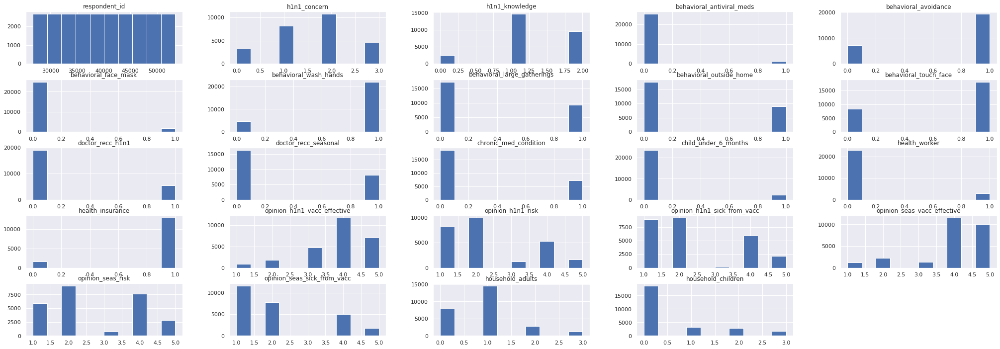

In [345]:
num_analysis(df_test_num)

In [346]:
df_test_cat

1.266042277890619

<AxesSubplot:xlabel='employment_status', ylabel='count'>

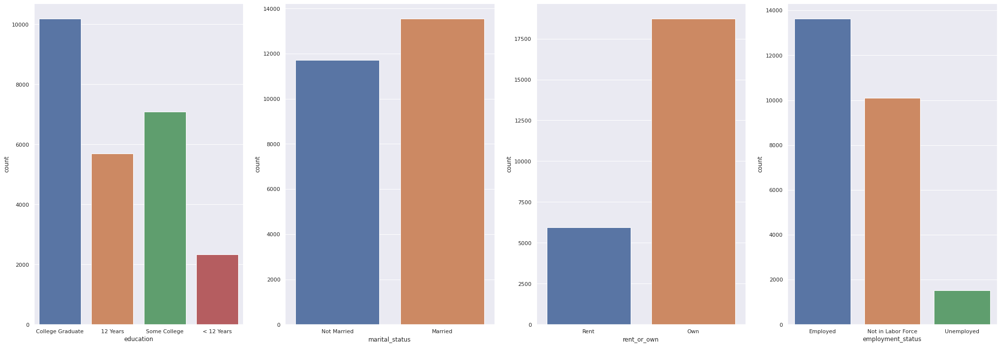

In [351]:
plt.subplot(1,4,1)
sns.countplot(x='education',data=df_test_cat)

plt.subplot(1,4,2)
sns.countplot(x='marital_status',data=df_test_cat)

plt.subplot(1,4,3)
sns.countplot(x='rent_or_own',data=df_test_cat)

plt.subplot(1,4,4)
sns.countplot(x='employment_status',data=df_test_cat)

### Drop NA

In [470]:
# employment
df_test = df_test.drop(['employment_occupation', 'employment_industry'], axis=1)

In [471]:
# education
# df_test['education'] = df_test['education'].apply(lambda x: 'College Graduate' if pd.isnull(x) else x)

# Income
df_test['income_poverty'] = df_test['income_poverty'].apply(lambda x: '<= $75,000, Above Poverty' if pd.isnull(x) else x)

# rent or own
# df_test['rent_or_own'] = df_test['rent_or_own'].apply(lambda x: 'Own' if pd.isnull(x) else x)

# marital status
# df_test['marital_status'] = df_test['marital_status'].apply(lambda x: 'Married' if pd.isnull(x) else x)

# rent or own
# df_test['employment_status'] = df_test['employment_status'].apply(lambda x: 'Employed' if pd.isnull(x) else x)

In [472]:
df_test = df_test.fillna(0)

In [473]:
df_test.shape

(26708, 34)

In [474]:
df_test.isna().sum()

respondent_id                  0
h1n1_concern                   0
h1n1_knowledge                 0
behavioral_antiviral_meds      0
behavioral_avoidance           0
behavioral_face_mask           0
behavioral_wash_hands          0
behavioral_large_gatherings    0
behavioral_outside_home        0
behavioral_touch_face          0
doctor_recc_h1n1               0
doctor_recc_seasonal           0
chronic_med_condition          0
child_under_6_months           0
health_worker                  0
health_insurance               0
opinion_h1n1_vacc_effective    0
opinion_h1n1_risk              0
opinion_h1n1_sick_from_vacc    0
opinion_seas_vacc_effective    0
opinion_seas_risk              0
opinion_seas_sick_from_vacc    0
age_group                      0
education                      0
race                           0
sex                            0
income_poverty                 0
marital_status                 0
rent_or_own                    0
employment_status              0
hhs_geo_re

In [475]:
# df_test = df_test.fillna(0)

### Feature engineering

In [476]:
df_test['general_h1n1'] = df_test['h1n1_concern'] + df_test['h1n1_knowledge']

df_test['behaviour_general'] = df_test['behavioral_antiviral_meds'] + df_test['behavioral_avoidance'] + df_test['behavioral_face_mask'] + df_test['behavioral_wash_hands'] + df_test['behavioral_large_gatherings'] + df_test['behavioral_outside_home'] + df_test['behavioral_touch_face']

df_test['details_general'] = df_test['doctor_recc_h1n1'] + df_test['doctor_recc_seasonal'] + df_test['chronic_med_condition'] + df_test['child_under_6_months'] + df_test['health_worker'] + df_test['health_insurance']

df_test['opinion_general'] = df_test['opinion_h1n1_vacc_effective'] + df_test['opinion_h1n1_risk'] + df_test['opinion_h1n1_sick_from_vacc'] + df_test['opinion_seas_vacc_effective'] + df_test['opinion_seas_risk'] + df_test['opinion_seas_sick_from_vacc']

# General H1N1 x General Behaviour
df_test['h1n1_x_behaviour'] = df_test['general_h1n1']*df_test['behaviour_general']

# General H1N1 x General Detais
df_test['h1n1_x_details'] = df_test['general_h1n1']*df_test['details_general']

# General H1N1 x General Opinion
df_test['h1n1_x_opinion'] = df_test['general_h1n1']*df_test['opinion_general']

# General Detais x General Behaviour
df_test['details_x_behaviour'] = df_test['details_general']*df_test['behaviour_general']

# General Detais x General Opinion
df_test['details_x_opinion'] = df_test['details_general']*df_test['opinion_general']

# General Opinion x General Behaviour
df_test['opinion_x_details'] = df_test['opinion_general']*df_test['behaviour_general']

### Data Preparation

In [477]:
ss = pp.StandardScaler()
mm = pp.MinMaxScaler()

In [478]:
min_max_columns = ['h1n1_concern', 'h1n1_knowledge', 'opinion_h1n1_vacc_effective', 'opinion_h1n1_risk',
       'opinion_h1n1_sick_from_vacc', 'opinion_seas_vacc_effective',
       'opinion_seas_risk', 'opinion_seas_sick_from_vacc', 'household_adults',
       'household_children', 'general_h1n1', 'behaviour_general',
       'details_general', 'h1n1_x_behaviour',
       'h1n1_x_details', 'h1n1_x_opinion', 'details_x_behaviour',
       'details_x_opinion', 'opinion_x_details']

In [479]:
for i in min_max_columns:
    df_test[i] = mm.fit_transform(df_test[i].values.reshape(-1,1))
    
df_test['opinion_general'] = ss.fit_transform(df_test['opinion_general'].values.reshape(-1,1))

In [480]:
df_test = pd.get_dummies(df_test, columns = ['age_group', 'education', 'race', 'sex', 'income_poverty',
       'marital_status', 'rent_or_own', 'employment_status', 'hhs_geo_region',
       'census_msa'])

In [481]:
df_test[['h1n1_concern', 'h1n1_knowledge', 'behavioral_antiviral_meds',
       'behavioral_avoidance', 'behavioral_face_mask', 'behavioral_wash_hands',
       'behavioral_large_gatherings', 'behavioral_outside_home',
       'behavioral_touch_face', 'doctor_recc_h1n1', 'doctor_recc_seasonal',
       'chronic_med_condition', 'child_under_6_months', 'health_worker',
       'health_insurance', 'opinion_h1n1_vacc_effective', 'opinion_h1n1_risk',
       'opinion_h1n1_sick_from_vacc', 'opinion_seas_vacc_effective',
       'opinion_seas_risk', 'opinion_seas_sick_from_vacc', 'household_adults',
       'household_children', 'general_h1n1', 'behaviour_general',
       'details_general', 'opinion_general', 'h1n1_x_behaviour',
       'h1n1_x_details', 'h1n1_x_opinion', 'details_x_behaviour',
       'details_x_opinion', 'opinion_x_details', 'age_group_18 - 34 Years',
       'age_group_35 - 44 Years', 'age_group_45 - 54 Years',
       'age_group_55 - 64 Years', 'age_group_65+ Years', 'education_12 Years',
       'education_< 12 Years', 'education_College Graduate',
       'education_Some College', 'race_Black', 'race_Hispanic',
       'race_Other or Multiple', 'race_White', 'sex_Female', 'sex_Male',
       'income_poverty_<= $75,000, Above Poverty', 'marital_status_Married',
       'marital_status_Not Married', 'rent_or_own_Own', 'rent_or_own_Rent',
       'employment_status_Employed', 'employment_status_Not in Labor Force',
       'employment_status_Unemployed', 'hhs_geo_region_atmpeygn',
       'hhs_geo_region_bhuqouqj', 'hhs_geo_region_dqpwygqj',
       'hhs_geo_region_fpwskwrf', 'hhs_geo_region_kbazzjca',
       'hhs_geo_region_lrircsnp', 'hhs_geo_region_lzgpxyit',
       'hhs_geo_region_mlyzmhmf', 'hhs_geo_region_oxchjgsf',
       'hhs_geo_region_qufhixun', 'census_msa_MSA, Not Principle  City',
       'census_msa_MSA, Principle City', 'census_msa_Non-MSA']]

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,household_adults,household_children,general_h1n1,behaviour_general,details_general,opinion_general,h1n1_x_behaviour,h1n1_x_details,h1n1_x_opinion,details_x_behaviour,details_x_opinion,opinion_x_details,age_group_18 - 34 Years,age_group_35 - 44 Years,age_group_45 - 54 Years,age_group_55 - 64 Years,age_group_65+ Years,education_12 Years,education_< 12 Years,education_College Graduate,education_Some College,race_Black,race_Hispanic,race_Other or Multiple,race_White,sex_Female,sex_Male,"income_poverty_<= $75,000, Above Poverty",marital_status_Married,marital_status_Not Married,rent_or_own_Own,rent_or_own_Rent,employment_status_Employed,employment_status_Not in Labor Force,employment_status_Unemployed,hhs_geo_region_atmpeygn,hhs_geo_region_bhuqouqj,hhs_geo_region_dqpwygqj,hhs_geo_region_fpwskwrf,hhs_geo_region_kbazzjca,hhs_geo_region_lrircsnp,hhs_geo_region_lzgpxyit,hhs_geo_region_mlyzmhmf,hhs_geo_region_oxchjgsf,hhs_geo_region_qufhixun,"census_msa_MSA, Not Principle City","census_msa_MSA, Principle City",census_msa_Non-MSA
0,0.666667,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.2,0.2,1.0,0.2,0.2,0.333333,0.000000,0.8,0.571429,0.166667,-0.628483,0.457143,0.133333,0.373333,0.114286,0.077778,0.266667,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0
1,0.333333,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.8,0.2,0.2,0.8,0.2,0.2,1.000000,0.000000,0.4,0.000000,0.000000,-1.030723,0.000000,0.000000,0.160000,0.000000,0.000000,0.000000,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
2,0.666667,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.8,0.4,1.0,0.8,0.8,0.333333,0.000000,0.8,0.714286,0.000000,1.382722,0.571429,0.000000,0.640000,0.000000,0.000000,0.571429,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
3,0.333333,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.8,0.4,0.4,0.8,0.8,0.4,0.333333,0.000000,0.4,0.000000,0.666667,0.175999,0.000000,0.266667,0.240000,0.000000,0.400000,0.000000,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,1,1,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0
4,1.000000,0.5,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.4,0.8,0.8,0.8,0.4,0.000000,0.333333,0.8,0.857143,0.333333,0.779360,0.685714,0.266667,0.560000,0.342857,0.233333,0.600000,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26703,0.333333,0.5,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.8,0.4,0.4,0.8,0.4,0.2,0.333333,0.333333,0.4,0.428571,0.333333,-0.427362,0.171429,0.133333,0.200000,0.171429,0.166667,0.214286,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
26704,1.000000,0.5,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.8,0.2,0.2,1.0,0.4,0.4,0.333333,1.000000,0.8,0.714286,0.166667,-0.427362,0.571429,0.133333,0.400000,0.142857,0.083333,0.357143,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1
26705,0.000000,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.8,0.6,0.2,0.8,0.6,0.2,0.333333,0.000000,0.2,0.000000,0.166667,-0.226242,0.000000,0.033333,0.106667,0.000000,0.088889,0.000000,1,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0
26706,1.000000,0.5,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.4,0.6,0.8,0.8,

In [482]:
(df_test.isna().sum() / df_test.shape[0])*100

respondent_id                               0.0
h1n1_concern                                0.0
h1n1_knowledge                              0.0
behavioral_antiviral_meds                   0.0
behavioral_avoidance                        0.0
behavioral_face_mask                        0.0
behavioral_wash_hands                       0.0
behavioral_large_gatherings                 0.0
behavioral_outside_home                     0.0
behavioral_touch_face                       0.0
doctor_recc_h1n1                            0.0
doctor_recc_seasonal                        0.0
chronic_med_condition                       0.0
child_under_6_months                        0.0
health_worker                               0.0
health_insurance                            0.0
opinion_h1n1_vacc_effective                 0.0
opinion_h1n1_risk                           0.0
opinion_h1n1_sick_from_vacc                 0.0
opinion_seas_vacc_effective                 0.0
opinion_seas_risk                       

In [483]:
df_test.dtypes

respondent_id                                 int64
h1n1_concern                                float64
h1n1_knowledge                              float64
behavioral_antiviral_meds                   float64
behavioral_avoidance                        float64
behavioral_face_mask                        float64
behavioral_wash_hands                       float64
behavioral_large_gatherings                 float64
behavioral_outside_home                     float64
behavioral_touch_face                       float64
doctor_recc_h1n1                            float64
doctor_recc_seasonal                        float64
chronic_med_condition                       float64
child_under_6_months                        float64
health_worker                               float64
health_insurance                            float64
opinion_h1n1_vacc_effective                 float64
opinion_h1n1_risk                           float64
opinion_h1n1_sick_from_vacc                 float64
opinion_seas

In [484]:
df_test[['age_group_18 - 34 Years',
       'age_group_45 - 54 Years', 'age_group_55 - 64 Years',
       'age_group_65+ Years', 'education_12 Years',
       'education_College Graduate', 'education_Some College', 'race_White',
       'sex_Female', 'sex_Male', 'income_poverty_<= $75,000, Above Poverty',
       'income_poverty_> $75,000', 'marital_status_Married',
       'marital_status_Not Married', 'rent_or_own_Own',
       'employment_status_Employed', 'employment_status_Not in Labor Force',
       'census_msa_MSA, Not Principle  City', 'census_msa_MSA, Principle City',
       'census_msa_Non-MSA']] = df_test[['age_group_18 - 34 Years',
       'age_group_45 - 54 Years', 'age_group_55 - 64 Years',
       'age_group_65+ Years', 'education_12 Years',
       'education_College Graduate', 'education_Some College', 'race_White',
       'sex_Female', 'sex_Male', 'income_poverty_<= $75,000, Above Poverty',
       'income_poverty_> $75,000', 'marital_status_Married',
       'marital_status_Not Married', 'rent_or_own_Own',
       'employment_status_Employed', 'employment_status_Not in Labor Force',
       'census_msa_MSA, Not Principle  City', 'census_msa_MSA, Principle City',
       'census_msa_Non-MSA']].astype(int)

In [485]:
# df_test = df_test.fillna(0)

### Predicting 'h1n1' with CatBoost

In [498]:
X_train = df7_h1n1.drop(['h1n1'], axis=1).values
y_train = df7_h1n1['h1n1'].values

In [499]:
X_test = df_test[['h1n1_concern', 'h1n1_knowledge', 'behavioral_antiviral_meds',
       'behavioral_avoidance', 'behavioral_face_mask', 'behavioral_wash_hands',
       'behavioral_large_gatherings', 'behavioral_outside_home',
       'behavioral_touch_face', 'doctor_recc_h1n1', 'doctor_recc_seasonal',
       'chronic_med_condition', 'child_under_6_months', 'health_worker',
       'health_insurance', 'opinion_h1n1_vacc_effective', 'opinion_h1n1_risk',
       'opinion_h1n1_sick_from_vacc', 'opinion_seas_vacc_effective',
       'opinion_seas_risk', 'opinion_seas_sick_from_vacc', 'household_adults',
       'household_children', 'general_h1n1', 'behaviour_general',
       'details_general', 'opinion_general', 'h1n1_x_behaviour',
       'h1n1_x_details', 'h1n1_x_opinion', 'details_x_behaviour',
       'details_x_opinion', 'opinion_x_details', 'age_group_18 - 34 Years',
       'age_group_35 - 44 Years', 'age_group_45 - 54 Years',
       'age_group_55 - 64 Years', 'age_group_65+ Years', 'education_12 Years',
       'education_< 12 Years', 'education_College Graduate',
       'education_Some College', 'race_Black', 'race_Hispanic',
       'race_Other or Multiple', 'race_White', 'sex_Female', 'sex_Male',
       'income_poverty_<= $75,000, Above Poverty', 'marital_status_Married',
       'marital_status_Not Married', 'rent_or_own_Own', 'rent_or_own_Rent',
       'employment_status_Employed', 'employment_status_Not in Labor Force',
       'employment_status_Unemployed', 'hhs_geo_region_atmpeygn',
       'hhs_geo_region_bhuqouqj', 'hhs_geo_region_dqpwygqj',
       'hhs_geo_region_fpwskwrf', 'hhs_geo_region_kbazzjca',
       'hhs_geo_region_lrircsnp', 'hhs_geo_region_lzgpxyit',
       'hhs_geo_region_mlyzmhmf', 'hhs_geo_region_oxchjgsf',
       'hhs_geo_region_qufhixun', 'census_msa_MSA, Not Principle  City',
       'census_msa_MSA, Principle City', 'census_msa_Non-MSA']].copy()

In [500]:
# model
cat = CatBoostClassifier()

# train
cat.fit(X_train, y_train)

# predict
y_hat = cat.predict(X_test)
y_hat

Learning rate set to 0.048777
0:	learn: 0.6430396	total: 159ms	remaining: 2m 38s
1:	learn: 0.6002725	total: 207ms	remaining: 1m 43s
2:	learn: 0.5659889	total: 237ms	remaining: 1m 18s
3:	learn: 0.5371500	total: 271ms	remaining: 1m 7s
4:	learn: 0.5107977	total: 298ms	remaining: 59.4s
5:	learn: 0.4912593	total: 326ms	remaining: 54.1s
6:	learn: 0.4723749	total: 366ms	remaining: 51.9s
7:	learn: 0.4586791	total: 403ms	remaining: 50s
8:	learn: 0.4454755	total: 452ms	remaining: 49.8s
9:	learn: 0.4341762	total: 491ms	remaining: 48.6s
10:	learn: 0.4241717	total: 536ms	remaining: 48.2s
11:	learn: 0.4081546	total: 574ms	remaining: 47.3s
12:	learn: 0.3987157	total: 622ms	remaining: 47.2s
13:	learn: 0.3902167	total: 652ms	remaining: 45.9s
14:	learn: 0.3832864	total: 683ms	remaining: 44.8s
15:	learn: 0.3713111	total: 707ms	remaining: 43.5s
16:	learn: 0.3652087	total: 729ms	remaining: 42.2s
17:	learn: 0.3578894	total: 757ms	remaining: 41.3s
18:	learn: 0.3516989	total: 795ms	remaining: 41.1s
19:	learn:

161:	learn: 0.2251145	total: 6.18s	remaining: 32s
162:	learn: 0.2250322	total: 6.21s	remaining: 31.9s
163:	learn: 0.2248697	total: 6.25s	remaining: 31.9s
164:	learn: 0.2247345	total: 6.29s	remaining: 31.9s
165:	learn: 0.2245990	total: 6.34s	remaining: 31.8s
166:	learn: 0.2244662	total: 6.39s	remaining: 31.9s
167:	learn: 0.2243524	total: 6.46s	remaining: 32s
168:	learn: 0.2242688	total: 6.51s	remaining: 32s
169:	learn: 0.2241541	total: 6.58s	remaining: 32.1s
170:	learn: 0.2240609	total: 6.63s	remaining: 32.1s
171:	learn: 0.2239755	total: 6.69s	remaining: 32.2s
172:	learn: 0.2238855	total: 6.74s	remaining: 32.2s
173:	learn: 0.2237916	total: 6.94s	remaining: 33s
174:	learn: 0.2236627	total: 6.99s	remaining: 33s
175:	learn: 0.2232924	total: 7.04s	remaining: 33s
176:	learn: 0.2232137	total: 7.09s	remaining: 33s
177:	learn: 0.2229920	total: 7.1s	remaining: 32.8s
178:	learn: 0.2228799	total: 7.13s	remaining: 32.7s
179:	learn: 0.2227359	total: 7.15s	remaining: 32.6s
180:	learn: 0.2225904	total

322:	learn: 0.2052106	total: 12s	remaining: 25.2s
323:	learn: 0.2050889	total: 12.1s	remaining: 25.2s
324:	learn: 0.2049648	total: 12.1s	remaining: 25.2s
325:	learn: 0.2048962	total: 12.2s	remaining: 25.2s
326:	learn: 0.2048290	total: 12.3s	remaining: 25.2s
327:	learn: 0.2047391	total: 12.3s	remaining: 25.3s
328:	learn: 0.2047034	total: 12.4s	remaining: 25.3s
329:	learn: 0.2046023	total: 12.5s	remaining: 25.3s
330:	learn: 0.2045328	total: 12.5s	remaining: 25.3s
331:	learn: 0.2044748	total: 12.6s	remaining: 25.3s
332:	learn: 0.2044012	total: 12.7s	remaining: 25.3s
333:	learn: 0.2043207	total: 12.7s	remaining: 25.3s
334:	learn: 0.2042304	total: 12.8s	remaining: 25.4s
335:	learn: 0.2041509	total: 12.8s	remaining: 25.4s
336:	learn: 0.2040387	total: 12.9s	remaining: 25.4s
337:	learn: 0.2039319	total: 13s	remaining: 25.4s
338:	learn: 0.2038254	total: 13s	remaining: 25.4s
339:	learn: 0.2037142	total: 13.1s	remaining: 25.5s
340:	learn: 0.2034823	total: 13.2s	remaining: 25.5s
341:	learn: 0.2034

481:	learn: 0.1912290	total: 19s	remaining: 20.4s
482:	learn: 0.1911218	total: 19s	remaining: 20.4s
483:	learn: 0.1910513	total: 19.1s	remaining: 20.4s
484:	learn: 0.1909888	total: 19.2s	remaining: 20.4s
485:	learn: 0.1909383	total: 19.3s	remaining: 20.4s
486:	learn: 0.1908405	total: 19.3s	remaining: 20.4s
487:	learn: 0.1907701	total: 19.5s	remaining: 20.4s
488:	learn: 0.1906591	total: 19.5s	remaining: 20.4s
489:	learn: 0.1906095	total: 19.5s	remaining: 20.3s
490:	learn: 0.1905541	total: 19.6s	remaining: 20.3s
491:	learn: 0.1904510	total: 19.6s	remaining: 20.2s
492:	learn: 0.1903867	total: 19.6s	remaining: 20.2s
493:	learn: 0.1902840	total: 19.7s	remaining: 20.2s
494:	learn: 0.1902130	total: 19.7s	remaining: 20.1s
495:	learn: 0.1901546	total: 19.7s	remaining: 20.1s
496:	learn: 0.1900919	total: 19.8s	remaining: 20s
497:	learn: 0.1900418	total: 19.8s	remaining: 20s
498:	learn: 0.1899823	total: 19.8s	remaining: 19.9s
499:	learn: 0.1898996	total: 19.9s	remaining: 19.9s
500:	learn: 0.189807

642:	learn: 0.1790653	total: 26.7s	remaining: 14.8s
643:	learn: 0.1789925	total: 26.7s	remaining: 14.8s
644:	learn: 0.1789356	total: 26.8s	remaining: 14.7s
645:	learn: 0.1788526	total: 26.8s	remaining: 14.7s
646:	learn: 0.1787745	total: 26.8s	remaining: 14.6s
647:	learn: 0.1787305	total: 26.8s	remaining: 14.6s
648:	learn: 0.1785986	total: 26.9s	remaining: 14.5s
649:	learn: 0.1785497	total: 26.9s	remaining: 14.5s
650:	learn: 0.1784710	total: 27s	remaining: 14.5s
651:	learn: 0.1783899	total: 27s	remaining: 14.4s
652:	learn: 0.1783370	total: 27.1s	remaining: 14.4s
653:	learn: 0.1782777	total: 27.1s	remaining: 14.3s
654:	learn: 0.1782209	total: 27.1s	remaining: 14.3s
655:	learn: 0.1781647	total: 27.1s	remaining: 14.2s
656:	learn: 0.1781124	total: 27.2s	remaining: 14.2s
657:	learn: 0.1780565	total: 27.2s	remaining: 14.1s
658:	learn: 0.1780023	total: 27.2s	remaining: 14.1s
659:	learn: 0.1779238	total: 27.2s	remaining: 14s
660:	learn: 0.1778371	total: 27.3s	remaining: 14s
661:	learn: 0.177785

809:	learn: 0.1682226	total: 32s	remaining: 7.5s
810:	learn: 0.1681471	total: 32.1s	remaining: 7.47s
811:	learn: 0.1680955	total: 32.1s	remaining: 7.43s
812:	learn: 0.1680578	total: 32.1s	remaining: 7.39s
813:	learn: 0.1679884	total: 32.1s	remaining: 7.34s
814:	learn: 0.1679021	total: 32.2s	remaining: 7.3s
815:	learn: 0.1678282	total: 32.2s	remaining: 7.26s
816:	learn: 0.1677624	total: 32.2s	remaining: 7.21s
817:	learn: 0.1676967	total: 32.2s	remaining: 7.17s
818:	learn: 0.1676337	total: 32.2s	remaining: 7.13s
819:	learn: 0.1675806	total: 32.3s	remaining: 7.08s
820:	learn: 0.1675286	total: 32.3s	remaining: 7.04s
821:	learn: 0.1674871	total: 32.3s	remaining: 7s
822:	learn: 0.1674273	total: 32.4s	remaining: 6.96s
823:	learn: 0.1673425	total: 32.4s	remaining: 6.93s
824:	learn: 0.1672776	total: 32.5s	remaining: 6.89s
825:	learn: 0.1672187	total: 32.5s	remaining: 6.84s
826:	learn: 0.1671921	total: 32.5s	remaining: 6.8s
827:	learn: 0.1671188	total: 32.6s	remaining: 6.76s
828:	learn: 0.167076

969:	learn: 0.1584937	total: 37.4s	remaining: 1.16s
970:	learn: 0.1584499	total: 37.4s	remaining: 1.12s
971:	learn: 0.1584080	total: 37.5s	remaining: 1.08s
972:	learn: 0.1583571	total: 37.5s	remaining: 1.04s
973:	learn: 0.1583158	total: 37.6s	remaining: 1s
974:	learn: 0.1582635	total: 37.6s	remaining: 964ms
975:	learn: 0.1581828	total: 37.6s	remaining: 925ms
976:	learn: 0.1581267	total: 37.7s	remaining: 887ms
977:	learn: 0.1580656	total: 37.7s	remaining: 848ms
978:	learn: 0.1579783	total: 37.7s	remaining: 809ms
979:	learn: 0.1579384	total: 37.8s	remaining: 771ms
980:	learn: 0.1578990	total: 37.8s	remaining: 733ms
981:	learn: 0.1578475	total: 37.8s	remaining: 694ms
982:	learn: 0.1577959	total: 37.9s	remaining: 655ms
983:	learn: 0.1577318	total: 37.9s	remaining: 616ms
984:	learn: 0.1577001	total: 37.9s	remaining: 577ms
985:	learn: 0.1576175	total: 37.9s	remaining: 539ms
986:	learn: 0.1575385	total: 38s	remaining: 500ms
987:	learn: 0.1574627	total: 38s	remaining: 461ms
988:	learn: 0.15740

array(['0', '0', '0', ..., '0', '0', '1'], dtype=object)

### Calibration 'h1n1'

# 12.0 Model Calibration

## 12.1 Calibration curves

We need to check the calibration of two models (Calibrated and Non-Calibrated) to **see how stable the default prediction performance is across probabilities**. You can use a chart of each model's calibration to check this by calling the `calibration_curve()` function.

Recommended reading: 
- https://machinelearningmastery.com/calibrated-classification-model-in-scikit-learn/
- https://scikit-learn.org/stable/modules/generated/sklearn.calibration.CalibratedClassifierCV.html

In [501]:
from sklearn.calibration import CalibratedClassifierCV

In [504]:
# defines the cross validation strategy
cv = StratifiedKFold(n_splits=10)

In [505]:
# trains the tunned model
cat.fit(X_train, y_train)

# defines and fits calibration model
calibrated_cat = CalibratedClassifierCV(cat, method='isotonic', cv=cv)
calibrated_cat.fit(X_train, y_train)

Learning rate set to 0.048777
0:	learn: 0.6430396	total: 51.4ms	remaining: 51.4s
1:	learn: 0.6002725	total: 76.7ms	remaining: 38.3s
2:	learn: 0.5659889	total: 129ms	remaining: 42.9s
3:	learn: 0.5371500	total: 170ms	remaining: 42.4s
4:	learn: 0.5107977	total: 200ms	remaining: 39.8s
5:	learn: 0.4912593	total: 225ms	remaining: 37.3s
6:	learn: 0.4723749	total: 246ms	remaining: 34.9s
7:	learn: 0.4586791	total: 265ms	remaining: 32.8s
8:	learn: 0.4454755	total: 283ms	remaining: 31.2s
9:	learn: 0.4341762	total: 302ms	remaining: 29.9s
10:	learn: 0.4241717	total: 321ms	remaining: 28.9s
11:	learn: 0.4081546	total: 340ms	remaining: 28s
12:	learn: 0.3987157	total: 359ms	remaining: 27.3s
13:	learn: 0.3902167	total: 386ms	remaining: 27.2s
14:	learn: 0.3832864	total: 414ms	remaining: 27.2s
15:	learn: 0.3713111	total: 433ms	remaining: 26.6s
16:	learn: 0.3652087	total: 452ms	remaining: 26.1s
17:	learn: 0.3578894	total: 474ms	remaining: 25.9s
18:	learn: 0.3516989	total: 492ms	remaining: 25.4s
19:	learn: 

165:	learn: 0.2245990	total: 5.15s	remaining: 25.9s
166:	learn: 0.2244662	total: 5.18s	remaining: 25.8s
167:	learn: 0.2243524	total: 5.2s	remaining: 25.8s
168:	learn: 0.2242688	total: 5.22s	remaining: 25.7s
169:	learn: 0.2241541	total: 5.24s	remaining: 25.6s
170:	learn: 0.2240609	total: 5.26s	remaining: 25.5s
171:	learn: 0.2239755	total: 5.28s	remaining: 25.4s
172:	learn: 0.2238855	total: 5.3s	remaining: 25.3s
173:	learn: 0.2237916	total: 5.32s	remaining: 25.2s
174:	learn: 0.2236627	total: 5.35s	remaining: 25.2s
175:	learn: 0.2232924	total: 5.41s	remaining: 25.3s
176:	learn: 0.2232137	total: 5.47s	remaining: 25.4s
177:	learn: 0.2229920	total: 5.5s	remaining: 25.4s
178:	learn: 0.2228799	total: 5.53s	remaining: 25.4s
179:	learn: 0.2227359	total: 5.57s	remaining: 25.4s
180:	learn: 0.2225904	total: 5.61s	remaining: 25.4s
181:	learn: 0.2224718	total: 5.66s	remaining: 25.5s
182:	learn: 0.2220707	total: 5.71s	remaining: 25.5s
183:	learn: 0.2217627	total: 5.75s	remaining: 25.5s
184:	learn: 0.2

324:	learn: 0.2049648	total: 11.3s	remaining: 23.4s
325:	learn: 0.2048962	total: 11.3s	remaining: 23.4s
326:	learn: 0.2048290	total: 11.4s	remaining: 23.4s
327:	learn: 0.2047391	total: 11.5s	remaining: 23.5s
328:	learn: 0.2047034	total: 11.5s	remaining: 23.4s
329:	learn: 0.2046023	total: 11.5s	remaining: 23.4s
330:	learn: 0.2045328	total: 11.5s	remaining: 23.3s
331:	learn: 0.2044748	total: 11.6s	remaining: 23.3s
332:	learn: 0.2044012	total: 11.6s	remaining: 23.2s
333:	learn: 0.2043207	total: 11.6s	remaining: 23.2s
334:	learn: 0.2042304	total: 11.6s	remaining: 23.1s
335:	learn: 0.2041509	total: 11.7s	remaining: 23s
336:	learn: 0.2040387	total: 11.7s	remaining: 23s
337:	learn: 0.2039319	total: 11.8s	remaining: 23.1s
338:	learn: 0.2038254	total: 11.8s	remaining: 23.1s
339:	learn: 0.2037142	total: 11.9s	remaining: 23s
340:	learn: 0.2034823	total: 11.9s	remaining: 23s
341:	learn: 0.2034044	total: 11.9s	remaining: 23s
342:	learn: 0.2032872	total: 12s	remaining: 22.9s
343:	learn: 0.2032131	to

485:	learn: 0.1909383	total: 17.2s	remaining: 18.2s
486:	learn: 0.1908405	total: 17.3s	remaining: 18.2s
487:	learn: 0.1907701	total: 17.3s	remaining: 18.1s
488:	learn: 0.1906591	total: 17.3s	remaining: 18.1s
489:	learn: 0.1906095	total: 17.3s	remaining: 18s
490:	learn: 0.1905541	total: 17.4s	remaining: 18s
491:	learn: 0.1904510	total: 17.4s	remaining: 17.9s
492:	learn: 0.1903867	total: 17.4s	remaining: 17.9s
493:	learn: 0.1902840	total: 17.4s	remaining: 17.8s
494:	learn: 0.1902130	total: 17.4s	remaining: 17.8s
495:	learn: 0.1901546	total: 17.5s	remaining: 17.7s
496:	learn: 0.1900919	total: 17.5s	remaining: 17.7s
497:	learn: 0.1900418	total: 17.5s	remaining: 17.6s
498:	learn: 0.1899823	total: 17.5s	remaining: 17.6s
499:	learn: 0.1898996	total: 17.5s	remaining: 17.5s
500:	learn: 0.1898078	total: 17.5s	remaining: 17.5s
501:	learn: 0.1897177	total: 17.6s	remaining: 17.4s
502:	learn: 0.1896486	total: 17.6s	remaining: 17.4s
503:	learn: 0.1895516	total: 17.6s	remaining: 17.4s
504:	learn: 0.18

647:	learn: 0.1787305	total: 23.3s	remaining: 12.6s
648:	learn: 0.1785986	total: 23.3s	remaining: 12.6s
649:	learn: 0.1785497	total: 23.3s	remaining: 12.6s
650:	learn: 0.1784710	total: 23.4s	remaining: 12.5s
651:	learn: 0.1783899	total: 23.4s	remaining: 12.5s
652:	learn: 0.1783370	total: 23.4s	remaining: 12.5s
653:	learn: 0.1782777	total: 23.5s	remaining: 12.4s
654:	learn: 0.1782209	total: 23.5s	remaining: 12.4s
655:	learn: 0.1781647	total: 23.6s	remaining: 12.3s
656:	learn: 0.1781124	total: 23.7s	remaining: 12.4s
657:	learn: 0.1780565	total: 23.7s	remaining: 12.3s
658:	learn: 0.1780023	total: 23.7s	remaining: 12.3s
659:	learn: 0.1779238	total: 23.8s	remaining: 12.3s
660:	learn: 0.1778371	total: 23.8s	remaining: 12.2s
661:	learn: 0.1777858	total: 23.9s	remaining: 12.2s
662:	learn: 0.1777195	total: 23.9s	remaining: 12.1s
663:	learn: 0.1776684	total: 23.9s	remaining: 12.1s
664:	learn: 0.1775648	total: 23.9s	remaining: 12.1s
665:	learn: 0.1774996	total: 24s	remaining: 12s
666:	learn: 0.17

809:	learn: 0.1682226	total: 28.9s	remaining: 6.78s
810:	learn: 0.1681471	total: 28.9s	remaining: 6.74s
811:	learn: 0.1680955	total: 28.9s	remaining: 6.7s
812:	learn: 0.1680578	total: 29s	remaining: 6.66s
813:	learn: 0.1679884	total: 29s	remaining: 6.62s
814:	learn: 0.1679021	total: 29s	remaining: 6.59s
815:	learn: 0.1678282	total: 29.1s	remaining: 6.56s
816:	learn: 0.1677624	total: 29.2s	remaining: 6.53s
817:	learn: 0.1676967	total: 29.2s	remaining: 6.5s
818:	learn: 0.1676337	total: 29.3s	remaining: 6.47s
819:	learn: 0.1675806	total: 29.3s	remaining: 6.44s
820:	learn: 0.1675286	total: 29.4s	remaining: 6.4s
821:	learn: 0.1674871	total: 29.4s	remaining: 6.36s
822:	learn: 0.1674273	total: 29.4s	remaining: 6.33s
823:	learn: 0.1673425	total: 29.5s	remaining: 6.3s
824:	learn: 0.1672776	total: 29.6s	remaining: 6.27s
825:	learn: 0.1672187	total: 29.6s	remaining: 6.24s
826:	learn: 0.1671921	total: 29.7s	remaining: 6.2s
827:	learn: 0.1671188	total: 29.7s	remaining: 6.17s
828:	learn: 0.1670763	t

971:	learn: 0.1584080	total: 35.8s	remaining: 1.03s
972:	learn: 0.1583571	total: 35.9s	remaining: 995ms
973:	learn: 0.1583158	total: 35.9s	remaining: 958ms
974:	learn: 0.1582635	total: 35.9s	remaining: 921ms
975:	learn: 0.1581828	total: 35.9s	remaining: 884ms
976:	learn: 0.1581267	total: 36s	remaining: 847ms
977:	learn: 0.1580656	total: 36s	remaining: 810ms
978:	learn: 0.1579783	total: 36s	remaining: 772ms
979:	learn: 0.1579384	total: 36s	remaining: 735ms
980:	learn: 0.1578990	total: 36.1s	remaining: 698ms
981:	learn: 0.1578475	total: 36.1s	remaining: 661ms
982:	learn: 0.1577959	total: 36.1s	remaining: 625ms
983:	learn: 0.1577318	total: 36.2s	remaining: 588ms
984:	learn: 0.1577001	total: 36.2s	remaining: 551ms
985:	learn: 0.1576175	total: 36.3s	remaining: 515ms
986:	learn: 0.1575385	total: 36.3s	remaining: 478ms
987:	learn: 0.1574627	total: 36.3s	remaining: 441ms
988:	learn: 0.1574049	total: 36.3s	remaining: 404ms
989:	learn: 0.1573340	total: 36.4s	remaining: 367ms
990:	learn: 0.157278

136:	learn: 0.1905063	total: 4.2s	remaining: 26.5s
137:	learn: 0.1903902	total: 4.27s	remaining: 26.7s
138:	learn: 0.1901972	total: 4.29s	remaining: 26.5s
139:	learn: 0.1898795	total: 4.3s	remaining: 26.4s
140:	learn: 0.1897422	total: 4.32s	remaining: 26.3s
141:	learn: 0.1895206	total: 4.34s	remaining: 26.2s
142:	learn: 0.1894159	total: 4.35s	remaining: 26.1s
143:	learn: 0.1892915	total: 4.37s	remaining: 26s
144:	learn: 0.1891142	total: 4.39s	remaining: 25.9s
145:	learn: 0.1889752	total: 4.41s	remaining: 25.8s
146:	learn: 0.1886611	total: 4.44s	remaining: 25.8s
147:	learn: 0.1885474	total: 4.47s	remaining: 25.7s
148:	learn: 0.1880194	total: 4.49s	remaining: 25.6s
149:	learn: 0.1879138	total: 4.59s	remaining: 26s
150:	learn: 0.1875075	total: 4.66s	remaining: 26.2s
151:	learn: 0.1872911	total: 4.7s	remaining: 26.2s
152:	learn: 0.1871734	total: 4.73s	remaining: 26.2s
153:	learn: 0.1870387	total: 4.76s	remaining: 26.2s
154:	learn: 0.1868925	total: 4.78s	remaining: 26.1s
155:	learn: 0.18666

298:	learn: 0.1691437	total: 9.73s	remaining: 22.8s
299:	learn: 0.1689316	total: 9.75s	remaining: 22.8s
300:	learn: 0.1688717	total: 9.79s	remaining: 22.7s
301:	learn: 0.1687915	total: 9.85s	remaining: 22.8s
302:	learn: 0.1686970	total: 9.91s	remaining: 22.8s
303:	learn: 0.1686013	total: 9.97s	remaining: 22.8s
304:	learn: 0.1685107	total: 10s	remaining: 22.8s
305:	learn: 0.1684300	total: 10s	remaining: 22.7s
306:	learn: 0.1683263	total: 10s	remaining: 22.6s
307:	learn: 0.1682105	total: 10.1s	remaining: 22.6s
308:	learn: 0.1681258	total: 10.1s	remaining: 22.5s
309:	learn: 0.1680121	total: 10.1s	remaining: 22.5s
310:	learn: 0.1679246	total: 10.1s	remaining: 22.4s
311:	learn: 0.1678209	total: 10.1s	remaining: 22.4s
312:	learn: 0.1677392	total: 10.2s	remaining: 22.3s
313:	learn: 0.1676196	total: 10.2s	remaining: 22.3s
314:	learn: 0.1675714	total: 10.2s	remaining: 22.2s
315:	learn: 0.1674795	total: 10.3s	remaining: 22.2s
316:	learn: 0.1674088	total: 10.4s	remaining: 22.4s
317:	learn: 0.1673

465:	learn: 0.1539082	total: 14.9s	remaining: 17.1s
466:	learn: 0.1536619	total: 15s	remaining: 17.1s
467:	learn: 0.1536323	total: 15s	remaining: 17s
468:	learn: 0.1535901	total: 15s	remaining: 17s
469:	learn: 0.1535244	total: 15s	remaining: 16.9s
470:	learn: 0.1534247	total: 15.1s	remaining: 16.9s
471:	learn: 0.1533155	total: 15.1s	remaining: 16.9s
472:	learn: 0.1532268	total: 15.1s	remaining: 16.8s
473:	learn: 0.1531089	total: 15.1s	remaining: 16.8s
474:	learn: 0.1530517	total: 15.2s	remaining: 16.8s
475:	learn: 0.1529665	total: 15.2s	remaining: 16.7s
476:	learn: 0.1528637	total: 15.2s	remaining: 16.7s
477:	learn: 0.1528092	total: 15.2s	remaining: 16.6s
478:	learn: 0.1527173	total: 15.2s	remaining: 16.6s
479:	learn: 0.1526366	total: 15.3s	remaining: 16.5s
480:	learn: 0.1525661	total: 15.3s	remaining: 16.5s
481:	learn: 0.1524827	total: 15.3s	remaining: 16.4s
482:	learn: 0.1524199	total: 15.3s	remaining: 16.4s
483:	learn: 0.1523619	total: 15.3s	remaining: 16.4s
484:	learn: 0.1522612	to

626:	learn: 0.1418917	total: 19.8s	remaining: 11.8s
627:	learn: 0.1418320	total: 19.8s	remaining: 11.7s
628:	learn: 0.1417493	total: 19.9s	remaining: 11.7s
629:	learn: 0.1416792	total: 19.9s	remaining: 11.7s
630:	learn: 0.1416124	total: 19.9s	remaining: 11.7s
631:	learn: 0.1415552	total: 20s	remaining: 11.6s
632:	learn: 0.1415094	total: 20s	remaining: 11.6s
633:	learn: 0.1414213	total: 20.1s	remaining: 11.6s
634:	learn: 0.1413360	total: 20.1s	remaining: 11.6s
635:	learn: 0.1412707	total: 20.2s	remaining: 11.5s
636:	learn: 0.1412113	total: 20.2s	remaining: 11.5s
637:	learn: 0.1411293	total: 20.2s	remaining: 11.5s
638:	learn: 0.1410393	total: 20.3s	remaining: 11.5s
639:	learn: 0.1409981	total: 20.4s	remaining: 11.5s
640:	learn: 0.1409239	total: 20.4s	remaining: 11.4s
641:	learn: 0.1408480	total: 20.5s	remaining: 11.4s
642:	learn: 0.1408006	total: 20.5s	remaining: 11.4s
643:	learn: 0.1407516	total: 20.7s	remaining: 11.4s
644:	learn: 0.1407036	total: 20.7s	remaining: 11.4s
645:	learn: 0.14

786:	learn: 0.1317342	total: 25.7s	remaining: 6.95s
787:	learn: 0.1316770	total: 25.7s	remaining: 6.91s
788:	learn: 0.1316072	total: 25.7s	remaining: 6.87s
789:	learn: 0.1315502	total: 25.7s	remaining: 6.84s
790:	learn: 0.1314824	total: 25.8s	remaining: 6.8s
791:	learn: 0.1314445	total: 25.8s	remaining: 6.77s
792:	learn: 0.1313699	total: 25.8s	remaining: 6.73s
793:	learn: 0.1313477	total: 25.8s	remaining: 6.7s
794:	learn: 0.1312733	total: 25.8s	remaining: 6.66s
795:	learn: 0.1312219	total: 25.9s	remaining: 6.63s
796:	learn: 0.1311498	total: 25.9s	remaining: 6.59s
797:	learn: 0.1310945	total: 25.9s	remaining: 6.56s
798:	learn: 0.1310208	total: 25.9s	remaining: 6.52s
799:	learn: 0.1309608	total: 26s	remaining: 6.49s
800:	learn: 0.1309225	total: 26s	remaining: 6.46s
801:	learn: 0.1308833	total: 26.1s	remaining: 6.44s
802:	learn: 0.1308140	total: 26.1s	remaining: 6.41s
803:	learn: 0.1307588	total: 26.1s	remaining: 6.37s
804:	learn: 0.1307095	total: 26.2s	remaining: 6.34s
805:	learn: 0.1306

947:	learn: 0.1226122	total: 31.5s	remaining: 1.73s
948:	learn: 0.1225416	total: 31.6s	remaining: 1.7s
949:	learn: 0.1225041	total: 31.6s	remaining: 1.66s
950:	learn: 0.1224642	total: 31.6s	remaining: 1.63s
951:	learn: 0.1224108	total: 31.6s	remaining: 1.59s
952:	learn: 0.1223575	total: 31.7s	remaining: 1.56s
953:	learn: 0.1222853	total: 31.8s	remaining: 1.53s
954:	learn: 0.1222178	total: 31.8s	remaining: 1.5s
955:	learn: 0.1221606	total: 31.9s	remaining: 1.47s
956:	learn: 0.1221329	total: 32s	remaining: 1.44s
957:	learn: 0.1220646	total: 32.2s	remaining: 1.41s
958:	learn: 0.1220080	total: 32.2s	remaining: 1.38s
959:	learn: 0.1219236	total: 32.3s	remaining: 1.34s
960:	learn: 0.1218454	total: 32.3s	remaining: 1.31s
961:	learn: 0.1217686	total: 32.4s	remaining: 1.28s
962:	learn: 0.1217035	total: 32.5s	remaining: 1.25s
963:	learn: 0.1216627	total: 32.5s	remaining: 1.21s
964:	learn: 0.1216310	total: 32.5s	remaining: 1.18s
965:	learn: 0.1215937	total: 32.6s	remaining: 1.15s
966:	learn: 0.12

110:	learn: 0.1933874	total: 3.95s	remaining: 31.6s
111:	learn: 0.1932251	total: 3.98s	remaining: 31.5s
112:	learn: 0.1929174	total: 4.12s	remaining: 32.4s
113:	learn: 0.1926997	total: 4.16s	remaining: 32.3s
114:	learn: 0.1924346	total: 4.2s	remaining: 32.3s
115:	learn: 0.1922990	total: 4.22s	remaining: 32.2s
116:	learn: 0.1921606	total: 4.25s	remaining: 32.1s
117:	learn: 0.1919644	total: 4.28s	remaining: 32s
118:	learn: 0.1918391	total: 4.32s	remaining: 32s
119:	learn: 0.1916156	total: 4.38s	remaining: 32.1s
120:	learn: 0.1915253	total: 4.4s	remaining: 32s
121:	learn: 0.1913534	total: 4.43s	remaining: 31.9s
122:	learn: 0.1912021	total: 4.46s	remaining: 31.8s
123:	learn: 0.1910318	total: 4.51s	remaining: 31.9s
124:	learn: 0.1909008	total: 4.54s	remaining: 31.8s
125:	learn: 0.1908129	total: 4.57s	remaining: 31.7s
126:	learn: 0.1906543	total: 4.6s	remaining: 31.6s
127:	learn: 0.1905537	total: 4.63s	remaining: 31.5s
128:	learn: 0.1904072	total: 4.65s	remaining: 31.4s
129:	learn: 0.1901615

269:	learn: 0.1709230	total: 9.75s	remaining: 26.4s
270:	learn: 0.1708179	total: 9.78s	remaining: 26.3s
271:	learn: 0.1706984	total: 9.81s	remaining: 26.3s
272:	learn: 0.1706267	total: 9.83s	remaining: 26.2s
273:	learn: 0.1705699	total: 9.85s	remaining: 26.1s
274:	learn: 0.1703137	total: 9.88s	remaining: 26s
275:	learn: 0.1702302	total: 9.9s	remaining: 26s
276:	learn: 0.1701365	total: 9.94s	remaining: 25.9s
277:	learn: 0.1700586	total: 10s	remaining: 26s
278:	learn: 0.1699843	total: 10.1s	remaining: 26s
279:	learn: 0.1699127	total: 10.1s	remaining: 26s
280:	learn: 0.1697962	total: 10.1s	remaining: 26s
281:	learn: 0.1696564	total: 10.2s	remaining: 25.9s
282:	learn: 0.1695661	total: 10.2s	remaining: 25.9s
283:	learn: 0.1694762	total: 10.3s	remaining: 25.9s
284:	learn: 0.1693976	total: 10.3s	remaining: 25.8s
285:	learn: 0.1692606	total: 10.3s	remaining: 25.8s
286:	learn: 0.1691474	total: 10.4s	remaining: 25.8s
287:	learn: 0.1690278	total: 10.4s	remaining: 25.7s
288:	learn: 0.1689544	total

429:	learn: 0.1555001	total: 15.5s	remaining: 20.6s
430:	learn: 0.1554173	total: 15.6s	remaining: 20.6s
431:	learn: 0.1553073	total: 15.6s	remaining: 20.5s
432:	learn: 0.1552173	total: 15.6s	remaining: 20.5s
433:	learn: 0.1551456	total: 15.7s	remaining: 20.4s
434:	learn: 0.1550958	total: 15.7s	remaining: 20.4s
435:	learn: 0.1550549	total: 15.7s	remaining: 20.3s
436:	learn: 0.1549268	total: 15.7s	remaining: 20.3s
437:	learn: 0.1548155	total: 15.8s	remaining: 20.2s
438:	learn: 0.1547427	total: 15.8s	remaining: 20.2s
439:	learn: 0.1546838	total: 15.8s	remaining: 20.1s
440:	learn: 0.1545991	total: 15.8s	remaining: 20.1s
441:	learn: 0.1545021	total: 16s	remaining: 20.2s
442:	learn: 0.1544081	total: 16s	remaining: 20.2s
443:	learn: 0.1543359	total: 16.1s	remaining: 20.1s
444:	learn: 0.1542460	total: 16.1s	remaining: 20.1s
445:	learn: 0.1541404	total: 16.1s	remaining: 20s
446:	learn: 0.1540311	total: 16.1s	remaining: 20s
447:	learn: 0.1539491	total: 16.2s	remaining: 19.9s
448:	learn: 0.153872

592:	learn: 0.1430381	total: 21.3s	remaining: 14.6s
593:	learn: 0.1429856	total: 21.3s	remaining: 14.6s
594:	learn: 0.1428825	total: 21.3s	remaining: 14.5s
595:	learn: 0.1428100	total: 21.3s	remaining: 14.5s
596:	learn: 0.1427512	total: 21.4s	remaining: 14.4s
597:	learn: 0.1426772	total: 21.4s	remaining: 14.4s
598:	learn: 0.1425947	total: 21.4s	remaining: 14.3s
599:	learn: 0.1425366	total: 21.4s	remaining: 14.3s
600:	learn: 0.1424804	total: 21.5s	remaining: 14.3s
601:	learn: 0.1424144	total: 21.5s	remaining: 14.2s
602:	learn: 0.1423429	total: 21.5s	remaining: 14.2s
603:	learn: 0.1422611	total: 21.6s	remaining: 14.2s
604:	learn: 0.1421723	total: 21.6s	remaining: 14.1s
605:	learn: 0.1420924	total: 21.7s	remaining: 14.1s
606:	learn: 0.1420395	total: 21.7s	remaining: 14s
607:	learn: 0.1419501	total: 21.7s	remaining: 14s
608:	learn: 0.1419015	total: 21.7s	remaining: 14s
609:	learn: 0.1418321	total: 21.8s	remaining: 13.9s
610:	learn: 0.1417541	total: 21.8s	remaining: 13.9s
611:	learn: 0.1416

751:	learn: 0.1325613	total: 27s	remaining: 8.92s
752:	learn: 0.1325026	total: 27.1s	remaining: 8.88s
753:	learn: 0.1324159	total: 27.2s	remaining: 8.86s
754:	learn: 0.1323448	total: 27.2s	remaining: 8.83s
755:	learn: 0.1322851	total: 27.3s	remaining: 8.79s
756:	learn: 0.1322247	total: 27.3s	remaining: 8.76s
757:	learn: 0.1321715	total: 27.3s	remaining: 8.72s
758:	learn: 0.1321327	total: 27.3s	remaining: 8.68s
759:	learn: 0.1320569	total: 27.4s	remaining: 8.64s
760:	learn: 0.1319858	total: 27.4s	remaining: 8.6s
761:	learn: 0.1319034	total: 27.4s	remaining: 8.56s
762:	learn: 0.1318361	total: 27.4s	remaining: 8.52s
763:	learn: 0.1317708	total: 27.5s	remaining: 8.48s
764:	learn: 0.1317052	total: 27.5s	remaining: 8.45s
765:	learn: 0.1316479	total: 27.5s	remaining: 8.41s
766:	learn: 0.1315876	total: 27.5s	remaining: 8.37s
767:	learn: 0.1315151	total: 27.6s	remaining: 8.33s
768:	learn: 0.1314695	total: 27.6s	remaining: 8.29s
769:	learn: 0.1314071	total: 27.7s	remaining: 8.26s
770:	learn: 0.1

914:	learn: 0.1229481	total: 32.6s	remaining: 3.02s
915:	learn: 0.1228461	total: 32.6s	remaining: 2.99s
916:	learn: 0.1227877	total: 32.6s	remaining: 2.95s
917:	learn: 0.1227414	total: 32.6s	remaining: 2.92s
918:	learn: 0.1226889	total: 32.7s	remaining: 2.88s
919:	learn: 0.1226292	total: 32.7s	remaining: 2.84s
920:	learn: 0.1225676	total: 32.7s	remaining: 2.81s
921:	learn: 0.1225207	total: 32.8s	remaining: 2.77s
922:	learn: 0.1224589	total: 32.8s	remaining: 2.73s
923:	learn: 0.1224093	total: 32.8s	remaining: 2.7s
924:	learn: 0.1223502	total: 32.9s	remaining: 2.66s
925:	learn: 0.1222885	total: 32.9s	remaining: 2.63s
926:	learn: 0.1222557	total: 32.9s	remaining: 2.59s
927:	learn: 0.1222209	total: 32.9s	remaining: 2.56s
928:	learn: 0.1221693	total: 33s	remaining: 2.52s
929:	learn: 0.1221390	total: 33s	remaining: 2.48s
930:	learn: 0.1221208	total: 33s	remaining: 2.45s
931:	learn: 0.1220762	total: 33s	remaining: 2.41s
932:	learn: 0.1220311	total: 33.1s	remaining: 2.37s
933:	learn: 0.1219702

78:	learn: 0.2211273	total: 3.3s	remaining: 38.5s
79:	learn: 0.2209365	total: 3.36s	remaining: 38.6s
80:	learn: 0.2203697	total: 3.41s	remaining: 38.7s
81:	learn: 0.2201014	total: 3.44s	remaining: 38.5s
82:	learn: 0.2196359	total: 3.46s	remaining: 38.2s
83:	learn: 0.2194039	total: 3.48s	remaining: 37.9s
84:	learn: 0.2187381	total: 3.5s	remaining: 37.7s
85:	learn: 0.2184030	total: 3.52s	remaining: 37.4s
86:	learn: 0.2181874	total: 3.54s	remaining: 37.2s
87:	learn: 0.2175646	total: 3.56s	remaining: 36.9s
88:	learn: 0.2169150	total: 3.59s	remaining: 36.7s
89:	learn: 0.2167287	total: 3.61s	remaining: 36.5s
90:	learn: 0.2164519	total: 3.63s	remaining: 36.2s
91:	learn: 0.2162474	total: 3.65s	remaining: 36s
92:	learn: 0.2160244	total: 3.67s	remaining: 35.8s
93:	learn: 0.2156010	total: 3.69s	remaining: 35.6s
94:	learn: 0.2153758	total: 3.72s	remaining: 35.4s
95:	learn: 0.2148246	total: 3.74s	remaining: 35.2s
96:	learn: 0.2145950	total: 3.76s	remaining: 35s
97:	learn: 0.2144118	total: 3.78s	rem

238:	learn: 0.1909834	total: 7.57s	remaining: 24.1s
239:	learn: 0.1908679	total: 7.59s	remaining: 24s
240:	learn: 0.1907976	total: 7.61s	remaining: 24s
241:	learn: 0.1906763	total: 7.63s	remaining: 23.9s
242:	learn: 0.1905918	total: 7.65s	remaining: 23.8s
243:	learn: 0.1904478	total: 7.67s	remaining: 23.8s
244:	learn: 0.1903912	total: 7.69s	remaining: 23.7s
245:	learn: 0.1903119	total: 7.71s	remaining: 23.6s
246:	learn: 0.1901560	total: 7.73s	remaining: 23.6s
247:	learn: 0.1899662	total: 7.75s	remaining: 23.5s
248:	learn: 0.1898645	total: 7.77s	remaining: 23.4s
249:	learn: 0.1896741	total: 7.79s	remaining: 23.4s
250:	learn: 0.1894108	total: 7.81s	remaining: 23.3s
251:	learn: 0.1893296	total: 7.83s	remaining: 23.2s
252:	learn: 0.1890863	total: 7.85s	remaining: 23.2s
253:	learn: 0.1889981	total: 7.89s	remaining: 23.2s
254:	learn: 0.1888663	total: 7.93s	remaining: 23.2s
255:	learn: 0.1887840	total: 7.96s	remaining: 23.1s
256:	learn: 0.1886707	total: 7.99s	remaining: 23.1s
257:	learn: 0.18

406:	learn: 0.1731916	total: 11.7s	remaining: 17s
407:	learn: 0.1731025	total: 11.7s	remaining: 17s
408:	learn: 0.1730596	total: 11.7s	remaining: 17s
409:	learn: 0.1728860	total: 11.8s	remaining: 16.9s
410:	learn: 0.1727934	total: 11.8s	remaining: 16.9s
411:	learn: 0.1726954	total: 11.8s	remaining: 16.9s
412:	learn: 0.1726018	total: 11.8s	remaining: 16.8s
413:	learn: 0.1725255	total: 11.9s	remaining: 16.8s
414:	learn: 0.1724585	total: 11.9s	remaining: 16.8s
415:	learn: 0.1723864	total: 12s	remaining: 16.8s
416:	learn: 0.1723241	total: 12s	remaining: 16.8s
417:	learn: 0.1722265	total: 12s	remaining: 16.7s
418:	learn: 0.1721580	total: 12s	remaining: 16.7s
419:	learn: 0.1720732	total: 12s	remaining: 16.6s
420:	learn: 0.1719894	total: 12.1s	remaining: 16.6s
421:	learn: 0.1718573	total: 12.1s	remaining: 16.5s
422:	learn: 0.1717728	total: 12.1s	remaining: 16.5s
423:	learn: 0.1716836	total: 12.1s	remaining: 16.5s
424:	learn: 0.1714964	total: 12.1s	remaining: 16.4s
425:	learn: 0.1714252	total:

565:	learn: 0.1600954	total: 16.7s	remaining: 12.8s
566:	learn: 0.1600191	total: 16.7s	remaining: 12.7s
567:	learn: 0.1599521	total: 16.7s	remaining: 12.7s
568:	learn: 0.1598842	total: 16.8s	remaining: 12.7s
569:	learn: 0.1598282	total: 16.8s	remaining: 12.7s
570:	learn: 0.1597898	total: 16.8s	remaining: 12.6s
571:	learn: 0.1597291	total: 16.9s	remaining: 12.6s
572:	learn: 0.1596982	total: 16.9s	remaining: 12.6s
573:	learn: 0.1596250	total: 16.9s	remaining: 12.6s
574:	learn: 0.1595730	total: 17s	remaining: 12.5s
575:	learn: 0.1594941	total: 17s	remaining: 12.5s
576:	learn: 0.1594297	total: 17s	remaining: 12.5s
577:	learn: 0.1593610	total: 17.1s	remaining: 12.4s
578:	learn: 0.1592979	total: 17.1s	remaining: 12.4s
579:	learn: 0.1592441	total: 17.1s	remaining: 12.4s
580:	learn: 0.1592186	total: 17.2s	remaining: 12.4s
581:	learn: 0.1591562	total: 17.2s	remaining: 12.3s
582:	learn: 0.1590892	total: 17.2s	remaining: 12.3s
583:	learn: 0.1590399	total: 17.2s	remaining: 12.3s
584:	learn: 0.1589

727:	learn: 0.1487667	total: 21.8s	remaining: 8.14s
728:	learn: 0.1487186	total: 21.8s	remaining: 8.11s
729:	learn: 0.1486634	total: 21.8s	remaining: 8.08s
730:	learn: 0.1486024	total: 21.9s	remaining: 8.04s
731:	learn: 0.1485572	total: 21.9s	remaining: 8.01s
732:	learn: 0.1484892	total: 21.9s	remaining: 7.99s
733:	learn: 0.1484284	total: 22s	remaining: 7.96s
734:	learn: 0.1483513	total: 22s	remaining: 7.93s
735:	learn: 0.1482981	total: 22s	remaining: 7.89s
736:	learn: 0.1482274	total: 22s	remaining: 7.86s
737:	learn: 0.1481672	total: 22.1s	remaining: 7.83s
738:	learn: 0.1481077	total: 22.1s	remaining: 7.8s
739:	learn: 0.1480424	total: 22.1s	remaining: 7.78s
740:	learn: 0.1479947	total: 22.2s	remaining: 7.76s
741:	learn: 0.1479222	total: 22.2s	remaining: 7.73s
742:	learn: 0.1478462	total: 22.2s	remaining: 7.7s
743:	learn: 0.1477813	total: 22.3s	remaining: 7.66s
744:	learn: 0.1477434	total: 22.3s	remaining: 7.63s
745:	learn: 0.1476888	total: 22.3s	remaining: 7.59s
746:	learn: 0.1476198	

889:	learn: 0.1394413	total: 27s	remaining: 3.33s
890:	learn: 0.1393948	total: 27s	remaining: 3.3s
891:	learn: 0.1393190	total: 27s	remaining: 3.27s
892:	learn: 0.1392380	total: 27s	remaining: 3.24s
893:	learn: 0.1392141	total: 27.1s	remaining: 3.21s
894:	learn: 0.1391689	total: 27.1s	remaining: 3.18s
895:	learn: 0.1391378	total: 27.1s	remaining: 3.15s
896:	learn: 0.1390884	total: 27.1s	remaining: 3.11s
897:	learn: 0.1390589	total: 27.1s	remaining: 3.08s
898:	learn: 0.1389810	total: 27.1s	remaining: 3.05s
899:	learn: 0.1389343	total: 27.2s	remaining: 3.02s
900:	learn: 0.1388964	total: 27.2s	remaining: 2.99s
901:	learn: 0.1388436	total: 27.3s	remaining: 2.96s
902:	learn: 0.1388110	total: 27.3s	remaining: 2.94s
903:	learn: 0.1387368	total: 27.4s	remaining: 2.91s
904:	learn: 0.1387075	total: 27.4s	remaining: 2.88s
905:	learn: 0.1386548	total: 27.4s	remaining: 2.84s
906:	learn: 0.1385964	total: 27.4s	remaining: 2.81s
907:	learn: 0.1385371	total: 27.5s	remaining: 2.78s
908:	learn: 0.1384641

52:	learn: 0.2764159	total: 1.65s	remaining: 29.6s
53:	learn: 0.2755079	total: 1.71s	remaining: 29.9s
54:	learn: 0.2743403	total: 1.76s	remaining: 30.2s
55:	learn: 0.2732541	total: 1.8s	remaining: 30.4s
56:	learn: 0.2727880	total: 1.87s	remaining: 30.9s
57:	learn: 0.2722353	total: 1.91s	remaining: 31.1s
58:	learn: 0.2718377	total: 1.97s	remaining: 31.5s
59:	learn: 0.2711600	total: 2.02s	remaining: 31.7s
60:	learn: 0.2702977	total: 2.08s	remaining: 32.1s
61:	learn: 0.2696565	total: 2.14s	remaining: 32.4s
62:	learn: 0.2683988	total: 2.18s	remaining: 32.5s
63:	learn: 0.2680281	total: 2.23s	remaining: 32.7s
64:	learn: 0.2668850	total: 2.27s	remaining: 32.7s
65:	learn: 0.2656963	total: 2.3s	remaining: 32.5s
66:	learn: 0.2653192	total: 2.33s	remaining: 32.5s
67:	learn: 0.2644680	total: 2.39s	remaining: 32.8s
68:	learn: 0.2637893	total: 2.48s	remaining: 33.4s
69:	learn: 0.2635850	total: 2.5s	remaining: 33.3s
70:	learn: 0.2633274	total: 2.53s	remaining: 33.1s
71:	learn: 0.2629026	total: 2.56s	

217:	learn: 0.2323140	total: 6.71s	remaining: 24.1s
218:	learn: 0.2321884	total: 6.73s	remaining: 24s
219:	learn: 0.2318544	total: 6.76s	remaining: 24s
220:	learn: 0.2317291	total: 6.78s	remaining: 23.9s
221:	learn: 0.2316115	total: 6.8s	remaining: 23.8s
222:	learn: 0.2314571	total: 6.83s	remaining: 23.8s
223:	learn: 0.2313407	total: 6.92s	remaining: 24s
224:	learn: 0.2312257	total: 6.94s	remaining: 23.9s
225:	learn: 0.2310964	total: 6.96s	remaining: 23.8s
226:	learn: 0.2309546	total: 6.98s	remaining: 23.8s
227:	learn: 0.2308489	total: 7s	remaining: 23.7s
228:	learn: 0.2307331	total: 7.03s	remaining: 23.7s
229:	learn: 0.2306436	total: 7.04s	remaining: 23.6s
230:	learn: 0.2305396	total: 7.06s	remaining: 23.5s
231:	learn: 0.2304417	total: 7.08s	remaining: 23.4s
232:	learn: 0.2302963	total: 7.09s	remaining: 23.3s
233:	learn: 0.2302098	total: 7.12s	remaining: 23.3s
234:	learn: 0.2300546	total: 7.14s	remaining: 23.2s
235:	learn: 0.2299832	total: 7.16s	remaining: 23.2s
236:	learn: 0.2297884	

380:	learn: 0.2125904	total: 11.1s	remaining: 18s
381:	learn: 0.2125167	total: 11.1s	remaining: 17.9s
382:	learn: 0.2123987	total: 11.1s	remaining: 17.9s
383:	learn: 0.2123080	total: 11.1s	remaining: 17.9s
384:	learn: 0.2122093	total: 11.2s	remaining: 17.8s
385:	learn: 0.2121318	total: 11.2s	remaining: 17.8s
386:	learn: 0.2120671	total: 11.2s	remaining: 17.7s
387:	learn: 0.2119628	total: 11.2s	remaining: 17.7s
388:	learn: 0.2118260	total: 11.3s	remaining: 17.8s
389:	learn: 0.2117694	total: 11.4s	remaining: 17.8s
390:	learn: 0.2116844	total: 11.4s	remaining: 17.7s
391:	learn: 0.2115728	total: 11.4s	remaining: 17.7s
392:	learn: 0.2114785	total: 11.4s	remaining: 17.6s
393:	learn: 0.2113797	total: 11.4s	remaining: 17.6s
394:	learn: 0.2112678	total: 11.5s	remaining: 17.6s
395:	learn: 0.2112059	total: 11.5s	remaining: 17.5s
396:	learn: 0.2111174	total: 11.5s	remaining: 17.5s
397:	learn: 0.2109183	total: 11.5s	remaining: 17.4s
398:	learn: 0.2108759	total: 11.6s	remaining: 17.4s
399:	learn: 0.

542:	learn: 0.1981794	total: 14.9s	remaining: 12.5s
543:	learn: 0.1981115	total: 14.9s	remaining: 12.5s
544:	learn: 0.1980272	total: 14.9s	remaining: 12.4s
545:	learn: 0.1979433	total: 14.9s	remaining: 12.4s
546:	learn: 0.1978817	total: 14.9s	remaining: 12.4s
547:	learn: 0.1978048	total: 15s	remaining: 12.3s
548:	learn: 0.1977353	total: 15s	remaining: 12.3s
549:	learn: 0.1976836	total: 15s	remaining: 12.3s
550:	learn: 0.1975730	total: 15s	remaining: 12.2s
551:	learn: 0.1975016	total: 15.1s	remaining: 12.2s
552:	learn: 0.1974214	total: 15.1s	remaining: 12.2s
553:	learn: 0.1973142	total: 15.2s	remaining: 12.2s
554:	learn: 0.1972510	total: 15.2s	remaining: 12.2s
555:	learn: 0.1971799	total: 15.2s	remaining: 12.1s
556:	learn: 0.1971164	total: 15.2s	remaining: 12.1s
557:	learn: 0.1969902	total: 15.2s	remaining: 12.1s
558:	learn: 0.1969081	total: 15.3s	remaining: 12s
559:	learn: 0.1968139	total: 15.3s	remaining: 12s
560:	learn: 0.1967363	total: 15.3s	remaining: 12s
561:	learn: 0.1966794	tota

701:	learn: 0.1857773	total: 19.2s	remaining: 8.14s
702:	learn: 0.1856835	total: 19.2s	remaining: 8.12s
703:	learn: 0.1855937	total: 19.3s	remaining: 8.1s
704:	learn: 0.1855440	total: 19.3s	remaining: 8.1s
705:	learn: 0.1854755	total: 19.4s	remaining: 8.06s
706:	learn: 0.1854289	total: 19.4s	remaining: 8.03s
707:	learn: 0.1853489	total: 19.4s	remaining: 8s
708:	learn: 0.1852854	total: 19.4s	remaining: 7.97s
709:	learn: 0.1852134	total: 19.4s	remaining: 7.94s
710:	learn: 0.1851733	total: 19.5s	remaining: 7.91s
711:	learn: 0.1851247	total: 19.5s	remaining: 7.88s
712:	learn: 0.1850371	total: 19.5s	remaining: 7.85s
713:	learn: 0.1849550	total: 19.5s	remaining: 7.82s
714:	learn: 0.1848964	total: 19.6s	remaining: 7.79s
715:	learn: 0.1848184	total: 19.6s	remaining: 7.77s
716:	learn: 0.1847378	total: 19.6s	remaining: 7.74s
717:	learn: 0.1846746	total: 19.6s	remaining: 7.7s
718:	learn: 0.1845889	total: 19.6s	remaining: 7.67s
719:	learn: 0.1845085	total: 19.7s	remaining: 7.64s
720:	learn: 0.1844

865:	learn: 0.1748263	total: 23.8s	remaining: 3.68s
866:	learn: 0.1747580	total: 23.8s	remaining: 3.65s
867:	learn: 0.1746670	total: 23.8s	remaining: 3.62s
868:	learn: 0.1746231	total: 23.9s	remaining: 3.6s
869:	learn: 0.1745319	total: 23.9s	remaining: 3.58s
870:	learn: 0.1744338	total: 24s	remaining: 3.55s
871:	learn: 0.1743772	total: 24s	remaining: 3.52s
872:	learn: 0.1743059	total: 24s	remaining: 3.49s
873:	learn: 0.1742451	total: 24s	remaining: 3.46s
874:	learn: 0.1742149	total: 24.1s	remaining: 3.44s
875:	learn: 0.1741384	total: 24.1s	remaining: 3.41s
876:	learn: 0.1740745	total: 24.1s	remaining: 3.38s
877:	learn: 0.1740147	total: 24.1s	remaining: 3.35s
878:	learn: 0.1739506	total: 24.1s	remaining: 3.32s
879:	learn: 0.1738740	total: 24.1s	remaining: 3.29s
880:	learn: 0.1737934	total: 24.2s	remaining: 3.26s
881:	learn: 0.1737310	total: 24.2s	remaining: 3.24s
882:	learn: 0.1736628	total: 24.3s	remaining: 3.21s
883:	learn: 0.1736210	total: 24.3s	remaining: 3.19s
884:	learn: 0.1735417

29:	learn: 0.3229298	total: 1.2s	remaining: 38.8s
30:	learn: 0.3205530	total: 1.3s	remaining: 40.5s
31:	learn: 0.3164361	total: 1.32s	remaining: 40.1s
32:	learn: 0.3128167	total: 1.36s	remaining: 39.9s
33:	learn: 0.3097386	total: 1.39s	remaining: 39.5s
34:	learn: 0.3064447	total: 1.44s	remaining: 39.7s
35:	learn: 0.3028486	total: 1.47s	remaining: 39.5s
36:	learn: 0.2998152	total: 1.52s	remaining: 39.6s
37:	learn: 0.2984527	total: 1.58s	remaining: 40s
38:	learn: 0.2974192	total: 1.62s	remaining: 39.9s
39:	learn: 0.2959832	total: 1.65s	remaining: 39.6s
40:	learn: 0.2933539	total: 1.7s	remaining: 39.8s
41:	learn: 0.2917015	total: 1.79s	remaining: 40.9s
42:	learn: 0.2906714	total: 1.87s	remaining: 41.7s
43:	learn: 0.2886547	total: 1.92s	remaining: 41.8s
44:	learn: 0.2864956	total: 1.97s	remaining: 41.8s
45:	learn: 0.2847825	total: 2.03s	remaining: 42.1s
46:	learn: 0.2840906	total: 2.06s	remaining: 41.7s
47:	learn: 0.2826032	total: 2.08s	remaining: 41.2s
48:	learn: 0.2812400	total: 2.1s	rem

196:	learn: 0.2355383	total: 7.98s	remaining: 32.5s
197:	learn: 0.2353917	total: 8s	remaining: 32.4s
198:	learn: 0.2352965	total: 8.02s	remaining: 32.3s
199:	learn: 0.2352025	total: 8.04s	remaining: 32.2s
200:	learn: 0.2351339	total: 8.06s	remaining: 32s
201:	learn: 0.2350162	total: 8.07s	remaining: 31.9s
202:	learn: 0.2349330	total: 8.09s	remaining: 31.8s
203:	learn: 0.2348557	total: 8.11s	remaining: 31.7s
204:	learn: 0.2347356	total: 8.13s	remaining: 31.5s
205:	learn: 0.2346001	total: 8.15s	remaining: 31.4s
206:	learn: 0.2344471	total: 8.17s	remaining: 31.3s
207:	learn: 0.2343457	total: 8.19s	remaining: 31.2s
208:	learn: 0.2342238	total: 8.22s	remaining: 31.1s
209:	learn: 0.2341220	total: 8.29s	remaining: 31.2s
210:	learn: 0.2340357	total: 8.35s	remaining: 31.2s
211:	learn: 0.2338953	total: 8.37s	remaining: 31.1s
212:	learn: 0.2337551	total: 8.39s	remaining: 31s
213:	learn: 0.2334844	total: 8.41s	remaining: 30.9s
214:	learn: 0.2333426	total: 8.42s	remaining: 30.8s
215:	learn: 0.23321

364:	learn: 0.2147198	total: 11.6s	remaining: 20.3s
365:	learn: 0.2146144	total: 11.7s	remaining: 20.2s
366:	learn: 0.2144996	total: 11.7s	remaining: 20.2s
367:	learn: 0.2143971	total: 11.7s	remaining: 20.1s
368:	learn: 0.2142668	total: 11.7s	remaining: 20.1s
369:	learn: 0.2141507	total: 11.8s	remaining: 20s
370:	learn: 0.2140740	total: 11.8s	remaining: 20s
371:	learn: 0.2140056	total: 11.8s	remaining: 19.9s
372:	learn: 0.2138643	total: 11.8s	remaining: 19.9s
373:	learn: 0.2137816	total: 11.8s	remaining: 19.8s
374:	learn: 0.2136765	total: 11.9s	remaining: 19.8s
375:	learn: 0.2135932	total: 11.9s	remaining: 19.7s
376:	learn: 0.2135013	total: 11.9s	remaining: 19.7s
377:	learn: 0.2134277	total: 11.9s	remaining: 19.6s
378:	learn: 0.2133596	total: 11.9s	remaining: 19.6s
379:	learn: 0.2132552	total: 12s	remaining: 19.5s
380:	learn: 0.2131820	total: 12s	remaining: 19.5s
381:	learn: 0.2130801	total: 12s	remaining: 19.4s
382:	learn: 0.2130441	total: 12.1s	remaining: 19.4s
383:	learn: 0.2129658	

524:	learn: 0.2000022	total: 15.7s	remaining: 14.2s
525:	learn: 0.1999462	total: 15.8s	remaining: 14.2s
526:	learn: 0.1998511	total: 15.8s	remaining: 14.2s
527:	learn: 0.1997865	total: 15.8s	remaining: 14.1s
528:	learn: 0.1997433	total: 15.8s	remaining: 14.1s
529:	learn: 0.1996868	total: 15.9s	remaining: 14.1s
530:	learn: 0.1995972	total: 15.9s	remaining: 14.1s
531:	learn: 0.1995143	total: 16s	remaining: 14.1s
532:	learn: 0.1994349	total: 16s	remaining: 14s
533:	learn: 0.1993624	total: 16s	remaining: 14s
534:	learn: 0.1992426	total: 16s	remaining: 13.9s
535:	learn: 0.1991349	total: 16.1s	remaining: 13.9s
536:	learn: 0.1990691	total: 16.1s	remaining: 13.9s
537:	learn: 0.1989855	total: 16.1s	remaining: 13.8s
538:	learn: 0.1988850	total: 16.1s	remaining: 13.8s
539:	learn: 0.1988028	total: 16.1s	remaining: 13.8s
540:	learn: 0.1986697	total: 16.2s	remaining: 13.7s
541:	learn: 0.1985896	total: 16.2s	remaining: 13.7s
542:	learn: 0.1984874	total: 16.2s	remaining: 13.6s
543:	learn: 0.1983882	to

683:	learn: 0.1880984	total: 20.4s	remaining: 9.4s
684:	learn: 0.1880584	total: 20.4s	remaining: 9.37s
685:	learn: 0.1880009	total: 20.4s	remaining: 9.34s
686:	learn: 0.1879130	total: 20.4s	remaining: 9.3s
687:	learn: 0.1878342	total: 20.4s	remaining: 9.27s
688:	learn: 0.1877864	total: 20.5s	remaining: 9.23s
689:	learn: 0.1877056	total: 20.5s	remaining: 9.2s
690:	learn: 0.1876093	total: 20.5s	remaining: 9.16s
691:	learn: 0.1875339	total: 20.5s	remaining: 9.13s
692:	learn: 0.1874578	total: 20.5s	remaining: 9.09s
693:	learn: 0.1873603	total: 20.6s	remaining: 9.06s
694:	learn: 0.1872948	total: 20.6s	remaining: 9.05s
695:	learn: 0.1872474	total: 20.7s	remaining: 9.03s
696:	learn: 0.1871893	total: 20.7s	remaining: 8.99s
697:	learn: 0.1871427	total: 20.7s	remaining: 8.96s
698:	learn: 0.1870677	total: 20.7s	remaining: 8.92s
699:	learn: 0.1870091	total: 20.7s	remaining: 8.89s
700:	learn: 0.1869410	total: 20.8s	remaining: 8.86s
701:	learn: 0.1868627	total: 20.8s	remaining: 8.82s
702:	learn: 0.1

843:	learn: 0.1771174	total: 24.2s	remaining: 4.47s
844:	learn: 0.1770406	total: 24.2s	remaining: 4.44s
845:	learn: 0.1769743	total: 24.2s	remaining: 4.41s
846:	learn: 0.1769060	total: 24.2s	remaining: 4.38s
847:	learn: 0.1768287	total: 24.3s	remaining: 4.35s
848:	learn: 0.1767540	total: 24.3s	remaining: 4.33s
849:	learn: 0.1767096	total: 24.4s	remaining: 4.3s
850:	learn: 0.1766231	total: 24.4s	remaining: 4.27s
851:	learn: 0.1765400	total: 24.4s	remaining: 4.24s
852:	learn: 0.1764372	total: 24.5s	remaining: 4.22s
853:	learn: 0.1763696	total: 24.5s	remaining: 4.19s
854:	learn: 0.1763284	total: 24.5s	remaining: 4.16s
855:	learn: 0.1762684	total: 24.6s	remaining: 4.14s
856:	learn: 0.1762108	total: 24.6s	remaining: 4.11s
857:	learn: 0.1761783	total: 24.6s	remaining: 4.08s
858:	learn: 0.1761312	total: 24.6s	remaining: 4.05s
859:	learn: 0.1761091	total: 24.7s	remaining: 4.01s
860:	learn: 0.1760318	total: 24.7s	remaining: 3.99s
861:	learn: 0.1759565	total: 24.7s	remaining: 3.96s
862:	learn: 0

6:	learn: 0.4853128	total: 168ms	remaining: 23.8s
7:	learn: 0.4724502	total: 230ms	remaining: 28.5s
8:	learn: 0.4594036	total: 266ms	remaining: 29.3s
9:	learn: 0.4481969	total: 284ms	remaining: 28.1s
10:	learn: 0.4380728	total: 302ms	remaining: 27.1s
11:	learn: 0.4279884	total: 319ms	remaining: 26.3s
12:	learn: 0.4141620	total: 337ms	remaining: 25.6s
13:	learn: 0.4059344	total: 357ms	remaining: 25.1s
14:	learn: 0.3986770	total: 377ms	remaining: 24.8s
15:	learn: 0.3870707	total: 401ms	remaining: 24.6s
16:	learn: 0.3797788	total: 420ms	remaining: 24.3s
17:	learn: 0.3740337	total: 439ms	remaining: 23.9s
18:	learn: 0.3688478	total: 455ms	remaining: 23.5s
19:	learn: 0.3613565	total: 473ms	remaining: 23.2s
20:	learn: 0.3549157	total: 493ms	remaining: 23s
21:	learn: 0.3494116	total: 517ms	remaining: 23s
22:	learn: 0.3433929	total: 538ms	remaining: 22.8s
23:	learn: 0.3373548	total: 584ms	remaining: 23.8s
24:	learn: 0.3339823	total: 610ms	remaining: 23.8s
25:	learn: 0.3296229	total: 630ms	remai

173:	learn: 0.2377974	total: 4.49s	remaining: 21.3s
174:	learn: 0.2376132	total: 4.55s	remaining: 21.4s
175:	learn: 0.2375126	total: 4.56s	remaining: 21.4s
176:	learn: 0.2374224	total: 4.58s	remaining: 21.3s
177:	learn: 0.2373167	total: 4.6s	remaining: 21.2s
178:	learn: 0.2371526	total: 4.62s	remaining: 21.2s
179:	learn: 0.2370025	total: 4.63s	remaining: 21.1s
180:	learn: 0.2368899	total: 4.65s	remaining: 21s
181:	learn: 0.2367610	total: 4.67s	remaining: 21s
182:	learn: 0.2366218	total: 4.69s	remaining: 20.9s
183:	learn: 0.2365147	total: 4.71s	remaining: 20.9s
184:	learn: 0.2363782	total: 4.73s	remaining: 20.8s
185:	learn: 0.2362609	total: 4.75s	remaining: 20.8s
186:	learn: 0.2361781	total: 4.77s	remaining: 20.7s
187:	learn: 0.2360193	total: 4.79s	remaining: 20.7s
188:	learn: 0.2359342	total: 4.81s	remaining: 20.6s
189:	learn: 0.2358641	total: 4.82s	remaining: 20.6s
190:	learn: 0.2357267	total: 4.84s	remaining: 20.5s
191:	learn: 0.2356298	total: 4.86s	remaining: 20.4s
192:	learn: 0.235

337:	learn: 0.2175746	total: 8.29s	remaining: 16.2s
338:	learn: 0.2175070	total: 8.3s	remaining: 16.2s
339:	learn: 0.2173601	total: 8.33s	remaining: 16.2s
340:	learn: 0.2172495	total: 8.35s	remaining: 16.1s
341:	learn: 0.2171810	total: 8.37s	remaining: 16.1s
342:	learn: 0.2170815	total: 8.38s	remaining: 16.1s
343:	learn: 0.2170067	total: 8.4s	remaining: 16s
344:	learn: 0.2168383	total: 8.42s	remaining: 16s
345:	learn: 0.2167121	total: 8.45s	remaining: 16s
346:	learn: 0.2165941	total: 8.49s	remaining: 16s
347:	learn: 0.2164985	total: 8.51s	remaining: 15.9s
348:	learn: 0.2163907	total: 8.53s	remaining: 15.9s
349:	learn: 0.2163247	total: 8.54s	remaining: 15.9s
350:	learn: 0.2160477	total: 8.56s	remaining: 15.8s
351:	learn: 0.2159195	total: 8.58s	remaining: 15.8s
352:	learn: 0.2157783	total: 8.6s	remaining: 15.8s
353:	learn: 0.2156648	total: 8.61s	remaining: 15.7s
354:	learn: 0.2155353	total: 8.63s	remaining: 15.7s
355:	learn: 0.2154467	total: 8.65s	remaining: 15.6s
356:	learn: 0.2153102	t

496:	learn: 0.2028817	total: 13.1s	remaining: 13.3s
497:	learn: 0.2028209	total: 13.2s	remaining: 13.3s
498:	learn: 0.2027387	total: 13.3s	remaining: 13.3s
499:	learn: 0.2026162	total: 13.3s	remaining: 13.3s
500:	learn: 0.2025425	total: 13.4s	remaining: 13.4s
501:	learn: 0.2024584	total: 13.4s	remaining: 13.3s
502:	learn: 0.2023779	total: 13.5s	remaining: 13.3s
503:	learn: 0.2022870	total: 13.6s	remaining: 13.4s
504:	learn: 0.2021333	total: 13.6s	remaining: 13.4s
505:	learn: 0.2020708	total: 13.7s	remaining: 13.3s
506:	learn: 0.2019902	total: 13.7s	remaining: 13.3s
507:	learn: 0.2019199	total: 13.7s	remaining: 13.3s
508:	learn: 0.2018519	total: 13.9s	remaining: 13.4s
509:	learn: 0.2017633	total: 14s	remaining: 13.4s
510:	learn: 0.2016917	total: 14s	remaining: 13.4s
511:	learn: 0.2016184	total: 14s	remaining: 13.3s
512:	learn: 0.2015513	total: 14s	remaining: 13.3s
513:	learn: 0.2014778	total: 14.1s	remaining: 13.3s
514:	learn: 0.2013804	total: 14.1s	remaining: 13.3s
515:	learn: 0.201228

659:	learn: 0.1896465	total: 18.1s	remaining: 9.35s
660:	learn: 0.1895980	total: 18.2s	remaining: 9.32s
661:	learn: 0.1895306	total: 18.2s	remaining: 9.29s
662:	learn: 0.1894713	total: 18.2s	remaining: 9.26s
663:	learn: 0.1894075	total: 18.2s	remaining: 9.23s
664:	learn: 0.1893240	total: 18.3s	remaining: 9.2s
665:	learn: 0.1892467	total: 18.3s	remaining: 9.17s
666:	learn: 0.1891780	total: 18.3s	remaining: 9.14s
667:	learn: 0.1890992	total: 18.4s	remaining: 9.12s
668:	learn: 0.1890460	total: 18.4s	remaining: 9.12s
669:	learn: 0.1889929	total: 18.5s	remaining: 9.1s
670:	learn: 0.1889241	total: 18.5s	remaining: 9.07s
671:	learn: 0.1888540	total: 18.5s	remaining: 9.04s
672:	learn: 0.1887617	total: 18.5s	remaining: 9.01s
673:	learn: 0.1887053	total: 18.6s	remaining: 8.98s
674:	learn: 0.1886497	total: 18.6s	remaining: 8.95s
675:	learn: 0.1885600	total: 18.6s	remaining: 8.92s
676:	learn: 0.1885106	total: 18.6s	remaining: 8.89s
677:	learn: 0.1884283	total: 18.6s	remaining: 8.86s
678:	learn: 0.

818:	learn: 0.1783419	total: 23.1s	remaining: 5.1s
819:	learn: 0.1782673	total: 23.2s	remaining: 5.09s
820:	learn: 0.1781803	total: 23.3s	remaining: 5.07s
821:	learn: 0.1781257	total: 23.3s	remaining: 5.04s
822:	learn: 0.1780734	total: 23.3s	remaining: 5.01s
823:	learn: 0.1780083	total: 23.3s	remaining: 4.98s
824:	learn: 0.1779038	total: 23.4s	remaining: 4.96s
825:	learn: 0.1778310	total: 23.4s	remaining: 4.93s
826:	learn: 0.1777869	total: 23.4s	remaining: 4.89s
827:	learn: 0.1777360	total: 23.4s	remaining: 4.86s
828:	learn: 0.1775987	total: 23.4s	remaining: 4.83s
829:	learn: 0.1775573	total: 23.5s	remaining: 4.8s
830:	learn: 0.1774813	total: 23.5s	remaining: 4.77s
831:	learn: 0.1774029	total: 23.5s	remaining: 4.74s
832:	learn: 0.1773640	total: 23.5s	remaining: 4.71s
833:	learn: 0.1773002	total: 23.6s	remaining: 4.69s
834:	learn: 0.1772322	total: 23.6s	remaining: 4.67s
835:	learn: 0.1771330	total: 23.6s	remaining: 4.64s
836:	learn: 0.1770736	total: 23.7s	remaining: 4.61s
837:	learn: 0.

979:	learn: 0.1679761	total: 27.4s	remaining: 558ms
980:	learn: 0.1679182	total: 27.4s	remaining: 530ms
981:	learn: 0.1678460	total: 27.4s	remaining: 502ms
982:	learn: 0.1678154	total: 27.4s	remaining: 474ms
983:	learn: 0.1677848	total: 27.4s	remaining: 446ms
984:	learn: 0.1677414	total: 27.4s	remaining: 418ms
985:	learn: 0.1677213	total: 27.5s	remaining: 390ms
986:	learn: 0.1676325	total: 27.5s	remaining: 362ms
987:	learn: 0.1675727	total: 27.5s	remaining: 334ms
988:	learn: 0.1675127	total: 27.5s	remaining: 306ms
989:	learn: 0.1674305	total: 27.5s	remaining: 278ms
990:	learn: 0.1673856	total: 27.6s	remaining: 250ms
991:	learn: 0.1673354	total: 27.6s	remaining: 222ms
992:	learn: 0.1672802	total: 27.6s	remaining: 194ms
993:	learn: 0.1672283	total: 27.6s	remaining: 167ms
994:	learn: 0.1671746	total: 27.7s	remaining: 139ms
995:	learn: 0.1671083	total: 27.7s	remaining: 111ms
996:	learn: 0.1670630	total: 27.7s	remaining: 83.4ms
997:	learn: 0.1670123	total: 27.7s	remaining: 55.6ms
998:	learn

139:	learn: 0.2450405	total: 3.27s	remaining: 20.1s
140:	learn: 0.2448554	total: 3.29s	remaining: 20.1s
141:	learn: 0.2445916	total: 3.32s	remaining: 20.1s
142:	learn: 0.2444677	total: 3.34s	remaining: 20s
143:	learn: 0.2443175	total: 3.35s	remaining: 19.9s
144:	learn: 0.2441488	total: 3.37s	remaining: 19.9s
145:	learn: 0.2437357	total: 3.39s	remaining: 19.8s
146:	learn: 0.2434210	total: 3.4s	remaining: 19.7s
147:	learn: 0.2432617	total: 3.42s	remaining: 19.7s
148:	learn: 0.2431443	total: 3.44s	remaining: 19.6s
149:	learn: 0.2430429	total: 3.47s	remaining: 19.7s
150:	learn: 0.2429661	total: 3.5s	remaining: 19.7s
151:	learn: 0.2427818	total: 3.51s	remaining: 19.6s
152:	learn: 0.2427066	total: 3.53s	remaining: 19.5s
153:	learn: 0.2425683	total: 3.55s	remaining: 19.5s
154:	learn: 0.2424295	total: 3.56s	remaining: 19.4s
155:	learn: 0.2423016	total: 3.58s	remaining: 19.4s
156:	learn: 0.2420942	total: 3.6s	remaining: 19.3s
157:	learn: 0.2419662	total: 3.61s	remaining: 19.3s
158:	learn: 0.241

300:	learn: 0.2219493	total: 7.13s	remaining: 16.6s
301:	learn: 0.2218536	total: 7.15s	remaining: 16.5s
302:	learn: 0.2217708	total: 7.17s	remaining: 16.5s
303:	learn: 0.2216660	total: 7.19s	remaining: 16.5s
304:	learn: 0.2215854	total: 7.21s	remaining: 16.4s
305:	learn: 0.2214997	total: 7.22s	remaining: 16.4s
306:	learn: 0.2213825	total: 7.24s	remaining: 16.3s
307:	learn: 0.2212896	total: 7.26s	remaining: 16.3s
308:	learn: 0.2211020	total: 7.27s	remaining: 16.3s
309:	learn: 0.2210160	total: 7.29s	remaining: 16.2s
310:	learn: 0.2209326	total: 7.31s	remaining: 16.2s
311:	learn: 0.2208286	total: 7.33s	remaining: 16.2s
312:	learn: 0.2207101	total: 7.35s	remaining: 16.1s
313:	learn: 0.2205979	total: 7.37s	remaining: 16.1s
314:	learn: 0.2204949	total: 7.39s	remaining: 16.1s
315:	learn: 0.2204347	total: 7.4s	remaining: 16s
316:	learn: 0.2203151	total: 7.42s	remaining: 16s
317:	learn: 0.2202227	total: 7.45s	remaining: 16s
318:	learn: 0.2200795	total: 7.5s	remaining: 16s
319:	learn: 0.2199626	

465:	learn: 0.2055029	total: 11s	remaining: 12.6s
466:	learn: 0.2054108	total: 11s	remaining: 12.6s
467:	learn: 0.2053684	total: 11.1s	remaining: 12.6s
468:	learn: 0.2052891	total: 11.1s	remaining: 12.5s
469:	learn: 0.2052276	total: 11.1s	remaining: 12.5s
470:	learn: 0.2051324	total: 11.1s	remaining: 12.5s
471:	learn: 0.2050656	total: 11.1s	remaining: 12.5s
472:	learn: 0.2049609	total: 11.2s	remaining: 12.5s
473:	learn: 0.2048446	total: 11.3s	remaining: 12.5s
474:	learn: 0.2047461	total: 11.3s	remaining: 12.5s
475:	learn: 0.2046475	total: 11.3s	remaining: 12.4s
476:	learn: 0.2045459	total: 11.3s	remaining: 12.4s
477:	learn: 0.2044646	total: 11.3s	remaining: 12.4s
478:	learn: 0.2044081	total: 11.4s	remaining: 12.4s
479:	learn: 0.2043225	total: 11.4s	remaining: 12.3s
480:	learn: 0.2042603	total: 11.4s	remaining: 12.3s
481:	learn: 0.2041630	total: 11.4s	remaining: 12.3s
482:	learn: 0.2039831	total: 11.4s	remaining: 12.2s
483:	learn: 0.2039123	total: 11.5s	remaining: 12.2s
484:	learn: 0.20

628:	learn: 0.1919781	total: 15s	remaining: 8.84s
629:	learn: 0.1918956	total: 15s	remaining: 8.81s
630:	learn: 0.1918204	total: 15s	remaining: 8.79s
631:	learn: 0.1917747	total: 15s	remaining: 8.76s
632:	learn: 0.1917210	total: 15.1s	remaining: 8.73s
633:	learn: 0.1916093	total: 15.1s	remaining: 8.7s
634:	learn: 0.1915136	total: 15.1s	remaining: 8.68s
635:	learn: 0.1914314	total: 15.1s	remaining: 8.65s
636:	learn: 0.1913745	total: 15.1s	remaining: 8.62s
637:	learn: 0.1912706	total: 15.2s	remaining: 8.6s
638:	learn: 0.1912219	total: 15.2s	remaining: 8.57s
639:	learn: 0.1911698	total: 15.2s	remaining: 8.55s
640:	learn: 0.1911155	total: 15.2s	remaining: 8.52s
641:	learn: 0.1910715	total: 15.2s	remaining: 8.49s
642:	learn: 0.1909770	total: 15.3s	remaining: 8.47s
643:	learn: 0.1908920	total: 15.3s	remaining: 8.44s
644:	learn: 0.1908079	total: 15.3s	remaining: 8.41s
645:	learn: 0.1907532	total: 15.3s	remaining: 8.39s
646:	learn: 0.1906746	total: 15.3s	remaining: 8.37s
647:	learn: 0.1905832	

788:	learn: 0.1806858	total: 19.3s	remaining: 5.17s
789:	learn: 0.1806138	total: 19.4s	remaining: 5.15s
790:	learn: 0.1805623	total: 19.4s	remaining: 5.12s
791:	learn: 0.1804918	total: 19.4s	remaining: 5.1s
792:	learn: 0.1804221	total: 19.5s	remaining: 5.08s
793:	learn: 0.1803676	total: 19.5s	remaining: 5.06s
794:	learn: 0.1803331	total: 19.5s	remaining: 5.04s
795:	learn: 0.1802890	total: 19.6s	remaining: 5.01s
796:	learn: 0.1802402	total: 19.6s	remaining: 4.99s
797:	learn: 0.1801863	total: 19.6s	remaining: 4.96s
798:	learn: 0.1801304	total: 19.7s	remaining: 4.95s
799:	learn: 0.1800438	total: 19.8s	remaining: 4.94s
800:	learn: 0.1799779	total: 19.8s	remaining: 4.92s
801:	learn: 0.1798481	total: 19.8s	remaining: 4.9s
802:	learn: 0.1797697	total: 19.9s	remaining: 4.88s
803:	learn: 0.1797028	total: 19.9s	remaining: 4.86s
804:	learn: 0.1796351	total: 20s	remaining: 4.84s
805:	learn: 0.1795753	total: 20s	remaining: 4.82s
806:	learn: 0.1795312	total: 20s	remaining: 4.79s
807:	learn: 0.179446

953:	learn: 0.1703898	total: 25.6s	remaining: 1.24s
954:	learn: 0.1703063	total: 25.7s	remaining: 1.21s
955:	learn: 0.1702705	total: 25.7s	remaining: 1.18s
956:	learn: 0.1701996	total: 25.7s	remaining: 1.15s
957:	learn: 0.1701675	total: 25.7s	remaining: 1.13s
958:	learn: 0.1701365	total: 25.7s	remaining: 1.1s
959:	learn: 0.1700650	total: 25.8s	remaining: 1.07s
960:	learn: 0.1700337	total: 25.8s	remaining: 1.05s
961:	learn: 0.1699574	total: 25.9s	remaining: 1.02s
962:	learn: 0.1698929	total: 26s	remaining: 998ms
963:	learn: 0.1698159	total: 26s	remaining: 972ms
964:	learn: 0.1697719	total: 26.1s	remaining: 945ms
965:	learn: 0.1696991	total: 26.1s	remaining: 919ms
966:	learn: 0.1696217	total: 26.1s	remaining: 892ms
967:	learn: 0.1695505	total: 26.1s	remaining: 864ms
968:	learn: 0.1694947	total: 26.2s	remaining: 837ms
969:	learn: 0.1694479	total: 26.2s	remaining: 810ms
970:	learn: 0.1693704	total: 26.2s	remaining: 783ms
971:	learn: 0.1693036	total: 26.2s	remaining: 756ms
972:	learn: 0.169

119:	learn: 0.2474991	total: 3.76s	remaining: 27.6s
120:	learn: 0.2473508	total: 3.78s	remaining: 27.5s
121:	learn: 0.2471683	total: 3.8s	remaining: 27.4s
122:	learn: 0.2470200	total: 3.83s	remaining: 27.3s
123:	learn: 0.2468196	total: 3.85s	remaining: 27.2s
124:	learn: 0.2466688	total: 3.86s	remaining: 27s
125:	learn: 0.2465329	total: 3.88s	remaining: 26.9s
126:	learn: 0.2462574	total: 3.89s	remaining: 26.8s
127:	learn: 0.2460810	total: 3.91s	remaining: 26.6s
128:	learn: 0.2459352	total: 3.93s	remaining: 26.6s
129:	learn: 0.2457713	total: 3.95s	remaining: 26.5s
130:	learn: 0.2456757	total: 3.98s	remaining: 26.4s
131:	learn: 0.2454895	total: 4s	remaining: 26.3s
132:	learn: 0.2453255	total: 4.02s	remaining: 26.2s
133:	learn: 0.2451598	total: 4.04s	remaining: 26.1s
134:	learn: 0.2449965	total: 4.07s	remaining: 26.1s
135:	learn: 0.2448254	total: 4.1s	remaining: 26.1s
136:	learn: 0.2446697	total: 4.17s	remaining: 26.3s
137:	learn: 0.2445292	total: 4.2s	remaining: 26.3s
138:	learn: 0.244357

284:	learn: 0.2235039	total: 7.83s	remaining: 19.6s
285:	learn: 0.2234145	total: 7.89s	remaining: 19.7s
286:	learn: 0.2232608	total: 7.93s	remaining: 19.7s
287:	learn: 0.2231590	total: 7.96s	remaining: 19.7s
288:	learn: 0.2230867	total: 8s	remaining: 19.7s
289:	learn: 0.2229692	total: 8.01s	remaining: 19.6s
290:	learn: 0.2228282	total: 8.04s	remaining: 19.6s
291:	learn: 0.2227456	total: 8.06s	remaining: 19.5s
292:	learn: 0.2226578	total: 8.08s	remaining: 19.5s
293:	learn: 0.2225270	total: 8.1s	remaining: 19.4s
294:	learn: 0.2224724	total: 8.11s	remaining: 19.4s
295:	learn: 0.2223423	total: 8.13s	remaining: 19.3s
296:	learn: 0.2222339	total: 8.14s	remaining: 19.3s
297:	learn: 0.2221464	total: 8.16s	remaining: 19.2s
298:	learn: 0.2220119	total: 8.18s	remaining: 19.2s
299:	learn: 0.2219276	total: 8.22s	remaining: 19.2s
300:	learn: 0.2218133	total: 8.24s	remaining: 19.1s
301:	learn: 0.2216682	total: 8.29s	remaining: 19.1s
302:	learn: 0.2215830	total: 8.32s	remaining: 19.1s
303:	learn: 0.22

452:	learn: 0.2063501	total: 12.5s	remaining: 15.1s
453:	learn: 0.2062848	total: 12.6s	remaining: 15.1s
454:	learn: 0.2062096	total: 12.6s	remaining: 15.1s
455:	learn: 0.2061067	total: 12.6s	remaining: 15s
456:	learn: 0.2059639	total: 12.6s	remaining: 15s
457:	learn: 0.2058632	total: 12.7s	remaining: 15s
458:	learn: 0.2057726	total: 12.7s	remaining: 15s
459:	learn: 0.2057093	total: 12.8s	remaining: 15s
460:	learn: 0.2056378	total: 12.8s	remaining: 14.9s
461:	learn: 0.2055390	total: 12.8s	remaining: 14.9s
462:	learn: 0.2054400	total: 12.8s	remaining: 14.9s
463:	learn: 0.2053427	total: 12.8s	remaining: 14.8s
464:	learn: 0.2052572	total: 12.9s	remaining: 14.8s
465:	learn: 0.2051905	total: 12.9s	remaining: 14.7s
466:	learn: 0.2051048	total: 12.9s	remaining: 14.7s
467:	learn: 0.2050142	total: 12.9s	remaining: 14.7s
468:	learn: 0.2049277	total: 12.9s	remaining: 14.6s
469:	learn: 0.2048416	total: 13s	remaining: 14.6s
470:	learn: 0.2047544	total: 13s	remaining: 14.6s
471:	learn: 0.2046972	tota

614:	learn: 0.1928116	total: 16.7s	remaining: 10.4s
615:	learn: 0.1927341	total: 16.7s	remaining: 10.4s
616:	learn: 0.1926489	total: 16.7s	remaining: 10.4s
617:	learn: 0.1925938	total: 16.8s	remaining: 10.4s
618:	learn: 0.1924996	total: 16.8s	remaining: 10.3s
619:	learn: 0.1924082	total: 16.8s	remaining: 10.3s
620:	learn: 0.1923322	total: 16.8s	remaining: 10.3s
621:	learn: 0.1922675	total: 16.8s	remaining: 10.2s
622:	learn: 0.1922022	total: 16.9s	remaining: 10.2s
623:	learn: 0.1921132	total: 16.9s	remaining: 10.2s
624:	learn: 0.1920760	total: 16.9s	remaining: 10.1s
625:	learn: 0.1920087	total: 16.9s	remaining: 10.1s
626:	learn: 0.1919624	total: 17s	remaining: 10.1s
627:	learn: 0.1918825	total: 17s	remaining: 10.1s
628:	learn: 0.1918019	total: 17.1s	remaining: 10.1s
629:	learn: 0.1917358	total: 17.1s	remaining: 10.1s
630:	learn: 0.1916500	total: 17.2s	remaining: 10s
631:	learn: 0.1915617	total: 17.2s	remaining: 10s
632:	learn: 0.1914779	total: 17.2s	remaining: 9.98s
633:	learn: 0.191404

773:	learn: 0.1810126	total: 20.9s	remaining: 6.1s
774:	learn: 0.1809534	total: 20.9s	remaining: 6.08s
775:	learn: 0.1808992	total: 21s	remaining: 6.05s
776:	learn: 0.1808142	total: 21s	remaining: 6.03s
777:	learn: 0.1807667	total: 21s	remaining: 6s
778:	learn: 0.1807270	total: 21.1s	remaining: 6s
779:	learn: 0.1806608	total: 21.2s	remaining: 5.97s
780:	learn: 0.1805958	total: 21.2s	remaining: 5.94s
781:	learn: 0.1804991	total: 21.2s	remaining: 5.91s
782:	learn: 0.1804028	total: 21.2s	remaining: 5.88s
783:	learn: 0.1803362	total: 21.2s	remaining: 5.85s
784:	learn: 0.1802637	total: 21.2s	remaining: 5.82s
785:	learn: 0.1801713	total: 21.3s	remaining: 5.79s
786:	learn: 0.1800926	total: 21.3s	remaining: 5.76s
787:	learn: 0.1800223	total: 21.3s	remaining: 5.73s
788:	learn: 0.1799501	total: 21.3s	remaining: 5.7s
789:	learn: 0.1798734	total: 21.3s	remaining: 5.67s
790:	learn: 0.1798148	total: 21.4s	remaining: 5.64s
791:	learn: 0.1797546	total: 21.4s	remaining: 5.62s
792:	learn: 0.1796765	tota

937:	learn: 0.1703540	total: 25.2s	remaining: 1.67s
938:	learn: 0.1702931	total: 25.2s	remaining: 1.64s
939:	learn: 0.1702440	total: 25.3s	remaining: 1.61s
940:	learn: 0.1701804	total: 25.3s	remaining: 1.58s
941:	learn: 0.1700779	total: 25.3s	remaining: 1.56s
942:	learn: 0.1700291	total: 25.3s	remaining: 1.53s
943:	learn: 0.1699828	total: 25.3s	remaining: 1.5s
944:	learn: 0.1699038	total: 25.4s	remaining: 1.48s
945:	learn: 0.1698250	total: 25.4s	remaining: 1.45s
946:	learn: 0.1697911	total: 25.4s	remaining: 1.42s
947:	learn: 0.1697400	total: 25.4s	remaining: 1.39s
948:	learn: 0.1697037	total: 25.4s	remaining: 1.37s
949:	learn: 0.1696383	total: 25.5s	remaining: 1.34s
950:	learn: 0.1695847	total: 25.5s	remaining: 1.31s
951:	learn: 0.1695205	total: 25.5s	remaining: 1.29s
952:	learn: 0.1694563	total: 25.6s	remaining: 1.26s
953:	learn: 0.1693944	total: 25.6s	remaining: 1.23s
954:	learn: 0.1693539	total: 25.6s	remaining: 1.21s
955:	learn: 0.1693112	total: 25.6s	remaining: 1.18s
956:	learn: 0

100:	learn: 0.2531675	total: 2.38s	remaining: 21.2s
101:	learn: 0.2529644	total: 2.4s	remaining: 21.2s
102:	learn: 0.2521678	total: 2.42s	remaining: 21.1s
103:	learn: 0.2516055	total: 2.44s	remaining: 21s
104:	learn: 0.2514240	total: 2.48s	remaining: 21.1s
105:	learn: 0.2512883	total: 2.52s	remaining: 21.2s
106:	learn: 0.2507727	total: 2.55s	remaining: 21.3s
107:	learn: 0.2505785	total: 2.63s	remaining: 21.7s
108:	learn: 0.2504119	total: 2.64s	remaining: 21.6s
109:	learn: 0.2500910	total: 2.66s	remaining: 21.5s
110:	learn: 0.2498748	total: 2.68s	remaining: 21.5s
111:	learn: 0.2496328	total: 2.7s	remaining: 21.4s
112:	learn: 0.2494750	total: 2.71s	remaining: 21.3s
113:	learn: 0.2493382	total: 2.73s	remaining: 21.2s
114:	learn: 0.2491379	total: 2.75s	remaining: 21.2s
115:	learn: 0.2489966	total: 2.77s	remaining: 21.1s
116:	learn: 0.2487173	total: 2.79s	remaining: 21s
117:	learn: 0.2484819	total: 2.8s	remaining: 20.9s
118:	learn: 0.2483470	total: 2.83s	remaining: 20.9s
119:	learn: 0.24793

262:	learn: 0.2266484	total: 6.56s	remaining: 18.4s
263:	learn: 0.2265321	total: 6.59s	remaining: 18.4s
264:	learn: 0.2261255	total: 6.61s	remaining: 18.3s
265:	learn: 0.2259824	total: 6.63s	remaining: 18.3s
266:	learn: 0.2258351	total: 6.65s	remaining: 18.3s
267:	learn: 0.2256940	total: 6.67s	remaining: 18.2s
268:	learn: 0.2255743	total: 6.68s	remaining: 18.2s
269:	learn: 0.2254028	total: 6.7s	remaining: 18.1s
270:	learn: 0.2253036	total: 6.72s	remaining: 18.1s
271:	learn: 0.2251948	total: 6.73s	remaining: 18s
272:	learn: 0.2250540	total: 6.76s	remaining: 18s
273:	learn: 0.2249765	total: 6.79s	remaining: 18s
274:	learn: 0.2247613	total: 6.8s	remaining: 17.9s
275:	learn: 0.2246341	total: 6.82s	remaining: 17.9s
276:	learn: 0.2244754	total: 6.83s	remaining: 17.8s
277:	learn: 0.2243990	total: 6.85s	remaining: 17.8s
278:	learn: 0.2242593	total: 6.88s	remaining: 17.8s
279:	learn: 0.2241277	total: 6.89s	remaining: 17.7s
280:	learn: 0.2239644	total: 6.91s	remaining: 17.7s
281:	learn: 0.223795

422:	learn: 0.2086727	total: 10.8s	remaining: 14.8s
423:	learn: 0.2085931	total: 10.9s	remaining: 14.9s
424:	learn: 0.2084811	total: 11s	remaining: 14.9s
425:	learn: 0.2083861	total: 11s	remaining: 14.8s
426:	learn: 0.2082865	total: 11s	remaining: 14.8s
427:	learn: 0.2082346	total: 11s	remaining: 14.8s
428:	learn: 0.2081574	total: 11.1s	remaining: 14.7s
429:	learn: 0.2080597	total: 11.1s	remaining: 14.7s
430:	learn: 0.2079116	total: 11.1s	remaining: 14.7s
431:	learn: 0.2078440	total: 11.1s	remaining: 14.6s
432:	learn: 0.2077704	total: 11.1s	remaining: 14.6s
433:	learn: 0.2076996	total: 11.2s	remaining: 14.5s
434:	learn: 0.2075903	total: 11.2s	remaining: 14.5s
435:	learn: 0.2075073	total: 11.2s	remaining: 14.5s
436:	learn: 0.2074076	total: 11.2s	remaining: 14.5s
437:	learn: 0.2073295	total: 11.2s	remaining: 14.4s
438:	learn: 0.2071947	total: 11.3s	remaining: 14.4s
439:	learn: 0.2071358	total: 11.3s	remaining: 14.4s
440:	learn: 0.2070652	total: 11.3s	remaining: 14.3s
441:	learn: 0.206978

583:	learn: 0.1948648	total: 14.9s	remaining: 10.6s
584:	learn: 0.1947703	total: 14.9s	remaining: 10.6s
585:	learn: 0.1946784	total: 14.9s	remaining: 10.6s
586:	learn: 0.1946242	total: 15s	remaining: 10.5s
587:	learn: 0.1945686	total: 15s	remaining: 10.5s
588:	learn: 0.1945039	total: 15s	remaining: 10.5s
589:	learn: 0.1944410	total: 15s	remaining: 10.4s
590:	learn: 0.1943377	total: 15s	remaining: 10.4s
591:	learn: 0.1942691	total: 15.1s	remaining: 10.4s
592:	learn: 0.1941748	total: 15.1s	remaining: 10.3s
593:	learn: 0.1940910	total: 15.1s	remaining: 10.3s
594:	learn: 0.1940166	total: 15.1s	remaining: 10.3s
595:	learn: 0.1939421	total: 15.1s	remaining: 10.3s
596:	learn: 0.1938709	total: 15.2s	remaining: 10.2s
597:	learn: 0.1937499	total: 15.2s	remaining: 10.2s
598:	learn: 0.1936867	total: 15.2s	remaining: 10.2s
599:	learn: 0.1935854	total: 15.2s	remaining: 10.1s
600:	learn: 0.1935198	total: 15.2s	remaining: 10.1s
601:	learn: 0.1934483	total: 15.2s	remaining: 10.1s
602:	learn: 0.1933718	

748:	learn: 0.1826485	total: 19.3s	remaining: 6.45s
749:	learn: 0.1825781	total: 19.3s	remaining: 6.43s
750:	learn: 0.1825248	total: 19.3s	remaining: 6.4s
751:	learn: 0.1824618	total: 19.3s	remaining: 6.37s
752:	learn: 0.1823824	total: 19.4s	remaining: 6.36s
753:	learn: 0.1822920	total: 19.4s	remaining: 6.34s
754:	learn: 0.1822471	total: 19.5s	remaining: 6.33s
755:	learn: 0.1821719	total: 19.5s	remaining: 6.3s
756:	learn: 0.1821425	total: 19.5s	remaining: 6.27s
757:	learn: 0.1820533	total: 19.6s	remaining: 6.24s
758:	learn: 0.1819748	total: 19.6s	remaining: 6.21s
759:	learn: 0.1818907	total: 19.6s	remaining: 6.19s
760:	learn: 0.1818500	total: 19.6s	remaining: 6.16s
761:	learn: 0.1818076	total: 19.6s	remaining: 6.13s
762:	learn: 0.1817258	total: 19.6s	remaining: 6.1s
763:	learn: 0.1816879	total: 19.7s	remaining: 6.07s
764:	learn: 0.1816385	total: 19.7s	remaining: 6.04s
765:	learn: 0.1815879	total: 19.7s	remaining: 6.02s
766:	learn: 0.1815309	total: 19.7s	remaining: 5.99s
767:	learn: 0.1

911:	learn: 0.1721783	total: 23.1s	remaining: 2.23s
912:	learn: 0.1721195	total: 23.1s	remaining: 2.2s
913:	learn: 0.1720539	total: 23.1s	remaining: 2.17s
914:	learn: 0.1719884	total: 23.1s	remaining: 2.15s
915:	learn: 0.1719163	total: 23.2s	remaining: 2.12s
916:	learn: 0.1718427	total: 23.2s	remaining: 2.1s
917:	learn: 0.1717926	total: 23.2s	remaining: 2.07s
918:	learn: 0.1717349	total: 23.2s	remaining: 2.04s
919:	learn: 0.1716860	total: 23.2s	remaining: 2.02s
920:	learn: 0.1716411	total: 23.2s	remaining: 1.99s
921:	learn: 0.1715691	total: 23.3s	remaining: 1.97s
922:	learn: 0.1715250	total: 23.3s	remaining: 1.94s
923:	learn: 0.1714510	total: 23.3s	remaining: 1.92s
924:	learn: 0.1714025	total: 23.3s	remaining: 1.89s
925:	learn: 0.1713668	total: 23.3s	remaining: 1.86s
926:	learn: 0.1712786	total: 23.4s	remaining: 1.84s
927:	learn: 0.1712402	total: 23.4s	remaining: 1.81s
928:	learn: 0.1711743	total: 23.4s	remaining: 1.79s
929:	learn: 0.1711158	total: 23.4s	remaining: 1.76s
930:	learn: 0.

78:	learn: 0.2600359	total: 2.12s	remaining: 24.7s
79:	learn: 0.2597630	total: 2.2s	remaining: 25.3s
80:	learn: 0.2595143	total: 2.23s	remaining: 25.3s
81:	learn: 0.2590806	total: 2.25s	remaining: 25.2s
82:	learn: 0.2588789	total: 2.29s	remaining: 25.3s
83:	learn: 0.2580333	total: 2.31s	remaining: 25.2s
84:	learn: 0.2577693	total: 2.34s	remaining: 25.2s
85:	learn: 0.2573472	total: 2.37s	remaining: 25.2s
86:	learn: 0.2570579	total: 2.39s	remaining: 25.1s
87:	learn: 0.2567609	total: 2.51s	remaining: 26.1s
88:	learn: 0.2565133	total: 2.54s	remaining: 26s
89:	learn: 0.2562996	total: 2.57s	remaining: 26s
90:	learn: 0.2560642	total: 2.59s	remaining: 25.9s
91:	learn: 0.2558923	total: 2.62s	remaining: 25.8s
92:	learn: 0.2555159	total: 2.64s	remaining: 25.7s
93:	learn: 0.2546697	total: 2.66s	remaining: 25.7s
94:	learn: 0.2545280	total: 2.68s	remaining: 25.6s
95:	learn: 0.2543585	total: 2.73s	remaining: 25.7s
96:	learn: 0.2541235	total: 2.77s	remaining: 25.8s
97:	learn: 0.2533725	total: 2.83s	re

240:	learn: 0.2285904	total: 6.57s	remaining: 20.7s
241:	learn: 0.2284392	total: 6.61s	remaining: 20.7s
242:	learn: 0.2282814	total: 6.64s	remaining: 20.7s
243:	learn: 0.2281894	total: 6.68s	remaining: 20.7s
244:	learn: 0.2281128	total: 6.74s	remaining: 20.8s
245:	learn: 0.2280267	total: 6.77s	remaining: 20.8s
246:	learn: 0.2279531	total: 6.79s	remaining: 20.7s
247:	learn: 0.2278684	total: 6.82s	remaining: 20.7s
248:	learn: 0.2277721	total: 6.87s	remaining: 20.7s
249:	learn: 0.2276668	total: 6.91s	remaining: 20.7s
250:	learn: 0.2275312	total: 6.97s	remaining: 20.8s
251:	learn: 0.2274047	total: 7.02s	remaining: 20.8s
252:	learn: 0.2270158	total: 7.06s	remaining: 20.8s
253:	learn: 0.2266536	total: 7.08s	remaining: 20.8s
254:	learn: 0.2265628	total: 7.11s	remaining: 20.8s
255:	learn: 0.2264264	total: 7.13s	remaining: 20.7s
256:	learn: 0.2263377	total: 7.18s	remaining: 20.8s
257:	learn: 0.2262115	total: 7.28s	remaining: 20.9s
258:	learn: 0.2261141	total: 7.31s	remaining: 20.9s
259:	learn: 

408:	learn: 0.2101270	total: 12s	remaining: 17.3s
409:	learn: 0.2099903	total: 12s	remaining: 17.3s
410:	learn: 0.2099240	total: 12s	remaining: 17.3s
411:	learn: 0.2098171	total: 12.1s	remaining: 17.2s
412:	learn: 0.2097106	total: 12.1s	remaining: 17.2s
413:	learn: 0.2096064	total: 12.1s	remaining: 17.1s
414:	learn: 0.2095492	total: 12.1s	remaining: 17.1s
415:	learn: 0.2094782	total: 12.1s	remaining: 17s
416:	learn: 0.2093592	total: 12.2s	remaining: 17s
417:	learn: 0.2092222	total: 12.2s	remaining: 17s
418:	learn: 0.2090904	total: 12.2s	remaining: 17s
419:	learn: 0.2090039	total: 12.3s	remaining: 17s
420:	learn: 0.2088806	total: 12.3s	remaining: 17s
421:	learn: 0.2087798	total: 12.3s	remaining: 16.9s
422:	learn: 0.2086454	total: 12.4s	remaining: 16.9s
423:	learn: 0.2085815	total: 12.4s	remaining: 16.8s
424:	learn: 0.2085164	total: 12.4s	remaining: 16.8s
425:	learn: 0.2084433	total: 12.4s	remaining: 16.7s
426:	learn: 0.2083774	total: 12.4s	remaining: 16.7s
427:	learn: 0.2083127	total: 1

573:	learn: 0.1956756	total: 15.9s	remaining: 11.8s
574:	learn: 0.1955260	total: 15.9s	remaining: 11.8s
575:	learn: 0.1954565	total: 16s	remaining: 11.7s
576:	learn: 0.1953973	total: 16s	remaining: 11.7s
577:	learn: 0.1953298	total: 16s	remaining: 11.7s
578:	learn: 0.1951734	total: 16.1s	remaining: 11.7s
579:	learn: 0.1951091	total: 16.1s	remaining: 11.7s
580:	learn: 0.1949975	total: 16.1s	remaining: 11.6s
581:	learn: 0.1948913	total: 16.2s	remaining: 11.6s
582:	learn: 0.1948068	total: 16.2s	remaining: 11.6s
583:	learn: 0.1947236	total: 16.2s	remaining: 11.5s
584:	learn: 0.1946570	total: 16.2s	remaining: 11.5s
585:	learn: 0.1945406	total: 16.2s	remaining: 11.5s
586:	learn: 0.1944853	total: 16.2s	remaining: 11.4s
587:	learn: 0.1943971	total: 16.3s	remaining: 11.4s
588:	learn: 0.1943040	total: 16.3s	remaining: 11.4s
589:	learn: 0.1942337	total: 16.3s	remaining: 11.3s
590:	learn: 0.1941435	total: 16.3s	remaining: 11.3s
591:	learn: 0.1940659	total: 16.4s	remaining: 11.3s
592:	learn: 0.1939

739:	learn: 0.1827517	total: 21s	remaining: 7.39s
740:	learn: 0.1827147	total: 21s	remaining: 7.36s
741:	learn: 0.1826558	total: 21.1s	remaining: 7.33s
742:	learn: 0.1826017	total: 21.1s	remaining: 7.3s
743:	learn: 0.1825177	total: 21.1s	remaining: 7.26s
744:	learn: 0.1824216	total: 21.1s	remaining: 7.23s
745:	learn: 0.1823711	total: 21.1s	remaining: 7.2s
746:	learn: 0.1822982	total: 21.2s	remaining: 7.17s
747:	learn: 0.1822600	total: 21.2s	remaining: 7.14s
748:	learn: 0.1821859	total: 21.2s	remaining: 7.11s
749:	learn: 0.1820936	total: 21.3s	remaining: 7.09s
750:	learn: 0.1820485	total: 21.3s	remaining: 7.06s
751:	learn: 0.1819849	total: 21.3s	remaining: 7.03s
752:	learn: 0.1818942	total: 21.4s	remaining: 7s
753:	learn: 0.1818382	total: 21.4s	remaining: 6.97s
754:	learn: 0.1817864	total: 21.4s	remaining: 6.94s
755:	learn: 0.1817024	total: 21.4s	remaining: 6.91s
756:	learn: 0.1816236	total: 21.4s	remaining: 6.88s
757:	learn: 0.1815398	total: 21.5s	remaining: 6.85s
758:	learn: 0.1814688

899:	learn: 0.1725543	total: 24.8s	remaining: 2.76s
900:	learn: 0.1725188	total: 24.8s	remaining: 2.73s
901:	learn: 0.1724912	total: 24.9s	remaining: 2.7s
902:	learn: 0.1724292	total: 24.9s	remaining: 2.67s
903:	learn: 0.1723557	total: 24.9s	remaining: 2.65s
904:	learn: 0.1723007	total: 24.9s	remaining: 2.62s
905:	learn: 0.1722421	total: 25s	remaining: 2.59s
906:	learn: 0.1722002	total: 25s	remaining: 2.56s
907:	learn: 0.1721694	total: 25s	remaining: 2.53s
908:	learn: 0.1721142	total: 25s	remaining: 2.51s
909:	learn: 0.1720638	total: 25.1s	remaining: 2.48s
910:	learn: 0.1720070	total: 25.1s	remaining: 2.45s
911:	learn: 0.1719338	total: 25.1s	remaining: 2.42s
912:	learn: 0.1718689	total: 25.1s	remaining: 2.39s
913:	learn: 0.1718110	total: 25.2s	remaining: 2.37s
914:	learn: 0.1717607	total: 25.2s	remaining: 2.34s
915:	learn: 0.1716798	total: 25.3s	remaining: 2.31s
916:	learn: 0.1716160	total: 25.3s	remaining: 2.29s
917:	learn: 0.1715815	total: 25.3s	remaining: 2.26s
918:	learn: 0.1714853

CalibratedClassifierCV(base_estimator=<catboost.core.CatBoostClassifier object at 0x7faea50d4400>,
                       cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
                       method='isotonic')

In [ ]:
from general_utils.GeneralUtils import GeneralUtils

In [ ]:
x_train, y_train, x_test, y_test = ms.train_test

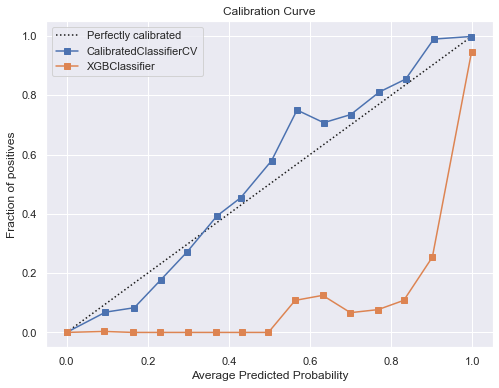

In [13]:
# defines number of bins
BINS = 15

# predicts probabilities
cat_model_probs = cat.predict_proba(X_test)
calibrated_cat_probs = calibrated_cat.predict_proba(X_test)


# plots a calibration curve for each model
gu.plot_multiple_calibration_curves([calibrated_cat, cat], y_test, 
                                 [calibrated_cat_probs, cat_model_probs], BINS)

# displays the plot
plt.show()

Visually speaking, the calibrated model seems to be better. However, we need to check a metric that will give us a number: Brier Score Loss.

Recommended reading: https://scikit-learn.org/stable/modules/generated/sklearn.metrics.brier_score_loss.html

In [16]:
# calculates the Brier Score Loss
bsl_xgb_model = brier_score_loss(y_test, xgb_tuned_model_probs[:,1], pos_label=1)
bsl_xgb_calibrated = brier_score_loss(y_test, calibrated_xgb_probs[:,1], pos_label=1)

# prints the calculated the Brier Score Loss for each algorithm probability
print(f'Brier Score Loss (CatBoost Classifier (Tunned HP)): {bsl_xgb_model}')
print(f'Brier Score Loss (CatBoost Classifier (Tunned HP + Calibrated)): {bsl_xgb_calibrated}')

# checks which one has better calibration
if bsl_xgb_calibrated < bsl_xgb_model:
    print('\nCalibrated model has better calibration.')
else:
    print('\nUncalibrated model has better calibration.')

Brier Score Loss (CatBoost Classifier (Tunned HP)): 0.0010050315849195106
Brier Score Loss (CatBoost Classifier (Tunned HP + Calibrated)): 0.0004648310742883791

Calibrated model has better calibration.


In [489]:
pd.DataFrame(y_hat).value_counts()

0    22785
1     3923
dtype: int64

In [506]:
df_deliver = pd.DataFrame(df_testing_features, columns=['respondent_id'])
df_deliver['h1n1_vaccine'] = pd.DataFrame(calibrated_cat.predict_proba(X_test)[:,1])
df_deliver

,respondent_id,h1n1_vaccine
0,26707,0.147445
1,26708,0.018422
2,26709,0.128107
3,26710,0.348574
4,26711,0.165566
...,...,...
26703,53410,0.174356
26704,53411,0.098272
26705,53412,0.160471
26706,53413,0.039892


### Prediction for 'seasonal' with CatBoost

In [508]:
X_train = df7_seasonal.drop(['seasonal'], axis=1).values
y_train = df7_seasonal['seasonal'].values

In [509]:
X_test = df_test[['h1n1_concern', 'h1n1_knowledge', 'behavioral_antiviral_meds',
       'behavioral_avoidance', 'behavioral_face_mask', 'behavioral_wash_hands',
       'behavioral_large_gatherings', 'behavioral_outside_home',
       'behavioral_touch_face', 'doctor_recc_h1n1', 'doctor_recc_seasonal',
       'chronic_med_condition', 'child_under_6_months', 'health_worker',
       'health_insurance', 'opinion_h1n1_vacc_effective', 'opinion_h1n1_risk',
       'opinion_h1n1_sick_from_vacc', 'opinion_seas_vacc_effective',
       'opinion_seas_risk', 'opinion_seas_sick_from_vacc', 'household_adults',
       'household_children', 'general_h1n1', 'behaviour_general',
       'details_general', 'opinion_general', 'h1n1_x_behaviour',
       'h1n1_x_details', 'h1n1_x_opinion', 'details_x_behaviour',
       'details_x_opinion', 'opinion_x_details', 'age_group_18 - 34 Years',
       'age_group_35 - 44 Years', 'age_group_45 - 54 Years',
       'age_group_55 - 64 Years', 'age_group_65+ Years', 'education_12 Years',
       'education_< 12 Years', 'education_College Graduate',
       'education_Some College', 'race_Black', 'race_Hispanic',
       'race_Other or Multiple', 'race_White', 'sex_Female', 'sex_Male',
       'income_poverty_<= $75,000, Above Poverty', 'marital_status_Married',
       'marital_status_Not Married', 'rent_or_own_Own', 'rent_or_own_Rent',
       'employment_status_Employed', 'employment_status_Not in Labor Force',
       'employment_status_Unemployed', 'hhs_geo_region_atmpeygn',
       'hhs_geo_region_bhuqouqj', 'hhs_geo_region_dqpwygqj',
       'hhs_geo_region_fpwskwrf', 'hhs_geo_region_kbazzjca',
       'hhs_geo_region_lrircsnp', 'hhs_geo_region_lzgpxyit',
       'hhs_geo_region_mlyzmhmf', 'hhs_geo_region_oxchjgsf',
       'hhs_geo_region_qufhixun', 'census_msa_MSA, Not Principle  City',
       'census_msa_MSA, Principle City', 'census_msa_Non-MSA']].copy()

In [510]:
# model
cat = CatBoostClassifier()

# train
cat.fit(X_train, y_train)

# predict
y_hat = cat.predict(X_test)
y_hat

Learning rate set to 0.038076
0:	learn: 0.6737258	total: 51.1ms	remaining: 51s
1:	learn: 0.6551364	total: 76.3ms	remaining: 38.1s
2:	learn: 0.6394288	total: 96.1ms	remaining: 31.9s
3:	learn: 0.6245571	total: 126ms	remaining: 31.3s
4:	learn: 0.6103489	total: 136ms	remaining: 27.1s
5:	learn: 0.5979381	total: 149ms	remaining: 24.6s
6:	learn: 0.5869260	total: 161ms	remaining: 22.8s
7:	learn: 0.5766975	total: 173ms	remaining: 21.5s
8:	learn: 0.5678829	total: 190ms	remaining: 20.9s
9:	learn: 0.5593508	total: 240ms	remaining: 23.8s
10:	learn: 0.5508391	total: 260ms	remaining: 23.4s
11:	learn: 0.5437606	total: 277ms	remaining: 22.8s
12:	learn: 0.5366230	total: 312ms	remaining: 23.7s
13:	learn: 0.5307121	total: 343ms	remaining: 24.1s
14:	learn: 0.5251740	total: 357ms	remaining: 23.4s
15:	learn: 0.5191580	total: 392ms	remaining: 24.1s
16:	learn: 0.5143267	total: 410ms	remaining: 23.7s
17:	learn: 0.5099180	total: 422ms	remaining: 23s
18:	learn: 0.5054640	total: 434ms	remaining: 22.4s
19:	learn: 0

173:	learn: 0.4063153	total: 3.17s	remaining: 15s
174:	learn: 0.4061877	total: 3.18s	remaining: 15s
175:	learn: 0.4060835	total: 3.19s	remaining: 15s
176:	learn: 0.4058806	total: 3.21s	remaining: 14.9s
177:	learn: 0.4057299	total: 3.22s	remaining: 14.9s
178:	learn: 0.4055662	total: 3.23s	remaining: 14.8s
179:	learn: 0.4053903	total: 3.24s	remaining: 14.8s
180:	learn: 0.4051919	total: 3.25s	remaining: 14.7s
181:	learn: 0.4050281	total: 3.26s	remaining: 14.6s
182:	learn: 0.4048162	total: 3.27s	remaining: 14.6s
183:	learn: 0.4046510	total: 3.28s	remaining: 14.5s
184:	learn: 0.4044882	total: 3.29s	remaining: 14.5s
185:	learn: 0.4043448	total: 3.29s	remaining: 14.4s
186:	learn: 0.4042138	total: 3.3s	remaining: 14.4s
187:	learn: 0.4040207	total: 3.31s	remaining: 14.3s
188:	learn: 0.4038037	total: 3.32s	remaining: 14.3s
189:	learn: 0.4036768	total: 3.33s	remaining: 14.2s
190:	learn: 0.4035601	total: 3.35s	remaining: 14.2s
191:	learn: 0.4034340	total: 3.38s	remaining: 14.2s
192:	learn: 0.40330

341:	learn: 0.3822735	total: 5.98s	remaining: 11.5s
342:	learn: 0.3821955	total: 5.99s	remaining: 11.5s
343:	learn: 0.3820706	total: 6.05s	remaining: 11.5s
344:	learn: 0.3818872	total: 6.1s	remaining: 11.6s
345:	learn: 0.3817728	total: 6.12s	remaining: 11.6s
346:	learn: 0.3816587	total: 6.14s	remaining: 11.6s
347:	learn: 0.3815601	total: 6.17s	remaining: 11.6s
348:	learn: 0.3813769	total: 6.18s	remaining: 11.5s
349:	learn: 0.3812323	total: 6.19s	remaining: 11.5s
350:	learn: 0.3810709	total: 6.21s	remaining: 11.5s
351:	learn: 0.3808893	total: 6.23s	remaining: 11.5s
352:	learn: 0.3807379	total: 6.24s	remaining: 11.4s
353:	learn: 0.3805559	total: 6.25s	remaining: 11.4s
354:	learn: 0.3804263	total: 6.26s	remaining: 11.4s
355:	learn: 0.3802888	total: 6.27s	remaining: 11.3s
356:	learn: 0.3801932	total: 6.28s	remaining: 11.3s
357:	learn: 0.3800574	total: 6.29s	remaining: 11.3s
358:	learn: 0.3799202	total: 6.3s	remaining: 11.2s
359:	learn: 0.3797597	total: 6.31s	remaining: 11.2s
360:	learn: 0.

502:	learn: 0.3622709	total: 8.32s	remaining: 8.22s
503:	learn: 0.3621807	total: 8.34s	remaining: 8.2s
504:	learn: 0.3621020	total: 8.35s	remaining: 8.18s
505:	learn: 0.3619943	total: 8.36s	remaining: 8.16s
506:	learn: 0.3618760	total: 8.37s	remaining: 8.14s
507:	learn: 0.3617518	total: 8.38s	remaining: 8.12s
508:	learn: 0.3616550	total: 8.39s	remaining: 8.09s
509:	learn: 0.3615664	total: 8.4s	remaining: 8.07s
510:	learn: 0.3614423	total: 8.41s	remaining: 8.05s
511:	learn: 0.3613255	total: 8.42s	remaining: 8.02s
512:	learn: 0.3612070	total: 8.43s	remaining: 8s
513:	learn: 0.3611272	total: 8.43s	remaining: 7.97s
514:	learn: 0.3609979	total: 8.44s	remaining: 7.95s
515:	learn: 0.3608823	total: 8.45s	remaining: 7.93s
516:	learn: 0.3607525	total: 8.46s	remaining: 7.9s
517:	learn: 0.3606172	total: 8.47s	remaining: 7.88s
518:	learn: 0.3604923	total: 8.48s	remaining: 7.86s
519:	learn: 0.3604099	total: 8.49s	remaining: 7.83s
520:	learn: 0.3602592	total: 8.5s	remaining: 7.81s
521:	learn: 0.36010

667:	learn: 0.3454412	total: 11.4s	remaining: 5.68s
668:	learn: 0.3453151	total: 11.5s	remaining: 5.67s
669:	learn: 0.3451701	total: 11.5s	remaining: 5.66s
670:	learn: 0.3451053	total: 11.5s	remaining: 5.65s
671:	learn: 0.3450474	total: 11.5s	remaining: 5.63s
672:	learn: 0.3449628	total: 11.6s	remaining: 5.62s
673:	learn: 0.3448947	total: 11.6s	remaining: 5.61s
674:	learn: 0.3448123	total: 11.7s	remaining: 5.61s
675:	learn: 0.3447286	total: 11.7s	remaining: 5.59s
676:	learn: 0.3445897	total: 11.7s	remaining: 5.59s
677:	learn: 0.3445030	total: 11.8s	remaining: 5.58s
678:	learn: 0.3444387	total: 11.8s	remaining: 5.57s
679:	learn: 0.3443590	total: 11.8s	remaining: 5.56s
680:	learn: 0.3442631	total: 11.8s	remaining: 5.54s
681:	learn: 0.3442158	total: 11.9s	remaining: 5.53s
682:	learn: 0.3441283	total: 11.9s	remaining: 5.51s
683:	learn: 0.3440435	total: 11.9s	remaining: 5.49s
684:	learn: 0.3439592	total: 11.9s	remaining: 5.47s
685:	learn: 0.3438421	total: 11.9s	remaining: 5.45s
686:	learn: 

828:	learn: 0.3311179	total: 13.5s	remaining: 2.79s
829:	learn: 0.3310514	total: 13.6s	remaining: 2.77s
830:	learn: 0.3309577	total: 13.6s	remaining: 2.76s
831:	learn: 0.3308758	total: 13.6s	remaining: 2.74s
832:	learn: 0.3308310	total: 13.6s	remaining: 2.73s
833:	learn: 0.3307719	total: 13.6s	remaining: 2.71s
834:	learn: 0.3306513	total: 13.6s	remaining: 2.69s
835:	learn: 0.3305541	total: 13.6s	remaining: 2.67s
836:	learn: 0.3304341	total: 13.6s	remaining: 2.65s
837:	learn: 0.3303342	total: 13.6s	remaining: 2.64s
838:	learn: 0.3302599	total: 13.7s	remaining: 2.62s
839:	learn: 0.3301422	total: 13.7s	remaining: 2.6s
840:	learn: 0.3300436	total: 13.7s	remaining: 2.58s
841:	learn: 0.3298989	total: 13.7s	remaining: 2.57s
842:	learn: 0.3298195	total: 13.7s	remaining: 2.55s
843:	learn: 0.3297432	total: 13.7s	remaining: 2.53s
844:	learn: 0.3296606	total: 13.7s	remaining: 2.51s
845:	learn: 0.3295807	total: 13.7s	remaining: 2.5s
846:	learn: 0.3294951	total: 13.7s	remaining: 2.48s
847:	learn: 0.

996:	learn: 0.3181183	total: 15.5s	remaining: 46.6ms
997:	learn: 0.3180450	total: 15.5s	remaining: 31.1ms
998:	learn: 0.3179635	total: 15.5s	remaining: 15.5ms
999:	learn: 0.3179007	total: 15.5s	remaining: 0us


array(['0', '0', '1', ..., '0', '0', '1'], dtype=object)

### Calibration 'seasonal'

In [511]:
# defines the cross validation strategy
cv = StratifiedKFold(n_splits=10)

In [512]:
# trains the tunned model
cat.fit(X_train, y_train)

# defines and fits calibration model
calibrated_cat_seasonal = CalibratedClassifierCV(cat, method='isotonic', cv=cv)
calibrated_cat_seasonal.fit(X_train, y_train)

Learning rate set to 0.038076
0:	learn: 0.6737258	total: 21.2ms	remaining: 21.2s
1:	learn: 0.6551364	total: 35.1ms	remaining: 17.5s
2:	learn: 0.6394288	total: 67.9ms	remaining: 22.6s
3:	learn: 0.6245571	total: 87.7ms	remaining: 21.8s
4:	learn: 0.6103489	total: 126ms	remaining: 25.1s
5:	learn: 0.5979381	total: 144ms	remaining: 23.8s
6:	learn: 0.5869260	total: 156ms	remaining: 22.2s
7:	learn: 0.5766975	total: 168ms	remaining: 20.8s
8:	learn: 0.5678829	total: 199ms	remaining: 21.9s
9:	learn: 0.5593508	total: 220ms	remaining: 21.7s
10:	learn: 0.5508391	total: 235ms	remaining: 21.1s
11:	learn: 0.5437606	total: 255ms	remaining: 21s
12:	learn: 0.5366230	total: 271ms	remaining: 20.6s
13:	learn: 0.5307121	total: 287ms	remaining: 20.2s
14:	learn: 0.5251740	total: 305ms	remaining: 20s
15:	learn: 0.5191580	total: 317ms	remaining: 19.5s
16:	learn: 0.5143267	total: 326ms	remaining: 18.8s
17:	learn: 0.5099180	total: 338ms	remaining: 18.4s
18:	learn: 0.5054640	total: 351ms	remaining: 18.1s
19:	learn: 

162:	learn: 0.4081510	total: 2.49s	remaining: 12.8s
163:	learn: 0.4080085	total: 2.51s	remaining: 12.8s
164:	learn: 0.4077855	total: 2.53s	remaining: 12.8s
165:	learn: 0.4076628	total: 2.54s	remaining: 12.8s
166:	learn: 0.4074892	total: 2.55s	remaining: 12.7s
167:	learn: 0.4073813	total: 2.57s	remaining: 12.7s
168:	learn: 0.4072042	total: 2.59s	remaining: 12.7s
169:	learn: 0.4070545	total: 2.63s	remaining: 12.9s
170:	learn: 0.4067936	total: 2.69s	remaining: 13s
171:	learn: 0.4066091	total: 2.71s	remaining: 13.1s
172:	learn: 0.4064477	total: 2.72s	remaining: 13s
173:	learn: 0.4063153	total: 2.74s	remaining: 13s
174:	learn: 0.4061877	total: 2.75s	remaining: 13s
175:	learn: 0.4060835	total: 2.77s	remaining: 13s
176:	learn: 0.4058806	total: 2.8s	remaining: 13s
177:	learn: 0.4057299	total: 2.83s	remaining: 13.1s
178:	learn: 0.4055662	total: 2.85s	remaining: 13.1s
179:	learn: 0.4053903	total: 2.87s	remaining: 13.1s
180:	learn: 0.4051919	total: 2.9s	remaining: 13.1s
181:	learn: 0.4050281	tota

322:	learn: 0.3852438	total: 5.4s	remaining: 11.3s
323:	learn: 0.3851321	total: 5.43s	remaining: 11.3s
324:	learn: 0.3849599	total: 5.44s	remaining: 11.3s
325:	learn: 0.3848527	total: 5.46s	remaining: 11.3s
326:	learn: 0.3847045	total: 5.47s	remaining: 11.3s
327:	learn: 0.3845488	total: 5.48s	remaining: 11.2s
328:	learn: 0.3843894	total: 5.49s	remaining: 11.2s
329:	learn: 0.3842122	total: 5.5s	remaining: 11.2s
330:	learn: 0.3840341	total: 5.51s	remaining: 11.1s
331:	learn: 0.3839221	total: 5.52s	remaining: 11.1s
332:	learn: 0.3837735	total: 5.54s	remaining: 11.1s
333:	learn: 0.3836340	total: 5.55s	remaining: 11.1s
334:	learn: 0.3834756	total: 5.56s	remaining: 11s
335:	learn: 0.3833222	total: 5.57s	remaining: 11s
336:	learn: 0.3831321	total: 5.58s	remaining: 11s
337:	learn: 0.3829887	total: 5.59s	remaining: 10.9s
338:	learn: 0.3828038	total: 5.61s	remaining: 10.9s
339:	learn: 0.3826369	total: 5.62s	remaining: 10.9s
340:	learn: 0.3824468	total: 5.63s	remaining: 10.9s
341:	learn: 0.382273

486:	learn: 0.3642669	total: 7.83s	remaining: 8.24s
487:	learn: 0.3641469	total: 7.85s	remaining: 8.24s
488:	learn: 0.3640013	total: 7.88s	remaining: 8.23s
489:	learn: 0.3638776	total: 7.89s	remaining: 8.22s
490:	learn: 0.3637454	total: 7.92s	remaining: 8.21s
491:	learn: 0.3635847	total: 8s	remaining: 8.26s
492:	learn: 0.3634408	total: 8.02s	remaining: 8.24s
493:	learn: 0.3633191	total: 8.03s	remaining: 8.23s
494:	learn: 0.3631891	total: 8.05s	remaining: 8.21s
495:	learn: 0.3630514	total: 8.08s	remaining: 8.21s
496:	learn: 0.3629638	total: 8.09s	remaining: 8.19s
497:	learn: 0.3628690	total: 8.11s	remaining: 8.17s
498:	learn: 0.3627419	total: 8.13s	remaining: 8.16s
499:	learn: 0.3626615	total: 8.16s	remaining: 8.16s
500:	learn: 0.3625372	total: 8.19s	remaining: 8.15s
501:	learn: 0.3624152	total: 8.24s	remaining: 8.17s
502:	learn: 0.3622709	total: 8.26s	remaining: 8.16s
503:	learn: 0.3621807	total: 8.29s	remaining: 8.15s
504:	learn: 0.3621020	total: 8.3s	remaining: 8.14s
505:	learn: 0.36

649:	learn: 0.3471198	total: 10.5s	remaining: 5.68s
650:	learn: 0.3470374	total: 10.6s	remaining: 5.66s
651:	learn: 0.3468988	total: 10.6s	remaining: 5.64s
652:	learn: 0.3468294	total: 10.6s	remaining: 5.63s
653:	learn: 0.3467601	total: 10.6s	remaining: 5.61s
654:	learn: 0.3466438	total: 10.6s	remaining: 5.61s
655:	learn: 0.3465585	total: 10.7s	remaining: 5.59s
656:	learn: 0.3464655	total: 10.7s	remaining: 5.58s
657:	learn: 0.3463607	total: 10.8s	remaining: 5.59s
658:	learn: 0.3462865	total: 10.8s	remaining: 5.57s
659:	learn: 0.3461749	total: 10.8s	remaining: 5.55s
660:	learn: 0.3460971	total: 10.8s	remaining: 5.53s
661:	learn: 0.3460199	total: 10.8s	remaining: 5.51s
662:	learn: 0.3459522	total: 10.8s	remaining: 5.49s
663:	learn: 0.3458227	total: 10.8s	remaining: 5.47s
664:	learn: 0.3457255	total: 10.8s	remaining: 5.45s
665:	learn: 0.3456525	total: 10.8s	remaining: 5.43s
666:	learn: 0.3455862	total: 10.8s	remaining: 5.41s
667:	learn: 0.3454412	total: 10.9s	remaining: 5.4s
668:	learn: 0

808:	learn: 0.3328360	total: 13.6s	remaining: 3.21s
809:	learn: 0.3327113	total: 13.6s	remaining: 3.19s
810:	learn: 0.3326033	total: 13.6s	remaining: 3.17s
811:	learn: 0.3325450	total: 13.6s	remaining: 3.15s
812:	learn: 0.3325003	total: 13.6s	remaining: 3.14s
813:	learn: 0.3323775	total: 13.7s	remaining: 3.12s
814:	learn: 0.3322751	total: 13.7s	remaining: 3.1s
815:	learn: 0.3321930	total: 13.7s	remaining: 3.08s
816:	learn: 0.3321098	total: 13.7s	remaining: 3.07s
817:	learn: 0.3320332	total: 13.7s	remaining: 3.05s
818:	learn: 0.3319389	total: 13.7s	remaining: 3.03s
819:	learn: 0.3318470	total: 13.7s	remaining: 3.01s
820:	learn: 0.3317721	total: 13.7s	remaining: 2.99s
821:	learn: 0.3316722	total: 13.7s	remaining: 2.98s
822:	learn: 0.3315852	total: 13.8s	remaining: 2.96s
823:	learn: 0.3314752	total: 13.8s	remaining: 2.94s
824:	learn: 0.3314040	total: 13.8s	remaining: 2.92s
825:	learn: 0.3313497	total: 13.8s	remaining: 2.91s
826:	learn: 0.3312586	total: 13.9s	remaining: 2.9s
827:	learn: 0.

975:	learn: 0.3195325	total: 16.1s	remaining: 397ms
976:	learn: 0.3194467	total: 16.1s	remaining: 380ms
977:	learn: 0.3193915	total: 16.1s	remaining: 363ms
978:	learn: 0.3193061	total: 16.2s	remaining: 347ms
979:	learn: 0.3192462	total: 16.2s	remaining: 330ms
980:	learn: 0.3191543	total: 16.2s	remaining: 313ms
981:	learn: 0.3190341	total: 16.2s	remaining: 297ms
982:	learn: 0.3190039	total: 16.2s	remaining: 281ms
983:	learn: 0.3189043	total: 16.3s	remaining: 264ms
984:	learn: 0.3188409	total: 16.3s	remaining: 248ms
985:	learn: 0.3187572	total: 16.3s	remaining: 231ms
986:	learn: 0.3186506	total: 16.3s	remaining: 215ms
987:	learn: 0.3185905	total: 16.3s	remaining: 198ms
988:	learn: 0.3185204	total: 16.4s	remaining: 182ms
989:	learn: 0.3184661	total: 16.4s	remaining: 165ms
990:	learn: 0.3184407	total: 16.4s	remaining: 149ms
991:	learn: 0.3184091	total: 16.4s	remaining: 132ms
992:	learn: 0.3183774	total: 16.4s	remaining: 116ms
993:	learn: 0.3182964	total: 16.4s	remaining: 99.1ms
994:	learn:

141:	learn: 0.4106910	total: 1.88s	remaining: 11.4s
142:	learn: 0.4104423	total: 1.95s	remaining: 11.7s
143:	learn: 0.4101941	total: 1.97s	remaining: 11.7s
144:	learn: 0.4099762	total: 2s	remaining: 11.8s
145:	learn: 0.4097963	total: 2.02s	remaining: 11.8s
146:	learn: 0.4096232	total: 2.03s	remaining: 11.8s
147:	learn: 0.4094034	total: 2.04s	remaining: 11.7s
148:	learn: 0.4091890	total: 2.05s	remaining: 11.7s
149:	learn: 0.4089237	total: 2.06s	remaining: 11.6s
150:	learn: 0.4087404	total: 2.06s	remaining: 11.6s
151:	learn: 0.4085453	total: 2.08s	remaining: 11.6s
152:	learn: 0.4083891	total: 2.09s	remaining: 11.6s
153:	learn: 0.4082440	total: 2.1s	remaining: 11.6s
154:	learn: 0.4080618	total: 2.11s	remaining: 11.5s
155:	learn: 0.4078638	total: 2.13s	remaining: 11.5s
156:	learn: 0.4076584	total: 2.14s	remaining: 11.5s
157:	learn: 0.4074986	total: 2.14s	remaining: 11.4s
158:	learn: 0.4072863	total: 2.15s	remaining: 11.4s
159:	learn: 0.4070448	total: 2.16s	remaining: 11.3s
160:	learn: 0.40

302:	learn: 0.3858287	total: 5.3s	remaining: 12.2s
303:	learn: 0.3856263	total: 5.33s	remaining: 12.2s
304:	learn: 0.3854662	total: 5.42s	remaining: 12.4s
305:	learn: 0.3853199	total: 5.44s	remaining: 12.3s
306:	learn: 0.3851647	total: 5.45s	remaining: 12.3s
307:	learn: 0.3850450	total: 5.46s	remaining: 12.3s
308:	learn: 0.3848484	total: 5.47s	remaining: 12.2s
309:	learn: 0.3846651	total: 5.49s	remaining: 12.2s
310:	learn: 0.3845444	total: 5.5s	remaining: 12.2s
311:	learn: 0.3843651	total: 5.52s	remaining: 12.2s
312:	learn: 0.3842840	total: 5.53s	remaining: 12.1s
313:	learn: 0.3840902	total: 5.54s	remaining: 12.1s
314:	learn: 0.3839149	total: 5.56s	remaining: 12.1s
315:	learn: 0.3837764	total: 5.57s	remaining: 12.1s
316:	learn: 0.3835842	total: 5.59s	remaining: 12s
317:	learn: 0.3834074	total: 5.61s	remaining: 12s
318:	learn: 0.3832813	total: 5.62s	remaining: 12s
319:	learn: 0.3831347	total: 5.63s	remaining: 12s
320:	learn: 0.3829152	total: 5.64s	remaining: 11.9s
321:	learn: 0.3827285	

468:	learn: 0.3622964	total: 8.32s	remaining: 9.42s
469:	learn: 0.3621598	total: 8.34s	remaining: 9.4s
470:	learn: 0.3619980	total: 8.36s	remaining: 9.39s
471:	learn: 0.3618603	total: 8.39s	remaining: 9.39s
472:	learn: 0.3617488	total: 8.4s	remaining: 9.36s
473:	learn: 0.3615980	total: 8.41s	remaining: 9.34s
474:	learn: 0.3614298	total: 8.42s	remaining: 9.31s
475:	learn: 0.3613104	total: 8.43s	remaining: 9.28s
476:	learn: 0.3611987	total: 8.44s	remaining: 9.26s
477:	learn: 0.3610430	total: 8.45s	remaining: 9.23s
478:	learn: 0.3609230	total: 8.46s	remaining: 9.2s
479:	learn: 0.3607844	total: 8.47s	remaining: 9.17s
480:	learn: 0.3606848	total: 8.47s	remaining: 9.14s
481:	learn: 0.3605485	total: 8.48s	remaining: 9.12s
482:	learn: 0.3604188	total: 8.49s	remaining: 9.09s
483:	learn: 0.3603152	total: 8.5s	remaining: 9.06s
484:	learn: 0.3601760	total: 8.52s	remaining: 9.04s
485:	learn: 0.3600250	total: 8.53s	remaining: 9.02s
486:	learn: 0.3599113	total: 8.54s	remaining: 8.99s
487:	learn: 0.35

628:	learn: 0.3444793	total: 10.2s	remaining: 6.01s
629:	learn: 0.3443471	total: 10.2s	remaining: 6s
630:	learn: 0.3442446	total: 10.2s	remaining: 5.97s
631:	learn: 0.3441679	total: 10.2s	remaining: 5.96s
632:	learn: 0.3440810	total: 10.2s	remaining: 5.94s
633:	learn: 0.3439953	total: 10.3s	remaining: 5.92s
634:	learn: 0.3438658	total: 10.3s	remaining: 5.9s
635:	learn: 0.3437896	total: 10.3s	remaining: 5.88s
636:	learn: 0.3436967	total: 10.3s	remaining: 5.86s
637:	learn: 0.3435988	total: 10.3s	remaining: 5.84s
638:	learn: 0.3434974	total: 10.3s	remaining: 5.82s
639:	learn: 0.3433813	total: 10.3s	remaining: 5.79s
640:	learn: 0.3432409	total: 10.3s	remaining: 5.78s
641:	learn: 0.3431486	total: 10.3s	remaining: 5.75s
642:	learn: 0.3430731	total: 10.3s	remaining: 5.73s
643:	learn: 0.3430255	total: 10.3s	remaining: 5.71s
644:	learn: 0.3429622	total: 10.3s	remaining: 5.69s
645:	learn: 0.3428277	total: 10.4s	remaining: 5.67s
646:	learn: 0.3427180	total: 10.4s	remaining: 5.66s
647:	learn: 0.34

792:	learn: 0.3292225	total: 14s	remaining: 3.65s
793:	learn: 0.3291602	total: 14s	remaining: 3.63s
794:	learn: 0.3290669	total: 14.1s	remaining: 3.62s
795:	learn: 0.3289420	total: 14.1s	remaining: 3.61s
796:	learn: 0.3288411	total: 14.1s	remaining: 3.6s
797:	learn: 0.3287702	total: 14.2s	remaining: 3.58s
798:	learn: 0.3286443	total: 14.2s	remaining: 3.57s
799:	learn: 0.3285671	total: 14.2s	remaining: 3.56s
800:	learn: 0.3284716	total: 14.3s	remaining: 3.54s
801:	learn: 0.3283869	total: 14.3s	remaining: 3.53s
802:	learn: 0.3282850	total: 14.3s	remaining: 3.51s
803:	learn: 0.3282059	total: 14.3s	remaining: 3.49s
804:	learn: 0.3281431	total: 14.4s	remaining: 3.48s
805:	learn: 0.3280201	total: 14.4s	remaining: 3.46s
806:	learn: 0.3278926	total: 14.4s	remaining: 3.45s
807:	learn: 0.3277857	total: 14.4s	remaining: 3.43s
808:	learn: 0.3276925	total: 14.4s	remaining: 3.41s
809:	learn: 0.3276211	total: 14.5s	remaining: 3.39s
810:	learn: 0.3275257	total: 14.5s	remaining: 3.38s
811:	learn: 0.327

964:	learn: 0.3146434	total: 16.9s	remaining: 613ms
965:	learn: 0.3145551	total: 16.9s	remaining: 596ms
966:	learn: 0.3145158	total: 16.9s	remaining: 578ms
967:	learn: 0.3144373	total: 16.9s	remaining: 560ms
968:	learn: 0.3143265	total: 17s	remaining: 543ms
969:	learn: 0.3142606	total: 17s	remaining: 525ms
970:	learn: 0.3141380	total: 17s	remaining: 507ms
971:	learn: 0.3140656	total: 17s	remaining: 490ms
972:	learn: 0.3140121	total: 17s	remaining: 472ms
973:	learn: 0.3139531	total: 17s	remaining: 455ms
974:	learn: 0.3138269	total: 17.1s	remaining: 438ms
975:	learn: 0.3137403	total: 17.2s	remaining: 422ms
976:	learn: 0.3136223	total: 17.2s	remaining: 404ms
977:	learn: 0.3135578	total: 17.2s	remaining: 387ms
978:	learn: 0.3134466	total: 17.2s	remaining: 369ms
979:	learn: 0.3133802	total: 17.2s	remaining: 351ms
980:	learn: 0.3133092	total: 17.2s	remaining: 334ms
981:	learn: 0.3132064	total: 17.2s	remaining: 316ms
982:	learn: 0.3131228	total: 17.2s	remaining: 298ms
983:	learn: 0.3130526	to

128:	learn: 0.4134081	total: 2.23s	remaining: 15s
129:	learn: 0.4131452	total: 2.24s	remaining: 15s
130:	learn: 0.4129118	total: 2.25s	remaining: 14.9s
131:	learn: 0.4127037	total: 2.26s	remaining: 14.9s
132:	learn: 0.4124761	total: 2.28s	remaining: 14.8s
133:	learn: 0.4122858	total: 2.29s	remaining: 14.8s
134:	learn: 0.4120917	total: 2.29s	remaining: 14.7s
135:	learn: 0.4118938	total: 2.3s	remaining: 14.6s
136:	learn: 0.4117207	total: 2.31s	remaining: 14.6s
137:	learn: 0.4114793	total: 2.32s	remaining: 14.5s
138:	learn: 0.4112849	total: 2.33s	remaining: 14.4s
139:	learn: 0.4111177	total: 2.34s	remaining: 14.4s
140:	learn: 0.4109743	total: 2.35s	remaining: 14.3s
141:	learn: 0.4107744	total: 2.35s	remaining: 14.2s
142:	learn: 0.4105635	total: 2.37s	remaining: 14.2s
143:	learn: 0.4104136	total: 2.38s	remaining: 14.1s
144:	learn: 0.4102819	total: 2.39s	remaining: 14.1s
145:	learn: 0.4101340	total: 2.4s	remaining: 14s
146:	learn: 0.4099412	total: 2.41s	remaining: 14s
147:	learn: 0.4098266	

290:	learn: 0.3880893	total: 5.43s	remaining: 13.2s
291:	learn: 0.3879313	total: 5.45s	remaining: 13.2s
292:	learn: 0.3878179	total: 5.46s	remaining: 13.2s
293:	learn: 0.3876961	total: 5.47s	remaining: 13.1s
294:	learn: 0.3876120	total: 5.5s	remaining: 13.2s
295:	learn: 0.3874259	total: 5.51s	remaining: 13.1s
296:	learn: 0.3872725	total: 5.52s	remaining: 13.1s
297:	learn: 0.3870693	total: 5.53s	remaining: 13s
298:	learn: 0.3869800	total: 5.54s	remaining: 13s
299:	learn: 0.3868504	total: 5.55s	remaining: 13s
300:	learn: 0.3867243	total: 5.56s	remaining: 12.9s
301:	learn: 0.3866042	total: 5.57s	remaining: 12.9s
302:	learn: 0.3864406	total: 5.58s	remaining: 12.8s
303:	learn: 0.3863375	total: 5.59s	remaining: 12.8s
304:	learn: 0.3861455	total: 5.61s	remaining: 12.8s
305:	learn: 0.3859830	total: 5.62s	remaining: 12.7s
306:	learn: 0.3858799	total: 5.63s	remaining: 12.7s
307:	learn: 0.3856997	total: 5.64s	remaining: 12.7s
308:	learn: 0.3855179	total: 5.66s	remaining: 12.6s
309:	learn: 0.38538

450:	learn: 0.3661962	total: 7.73s	remaining: 9.41s
451:	learn: 0.3660645	total: 7.75s	remaining: 9.4s
452:	learn: 0.3659324	total: 7.76s	remaining: 9.37s
453:	learn: 0.3658312	total: 7.78s	remaining: 9.36s
454:	learn: 0.3657461	total: 7.79s	remaining: 9.33s
455:	learn: 0.3656065	total: 7.8s	remaining: 9.31s
456:	learn: 0.3654868	total: 7.82s	remaining: 9.29s
457:	learn: 0.3653597	total: 7.83s	remaining: 9.26s
458:	learn: 0.3652769	total: 7.84s	remaining: 9.24s
459:	learn: 0.3651272	total: 7.85s	remaining: 9.22s
460:	learn: 0.3649796	total: 7.86s	remaining: 9.19s
461:	learn: 0.3648539	total: 7.87s	remaining: 9.16s
462:	learn: 0.3648110	total: 7.88s	remaining: 9.14s
463:	learn: 0.3646626	total: 7.89s	remaining: 9.11s
464:	learn: 0.3645642	total: 7.9s	remaining: 9.08s
465:	learn: 0.3644257	total: 7.92s	remaining: 9.08s
466:	learn: 0.3643019	total: 7.94s	remaining: 9.06s
467:	learn: 0.3642098	total: 7.95s	remaining: 9.04s
468:	learn: 0.3640978	total: 7.96s	remaining: 9.01s
469:	learn: 0.3

614:	learn: 0.3471742	total: 10.5s	remaining: 6.55s
615:	learn: 0.3470898	total: 10.5s	remaining: 6.53s
616:	learn: 0.3469710	total: 10.5s	remaining: 6.51s
617:	learn: 0.3468438	total: 10.5s	remaining: 6.49s
618:	learn: 0.3467593	total: 10.5s	remaining: 6.47s
619:	learn: 0.3466612	total: 10.5s	remaining: 6.45s
620:	learn: 0.3465752	total: 10.5s	remaining: 6.42s
621:	learn: 0.3465427	total: 10.5s	remaining: 6.4s
622:	learn: 0.3463798	total: 10.6s	remaining: 6.39s
623:	learn: 0.3462567	total: 10.6s	remaining: 6.37s
624:	learn: 0.3461634	total: 10.6s	remaining: 6.36s
625:	learn: 0.3460377	total: 10.6s	remaining: 6.34s
626:	learn: 0.3459036	total: 10.6s	remaining: 6.32s
627:	learn: 0.3458382	total: 10.7s	remaining: 6.33s
628:	learn: 0.3457282	total: 10.7s	remaining: 6.31s
629:	learn: 0.3456206	total: 10.7s	remaining: 6.28s
630:	learn: 0.3455436	total: 10.7s	remaining: 6.26s
631:	learn: 0.3454601	total: 10.7s	remaining: 6.24s
632:	learn: 0.3453281	total: 10.7s	remaining: 6.22s
633:	learn: 0

780:	learn: 0.3316943	total: 13.2s	remaining: 3.7s
781:	learn: 0.3315448	total: 13.3s	remaining: 3.7s
782:	learn: 0.3314908	total: 13.3s	remaining: 3.69s
783:	learn: 0.3314075	total: 13.3s	remaining: 3.67s
784:	learn: 0.3313311	total: 13.3s	remaining: 3.65s
785:	learn: 0.3312144	total: 13.3s	remaining: 3.63s
786:	learn: 0.3311032	total: 13.3s	remaining: 3.61s
787:	learn: 0.3309809	total: 13.4s	remaining: 3.59s
788:	learn: 0.3308728	total: 13.4s	remaining: 3.57s
789:	learn: 0.3307416	total: 13.4s	remaining: 3.55s
790:	learn: 0.3306211	total: 13.4s	remaining: 3.53s
791:	learn: 0.3305456	total: 13.4s	remaining: 3.52s
792:	learn: 0.3304777	total: 13.4s	remaining: 3.5s
793:	learn: 0.3303763	total: 13.4s	remaining: 3.48s
794:	learn: 0.3303032	total: 13.4s	remaining: 3.46s
795:	learn: 0.3302389	total: 13.4s	remaining: 3.44s
796:	learn: 0.3301273	total: 13.4s	remaining: 3.42s
797:	learn: 0.3300391	total: 13.5s	remaining: 3.41s
798:	learn: 0.3299273	total: 13.5s	remaining: 3.4s
799:	learn: 0.32

940:	learn: 0.3179103	total: 15.3s	remaining: 958ms
941:	learn: 0.3178343	total: 15.3s	remaining: 941ms
942:	learn: 0.3177863	total: 15.3s	remaining: 925ms
943:	learn: 0.3176826	total: 15.3s	remaining: 908ms
944:	learn: 0.3176129	total: 15.3s	remaining: 892ms
945:	learn: 0.3175071	total: 15.3s	remaining: 875ms
946:	learn: 0.3174284	total: 15.3s	remaining: 859ms
947:	learn: 0.3173624	total: 15.4s	remaining: 842ms
948:	learn: 0.3173216	total: 15.4s	remaining: 826ms
949:	learn: 0.3172423	total: 15.4s	remaining: 809ms
950:	learn: 0.3171863	total: 15.4s	remaining: 793ms
951:	learn: 0.3171207	total: 15.4s	remaining: 776ms
952:	learn: 0.3170113	total: 15.4s	remaining: 760ms
953:	learn: 0.3169449	total: 15.4s	remaining: 743ms
954:	learn: 0.3168876	total: 15.4s	remaining: 727ms
955:	learn: 0.3167897	total: 15.4s	remaining: 710ms
956:	learn: 0.3167120	total: 15.4s	remaining: 694ms
957:	learn: 0.3166824	total: 15.4s	remaining: 677ms
958:	learn: 0.3165805	total: 15.5s	remaining: 661ms
959:	learn: 

113:	learn: 0.4166011	total: 1.36s	remaining: 10.6s
114:	learn: 0.4163199	total: 1.37s	remaining: 10.5s
115:	learn: 0.4160927	total: 1.38s	remaining: 10.5s
116:	learn: 0.4158384	total: 1.39s	remaining: 10.5s
117:	learn: 0.4155421	total: 1.4s	remaining: 10.5s
118:	learn: 0.4153188	total: 1.41s	remaining: 10.4s
119:	learn: 0.4151047	total: 1.42s	remaining: 10.4s
120:	learn: 0.4147866	total: 1.43s	remaining: 10.4s
121:	learn: 0.4145097	total: 1.44s	remaining: 10.4s
122:	learn: 0.4142850	total: 1.45s	remaining: 10.3s
123:	learn: 0.4140190	total: 1.46s	remaining: 10.3s
124:	learn: 0.4138712	total: 1.47s	remaining: 10.3s
125:	learn: 0.4136406	total: 1.48s	remaining: 10.3s
126:	learn: 0.4133654	total: 1.49s	remaining: 10.3s
127:	learn: 0.4131894	total: 1.5s	remaining: 10.2s
128:	learn: 0.4130099	total: 1.51s	remaining: 10.2s
129:	learn: 0.4128454	total: 1.52s	remaining: 10.2s
130:	learn: 0.4126138	total: 1.53s	remaining: 10.2s
131:	learn: 0.4123618	total: 1.54s	remaining: 10.1s
132:	learn: 0.

277:	learn: 0.3889419	total: 3.41s	remaining: 8.85s
278:	learn: 0.3888314	total: 3.42s	remaining: 8.84s
279:	learn: 0.3887865	total: 3.43s	remaining: 8.83s
280:	learn: 0.3887198	total: 3.44s	remaining: 8.82s
281:	learn: 0.3885388	total: 3.46s	remaining: 8.81s
282:	learn: 0.3884401	total: 3.48s	remaining: 8.81s
283:	learn: 0.3882968	total: 3.49s	remaining: 8.8s
284:	learn: 0.3881547	total: 3.51s	remaining: 8.8s
285:	learn: 0.3880318	total: 3.52s	remaining: 8.79s
286:	learn: 0.3878938	total: 3.53s	remaining: 8.78s
287:	learn: 0.3877611	total: 3.55s	remaining: 8.77s
288:	learn: 0.3876425	total: 3.57s	remaining: 8.78s
289:	learn: 0.3874970	total: 3.58s	remaining: 8.77s
290:	learn: 0.3873932	total: 3.62s	remaining: 8.83s
291:	learn: 0.3872529	total: 3.65s	remaining: 8.85s
292:	learn: 0.3870948	total: 3.67s	remaining: 8.86s
293:	learn: 0.3869683	total: 3.7s	remaining: 8.89s
294:	learn: 0.3868363	total: 3.72s	remaining: 8.9s
295:	learn: 0.3866784	total: 3.75s	remaining: 8.91s
296:	learn: 0.38

439:	learn: 0.3667704	total: 8.13s	remaining: 10.4s
440:	learn: 0.3667081	total: 8.15s	remaining: 10.3s
441:	learn: 0.3665913	total: 8.16s	remaining: 10.3s
442:	learn: 0.3664397	total: 8.18s	remaining: 10.3s
443:	learn: 0.3662786	total: 8.21s	remaining: 10.3s
444:	learn: 0.3661270	total: 8.23s	remaining: 10.3s
445:	learn: 0.3660253	total: 8.25s	remaining: 10.2s
446:	learn: 0.3658746	total: 8.27s	remaining: 10.2s
447:	learn: 0.3657400	total: 8.29s	remaining: 10.2s
448:	learn: 0.3656264	total: 8.3s	remaining: 10.2s
449:	learn: 0.3655017	total: 8.31s	remaining: 10.2s
450:	learn: 0.3653773	total: 8.35s	remaining: 10.2s
451:	learn: 0.3652845	total: 8.36s	remaining: 10.1s
452:	learn: 0.3651496	total: 8.37s	remaining: 10.1s
453:	learn: 0.3650351	total: 8.38s	remaining: 10.1s
454:	learn: 0.3648934	total: 8.39s	remaining: 10.1s
455:	learn: 0.3647718	total: 8.41s	remaining: 10s
456:	learn: 0.3646691	total: 8.42s	remaining: 10s
457:	learn: 0.3645159	total: 8.42s	remaining: 9.97s
458:	learn: 0.364

603:	learn: 0.3483517	total: 11.2s	remaining: 7.35s
604:	learn: 0.3482269	total: 11.3s	remaining: 7.35s
605:	learn: 0.3481091	total: 11.3s	remaining: 7.34s
606:	learn: 0.3479895	total: 11.3s	remaining: 7.32s
607:	learn: 0.3478778	total: 11.3s	remaining: 7.3s
608:	learn: 0.3477444	total: 11.3s	remaining: 7.28s
609:	learn: 0.3476066	total: 11.3s	remaining: 7.25s
610:	learn: 0.3474620	total: 11.4s	remaining: 7.23s
611:	learn: 0.3473639	total: 11.4s	remaining: 7.21s
612:	learn: 0.3472173	total: 11.4s	remaining: 7.18s
613:	learn: 0.3470771	total: 11.4s	remaining: 7.16s
614:	learn: 0.3470052	total: 11.4s	remaining: 7.14s
615:	learn: 0.3469332	total: 11.4s	remaining: 7.13s
616:	learn: 0.3468276	total: 11.5s	remaining: 7.11s
617:	learn: 0.3467253	total: 11.5s	remaining: 7.09s
618:	learn: 0.3466293	total: 11.5s	remaining: 7.07s
619:	learn: 0.3465404	total: 11.5s	remaining: 7.04s
620:	learn: 0.3464385	total: 11.5s	remaining: 7.02s
621:	learn: 0.3463502	total: 11.5s	remaining: 7.01s
622:	learn: 0

770:	learn: 0.3319857	total: 13.9s	remaining: 4.14s
771:	learn: 0.3318963	total: 13.9s	remaining: 4.12s
772:	learn: 0.3318289	total: 14s	remaining: 4.1s
773:	learn: 0.3317429	total: 14s	remaining: 4.08s
774:	learn: 0.3316094	total: 14s	remaining: 4.06s
775:	learn: 0.3314992	total: 14s	remaining: 4.04s
776:	learn: 0.3314369	total: 14s	remaining: 4.02s
777:	learn: 0.3313496	total: 14s	remaining: 4s
778:	learn: 0.3312225	total: 14s	remaining: 3.98s
779:	learn: 0.3311494	total: 14s	remaining: 3.96s
780:	learn: 0.3310382	total: 14s	remaining: 3.93s
781:	learn: 0.3309795	total: 14s	remaining: 3.91s
782:	learn: 0.3308912	total: 14s	remaining: 3.89s
783:	learn: 0.3308564	total: 14.1s	remaining: 3.87s
784:	learn: 0.3307715	total: 14.1s	remaining: 3.85s
785:	learn: 0.3306349	total: 14.1s	remaining: 3.83s
786:	learn: 0.3305550	total: 14.1s	remaining: 3.81s
787:	learn: 0.3304307	total: 14.1s	remaining: 3.79s
788:	learn: 0.3303384	total: 14.1s	remaining: 3.77s
789:	learn: 0.3302855	total: 14.1s	rem

941:	learn: 0.3170257	total: 16s	remaining: 987ms
942:	learn: 0.3169205	total: 16s	remaining: 970ms
943:	learn: 0.3169111	total: 16.1s	remaining: 954ms
944:	learn: 0.3168265	total: 16.1s	remaining: 937ms
945:	learn: 0.3167623	total: 16.1s	remaining: 920ms
946:	learn: 0.3167111	total: 16.1s	remaining: 903ms
947:	learn: 0.3166585	total: 16.1s	remaining: 885ms
948:	learn: 0.3165718	total: 16.1s	remaining: 868ms
949:	learn: 0.3165502	total: 16.2s	remaining: 850ms
950:	learn: 0.3164751	total: 16.2s	remaining: 833ms
951:	learn: 0.3163904	total: 16.2s	remaining: 815ms
952:	learn: 0.3163312	total: 16.2s	remaining: 798ms
953:	learn: 0.3162608	total: 16.2s	remaining: 780ms
954:	learn: 0.3161901	total: 16.2s	remaining: 763ms
955:	learn: 0.3161286	total: 16.2s	remaining: 746ms
956:	learn: 0.3160264	total: 16.2s	remaining: 729ms
957:	learn: 0.3159184	total: 16.2s	remaining: 712ms
958:	learn: 0.3158368	total: 16.2s	remaining: 695ms
959:	learn: 0.3157360	total: 16.3s	remaining: 677ms
960:	learn: 0.31

106:	learn: 0.4212953	total: 1.26s	remaining: 10.5s
107:	learn: 0.4209998	total: 1.27s	remaining: 10.5s
108:	learn: 0.4207791	total: 1.28s	remaining: 10.5s
109:	learn: 0.4204534	total: 1.29s	remaining: 10.5s
110:	learn: 0.4201787	total: 1.3s	remaining: 10.4s
111:	learn: 0.4198847	total: 1.31s	remaining: 10.4s
112:	learn: 0.4196687	total: 1.32s	remaining: 10.4s
113:	learn: 0.4193807	total: 1.33s	remaining: 10.3s
114:	learn: 0.4191021	total: 1.34s	remaining: 10.3s
115:	learn: 0.4188465	total: 1.37s	remaining: 10.4s
116:	learn: 0.4185603	total: 1.39s	remaining: 10.5s
117:	learn: 0.4182872	total: 1.42s	remaining: 10.6s
118:	learn: 0.4180562	total: 1.49s	remaining: 11s
119:	learn: 0.4178201	total: 1.49s	remaining: 11s
120:	learn: 0.4176134	total: 1.5s	remaining: 10.9s
121:	learn: 0.4174742	total: 1.51s	remaining: 10.9s
122:	learn: 0.4173160	total: 1.52s	remaining: 10.8s
123:	learn: 0.4170602	total: 1.53s	remaining: 10.8s
124:	learn: 0.4168939	total: 1.54s	remaining: 10.8s
125:	learn: 0.4167

271:	learn: 0.3926880	total: 3.98s	remaining: 10.6s
272:	learn: 0.3925352	total: 4.02s	remaining: 10.7s
273:	learn: 0.3923935	total: 4.04s	remaining: 10.7s
274:	learn: 0.3922485	total: 4.05s	remaining: 10.7s
275:	learn: 0.3920468	total: 4.07s	remaining: 10.7s
276:	learn: 0.3918917	total: 4.08s	remaining: 10.6s
277:	learn: 0.3917483	total: 4.09s	remaining: 10.6s
278:	learn: 0.3916941	total: 4.1s	remaining: 10.6s
279:	learn: 0.3915883	total: 4.1s	remaining: 10.6s
280:	learn: 0.3913982	total: 4.11s	remaining: 10.5s
281:	learn: 0.3912414	total: 4.12s	remaining: 10.5s
282:	learn: 0.3910947	total: 4.13s	remaining: 10.5s
283:	learn: 0.3909510	total: 4.14s	remaining: 10.4s
284:	learn: 0.3908268	total: 4.16s	remaining: 10.4s
285:	learn: 0.3907096	total: 4.17s	remaining: 10.4s
286:	learn: 0.3905158	total: 4.19s	remaining: 10.4s
287:	learn: 0.3904067	total: 4.2s	remaining: 10.4s
288:	learn: 0.3901808	total: 4.21s	remaining: 10.4s
289:	learn: 0.3900888	total: 4.22s	remaining: 10.3s
290:	learn: 0.3

441:	learn: 0.3696371	total: 6.29s	remaining: 7.94s
442:	learn: 0.3694580	total: 6.33s	remaining: 7.96s
443:	learn: 0.3693182	total: 6.36s	remaining: 7.96s
444:	learn: 0.3691842	total: 6.38s	remaining: 7.95s
445:	learn: 0.3691163	total: 6.39s	remaining: 7.94s
446:	learn: 0.3690224	total: 6.41s	remaining: 7.92s
447:	learn: 0.3688848	total: 6.41s	remaining: 7.9s
448:	learn: 0.3688128	total: 6.42s	remaining: 7.88s
449:	learn: 0.3686606	total: 6.43s	remaining: 7.86s
450:	learn: 0.3685391	total: 6.44s	remaining: 7.84s
451:	learn: 0.3684068	total: 6.45s	remaining: 7.82s
452:	learn: 0.3682633	total: 6.46s	remaining: 7.8s
453:	learn: 0.3681317	total: 6.47s	remaining: 7.78s
454:	learn: 0.3679826	total: 6.48s	remaining: 7.76s
455:	learn: 0.3678963	total: 6.5s	remaining: 7.76s
456:	learn: 0.3678001	total: 6.52s	remaining: 7.74s
457:	learn: 0.3676585	total: 6.53s	remaining: 7.72s
458:	learn: 0.3675168	total: 6.53s	remaining: 7.7s
459:	learn: 0.3674075	total: 6.54s	remaining: 7.68s
460:	learn: 0.36

605:	learn: 0.3510377	total: 8.62s	remaining: 5.6s
606:	learn: 0.3509288	total: 8.66s	remaining: 5.61s
607:	learn: 0.3508571	total: 8.71s	remaining: 5.62s
608:	learn: 0.3507331	total: 8.72s	remaining: 5.6s
609:	learn: 0.3506333	total: 8.73s	remaining: 5.58s
610:	learn: 0.3504816	total: 8.74s	remaining: 5.56s
611:	learn: 0.3503833	total: 8.74s	remaining: 5.54s
612:	learn: 0.3503076	total: 8.75s	remaining: 5.53s
613:	learn: 0.3502028	total: 8.76s	remaining: 5.51s
614:	learn: 0.3501699	total: 8.77s	remaining: 5.49s
615:	learn: 0.3500815	total: 8.78s	remaining: 5.47s
616:	learn: 0.3499521	total: 8.79s	remaining: 5.45s
617:	learn: 0.3498270	total: 8.79s	remaining: 5.43s
618:	learn: 0.3497692	total: 8.81s	remaining: 5.42s
619:	learn: 0.3496865	total: 8.82s	remaining: 5.4s
620:	learn: 0.3496390	total: 8.83s	remaining: 5.39s
621:	learn: 0.3495284	total: 8.85s	remaining: 5.38s
622:	learn: 0.3493705	total: 8.86s	remaining: 5.36s
623:	learn: 0.3492727	total: 8.87s	remaining: 5.34s
624:	learn: 0.3

769:	learn: 0.3346282	total: 10.7s	remaining: 3.2s
770:	learn: 0.3345175	total: 10.7s	remaining: 3.18s
771:	learn: 0.3344556	total: 10.7s	remaining: 3.17s
772:	learn: 0.3343647	total: 10.7s	remaining: 3.16s
773:	learn: 0.3342271	total: 10.8s	remaining: 3.14s
774:	learn: 0.3341195	total: 10.8s	remaining: 3.13s
775:	learn: 0.3340280	total: 10.8s	remaining: 3.11s
776:	learn: 0.3339597	total: 10.8s	remaining: 3.1s
777:	learn: 0.3338414	total: 10.8s	remaining: 3.08s
778:	learn: 0.3337298	total: 10.8s	remaining: 3.07s
779:	learn: 0.3336076	total: 10.8s	remaining: 3.05s
780:	learn: 0.3335392	total: 10.8s	remaining: 3.04s
781:	learn: 0.3334692	total: 10.8s	remaining: 3.02s
782:	learn: 0.3334154	total: 10.8s	remaining: 3s
783:	learn: 0.3333358	total: 10.8s	remaining: 2.99s
784:	learn: 0.3332313	total: 10.9s	remaining: 2.97s
785:	learn: 0.3331141	total: 10.9s	remaining: 2.96s
786:	learn: 0.3330279	total: 10.9s	remaining: 2.94s
787:	learn: 0.3329127	total: 10.9s	remaining: 2.93s
788:	learn: 0.332

928:	learn: 0.3208395	total: 14.8s	remaining: 1.13s
929:	learn: 0.3207639	total: 14.8s	remaining: 1.11s
930:	learn: 0.3206550	total: 14.9s	remaining: 1.1s
931:	learn: 0.3205871	total: 14.9s	remaining: 1.09s
932:	learn: 0.3204910	total: 14.9s	remaining: 1.07s
933:	learn: 0.3204191	total: 14.9s	remaining: 1.05s
934:	learn: 0.3203138	total: 15s	remaining: 1.04s
935:	learn: 0.3202305	total: 15s	remaining: 1.03s
936:	learn: 0.3201791	total: 15s	remaining: 1.01s
937:	learn: 0.3200892	total: 15s	remaining: 995ms
938:	learn: 0.3199793	total: 15.1s	remaining: 978ms
939:	learn: 0.3198887	total: 15.1s	remaining: 962ms
940:	learn: 0.3198216	total: 15.1s	remaining: 946ms
941:	learn: 0.3196891	total: 15.1s	remaining: 929ms
942:	learn: 0.3195734	total: 15.1s	remaining: 913ms
943:	learn: 0.3195118	total: 15.1s	remaining: 896ms
944:	learn: 0.3194372	total: 15.1s	remaining: 880ms
945:	learn: 0.3193391	total: 15.1s	remaining: 864ms
946:	learn: 0.3193079	total: 15.1s	remaining: 847ms
947:	learn: 0.3192240

93:	learn: 0.4234310	total: 1.43s	remaining: 13.8s
94:	learn: 0.4231361	total: 1.51s	remaining: 14.4s
95:	learn: 0.4228692	total: 1.53s	remaining: 14.4s
96:	learn: 0.4225162	total: 1.55s	remaining: 14.4s
97:	learn: 0.4221616	total: 1.56s	remaining: 14.4s
98:	learn: 0.4218440	total: 1.57s	remaining: 14.3s
99:	learn: 0.4214949	total: 1.6s	remaining: 14.4s
100:	learn: 0.4212146	total: 1.61s	remaining: 14.4s
101:	learn: 0.4209547	total: 1.63s	remaining: 14.3s
102:	learn: 0.4206495	total: 1.65s	remaining: 14.4s
103:	learn: 0.4203523	total: 1.67s	remaining: 14.3s
104:	learn: 0.4201058	total: 1.7s	remaining: 14.5s
105:	learn: 0.4197676	total: 1.71s	remaining: 14.4s
106:	learn: 0.4194648	total: 1.72s	remaining: 14.3s
107:	learn: 0.4192330	total: 1.72s	remaining: 14.2s
108:	learn: 0.4189608	total: 1.73s	remaining: 14.2s
109:	learn: 0.4185865	total: 1.76s	remaining: 14.2s
110:	learn: 0.4181908	total: 1.78s	remaining: 14.3s
111:	learn: 0.4178685	total: 1.8s	remaining: 14.3s
112:	learn: 0.4176652	

252:	learn: 0.3944423	total: 4.51s	remaining: 13.3s
253:	learn: 0.3942674	total: 4.53s	remaining: 13.3s
254:	learn: 0.3941020	total: 4.54s	remaining: 13.3s
255:	learn: 0.3939359	total: 4.56s	remaining: 13.3s
256:	learn: 0.3938070	total: 4.58s	remaining: 13.2s
257:	learn: 0.3936260	total: 4.6s	remaining: 13.2s
258:	learn: 0.3935381	total: 4.62s	remaining: 13.2s
259:	learn: 0.3934085	total: 4.63s	remaining: 13.2s
260:	learn: 0.3932542	total: 4.64s	remaining: 13.1s
261:	learn: 0.3931027	total: 4.66s	remaining: 13.1s
262:	learn: 0.3930034	total: 4.67s	remaining: 13.1s
263:	learn: 0.3928139	total: 4.69s	remaining: 13.1s
264:	learn: 0.3927206	total: 4.71s	remaining: 13.1s
265:	learn: 0.3926249	total: 4.73s	remaining: 13s
266:	learn: 0.3924453	total: 4.75s	remaining: 13s
267:	learn: 0.3922936	total: 4.76s	remaining: 13s
268:	learn: 0.3921659	total: 4.78s	remaining: 13s
269:	learn: 0.3920509	total: 4.79s	remaining: 13s
270:	learn: 0.3919065	total: 4.81s	remaining: 12.9s
271:	learn: 0.3917709	t

415:	learn: 0.3710111	total: 8.18s	remaining: 11.5s
416:	learn: 0.3708589	total: 8.23s	remaining: 11.5s
417:	learn: 0.3707622	total: 8.24s	remaining: 11.5s
418:	learn: 0.3706089	total: 8.27s	remaining: 11.5s
419:	learn: 0.3704826	total: 8.29s	remaining: 11.4s
420:	learn: 0.3703542	total: 8.3s	remaining: 11.4s
421:	learn: 0.3702360	total: 8.33s	remaining: 11.4s
422:	learn: 0.3700946	total: 8.36s	remaining: 11.4s
423:	learn: 0.3699983	total: 8.38s	remaining: 11.4s
424:	learn: 0.3698925	total: 8.4s	remaining: 11.4s
425:	learn: 0.3697960	total: 8.44s	remaining: 11.4s
426:	learn: 0.3696660	total: 8.46s	remaining: 11.4s
427:	learn: 0.3695448	total: 8.52s	remaining: 11.4s
428:	learn: 0.3694140	total: 8.59s	remaining: 11.4s
429:	learn: 0.3692696	total: 8.61s	remaining: 11.4s
430:	learn: 0.3691559	total: 8.64s	remaining: 11.4s
431:	learn: 0.3690229	total: 8.7s	remaining: 11.4s
432:	learn: 0.3689026	total: 8.73s	remaining: 11.4s
433:	learn: 0.3687901	total: 8.76s	remaining: 11.4s
434:	learn: 0.3

583:	learn: 0.3515843	total: 12.2s	remaining: 8.7s
584:	learn: 0.3514969	total: 12.2s	remaining: 8.68s
585:	learn: 0.3514525	total: 12.3s	remaining: 8.68s
586:	learn: 0.3513701	total: 12.3s	remaining: 8.68s
587:	learn: 0.3512598	total: 12.4s	remaining: 8.67s
588:	learn: 0.3511272	total: 12.4s	remaining: 8.64s
589:	learn: 0.3510308	total: 12.4s	remaining: 8.62s
590:	learn: 0.3509468	total: 12.4s	remaining: 8.59s
591:	learn: 0.3508384	total: 12.4s	remaining: 8.56s
592:	learn: 0.3507839	total: 12.5s	remaining: 8.55s
593:	learn: 0.3506277	total: 12.5s	remaining: 8.52s
594:	learn: 0.3505273	total: 12.5s	remaining: 8.5s
595:	learn: 0.3504177	total: 12.5s	remaining: 8.47s
596:	learn: 0.3503107	total: 12.5s	remaining: 8.44s
597:	learn: 0.3502223	total: 12.5s	remaining: 8.42s
598:	learn: 0.3500860	total: 12.5s	remaining: 8.39s
599:	learn: 0.3499822	total: 12.5s	remaining: 8.37s
600:	learn: 0.3498999	total: 12.6s	remaining: 8.34s
601:	learn: 0.3498004	total: 12.6s	remaining: 8.33s
602:	learn: 0.

743:	learn: 0.3359992	total: 14.4s	remaining: 4.94s
744:	learn: 0.3359380	total: 14.4s	remaining: 4.92s
745:	learn: 0.3358438	total: 14.4s	remaining: 4.9s
746:	learn: 0.3357628	total: 14.4s	remaining: 4.88s
747:	learn: 0.3356771	total: 14.4s	remaining: 4.86s
748:	learn: 0.3355551	total: 14.4s	remaining: 4.84s
749:	learn: 0.3354694	total: 14.5s	remaining: 4.82s
750:	learn: 0.3354164	total: 14.5s	remaining: 4.8s
751:	learn: 0.3353403	total: 14.5s	remaining: 4.78s
752:	learn: 0.3352258	total: 14.5s	remaining: 4.76s
753:	learn: 0.3350894	total: 14.5s	remaining: 4.75s
754:	learn: 0.3349794	total: 14.6s	remaining: 4.73s
755:	learn: 0.3349006	total: 14.6s	remaining: 4.71s
756:	learn: 0.3348045	total: 14.6s	remaining: 4.69s
757:	learn: 0.3347473	total: 14.7s	remaining: 4.68s
758:	learn: 0.3346253	total: 14.8s	remaining: 4.68s
759:	learn: 0.3345394	total: 14.8s	remaining: 4.66s
760:	learn: 0.3345007	total: 14.8s	remaining: 4.65s
761:	learn: 0.3343701	total: 14.8s	remaining: 4.63s
762:	learn: 0.

910:	learn: 0.3215864	total: 18.5s	remaining: 1.8s
911:	learn: 0.3214986	total: 18.5s	remaining: 1.78s
912:	learn: 0.3214082	total: 18.5s	remaining: 1.76s
913:	learn: 0.3213089	total: 18.6s	remaining: 1.75s
914:	learn: 0.3212285	total: 18.6s	remaining: 1.73s
915:	learn: 0.3211346	total: 18.6s	remaining: 1.71s
916:	learn: 0.3210454	total: 18.6s	remaining: 1.68s
917:	learn: 0.3209383	total: 18.6s	remaining: 1.66s
918:	learn: 0.3208343	total: 18.6s	remaining: 1.64s
919:	learn: 0.3207741	total: 18.6s	remaining: 1.62s
920:	learn: 0.3206962	total: 18.6s	remaining: 1.6s
921:	learn: 0.3206096	total: 18.6s	remaining: 1.58s
922:	learn: 0.3205056	total: 18.7s	remaining: 1.56s
923:	learn: 0.3203822	total: 18.7s	remaining: 1.53s
924:	learn: 0.3203315	total: 18.7s	remaining: 1.51s
925:	learn: 0.3202426	total: 18.7s	remaining: 1.49s
926:	learn: 0.3201656	total: 18.7s	remaining: 1.47s
927:	learn: 0.3200759	total: 18.7s	remaining: 1.45s
928:	learn: 0.3199681	total: 18.7s	remaining: 1.43s
929:	learn: 0.

84:	learn: 0.4269596	total: 1.06s	remaining: 11.4s
85:	learn: 0.4266781	total: 1.07s	remaining: 11.4s
86:	learn: 0.4264139	total: 1.08s	remaining: 11.4s
87:	learn: 0.4260135	total: 1.1s	remaining: 11.4s
88:	learn: 0.4257049	total: 1.11s	remaining: 11.4s
89:	learn: 0.4253121	total: 1.12s	remaining: 11.3s
90:	learn: 0.4249747	total: 1.13s	remaining: 11.3s
91:	learn: 0.4246267	total: 1.14s	remaining: 11.2s
92:	learn: 0.4242927	total: 1.15s	remaining: 11.2s
93:	learn: 0.4239573	total: 1.16s	remaining: 11.2s
94:	learn: 0.4236834	total: 1.17s	remaining: 11.1s
95:	learn: 0.4234021	total: 1.18s	remaining: 11.1s
96:	learn: 0.4231130	total: 1.18s	remaining: 11s
97:	learn: 0.4228496	total: 1.19s	remaining: 11s
98:	learn: 0.4226120	total: 1.2s	remaining: 10.9s
99:	learn: 0.4222886	total: 1.21s	remaining: 10.9s
100:	learn: 0.4220550	total: 1.22s	remaining: 10.9s
101:	learn: 0.4218826	total: 1.24s	remaining: 10.9s
102:	learn: 0.4215554	total: 1.27s	remaining: 11.1s
103:	learn: 0.4212184	total: 1.3s	

245:	learn: 0.3963294	total: 4.31s	remaining: 13.2s
246:	learn: 0.3962371	total: 4.33s	remaining: 13.2s
247:	learn: 0.3960972	total: 4.35s	remaining: 13.2s
248:	learn: 0.3959156	total: 4.36s	remaining: 13.1s
249:	learn: 0.3957981	total: 4.38s	remaining: 13.1s
250:	learn: 0.3956110	total: 4.4s	remaining: 13.1s
251:	learn: 0.3954661	total: 4.43s	remaining: 13.2s
252:	learn: 0.3953578	total: 4.44s	remaining: 13.1s
253:	learn: 0.3952296	total: 4.5s	remaining: 13.2s
254:	learn: 0.3950371	total: 4.52s	remaining: 13.2s
255:	learn: 0.3948901	total: 4.55s	remaining: 13.2s
256:	learn: 0.3946866	total: 4.59s	remaining: 13.3s
257:	learn: 0.3945265	total: 4.61s	remaining: 13.3s
258:	learn: 0.3943645	total: 4.63s	remaining: 13.2s
259:	learn: 0.3941891	total: 4.65s	remaining: 13.2s
260:	learn: 0.3940248	total: 4.68s	remaining: 13.3s
261:	learn: 0.3938717	total: 4.7s	remaining: 13.2s
262:	learn: 0.3937291	total: 4.71s	remaining: 13.2s
263:	learn: 0.3935719	total: 4.74s	remaining: 13.2s
264:	learn: 0.3

408:	learn: 0.3724419	total: 8.04s	remaining: 11.6s
409:	learn: 0.3722832	total: 8.07s	remaining: 11.6s
410:	learn: 0.3722107	total: 8.1s	remaining: 11.6s
411:	learn: 0.3720467	total: 8.12s	remaining: 11.6s
412:	learn: 0.3719046	total: 8.14s	remaining: 11.6s
413:	learn: 0.3718034	total: 8.16s	remaining: 11.6s
414:	learn: 0.3716334	total: 8.19s	remaining: 11.5s
415:	learn: 0.3714888	total: 8.22s	remaining: 11.5s
416:	learn: 0.3714148	total: 8.26s	remaining: 11.5s
417:	learn: 0.3712881	total: 8.28s	remaining: 11.5s
418:	learn: 0.3711399	total: 8.31s	remaining: 11.5s
419:	learn: 0.3710199	total: 8.34s	remaining: 11.5s
420:	learn: 0.3708767	total: 8.36s	remaining: 11.5s
421:	learn: 0.3707614	total: 8.38s	remaining: 11.5s
422:	learn: 0.3705742	total: 8.41s	remaining: 11.5s
423:	learn: 0.3704867	total: 8.43s	remaining: 11.5s
424:	learn: 0.3703329	total: 8.46s	remaining: 11.4s
425:	learn: 0.3701913	total: 8.49s	remaining: 11.4s
426:	learn: 0.3700390	total: 8.51s	remaining: 11.4s
427:	learn: 0

570:	learn: 0.3525888	total: 12s	remaining: 9.03s
571:	learn: 0.3524328	total: 12.1s	remaining: 9.02s
572:	learn: 0.3523235	total: 12.1s	remaining: 9s
573:	learn: 0.3522640	total: 12.1s	remaining: 8.97s
574:	learn: 0.3521746	total: 12.1s	remaining: 8.98s
575:	learn: 0.3520348	total: 12.2s	remaining: 8.96s
576:	learn: 0.3519596	total: 12.3s	remaining: 9.02s
577:	learn: 0.3518168	total: 12.4s	remaining: 9.02s
578:	learn: 0.3517338	total: 12.4s	remaining: 9.01s
579:	learn: 0.3516192	total: 12.4s	remaining: 8.98s
580:	learn: 0.3514819	total: 12.4s	remaining: 8.96s
581:	learn: 0.3513294	total: 12.4s	remaining: 8.94s
582:	learn: 0.3512246	total: 12.5s	remaining: 8.91s
583:	learn: 0.3511524	total: 12.5s	remaining: 8.89s
584:	learn: 0.3510176	total: 12.5s	remaining: 8.87s
585:	learn: 0.3509266	total: 12.5s	remaining: 8.85s
586:	learn: 0.3508205	total: 12.5s	remaining: 8.83s
587:	learn: 0.3507175	total: 12.6s	remaining: 8.8s
588:	learn: 0.3505845	total: 12.6s	remaining: 8.79s
589:	learn: 0.3505

742:	learn: 0.3351519	total: 15.1s	remaining: 5.21s
743:	learn: 0.3351126	total: 15.1s	remaining: 5.19s
744:	learn: 0.3350222	total: 15.1s	remaining: 5.17s
745:	learn: 0.3349326	total: 15.1s	remaining: 5.15s
746:	learn: 0.3348245	total: 15.1s	remaining: 5.12s
747:	learn: 0.3347403	total: 15.1s	remaining: 5.1s
748:	learn: 0.3346309	total: 15.1s	remaining: 5.08s
749:	learn: 0.3345915	total: 15.2s	remaining: 5.06s
750:	learn: 0.3345154	total: 15.2s	remaining: 5.03s
751:	learn: 0.3343779	total: 15.2s	remaining: 5.01s
752:	learn: 0.3342827	total: 15.2s	remaining: 4.99s
753:	learn: 0.3341942	total: 15.2s	remaining: 4.97s
754:	learn: 0.3341188	total: 15.3s	remaining: 4.95s
755:	learn: 0.3340571	total: 15.3s	remaining: 4.93s
756:	learn: 0.3339267	total: 15.3s	remaining: 4.91s
757:	learn: 0.3338363	total: 15.3s	remaining: 4.89s
758:	learn: 0.3337796	total: 15.3s	remaining: 4.86s
759:	learn: 0.3336396	total: 15.3s	remaining: 4.84s
760:	learn: 0.3335318	total: 15.3s	remaining: 4.82s
761:	learn: 0

908:	learn: 0.3201768	total: 17.2s	remaining: 1.72s
909:	learn: 0.3200779	total: 17.2s	remaining: 1.7s
910:	learn: 0.3200314	total: 17.2s	remaining: 1.68s
911:	learn: 0.3199694	total: 17.2s	remaining: 1.66s
912:	learn: 0.3198576	total: 17.2s	remaining: 1.64s
913:	learn: 0.3198080	total: 17.2s	remaining: 1.62s
914:	learn: 0.3197649	total: 17.3s	remaining: 1.6s
915:	learn: 0.3196738	total: 17.3s	remaining: 1.58s
916:	learn: 0.3196139	total: 17.3s	remaining: 1.56s
917:	learn: 0.3195372	total: 17.3s	remaining: 1.54s
918:	learn: 0.3194248	total: 17.3s	remaining: 1.52s
919:	learn: 0.3193460	total: 17.3s	remaining: 1.5s
920:	learn: 0.3192904	total: 17.3s	remaining: 1.49s
921:	learn: 0.3191411	total: 17.3s	remaining: 1.47s
922:	learn: 0.3190742	total: 17.3s	remaining: 1.45s
923:	learn: 0.3190154	total: 17.3s	remaining: 1.43s
924:	learn: 0.3188908	total: 17.4s	remaining: 1.41s
925:	learn: 0.3188182	total: 17.4s	remaining: 1.39s
926:	learn: 0.3187284	total: 17.5s	remaining: 1.37s
927:	learn: 0.3

74:	learn: 0.4319111	total: 1.89s	remaining: 23.3s
75:	learn: 0.4315282	total: 1.9s	remaining: 23.1s
76:	learn: 0.4311238	total: 1.91s	remaining: 22.9s
77:	learn: 0.4307172	total: 1.92s	remaining: 22.7s
78:	learn: 0.4303165	total: 1.94s	remaining: 22.6s
79:	learn: 0.4298822	total: 1.95s	remaining: 22.4s
80:	learn: 0.4295042	total: 1.96s	remaining: 22.2s
81:	learn: 0.4290677	total: 1.97s	remaining: 22.1s
82:	learn: 0.4288106	total: 1.98s	remaining: 21.9s
83:	learn: 0.4284110	total: 1.99s	remaining: 21.7s
84:	learn: 0.4280290	total: 2s	remaining: 21.5s
85:	learn: 0.4276606	total: 2.01s	remaining: 21.3s
86:	learn: 0.4272685	total: 2.02s	remaining: 21.1s
87:	learn: 0.4269414	total: 2.04s	remaining: 21.2s
88:	learn: 0.4265732	total: 2.06s	remaining: 21.1s
89:	learn: 0.4262654	total: 2.08s	remaining: 21s
90:	learn: 0.4259875	total: 2.1s	remaining: 20.9s
91:	learn: 0.4256417	total: 2.12s	remaining: 20.9s
92:	learn: 0.4253750	total: 2.13s	remaining: 20.8s
93:	learn: 0.4250515	total: 2.15s	rema

235:	learn: 0.3987659	total: 4.19s	remaining: 13.6s
236:	learn: 0.3986076	total: 4.21s	remaining: 13.5s
237:	learn: 0.3984740	total: 4.22s	remaining: 13.5s
238:	learn: 0.3982750	total: 4.24s	remaining: 13.5s
239:	learn: 0.3981286	total: 4.25s	remaining: 13.5s
240:	learn: 0.3979851	total: 4.26s	remaining: 13.4s
241:	learn: 0.3978647	total: 4.27s	remaining: 13.4s
242:	learn: 0.3976686	total: 4.28s	remaining: 13.3s
243:	learn: 0.3974844	total: 4.29s	remaining: 13.3s
244:	learn: 0.3973717	total: 4.29s	remaining: 13.2s
245:	learn: 0.3972209	total: 4.3s	remaining: 13.2s
246:	learn: 0.3970303	total: 4.31s	remaining: 13.1s
247:	learn: 0.3969373	total: 4.33s	remaining: 13.1s
248:	learn: 0.3968072	total: 4.35s	remaining: 13.1s
249:	learn: 0.3966609	total: 4.42s	remaining: 13.3s
250:	learn: 0.3965403	total: 4.46s	remaining: 13.3s
251:	learn: 0.3964667	total: 4.46s	remaining: 13.3s
252:	learn: 0.3963045	total: 4.47s	remaining: 13.2s
253:	learn: 0.3961875	total: 4.48s	remaining: 13.2s
254:	learn: 0

394:	learn: 0.3752862	total: 7.03s	remaining: 10.8s
395:	learn: 0.3751455	total: 7.04s	remaining: 10.7s
396:	learn: 0.3750214	total: 7.07s	remaining: 10.7s
397:	learn: 0.3748972	total: 7.12s	remaining: 10.8s
398:	learn: 0.3747749	total: 7.15s	remaining: 10.8s
399:	learn: 0.3746251	total: 7.2s	remaining: 10.8s
400:	learn: 0.3744591	total: 7.22s	remaining: 10.8s
401:	learn: 0.3742784	total: 7.24s	remaining: 10.8s
402:	learn: 0.3741033	total: 7.26s	remaining: 10.8s
403:	learn: 0.3740112	total: 7.3s	remaining: 10.8s
404:	learn: 0.3738980	total: 7.36s	remaining: 10.8s
405:	learn: 0.3737610	total: 7.41s	remaining: 10.8s
406:	learn: 0.3736392	total: 7.52s	remaining: 11s
407:	learn: 0.3735221	total: 7.54s	remaining: 10.9s
408:	learn: 0.3734264	total: 7.55s	remaining: 10.9s
409:	learn: 0.3732586	total: 7.56s	remaining: 10.9s
410:	learn: 0.3731012	total: 7.57s	remaining: 10.9s
411:	learn: 0.3730021	total: 7.58s	remaining: 10.8s
412:	learn: 0.3728645	total: 7.6s	remaining: 10.8s
413:	learn: 0.372

566:	learn: 0.3542176	total: 10.8s	remaining: 8.28s
567:	learn: 0.3540884	total: 10.8s	remaining: 8.25s
568:	learn: 0.3540461	total: 10.9s	remaining: 8.22s
569:	learn: 0.3539245	total: 10.9s	remaining: 8.2s
570:	learn: 0.3538346	total: 10.9s	remaining: 8.17s
571:	learn: 0.3537079	total: 10.9s	remaining: 8.15s
572:	learn: 0.3536003	total: 10.9s	remaining: 8.12s
573:	learn: 0.3535053	total: 10.9s	remaining: 8.09s
574:	learn: 0.3534340	total: 10.9s	remaining: 8.07s
575:	learn: 0.3532952	total: 10.9s	remaining: 8.04s
576:	learn: 0.3531679	total: 10.9s	remaining: 8.01s
577:	learn: 0.3530911	total: 10.9s	remaining: 7.99s
578:	learn: 0.3529643	total: 10.9s	remaining: 7.96s
579:	learn: 0.3528596	total: 11s	remaining: 7.93s
580:	learn: 0.3527482	total: 11s	remaining: 7.91s
581:	learn: 0.3526727	total: 11s	remaining: 7.88s
582:	learn: 0.3525574	total: 11s	remaining: 7.86s
583:	learn: 0.3524468	total: 11s	remaining: 7.83s
584:	learn: 0.3523438	total: 11s	remaining: 7.8s
585:	learn: 0.3522423	tota

729:	learn: 0.3372643	total: 12.7s	remaining: 4.71s
730:	learn: 0.3371425	total: 12.7s	remaining: 4.69s
731:	learn: 0.3370180	total: 12.7s	remaining: 4.67s
732:	learn: 0.3369293	total: 12.8s	remaining: 4.65s
733:	learn: 0.3368318	total: 12.8s	remaining: 4.63s
734:	learn: 0.3367309	total: 12.8s	remaining: 4.61s
735:	learn: 0.3366263	total: 12.8s	remaining: 4.59s
736:	learn: 0.3365175	total: 12.8s	remaining: 4.57s
737:	learn: 0.3364121	total: 12.8s	remaining: 4.54s
738:	learn: 0.3363053	total: 12.8s	remaining: 4.52s
739:	learn: 0.3362147	total: 12.8s	remaining: 4.5s
740:	learn: 0.3361146	total: 12.8s	remaining: 4.48s
741:	learn: 0.3360323	total: 12.8s	remaining: 4.46s
742:	learn: 0.3359547	total: 12.8s	remaining: 4.44s
743:	learn: 0.3358430	total: 12.9s	remaining: 4.42s
744:	learn: 0.3357837	total: 12.9s	remaining: 4.4s
745:	learn: 0.3356748	total: 12.9s	remaining: 4.38s
746:	learn: 0.3355760	total: 12.9s	remaining: 4.36s
747:	learn: 0.3354811	total: 12.9s	remaining: 4.34s
748:	learn: 0.

892:	learn: 0.3226540	total: 15.7s	remaining: 1.88s
893:	learn: 0.3225853	total: 15.7s	remaining: 1.86s
894:	learn: 0.3224862	total: 15.7s	remaining: 1.84s
895:	learn: 0.3223997	total: 15.8s	remaining: 1.83s
896:	learn: 0.3223094	total: 15.8s	remaining: 1.81s
897:	learn: 0.3221921	total: 15.8s	remaining: 1.79s
898:	learn: 0.3221377	total: 15.8s	remaining: 1.78s
899:	learn: 0.3220532	total: 15.8s	remaining: 1.76s
900:	learn: 0.3219810	total: 15.9s	remaining: 1.75s
901:	learn: 0.3218743	total: 15.9s	remaining: 1.73s
902:	learn: 0.3218367	total: 15.9s	remaining: 1.71s
903:	learn: 0.3217499	total: 16s	remaining: 1.69s
904:	learn: 0.3216385	total: 16s	remaining: 1.68s
905:	learn: 0.3215603	total: 16s	remaining: 1.66s
906:	learn: 0.3214827	total: 16s	remaining: 1.65s
907:	learn: 0.3214012	total: 16.1s	remaining: 1.63s
908:	learn: 0.3212895	total: 16.1s	remaining: 1.62s
909:	learn: 0.3211913	total: 16.2s	remaining: 1.6s
910:	learn: 0.3210715	total: 16.2s	remaining: 1.58s
911:	learn: 0.3210140

55:	learn: 0.4421189	total: 704ms	remaining: 11.9s
56:	learn: 0.4410883	total: 724ms	remaining: 12s
57:	learn: 0.4403964	total: 773ms	remaining: 12.6s
58:	learn: 0.4396646	total: 792ms	remaining: 12.6s
59:	learn: 0.4389774	total: 812ms	remaining: 12.7s
60:	learn: 0.4383394	total: 831ms	remaining: 12.8s
61:	learn: 0.4377247	total: 840ms	remaining: 12.7s
62:	learn: 0.4371490	total: 849ms	remaining: 12.6s
63:	learn: 0.4364798	total: 858ms	remaining: 12.5s
64:	learn: 0.4358377	total: 866ms	remaining: 12.5s
65:	learn: 0.4352724	total: 875ms	remaining: 12.4s
66:	learn: 0.4346031	total: 886ms	remaining: 12.3s
67:	learn: 0.4341260	total: 897ms	remaining: 12.3s
68:	learn: 0.4335474	total: 908ms	remaining: 12.2s
69:	learn: 0.4331180	total: 920ms	remaining: 12.2s
70:	learn: 0.4326098	total: 929ms	remaining: 12.2s
71:	learn: 0.4319925	total: 938ms	remaining: 12.1s
72:	learn: 0.4315459	total: 947ms	remaining: 12s
73:	learn: 0.4310643	total: 956ms	remaining: 12s
74:	learn: 0.4305386	total: 965ms	rem

225:	learn: 0.3985715	total: 2.8s	remaining: 9.59s
226:	learn: 0.3984858	total: 2.81s	remaining: 9.57s
227:	learn: 0.3982805	total: 2.82s	remaining: 9.56s
228:	learn: 0.3980966	total: 2.83s	remaining: 9.55s
229:	learn: 0.3979392	total: 2.85s	remaining: 9.54s
230:	learn: 0.3977412	total: 2.86s	remaining: 9.53s
231:	learn: 0.3976023	total: 2.87s	remaining: 9.5s
232:	learn: 0.3974458	total: 2.88s	remaining: 9.47s
233:	learn: 0.3972828	total: 2.89s	remaining: 9.45s
234:	learn: 0.3972060	total: 2.89s	remaining: 9.42s
235:	learn: 0.3970572	total: 2.9s	remaining: 9.4s
236:	learn: 0.3969549	total: 2.91s	remaining: 9.37s
237:	learn: 0.3968486	total: 2.92s	remaining: 9.35s
238:	learn: 0.3966819	total: 2.93s	remaining: 9.32s
239:	learn: 0.3965520	total: 2.94s	remaining: 9.3s
240:	learn: 0.3964303	total: 2.95s	remaining: 9.28s
241:	learn: 0.3963871	total: 2.95s	remaining: 9.25s
242:	learn: 0.3962216	total: 2.96s	remaining: 9.23s
243:	learn: 0.3960800	total: 2.98s	remaining: 9.23s
244:	learn: 0.395

386:	learn: 0.3756063	total: 6.63s	remaining: 10.5s
387:	learn: 0.3754373	total: 6.68s	remaining: 10.5s
388:	learn: 0.3753121	total: 6.7s	remaining: 10.5s
389:	learn: 0.3752256	total: 6.72s	remaining: 10.5s
390:	learn: 0.3750600	total: 6.74s	remaining: 10.5s
391:	learn: 0.3749765	total: 6.82s	remaining: 10.6s
392:	learn: 0.3748643	total: 6.85s	remaining: 10.6s
393:	learn: 0.3747278	total: 6.89s	remaining: 10.6s
394:	learn: 0.3745434	total: 6.93s	remaining: 10.6s
395:	learn: 0.3743870	total: 7s	remaining: 10.7s
396:	learn: 0.3742160	total: 7.03s	remaining: 10.7s
397:	learn: 0.3740380	total: 7.05s	remaining: 10.7s
398:	learn: 0.3738762	total: 7.08s	remaining: 10.7s
399:	learn: 0.3737284	total: 7.1s	remaining: 10.7s
400:	learn: 0.3735709	total: 7.12s	remaining: 10.6s
401:	learn: 0.3734302	total: 7.13s	remaining: 10.6s
402:	learn: 0.3732597	total: 7.15s	remaining: 10.6s
403:	learn: 0.3731472	total: 7.17s	remaining: 10.6s
404:	learn: 0.3730446	total: 7.2s	remaining: 10.6s
405:	learn: 0.3728

547:	learn: 0.3559700	total: 9.35s	remaining: 7.71s
548:	learn: 0.3558565	total: 9.36s	remaining: 7.69s
549:	learn: 0.3557205	total: 9.38s	remaining: 7.67s
550:	learn: 0.3556068	total: 9.39s	remaining: 7.65s
551:	learn: 0.3554780	total: 9.4s	remaining: 7.63s
552:	learn: 0.3553628	total: 9.41s	remaining: 7.61s
553:	learn: 0.3552198	total: 9.42s	remaining: 7.58s
554:	learn: 0.3551066	total: 9.43s	remaining: 7.56s
555:	learn: 0.3549834	total: 9.44s	remaining: 7.54s
556:	learn: 0.3548831	total: 9.45s	remaining: 7.51s
557:	learn: 0.3548065	total: 9.45s	remaining: 7.49s
558:	learn: 0.3546981	total: 9.46s	remaining: 7.46s
559:	learn: 0.3546023	total: 9.48s	remaining: 7.45s
560:	learn: 0.3544553	total: 9.51s	remaining: 7.45s
561:	learn: 0.3543466	total: 9.54s	remaining: 7.43s
562:	learn: 0.3541984	total: 9.59s	remaining: 7.44s
563:	learn: 0.3540590	total: 9.6s	remaining: 7.42s
564:	learn: 0.3539266	total: 9.62s	remaining: 7.41s
565:	learn: 0.3538073	total: 9.64s	remaining: 7.39s
566:	learn: 0.

714:	learn: 0.3388195	total: 11.4s	remaining: 4.55s
715:	learn: 0.3386774	total: 11.4s	remaining: 4.54s
716:	learn: 0.3386243	total: 11.4s	remaining: 4.52s
717:	learn: 0.3385283	total: 11.5s	remaining: 4.5s
718:	learn: 0.3384299	total: 11.5s	remaining: 4.48s
719:	learn: 0.3382958	total: 11.5s	remaining: 4.46s
720:	learn: 0.3381788	total: 11.5s	remaining: 4.45s
721:	learn: 0.3381386	total: 11.5s	remaining: 4.43s
722:	learn: 0.3380730	total: 11.5s	remaining: 4.41s
723:	learn: 0.3379689	total: 11.5s	remaining: 4.39s
724:	learn: 0.3378692	total: 11.5s	remaining: 4.37s
725:	learn: 0.3378002	total: 11.5s	remaining: 4.35s
726:	learn: 0.3377257	total: 11.5s	remaining: 4.33s
727:	learn: 0.3376617	total: 11.6s	remaining: 4.32s
728:	learn: 0.3375781	total: 11.6s	remaining: 4.31s
729:	learn: 0.3374987	total: 11.6s	remaining: 4.29s
730:	learn: 0.3374192	total: 11.6s	remaining: 4.28s
731:	learn: 0.3373124	total: 11.7s	remaining: 4.27s
732:	learn: 0.3371870	total: 11.7s	remaining: 4.25s
733:	learn: 0

877:	learn: 0.3245609	total: 15.5s	remaining: 2.16s
878:	learn: 0.3244993	total: 15.5s	remaining: 2.14s
879:	learn: 0.3243963	total: 15.6s	remaining: 2.12s
880:	learn: 0.3243346	total: 15.6s	remaining: 2.11s
881:	learn: 0.3242310	total: 15.6s	remaining: 2.09s
882:	learn: 0.3241474	total: 15.7s	remaining: 2.07s
883:	learn: 0.3240671	total: 15.7s	remaining: 2.06s
884:	learn: 0.3239764	total: 15.7s	remaining: 2.04s
885:	learn: 0.3238943	total: 15.7s	remaining: 2.02s
886:	learn: 0.3238350	total: 15.7s	remaining: 2s
887:	learn: 0.3237553	total: 15.7s	remaining: 1.99s
888:	learn: 0.3236877	total: 15.8s	remaining: 1.97s
889:	learn: 0.3235991	total: 15.8s	remaining: 1.96s
890:	learn: 0.3235477	total: 15.8s	remaining: 1.94s
891:	learn: 0.3234689	total: 15.9s	remaining: 1.92s
892:	learn: 0.3234147	total: 15.9s	remaining: 1.9s
893:	learn: 0.3233300	total: 15.9s	remaining: 1.89s
894:	learn: 0.3232653	total: 15.9s	remaining: 1.87s
895:	learn: 0.3231566	total: 16s	remaining: 1.85s
896:	learn: 0.3230

41:	learn: 0.4553152	total: 499ms	remaining: 11.4s
42:	learn: 0.4541272	total: 511ms	remaining: 11.4s
43:	learn: 0.4531775	total: 523ms	remaining: 11.4s
44:	learn: 0.4519755	total: 533ms	remaining: 11.3s
45:	learn: 0.4509651	total: 545ms	remaining: 11.3s
46:	learn: 0.4501219	total: 553ms	remaining: 11.2s
47:	learn: 0.4490669	total: 563ms	remaining: 11.2s
48:	learn: 0.4478847	total: 572ms	remaining: 11.1s
49:	learn: 0.4469700	total: 580ms	remaining: 11s
50:	learn: 0.4461446	total: 590ms	remaining: 11s
51:	learn: 0.4451210	total: 599ms	remaining: 10.9s
52:	learn: 0.4443178	total: 608ms	remaining: 10.9s
53:	learn: 0.4433653	total: 617ms	remaining: 10.8s
54:	learn: 0.4425476	total: 626ms	remaining: 10.8s
55:	learn: 0.4416135	total: 635ms	remaining: 10.7s
56:	learn: 0.4408389	total: 644ms	remaining: 10.6s
57:	learn: 0.4401201	total: 686ms	remaining: 11.1s
58:	learn: 0.4394126	total: 703ms	remaining: 11.2s
59:	learn: 0.4387177	total: 721ms	remaining: 11.3s
60:	learn: 0.4380638	total: 744ms	r

203:	learn: 0.4024108	total: 2.94s	remaining: 11.5s
204:	learn: 0.4022846	total: 2.97s	remaining: 11.5s
205:	learn: 0.4021023	total: 3s	remaining: 11.6s
206:	learn: 0.4019654	total: 3.03s	remaining: 11.6s
207:	learn: 0.4017316	total: 3.04s	remaining: 11.6s
208:	learn: 0.4015827	total: 3.07s	remaining: 11.6s
209:	learn: 0.4013810	total: 3.08s	remaining: 11.6s
210:	learn: 0.4012438	total: 3.1s	remaining: 11.6s
211:	learn: 0.4011144	total: 3.12s	remaining: 11.6s
212:	learn: 0.4008939	total: 3.14s	remaining: 11.6s
213:	learn: 0.4008090	total: 3.16s	remaining: 11.6s
214:	learn: 0.4006411	total: 3.19s	remaining: 11.7s
215:	learn: 0.4004487	total: 3.21s	remaining: 11.6s
216:	learn: 0.4002582	total: 3.24s	remaining: 11.7s
217:	learn: 0.4001589	total: 3.26s	remaining: 11.7s
218:	learn: 0.3999685	total: 3.27s	remaining: 11.7s
219:	learn: 0.3997501	total: 3.34s	remaining: 11.8s
220:	learn: 0.3995859	total: 3.36s	remaining: 11.8s
221:	learn: 0.3994825	total: 3.37s	remaining: 11.8s
222:	learn: 0.39

374:	learn: 0.3776613	total: 6.68s	remaining: 11.1s
375:	learn: 0.3775523	total: 6.71s	remaining: 11.1s
376:	learn: 0.3774429	total: 6.71s	remaining: 11.1s
377:	learn: 0.3773466	total: 6.72s	remaining: 11.1s
378:	learn: 0.3771783	total: 6.73s	remaining: 11s
379:	learn: 0.3770044	total: 6.74s	remaining: 11s
380:	learn: 0.3768591	total: 6.75s	remaining: 11s
381:	learn: 0.3767186	total: 6.76s	remaining: 10.9s
382:	learn: 0.3765882	total: 6.76s	remaining: 10.9s
383:	learn: 0.3764215	total: 6.77s	remaining: 10.9s
384:	learn: 0.3763143	total: 6.81s	remaining: 10.9s
385:	learn: 0.3761483	total: 6.83s	remaining: 10.9s
386:	learn: 0.3760034	total: 6.84s	remaining: 10.8s
387:	learn: 0.3758684	total: 6.93s	remaining: 10.9s
388:	learn: 0.3757493	total: 6.94s	remaining: 10.9s
389:	learn: 0.3756556	total: 6.95s	remaining: 10.9s
390:	learn: 0.3755792	total: 6.96s	remaining: 10.8s
391:	learn: 0.3754508	total: 6.96s	remaining: 10.8s
392:	learn: 0.3753487	total: 6.97s	remaining: 10.8s
393:	learn: 0.3752

539:	learn: 0.3575004	total: 8.87s	remaining: 7.56s
540:	learn: 0.3574206	total: 8.89s	remaining: 7.54s
541:	learn: 0.3573117	total: 8.9s	remaining: 7.52s
542:	learn: 0.3572358	total: 8.91s	remaining: 7.5s
543:	learn: 0.3571048	total: 8.92s	remaining: 7.48s
544:	learn: 0.3570108	total: 8.93s	remaining: 7.46s
545:	learn: 0.3569315	total: 8.94s	remaining: 7.43s
546:	learn: 0.3567850	total: 8.95s	remaining: 7.41s
547:	learn: 0.3567068	total: 8.96s	remaining: 7.39s
548:	learn: 0.3566508	total: 8.96s	remaining: 7.37s
549:	learn: 0.3565141	total: 8.97s	remaining: 7.34s
550:	learn: 0.3564163	total: 8.98s	remaining: 7.32s
551:	learn: 0.3562976	total: 8.99s	remaining: 7.3s
552:	learn: 0.3561521	total: 9s	remaining: 7.28s
553:	learn: 0.3560527	total: 9.01s	remaining: 7.25s
554:	learn: 0.3559437	total: 9.02s	remaining: 7.23s
555:	learn: 0.3558700	total: 9.02s	remaining: 7.21s
556:	learn: 0.3557514	total: 9.03s	remaining: 7.18s
557:	learn: 0.3556692	total: 9.05s	remaining: 7.17s
558:	learn: 0.3555

698:	learn: 0.3415389	total: 11.7s	remaining: 5.05s
699:	learn: 0.3414320	total: 11.8s	remaining: 5.04s
700:	learn: 0.3413623	total: 11.8s	remaining: 5.04s
701:	learn: 0.3412215	total: 11.8s	remaining: 5.03s
702:	learn: 0.3410959	total: 11.9s	remaining: 5.01s
703:	learn: 0.3410273	total: 11.9s	remaining: 5.01s
704:	learn: 0.3408958	total: 12s	remaining: 5s
705:	learn: 0.3407751	total: 12s	remaining: 5s
706:	learn: 0.3406822	total: 12.1s	remaining: 5s
707:	learn: 0.3405917	total: 12.1s	remaining: 5s
708:	learn: 0.3404845	total: 12.2s	remaining: 5.01s
709:	learn: 0.3403999	total: 12.2s	remaining: 4.99s
710:	learn: 0.3403084	total: 12.2s	remaining: 4.98s
711:	learn: 0.3402300	total: 12.3s	remaining: 4.97s
712:	learn: 0.3401213	total: 12.3s	remaining: 4.95s
713:	learn: 0.3400166	total: 12.3s	remaining: 4.94s
714:	learn: 0.3398900	total: 12.4s	remaining: 4.94s
715:	learn: 0.3398064	total: 12.4s	remaining: 4.92s
716:	learn: 0.3397249	total: 12.4s	remaining: 4.91s
717:	learn: 0.3396331	total:

857:	learn: 0.3269229	total: 15.3s	remaining: 2.54s
858:	learn: 0.3268431	total: 15.3s	remaining: 2.52s
859:	learn: 0.3267858	total: 15.4s	remaining: 2.5s
860:	learn: 0.3267132	total: 15.4s	remaining: 2.48s
861:	learn: 0.3266107	total: 15.4s	remaining: 2.46s
862:	learn: 0.3264943	total: 15.4s	remaining: 2.44s
863:	learn: 0.3264225	total: 15.4s	remaining: 2.43s
864:	learn: 0.3263389	total: 15.4s	remaining: 2.41s
865:	learn: 0.3262153	total: 15.4s	remaining: 2.39s
866:	learn: 0.3261420	total: 15.4s	remaining: 2.37s
867:	learn: 0.3260792	total: 15.4s	remaining: 2.35s
868:	learn: 0.3260337	total: 15.5s	remaining: 2.33s
869:	learn: 0.3259704	total: 15.5s	remaining: 2.31s
870:	learn: 0.3258979	total: 15.5s	remaining: 2.29s
871:	learn: 0.3258305	total: 15.5s	remaining: 2.27s
872:	learn: 0.3257323	total: 15.5s	remaining: 2.25s
873:	learn: 0.3256018	total: 15.5s	remaining: 2.23s
874:	learn: 0.3255268	total: 15.6s	remaining: 2.22s
875:	learn: 0.3254438	total: 15.6s	remaining: 2.2s
876:	learn: 0.

15:	learn: 0.5238067	total: 151ms	remaining: 9.27s
16:	learn: 0.5189589	total: 162ms	remaining: 9.39s
17:	learn: 0.5146655	total: 175ms	remaining: 9.55s
18:	learn: 0.5100150	total: 187ms	remaining: 9.64s
19:	learn: 0.5056625	total: 206ms	remaining: 10.1s
20:	learn: 0.5017755	total: 218ms	remaining: 10.2s
21:	learn: 0.4984619	total: 227ms	remaining: 10.1s
22:	learn: 0.4950139	total: 236ms	remaining: 10s
23:	learn: 0.4917546	total: 245ms	remaining: 9.96s
24:	learn: 0.4888040	total: 257ms	remaining: 10s
25:	learn: 0.4854985	total: 265ms	remaining: 9.95s
26:	learn: 0.4832250	total: 275ms	remaining: 9.89s
27:	learn: 0.4807937	total: 284ms	remaining: 9.85s
28:	learn: 0.4778962	total: 292ms	remaining: 9.77s
29:	learn: 0.4753846	total: 301ms	remaining: 9.74s
30:	learn: 0.4731715	total: 310ms	remaining: 9.7s
31:	learn: 0.4711642	total: 320ms	remaining: 9.69s
32:	learn: 0.4693510	total: 337ms	remaining: 9.89s
33:	learn: 0.4675493	total: 353ms	remaining: 10s
34:	learn: 0.4657565	total: 373ms	rema

179:	learn: 0.4050113	total: 4.04s	remaining: 18.4s
180:	learn: 0.4048440	total: 4.07s	remaining: 18.4s
181:	learn: 0.4046477	total: 4.1s	remaining: 18.4s
182:	learn: 0.4044260	total: 4.14s	remaining: 18.5s
183:	learn: 0.4042389	total: 4.18s	remaining: 18.5s
184:	learn: 0.4040321	total: 4.21s	remaining: 18.5s
185:	learn: 0.4038800	total: 4.22s	remaining: 18.5s
186:	learn: 0.4037214	total: 4.28s	remaining: 18.6s
187:	learn: 0.4035744	total: 4.29s	remaining: 18.6s
188:	learn: 0.4034198	total: 4.31s	remaining: 18.5s
189:	learn: 0.4032600	total: 4.34s	remaining: 18.5s
190:	learn: 0.4031548	total: 4.35s	remaining: 18.4s
191:	learn: 0.4030062	total: 4.37s	remaining: 18.4s
192:	learn: 0.4028883	total: 4.38s	remaining: 18.3s
193:	learn: 0.4027817	total: 4.4s	remaining: 18.3s
194:	learn: 0.4026896	total: 4.41s	remaining: 18.2s
195:	learn: 0.4025290	total: 4.46s	remaining: 18.3s
196:	learn: 0.4023426	total: 4.47s	remaining: 18.2s
197:	learn: 0.4022313	total: 4.49s	remaining: 18.2s
198:	learn: 0.

345:	learn: 0.3810063	total: 6.5s	remaining: 12.3s
346:	learn: 0.3808457	total: 6.51s	remaining: 12.3s
347:	learn: 0.3806978	total: 6.53s	remaining: 12.2s
348:	learn: 0.3805480	total: 6.54s	remaining: 12.2s
349:	learn: 0.3804593	total: 6.55s	remaining: 12.2s
350:	learn: 0.3803105	total: 6.56s	remaining: 12.1s
351:	learn: 0.3801777	total: 6.57s	remaining: 12.1s
352:	learn: 0.3800005	total: 6.58s	remaining: 12.1s
353:	learn: 0.3798328	total: 6.58s	remaining: 12s
354:	learn: 0.3796819	total: 6.59s	remaining: 12s
355:	learn: 0.3794925	total: 6.6s	remaining: 11.9s
356:	learn: 0.3793543	total: 6.61s	remaining: 11.9s
357:	learn: 0.3791778	total: 6.62s	remaining: 11.9s
358:	learn: 0.3790140	total: 6.63s	remaining: 11.8s
359:	learn: 0.3788211	total: 6.64s	remaining: 11.8s
360:	learn: 0.3786930	total: 6.65s	remaining: 11.8s
361:	learn: 0.3785783	total: 6.66s	remaining: 11.7s
362:	learn: 0.3784733	total: 6.66s	remaining: 11.7s
363:	learn: 0.3783076	total: 6.67s	remaining: 11.7s
364:	learn: 0.3781

518:	learn: 0.3589868	total: 8.43s	remaining: 7.81s
519:	learn: 0.3588755	total: 8.45s	remaining: 7.8s
520:	learn: 0.3587130	total: 8.46s	remaining: 7.78s
521:	learn: 0.3586104	total: 8.47s	remaining: 7.76s
522:	learn: 0.3584809	total: 8.49s	remaining: 7.74s
523:	learn: 0.3584518	total: 8.49s	remaining: 7.72s
524:	learn: 0.3583762	total: 8.5s	remaining: 7.69s
525:	learn: 0.3582421	total: 8.51s	remaining: 7.67s
526:	learn: 0.3581098	total: 8.52s	remaining: 7.65s
527:	learn: 0.3579627	total: 8.53s	remaining: 7.62s
528:	learn: 0.3578423	total: 8.54s	remaining: 7.6s
529:	learn: 0.3577246	total: 8.55s	remaining: 7.58s
530:	learn: 0.3576091	total: 8.55s	remaining: 7.56s
531:	learn: 0.3574490	total: 8.56s	remaining: 7.53s
532:	learn: 0.3573353	total: 8.57s	remaining: 7.51s
533:	learn: 0.3572089	total: 8.58s	remaining: 7.49s
534:	learn: 0.3570954	total: 8.59s	remaining: 7.47s
535:	learn: 0.3569744	total: 8.6s	remaining: 7.45s
536:	learn: 0.3568214	total: 8.61s	remaining: 7.43s
537:	learn: 0.35

681:	learn: 0.3418353	total: 12.3s	remaining: 5.72s
682:	learn: 0.3417613	total: 12.3s	remaining: 5.7s
683:	learn: 0.3416677	total: 12.3s	remaining: 5.69s
684:	learn: 0.3415492	total: 12.3s	remaining: 5.67s
685:	learn: 0.3414749	total: 12.3s	remaining: 5.65s
686:	learn: 0.3413947	total: 12.4s	remaining: 5.63s
687:	learn: 0.3413099	total: 12.4s	remaining: 5.61s
688:	learn: 0.3412125	total: 12.4s	remaining: 5.59s
689:	learn: 0.3410768	total: 12.4s	remaining: 5.57s
690:	learn: 0.3409643	total: 12.4s	remaining: 5.56s
691:	learn: 0.3408903	total: 12.5s	remaining: 5.55s
692:	learn: 0.3408000	total: 12.5s	remaining: 5.53s
693:	learn: 0.3406523	total: 12.5s	remaining: 5.52s
694:	learn: 0.3405762	total: 12.5s	remaining: 5.51s
695:	learn: 0.3404532	total: 12.6s	remaining: 5.49s
696:	learn: 0.3403734	total: 12.6s	remaining: 5.48s
697:	learn: 0.3402891	total: 12.6s	remaining: 5.47s
698:	learn: 0.3401952	total: 12.7s	remaining: 5.46s
699:	learn: 0.3400735	total: 12.7s	remaining: 5.45s
700:	learn: 0

840:	learn: 0.3267776	total: 15s	remaining: 2.83s
841:	learn: 0.3266302	total: 15s	remaining: 2.81s
842:	learn: 0.3265073	total: 15s	remaining: 2.79s
843:	learn: 0.3264093	total: 15s	remaining: 2.77s
844:	learn: 0.3263019	total: 15.1s	remaining: 2.77s
845:	learn: 0.3262024	total: 15.1s	remaining: 2.75s
846:	learn: 0.3260843	total: 15.1s	remaining: 2.73s
847:	learn: 0.3260137	total: 15.2s	remaining: 2.72s
848:	learn: 0.3259478	total: 15.2s	remaining: 2.7s
849:	learn: 0.3258127	total: 15.2s	remaining: 2.68s
850:	learn: 0.3257380	total: 15.2s	remaining: 2.66s
851:	learn: 0.3256653	total: 15.2s	remaining: 2.64s
852:	learn: 0.3255964	total: 15.2s	remaining: 2.62s
853:	learn: 0.3254650	total: 15.2s	remaining: 2.6s
854:	learn: 0.3253703	total: 15.2s	remaining: 2.58s
855:	learn: 0.3252580	total: 15.2s	remaining: 2.56s
856:	learn: 0.3251716	total: 15.3s	remaining: 2.54s
857:	learn: 0.3250905	total: 15.3s	remaining: 2.53s
858:	learn: 0.3250134	total: 15.3s	remaining: 2.51s
859:	learn: 0.3248721	

CalibratedClassifierCV(base_estimator=<catboost.core.CatBoostClassifier object at 0x7fae9cbc3dc0>,
                       cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
                       method='isotonic')

In [494]:
pd.DataFrame(y_hat).value_counts()

0    15074
1    11634
dtype: int64

In [495]:
df_deliver

,respondent_id,h1n1_vaccine
0,26707,0.202483
1,26708,0.037302
2,26709,0.226461
3,26710,0.674970
4,26711,0.296652
...,...,...
26703,53410,0.292010
26704,53411,0.104865
26705,53412,0.215712
26706,53413,0.035276


In [513]:
df_deliver['seasonal_vaccine'] = pd.DataFrame(calibrated_cat_seasonal.predict_proba(X_test)[:,1])
df_deliver

,respondent_id,h1n1_vaccine,seasonal_vaccine
0,26707,0.147445,0.178587
1,26708,0.018422,0.020030
2,26709,0.128107,0.755213
3,26710,0.348574,0.909827
4,26711,0.165566,0.398924
...,...,...,...
26703,53410,0.174356,0.316553
26704,53411,0.098272,0.231679
26705,53412,0.160471,0.167746
26706,53413,0.039892,0.309734


In [514]:
df_deliver.to_csv('../data/external/df_deliver_12_12.csv', index=False)